# Predição de séries temporais da COVID-19
### Mortes

Autor: Saulo Leite

Dissertação: PREDIÇÃO DE SÉRIES TEMPORAIS DA COVID-19: UMA AVALIAÇÃO DO USO DOS MODELOS SUAVIZAÇÃO EXPONENCIAL, ARIMA, MLP & LSTM

### Importando bibliotecas
Para a implementação deste trabalho, foram necessárias muitas bibliotecas.

In [1]:
import math
import os
import datetime
import pandas
from pandas import read_csv
from pandas import Series
from pandas import datetime
from pandas.plotting import autocorrelation_plot
from urllib.request import urlretrieve
import matplotlib.pyplot as plt
import numpy

import keras
import tensorflow.keras.backend as K
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.filters.hp_filter import hpfilter
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, Holt, ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error

import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)

C:\ProgramData\Anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\ProgramData\Anaconda3\lib\site-packages\numpy\.libs\libopenblas.PYQHXLVVQ7VESDPUVUADXEVJOBGHJPAY.gfortran-win_amd64.dll
C:\ProgramData\Anaconda3\lib\site-packages\numpy\.libs\libopenblas.WCDJNK7YVMPZQ2ME2ZZHJJRJ3JIKNDB7.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"
C:\Users\saulo\AppData\Local\Temp/ipykernel_15628/4274723594.py:7: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  from pandas import datetime


### Tratamento de dados

Os dados usados neste trabalho são disponibilizados pela Universidade Johns Hopkins

In [22]:
#url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv'
#urlretrieve(url, 'datasets/mortes_covid19.csv')
df_covid = pandas.read_csv('datasets/mortes_covid19.csv')
df_covid.drop(['Lat', 'Long'], axis=1, inplace=True)
df_country = df_covid.groupby('Country/Region').sum()
df_country.loc[['Brazil', 'India', 'US', 'Italy']]
s_brazil = df_country.loc['Brazil']
s_india = df_country.loc['India']
s_us = df_country.loc['US']
s_italy = df_country.loc['Italy']

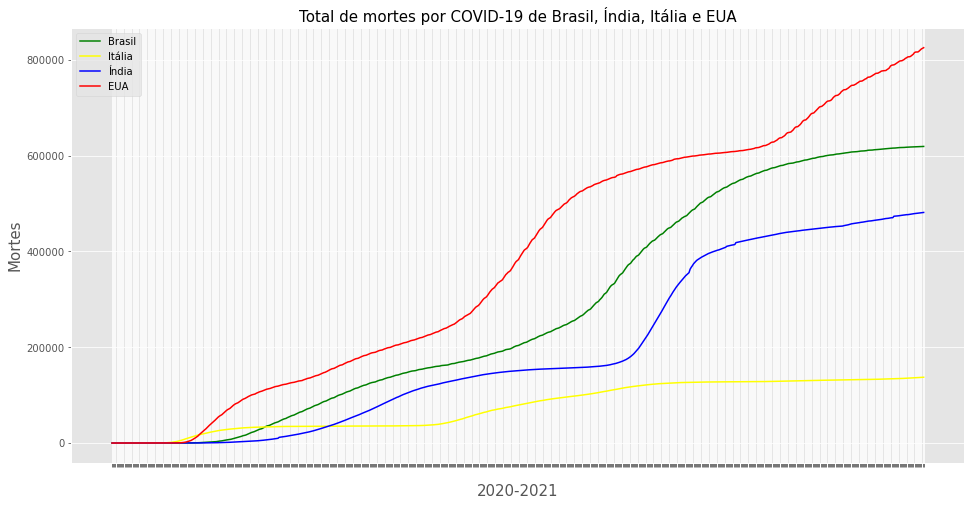

In [24]:
#Visualizando dados completos
plt.figure(figsize=(16,8))
plt.xticks(color='w')
plt.plot(s_brazil.index, s_brazil.values, label = 'Brasil', color = 'green')
plt.plot(s_us.index, s_italy.values, label = 'Itália', color = 'yellow')
plt.plot(s_india.index, s_india.values, label = 'Índia', color = 'blue')
plt.plot(s_us.index, s_us.values, label = 'EUA', color = 'red')
plt.title('Total de mortes por COVID-19 de Brasil, Índia, Itália e EUA', size = 15)
plt.xlabel("2020-2021", size = 15)
plt.ylabel("Mortes", size = 15)
plt.legend()
plt.show()

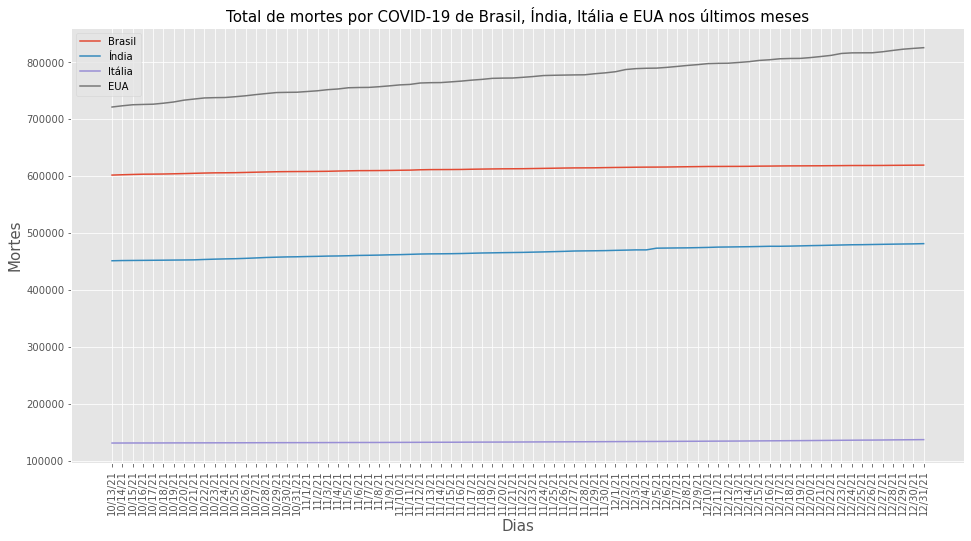

In [25]:
#Visualizando os dados em parte
tam = len(s_brazil)
plt.figure(figsize=(16,8))
plt.xticks(rotation = 90)
plt.plot(s_brazil.index[tam-80:tam], s_brazil.values[tam-80:tam], label = 'Brasil')
plt.plot(s_india.index[tam-80:tam], s_india.values[tam-80:tam], label = 'Índia')
plt.plot(s_italy.index[tam-80:tam], s_italy.values[tam-80:tam], label = 'Itália')
plt.plot(s_us.index[tam-80:tam], s_us.values[tam-80:tam], label = 'EUA')
plt.title('Total de mortes por COVID-19 de Brasil, Índia, Itália e EUA nos últimos meses', size = 15)
plt.xlabel("Dias", size = 15)
plt.ylabel("Mortes", size = 15)
plt.legend()
plt.show()

In [26]:
#Exportação de dados totais
s_brazil = s_brazil[s_brazil > 0]
s_india = s_india[s_india > 0]
s_italy = s_italy[s_italy > 0]
s_us = s_us[s_us > 0]
s_brazil.to_csv('datasets/countries/mortes_covid19_brazil.csv')
s_india.to_csv('datasets/countries/mortes_covid19_india.csv')
s_italy.to_csv('datasets/countries/mortes_covid19_italy.csv')
s_us.to_csv('datasets/countries/mortes_covid19_us.csv')

# Implementação dos modelos LSTM e MLP



In [27]:
# converter uma matriz de valores em uma matriz de conjunto de dados
def create_dataset(dataset, look_back=1):
	dataX, dataY = [], []
	for i in range(len(dataset)-look_back-1):
		a = dataset[i:(i+look_back), 0]
		dataX.append(a)
		dataY.append(dataset[i + look_back, 0])
	return numpy.array(dataX), numpy.array(dataY)

In [28]:
#Criando dicionários para armazenamento de dados
#Dicionários LSMT
dts = dict() #Dicionário de datasets 
trpp = dict() #Dicionário de treinos
tspp = dict() #Dicionário de testes
trs = dict() #Dicionário de scores de treinos 
tss = dict() #Dicionário de scores de testes
tsm = dict() #Dicionário de MAES

#Valores selecionados (Melhores valores)
strpp = dict() #Dicionário de treinos
stspp = dict() #Dicionário de testes
strs = dict() #Dicionário de scores de treinos 
stss = {'Brasil':(9**15), 'Índia':(9**15), 'EUA':(9**15),'Itália':(9**15)} #Dicionário de scores de testes
stsm = {'Brasil':(9**15), 'Índia':(9**15), 'EUA':(9**15),'Itália':(9**15)} #Dicionário de MAE's Saída

#Dicionários MLP
dtsMLP = dict() #Dicionário de datasets 
trppMLP = dict() #Dicionário de treinos
tsppMLP = dict() #Dicionário de testes
trsMLP = dict() #Dicionário de scores de treinos 
tssMLP = dict() #Dicionário de scores de testes
t_aMLP = dict() #Dicionário de taxa de aprendizagem
tsmMLP = dict() #Dicionário de MAES

#Valores selecionados (Melhores valores)
strppMLP = dict() #Dicionário de treinos
stsppMLP = dict() #Dicionário de testes
strsMLP = dict() #Dicionário de scores de treinos 
stssMLP = {'Brasil':(9**15), 'Índia':(9**15), 'EUA':(9**15),'Itália':(9**15)} #Dicionário de scores de testes
stsmMLP = {'Brasil':(9**15), 'Índia':(9**15), 'EUA':(9**15),'Itália':(9**15)} #Dicionário de MAE's Saída

st_aMLP = dict() #Dicionário de taxa de aprendizagem saída

#Ajustes para seleção LSTM
t_a = dict() #Dicionário de taxa de aprendizagem
dropout = dict() #Dicionário de dropout
n_cel = dict() #Dicionário de número de células
st_a = dict() #Dicionário de taxa de aprendizagem saída
sdropout = dict() #Dicionário de dropout saída
sn_cel = dict() #Dicionário de número de células saída

#Ajustes para seleção MLP
t_a = dict() #Dicionário de taxa de aprendizagem
dropoutMLP = dict() #Dicionário de dropout
n_neu = dict() #Dicionário de número de neurônios
st_aMLP = dict() #Dicionário de taxa de aprendizagem saída
sdropoutMLP = dict() #Dicionário de dropout saída
sn_neu = dict() #Dicionário de número de neurônios

#Armazenando testes para plotagem somente dos testes
testP = dict()
testPMLP = dict()
stestPMLP = dict()
testPred = dict()
testPredMLP = dict()
stestPred = dict()
stestPredMLP = dict()

#Armazenando treinos para plotagem somente dos treinos
trainP = dict()
trainPMLP = dict()
strainPMLP = dict()
trainPred = dict()
trainPredMLP = dict()
strainPred = dict()
strainPredMLP = dict()

In [29]:
country = ['Brasil', 'Índia', 'Itália', 'EUA'] #Lista de países

#Grid Search
T_A = [0.01, 0.05, 0.1, 0.2] #0.01, 0.02, 0,03, 0.06, 0.1, 0.2; 
DROP = [0.01, 0.05, 0.1, 0.2]   #0.05, 0.1, 0.15, 0.2, 0.3, 0.5;
N_C = [200, 300, 400, 600]    #50, 100, 200, 300, 400, 600;
NPC = [8, 16, 32, 64] #Neurônios por camada

#Relizando grade de experimentos
for i in range(len(country)):
    for z in range(len(T_A)):
        for j in range(len(DROP)):
            for k in range(len(N_C)):
                if country[i] == 'Brasil':
                    dataframe = read_csv('datasets/countries/mortes_covid19_brazil.csv', usecols=[1], engine='python')
                    dataset = dataframe.values
                    dataset = dataset.astype('float32')
                if country[i] == 'Índia':
                    dataframe = read_csv('datasets/countries/mortes_covid19_india.csv', usecols=[1], engine='python')
                    dataset = dataframe.values
                    dataset = dataset.astype('float32')
                if country[i] == 'Itália':
                    dataframe = read_csv('datasets/countries/mortes_covid19_italy.csv', usecols=[1], engine='python')
                    dataset = dataframe.values
                    dataset = dataset.astype('float32')
                if country[i] == 'EUA':
                    dataframe = read_csv('datasets/countries/mortes_covid19_us.csv', usecols=[1], engine='python')
                    dataset = dataframe.values
                    dataset = dataset.astype('float32')
                
                #LSTM
                
                # Normalizar o dataset
                scaler = MinMaxScaler(feature_range=(0, 1))
                dataset = scaler.fit_transform(dataset)
                # dividir em conjuntos de treinamento e teste
                train_size = int(len(dataset) * 0.67)
                test_size = len(dataset) - train_size
                train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
                # remodelar em X = t e Y = t + 1
                look_back = 1
                trainX, trainY = create_dataset(train, look_back)
                testX, testY = create_dataset(test, look_back)
                # remodelar a entrada para ser [amostras, intervalos de tempo, recursos]
                trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
                testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
                #Criando modelo
                model = Sequential()
                keras.backend.set_epsilon(1)
                #Adicionando camada LSTM e alguma regularização de Dropout 
                model.add(LSTM(units=int(N_C[k])))
                model.add(Dropout(float(DROP[j])))
                model.add(Dense(units=1, activation='linear'))
                #definindo hiper parâmetros
                adam = keras.optimizers.Adam(learning_rate=float(T_A[z]), beta_1=0.999, beta_2=0.999, amsgrad=False)
                model.compile(loss='mean_squared_error', optimizer='adam')
                model.fit(trainX, trainY, epochs=200, batch_size=40) #Mudar para 300 épocas - fora do grid search
                #fazer previsões
                trainPredict = model.predict(trainX)
                testPredict = model.predict(testX)
                # inverter previsões
                trainPredict = scaler.inverse_transform(trainPredict)
                trainY = scaler.inverse_transform([trainY])
                testPredict = scaler.inverse_transform(testPredict)
                testY = scaler.inverse_transform([testY])
                # calcular raiz quadrada média do erro
                trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
                print('Train Score: %.2f RMSE' % (trainScore))
                testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
                print('Test Score: %.2f RMSE' % (testScore))
                #Calcular o MAE:
                MAE = mean_absolute_error(testY[0], testPredict[:,0])
                # mudar para treinar previsões para traçar
                trainPredictPlot = numpy.empty_like(dataset)
                trainPredictPlot[:, :] = numpy.nan
                trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
                # previsões de teste de deslocamento para plotagem
                testPredictPlot = numpy.empty_like(dataset)
                testPredictPlot[:, :] = numpy.nan
                testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict
                
                #MLP
                train_size = int(len(dataset) * 0.67)
                test_size = len(dataset) - train_size
                train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
                # remodelar em X = t e Y = t + 1
                look_back = 1
                trainX, trainY = create_dataset(train, look_back)
                testX, testY = create_dataset(test, look_back)
                # remodelar a entrada para ser [amostras, intervalos de tempo, recursos]
                trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
                testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
                model = Sequential()
                model.add(Dense(NPC[i], activation='sigmoid', input_dim = 1))
                model.add(Dropout(float(DROP[j])))
                model.add(Dense(NPC[i], activation='tanh'))
                model.add(Dropout(float(DROP[j])))
                model.add(Dense(NPC[i], activation='relu'))
                model.add(Dropout(float(DROP[j])))
                model.add(Dense(1))
                adam = keras.optimizers.Adam(learning_rate=float(T_A[z]))
                model.compile(optimizer=adam , loss='mean_squared_error')
                model.fit(trainX, trainY, epochs=200, batch_size = 40)
                #fazer previsões
                trainPredictMLP = model.predict(trainX)
                testPredictMLP = model.predict(testX)
                # inverter previsões
                trainPredictMLP = scaler.inverse_transform(trainPredictMLP)
                trainY = scaler.inverse_transform([trainY])
                testPredictMLP = scaler.inverse_transform(testPredictMLP)
                testY = scaler.inverse_transform([testY])
                # calcular raiz quadrada média do erro
                trainScoreMLP = math.sqrt(mean_squared_error(trainY[0], trainPredictMLP[:,0]))
                print('Train Score MLP: %.2f RMSE' % (trainScoreMLP))
                testScoreMLP = math.sqrt(mean_squared_error(testY[0], testPredictMLP[:,0]))
                print('Test Score MLP: %.2f RMSE' % (testScoreMLP))
                #Calcular o MAE:
                MAEMLP = mean_absolute_error(testY[0], testPredictMLP[:,0])
                # mudar para treinar previsões para traçar
                trainPredictPlotMLP = numpy.empty_like(dataset)
                trainPredictPlotMLP[:, :] = numpy.nan
                trainPredictPlotMLP[look_back:len(trainPredict)+look_back, :] = trainPredict
                # previsões de teste de deslocamento para plotagem
                testPredictPlotMLP = numpy.empty_like(dataset)
                testPredictPlotMLP[:, :] = numpy.nan
                testPredictPlotMLP[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


                #Armazenando as informações em dicionários LSTM
                tss[country[i]] = testScore
                tsm[country[i]] = MAE
                trpp[country[i]] = trainPredictPlot
                tspp[country[i]] = testPredictPlot
                trs[country[i]] = trainScore
                dts[country[i]] = scaler.inverse_transform(dataset)
                t_a[country[i]] = T_A[z]
                dropout[country[i]] = DROP[j]
                n_cel[country[i]] = N_C[k]
                tsm[country[i]] = MAE
                trainP[country[i]] = scaler.inverse_transform(train)
                testP[country[i]] = scaler.inverse_transform(test)
                trainPred[country[i]] = trainPredict
                testPred[country[i]] = testPredict
                
                if tss[country[i]] < stss[country[i]]: #Condição de verificação dos melhores resultados
                    strpp[country[i]] = trainPredictPlot
                    stspp[country[i]] = testPredictPlot
                    strs[country[i]] = trainScore
                    stss[country[i]] = testScore
                    st_a[country[i]] = T_A[z]
                    sdropout[country[i]] = DROP[j]
                    sn_cel[country[i]] = N_C[k]
                    stsm[country[i]] = MAE
                    strainPred[country[i]] = trainPredict
                    stestPred[country[i]] = testPredict
                    
                #Armazenando as informações em dicionários MLP
                tssMLP[country[i]] = testScoreMLP
                trppMLP[country[i]] = trainPredictPlotMLP
                tsppMLP[country[i]] = testPredictPlotMLP
                trsMLP[country[i]] = trainScoreMLP
                t_aMLP[country[i]] = T_A[z]
                dropoutMLP[country[i]] = DROP[j]
                n_neu[country[i]] = NPC[i]
                tsmMLP[country[i]] = MAEMLP
                trainPredMLP[country[i]] = trainPredictMLP
                testPredMLP[country[i]] = testPredictMLP
                
                if tssMLP[country[i]] < stssMLP[country[i]]: #Condição de verificação dos melhores resultados
                    strppMLP[country[i]] = trainPredictPlotMLP
                    stsppMLP[country[i]] = testPredictPlotMLP
                    strsMLP[country[i]] = trainScoreMLP
                    stssMLP[country[i]] = testScoreMLP
                    st_aMLP[country[i]] = T_A[z]
                    sdropoutMLP[country[i]] = DROP[j]
                    sn_neu[country[i]] = NPC[i]
                    stsmMLP[country[i]] = MAEMLP
                    strainPredMLP[country[i]] = trainPredictMLP
                    stestPredMLP[country[i]] = testPredictMLP

Epoch 1/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0963
Epoch 2/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0599
Epoch 3/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0367
Epoch 4/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0245
Epoch 5/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0211
Epoch 6/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0191
Epoch 7/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0167
Epoch 8/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0142
Epoch 9/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0121
Epoch 10/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0099
Epoch 11/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0078
Epoch 12/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0059
Epoch 13/200
11/11 [=================

11/11 [==============================] - 0s 2ms/step - loss: 1.9330e-05
Epoch 99/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8615e-05
Epoch 100/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8519e-05
Epoch 101/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8955e-05
Epoch 102/200
11/11 [==============================] - 0s 1ms/step - loss: 1.7554e-05
Epoch 103/200
11/11 [==============================] - 0s 2ms/step - loss: 1.9946e-05
Epoch 104/200
11/11 [==============================] - 0s 2ms/step - loss: 1.7000e-05
Epoch 105/200
11/11 [==============================] - 0s 1ms/step - loss: 2.0420e-05
Epoch 106/200
11/11 [==============================] - 0s 2ms/step - loss: 1.7745e-05
Epoch 107/200
11/11 [==============================] - 0s 1ms/step - loss: 1.9093e-05
Epoch 108/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8938e-05
Epoch 109/200
11/11 [==============================] - 0s 2ms/step - 

11/11 [==============================] - 0s 2ms/step - loss: 1.0531e-05
Epoch 194/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0437e-05
Epoch 195/200
11/11 [==============================] - 0s 2ms/step - loss: 9.8660e-06
Epoch 196/200
11/11 [==============================] - 0s 1ms/step - loss: 9.4573e-06
Epoch 197/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1399e-05
Epoch 198/200
11/11 [==============================] - 0s 2ms/step - loss: 9.9869e-06
Epoch 199/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0821e-05
Epoch 200/200
11/11 [==============================] - 0s 2ms/step - loss: 1.0144e-05
Train Score: 1075.23 RMSE
Test Score: 5072.01 RMSE
Epoch 1/200
11/11 [==============================] - 0s 546us/step - loss: 0.0400
Epoch 2/200
11/11 [==============================] - 0s 455us/step - loss: 0.0287
Epoch 3/200
11/11 [==============================] - 0s 546us/step - loss: 0.0181
Epoch 4/200
11/11 [==========

11/11 [==============================] - 0s 455us/step - loss: 8.1430e-04
Epoch 90/200
11/11 [==============================] - 0s 455us/step - loss: 8.8719e-04
Epoch 91/200
11/11 [==============================] - 0s 455us/step - loss: 6.4276e-04
Epoch 92/200
11/11 [==============================] - 0s 455us/step - loss: 4.6523e-04
Epoch 93/200
11/11 [==============================] - 0s 455us/step - loss: 8.4336e-04
Epoch 94/200
11/11 [==============================] - 0s 455us/step - loss: 5.3478e-04
Epoch 95/200
11/11 [==============================] - 0s 455us/step - loss: 7.3672e-04
Epoch 96/200
11/11 [==============================] - 0s 455us/step - loss: 6.4176e-04
Epoch 97/200
11/11 [==============================] - 0s 455us/step - loss: 4.0806e-04
Epoch 98/200
11/11 [==============================] - 0s 546us/step - loss: 7.1341e-04
Epoch 99/200
11/11 [==============================] - 0s 455us/step - loss: 7.2715e-04
Epoch 100/200
11/11 [==============================] - 0

11/11 [==============================] - 0s 546us/step - loss: 4.9098e-04
Epoch 183/200
11/11 [==============================] - 0s 455us/step - loss: 4.7799e-04
Epoch 184/200
11/11 [==============================] - 0s 546us/step - loss: 9.1475e-04
Epoch 185/200
11/11 [==============================] - 0s 455us/step - loss: 3.8748e-04
Epoch 186/200
11/11 [==============================] - 0s 455us/step - loss: 5.2005e-04
Epoch 187/200
11/11 [==============================] - 0s 546us/step - loss: 4.7023e-04
Epoch 188/200
11/11 [==============================] - 0s 455us/step - loss: 6.7098e-04
Epoch 189/200
11/11 [==============================] - 0s 455us/step - loss: 5.2836e-04
Epoch 190/200
11/11 [==============================] - 0s 455us/step - loss: 6.2023e-04
Epoch 191/200
11/11 [==============================] - 0s 455us/step - loss: 3.1562e-04
Epoch 192/200
11/11 [==============================] - 0s 546us/step - loss: 3.4439e-04
Epoch 193/200
11/11 [=========================

11/11 [==============================] - 0s 3ms/step - loss: 1.3082e-05
Epoch 78/200
11/11 [==============================] - 0s 3ms/step - loss: 1.4062e-05
Epoch 79/200
11/11 [==============================] - 0s 3ms/step - loss: 1.5033e-05
Epoch 80/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1329e-05
Epoch 81/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2975e-05
Epoch 82/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2510e-05
Epoch 83/200
11/11 [==============================] - 0s 3ms/step - loss: 1.3688e-05
Epoch 84/200
11/11 [==============================] - 0s 3ms/step - loss: 1.4163e-05
Epoch 85/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0551e-05
Epoch 86/200
11/11 [==============================] - 0s 3ms/step - loss: 1.3232e-05
Epoch 87/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2395e-05
Epoch 88/200
11/11 [==============================] - 0s 3ms/step - loss: 1.28

11/11 [==============================] - 0s 3ms/step - loss: 7.6809e-06
Epoch 173/200
11/11 [==============================] - 0s 3ms/step - loss: 7.4204e-06
Epoch 174/200
11/11 [==============================] - 0s 3ms/step - loss: 6.7966e-06
Epoch 175/200
11/11 [==============================] - 0s 3ms/step - loss: 6.5887e-06
Epoch 176/200
11/11 [==============================] - 0s 3ms/step - loss: 7.0704e-06
Epoch 177/200
11/11 [==============================] - 0s 3ms/step - loss: 6.8333e-06
Epoch 178/200
11/11 [==============================] - 0s 3ms/step - loss: 6.2421e-06
Epoch 179/200
11/11 [==============================] - 0s 3ms/step - loss: 6.7357e-06
Epoch 180/200
11/11 [==============================] - 0s 3ms/step - loss: 7.3323e-06
Epoch 181/200
11/11 [==============================] - 0s 3ms/step - loss: 6.2511e-06
Epoch 182/200
11/11 [==============================] - 0s 3ms/step - loss: 6.8987e-06
Epoch 183/200
11/11 [==============================] - 0s 3ms/step -

11/11 [==============================] - 0s 455us/step - loss: 8.8100e-04
Epoch 69/200
11/11 [==============================] - 0s 455us/step - loss: 8.9114e-04
Epoch 70/200
11/11 [==============================] - 0s 455us/step - loss: 4.8543e-04
Epoch 71/200
11/11 [==============================] - 0s 455us/step - loss: 8.1330e-04
Epoch 72/200
11/11 [==============================] - 0s 455us/step - loss: 9.8956e-04
Epoch 73/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 74/200
11/11 [==============================] - 0s 546us/step - loss: 5.7071e-04
Epoch 75/200
11/11 [==============================] - 0s 455us/step - loss: 7.4551e-04
Epoch 76/200
11/11 [==============================] - 0s 455us/step - loss: 9.5267e-04
Epoch 77/200
11/11 [==============================] - 0s 455us/step - loss: 4.7554e-04
Epoch 78/200
11/11 [==============================] - 0s 546us/step - loss: 4.7449e-04
Epoch 79/200
11/11 [==============================] - 0s 455

11/11 [==============================] - 0s 546us/step - loss: 3.7153e-04
Epoch 162/200
11/11 [==============================] - 0s 546us/step - loss: 5.8555e-04
Epoch 163/200
11/11 [==============================] - 0s 455us/step - loss: 3.7909e-04
Epoch 164/200
11/11 [==============================] - 0s 455us/step - loss: 4.0595e-04
Epoch 165/200
11/11 [==============================] - 0s 546us/step - loss: 3.8636e-04
Epoch 166/200
11/11 [==============================] - 0s 455us/step - loss: 4.2553e-04
Epoch 167/200
11/11 [==============================] - 0s 455us/step - loss: 4.1838e-04
Epoch 168/200
11/11 [==============================] - 0s 455us/step - loss: 4.6937e-04
Epoch 169/200
11/11 [==============================] - 0s 455us/step - loss: 3.0313e-04
Epoch 170/200
11/11 [==============================] - 0s 455us/step - loss: 6.1633e-04
Epoch 171/200
11/11 [==============================] - 0s 546us/step - loss: 4.5616e-04
Epoch 172/200
11/11 [=========================

11/11 [==============================] - 0s 5ms/step - loss: 1.4301e-05
Epoch 57/200
11/11 [==============================] - 0s 5ms/step - loss: 1.3141e-05
Epoch 58/200
11/11 [==============================] - 0s 5ms/step - loss: 1.5232e-05
Epoch 59/200
11/11 [==============================] - 0s 5ms/step - loss: 1.5009e-05
Epoch 60/200
11/11 [==============================] - 0s 5ms/step - loss: 1.2151e-05
Epoch 61/200
11/11 [==============================] - 0s 5ms/step - loss: 1.2247e-05
Epoch 62/200
11/11 [==============================] - 0s 6ms/step - loss: 1.3000e-05
Epoch 63/200
11/11 [==============================] - 0s 5ms/step - loss: 1.2321e-05
Epoch 64/200
11/11 [==============================] - 0s 5ms/step - loss: 1.3160e-05
Epoch 65/200
11/11 [==============================] - 0s 5ms/step - loss: 1.3244e-05
Epoch 66/200
11/11 [==============================] - 0s 5ms/step - loss: 1.1638e-05
Epoch 67/200
11/11 [==============================] - 0s 5ms/step - loss: 1.34

11/11 [==============================] - 0s 5ms/step - loss: 5.5536e-06
Epoch 152/200
11/11 [==============================] - 0s 5ms/step - loss: 6.7029e-06
Epoch 153/200
11/11 [==============================] - 0s 5ms/step - loss: 5.6198e-06
Epoch 154/200
11/11 [==============================] - 0s 5ms/step - loss: 5.5001e-06
Epoch 155/200
11/11 [==============================] - 0s 5ms/step - loss: 6.3263e-06
Epoch 156/200
11/11 [==============================] - 0s 5ms/step - loss: 5.7505e-06
Epoch 157/200
11/11 [==============================] - 0s 5ms/step - loss: 4.6149e-06
Epoch 158/200
11/11 [==============================] - 0s 5ms/step - loss: 6.3375e-06
Epoch 159/200
11/11 [==============================] - 0s 5ms/step - loss: 5.8466e-06
Epoch 160/200
11/11 [==============================] - 0s 5ms/step - loss: 6.5009e-06
Epoch 161/200
11/11 [==============================] - 0s 5ms/step - loss: 6.3952e-06
Epoch 162/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0030
Epoch 45/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 46/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 47/200
11/11 [==============================] - 0s 455us/step - loss: 0.0025
Epoch 48/200
11/11 [==============================] - 0s 455us/step - loss: 0.0039
Epoch 49/200
11/11 [==============================] - 0s 455us/step - loss: 0.0027
Epoch 50/200
11/11 [==============================] - 0s 546us/step - loss: 0.0034
Epoch 51/200
11/11 [==============================] - 0s 546us/step - loss: 0.0022
Epoch 52/200
11/11 [==============================] - 0s 455us/step - loss: 0.0059
Epoch 53/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 54/200
11/11 [==============================] - 0s 546us/step - loss: 0.0033
Epoch 55/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 56/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 6.0127e-04
Epoch 141/200
11/11 [==============================] - 0s 546us/step - loss: 5.0250e-04
Epoch 142/200
11/11 [==============================] - 0s 455us/step - loss: 7.3162e-04
Epoch 143/200
11/11 [==============================] - 0s 455us/step - loss: 6.2984e-04
Epoch 144/200
11/11 [==============================] - 0s 455us/step - loss: 9.7669e-04
Epoch 145/200
11/11 [==============================] - 0s 455us/step - loss: 6.7001e-04
Epoch 146/200
11/11 [==============================] - 0s 455us/step - loss: 4.7715e-04
Epoch 147/200
11/11 [==============================] - 0s 455us/step - loss: 3.3532e-04
Epoch 148/200
11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 149/200
11/11 [==============================] - 0s 455us/step - loss: 7.0164e-04
Epoch 150/200
11/11 [==============================] - 0s 455us/step - loss: 5.2007e-04
Epoch 151/200
11/11 [=============================

11/11 [==============================] - 0s 9ms/step - loss: 1.1747e-05
Epoch 35/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1577e-05
Epoch 36/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2088e-05
Epoch 37/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2095e-05
Epoch 38/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2547e-05
Epoch 39/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2605e-05
Epoch 40/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0779e-05
Epoch 41/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0953e-05
Epoch 42/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0574e-05
Epoch 43/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1047e-05
Epoch 44/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1256e-05
Epoch 45/200
11/11 [==============================] - 0s 9ms/step - loss: 1.02

11/11 [==============================] - 0s 9ms/step - loss: 4.9621e-06
Epoch 130/200
11/11 [==============================] - 0s 9ms/step - loss: 5.2021e-06
Epoch 131/200
11/11 [==============================] - 0s 9ms/step - loss: 4.7586e-06
Epoch 132/200
11/11 [==============================] - 0s 9ms/step - loss: 4.6527e-06
Epoch 133/200
11/11 [==============================] - 0s 9ms/step - loss: 4.9000e-06
Epoch 134/200
11/11 [==============================] - 0s 9ms/step - loss: 4.8174e-06
Epoch 135/200
11/11 [==============================] - 0s 9ms/step - loss: 3.7847e-06
Epoch 136/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1751e-06
Epoch 137/200
11/11 [==============================] - 0s 9ms/step - loss: 3.6630e-06
Epoch 138/200
11/11 [==============================] - 0s 9ms/step - loss: 4.3666e-06
Epoch 139/200
11/11 [==============================] - 0s 9ms/step - loss: 4.0164e-06
Epoch 140/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 25/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 26/200
11/11 [==============================] - 0s 546us/step - loss: 0.0024
Epoch 27/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 28/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 29/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 30/200
11/11 [==============================] - 0s 546us/step - loss: 0.0020
Epoch 31/200
11/11 [==============================] - 0s 455us/step - loss: 0.0030
Epoch 32/200
11/11 [==============================] - 0s 455us/step - loss: 0.0020
Epoch 33/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 34/200
11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoch 35/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 36/200
11/1

11/11 [==============================] - 0s 546us/step - loss: 6.5109e-04
Epoch 121/200
11/11 [==============================] - 0s 819us/step - loss: 0.0014
Epoch 122/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 123/200
11/11 [==============================] - 0s 546us/step - loss: 6.5864e-04
Epoch 124/200
11/11 [==============================] - 0s 455us/step - loss: 7.4263e-04
Epoch 125/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 126/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 127/200
11/11 [==============================] - 0s 455us/step - loss: 0.0010
Epoch 128/200
11/11 [==============================] - 0s 455us/step - loss: 6.5469e-04
Epoch 129/200
11/11 [==============================] - 0s 455us/step - loss: 7.7974e-04
Epoch 130/200
11/11 [==============================] - 0s 546us/step - loss: 6.1868e-04
Epoch 131/200
11/11 [==============================] - 0s 455us/st

11/11 [==============================] - 0s 2ms/step - loss: 0.0018
Epoch 15/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0010
Epoch 16/200
11/11 [==============================] - 0s 2ms/step - loss: 5.2127e-04
Epoch 17/200
11/11 [==============================] - 0s 2ms/step - loss: 2.8419e-04
Epoch 18/200
11/11 [==============================] - 0s 2ms/step - loss: 1.3906e-04
Epoch 19/200
11/11 [==============================] - 0s 1ms/step - loss: 7.1803e-05
Epoch 20/200
11/11 [==============================] - 0s 2ms/step - loss: 9.1731e-05
Epoch 21/200
11/11 [==============================] - 0s 1ms/step - loss: 7.8849e-05
Epoch 22/200
11/11 [==============================] - 0s 2ms/step - loss: 6.2357e-05
Epoch 23/200
11/11 [==============================] - 0s 1ms/step - loss: 7.7355e-05
Epoch 24/200
11/11 [==============================] - 0s 2ms/step - loss: 7.4145e-05
Epoch 25/200
11/11 [==============================] - 0s 2ms/step - loss: 7.1363e-05
E

11/11 [==============================] - 0s 1ms/step - loss: 5.0857e-05
Epoch 111/200
11/11 [==============================] - 0s 2ms/step - loss: 4.4061e-05
Epoch 112/200
11/11 [==============================] - 0s 1ms/step - loss: 5.4696e-05
Epoch 113/200
11/11 [==============================] - 0s 2ms/step - loss: 5.0573e-05
Epoch 114/200
11/11 [==============================] - 0s 1ms/step - loss: 4.2940e-05
Epoch 115/200
11/11 [==============================] - 0s 2ms/step - loss: 5.2085e-05
Epoch 116/200
11/11 [==============================] - 0s 1ms/step - loss: 4.3613e-05
Epoch 117/200
11/11 [==============================] - 0s 1ms/step - loss: 4.4316e-05
Epoch 118/200
11/11 [==============================] - 0s 2ms/step - loss: 3.7012e-05
Epoch 119/200
11/11 [==============================] - 0s 1ms/step - loss: 4.6100e-05
Epoch 120/200
11/11 [==============================] - 0s 2ms/step - loss: 4.9863e-05
Epoch 121/200
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0364
Epoch 6/200
11/11 [==============================] - 0s 455us/step - loss: 0.0340
Epoch 7/200
11/11 [==============================] - 0s 455us/step - loss: 0.0315
Epoch 8/200
11/11 [==============================] - 0s 455us/step - loss: 0.0277
Epoch 9/200
11/11 [==============================] - 0s 455us/step - loss: 0.0233
Epoch 10/200
11/11 [==============================] - 0s 455us/step - loss: 0.0214
Epoch 11/200
11/11 [==============================] - 0s 455us/step - loss: 0.0179
Epoch 12/200
11/11 [==============================] - 0s 455us/step - loss: 0.0188
Epoch 13/200
11/11 [==============================] - 0s 455us/step - loss: 0.0151
Epoch 14/200
11/11 [==============================] - 0s 455us/step - loss: 0.0154
Epoch 15/200
11/11 [==============================] - 0s 455us/step - loss: 0.0103
Epoch 16/200
11/11 [==============================] - 0s 455us/step - loss: 0.0123
Epoch 17/200
11/11 [=

11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 104/200
11/11 [==============================] - 0s 546us/step - loss: 0.0020
Epoch 105/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 106/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 107/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 108/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 109/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 110/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 111/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 112/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 113/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 114/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 

11/11 [==============================] - 0s 455us/step - loss: 0.0019
Train Score MLP: 15555.15 RMSE
Test Score MLP: 72826.93 RMSE
Epoch 1/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0869
Epoch 2/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0463
Epoch 3/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0253
Epoch 4/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0204
Epoch 5/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0181
Epoch 6/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0148
Epoch 7/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0122
Epoch 8/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0097
Epoch 9/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0072
Epoch 10/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0049
Epoch 11/200
11/11 [==============================] - 0s 3ms/step - 

11/11 [==============================] - 0s 3ms/step - loss: 4.1329e-05
Epoch 97/200
11/11 [==============================] - 0s 3ms/step - loss: 3.3349e-05
Epoch 98/200
11/11 [==============================] - 0s 3ms/step - loss: 3.2226e-05
Epoch 99/200
11/11 [==============================] - 0s 3ms/step - loss: 3.6818e-05
Epoch 100/200
11/11 [==============================] - 0s 3ms/step - loss: 3.4730e-05
Epoch 101/200
11/11 [==============================] - 0s 3ms/step - loss: 2.5769e-05
Epoch 102/200
11/11 [==============================] - 0s 3ms/step - loss: 3.4571e-05
Epoch 103/200
11/11 [==============================] - 0s 3ms/step - loss: 2.8446e-05
Epoch 104/200
11/11 [==============================] - 0s 3ms/step - loss: 2.9280e-05
Epoch 105/200
11/11 [==============================] - 0s 3ms/step - loss: 2.9179e-05
Epoch 106/200
11/11 [==============================] - 0s 3ms/step - loss: 2.9910e-05
Epoch 107/200
11/11 [==============================] - 0s 3ms/step - lo

11/11 [==============================] - 0s 3ms/step - loss: 2.3273e-05
Epoch 191/200
11/11 [==============================] - 0s 3ms/step - loss: 2.5124e-05
Epoch 192/200
11/11 [==============================] - 0s 3ms/step - loss: 2.5252e-05
Epoch 193/200
11/11 [==============================] - 0s 3ms/step - loss: 2.5103e-05
Epoch 194/200
11/11 [==============================] - 0s 3ms/step - loss: 2.6120e-05
Epoch 195/200
11/11 [==============================] - 0s 3ms/step - loss: 2.8152e-05
Epoch 196/200
11/11 [==============================] - 0s 3ms/step - loss: 2.7369e-05
Epoch 197/200
11/11 [==============================] - 0s 3ms/step - loss: 2.7349e-05
Epoch 198/200
11/11 [==============================] - 0s 3ms/step - loss: 2.8642e-05
Epoch 199/200
11/11 [==============================] - 0s 3ms/step - loss: 2.9229e-05
Epoch 200/200
11/11 [==============================] - 0s 3ms/step - loss: 2.0533e-05
Train Score: 863.33 RMSE
Test Score: 2482.59 RMSE
Epoch 1/200
11/11 

Epoch 88/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 89/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 90/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 91/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 92/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 93/200
11/11 [==============================] - 0s 455us/step - loss: 0.0026
Epoch 94/200
11/11 [==============================] - 0s 364us/step - loss: 0.0020
Epoch 95/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 96/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 97/200
11/11 [==============================] - 0s 455us/step - loss: 0.0020
Epoch 98/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 99/200
11/11 [==============================] - 0s 455us/step - loss: 0.0026
Epoc

11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 186/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 187/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 188/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 189/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 190/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 191/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 192/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 193/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 194/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 195/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 196/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 

Epoch 81/200
11/11 [==============================] - 0s 5ms/step - loss: 2.9505e-05
Epoch 82/200
11/11 [==============================] - 0s 5ms/step - loss: 2.8011e-05
Epoch 83/200
11/11 [==============================] - 0s 5ms/step - loss: 2.8893e-05
Epoch 84/200
11/11 [==============================] - 0s 5ms/step - loss: 2.6463e-05
Epoch 85/200
11/11 [==============================] - 0s 5ms/step - loss: 2.9843e-05
Epoch 86/200
11/11 [==============================] - 0s 5ms/step - loss: 2.7789e-05
Epoch 87/200
11/11 [==============================] - 0s 5ms/step - loss: 2.5303e-05
Epoch 88/200
11/11 [==============================] - 0s 5ms/step - loss: 2.3355e-05
Epoch 89/200
11/11 [==============================] - 0s 5ms/step - loss: 2.7430e-05
Epoch 90/200
11/11 [==============================] - 0s 5ms/step - loss: 2.8962e-05
Epoch 91/200
11/11 [==============================] - 0s 5ms/step - loss: 3.3567e-05
Epoch 92/200
11/11 [==============================] - 0s 5ms/step

11/11 [==============================] - 0s 5ms/step - loss: 2.2323e-05
Epoch 177/200
11/11 [==============================] - 0s 5ms/step - loss: 2.0705e-05
Epoch 178/200
11/11 [==============================] - 0s 5ms/step - loss: 2.1764e-05
Epoch 179/200
11/11 [==============================] - 0s 5ms/step - loss: 2.9507e-05
Epoch 180/200
11/11 [==============================] - 0s 5ms/step - loss: 2.4013e-05
Epoch 181/200
11/11 [==============================] - 0s 5ms/step - loss: 2.3899e-05
Epoch 182/200
11/11 [==============================] - 0s 5ms/step - loss: 2.1533e-05
Epoch 183/200
11/11 [==============================] - 0s 5ms/step - loss: 2.7074e-05
Epoch 184/200
11/11 [==============================] - 0s 5ms/step - loss: 2.2189e-05
Epoch 185/200
11/11 [==============================] - 0s 5ms/step - loss: 2.0851e-05
Epoch 186/200
11/11 [==============================] - 0s 5ms/step - loss: 1.9604e-05
Epoch 187/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 74/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 75/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 76/200
11/11 [==============================] - 0s 455us/step - loss: 0.0025
Epoch 77/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 78/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 79/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 80/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 81/200
11/11 [==============================] - 0s 546us/step - loss: 0.0020
Epoch 82/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 83/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 84/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 85/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 172/200
11/11 [==============================] - 0s 455us/step - loss: 0.0010
Epoch 173/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 174/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 175/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 176/200
11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 177/200
11/11 [==============================] - 0s 546us/step - loss: 0.0017
Epoch 178/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 179/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 180/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 181/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 182/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 2.2816e-05
Epoch 68/200
11/11 [==============================] - 0s 9ms/step - loss: 2.2792e-05
Epoch 69/200
11/11 [==============================] - 0s 9ms/step - loss: 1.9907e-05
Epoch 70/200
11/11 [==============================] - 0s 9ms/step - loss: 2.3392e-05
Epoch 71/200
11/11 [==============================] - 0s 9ms/step - loss: 2.1344e-05
Epoch 72/200
11/11 [==============================] - 0s 9ms/step - loss: 2.2752e-05
Epoch 73/200
11/11 [==============================] - 0s 9ms/step - loss: 1.7779e-05
Epoch 74/200
11/11 [==============================] - 0s 9ms/step - loss: 1.8664e-05
Epoch 75/200
11/11 [==============================] - 0s 9ms/step - loss: 1.9351e-05
Epoch 76/200
11/11 [==============================] - 0s 10ms/step - loss: 2.1265e-05
Epoch 77/200
11/11 [==============================] - 0s 9ms/step - loss: 2.3186e-05
Epoch 78/200
11/11 [==============================] - 0s 9ms/step - loss: 2.2

11/11 [==============================] - 0s 9ms/step - loss: 1.4721e-05
Epoch 163/200
11/11 [==============================] - 0s 9ms/step - loss: 1.5643e-05
Epoch 164/200
11/11 [==============================] - 0s 9ms/step - loss: 1.6859e-05
Epoch 165/200
11/11 [==============================] - 0s 9ms/step - loss: 1.5833e-05
Epoch 166/200
11/11 [==============================] - 0s 9ms/step - loss: 1.4750e-05
Epoch 167/200
11/11 [==============================] - ETA: 0s - loss: 1.3505e-0 - 0s 9ms/step - loss: 1.3789e-05
Epoch 168/200
11/11 [==============================] - 0s 9ms/step - loss: 1.5624e-05
Epoch 169/200
11/11 [==============================] - 0s 9ms/step - loss: 1.5820e-05
Epoch 170/200
11/11 [==============================] - 0s 9ms/step - loss: 1.6819e-05
Epoch 171/200
11/11 [==============================] - 0s 9ms/step - loss: 1.5873e-05
Epoch 172/200
11/11 [==============================] - 0s 9ms/step - loss: 1.5155e-05
Epoch 173/200
11/11 [===================

11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 59/200
11/11 [==============================] - 0s 455us/step - loss: 0.0043
Epoch 60/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 61/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 62/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 63/200
11/11 [==============================] - 0s 546us/step - loss: 0.0035
Epoch 64/200
11/11 [==============================] - 0s 455us/step - loss: 0.0048
Epoch 65/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 66/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 67/200
11/11 [==============================] - 0s 455us/step - loss: 0.0044
Epoch 68/200
11/11 [==============================] - 0s 546us/step - loss: 0.0041
Epoch 69/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 70/200
11/1

11/11 [==============================] - 0s 546us/step - loss: 0.0027
Epoch 157/200
11/11 [==============================] - 0s 455us/step - loss: 0.0028
Epoch 158/200
11/11 [==============================] - 0s 546us/step - loss: 0.0028
Epoch 159/200
11/11 [==============================] - 0s 455us/step - loss: 0.0028
Epoch 160/200
11/11 [==============================] - 0s 455us/step - loss: 0.0025
Epoch 161/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 162/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 163/200
11/11 [==============================] - 0s 546us/step - loss: 0.0027
Epoch 164/200
11/11 [==============================] - 0s 455us/step - loss: 0.0028
Epoch 165/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 166/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 167/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 1.0471e-04
Epoch 54/200
11/11 [==============================] - 0s 2ms/step - loss: 1.2563e-04
Epoch 55/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0829e-04
Epoch 56/200
11/11 [==============================] - 0s 2ms/step - loss: 1.2022e-04
Epoch 57/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0770e-04
Epoch 58/200
11/11 [==============================] - 0s 2ms/step - loss: 1.0790e-04
Epoch 59/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0447e-04
Epoch 60/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1400e-04
Epoch 61/200
11/11 [==============================] - 0s 2ms/step - loss: 1.1013e-04
Epoch 62/200
11/11 [==============================] - 0s 2ms/step - loss: 1.1042e-04
Epoch 63/200
11/11 [==============================] - 0s 2ms/step - loss: 1.0581e-04
Epoch 64/200
11/11 [==============================] - 0s 2ms/step - loss: 1.25

11/11 [==============================] - 0s 2ms/step - loss: 7.9978e-05
Epoch 149/200
11/11 [==============================] - 0s 1ms/step - loss: 9.5426e-05
Epoch 150/200
11/11 [==============================] - 0s 2ms/step - loss: 8.1926e-05
Epoch 151/200
11/11 [==============================] - 0s 2ms/step - loss: 8.7195e-05
Epoch 152/200
11/11 [==============================] - 0s 2ms/step - loss: 8.4206e-05
Epoch 153/200
11/11 [==============================] - 0s 2ms/step - loss: 8.8296e-05
Epoch 154/200
11/11 [==============================] - 0s 1ms/step - loss: 8.0030e-05
Epoch 155/200
11/11 [==============================] - 0s 2ms/step - loss: 7.0240e-05
Epoch 156/200
11/11 [==============================] - 0s 2ms/step - loss: 8.7106e-05
Epoch 157/200
11/11 [==============================] - 0s 2ms/step - loss: 7.6610e-05
Epoch 158/200
11/11 [==============================] - 0s 2ms/step - loss: 9.0177e-05
Epoch 159/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0057
Epoch 45/200
11/11 [==============================] - 0s 546us/step - loss: 0.0080
Epoch 46/200
11/11 [==============================] - 0s 455us/step - loss: 0.0077
Epoch 47/200
11/11 [==============================] - 0s 546us/step - loss: 0.0059
Epoch 48/200
11/11 [==============================] - 0s 455us/step - loss: 0.0076
Epoch 49/200
11/11 [==============================] - 0s 455us/step - loss: 0.0059
Epoch 50/200
11/11 [==============================] - 0s 455us/step - loss: 0.0050
Epoch 51/200
11/11 [==============================] - 0s 455us/step - loss: 0.0056
Epoch 52/200
11/11 [==============================] - 0s 455us/step - loss: 0.0072
Epoch 53/200
11/11 [==============================] - 0s 455us/step - loss: 0.0051
Epoch 54/200
11/11 [==============================] - 0s 455us/step - loss: 0.0052
Epoch 55/200
11/11 [==============================] - 0s 455us/step - loss: 0.0073
Epoch 56/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0033
Epoch 143/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 144/200
11/11 [==============================] - 0s 546us/step - loss: 0.0030
Epoch 145/200
11/11 [==============================] - 0s 455us/step - loss: 0.0043
Epoch 146/200
11/11 [==============================] - 0s 455us/step - loss: 0.0034
Epoch 147/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 148/200
11/11 [==============================] - 0s 455us/step - loss: 0.0047
Epoch 149/200
11/11 [==============================] - 0s 455us/step - loss: 0.0039
Epoch 150/200
11/11 [==============================] - 0s 455us/step - loss: 0.0042
Epoch 151/200
11/11 [==============================] - 0s 455us/step - loss: 0.0038
Epoch 152/200
11/11 [==============================] - 0s 455us/step - loss: 0.0027
Epoch 153/200
11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 

11/11 [==============================] - 0s 3ms/step - loss: 9.0486e-05
Epoch 39/200
11/11 [==============================] - 0s 3ms/step - loss: 8.3159e-05
Epoch 40/200
11/11 [==============================] - 0s 3ms/step - loss: 8.1602e-05
Epoch 41/200
11/11 [==============================] - 0s 3ms/step - loss: 8.2230e-05
Epoch 42/200
11/11 [==============================] - 0s 3ms/step - loss: 8.3087e-05
Epoch 43/200
11/11 [==============================] - 0s 3ms/step - loss: 7.7004e-05
Epoch 44/200
11/11 [==============================] - 0s 3ms/step - loss: 7.9036e-05
Epoch 45/200
11/11 [==============================] - 0s 3ms/step - loss: 8.1719e-05
Epoch 46/200
11/11 [==============================] - 0s 3ms/step - loss: 8.7044e-05
Epoch 47/200
11/11 [==============================] - 0s 3ms/step - loss: 9.0067e-05
Epoch 48/200
11/11 [==============================] - 0s 3ms/step - loss: 8.1081e-05
Epoch 49/200
11/11 [==============================] - 0s 3ms/step - loss: 8.10

11/11 [==============================] - 0s 3ms/step - loss: 5.0158e-05
Epoch 134/200
11/11 [==============================] - 0s 3ms/step - loss: 5.6089e-05
Epoch 135/200
11/11 [==============================] - 0s 3ms/step - loss: 5.2806e-05
Epoch 136/200
11/11 [==============================] - 0s 3ms/step - loss: 6.6844e-05
Epoch 137/200
11/11 [==============================] - 0s 3ms/step - loss: 5.8418e-05
Epoch 138/200
11/11 [==============================] - 0s 3ms/step - loss: 6.0187e-05
Epoch 139/200
11/11 [==============================] - 0s 3ms/step - loss: 5.0594e-05
Epoch 140/200
11/11 [==============================] - 0s 3ms/step - loss: 5.6101e-05
Epoch 141/200
11/11 [==============================] - 0s 3ms/step - loss: 6.4081e-05
Epoch 142/200
11/11 [==============================] - 0s 3ms/step - loss: 6.4017e-05
Epoch 143/200
11/11 [==============================] - 0s 3ms/step - loss: 6.4298e-05
Epoch 144/200
11/11 [==============================] - 0s 3ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0156
Epoch 29/200
11/11 [==============================] - 0s 455us/step - loss: 0.0180
Epoch 30/200
11/11 [==============================] - 0s 455us/step - loss: 0.0155
Epoch 31/200
11/11 [==============================] - 0s 455us/step - loss: 0.0193
Epoch 32/200
11/11 [==============================] - 0s 546us/step - loss: 0.0140
Epoch 33/200
11/11 [==============================] - 0s 546us/step - loss: 0.0127
Epoch 34/200
11/11 [==============================] - 0s 455us/step - loss: 0.0145
Epoch 35/200
11/11 [==============================] - 0s 455us/step - loss: 0.0124
Epoch 36/200
11/11 [==============================] - 0s 455us/step - loss: 0.0146
Epoch 37/200
11/11 [==============================] - 0s 455us/step - loss: 0.0158
Epoch 38/200
11/11 [==============================] - 0s 455us/step - loss: 0.0148
Epoch 39/200
11/11 [==============================] - 0s 455us/step - loss: 0.0120
Epoch 40/200
11/1

11/11 [==============================] - 0s 546us/step - loss: 0.0055
Epoch 127/200
11/11 [==============================] - 0s 455us/step - loss: 0.0057
Epoch 128/200
11/11 [==============================] - 0s 455us/step - loss: 0.0073
Epoch 129/200
11/11 [==============================] - 0s 455us/step - loss: 0.0061
Epoch 130/200
11/11 [==============================] - 0s 455us/step - loss: 0.0065
Epoch 131/200
11/11 [==============================] - 0s 546us/step - loss: 0.0055
Epoch 132/200
11/11 [==============================] - 0s 455us/step - loss: 0.0075
Epoch 133/200
11/11 [==============================] - 0s 455us/step - loss: 0.0053
Epoch 134/200
11/11 [==============================] - 0s 455us/step - loss: 0.0073
Epoch 135/200
11/11 [==============================] - 0s 455us/step - loss: 0.0082
Epoch 136/200
11/11 [==============================] - 0s 455us/step - loss: 0.0063
Epoch 137/200
11/11 [==============================] - 0s 546us/step - loss: 0.0060
Epoch 

11/11 [==============================] - 0s 5ms/step - loss: 7.0768e-05
Epoch 24/200
11/11 [==============================] - 0s 5ms/step - loss: 6.0615e-05
Epoch 25/200
11/11 [==============================] - 0s 5ms/step - loss: 6.8717e-05
Epoch 26/200
11/11 [==============================] - 0s 5ms/step - loss: 6.0400e-05
Epoch 27/200
11/11 [==============================] - 0s 5ms/step - loss: 5.7438e-05
Epoch 28/200
11/11 [==============================] - 0s 5ms/step - loss: 7.3167e-05
Epoch 29/200
11/11 [==============================] - 0s 5ms/step - loss: 6.3862e-05
Epoch 30/200
11/11 [==============================] - 0s 5ms/step - loss: 6.4480e-05
Epoch 31/200
11/11 [==============================] - 0s 5ms/step - loss: 6.1509e-05
Epoch 32/200
11/11 [==============================] - 0s 5ms/step - loss: 7.1124e-05
Epoch 33/200
11/11 [==============================] - 0s 5ms/step - loss: 6.3018e-05
Epoch 34/200
11/11 [==============================] - 0s 5ms/step - loss: 6.21

11/11 [==============================] - 0s 5ms/step - loss: 4.0143e-05
Epoch 120/200
11/11 [==============================] - 0s 5ms/step - loss: 4.5998e-05
Epoch 121/200
11/11 [==============================] - 0s 5ms/step - loss: 4.2571e-05
Epoch 122/200
11/11 [==============================] - 0s 5ms/step - loss: 4.8315e-05
Epoch 123/200
11/11 [==============================] - 0s 5ms/step - loss: 4.4791e-05
Epoch 124/200
11/11 [==============================] - 0s 5ms/step - loss: 4.0336e-05
Epoch 125/200
11/11 [==============================] - 0s 5ms/step - loss: 4.3561e-05
Epoch 126/200
11/11 [==============================] - 0s 5ms/step - loss: 4.5454e-05
Epoch 127/200
11/11 [==============================] - 0s 5ms/step - loss: 5.0260e-05
Epoch 128/200
11/11 [==============================] - 0s 5ms/step - loss: 5.1198e-05
Epoch 129/200
11/11 [==============================] - 0s 5ms/step - loss: 4.2789e-05
Epoch 130/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0165
Epoch 15/200
11/11 [==============================] - 0s 455us/step - loss: 0.0157
Epoch 16/200
11/11 [==============================] - 0s 455us/step - loss: 0.0132
Epoch 17/200
11/11 [==============================] - 0s 455us/step - loss: 0.0116
Epoch 18/200
11/11 [==============================] - 0s 455us/step - loss: 0.0107
Epoch 19/200
11/11 [==============================] - 0s 546us/step - loss: 0.0117
Epoch 20/200
11/11 [==============================] - 0s 455us/step - loss: 0.0097
Epoch 21/200
11/11 [==============================] - 0s 546us/step - loss: 0.0076
Epoch 22/200
11/11 [==============================] - 0s 455us/step - loss: 0.0082
Epoch 23/200
11/11 [==============================] - 0s 455us/step - loss: 0.0066
Epoch 24/200
11/11 [==============================] - 0s 455us/step - loss: 0.0071
Epoch 25/200
11/11 [==============================] - 0s 455us/step - loss: 0.0078
Epoch 26/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoch 113/200
11/11 [==============================] - 0s 455us/step - loss: 0.0034
Epoch 114/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 115/200
11/11 [==============================] - 0s 546us/step - loss: 0.0045
Epoch 116/200
11/11 [==============================] - 0s 455us/step - loss: 0.0043
Epoch 117/200
11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoch 118/200
11/11 [==============================] - 0s 455us/step - loss: 0.0046
Epoch 119/200
11/11 [==============================] - 0s 546us/step - loss: 0.0037
Epoch 120/200
11/11 [==============================] - 0s 455us/step - loss: 0.0034
Epoch 121/200
11/11 [==============================] - 0s 455us/step - loss: 0.0047
Epoch 122/200
11/11 [==============================] - 0s 546us/step - loss: 0.0048
Epoch 123/200
11/11 [==============================] - 0s 455us/step - loss: 0.0050
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 0.0021
Epoch 10/200
11/11 [==============================] - 0s 9ms/step - loss: 7.6630e-04
Epoch 11/200
11/11 [==============================] - 0s 9ms/step - loss: 2.2731e-04
Epoch 12/200
11/11 [==============================] - 0s 9ms/step - loss: 6.6312e-05
Epoch 13/200
11/11 [==============================] - 0s 9ms/step - loss: 5.0349e-05
Epoch 14/200
11/11 [==============================] - 0s 9ms/step - loss: 4.6508e-05
Epoch 15/200
11/11 [==============================] - 0s 9ms/step - loss: 4.9857e-05
Epoch 16/200
11/11 [==============================] - 0s 9ms/step - loss: 5.2459e-05
Epoch 17/200
11/11 [==============================] - 0s 9ms/step - loss: 5.3367e-05
Epoch 18/200
11/11 [==============================] - 0s 9ms/step - loss: 4.2894e-05
Epoch 19/200
11/11 [==============================] - 0s 9ms/step - loss: 5.1660e-05
Epoch 20/200
11/11 [==============================] - 0s 9ms/step - loss: 6.0750e-

11/11 [==============================] - 0s 9ms/step - loss: 3.3976e-05
Epoch 106/200
11/11 [==============================] - 0s 9ms/step - loss: 3.3058e-05
Epoch 107/200
11/11 [==============================] - 0s 9ms/step - loss: 3.6093e-05
Epoch 108/200
11/11 [==============================] - 0s 9ms/step - loss: 3.2361e-05
Epoch 109/200
11/11 [==============================] - 0s 9ms/step - loss: 3.4268e-05
Epoch 110/200
11/11 [==============================] - 0s 9ms/step - loss: 2.7346e-05
Epoch 111/200
11/11 [==============================] - 0s 9ms/step - loss: 3.1514e-05
Epoch 112/200
11/11 [==============================] - 0s 9ms/step - loss: 3.6011e-05
Epoch 113/200
11/11 [==============================] - 0s 9ms/step - loss: 3.6899e-05
Epoch 114/200
11/11 [==============================] - 0s 9ms/step - loss: 3.3128e-05
Epoch 115/200
11/11 [==============================] - 0s 9ms/step - loss: 3.3557e-05
Epoch 116/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 9ms/step - loss: 2.9471e-05
Train Score: 1402.61 RMSE
Test Score: 5420.75 RMSE
Epoch 1/200
11/11 [==============================] - 0s 546us/step - loss: 0.1970
Epoch 2/200
11/11 [==============================] - 0s 455us/step - loss: 0.0587
Epoch 3/200
11/11 [==============================] - 0s 455us/step - loss: 0.0444
Epoch 4/200
11/11 [==============================] - 0s 546us/step - loss: 0.0401
Epoch 5/200
11/11 [==============================] - 0s 455us/step - loss: 0.0390
Epoch 6/200
11/11 [==============================] - 0s 455us/step - loss: 0.0390
Epoch 7/200
11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 8/200
11/11 [==============================] - 0s 455us/step - loss: 0.0390
Epoch 9/200
11/11 [==============================] - 0s 546us/step - loss: 0.0392
Epoch 10/200
11/11 [==============================] - 0s 546us/step - loss: 0.0392
Epoch 11/200
11/11 [==============================] - 0s

11/11 [==============================] - 0s 455us/step - loss: 0.0055
Epoch 99/200
11/11 [==============================] - 0s 455us/step - loss: 0.0059
Epoch 100/200
11/11 [==============================] - 0s 455us/step - loss: 0.0052
Epoch 101/200
11/11 [==============================] - 0s 546us/step - loss: 0.0044
Epoch 102/200
11/11 [==============================] - 0s 455us/step - loss: 0.0047
Epoch 103/200
11/11 [==============================] - 0s 455us/step - loss: 0.0042
Epoch 104/200
11/11 [==============================] - 0s 455us/step - loss: 0.0048
Epoch 105/200
11/11 [==============================] - 0s 455us/step - loss: 0.0045
Epoch 106/200
11/11 [==============================] - 0s 455us/step - loss: 0.0050
Epoch 107/200
11/11 [==============================] - 0s 455us/step - loss: 0.0058
Epoch 108/200
11/11 [==============================] - 0s 455us/step - loss: 0.0043
Epoch 109/200
11/11 [==============================] - 0s 455us/step - loss: 0.0047
Epoch 1

11/11 [==============================] - 0s 455us/step - loss: 0.0041
Epoch 196/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 197/200
11/11 [==============================] - 0s 546us/step - loss: 0.0032
Epoch 198/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 199/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 200/200
11/11 [==============================] - 0s 455us/step - loss: 0.0032
Train Score MLP: 33998.77 RMSE
Test Score MLP: 143051.69 RMSE
Epoch 1/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0900
Epoch 2/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0542
Epoch 3/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0320
Epoch 4/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0223
Epoch 5/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0198
Epoch 6/200
11/11 [=============================

11/11 [==============================] - 0s 2ms/step - loss: 1.9334e-04
Epoch 92/200
11/11 [==============================] - 0s 2ms/step - loss: 1.6171e-04
Epoch 93/200
11/11 [==============================] - 0s 2ms/step - loss: 1.6813e-04
Epoch 94/200
11/11 [==============================] - 0s 2ms/step - loss: 2.3096e-04
Epoch 95/200
11/11 [==============================] - 0s 2ms/step - loss: 2.1544e-04
Epoch 96/200
11/11 [==============================] - 0s 2ms/step - loss: 1.6854e-04
Epoch 97/200
11/11 [==============================] - 0s 2ms/step - loss: 1.5147e-04
Epoch 98/200
11/11 [==============================] - 0s 2ms/step - loss: 1.6780e-04
Epoch 99/200
11/11 [==============================] - 0s 2ms/step - loss: 1.9736e-04
Epoch 100/200
11/11 [==============================] - 0s 2ms/step - loss: 2.0202e-04
Epoch 101/200
11/11 [==============================] - 0s 2ms/step - loss: 1.5136e-04
Epoch 102/200
11/11 [==============================] - 0s 2ms/step - loss: 2

11/11 [==============================] - 0s 2ms/step - loss: 1.5044e-04
Epoch 187/200
11/11 [==============================] - 0s 2ms/step - loss: 1.4042e-04
Epoch 188/200
11/11 [==============================] - 0s 2ms/step - loss: 1.1374e-04
Epoch 189/200
11/11 [==============================] - 0s 2ms/step - loss: 1.3304e-04
Epoch 190/200
11/11 [==============================] - 0s 2ms/step - loss: 1.5281e-04
Epoch 191/200
11/11 [==============================] - 0s 2ms/step - loss: 1.4590e-04
Epoch 192/200
11/11 [==============================] - 0s 1ms/step - loss: 1.6516e-04
Epoch 193/200
11/11 [==============================] - 0s 2ms/step - loss: 1.2748e-04
Epoch 194/200
11/11 [==============================] - 0s 2ms/step - loss: 1.2481e-04
Epoch 195/200
11/11 [==============================] - 0s 2ms/step - loss: 1.4510e-04
Epoch 196/200
11/11 [==============================] - 0s 2ms/step - loss: 1.5395e-04
Epoch 197/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0116
Epoch 84/200
11/11 [==============================] - 0s 455us/step - loss: 0.0106
Epoch 85/200
11/11 [==============================] - 0s 455us/step - loss: 0.0116
Epoch 86/200
11/11 [==============================] - 0s 455us/step - loss: 0.0122
Epoch 87/200
11/11 [==============================] - 0s 455us/step - loss: 0.0136
Epoch 88/200
11/11 [==============================] - 0s 455us/step - loss: 0.0124
Epoch 89/200
11/11 [==============================] - 0s 455us/step - loss: 0.0119
Epoch 90/200
11/11 [==============================] - 0s 455us/step - loss: 0.0097
Epoch 91/200
11/11 [==============================] - 0s 364us/step - loss: 0.0103
Epoch 92/200
11/11 [==============================] - 0s 455us/step - loss: 0.0118
Epoch 93/200
11/11 [==============================] - 0s 455us/step - loss: 0.0095
Epoch 94/200
11/11 [==============================] - 0s 455us/step - loss: 0.0127
Epoch 95/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0081
Epoch 181/200
11/11 [==============================] - 0s 455us/step - loss: 0.0065
Epoch 182/200
11/11 [==============================] - 0s 455us/step - loss: 0.0057
Epoch 183/200
11/11 [==============================] - 0s 455us/step - loss: 0.0065
Epoch 184/200
11/11 [==============================] - 0s 455us/step - loss: 0.0063
Epoch 185/200
11/11 [==============================] - 0s 455us/step - loss: 0.0067
Epoch 186/200
11/11 [==============================] - 0s 455us/step - loss: 0.0062
Epoch 187/200
11/11 [==============================] - 0s 455us/step - loss: 0.0066
Epoch 188/200
11/11 [==============================] - 0s 455us/step - loss: 0.0068
Epoch 189/200
11/11 [==============================] - 0s 546us/step - loss: 0.0065
Epoch 190/200
11/11 [==============================] - 0s 455us/step - loss: 0.0062
Epoch 191/200
11/11 [==============================] - 0s 455us/step - loss: 0.0055
Epoch 

11/11 [==============================] - 0s 3ms/step - loss: 1.2247e-04
Epoch 77/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1436e-04
Epoch 78/200
11/11 [==============================] - 0s 3ms/step - loss: 1.3180e-04
Epoch 79/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0152e-04
Epoch 80/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2587e-04
Epoch 81/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2494e-04
Epoch 82/200
11/11 [==============================] - 0s 3ms/step - loss: 1.3083e-04
Epoch 83/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2256e-04
Epoch 84/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2567e-04
Epoch 85/200
11/11 [==============================] - 0s 3ms/step - loss: 1.4909e-04
Epoch 86/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2606e-04
Epoch 87/200
11/11 [==============================] - 0s 3ms/step - loss: 1.36

11/11 [==============================] - 0s 3ms/step - loss: 9.7866e-05
Epoch 172/200
11/11 [==============================] - 0s 3ms/step - loss: 9.7349e-05
Epoch 173/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0055e-04
Epoch 174/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1360e-04
Epoch 175/200
11/11 [==============================] - 0s 3ms/step - loss: 9.9898e-05
Epoch 176/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0546e-04
Epoch 177/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0836e-04
Epoch 178/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0776e-04
Epoch 179/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1259e-04
Epoch 180/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1675e-04
Epoch 181/200
11/11 [==============================] - 0s 3ms/step - loss: 9.7568e-05
Epoch 182/200
11/11 [==============================] - 0s 3ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0135
Epoch 69/200
11/11 [==============================] - 0s 455us/step - loss: 0.0104
Epoch 70/200
11/11 [==============================] - 0s 455us/step - loss: 0.0116
Epoch 71/200
11/11 [==============================] - 0s 455us/step - loss: 0.0123
Epoch 72/200
11/11 [==============================] - 0s 455us/step - loss: 0.0114
Epoch 73/200
11/11 [==============================] - 0s 455us/step - loss: 0.0105
Epoch 74/200
11/11 [==============================] - 0s 455us/step - loss: 0.0111
Epoch 75/200
11/11 [==============================] - 0s 455us/step - loss: 0.0120
Epoch 76/200
11/11 [==============================] - 0s 455us/step - loss: 0.0089
Epoch 77/200
11/11 [==============================] - 0s 455us/step - loss: 0.0109
Epoch 78/200
11/11 [==============================] - 0s 455us/step - loss: 0.0117
Epoch 79/200
11/11 [==============================] - 0s 455us/step - loss: 0.0080
Epoch 80/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0072
Epoch 167/200
11/11 [==============================] - 0s 455us/step - loss: 0.0066
Epoch 168/200
11/11 [==============================] - 0s 455us/step - loss: 0.0056
Epoch 169/200
11/11 [==============================] - 0s 455us/step - loss: 0.0056
Epoch 170/200
11/11 [==============================] - 0s 455us/step - loss: 0.0071
Epoch 171/200
11/11 [==============================] - 0s 455us/step - loss: 0.0062
Epoch 172/200
11/11 [==============================] - 0s 455us/step - loss: 0.0068
Epoch 173/200
11/11 [==============================] - 0s 455us/step - loss: 0.0078
Epoch 174/200
11/11 [==============================] - 0s 455us/step - loss: 0.0064
Epoch 175/200
11/11 [==============================] - 0s 546us/step - loss: 0.0073
Epoch 176/200
11/11 [==============================] - 0s 455us/step - loss: 0.0072
Epoch 177/200
11/11 [==============================] - 0s 455us/step - loss: 0.0069
Epoch 

11/11 [==============================] - 0s 5ms/step - loss: 9.4701e-05
Epoch 63/200
11/11 [==============================] - 0s 5ms/step - loss: 1.0615e-04
Epoch 64/200
11/11 [==============================] - 0s 5ms/step - loss: 1.0546e-04
Epoch 65/200
11/11 [==============================] - 0s 5ms/step - loss: 1.2337e-04
Epoch 66/200
11/11 [==============================] - 0s 5ms/step - loss: 9.3883e-05
Epoch 67/200
11/11 [==============================] - 0s 5ms/step - loss: 9.6237e-05
Epoch 68/200
11/11 [==============================] - 0s 5ms/step - loss: 1.0078e-04
Epoch 69/200
11/11 [==============================] - 0s 5ms/step - loss: 1.0213e-04
Epoch 70/200
11/11 [==============================] - 0s 5ms/step - loss: 1.0244e-04
Epoch 71/200
11/11 [==============================] - 0s 5ms/step - loss: 1.1417e-04
Epoch 72/200
11/11 [==============================] - 0s 5ms/step - loss: 1.1632e-04
Epoch 73/200
11/11 [==============================] - 0s 5ms/step - loss: 1.15

11/11 [==============================] - 0s 5ms/step - loss: 6.5089e-05
Epoch 158/200
11/11 [==============================] - 0s 5ms/step - loss: 7.3438e-05
Epoch 159/200
11/11 [==============================] - 0s 5ms/step - loss: 9.2303e-05
Epoch 160/200
11/11 [==============================] - 0s 5ms/step - loss: 7.5679e-05
Epoch 161/200
11/11 [==============================] - 0s 5ms/step - loss: 7.4532e-05
Epoch 162/200
11/11 [==============================] - 0s 5ms/step - loss: 7.2051e-05
Epoch 163/200
11/11 [==============================] - 0s 5ms/step - loss: 7.2664e-05
Epoch 164/200
11/11 [==============================] - 0s 5ms/step - loss: 6.2742e-05
Epoch 165/200
11/11 [==============================] - 0s 5ms/step - loss: 7.8203e-05
Epoch 166/200
11/11 [==============================] - 0s 5ms/step - loss: 7.7197e-05
Epoch 167/200
11/11 [==============================] - 0s 5ms/step - loss: 8.9158e-05
Epoch 168/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0189
Epoch 54/200
11/11 [==============================] - 0s 546us/step - loss: 0.0169
Epoch 55/200
11/11 [==============================] - 0s 455us/step - loss: 0.0177
Epoch 56/200
11/11 [==============================] - 0s 546us/step - loss: 0.0168
Epoch 57/200
11/11 [==============================] - 0s 455us/step - loss: 0.0162
Epoch 58/200
11/11 [==============================] - 0s 455us/step - loss: 0.0160
Epoch 59/200
11/11 [==============================] - 0s 546us/step - loss: 0.0149
Epoch 60/200
11/11 [==============================] - 0s 455us/step - loss: 0.0140
Epoch 61/200
11/11 [==============================] - 0s 455us/step - loss: 0.0181
Epoch 62/200
11/11 [==============================] - 0s 455us/step - loss: 0.0168
Epoch 63/200
11/11 [==============================] - 0s 455us/step - loss: 0.0140
Epoch 64/200
11/11 [==============================] - 0s 455us/step - loss: 0.0171
Epoch 65/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0077
Epoch 152/200
11/11 [==============================] - 0s 546us/step - loss: 0.0098
Epoch 153/200
11/11 [==============================] - 0s 455us/step - loss: 0.0092
Epoch 154/200
11/11 [==============================] - 0s 546us/step - loss: 0.0092
Epoch 155/200
11/11 [==============================] - 0s 455us/step - loss: 0.0085
Epoch 156/200
11/11 [==============================] - 0s 455us/step - loss: 0.0089
Epoch 157/200
11/11 [==============================] - 0s 455us/step - loss: 0.0085
Epoch 158/200
11/11 [==============================] - 0s 455us/step - loss: 0.0084
Epoch 159/200
11/11 [==============================] - 0s 546us/step - loss: 0.0097
Epoch 160/200
11/11 [==============================] - 0s 546us/step - loss: 0.0085
Epoch 161/200
11/11 [==============================] - 0s 455us/step - loss: 0.0089
Epoch 162/200
11/11 [==============================] - 0s 546us/step - loss: 0.0071
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 7.5856e-05
Epoch 48/200
11/11 [==============================] - 0s 9ms/step - loss: 9.3732e-05
Epoch 49/200
11/11 [==============================] - 0s 9ms/step - loss: 9.3479e-05
Epoch 50/200
11/11 [==============================] - 0s 9ms/step - loss: 9.4751e-05
Epoch 51/200
11/11 [==============================] - 0s 9ms/step - loss: 7.4825e-05
Epoch 52/200
11/11 [==============================] - 0s 9ms/step - loss: 7.2696e-05
Epoch 53/200
11/11 [==============================] - 0s 9ms/step - loss: 7.6081e-05
Epoch 54/200
11/11 [==============================] - 0s 9ms/step - loss: 7.2077e-05
Epoch 55/200
11/11 [==============================] - 0s 9ms/step - loss: 8.3835e-05
Epoch 56/200
11/11 [==============================] - 0s 9ms/step - loss: 9.5583e-05
Epoch 57/200
11/11 [==============================] - 0s 9ms/step - loss: 8.4786e-05
Epoch 58/200
11/11 [==============================] - 0s 9ms/step - loss: 6.84

11/11 [==============================] - 0s 9ms/step - loss: 6.3582e-05
Epoch 144/200
11/11 [==============================] - 0s 9ms/step - loss: 6.4236e-05
Epoch 145/200
11/11 [==============================] - 0s 9ms/step - loss: 6.0479e-05
Epoch 146/200
11/11 [==============================] - 0s 9ms/step - loss: 5.6849e-05
Epoch 147/200
11/11 [==============================] - 0s 9ms/step - loss: 5.4523e-05
Epoch 148/200
11/11 [==============================] - 0s 9ms/step - loss: 5.5526e-05
Epoch 149/200
11/11 [==============================] - 0s 9ms/step - loss: 5.2999e-05
Epoch 150/200
11/11 [==============================] - 0s 9ms/step - loss: 6.9478e-05
Epoch 151/200
11/11 [==============================] - 0s 9ms/step - loss: 6.5194e-05
Epoch 152/200
11/11 [==============================] - 0s 9ms/step - loss: 6.1744e-05
Epoch 153/200
11/11 [==============================] - 0s 9ms/step - loss: 5.2420e-05
Epoch 154/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0162
Epoch 40/200
11/11 [==============================] - 0s 455us/step - loss: 0.0163
Epoch 41/200
11/11 [==============================] - 0s 455us/step - loss: 0.0140
Epoch 42/200
11/11 [==============================] - 0s 455us/step - loss: 0.0139
Epoch 43/200
11/11 [==============================] - 0s 546us/step - loss: 0.0152
Epoch 44/200
11/11 [==============================] - 0s 455us/step - loss: 0.0137
Epoch 45/200
11/11 [==============================] - 0s 455us/step - loss: 0.0137
Epoch 46/200
11/11 [==============================] - 0s 455us/step - loss: 0.0140
Epoch 47/200
11/11 [==============================] - 0s 455us/step - loss: 0.0151
Epoch 48/200
11/11 [==============================] - 0s 546us/step - loss: 0.0159
Epoch 49/200
11/11 [==============================] - 0s 455us/step - loss: 0.0146
Epoch 50/200
11/11 [==============================] - 0s 455us/step - loss: 0.0140
Epoch 51/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0057
Epoch 138/200
11/11 [==============================] - 0s 546us/step - loss: 0.0071
Epoch 139/200
11/11 [==============================] - 0s 455us/step - loss: 0.0063
Epoch 140/200
11/11 [==============================] - 0s 455us/step - loss: 0.0065
Epoch 141/200
11/11 [==============================] - 0s 546us/step - loss: 0.0068
Epoch 142/200
11/11 [==============================] - 0s 455us/step - loss: 0.0062
Epoch 143/200
11/11 [==============================] - 0s 455us/step - loss: 0.0069
Epoch 144/200
11/11 [==============================] - 0s 546us/step - loss: 0.0062
Epoch 145/200
11/11 [==============================] - 0s 546us/step - loss: 0.0057
Epoch 146/200
11/11 [==============================] - 0s 455us/step - loss: 0.0069
Epoch 147/200
11/11 [==============================] - 0s 455us/step - loss: 0.0059
Epoch 148/200
11/11 [==============================] - 0s 455us/step - loss: 0.0059
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 3.8877e-05
Epoch 35/200
11/11 [==============================] - 0s 2ms/step - loss: 3.5548e-05
Epoch 36/200
11/11 [==============================] - 0s 2ms/step - loss: 3.2710e-05
Epoch 37/200
11/11 [==============================] - 0s 2ms/step - loss: 3.6244e-05
Epoch 38/200
11/11 [==============================] - 0s 2ms/step - loss: 3.6746e-05
Epoch 39/200
11/11 [==============================] - 0s 2ms/step - loss: 3.4474e-05
Epoch 40/200
11/11 [==============================] - 0s 2ms/step - loss: 3.3456e-05
Epoch 41/200
11/11 [==============================] - 0s 2ms/step - loss: 3.3021e-05
Epoch 42/200
11/11 [==============================] - 0s 1ms/step - loss: 3.3989e-05
Epoch 43/200
11/11 [==============================] - 0s 2ms/step - loss: 3.5158e-05
Epoch 44/200
11/11 [==============================] - 0s 1ms/step - loss: 3.1388e-05
Epoch 45/200
11/11 [==============================] - 0s 2ms/step - loss: 3.11

11/11 [==============================] - 0s 2ms/step - loss: 1.4180e-05
Epoch 130/200
11/11 [==============================] - 0s 2ms/step - loss: 1.6395e-05
Epoch 131/200
11/11 [==============================] - 0s 2ms/step - loss: 1.5290e-05
Epoch 132/200
11/11 [==============================] - 0s 2ms/step - loss: 1.4084e-05
Epoch 133/200
11/11 [==============================] - 0s 2ms/step - loss: 1.5807e-05
Epoch 134/200
11/11 [==============================] - 0s 2ms/step - loss: 1.2211e-05
Epoch 135/200
11/11 [==============================] - 0s 2ms/step - loss: 1.4171e-05
Epoch 136/200
11/11 [==============================] - 0s 2ms/step - loss: 1.3301e-05
Epoch 137/200
11/11 [==============================] - 0s 2ms/step - loss: 1.4016e-05
Epoch 138/200
11/11 [==============================] - 0s 2ms/step - loss: 1.2920e-05
Epoch 139/200
11/11 [==============================] - 0s 2ms/step - loss: 1.2504e-05
Epoch 140/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 546us/step - loss: 0.0390
Epoch 25/200
11/11 [==============================] - 0s 546us/step - loss: 0.0391
Epoch 26/200
11/11 [==============================] - 0s 455us/step - loss: 0.0391
Epoch 27/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 28/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 29/200
11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 30/200
11/11 [==============================] - 0s 546us/step - loss: 0.0399
Epoch 31/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 32/200
11/11 [==============================] - 0s 455us/step - loss: 0.0392
Epoch 33/200
11/11 [==============================] - 0s 455us/step - loss: 0.0392
Epoch 34/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 35/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 36/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0392
Epoch 123/200
11/11 [==============================] - 0s 455us/step - loss: 0.0392
Epoch 124/200
11/11 [==============================] - 0s 546us/step - loss: 0.0403
Epoch 125/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 126/200
11/11 [==============================] - 0s 546us/step - loss: 0.0394
Epoch 127/200
11/11 [==============================] - 0s 546us/step - loss: 0.0392
Epoch 128/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 129/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 130/200
11/11 [==============================] - 0s 546us/step - loss: 0.0393
Epoch 131/200
11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 132/200
11/11 [==============================] - 0s 546us/step - loss: 0.0397
Epoch 133/200
11/11 [==============================] - 0s 455us/step - loss: 0.0413
Epoch 

11/11 [==============================] - 0s 3ms/step - loss: 2.7690e-05
Epoch 20/200
11/11 [==============================] - 0s 3ms/step - loss: 2.3667e-05
Epoch 21/200
11/11 [==============================] - 0s 3ms/step - loss: 2.6913e-05
Epoch 22/200
11/11 [==============================] - 0s 3ms/step - loss: 2.8041e-05
Epoch 23/200
11/11 [==============================] - 0s 3ms/step - loss: 2.5261e-05
Epoch 24/200
11/11 [==============================] - 0s 3ms/step - loss: 2.5679e-05
Epoch 25/200
11/11 [==============================] - 0s 3ms/step - loss: 2.8652e-05
Epoch 26/200
11/11 [==============================] - 0s 3ms/step - loss: 2.6492e-05
Epoch 27/200
11/11 [==============================] - 0s 3ms/step - loss: 2.3487e-05
Epoch 28/200
11/11 [==============================] - 0s 3ms/step - loss: 2.2884e-05
Epoch 29/200
11/11 [==============================] - 0s 3ms/step - loss: 2.4894e-05
Epoch 30/200
11/11 [==============================] - 0s 3ms/step - loss: 2.44

11/11 [==============================] - 0s 3ms/step - loss: 1.0299e-05
Epoch 116/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1246e-05
Epoch 117/200
11/11 [==============================] - 0s 3ms/step - loss: 9.7588e-06
Epoch 118/200
11/11 [==============================] - 0s 3ms/step - loss: 9.4641e-06
Epoch 119/200
11/11 [==============================] - 0s 3ms/step - loss: 9.7973e-06
Epoch 120/200
11/11 [==============================] - 0s 3ms/step - loss: 8.7393e-06
Epoch 121/200
11/11 [==============================] - 0s 3ms/step - loss: 8.6496e-06
Epoch 122/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0680e-05
Epoch 123/200
11/11 [==============================] - 0s 3ms/step - loss: 8.8295e-06
Epoch 124/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0942e-05
Epoch 125/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0937e-05
Epoch 126/200
11/11 [==============================] - 0s 3ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0047
Epoch 11/200
11/11 [==============================] - 0s 455us/step - loss: 0.0048
Epoch 12/200
11/11 [==============================] - 0s 455us/step - loss: 0.0028
Epoch 13/200
11/11 [==============================] - 0s 455us/step - loss: 0.0049
Epoch 14/200
11/11 [==============================] - 0s 364us/step - loss: 0.0023
Epoch 15/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 16/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 17/200
11/11 [==============================] - 0s 546us/step - loss: 0.0037
Epoch 18/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 19/200
11/11 [==============================] - 0s 455us/step - loss: 0.0025
Epoch 20/200
11/11 [==============================] - 0s 455us/step - loss: 0.0027
Epoch 21/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 22/200
11/1

Epoch 108/200
11/11 [==============================] - 0s 455us/step - loss: 0.0030
Epoch 109/200
11/11 [==============================] - 0s 455us/step - loss: 0.0028
Epoch 110/200
11/11 [==============================] - 0s 455us/step - loss: 7.3762e-04
Epoch 111/200
11/11 [==============================] - 0s 455us/step - loss: 7.4916e-04
Epoch 112/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 113/200
11/11 [==============================] - 0s 455us/step - loss: 5.2395e-04
Epoch 114/200
11/11 [==============================] - 0s 455us/step - loss: 7.0746e-04
Epoch 115/200
11/11 [==============================] - 0s 546us/step - loss: 8.8377e-04
Epoch 116/200
11/11 [==============================] - 0s 546us/step - loss: 0.0011
Epoch 117/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 118/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 119/200
11/11 [==============================] - 0

11/11 [==============================] - 0s 5ms/step - loss: 0.0422
Epoch 3/200
11/11 [==============================] - 0s 5ms/step - loss: 0.0227
Epoch 4/200
11/11 [==============================] - 0s 5ms/step - loss: 0.0190
Epoch 5/200
11/11 [==============================] - 0s 5ms/step - loss: 0.0159
Epoch 6/200
11/11 [==============================] - 0s 5ms/step - loss: 0.0126
Epoch 7/200
11/11 [==============================] - 0s 5ms/step - loss: 0.0098
Epoch 8/200
11/11 [==============================] - 0s 5ms/step - loss: 0.0069
Epoch 9/200
11/11 [==============================] - 0s 5ms/step - loss: 0.0045
Epoch 10/200
11/11 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 11/200
11/11 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 12/200
11/11 [==============================] - 0s 5ms/step - loss: 4.3553e-04
Epoch 13/200
11/11 [==============================] - 0s 5ms/step - loss: 1.1611e-04
Epoch 14/200
11/11 [====================

11/11 [==============================] - 0s 5ms/step - loss: 8.3723e-06
Epoch 99/200
11/11 [==============================] - 0s 5ms/step - loss: 8.2608e-06
Epoch 100/200
11/11 [==============================] - 0s 5ms/step - loss: 7.0024e-06
Epoch 101/200
11/11 [==============================] - 0s 5ms/step - loss: 7.6405e-06
Epoch 102/200
11/11 [==============================] - 0s 5ms/step - loss: 7.2393e-06
Epoch 103/200
11/11 [==============================] - 0s 5ms/step - loss: 7.7549e-06
Epoch 104/200
11/11 [==============================] - 0s 5ms/step - loss: 6.9991e-06
Epoch 105/200
11/11 [==============================] - 0s 5ms/step - loss: 7.1796e-06
Epoch 106/200
11/11 [==============================] - 0s 5ms/step - loss: 8.3822e-06
Epoch 107/200
11/11 [==============================] - 0s 5ms/step - loss: 6.0702e-06
Epoch 108/200
11/11 [==============================] - 0s 5ms/step - loss: 6.8721e-06
Epoch 109/200
11/11 [==============================] - 0s 5ms/step - 

11/11 [==============================] - 0s 6ms/step - loss: 6.9496e-06
Epoch 194/200
11/11 [==============================] - 0s 6ms/step - loss: 6.4529e-06
Epoch 195/200
11/11 [==============================] - 0s 6ms/step - loss: 5.8208e-06
Epoch 196/200
11/11 [==============================] - 0s 6ms/step - loss: 6.3895e-06
Epoch 197/200
11/11 [==============================] - 0s 6ms/step - loss: 5.5053e-06
Epoch 198/200
11/11 [==============================] - 0s 6ms/step - loss: 5.5627e-06
Epoch 199/200
11/11 [==============================] - 0s 6ms/step - loss: 5.2476e-06
Epoch 200/200
11/11 [==============================] - 0s 6ms/step - loss: 5.2818e-06
Train Score: 594.19 RMSE
Test Score: 3315.10 RMSE
Epoch 1/200
11/11 [==============================] - 0s 546us/step - loss: 0.1717
Epoch 2/200
11/11 [==============================] - 0s 546us/step - loss: 0.0545
Epoch 3/200
11/11 [==============================] - 0s 455us/step - loss: 0.0446
Epoch 4/200
11/11 [===========

11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 91/200
11/11 [==============================] - 0s 455us/step - loss: 9.0789e-04
Epoch 92/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 93/200
11/11 [==============================] - 0s 455us/step - loss: 9.7195e-04
Epoch 94/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 95/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 96/200
11/11 [==============================] - 0s 546us/step - loss: 0.0011
Epoch 97/200
11/11 [==============================] - 0s 546us/step - loss: 0.0012
Epoch 98/200
11/11 [==============================] - 0s 455us/step - loss: 8.4469e-04
Epoch 99/200
11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 100/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 101/200
11/11 [==============================] - 0s 546us/step - loss: 7.1854e-04

11/11 [==============================] - 0s 455us/step - loss: 4.7506e-04
Epoch 185/200
11/11 [==============================] - 0s 546us/step - loss: 9.6118e-04
Epoch 186/200
11/11 [==============================] - 0s 455us/step - loss: 7.2026e-04
Epoch 187/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 188/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 189/200
11/11 [==============================] - 0s 546us/step - loss: 0.0012
Epoch 190/200
11/11 [==============================] - 0s 455us/step - loss: 6.9808e-04
Epoch 191/200
11/11 [==============================] - 0s 546us/step - loss: 0.0010
Epoch 192/200
11/11 [==============================] - 0s 455us/step - loss: 6.9598e-04
Epoch 193/200
11/11 [==============================] - 0s 546us/step - loss: 7.9375e-04
Epoch 194/200
11/11 [==============================] - 0s 455us/step - loss: 7.4521e-04
Epoch 195/200
11/11 [==============================] - 0s 455u

11/11 [==============================] - 0s 9ms/step - loss: 7.7010e-06
Epoch 80/200
11/11 [==============================] - 0s 9ms/step - loss: 7.5857e-06
Epoch 81/200
11/11 [==============================] - 0s 9ms/step - loss: 6.8988e-06
Epoch 82/200
11/11 [==============================] - 0s 9ms/step - loss: 6.9714e-06
Epoch 83/200
11/11 [==============================] - 0s 9ms/step - loss: 7.3092e-06
Epoch 84/200
11/11 [==============================] - 0s 9ms/step - loss: 6.8790e-06
Epoch 85/200
11/11 [==============================] - 0s 9ms/step - loss: 6.2658e-06
Epoch 86/200
11/11 [==============================] - 0s 9ms/step - loss: 6.3176e-06
Epoch 87/200
11/11 [==============================] - 0s 9ms/step - loss: 6.2209e-06
Epoch 88/200
11/11 [==============================] - 0s 9ms/step - loss: 6.5755e-06
Epoch 89/200
11/11 [==============================] - 0s 9ms/step - loss: 6.0346e-06
Epoch 90/200
11/11 [==============================] - 0s 9ms/step - loss: 6.09

11/11 [==============================] - 0s 9ms/step - loss: 4.2612e-06
Epoch 175/200
11/11 [==============================] - 0s 9ms/step - loss: 4.5678e-06
Epoch 176/200
11/11 [==============================] - 0s 9ms/step - loss: 4.0187e-06
Epoch 177/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1888e-06
Epoch 178/200
11/11 [==============================] - 0s 9ms/step - loss: 4.2109e-06
Epoch 179/200
11/11 [==============================] - 0s 9ms/step - loss: 4.4656e-06
Epoch 180/200
11/11 [==============================] - 0s 9ms/step - loss: 5.3994e-06
Epoch 181/200
11/11 [==============================] - 0s 9ms/step - loss: 3.9527e-06
Epoch 182/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1661e-06
Epoch 183/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1995e-06
Epoch 184/200
11/11 [==============================] - 0s 9ms/step - loss: 4.4041e-06
Epoch 185/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 546us/step - loss: 0.0013
Epoch 71/200
11/11 [==============================] - 0s 546us/step - loss: 7.1277e-04
Epoch 72/200
11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 73/200
11/11 [==============================] - 0s 455us/step - loss: 5.8596e-04
Epoch 74/200
11/11 [==============================] - 0s 455us/step - loss: 9.0619e-04
Epoch 75/200
11/11 [==============================] - 0s 546us/step - loss: 6.4711e-04
Epoch 76/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 77/200
11/11 [==============================] - 0s 455us/step - loss: 7.4619e-04
Epoch 78/200
11/11 [==============================] - 0s 455us/step - loss: 6.4117e-04
Epoch 79/200
11/11 [==============================] - 0s 546us/step - loss: 9.1951e-04
Epoch 80/200
11/11 [==============================] - 0s 546us/step - loss: 7.4314e-04
Epoch 81/200
11/11 [==============================] - 0s 546us/step 

11/11 [==============================] - 0s 546us/step - loss: 2.8982e-04
Epoch 166/200
11/11 [==============================] - 0s 546us/step - loss: 7.9854e-04
Epoch 167/200
11/11 [==============================] - 0s 546us/step - loss: 8.1534e-04
Epoch 168/200
11/11 [==============================] - 0s 455us/step - loss: 8.1762e-04
Epoch 169/200
11/11 [==============================] - 0s 546us/step - loss: 4.9596e-04
Epoch 170/200
11/11 [==============================] - 0s 455us/step - loss: 6.5266e-04
Epoch 171/200
11/11 [==============================] - 0s 546us/step - loss: 3.1987e-04
Epoch 172/200
11/11 [==============================] - 0s 455us/step - loss: 0.0010
Epoch 173/200
11/11 [==============================] - 0s 455us/step - loss: 3.9169e-04
Epoch 174/200
11/11 [==============================] - 0s 455us/step - loss: 4.3001e-04
Epoch 175/200
11/11 [==============================] - 0s 546us/step - loss: 6.3893e-04
Epoch 176/200
11/11 [=============================

11/11 [==============================] - 0s 2ms/step - loss: 6.2705e-05
Epoch 61/200
11/11 [==============================] - 0s 2ms/step - loss: 5.9607e-05
Epoch 62/200
11/11 [==============================] - 0s 2ms/step - loss: 6.1309e-05
Epoch 63/200
11/11 [==============================] - 0s 2ms/step - loss: 6.0350e-05
Epoch 64/200
11/11 [==============================] - 0s 2ms/step - loss: 5.6991e-05
Epoch 65/200
11/11 [==============================] - 0s 2ms/step - loss: 6.0832e-05
Epoch 66/200
11/11 [==============================] - 0s 1ms/step - loss: 5.0144e-05
Epoch 67/200
11/11 [==============================] - 0s 2ms/step - loss: 6.3763e-05
Epoch 68/200
11/11 [==============================] - 0s 2ms/step - loss: 4.8266e-05
Epoch 69/200
11/11 [==============================] - 0s 2ms/step - loss: 5.9604e-05
Epoch 70/200
11/11 [==============================] - 0s 2ms/step - loss: 6.4961e-05
Epoch 71/200
11/11 [==============================] - 0s 1ms/step - loss: 6.00

11/11 [==============================] - 0s 2ms/step - loss: 4.1631e-05
Epoch 156/200
11/11 [==============================] - 0s 2ms/step - loss: 4.2761e-05
Epoch 157/200
11/11 [==============================] - 0s 2ms/step - loss: 4.4537e-05
Epoch 158/200
11/11 [==============================] - 0s 2ms/step - loss: 4.6812e-05
Epoch 159/200
11/11 [==============================] - 0s 2ms/step - loss: 4.5093e-05
Epoch 160/200
11/11 [==============================] - 0s 2ms/step - loss: 3.8059e-05
Epoch 161/200
11/11 [==============================] - 0s 2ms/step - loss: 3.9607e-05
Epoch 162/200
11/11 [==============================] - 0s 2ms/step - loss: 4.7853e-05
Epoch 163/200
11/11 [==============================] - 0s 2ms/step - loss: 4.0904e-05
Epoch 164/200
11/11 [==============================] - 0s 2ms/step - loss: 4.0329e-05
Epoch 165/200
11/11 [==============================] - 0s 2ms/step - loss: 4.0308e-05
Epoch 166/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0041
Epoch 52/200
11/11 [==============================] - 0s 546us/step - loss: 0.0027
Epoch 53/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 54/200
11/11 [==============================] - 0s 455us/step - loss: 0.0043
Epoch 55/200
11/11 [==============================] - 0s 455us/step - loss: 0.0062
Epoch 56/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 57/200
11/11 [==============================] - 0s 455us/step - loss: 0.0034
Epoch 58/200
11/11 [==============================] - 0s 455us/step - loss: 0.0054
Epoch 59/200
11/11 [==============================] - 0s 455us/step - loss: 0.0039
Epoch 60/200
11/11 [==============================] - 0s 455us/step - loss: 0.0042
Epoch 61/200
11/11 [==============================] - 0s 546us/step - loss: 0.0034
Epoch 62/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 63/200
11/1

11/11 [==============================] - 0s 546us/step - loss: 0.0021
Epoch 150/200
11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 151/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 152/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 153/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 154/200
11/11 [==============================] - 0s 546us/step - loss: 0.0026
Epoch 155/200
11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 156/200
11/11 [==============================] - 0s 455us/step - loss: 0.0025
Epoch 157/200
11/11 [==============================] - 0s 546us/step - loss: 0.0023
Epoch 158/200
11/11 [==============================] - 0s 455us/step - loss: 0.0027
Epoch 159/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 160/200
11/11 [==============================] - 0s 546us/step - loss: 0.0021
Epoch 

11/11 [==============================] - 0s 3ms/step - loss: 4.7542e-05
Epoch 46/200
11/11 [==============================] - 0s 3ms/step - loss: 4.1574e-05
Epoch 47/200
11/11 [==============================] - 0s 3ms/step - loss: 4.3894e-05
Epoch 48/200
11/11 [==============================] - 0s 3ms/step - loss: 5.1866e-05
Epoch 49/200
11/11 [==============================] - 0s 3ms/step - loss: 5.4319e-05
Epoch 50/200
11/11 [==============================] - 0s 3ms/step - loss: 4.4258e-05
Epoch 51/200
11/11 [==============================] - 0s 3ms/step - loss: 3.9533e-05
Epoch 52/200
11/11 [==============================] - 0s 3ms/step - loss: 4.8360e-05
Epoch 53/200
11/11 [==============================] - 0s 3ms/step - loss: 5.1600e-05
Epoch 54/200
11/11 [==============================] - 0s 3ms/step - loss: 4.6938e-05
Epoch 55/200
11/11 [==============================] - 0s 3ms/step - loss: 4.0344e-05
Epoch 56/200
11/11 [==============================] - 0s 3ms/step - loss: 5.10

11/11 [==============================] - 0s 3ms/step - loss: 3.3650e-05
Epoch 142/200
11/11 [==============================] - 0s 3ms/step - loss: 3.4002e-05
Epoch 143/200
11/11 [==============================] - 0s 3ms/step - loss: 2.8860e-05
Epoch 144/200
11/11 [==============================] - 0s 3ms/step - loss: 2.6912e-05
Epoch 145/200
11/11 [==============================] - 0s 3ms/step - loss: 3.6855e-05
Epoch 146/200
11/11 [==============================] - 0s 3ms/step - loss: 3.2396e-05
Epoch 147/200
11/11 [==============================] - 0s 3ms/step - loss: 2.7750e-05
Epoch 148/200
11/11 [==============================] - 0s 3ms/step - loss: 3.4974e-05
Epoch 149/200
11/11 [==============================] - 0s 3ms/step - loss: 2.6205e-05
Epoch 150/200
11/11 [==============================] - 0s 3ms/step - loss: 3.1105e-05
Epoch 151/200
11/11 [==============================] - 0s 3ms/step - loss: 3.1977e-05
Epoch 152/200
11/11 [==============================] - 0s 3ms/step -

11/11 [==============================] - 0s 546us/step - loss: 0.0026
Epoch 38/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 39/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 40/200
11/11 [==============================] - 0s 546us/step - loss: 0.0025
Epoch 41/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 42/200
11/11 [==============================] - 0s 455us/step - loss: 0.0020
Epoch 43/200
11/11 [==============================] - 0s 546us/step - loss: 0.0031
Epoch 44/200
11/11 [==============================] - 0s 455us/step - loss: 0.0025
Epoch 45/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 46/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 47/200
11/11 [==============================] - 0s 455us/step - loss: 0.0033
Epoch 48/200
11/11 [==============================] - 0s 455us/step - loss: 0.0027
Epoch 49/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 136/200
11/11 [==============================] - 0s 364us/step - loss: 0.0018
Epoch 137/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 138/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 139/200
11/11 [==============================] - 0s 546us/step - loss: 0.0028
Epoch 140/200
11/11 [==============================] - 0s 546us/step - loss: 0.0041
Epoch 141/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 142/200
11/11 [==============================] - 0s 455us/step - loss: 0.0026
Epoch 143/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 144/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 145/200
11/11 [==============================] - 0s 546us/step - loss: 0.0025
Epoch 146/200
11/11 [==============================] - 0s 455us/step - loss: 0.0026
Epoch 

11/11 [==============================] - 0s 5ms/step - loss: 3.7733e-05
Epoch 33/200
11/11 [==============================] - 0s 5ms/step - loss: 3.5361e-05
Epoch 34/200
11/11 [==============================] - 0s 5ms/step - loss: 3.9034e-05
Epoch 35/200
11/11 [==============================] - 0s 5ms/step - loss: 3.9935e-05
Epoch 36/200
11/11 [==============================] - 0s 5ms/step - loss: 3.6320e-05
Epoch 37/200
11/11 [==============================] - 0s 5ms/step - loss: 3.8020e-05
Epoch 38/200
11/11 [==============================] - 0s 5ms/step - loss: 3.9380e-05
Epoch 39/200
11/11 [==============================] - 0s 5ms/step - loss: 3.5059e-05
Epoch 40/200
11/11 [==============================] - 0s 5ms/step - loss: 3.6071e-05
Epoch 41/200
11/11 [==============================] - 0s 5ms/step - loss: 3.8941e-05
Epoch 42/200
11/11 [==============================] - 0s 5ms/step - loss: 4.9444e-05
Epoch 43/200
11/11 [==============================] - 0s 5ms/step - loss: 3.49

11/11 [==============================] - 0s 5ms/step - loss: 2.3625e-05
Epoch 128/200
11/11 [==============================] - 0s 5ms/step - loss: 2.5721e-05
Epoch 129/200
11/11 [==============================] - 0s 5ms/step - loss: 2.5082e-05
Epoch 130/200
11/11 [==============================] - 0s 5ms/step - loss: 2.1258e-05
Epoch 131/200
11/11 [==============================] - 0s 5ms/step - loss: 2.4833e-05
Epoch 132/200
11/11 [==============================] - 0s 5ms/step - loss: 2.3475e-05
Epoch 133/200
11/11 [==============================] - 0s 5ms/step - loss: 2.9231e-05
Epoch 134/200
11/11 [==============================] - 0s 5ms/step - loss: 2.3566e-05
Epoch 135/200
11/11 [==============================] - 0s 5ms/step - loss: 2.2343e-05
Epoch 136/200
11/11 [==============================] - 0s 5ms/step - loss: 2.2032e-05
Epoch 137/200
11/11 [==============================] - 0s 5ms/step - loss: 2.2029e-05
Epoch 138/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 364us/step - loss: 0.0089
Epoch 23/200
11/11 [==============================] - 0s 455us/step - loss: 0.0094
Epoch 24/200
11/11 [==============================] - 0s 455us/step - loss: 0.0078
Epoch 25/200
11/11 [==============================] - 0s 455us/step - loss: 0.0078
Epoch 26/200
11/11 [==============================] - 0s 455us/step - loss: 0.0076
Epoch 27/200
11/11 [==============================] - 0s 455us/step - loss: 0.0070
Epoch 28/200
11/11 [==============================] - 0s 455us/step - loss: 0.0065
Epoch 29/200
11/11 [==============================] - 0s 455us/step - loss: 0.0071
Epoch 30/200
11/11 [==============================] - 0s 455us/step - loss: 0.0064
Epoch 31/200
11/11 [==============================] - 0s 455us/step - loss: 0.0050
Epoch 32/200
11/11 [==============================] - 0s 455us/step - loss: 0.0076
Epoch 33/200
11/11 [==============================] - 0s 455us/step - loss: 0.0073
Epoch 34/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0047
Epoch 121/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 122/200
11/11 [==============================] - 0s 455us/step - loss: 0.0038
Epoch 123/200
11/11 [==============================] - 0s 455us/step - loss: 0.0033
Epoch 124/200
11/11 [==============================] - 0s 455us/step - loss: 0.0038
Epoch 125/200
11/11 [==============================] - 0s 546us/step - loss: 0.0032
Epoch 126/200
11/11 [==============================] - 0s 455us/step - loss: 0.0026
Epoch 127/200
11/11 [==============================] - 0s 455us/step - loss: 0.0039
Epoch 128/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 129/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 130/200
11/11 [==============================] - 0s 546us/step - loss: 0.0033
Epoch 131/200
11/11 [==============================] - 0s 455us/step - loss: 0.0028
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 2.7447e-05
Epoch 18/200
11/11 [==============================] - 0s 9ms/step - loss: 2.5977e-05
Epoch 19/200
11/11 [==============================] - 0s 9ms/step - loss: 2.3758e-05
Epoch 20/200
11/11 [==============================] - 0s 9ms/step - loss: 2.9534e-05
Epoch 21/200
11/11 [==============================] - 0s 9ms/step - loss: 2.7117e-05
Epoch 22/200
11/11 [==============================] - 0s 9ms/step - loss: 2.7340e-05
Epoch 23/200
11/11 [==============================] - 0s 9ms/step - loss: 2.6060e-05
Epoch 24/200
11/11 [==============================] - 0s 9ms/step - loss: 2.5278e-05
Epoch 25/200
11/11 [==============================] - 0s 9ms/step - loss: 2.6104e-05
Epoch 26/200
11/11 [==============================] - 0s 9ms/step - loss: 2.5951e-05
Epoch 27/200
11/11 [==============================] - 0s 9ms/step - loss: 2.5405e-05
Epoch 28/200
11/11 [==============================] - 0s 9ms/step - loss: 2.87

11/11 [==============================] - 0s 9ms/step - loss: 1.5395e-05
Epoch 114/200
11/11 [==============================] - 0s 9ms/step - loss: 1.8450e-05
Epoch 115/200
11/11 [==============================] - 0s 9ms/step - loss: 1.4798e-05
Epoch 116/200
11/11 [==============================] - 0s 9ms/step - loss: 1.5921e-05
Epoch 117/200
11/11 [==============================] - 0s 9ms/step - loss: 2.0824e-05
Epoch 118/200
11/11 [==============================] - 0s 9ms/step - loss: 1.8625e-05
Epoch 119/200
11/11 [==============================] - 0s 9ms/step - loss: 1.7032e-05
Epoch 120/200
11/11 [==============================] - 0s 9ms/step - loss: 1.6483e-05
Epoch 121/200
11/11 [==============================] - 0s 9ms/step - loss: 1.6513e-05
Epoch 122/200
11/11 [==============================] - 0s 9ms/step - loss: 1.6461e-05
Epoch 123/200
11/11 [==============================] - 0s 9ms/step - loss: 1.6117e-05
Epoch 124/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0154
Epoch 9/200
11/11 [==============================] - 0s 546us/step - loss: 0.0125
Epoch 10/200
11/11 [==============================] - 0s 455us/step - loss: 0.0113
Epoch 11/200
11/11 [==============================] - 0s 455us/step - loss: 0.0071
Epoch 12/200
11/11 [==============================] - 0s 455us/step - loss: 0.0080
Epoch 13/200
11/11 [==============================] - 0s 455us/step - loss: 0.0094
Epoch 14/200
11/11 [==============================] - 0s 546us/step - loss: 0.0092
Epoch 15/200
11/11 [==============================] - 0s 455us/step - loss: 0.0056
Epoch 16/200
11/11 [==============================] - 0s 455us/step - loss: 0.0066
Epoch 17/200
11/11 [==============================] - 0s 455us/step - loss: 0.0080
Epoch 18/200
11/11 [==============================] - 0s 455us/step - loss: 0.0051
Epoch 19/200
11/11 [==============================] - 0s 455us/step - loss: 0.0058
Epoch 20/200
11/11

11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 107/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 108/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 109/200
11/11 [==============================] - 0s 466us/step - loss: 0.0025
Epoch 110/200
11/11 [==============================] - 0s 546us/step - loss: 0.0026
Epoch 111/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 112/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 113/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 114/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 115/200
11/11 [==============================] - 0s 546us/step - loss: 0.0026
Epoch 116/200
11/11 [==============================] - 0s 455us/step - loss: 0.0030
Epoch 117/200
11/11 [==============================] - 0s 455us/step - loss: 0.0026
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 0.0307
Epoch 4/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0212
Epoch 5/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0192
Epoch 6/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0169
Epoch 7/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0145
Epoch 8/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0122
Epoch 9/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0101
Epoch 10/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0079
Epoch 11/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0059
Epoch 12/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0043
Epoch 13/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0029
Epoch 14/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0019
Epoch 15/200
11/11 [===========================

11/11 [==============================] - 0s 2ms/step - loss: 9.7424e-05
Epoch 101/200
11/11 [==============================] - 0s 2ms/step - loss: 8.3914e-05
Epoch 102/200
11/11 [==============================] - 0s 1ms/step - loss: 9.9659e-05
Epoch 103/200
11/11 [==============================] - 0s 2ms/step - loss: 1.1676e-04
Epoch 104/200
11/11 [==============================] - 0s 1ms/step - loss: 9.7917e-05
Epoch 105/200
11/11 [==============================] - 0s 2ms/step - loss: 8.8557e-05
Epoch 106/200
11/11 [==============================] - 0s 1ms/step - loss: 9.5339e-05
Epoch 107/200
11/11 [==============================] - 0s 1ms/step - loss: 8.5991e-05
Epoch 108/200
11/11 [==============================] - 0s 2ms/step - loss: 8.3638e-05
Epoch 109/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0794e-04
Epoch 110/200
11/11 [==============================] - 0s 2ms/step - loss: 7.8437e-05
Epoch 111/200
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 2ms/step - loss: 8.7436e-05
Epoch 196/200
11/11 [==============================] - 0s 2ms/step - loss: 6.6742e-05
Epoch 197/200
11/11 [==============================] - 0s 1ms/step - loss: 7.6734e-05
Epoch 198/200
11/11 [==============================] - 0s 2ms/step - loss: 7.1887e-05
Epoch 199/200
11/11 [==============================] - 0s 1ms/step - loss: 6.4736e-05
Epoch 200/200
11/11 [==============================] - 0s 1ms/step - loss: 9.2799e-05
Train Score: 1161.34 RMSE
Test Score: 5968.97 RMSE
Epoch 1/200
11/11 [==============================] - 0s 455us/step - loss: 0.0555
Epoch 2/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 3/200
11/11 [==============================] - 0s 455us/step - loss: 0.0400
Epoch 4/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 5/200
11/11 [==============================] - 0s 455us/step - loss: 0.0400
Epoch 6/200
11/11 [==================

11/11 [==============================] - 0s 455us/step - loss: 0.0050
Epoch 94/200
11/11 [==============================] - 0s 546us/step - loss: 0.0055
Epoch 95/200
11/11 [==============================] - 0s 455us/step - loss: 0.0066
Epoch 96/200
11/11 [==============================] - 0s 546us/step - loss: 0.0041
Epoch 97/200
11/11 [==============================] - 0s 455us/step - loss: 0.0041
Epoch 98/200
11/11 [==============================] - 0s 455us/step - loss: 0.0051
Epoch 99/200
11/11 [==============================] - 0s 546us/step - loss: 0.0056
Epoch 100/200
11/11 [==============================] - 0s 455us/step - loss: 0.0038
Epoch 101/200
11/11 [==============================] - 0s 546us/step - loss: 0.0058
Epoch 102/200
11/11 [==============================] - 0s 546us/step - loss: 0.0045
Epoch 103/200
11/11 [==============================] - 0s 455us/step - loss: 0.0048
Epoch 104/200
11/11 [==============================] - 0s 455us/step - loss: 0.0045
Epoch 105/20

11/11 [==============================] - 0s 455us/step - loss: 0.0049
Epoch 191/200
11/11 [==============================] - 0s 455us/step - loss: 0.0059
Epoch 192/200
11/11 [==============================] - 0s 546us/step - loss: 0.0042
Epoch 193/200
11/11 [==============================] - 0s 455us/step - loss: 0.0047
Epoch 194/200
11/11 [==============================] - 0s 455us/step - loss: 0.0045
Epoch 195/200
11/11 [==============================] - 0s 364us/step - loss: 0.0041
Epoch 196/200
11/11 [==============================] - 0s 455us/step - loss: 0.0055
Epoch 197/200
11/11 [==============================] - 0s 546us/step - loss: 0.0055
Epoch 198/200
11/11 [==============================] - 0s 546us/step - loss: 0.0046
Epoch 199/200
11/11 [==============================] - 0s 455us/step - loss: 0.0039
Epoch 200/200
11/11 [==============================] - 0s 455us/step - loss: 0.0039
Train Score MLP: 21981.00 RMSE
Test Score MLP: 157460.84 RMSE
Epoch 1/200
11/11 [=========

11/11 [==============================] - 0s 3ms/step - loss: 7.9953e-05
Epoch 87/200
11/11 [==============================] - 0s 3ms/step - loss: 6.8909e-05
Epoch 88/200
11/11 [==============================] - 0s 3ms/step - loss: 5.8955e-05
Epoch 89/200
11/11 [==============================] - 0s 3ms/step - loss: 6.6394e-05
Epoch 90/200
11/11 [==============================] - 0s 3ms/step - loss: 7.0171e-05
Epoch 91/200
11/11 [==============================] - 0s 3ms/step - loss: 7.3910e-05
Epoch 92/200
11/11 [==============================] - 0s 3ms/step - loss: 6.1945e-05
Epoch 93/200
11/11 [==============================] - 0s 3ms/step - loss: 6.8432e-05
Epoch 94/200
11/11 [==============================] - 0s 3ms/step - loss: 8.0227e-05
Epoch 95/200
11/11 [==============================] - 0s 3ms/step - loss: 6.7229e-05
Epoch 96/200
11/11 [==============================] - 0s 3ms/step - loss: 7.1821e-05
Epoch 97/200
11/11 [==============================] - 0s 3ms/step - loss: 6.60

11/11 [==============================] - 0s 3ms/step - loss: 4.4751e-05
Epoch 181/200
11/11 [==============================] - 0s 3ms/step - loss: 5.8485e-05
Epoch 182/200
11/11 [==============================] - 0s 3ms/step - loss: 5.7160e-05
Epoch 183/200
11/11 [==============================] - 0s 3ms/step - loss: 5.6730e-05
Epoch 184/200
11/11 [==============================] - 0s 3ms/step - loss: 5.1353e-05
Epoch 185/200
11/11 [==============================] - 0s 3ms/step - loss: 4.1759e-05
Epoch 186/200
11/11 [==============================] - 0s 3ms/step - loss: 5.8718e-05
Epoch 187/200
11/11 [==============================] - 0s 3ms/step - loss: 4.4705e-05
Epoch 188/200
11/11 [==============================] - 0s 3ms/step - loss: 5.0228e-05
Epoch 189/200
11/11 [==============================] - 0s 3ms/step - loss: 4.7933e-05
Epoch 190/200
11/11 [==============================] - 0s 3ms/step - loss: 5.7442e-05
Epoch 191/200
11/11 [==============================] - 0s 3ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 78/200
11/11 [==============================] - 0s 546us/step - loss: 0.0034
Epoch 79/200
11/11 [==============================] - 0s 546us/step - loss: 0.0033
Epoch 80/200
11/11 [==============================] - 0s 455us/step - loss: 0.0028
Epoch 81/200
11/11 [==============================] - 0s 546us/step - loss: 0.0026
Epoch 82/200
11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 83/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 84/200
11/11 [==============================] - 0s 546us/step - loss: 0.0037
Epoch 85/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 86/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 87/200
11/11 [==============================] - 0s 455us/step - loss: 0.0044
Epoch 88/200
11/11 [==============================] - 0s 546us/step - loss: 0.0039
Epoch 89/200
11/1

Epoch 175/200
11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 176/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 177/200
11/11 [==============================] - 0s 455us/step - loss: 0.0034
Epoch 178/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 179/200
11/11 [==============================] - 0s 546us/step - loss: 0.0029
Epoch 180/200
11/11 [==============================] - 0s 455us/step - loss: 0.0027
Epoch 181/200
11/11 [==============================] - 0s 455us/step - loss: 0.0030
Epoch 182/200
11/11 [==============================] - 0s 546us/step - loss: 0.0036
Epoch 183/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 184/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 185/200
11/11 [==============================] - 0s 546us/step - loss: 0.0029
Epoch 186/200
11/11 [==============================] - 0s 455us/step - loss:

11/11 [==============================] - 0s 5ms/step - loss: 6.4123e-05
Epoch 72/200
11/11 [==============================] - 0s 5ms/step - loss: 4.9844e-05
Epoch 73/200
11/11 [==============================] - 0s 5ms/step - loss: 4.9121e-05
Epoch 74/200
11/11 [==============================] - 0s 5ms/step - loss: 5.0900e-05
Epoch 75/200
11/11 [==============================] - 0s 5ms/step - loss: 6.1014e-05
Epoch 76/200
11/11 [==============================] - 0s 5ms/step - loss: 5.8151e-05
Epoch 77/200
11/11 [==============================] - 0s 5ms/step - loss: 6.0411e-05
Epoch 78/200
11/11 [==============================] - 0s 5ms/step - loss: 5.4593e-05
Epoch 79/200
11/11 [==============================] - 0s 5ms/step - loss: 4.7084e-05
Epoch 80/200
11/11 [==============================] - 0s 5ms/step - loss: 4.9233e-05
Epoch 81/200
11/11 [==============================] - 0s 5ms/step - loss: 4.9983e-05
Epoch 82/200
11/11 [==============================] - 0s 5ms/step - loss: 6.02

11/11 [==============================] - 0s 5ms/step - loss: 3.5701e-05
Epoch 167/200
11/11 [==============================] - 0s 5ms/step - loss: 3.9415e-05
Epoch 168/200
11/11 [==============================] - 0s 5ms/step - loss: 5.0424e-05
Epoch 169/200
11/11 [==============================] - 0s 5ms/step - loss: 3.5134e-05
Epoch 170/200
11/11 [==============================] - 0s 5ms/step - loss: 4.1048e-05
Epoch 171/200
11/11 [==============================] - 0s 5ms/step - loss: 4.6131e-05
Epoch 172/200
11/11 [==============================] - 0s 5ms/step - loss: 4.5432e-05
Epoch 173/200
11/11 [==============================] - 0s 5ms/step - loss: 3.3141e-05
Epoch 174/200
11/11 [==============================] - 0s 5ms/step - loss: 4.2938e-05
Epoch 175/200
11/11 [==============================] - 0s 5ms/step - loss: 3.7382e-05
Epoch 176/200
11/11 [==============================] - 0s 5ms/step - loss: 3.2979e-05
Epoch 177/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 546us/step - loss: 0.0048
Epoch 64/200
11/11 [==============================] - 0s 455us/step - loss: 0.0033
Epoch 65/200
11/11 [==============================] - 0s 455us/step - loss: 0.0038
Epoch 66/200
11/11 [==============================] - 0s 455us/step - loss: 0.0041
Epoch 67/200
11/11 [==============================] - 0s 455us/step - loss: 0.0043
Epoch 68/200
11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 69/200
11/11 [==============================] - 0s 455us/step - loss: 0.0030
Epoch 70/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 71/200
11/11 [==============================] - 0s 546us/step - loss: 0.0028
Epoch 72/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 73/200
11/11 [==============================] - 0s 546us/step - loss: 0.0031
Epoch 74/200
11/11 [==============================] - 0s 455us/step - loss: 0.0027
Epoch 75/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 162/200
11/11 [==============================] - 0s 455us/step - loss: 0.0027
Epoch 163/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 164/200
11/11 [==============================] - 0s 546us/step - loss: 0.0022
Epoch 165/200
11/11 [==============================] - 0s 455us/step - loss: 0.0025
Epoch 166/200
11/11 [==============================] - 0s 455us/step - loss: 0.0027
Epoch 167/200
11/11 [==============================] - 0s 455us/step - loss: 0.0026
Epoch 168/200
11/11 [==============================] - 0s 455us/step - loss: 0.0033
Epoch 169/200
11/11 [==============================] - 0s 546us/step - loss: 0.0026
Epoch 170/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 171/200
11/11 [==============================] - 0s 546us/step - loss: 0.0037
Epoch 172/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 3.8240e-05
Epoch 58/200
11/11 [==============================] - 0s 9ms/step - loss: 4.5700e-05
Epoch 59/200
11/11 [==============================] - 0s 9ms/step - loss: 4.7630e-05
Epoch 60/200
11/11 [==============================] - 0s 9ms/step - loss: 3.1203e-05
Epoch 61/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8759e-05
Epoch 62/200
11/11 [==============================] - 0s 9ms/step - loss: 4.2595e-05
Epoch 63/200
11/11 [==============================] - 0s 9ms/step - loss: 3.3686e-05
Epoch 64/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1585e-05
Epoch 65/200
11/11 [==============================] - 0s 9ms/step - loss: 3.7302e-05
Epoch 66/200
11/11 [==============================] - 0s 9ms/step - loss: 3.5544e-05
Epoch 67/200
11/11 [==============================] - 0s 9ms/step - loss: 3.5702e-05
Epoch 68/200
11/11 [==============================] - 0s 9ms/step - loss: 3.80

11/11 [==============================] - 0s 9ms/step - loss: 3.4386e-05
Epoch 153/200
11/11 [==============================] - 0s 9ms/step - loss: 3.2244e-05
Epoch 154/200
11/11 [==============================] - 0s 9ms/step - loss: 3.1790e-05
Epoch 155/200
11/11 [==============================] - 0s 9ms/step - loss: 3.2067e-05
Epoch 156/200
11/11 [==============================] - 0s 9ms/step - loss: 2.7021e-05
Epoch 157/200
11/11 [==============================] - 0s 9ms/step - loss: 3.4311e-05
Epoch 158/200
11/11 [==============================] - 0s 9ms/step - loss: 3.0263e-05
Epoch 159/200
11/11 [==============================] - 0s 9ms/step - loss: 2.5515e-05
Epoch 160/200
11/11 [==============================] - 0s 9ms/step - loss: 3.1557e-05
Epoch 161/200
11/11 [==============================] - 0s 9ms/step - loss: 3.0549e-05
Epoch 162/200
11/11 [==============================] - 0s 9ms/step - loss: 2.9712e-05
Epoch 163/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0041
Epoch 49/200
11/11 [==============================] - 0s 546us/step - loss: 0.0045
Epoch 50/200
11/11 [==============================] - 0s 546us/step - loss: 0.0046
Epoch 51/200
11/11 [==============================] - 0s 455us/step - loss: 0.0052
Epoch 52/200
11/11 [==============================] - 0s 546us/step - loss: 0.0058
Epoch 53/200
11/11 [==============================] - 0s 455us/step - loss: 0.0045
Epoch 54/200
11/11 [==============================] - 0s 546us/step - loss: 0.0057
Epoch 55/200
11/11 [==============================] - 0s 546us/step - loss: 0.0060
Epoch 56/200
11/11 [==============================] - 0s 455us/step - loss: 0.0066
Epoch 57/200
11/11 [==============================] - 0s 455us/step - loss: 0.0047
Epoch 58/200
11/11 [==============================] - 0s 546us/step - loss: 0.0045
Epoch 59/200
11/11 [==============================] - 0s 546us/step - loss: 0.0042
Epoch 60/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 147/200
11/11 [==============================] - 0s 455us/step - loss: 0.0033
Epoch 148/200
11/11 [==============================] - 0s 455us/step - loss: 0.0038
Epoch 149/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 150/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 151/200
11/11 [==============================] - 0s 546us/step - loss: 0.0041
Epoch 152/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 153/200
11/11 [==============================] - 0s 455us/step - loss: 0.0039
Epoch 154/200
11/11 [==============================] - 0s 455us/step - loss: 0.0030
Epoch 155/200
11/11 [==============================] - 0s 546us/step - loss: 0.0031
Epoch 156/200
11/11 [==============================] - 0s 546us/step - loss: 0.0027
Epoch 157/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 2.2145e-04
Epoch 44/200
11/11 [==============================] - 0s 2ms/step - loss: 2.2217e-04
Epoch 45/200
11/11 [==============================] - 0s 1ms/step - loss: 2.6157e-04
Epoch 46/200
11/11 [==============================] - ETA: 0s - loss: 3.9216e-0 - 0s 2ms/step - loss: 2.5680e-04
Epoch 47/200
11/11 [==============================] - 0s 1ms/step - loss: 1.9876e-04
Epoch 48/200
11/11 [==============================] - 0s 2ms/step - loss: 2.2761e-04
Epoch 49/200
11/11 [==============================] - 0s 2ms/step - loss: 1.7329e-04
Epoch 50/200
11/11 [==============================] - 0s 1ms/step - loss: 2.4717e-04
Epoch 51/200
11/11 [==============================] - 0s 2ms/step - loss: 2.3313e-04
Epoch 52/200
11/11 [==============================] - 0s 1ms/step - loss: 2.4434e-04
Epoch 53/200
11/11 [==============================] - 0s 2ms/step - loss: 2.2964e-04
Epoch 54/200
11/11 [==============================

11/11 [==============================] - 0s 2ms/step - loss: 1.7265e-04
Epoch 139/200
11/11 [==============================] - 0s 2ms/step - loss: 1.5860e-04
Epoch 140/200
11/11 [==============================] - 0s 1ms/step - loss: 1.5598e-04
Epoch 141/200
11/11 [==============================] - 0s 2ms/step - loss: 1.5625e-04
Epoch 142/200
11/11 [==============================] - 0s 2ms/step - loss: 1.5807e-04
Epoch 143/200
11/11 [==============================] - 0s 2ms/step - loss: 1.6722e-04
Epoch 144/200
11/11 [==============================] - 0s 2ms/step - loss: 1.6512e-04
Epoch 145/200
11/11 [==============================] - 0s 1ms/step - loss: 1.4621e-04
Epoch 146/200
11/11 [==============================] - 0s 2ms/step - loss: 1.3355e-04
Epoch 147/200
11/11 [==============================] - 0s 1ms/step - loss: 1.9406e-04
Epoch 148/200
11/11 [==============================] - 0s 2ms/step - loss: 1.4464e-04
Epoch 149/200
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0095
Epoch 34/200
11/11 [==============================] - 0s 546us/step - loss: 0.0092
Epoch 35/200
11/11 [==============================] - 0s 455us/step - loss: 0.0107
Epoch 36/200
11/11 [==============================] - 0s 455us/step - loss: 0.0123
Epoch 37/200
11/11 [==============================] - 0s 455us/step - loss: 0.0094
Epoch 38/200
11/11 [==============================] - 0s 455us/step - loss: 0.0107
Epoch 39/200
11/11 [==============================] - 0s 546us/step - loss: 0.0101
Epoch 40/200
11/11 [==============================] - 0s 455us/step - loss: 0.0092
Epoch 41/200
11/11 [==============================] - 0s 455us/step - loss: 0.0109
Epoch 42/200
11/11 [==============================] - 0s 455us/step - loss: 0.0087
Epoch 43/200
11/11 [==============================] - 0s 455us/step - loss: 0.0092
Epoch 44/200
11/11 [==============================] - 0s 546us/step - loss: 0.0082
Epoch 45/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0069
Epoch 132/200
11/11 [==============================] - 0s 455us/step - loss: 0.0063
Epoch 133/200
11/11 [==============================] - 0s 455us/step - loss: 0.0072
Epoch 134/200
11/11 [==============================] - 0s 455us/step - loss: 0.0064
Epoch 135/200
11/11 [==============================] - 0s 455us/step - loss: 0.0055
Epoch 136/200
11/11 [==============================] - 0s 455us/step - loss: 0.0065
Epoch 137/200
11/11 [==============================] - 0s 455us/step - loss: 0.0056
Epoch 138/200
11/11 [==============================] - 0s 455us/step - loss: 0.0070
Epoch 139/200
11/11 [==============================] - 0s 455us/step - loss: 0.0058
Epoch 140/200
11/11 [==============================] - 0s 455us/step - loss: 0.0072
Epoch 141/200
11/11 [==============================] - 0s 455us/step - loss: 0.0070
Epoch 142/200
11/11 [==============================] - 0s 455us/step - loss: 0.0082
Epoch 

11/11 [==============================] - 0s 3ms/step - loss: 1.2904e-04
Epoch 29/200
11/11 [==============================] - 0s 3ms/step - loss: 1.7421e-04
Epoch 30/200
11/11 [==============================] - 0s 3ms/step - loss: 1.6008e-04
Epoch 31/200
11/11 [==============================] - 0s 3ms/step - loss: 1.5408e-04
Epoch 32/200
11/11 [==============================] - 0s 3ms/step - loss: 1.6018e-04
Epoch 33/200
11/11 [==============================] - 0s 3ms/step - loss: 1.6486e-04
Epoch 34/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2279e-04
Epoch 35/200
11/11 [==============================] - 0s 3ms/step - loss: 1.3101e-04
Epoch 36/200
11/11 [==============================] - 0s 3ms/step - loss: 1.4278e-04
Epoch 37/200
11/11 [==============================] - ETA: 0s - loss: 2.2567e-0 - 0s 3ms/step - loss: 1.6229e-04
Epoch 38/200
11/11 [==============================] - 0s 3ms/step - loss: 1.4091e-04
Epoch 39/200
11/11 [==============================

11/11 [==============================] - 0s 3ms/step - loss: 1.2677e-04
Epoch 124/200
11/11 [==============================] - 0s 3ms/step - loss: 1.4116e-04
Epoch 125/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0535e-04
Epoch 126/200
11/11 [==============================] - 0s 3ms/step - loss: 1.3624e-04
Epoch 127/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0049e-04
Epoch 128/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2550e-04
Epoch 129/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2353e-04
Epoch 130/200
11/11 [==============================] - 0s 3ms/step - loss: 1.4609e-04
Epoch 131/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0034e-04
Epoch 132/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0380e-04
Epoch 133/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2135e-04
Epoch 134/200
11/11 [==============================] - 0s 3ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0390
Epoch 19/200
11/11 [==============================] - 0s 455us/step - loss: 0.0388
Epoch 20/200
11/11 [==============================] - 0s 455us/step - loss: 0.0388
Epoch 21/200
11/11 [==============================] - 0s 455us/step - loss: 0.0401
Epoch 22/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 23/200
11/11 [==============================] - 0s 455us/step - loss: 0.0385
Epoch 24/200
11/11 [==============================] - 0s 455us/step - loss: 0.0313
Epoch 25/200
11/11 [==============================] - 0s 455us/step - loss: 0.0244
Epoch 26/200
11/11 [==============================] - 0s 455us/step - loss: 0.0246
Epoch 27/200
11/11 [==============================] - 0s 455us/step - loss: 0.0267
Epoch 28/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 29/200
11/11 [==============================] - 0s 455us/step - loss: 0.0239
Epoch 30/200
11/1

11/11 [==============================] - 0s 546us/step - loss: 0.0094
Epoch 117/200
11/11 [==============================] - 0s 546us/step - loss: 0.0092
Epoch 118/200
11/11 [==============================] - 0s 455us/step - loss: 0.0090
Epoch 119/200
11/11 [==============================] - 0s 455us/step - loss: 0.0105
Epoch 120/200
11/11 [==============================] - 0s 455us/step - loss: 0.0078
Epoch 121/200
11/11 [==============================] - 0s 455us/step - loss: 0.0080
Epoch 122/200
11/11 [==============================] - 0s 455us/step - loss: 0.0095
Epoch 123/200
11/11 [==============================] - 0s 455us/step - loss: 0.0079
Epoch 124/200
11/11 [==============================] - 0s 455us/step - loss: 0.0065
Epoch 125/200
11/11 [==============================] - 0s 455us/step - loss: 0.0091
Epoch 126/200
11/11 [==============================] - 0s 546us/step - loss: 0.0092
Epoch 127/200
11/11 [==============================] - 0s 455us/step - loss: 0.0090
Epoch 

11/11 [==============================] - 0s 5ms/step - loss: 2.3261e-04
Epoch 14/200
11/11 [==============================] - 0s 5ms/step - loss: 1.7280e-04
Epoch 15/200
11/11 [==============================] - 0s 5ms/step - loss: 1.2439e-04
Epoch 16/200
11/11 [==============================] - 0s 5ms/step - loss: 1.3123e-04
Epoch 17/200
11/11 [==============================] - 0s 5ms/step - loss: 1.2732e-04
Epoch 18/200
11/11 [==============================] - 0s 5ms/step - loss: 1.2080e-04
Epoch 19/200
11/11 [==============================] - 0s 5ms/step - loss: 1.3950e-04
Epoch 20/200
11/11 [==============================] - 0s 5ms/step - loss: 1.3107e-04
Epoch 21/200
11/11 [==============================] - 0s 5ms/step - loss: 1.2756e-04
Epoch 22/200
11/11 [==============================] - 0s 5ms/step - loss: 1.3567e-04
Epoch 23/200
11/11 [==============================] - 0s 5ms/step - loss: 1.2344e-04
Epoch 24/200
11/11 [==============================] - 0s 5ms/step - loss: 1.15

11/11 [==============================] - 0s 5ms/step - loss: 9.8679e-05
Epoch 110/200
11/11 [==============================] - 0s 5ms/step - loss: 7.4907e-05
Epoch 111/200
11/11 [==============================] - 0s 5ms/step - loss: 8.6530e-05
Epoch 112/200
11/11 [==============================] - 0s 5ms/step - loss: 8.5892e-05
Epoch 113/200
11/11 [==============================] - 0s 5ms/step - loss: 9.2008e-05
Epoch 114/200
11/11 [==============================] - 0s 5ms/step - loss: 9.1598e-05
Epoch 115/200
11/11 [==============================] - 0s 5ms/step - loss: 9.8824e-05
Epoch 116/200
11/11 [==============================] - 0s 5ms/step - loss: 1.2311e-04
Epoch 117/200
11/11 [==============================] - 0s 5ms/step - loss: 1.1321e-04
Epoch 118/200
11/11 [==============================] - 0s 5ms/step - loss: 9.4708e-05
Epoch 119/200
11/11 [==============================] - 0s 5ms/step - loss: 1.1606e-04
Epoch 120/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 546us/step - loss: 0.0398
Epoch 4/200
11/11 [==============================] - 0s 546us/step - loss: 0.0401
Epoch 5/200
11/11 [==============================] - 0s 546us/step - loss: 0.0396
Epoch 6/200
11/11 [==============================] - 0s 455us/step - loss: 0.0400
Epoch 7/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 8/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 9/200
11/11 [==============================] - 0s 455us/step - loss: 0.0399
Epoch 10/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 11/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 12/200
11/11 [==============================] - 0s 455us/step - loss: 0.0391
Epoch 13/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 14/200
11/11 [==============================] - 0s 455us/step - loss: 0.0403
Epoch 15/200
11/11 [===

11/11 [==============================] - 0s 546us/step - loss: 0.0409
Epoch 102/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 103/200
11/11 [==============================] - 0s 455us/step - loss: 0.0392
Epoch 104/200
11/11 [==============================] - 0s 546us/step - loss: 0.0393
Epoch 105/200
11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 106/200
11/11 [==============================] - 0s 546us/step - loss: 0.0394
Epoch 107/200
11/11 [==============================] - 0s 546us/step - loss: 0.0405
Epoch 108/200
11/11 [==============================] - 0s 546us/step - loss: 0.0393
Epoch 109/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 110/200
11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 111/200
11/11 [==============================] - 0s 546us/step - loss: 0.0392
Epoch 112/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 

11/11 [==============================] - 0s 546us/step - loss: 0.0396
Epoch 199/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 200/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Train Score MLP: 122629.37 RMSE
Test Score MLP: 419059.10 RMSE
Epoch 1/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0820
Epoch 2/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0353
Epoch 3/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0209
Epoch 4/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0180
Epoch 5/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0135
Epoch 6/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0104
Epoch 7/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0073
Epoch 8/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0047
Epoch 9/200
11/11 [==============================] - 0s 9ms

11/11 [==============================] - 0s 9ms/step - loss: 6.7227e-05
Epoch 95/200
11/11 [==============================] - 0s 9ms/step - loss: 5.2670e-05
Epoch 96/200
11/11 [==============================] - 0s 9ms/step - loss: 6.6654e-05
Epoch 97/200
11/11 [==============================] - 0s 9ms/step - loss: 7.0576e-05
Epoch 98/200
11/11 [==============================] - 0s 9ms/step - loss: 5.9107e-05
Epoch 99/200
11/11 [==============================] - 0s 9ms/step - loss: 6.6432e-05
Epoch 100/200
11/11 [==============================] - 0s 9ms/step - loss: 7.6960e-05
Epoch 101/200
11/11 [==============================] - 0s 9ms/step - loss: 7.2047e-05
Epoch 102/200
11/11 [==============================] - 0s 9ms/step - loss: 6.1685e-05
Epoch 103/200
11/11 [==============================] - 0s 9ms/step - loss: 6.1637e-05
Epoch 104/200
11/11 [==============================] - 0s 9ms/step - loss: 4.7617e-05
Epoch 105/200
11/11 [==============================] - 0s 9ms/step - loss

11/11 [==============================] - 0s 9ms/step - loss: 5.7842e-05
Epoch 190/200
11/11 [==============================] - 0s 9ms/step - loss: 8.4818e-05
Epoch 191/200
11/11 [==============================] - 0s 9ms/step - loss: 7.0923e-05
Epoch 192/200
11/11 [==============================] - 0s 9ms/step - loss: 4.4833e-05
Epoch 193/200
11/11 [==============================] - 0s 9ms/step - loss: 5.0781e-05
Epoch 194/200
11/11 [==============================] - 0s 9ms/step - loss: 5.1993e-05
Epoch 195/200
11/11 [==============================] - 0s 9ms/step - loss: 4.7246e-05
Epoch 196/200
11/11 [==============================] - 0s 9ms/step - loss: 7.0963e-05
Epoch 197/200
11/11 [==============================] - 0s 9ms/step - loss: 4.9896e-05
Epoch 198/200
11/11 [==============================] - 0s 9ms/step - loss: 5.6933e-05
Epoch 199/200
11/11 [==============================] - 0s 9ms/step - loss: 6.2313e-05
Epoch 200/200
11/11 [==============================] - 0s 9ms/step -

Epoch 87/200
11/11 [==============================] - 0s 455us/step - loss: 0.0064
Epoch 88/200
11/11 [==============================] - 0s 455us/step - loss: 0.0064
Epoch 89/200
11/11 [==============================] - 0s 455us/step - loss: 0.0057
Epoch 90/200
11/11 [==============================] - 0s 455us/step - loss: 0.0067
Epoch 91/200
11/11 [==============================] - 0s 364us/step - loss: 0.0056
Epoch 92/200
11/11 [==============================] - 0s 455us/step - loss: 0.0052
Epoch 93/200
11/11 [==============================] - 0s 455us/step - loss: 0.0066
Epoch 94/200
11/11 [==============================] - 0s 455us/step - loss: 0.0066
Epoch 95/200
11/11 [==============================] - 0s 455us/step - loss: 0.0064
Epoch 96/200
11/11 [==============================] - 0s 455us/step - loss: 0.0056
Epoch 97/200
11/11 [==============================] - 0s 455us/step - loss: 0.0059
Epoch 98/200
11/11 [==============================] - 0s 546us/step - loss: 0.0053
Epoc

11/11 [==============================] - 0s 455us/step - loss: 0.0059
Epoch 185/200
11/11 [==============================] - 0s 455us/step - loss: 0.0059
Epoch 186/200
11/11 [==============================] - 0s 455us/step - loss: 0.0038
Epoch 187/200
11/11 [==============================] - 0s 546us/step - loss: 0.0053
Epoch 188/200
11/11 [==============================] - 0s 546us/step - loss: 0.0052
Epoch 189/200
11/11 [==============================] - 0s 455us/step - loss: 0.0066
Epoch 190/200
11/11 [==============================] - 0s 455us/step - loss: 0.0068
Epoch 191/200
11/11 [==============================] - 0s 455us/step - loss: 0.0049
Epoch 192/200
11/11 [==============================] - 0s 455us/step - loss: 0.0047
Epoch 193/200
11/11 [==============================] - 0s 546us/step - loss: 0.0056
Epoch 194/200
11/11 [==============================] - 0s 455us/step - loss: 0.0055
Epoch 195/200
11/11 [==============================] - 0s 455us/step - loss: 0.0049
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 2.0544e-05
Epoch 81/200
11/11 [==============================] - 0s 2ms/step - loss: 1.9659e-05
Epoch 82/200
11/11 [==============================] - 0s 1ms/step - loss: 2.1895e-05
Epoch 83/200
11/11 [==============================] - 0s 2ms/step - loss: 1.6867e-05
Epoch 84/200
11/11 [==============================] - 0s 2ms/step - loss: 1.6701e-05
Epoch 85/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8856e-05
Epoch 86/200
11/11 [==============================] - 0s 2ms/step - loss: 1.9185e-05
Epoch 87/200
11/11 [==============================] - 0s 1ms/step - loss: 2.0645e-05
Epoch 88/200
11/11 [==============================] - 0s 2ms/step - loss: 1.7683e-05
Epoch 89/200
11/11 [==============================] - 0s 1ms/step - loss: 1.6854e-05
Epoch 90/200
11/11 [==============================] - 0s 1ms/step - loss: 1.7419e-05
Epoch 91/200
11/11 [==============================] - 0s 2ms/step - loss: 1.53

11/11 [==============================] - 0s 2ms/step - loss: 7.4876e-06
Epoch 176/200
11/11 [==============================] - 0s 2ms/step - loss: 9.1893e-06
Epoch 177/200
11/11 [==============================] - 0s 1ms/step - loss: 9.1508e-06
Epoch 178/200
11/11 [==============================] - 0s 2ms/step - loss: 9.3699e-06
Epoch 179/200
11/11 [==============================] - 0s 2ms/step - loss: 1.1233e-05
Epoch 180/200
11/11 [==============================] - 0s 1ms/step - loss: 9.7466e-06
Epoch 181/200
11/11 [==============================] - 0s 2ms/step - loss: 8.8207e-06
Epoch 182/200
11/11 [==============================] - 0s 1ms/step - loss: 9.5898e-06
Epoch 183/200
11/11 [==============================] - 0s 2ms/step - loss: 1.0886e-05
Epoch 184/200
11/11 [==============================] - 0s 1ms/step - loss: 1.2343e-05
Epoch 185/200
11/11 [==============================] - 0s 2ms/step - loss: 9.0354e-06
Epoch 186/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 73/200
11/11 [==============================] - 0s 546us/step - loss: 0.0040
Epoch 74/200
11/11 [==============================] - 0s 546us/step - loss: 0.0046
Epoch 75/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 76/200
11/11 [==============================] - 0s 455us/step - loss: 0.0058
Epoch 77/200
11/11 [==============================] - 0s 455us/step - loss: 0.0038
Epoch 78/200
11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoch 79/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 80/200
11/11 [==============================] - 0s 455us/step - loss: 0.0042
Epoch 81/200
11/11 [==============================] - 0s 455us/step - loss: 0.0025
Epoch 82/200
11/11 [==============================] - 0s 546us/step - loss: 0.0030
Epoch 83/200
11/11 [==============================] - 0s 546us/step - loss: 0.0034
Epoch 84/200
11/1

Epoch 170/200
11/11 [==============================] - 0s 546us/step - loss: 0.0017
Epoch 171/200
11/11 [==============================] - 0s 455us/step - loss: 0.0010
Epoch 172/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 173/200
11/11 [==============================] - 0s 455us/step - loss: 9.9534e-04
Epoch 174/200
11/11 [==============================] - 0s 455us/step - loss: 0.0020
Epoch 175/200
11/11 [==============================] - 0s 455us/step - loss: 7.7634e-04
Epoch 176/200
11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 177/200
11/11 [==============================] - 0s 455us/step - loss: 9.6760e-04
Epoch 178/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 179/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 180/200
11/11 [==============================] - 0s 455us/step - loss: 9.3238e-04
Epoch 181/200
11/11 [==============================] - 0s 45

11/11 [==============================] - 0s 3ms/step - loss: 1.6926e-05
Epoch 67/200
11/11 [==============================] - 0s 3ms/step - loss: 1.6243e-05
Epoch 68/200
11/11 [==============================] - 0s 3ms/step - loss: 1.3832e-05
Epoch 69/200
11/11 [==============================] - 0s 3ms/step - loss: 1.4119e-05
Epoch 70/200
11/11 [==============================] - 0s 3ms/step - loss: 1.3523e-05
Epoch 71/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1828e-05
Epoch 72/200
11/11 [==============================] - 0s 3ms/step - loss: 1.3859e-05
Epoch 73/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1800e-05
Epoch 74/200
11/11 [==============================] - 0s 3ms/step - loss: 1.3230e-05
Epoch 75/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2868e-05
Epoch 76/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2806e-05
Epoch 77/200
11/11 [==============================] - 0s 3ms/step - loss: 1.28

11/11 [==============================] - 0s 3ms/step - loss: 7.9434e-06
Epoch 162/200
11/11 [==============================] - 0s 3ms/step - loss: 6.4174e-06
Epoch 163/200
11/11 [==============================] - 0s 3ms/step - loss: 7.9344e-06
Epoch 164/200
11/11 [==============================] - 0s 3ms/step - loss: 7.0982e-06
Epoch 165/200
11/11 [==============================] - 0s 3ms/step - loss: 6.7230e-06
Epoch 166/200
11/11 [==============================] - 0s 3ms/step - loss: 6.5828e-06
Epoch 167/200
11/11 [==============================] - 0s 3ms/step - loss: 8.5684e-06
Epoch 168/200
11/11 [==============================] - 0s 3ms/step - loss: 6.9946e-06
Epoch 169/200
11/11 [==============================] - 0s 3ms/step - loss: 7.0662e-06
Epoch 170/200
11/11 [==============================] - 0s 3ms/step - loss: 6.1955e-06
Epoch 171/200
11/11 [==============================] - 0s 3ms/step - loss: 7.3061e-06
Epoch 172/200
11/11 [==============================] - 0s 3ms/step -

Epoch 55/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 56/200
11/11 [==============================] - 0s 455us/step - loss: 9.3053e-04
Epoch 57/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 58/200
11/11 [==============================] - 0s 546us/step - loss: 0.0031
Epoch 59/200
11/11 [==============================] - 0s 455us/step - loss: 0.0043
Epoch 60/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 61/200
11/11 [==============================] - 0s 455us/step - loss: 8.6422e-04
Epoch 62/200
11/11 [==============================] - 0s 455us/step - loss: 0.0010
Epoch 63/200
11/11 [==============================] - 0s 455us/step - loss: 7.9233e-04
Epoch 64/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 65/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 66/200
11/11 [==============================] - 0s 455us/step - loss:

11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 152/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 153/200
11/11 [==============================] - 0s 455us/step - loss: 8.0468e-04
Epoch 154/200
11/11 [==============================] - 0s 455us/step - loss: 8.1382e-04
Epoch 155/200
11/11 [==============================] - 0s 546us/step - loss: 3.7979e-04
Epoch 156/200
11/11 [==============================] - 0s 546us/step - loss: 3.9975e-04
Epoch 157/200
11/11 [==============================] - 0s 455us/step - loss: 5.0339e-04
Epoch 158/200
11/11 [==============================] - 0s 455us/step - loss: 0.0010
Epoch 159/200
11/11 [==============================] - 0s 546us/step - loss: 5.3774e-04
Epoch 160/200
11/11 [==============================] - 0s 546us/step - loss: 9.1987e-04
Epoch 161/200
11/11 [==============================] - 0s 455us/step - loss: 4.2170e-04
Epoch 162/200
11/11 [==============================] - 0s 

11/11 [==============================] - 0s 5ms/step - loss: 1.7791e-05
Epoch 47/200
11/11 [==============================] - 0s 5ms/step - loss: 1.5403e-05
Epoch 48/200
11/11 [==============================] - 0s 5ms/step - loss: 1.6274e-05
Epoch 49/200
11/11 [==============================] - 0s 5ms/step - loss: 1.4455e-05
Epoch 50/200
11/11 [==============================] - 0s 5ms/step - loss: 1.4615e-05
Epoch 51/200
11/11 [==============================] - 0s 5ms/step - loss: 1.4869e-05
Epoch 52/200
11/11 [==============================] - 0s 5ms/step - loss: 1.2937e-05
Epoch 53/200
11/11 [==============================] - 0s 5ms/step - loss: 1.5317e-05
Epoch 54/200
11/11 [==============================] - 0s 5ms/step - loss: 1.3550e-05
Epoch 55/200
11/11 [==============================] - 0s 5ms/step - loss: 1.3008e-05
Epoch 56/200
11/11 [==============================] - 0s 5ms/step - loss: 1.3845e-05
Epoch 57/200
11/11 [==============================] - 0s 5ms/step - loss: 1.46

11/11 [==============================] - 0s 5ms/step - loss: 5.0044e-06
Epoch 143/200
11/11 [==============================] - 0s 5ms/step - loss: 5.2777e-06
Epoch 144/200
11/11 [==============================] - 0s 5ms/step - loss: 6.1933e-06
Epoch 145/200
11/11 [==============================] - 0s 5ms/step - loss: 7.1094e-06
Epoch 146/200
11/11 [==============================] - 0s 5ms/step - loss: 6.0288e-06
Epoch 147/200
11/11 [==============================] - 0s 5ms/step - loss: 6.0891e-06
Epoch 148/200
11/11 [==============================] - 0s 5ms/step - loss: 5.0385e-06
Epoch 149/200
11/11 [==============================] - 0s 5ms/step - loss: 6.2023e-06
Epoch 150/200
11/11 [==============================] - 0s 5ms/step - loss: 6.0273e-06
Epoch 151/200
11/11 [==============================] - 0s 5ms/step - loss: 5.7923e-06
Epoch 152/200
11/11 [==============================] - 0s 5ms/step - loss: 6.0147e-06
Epoch 153/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 39/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 40/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 41/200
11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 42/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 43/200
11/11 [==============================] - 0s 455us/step - loss: 0.0026
Epoch 44/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 45/200
11/11 [==============================] - 0s 546us/step - loss: 0.0015
Epoch 46/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 47/200
11/11 [==============================] - 0s 455us/step - loss: 0.0026
Epoch 48/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 49/200
11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 50/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 9.5687e-04
Epoch 136/200
11/11 [==============================] - 0s 455us/step - loss: 7.1010e-04
Epoch 137/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 138/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 139/200
11/11 [==============================] - 0s 455us/step - loss: 9.8988e-04
Epoch 140/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 141/200
11/11 [==============================] - 0s 546us/step - loss: 8.6535e-04
Epoch 142/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 143/200
11/11 [==============================] - 0s 455us/step - loss: 8.8040e-04
Epoch 144/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 145/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 146/200
11/11 [==============================] - 0s 455us/step -

11/11 [==============================] - 0s 9ms/step - loss: 1.3548e-05
Epoch 31/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2490e-05
Epoch 32/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0585e-05
Epoch 33/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1317e-05
Epoch 34/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1891e-05
Epoch 35/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1168e-05
Epoch 36/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1506e-05
Epoch 37/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0027e-05
Epoch 38/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0475e-05
Epoch 39/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2148e-05
Epoch 40/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0942e-05
Epoch 41/200
11/11 [==============================] - 0s 9ms/step - loss: 1.05

11/11 [==============================] - 0s 9ms/step - loss: 4.4302e-06
Epoch 127/200
11/11 [==============================] - 0s 9ms/step - loss: 5.2011e-06
Epoch 128/200
11/11 [==============================] - 0s 9ms/step - loss: 4.8747e-06
Epoch 129/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8583e-06
Epoch 130/200
11/11 [==============================] - 0s 9ms/step - loss: 5.0862e-06
Epoch 131/200
11/11 [==============================] - 0s 9ms/step - loss: 4.7153e-06
Epoch 132/200
11/11 [==============================] - 0s 9ms/step - loss: 4.4042e-06
Epoch 133/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8081e-06
Epoch 134/200
11/11 [==============================] - 0s 9ms/step - loss: 5.3763e-06
Epoch 135/200
11/11 [==============================] - 0s 9ms/step - loss: 4.8397e-06
Epoch 136/200
11/11 [==============================] - 0s 9ms/step - loss: 4.5337e-06
Epoch 137/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 22/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 23/200
11/11 [==============================] - 0s 455us/step - loss: 0.0033
Epoch 24/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 25/200
11/11 [==============================] - 0s 364us/step - loss: 0.0038
Epoch 26/200
11/11 [==============================] - 0s 455us/step - loss: 0.0049
Epoch 27/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 28/200
11/11 [==============================] - 0s 546us/step - loss: 0.0049
Epoch 29/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 30/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 31/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 32/200
11/11 [==============================] - 0s 455us/step - loss: 0.0043
Epoch 33/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 8.2195e-04
Epoch 119/200
11/11 [==============================] - 0s 455us/step - loss: 8.9435e-04
Epoch 120/200
11/11 [==============================] - 0s 455us/step - loss: 6.3924e-04
Epoch 121/200
11/11 [==============================] - 0s 546us/step - loss: 4.5516e-04
Epoch 122/200
11/11 [==============================] - 0s 455us/step - loss: 9.0473e-04
Epoch 123/200
11/11 [==============================] - 0s 455us/step - loss: 5.3679e-04
Epoch 124/200
11/11 [==============================] - 0s 364us/step - loss: 7.9116e-04
Epoch 125/200
11/11 [==============================] - 0s 455us/step - loss: 4.4399e-04
Epoch 126/200
11/11 [==============================] - 0s 455us/step - loss: 6.9606e-04
Epoch 127/200
11/11 [==============================] - 0s 455us/step - loss: 5.5199e-04
Epoch 128/200
11/11 [==============================] - 0s 455us/step - loss: 8.5090e-04
Epoch 129/200
11/11 [=========================

11/11 [==============================] - 0s 2ms/step - loss: 0.0059
Epoch 12/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0043
Epoch 13/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0029
Epoch 14/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0018
Epoch 15/200
11/11 [==============================] - 0s 2ms/step - loss: 9.9404e-04
Epoch 16/200
11/11 [==============================] - 0s 1ms/step - loss: 5.1092e-04
Epoch 17/200
11/11 [==============================] - 0s 2ms/step - loss: 2.3489e-04
Epoch 18/200
11/11 [==============================] - 0s 2ms/step - loss: 1.3180e-04
Epoch 19/200
11/11 [==============================] - 0s 2ms/step - loss: 8.1961e-05
Epoch 20/200
11/11 [==============================] - 0s 2ms/step - loss: 7.5183e-05
Epoch 21/200
11/11 [==============================] - 0s 1ms/step - loss: 6.7999e-05
Epoch 22/200
11/11 [==============================] - 0s 2ms/step - loss: 5.7070e-05
Epoch 23/

11/11 [==============================] - 0s 1ms/step - loss: 3.9737e-05
Epoch 107/200
11/11 [==============================] - 0s 1ms/step - loss: 3.7080e-05
Epoch 108/200
11/11 [==============================] - 0s 2ms/step - loss: 4.8559e-05
Epoch 109/200
11/11 [==============================] - 0s 2ms/step - loss: 4.1582e-05
Epoch 110/200
11/11 [==============================] - 0s 1ms/step - loss: 4.5210e-05
Epoch 111/200
11/11 [==============================] - 0s 2ms/step - loss: 4.6307e-05
Epoch 112/200
11/11 [==============================] - 0s 2ms/step - loss: 3.6719e-05
Epoch 113/200
11/11 [==============================] - 0s 1ms/step - loss: 4.8082e-05
Epoch 114/200
11/11 [==============================] - 0s 2ms/step - loss: 4.6855e-05
Epoch 115/200
11/11 [==============================] - 0s 1ms/step - loss: 5.5147e-05
Epoch 116/200
11/11 [==============================] - 0s 2ms/step - loss: 3.6262e-05
Epoch 117/200
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 546us/step - loss: 0.1253
Epoch 2/200
11/11 [==============================] - 0s 546us/step - loss: 0.0412
Epoch 3/200
11/11 [==============================] - 0s 546us/step - loss: 0.0418
Epoch 4/200
11/11 [==============================] - 0s 455us/step - loss: 0.0399
Epoch 5/200
11/11 [==============================] - 0s 546us/step - loss: 0.0393
Epoch 6/200
11/11 [==============================] - 0s 455us/step - loss: 0.0399
Epoch 7/200
11/11 [==============================] - 0s 546us/step - loss: 0.0400
Epoch 8/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 9/200
11/11 [==============================] - 0s 546us/step - loss: 0.0400
Epoch 10/200
11/11 [==============================] - 0s 455us/step - loss: 0.0399
Epoch 11/200
11/11 [==============================] - 0s 546us/step - loss: 0.0405
Epoch 12/200
11/11 [==============================] - 0s 455us/step - loss: 0.0400
Epoch 13/200
11/11 [=====

Epoch 100/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 101/200
11/11 [==============================] - 0s 546us/step - loss: 0.0047
Epoch 102/200
11/11 [==============================] - 0s 455us/step - loss: 0.0041
Epoch 103/200
11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoch 104/200
11/11 [==============================] - 0s 455us/step - loss: 0.0041
Epoch 105/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 106/200
11/11 [==============================] - 0s 455us/step - loss: 0.0045
Epoch 107/200
11/11 [==============================] - 0s 455us/step - loss: 0.0056
Epoch 108/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 109/200
11/11 [==============================] - 0s 455us/step - loss: 0.0044
Epoch 110/200
11/11 [==============================] - 0s 455us/step - loss: 0.0065
Epoch 111/200
11/11 [==============================] - 0s 455us/step - loss:

11/11 [==============================] - 0s 546us/step - loss: 0.0041
Epoch 198/200
11/11 [==============================] - 0s 546us/step - loss: 0.0028
Epoch 199/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 200/200
11/11 [==============================] - 0s 455us/step - loss: 0.0025
Train Score MLP: 18259.67 RMSE
Test Score MLP: 52188.07 RMSE
Epoch 1/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0875
Epoch 2/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0488
Epoch 3/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0263
Epoch 4/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0202
Epoch 5/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 6/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0149
Epoch 7/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0124
Epoch 8/200
11/11 [==============================] - 0s 3

11/11 [==============================] - 0s 3ms/step - loss: 3.5586e-05
Epoch 93/200
11/11 [==============================] - 0s 3ms/step - loss: 3.8376e-05
Epoch 94/200
11/11 [==============================] - 0s 3ms/step - loss: 3.5152e-05
Epoch 95/200
11/11 [==============================] - 0s 3ms/step - loss: 3.8677e-05
Epoch 96/200
11/11 [==============================] - 0s 3ms/step - loss: 3.5546e-05
Epoch 97/200
11/11 [==============================] - 0s 3ms/step - loss: 3.1986e-05
Epoch 98/200
11/11 [==============================] - 0s 3ms/step - loss: 3.5326e-05
Epoch 99/200
11/11 [==============================] - 0s 3ms/step - loss: 3.4601e-05
Epoch 100/200
11/11 [==============================] - 0s 3ms/step - loss: 3.5545e-05
Epoch 101/200
11/11 [==============================] - 0s 3ms/step - loss: 3.5892e-05
Epoch 102/200
11/11 [==============================] - 0s 3ms/step - loss: 2.8722e-05
Epoch 103/200
11/11 [==============================] - 0s 3ms/step - loss: 

11/11 [==============================] - 0s 3ms/step - loss: 2.2424e-05
Epoch 187/200
11/11 [==============================] - 0s 3ms/step - loss: 2.6915e-05
Epoch 188/200
11/11 [==============================] - 0s 3ms/step - loss: 2.7317e-05
Epoch 189/200
11/11 [==============================] - 0s 3ms/step - loss: 2.4491e-05
Epoch 190/200
11/11 [==============================] - 0s 3ms/step - loss: 2.7853e-05
Epoch 191/200
11/11 [==============================] - 0s 3ms/step - loss: 2.8299e-05
Epoch 192/200
11/11 [==============================] - 0s 3ms/step - loss: 2.8235e-05
Epoch 193/200
11/11 [==============================] - 0s 3ms/step - loss: 2.5367e-05
Epoch 194/200
11/11 [==============================] - 0s 3ms/step - loss: 2.3789e-05
Epoch 195/200
11/11 [==============================] - 0s 3ms/step - loss: 2.5998e-05
Epoch 196/200
11/11 [==============================] - 0s 3ms/step - loss: 2.2780e-05
Epoch 197/200
11/11 [==============================] - 0s 3ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0034
Epoch 84/200
11/11 [==============================] - 0s 455us/step - loss: 0.0034
Epoch 85/200
11/11 [==============================] - 0s 546us/step - loss: 0.0046
Epoch 86/200
11/11 [==============================] - 0s 455us/step - loss: 0.0034
Epoch 87/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 88/200
11/11 [==============================] - 0s 455us/step - loss: 0.0034
Epoch 89/200
11/11 [==============================] - 0s 455us/step - loss: 0.0027
Epoch 90/200
11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 91/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 92/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 93/200
11/11 [==============================] - 0s 455us/step - loss: 0.0030
Epoch 94/200
11/11 [==============================] - 0s 546us/step - loss: 0.0027
Epoch 95/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 181/200
11/11 [==============================] - 0s 455us/step - loss: 0.0020
Epoch 182/200
11/11 [==============================] - 0s 546us/step - loss: 0.0025
Epoch 183/200
11/11 [==============================] - 0s 546us/step - loss: 0.0020
Epoch 184/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 185/200
11/11 [==============================] - 0s 455us/step - loss: 0.0038
Epoch 186/200
11/11 [==============================] - 0s 455us/step - loss: 0.0072
Epoch 187/200
11/11 [==============================] - 0s 455us/step - loss: 0.0048
Epoch 188/200
11/11 [==============================] - 0s 546us/step - loss: 0.0031
Epoch 189/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 190/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 191/200
11/11 [==============================] - 0s 546us/step - loss: 0.0023
Epoch 

11/11 [==============================] - 0s 5ms/step - loss: 3.3421e-05
Epoch 77/200
11/11 [==============================] - 0s 5ms/step - loss: 3.4318e-05
Epoch 78/200
11/11 [==============================] - 0s 5ms/step - loss: 2.7902e-05
Epoch 79/200
11/11 [==============================] - 0s 5ms/step - loss: 2.6404e-05
Epoch 80/200
11/11 [==============================] - 0s 5ms/step - loss: 2.7877e-05
Epoch 81/200
11/11 [==============================] - 0s 5ms/step - loss: 2.8359e-05
Epoch 82/200
11/11 [==============================] - 0s 5ms/step - loss: 3.3029e-05
Epoch 83/200
11/11 [==============================] - 0s 5ms/step - loss: 2.7717e-05
Epoch 84/200
11/11 [==============================] - 0s 5ms/step - loss: 3.0172e-05
Epoch 85/200
11/11 [==============================] - 0s 5ms/step - loss: 2.7930e-05
Epoch 86/200
11/11 [==============================] - 0s 5ms/step - loss: 2.7330e-05
Epoch 87/200
11/11 [==============================] - 0s 5ms/step - loss: 3.05

11/11 [==============================] - 0s 5ms/step - loss: 2.4188e-05
Epoch 172/200
11/11 [==============================] - 0s 5ms/step - loss: 2.4623e-05
Epoch 173/200
11/11 [==============================] - 0s 5ms/step - loss: 2.3858e-05
Epoch 174/200
11/11 [==============================] - 0s 5ms/step - loss: 2.5121e-05
Epoch 175/200
11/11 [==============================] - 0s 5ms/step - loss: 2.6314e-05
Epoch 176/200
11/11 [==============================] - 0s 5ms/step - loss: 2.0543e-05
Epoch 177/200
11/11 [==============================] - 0s 5ms/step - loss: 2.4136e-05
Epoch 178/200
11/11 [==============================] - 0s 5ms/step - loss: 1.9612e-05
Epoch 179/200
11/11 [==============================] - 0s 5ms/step - loss: 1.8167e-05
Epoch 180/200
11/11 [==============================] - 0s 5ms/step - loss: 1.8129e-05
Epoch 181/200
11/11 [==============================] - 0s 5ms/step - loss: 2.5391e-05
Epoch 182/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 546us/step - loss: 0.0394
Epoch 66/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 67/200
11/11 [==============================] - 0s 546us/step - loss: 0.0409
Epoch 68/200
11/11 [==============================] - 0s 455us/step - loss: 0.0420
Epoch 69/200
11/11 [==============================] - 0s 546us/step - loss: 0.0396
Epoch 70/200
11/11 [==============================] - 0s 455us/step - loss: 0.0417
Epoch 71/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 72/200
11/11 [==============================] - 0s 455us/step - loss: 0.0392
Epoch 73/200
11/11 [==============================] - 0s 546us/step - loss: 0.0391
Epoch 74/200
11/11 [==============================] - 0s 455us/step - loss: 0.0406
Epoch 75/200
11/11 [==============================] - 0s 546us/step - loss: 0.0408
Epoch 76/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 77/200
11/1

11/11 [==============================] - 0s 546us/step - loss: 0.0396
Epoch 164/200
11/11 [==============================] - 0s 546us/step - loss: 0.0400
Epoch 165/200
11/11 [==============================] - 0s 455us/step - loss: 0.0422
Epoch 166/200
11/11 [==============================] - 0s 546us/step - loss: 0.0426
Epoch 167/200
11/11 [==============================] - 0s 455us/step - loss: 0.0435
Epoch 168/200
11/11 [==============================] - 0s 455us/step - loss: 0.0400
Epoch 169/200
11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 170/200
11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 171/200
11/11 [==============================] - 0s 455us/step - loss: 0.0406
Epoch 172/200
11/11 [==============================] - 0s 546us/step - loss: 0.0410
Epoch 173/200
11/11 [==============================] - 0s 546us/step - loss: 0.0396
Epoch 174/200
11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 2.4028e-05
Epoch 60/200
11/11 [==============================] - 0s 9ms/step - loss: 2.1323e-05
Epoch 61/200
11/11 [==============================] - 0s 9ms/step - loss: 2.0490e-05
Epoch 62/200
11/11 [==============================] - 0s 9ms/step - loss: 1.8582e-05
Epoch 63/200
11/11 [==============================] - 0s 9ms/step - loss: 2.1233e-05
Epoch 64/200
11/11 [==============================] - 0s 9ms/step - loss: 2.3964e-05
Epoch 65/200
11/11 [==============================] - 0s 9ms/step - loss: 2.3954e-05
Epoch 66/200
11/11 [==============================] - 0s 9ms/step - loss: 2.1849e-05
Epoch 67/200
11/11 [==============================] - 0s 9ms/step - loss: 2.0663e-05
Epoch 68/200
11/11 [==============================] - 0s 9ms/step - loss: 2.5067e-05
Epoch 69/200
11/11 [==============================] - 0s 9ms/step - loss: 2.0855e-05
Epoch 70/200
11/11 [==============================] - 0s 9ms/step - loss: 2.09

11/11 [==============================] - 0s 9ms/step - loss: 1.5250e-05
Epoch 155/200
11/11 [==============================] - 0s 9ms/step - loss: 1.4972e-05
Epoch 156/200
11/11 [==============================] - 0s 9ms/step - loss: 1.4120e-05
Epoch 157/200
11/11 [==============================] - 0s 9ms/step - loss: 1.8337e-05
Epoch 158/200
11/11 [==============================] - 0s 9ms/step - loss: 1.5896e-05
Epoch 159/200
11/11 [==============================] - 0s 9ms/step - loss: 1.5566e-05
Epoch 160/200
11/11 [==============================] - 0s 9ms/step - loss: 1.4172e-05
Epoch 161/200
11/11 [==============================] - 0s 9ms/step - loss: 1.8998e-05
Epoch 162/200
11/11 [==============================] - 0s 9ms/step - loss: 1.6395e-05
Epoch 163/200
11/11 [==============================] - 0s 9ms/step - loss: 1.7125e-05
Epoch 164/200
11/11 [==============================] - 0s 9ms/step - loss: 1.9604e-05
Epoch 165/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0095
Epoch 51/200
11/11 [==============================] - 0s 455us/step - loss: 0.0082
Epoch 52/200
11/11 [==============================] - 0s 455us/step - loss: 0.0076
Epoch 53/200
11/11 [==============================] - 0s 546us/step - loss: 0.0091
Epoch 54/200
11/11 [==============================] - 0s 455us/step - loss: 0.0082
Epoch 55/200
11/11 [==============================] - 0s 455us/step - loss: 0.0112
Epoch 56/200
11/11 [==============================] - 0s 455us/step - loss: 0.0080
Epoch 57/200
11/11 [==============================] - 0s 455us/step - loss: 0.0089
Epoch 58/200
11/11 [==============================] - 0s 546us/step - loss: 0.0083
Epoch 59/200
11/11 [==============================] - 0s 455us/step - loss: 0.0071
Epoch 60/200
11/11 [==============================] - 0s 455us/step - loss: 0.0074
Epoch 61/200
11/11 [==============================] - 0s 546us/step - loss: 0.0093
Epoch 62/200
11/1

11/11 [==============================] - 0s 546us/step - loss: 0.0059
Epoch 149/200
11/11 [==============================] - 0s 546us/step - loss: 0.0067
Epoch 150/200
11/11 [==============================] - 0s 455us/step - loss: 0.0059
Epoch 151/200
11/11 [==============================] - 0s 455us/step - loss: 0.0059
Epoch 152/200
11/11 [==============================] - 0s 546us/step - loss: 0.0040
Epoch 153/200
11/11 [==============================] - 0s 546us/step - loss: 0.0082
Epoch 154/200
11/11 [==============================] - 0s 455us/step - loss: 0.0079
Epoch 155/200
11/11 [==============================] - 0s 546us/step - loss: 0.0062
Epoch 156/200
11/11 [==============================] - 0s 455us/step - loss: 0.0046
Epoch 157/200
11/11 [==============================] - 0s 546us/step - loss: 0.0042
Epoch 158/200
11/11 [==============================] - 0s 546us/step - loss: 0.0042
Epoch 159/200
11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 1.0867e-04
Epoch 46/200
11/11 [==============================] - 0s 2ms/step - loss: 1.0208e-04
Epoch 47/200
11/11 [==============================] - 0s 2ms/step - loss: 1.1570e-04
Epoch 48/200
11/11 [==============================] - 0s 2ms/step - loss: 1.2857e-04
Epoch 49/200
11/11 [==============================] - 0s 2ms/step - loss: 1.1586e-04
Epoch 50/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0870e-04
Epoch 51/200
11/11 [==============================] - 0s 2ms/step - loss: 1.1373e-04
Epoch 52/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0388e-04
Epoch 53/200
11/11 [==============================] - 0s 2ms/step - loss: 1.2628e-04
Epoch 54/200
11/11 [==============================] - 0s 2ms/step - loss: 1.0753e-04
Epoch 55/200
11/11 [==============================] - 0s 2ms/step - loss: 1.5096e-04
Epoch 56/200
11/11 [==============================] - 0s 2ms/step - loss: 1.20

11/11 [==============================] - 0s 2ms/step - loss: 7.7138e-05
Epoch 142/200
11/11 [==============================] - 0s 2ms/step - loss: 9.0762e-05
Epoch 143/200
11/11 [==============================] - 0s 2ms/step - loss: 7.6060e-05
Epoch 144/200
11/11 [==============================] - 0s 1ms/step - loss: 8.5654e-05
Epoch 145/200
11/11 [==============================] - 0s 2ms/step - loss: 9.4153e-05
Epoch 146/200
11/11 [==============================] - 0s 2ms/step - loss: 8.0985e-05
Epoch 147/200
11/11 [==============================] - 0s 1ms/step - loss: 7.4857e-05
Epoch 148/200
11/11 [==============================] - 0s 2ms/step - loss: 7.4219e-05
Epoch 149/200
11/11 [==============================] - 0s 1ms/step - loss: 9.3969e-05
Epoch 150/200
11/11 [==============================] - 0s 2ms/step - loss: 1.0352e-04
Epoch 151/200
11/11 [==============================] - 0s 1ms/step - loss: 7.0147e-05
Epoch 152/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 546us/step - loss: 0.0060
Epoch 35/200
11/11 [==============================] - 0s 546us/step - loss: 0.0054
Epoch 36/200
11/11 [==============================] - 0s 455us/step - loss: 0.0053
Epoch 37/200
11/11 [==============================] - 0s 455us/step - loss: 0.0055
Epoch 38/200
11/11 [==============================] - 0s 455us/step - loss: 0.0071
Epoch 39/200
11/11 [==============================] - 0s 455us/step - loss: 0.0067
Epoch 40/200
11/11 [==============================] - 0s 455us/step - loss: 0.0049
Epoch 41/200
11/11 [==============================] - 0s 455us/step - loss: 0.0054
Epoch 42/200
11/11 [==============================] - 0s 455us/step - loss: 0.0052
Epoch 43/200
11/11 [==============================] - 0s 455us/step - loss: 0.0058
Epoch 44/200
11/11 [==============================] - 0s 455us/step - loss: 0.0057
Epoch 45/200
11/11 [==============================] - 0s 455us/step - loss: 0.0054
Epoch 46/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0051
Epoch 133/200
11/11 [==============================] - 0s 455us/step - loss: 0.0045
Epoch 134/200
11/11 [==============================] - 0s 455us/step - loss: 0.0033
Epoch 135/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 136/200
11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoch 137/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 138/200
11/11 [==============================] - 0s 455us/step - loss: 0.0033
Epoch 139/200
11/11 [==============================] - 0s 455us/step - loss: 0.0053
Epoch 140/200
11/11 [==============================] - 0s 546us/step - loss: 0.0036
Epoch 141/200
11/11 [==============================] - 0s 455us/step - loss: 0.0038
Epoch 142/200
11/11 [==============================] - 0s 546us/step - loss: 0.0037
Epoch 143/200
11/11 [==============================] - 0s 455us/step - loss: 0.0039
Epoch 

11/11 [==============================] - 0s 3ms/step - loss: 8.3777e-05
Epoch 30/200
11/11 [==============================] - 0s 3ms/step - loss: 6.8616e-05
Epoch 31/200
11/11 [==============================] - 0s 3ms/step - loss: 7.6881e-05
Epoch 32/200
11/11 [==============================] - 0s 3ms/step - loss: 8.3166e-05
Epoch 33/200
11/11 [==============================] - 0s 3ms/step - loss: 7.9768e-05
Epoch 34/200
11/11 [==============================] - 0s 3ms/step - loss: 7.6964e-05
Epoch 35/200
11/11 [==============================] - 0s 3ms/step - loss: 6.5022e-05
Epoch 36/200
11/11 [==============================] - 0s 3ms/step - loss: 7.7105e-05
Epoch 37/200
11/11 [==============================] - 0s 3ms/step - loss: 7.4433e-05
Epoch 38/200
11/11 [==============================] - 0s 3ms/step - loss: 7.3665e-05
Epoch 39/200
11/11 [==============================] - 0s 3ms/step - loss: 8.3697e-05
Epoch 40/200
11/11 [==============================] - 0s 3ms/step - loss: 8.59

11/11 [==============================] - 0s 3ms/step - loss: 5.6288e-05
Epoch 126/200
11/11 [==============================] - 0s 3ms/step - loss: 5.2903e-05
Epoch 127/200
11/11 [==============================] - 0s 3ms/step - loss: 5.3346e-05
Epoch 128/200
11/11 [==============================] - 0s 3ms/step - loss: 6.2016e-05
Epoch 129/200
11/11 [==============================] - 0s 3ms/step - loss: 7.1384e-05
Epoch 130/200
11/11 [==============================] - 0s 3ms/step - loss: 5.9626e-05
Epoch 131/200
11/11 [==============================] - 0s 3ms/step - loss: 5.2591e-05
Epoch 132/200
11/11 [==============================] - 0s 3ms/step - loss: 4.8345e-05
Epoch 133/200
11/11 [==============================] - 0s 3ms/step - loss: 6.0987e-05
Epoch 134/200
11/11 [==============================] - 0s 3ms/step - loss: 5.0394e-05
Epoch 135/200
11/11 [==============================] - 0s 3ms/step - loss: 5.5364e-05
Epoch 136/200
11/11 [==============================] - 0s 3ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0116
Epoch 21/200
11/11 [==============================] - 0s 455us/step - loss: 0.0157
Epoch 22/200
11/11 [==============================] - 0s 455us/step - loss: 0.0145
Epoch 23/200
11/11 [==============================] - 0s 455us/step - loss: 0.0138
Epoch 24/200
11/11 [==============================] - 0s 455us/step - loss: 0.0129
Epoch 25/200
11/11 [==============================] - 0s 455us/step - loss: 0.0149
Epoch 26/200
11/11 [==============================] - 0s 455us/step - loss: 0.0177
Epoch 27/200
11/11 [==============================] - 0s 455us/step - loss: 0.0135
Epoch 28/200
11/11 [==============================] - 0s 455us/step - loss: 0.0129
Epoch 29/200
11/11 [==============================] - 0s 455us/step - loss: 0.0133
Epoch 30/200
11/11 [==============================] - 0s 455us/step - loss: 0.0117
Epoch 31/200
11/11 [==============================] - 0s 455us/step - loss: 0.0131
Epoch 32/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0039
Epoch 119/200
11/11 [==============================] - 0s 546us/step - loss: 0.0057
Epoch 120/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 121/200
11/11 [==============================] - 0s 546us/step - loss: 0.0048
Epoch 122/200
11/11 [==============================] - 0s 455us/step - loss: 0.0052
Epoch 123/200
11/11 [==============================] - 0s 455us/step - loss: 0.0045
Epoch 124/200
11/11 [==============================] - 0s 455us/step - loss: 0.0039
Epoch 125/200
11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoch 126/200
11/11 [==============================] - 0s 455us/step - loss: 0.0043
Epoch 127/200
11/11 [==============================] - 0s 455us/step - loss: 0.0045
Epoch 128/200
11/11 [==============================] - 0s 364us/step - loss: 0.0039
Epoch 129/200
11/11 [==============================] - 0s 455us/step - loss: 0.0038
Epoch 

11/11 [==============================] - 0s 5ms/step - loss: 7.5868e-05
Epoch 16/200
11/11 [==============================] - 0s 5ms/step - loss: 5.8249e-05
Epoch 17/200
11/11 [==============================] - 0s 5ms/step - loss: 6.6035e-05
Epoch 18/200
11/11 [==============================] - 0s 5ms/step - loss: 7.1269e-05
Epoch 19/200
11/11 [==============================] - 0s 5ms/step - loss: 7.1814e-05
Epoch 20/200
11/11 [==============================] - 0s 5ms/step - loss: 5.4448e-05
Epoch 21/200
11/11 [==============================] - 0s 5ms/step - loss: 6.7911e-05
Epoch 22/200
11/11 [==============================] - 0s 5ms/step - loss: 7.3187e-05
Epoch 23/200
11/11 [==============================] - 0s 5ms/step - loss: 6.4768e-05
Epoch 24/200
11/11 [==============================] - 0s 5ms/step - loss: 6.8837e-05
Epoch 25/200
11/11 [==============================] - 0s 5ms/step - loss: 6.0582e-05
Epoch 26/200
11/11 [==============================] - 0s 5ms/step - loss: 6.33

11/11 [==============================] - 0s 5ms/step - loss: 5.1942e-05
Epoch 111/200
11/11 [==============================] - 0s 5ms/step - loss: 4.4241e-05
Epoch 112/200
11/11 [==============================] - 0s 5ms/step - loss: 4.9866e-05
Epoch 113/200
11/11 [==============================] - 0s 5ms/step - loss: 4.4399e-05
Epoch 114/200
11/11 [==============================] - 0s 5ms/step - loss: 4.7025e-05
Epoch 115/200
11/11 [==============================] - 0s 5ms/step - loss: 4.6669e-05
Epoch 116/200
11/11 [==============================] - 0s 5ms/step - loss: 4.8352e-05
Epoch 117/200
11/11 [==============================] - 0s 5ms/step - loss: 4.2787e-05
Epoch 118/200
11/11 [==============================] - 0s 5ms/step - loss: 4.7792e-05
Epoch 119/200
11/11 [==============================] - 0s 5ms/step - loss: 5.3027e-05
Epoch 120/200
11/11 [==============================] - 0s 5ms/step - loss: 4.8283e-05
Epoch 121/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0403
Epoch 6/200
11/11 [==============================] - 0s 546us/step - loss: 0.0392
Epoch 7/200
11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 8/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 9/200
11/11 [==============================] - 0s 546us/step - loss: 0.0392
Epoch 10/200
11/11 [==============================] - 0s 455us/step - loss: 0.0392
Epoch 11/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 12/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 13/200
11/11 [==============================] - 0s 455us/step - loss: 0.0392
Epoch 14/200
11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 15/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 16/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 17/200
11/11 [=

11/11 [==============================] - 0s 546us/step - loss: 0.0391
Epoch 104/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 105/200
11/11 [==============================] - 0s 455us/step - loss: 0.0401
Epoch 106/200
11/11 [==============================] - 0s 455us/step - loss: 0.0421
Epoch 107/200
11/11 [==============================] - 0s 455us/step - loss: 0.0411
Epoch 108/200
11/11 [==============================] - 0s 455us/step - loss: 0.0403
Epoch 109/200
11/11 [==============================] - 0s 455us/step - loss: 0.0415
Epoch 110/200
11/11 [==============================] - 0s 455us/step - loss: 0.0406
Epoch 111/200
11/11 [==============================] - 0s 455us/step - loss: 0.0421
Epoch 112/200
11/11 [==============================] - 0s 455us/step - loss: 0.0401
Epoch 113/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 114/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 

11/11 [==============================] - 0s 546us/step - loss: 0.0393
Train Score MLP: 122387.46 RMSE
Test Score MLP: 410404.00 RMSE
Epoch 1/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0789
Epoch 2/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0337
Epoch 3/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0207
Epoch 4/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0181
Epoch 5/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0133
Epoch 6/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0101
Epoch 7/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0070
Epoch 8/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0043
Epoch 9/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0022
Epoch 10/200
11/11 [==============================] - 0s 9ms/step - loss: 9.0599e-04
Epoch 11/200
11/11 [==============================] - 0s 9ms/s

11/11 [==============================] - 0s 9ms/step - loss: 3.9297e-05
Epoch 97/200
11/11 [==============================] - 0s 9ms/step - loss: 2.9175e-05
Epoch 98/200
11/11 [==============================] - 0s 9ms/step - loss: 2.7742e-05
Epoch 99/200
11/11 [==============================] - 0s 9ms/step - loss: 3.6233e-05
Epoch 100/200
11/11 [==============================] - 0s 9ms/step - loss: 3.4861e-05
Epoch 101/200
11/11 [==============================] - 0s 9ms/step - loss: 3.0853e-05
Epoch 102/200
11/11 [==============================] - 0s 9ms/step - loss: 3.1731e-05
Epoch 103/200
11/11 [==============================] - 0s 9ms/step - loss: 3.2850e-05
Epoch 104/200
11/11 [==============================] - 0s 9ms/step - loss: 3.4699e-05
Epoch 105/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8932e-05
Epoch 106/200
11/11 [==============================] - 0s 9ms/step - loss: 3.1215e-05
Epoch 107/200
11/11 [==============================] - 0s 9ms/step - lo

11/11 [==============================] - 0s 9ms/step - loss: 2.8775e-05
Epoch 192/200
11/11 [==============================] - 0s 9ms/step - loss: 3.0445e-05
Epoch 193/200
11/11 [==============================] - 0s 9ms/step - loss: 3.0884e-05
Epoch 194/200
11/11 [==============================] - 0s 9ms/step - loss: 2.5810e-05
Epoch 195/200
11/11 [==============================] - 0s 9ms/step - loss: 3.3683e-05
Epoch 196/200
11/11 [==============================] - 0s 9ms/step - loss: 2.9835e-05
Epoch 197/200
11/11 [==============================] - 0s 9ms/step - loss: 2.7793e-05
Epoch 198/200
11/11 [==============================] - 0s 9ms/step - loss: 3.0592e-05
Epoch 199/200
11/11 [==============================] - 0s 9ms/step - loss: 2.7953e-05
Epoch 200/200
11/11 [==============================] - 0s 9ms/step - loss: 2.4970e-05
Train Score: 844.70 RMSE
Test Score: 5406.78 RMSE
Epoch 1/200
11/11 [==============================] - 0s 546us/step - loss: 0.1392
Epoch 2/200
11/11 [===

11/11 [==============================] - 0s 455us/step - loss: 0.0102
Epoch 90/200
11/11 [==============================] - 0s 455us/step - loss: 0.0097
Epoch 91/200
11/11 [==============================] - 0s 455us/step - loss: 0.0115
Epoch 92/200
11/11 [==============================] - 0s 455us/step - loss: 0.0115
Epoch 93/200
11/11 [==============================] - 0s 455us/step - loss: 0.0099
Epoch 94/200
11/11 [==============================] - 0s 546us/step - loss: 0.0113
Epoch 95/200
11/11 [==============================] - 0s 455us/step - loss: 0.0102
Epoch 96/200
11/11 [==============================] - 0s 455us/step - loss: 0.0106
Epoch 97/200
11/11 [==============================] - 0s 546us/step - loss: 0.0147
Epoch 98/200
11/11 [==============================] - 0s 455us/step - loss: 0.0106
Epoch 99/200
11/11 [==============================] - 0s 455us/step - loss: 0.0111
Epoch 100/200
11/11 [==============================] - 0s 455us/step - loss: 0.0096
Epoch 101/200
11

11/11 [==============================] - 0s 455us/step - loss: 0.0113
Epoch 187/200
11/11 [==============================] - 0s 455us/step - loss: 0.0094
Epoch 188/200
11/11 [==============================] - 0s 455us/step - loss: 0.0085
Epoch 189/200
11/11 [==============================] - 0s 455us/step - loss: 0.0103
Epoch 190/200
11/11 [==============================] - 0s 546us/step - loss: 0.0085
Epoch 191/200
11/11 [==============================] - 0s 455us/step - loss: 0.0077
Epoch 192/200
11/11 [==============================] - 0s 455us/step - loss: 0.0098
Epoch 193/200
11/11 [==============================] - 0s 455us/step - loss: 0.0085
Epoch 194/200
11/11 [==============================] - 0s 546us/step - loss: 0.0101
Epoch 195/200
11/11 [==============================] - 0s 455us/step - loss: 0.0096
Epoch 196/200
11/11 [==============================] - 0s 455us/step - loss: 0.0096
Epoch 197/200
11/11 [==============================] - 0s 364us/step - loss: 0.0102
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 1.7120e-04
Epoch 83/200
11/11 [==============================] - 0s 2ms/step - loss: 1.7220e-04
Epoch 84/200
11/11 [==============================] - 0s 2ms/step - loss: 1.9052e-04
Epoch 85/200
11/11 [==============================] - 0s 1ms/step - loss: 1.6712e-04
Epoch 86/200
11/11 [==============================] - 0s 2ms/step - loss: 1.4542e-04
Epoch 87/200
11/11 [==============================] - 0s 1ms/step - loss: 1.4896e-04
Epoch 88/200
11/11 [==============================] - 0s 2ms/step - loss: 2.0384e-04
Epoch 89/200
11/11 [==============================] - 0s 2ms/step - loss: 1.7409e-04
Epoch 90/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8538e-04
Epoch 91/200
11/11 [==============================] - 0s 2ms/step - loss: 1.7233e-04
Epoch 92/200
11/11 [==============================] - 0s 1ms/step - loss: 2.0150e-04
Epoch 93/200
11/11 [==============================] - 0s 2ms/step - loss: 1.72

11/11 [==============================] - 0s 2ms/step - loss: 1.4509e-04
Epoch 178/200
11/11 [==============================] - 0s 1ms/step - loss: 1.8748e-04
Epoch 179/200
11/11 [==============================] - 0s 2ms/step - loss: 1.2849e-04
Epoch 180/200
11/11 [==============================] - 0s 2ms/step - loss: 1.4824e-04
Epoch 181/200
11/11 [==============================] - 0s 2ms/step - loss: 1.3394e-04
Epoch 182/200
11/11 [==============================] - 0s 2ms/step - loss: 1.5127e-04
Epoch 183/200
11/11 [==============================] - 0s 1ms/step - loss: 1.5564e-04
Epoch 184/200
11/11 [==============================] - 0s 2ms/step - loss: 1.4800e-04
Epoch 185/200
11/11 [==============================] - 0s 2ms/step - loss: 1.5943e-04
Epoch 186/200
11/11 [==============================] - 0s 1ms/step - loss: 1.6082e-04
Epoch 187/200
11/11 [==============================] - 0s 2ms/step - loss: 1.3769e-04
Epoch 188/200
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 546us/step - loss: 0.0398
Epoch 75/200
11/11 [==============================] - 0s 455us/step - loss: 0.0391
Epoch 76/200
11/11 [==============================] - 0s 546us/step - loss: 0.0388
Epoch 77/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 78/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 79/200
11/11 [==============================] - 0s 455us/step - loss: 0.0401
Epoch 80/200
11/11 [==============================] - 0s 455us/step - loss: 0.0409
Epoch 81/200
11/11 [==============================] - 0s 455us/step - loss: 0.0404
Epoch 82/200
11/11 [==============================] - 0s 455us/step - loss: 0.0403
Epoch 83/200
11/11 [==============================] - 0s 546us/step - loss: 0.0417
Epoch 84/200
11/11 [==============================] - 0s 455us/step - loss: 0.0409
Epoch 85/200
11/11 [==============================] - 0s 546us/step - loss: 0.0405
Epoch 86/200
11/1

Epoch 172/200
11/11 [==============================] - 0s 455us/step - loss: 0.0402
Epoch 173/200
11/11 [==============================] - 0s 455us/step - loss: 0.0404
Epoch 174/200
11/11 [==============================] - 0s 546us/step - loss: 0.0396
Epoch 175/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 176/200
11/11 [==============================] - 0s 455us/step - loss: 0.0404
Epoch 177/200
11/11 [==============================] - 0s 455us/step - loss: 0.0399
Epoch 178/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 179/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 180/200
11/11 [==============================] - 0s 455us/step - loss: 0.0401
Epoch 181/200
11/11 [==============================] - 0s 455us/step - loss: 0.0404
Epoch 182/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 183/200
11/11 [==============================] - 0s 546us/step - loss:

11/11 [==============================] - 0s 3ms/step - loss: 1.2072e-04
Epoch 69/200
11/11 [==============================] - 0s 3ms/step - loss: 1.3833e-04
Epoch 70/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2963e-04
Epoch 71/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1008e-04
Epoch 72/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1905e-04
Epoch 73/200
11/11 [==============================] - 0s 3ms/step - loss: 1.5546e-04
Epoch 74/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2135e-04
Epoch 75/200
11/11 [==============================] - 0s 3ms/step - loss: 1.3102e-04
Epoch 76/200
11/11 [==============================] - 0s 3ms/step - loss: 1.5193e-04
Epoch 77/200
11/11 [==============================] - 0s 3ms/step - loss: 1.4513e-04
Epoch 78/200
11/11 [==============================] - 0s 3ms/step - loss: 1.3767e-04
Epoch 79/200
11/11 [==============================] - 0s 3ms/step - loss: 1.04

11/11 [==============================] - 0s 3ms/step - loss: 9.1822e-05
Epoch 164/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1392e-04
Epoch 165/200
11/11 [==============================] - ETA: 0s - loss: 5.1123e-0 - 0s 3ms/step - loss: 1.0319e-04
Epoch 166/200
11/11 [==============================] - 0s 3ms/step - loss: 9.2189e-05
Epoch 167/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1194e-04
Epoch 168/200
11/11 [==============================] - 0s 3ms/step - loss: 8.5331e-05
Epoch 169/200
11/11 [==============================] - 0s 3ms/step - loss: 8.1651e-05
Epoch 170/200
11/11 [==============================] - 0s 3ms/step - loss: 9.0930e-05
Epoch 171/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2214e-04
Epoch 172/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1092e-04
Epoch 173/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1155e-04
Epoch 174/200
11/11 [===================

11/11 [==============================] - 0s 455us/step - loss: 0.0401
Epoch 60/200
11/11 [==============================] - 0s 546us/step - loss: 0.0403
Epoch 61/200
11/11 [==============================] - 0s 455us/step - loss: 0.0392
Epoch 62/200
11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 63/200
11/11 [==============================] - 0s 546us/step - loss: 0.0395
Epoch 64/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 65/200
11/11 [==============================] - 0s 455us/step - loss: 0.0401
Epoch 66/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 67/200
11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 68/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 69/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 70/200
11/11 [==============================] - 0s 455us/step - loss: 0.0400
Epoch 71/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 158/200
11/11 [==============================] - 0s 455us/step - loss: 0.0403
Epoch 159/200
11/11 [==============================] - 0s 455us/step - loss: 0.0401
Epoch 160/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 161/200
11/11 [==============================] - 0s 455us/step - loss: 0.0401
Epoch 162/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 163/200
11/11 [==============================] - 0s 455us/step - loss: 0.0402
Epoch 164/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 165/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 166/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 167/200
11/11 [==============================] - 0s 455us/step - loss: 0.0419
Epoch 168/200
11/11 [==============================] - 0s 455us/step - loss: 0.0432
Epoch 

11/11 [==============================] - 0s 5ms/step - loss: 1.0457e-04
Epoch 54/200
11/11 [==============================] - 0s 5ms/step - loss: 1.2212e-04
Epoch 55/200
11/11 [==============================] - 0s 5ms/step - loss: 1.3436e-04
Epoch 56/200
11/11 [==============================] - 0s 5ms/step - loss: 1.2105e-04
Epoch 57/200
11/11 [==============================] - 0s 5ms/step - loss: 1.0893e-04
Epoch 58/200
11/11 [==============================] - 0s 5ms/step - loss: 1.2050e-04
Epoch 59/200
11/11 [==============================] - 0s 5ms/step - loss: 1.1075e-04
Epoch 60/200
11/11 [==============================] - 0s 5ms/step - loss: 1.2431e-04
Epoch 61/200
11/11 [==============================] - 0s 5ms/step - loss: 1.1352e-04
Epoch 62/200
11/11 [==============================] - 0s 5ms/step - loss: 1.1078e-04
Epoch 63/200
11/11 [==============================] - 0s 5ms/step - loss: 1.0300e-04
Epoch 64/200
11/11 [==============================] - 0s 5ms/step - loss: 1.09

Epoch 149/200
11/11 [==============================] - 0s 5ms/step - loss: 9.4293e-05
Epoch 150/200
11/11 [==============================] - 0s 5ms/step - loss: 9.0250e-05
Epoch 151/200
11/11 [==============================] - 0s 5ms/step - loss: 7.5964e-05
Epoch 152/200
11/11 [==============================] - 0s 5ms/step - loss: 9.6578e-05
Epoch 153/200
11/11 [==============================] - 0s 5ms/step - loss: 8.6969e-05
Epoch 154/200
11/11 [==============================] - 0s 5ms/step - loss: 7.5293e-05
Epoch 155/200
11/11 [==============================] - 0s 5ms/step - loss: 7.9556e-05
Epoch 156/200
11/11 [==============================] - 0s 5ms/step - loss: 8.0371e-05
Epoch 157/200
11/11 [==============================] - 0s 5ms/step - loss: 1.0464e-04
Epoch 158/200
11/11 [==============================] - 0s 5ms/step - loss: 8.0808e-05
Epoch 159/200
11/11 [==============================] - 0s 5ms/step - loss: 9.0501e-05
Epoch 160/200
11/11 [==============================] -

11/11 [==============================] - 0s 455us/step - loss: 0.0150
Epoch 46/200
11/11 [==============================] - 0s 546us/step - loss: 0.0163
Epoch 47/200
11/11 [==============================] - 0s 546us/step - loss: 0.0147
Epoch 48/200
11/11 [==============================] - 0s 455us/step - loss: 0.0174
Epoch 49/200
11/11 [==============================] - 0s 455us/step - loss: 0.0161
Epoch 50/200
11/11 [==============================] - 0s 455us/step - loss: 0.0143
Epoch 51/200
11/11 [==============================] - 0s 455us/step - loss: 0.0173
Epoch 52/200
11/11 [==============================] - 0s 455us/step - loss: 0.0148
Epoch 53/200
11/11 [==============================] - 0s 455us/step - loss: 0.0177
Epoch 54/200
11/11 [==============================] - 0s 455us/step - loss: 0.0134
Epoch 55/200
11/11 [==============================] - 0s 455us/step - loss: 0.0156
Epoch 56/200
11/11 [==============================] - 0s 546us/step - loss: 0.0157
Epoch 57/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0094
Epoch 144/200
11/11 [==============================] - 0s 455us/step - loss: 0.0095
Epoch 145/200
11/11 [==============================] - 0s 455us/step - loss: 0.0093
Epoch 146/200
11/11 [==============================] - 0s 455us/step - loss: 0.0094
Epoch 147/200
11/11 [==============================] - 0s 546us/step - loss: 0.0114
Epoch 148/200
11/11 [==============================] - 0s 546us/step - loss: 0.0087
Epoch 149/200
11/11 [==============================] - 0s 455us/step - loss: 0.0114
Epoch 150/200
11/11 [==============================] - 0s 546us/step - loss: 0.0085
Epoch 151/200
11/11 [==============================] - 0s 455us/step - loss: 0.0092
Epoch 152/200
11/11 [==============================] - 0s 546us/step - loss: 0.0107
Epoch 153/200
11/11 [==============================] - 0s 455us/step - loss: 0.0093
Epoch 154/200
11/11 [==============================] - 0s 455us/step - loss: 0.0097
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 7.9013e-05
Epoch 41/200
11/11 [==============================] - 0s 9ms/step - loss: 9.6357e-05
Epoch 42/200
11/11 [==============================] - 0s 9ms/step - loss: 8.2136e-05
Epoch 43/200
11/11 [==============================] - 0s 9ms/step - loss: 9.7283e-05
Epoch 44/200
11/11 [==============================] - 0s 9ms/step - loss: 7.7569e-05
Epoch 45/200
11/11 [==============================] - 0s 9ms/step - loss: 7.5538e-05
Epoch 46/200
11/11 [==============================] - 0s 9ms/step - loss: 8.1671e-05
Epoch 47/200
11/11 [==============================] - 0s 9ms/step - loss: 7.9225e-05
Epoch 48/200
11/11 [==============================] - 0s 9ms/step - loss: 9.2132e-05
Epoch 49/200
11/11 [==============================] - 0s 9ms/step - loss: 7.2145e-05
Epoch 50/200
11/11 [==============================] - 0s 9ms/step - loss: 7.9691e-05
Epoch 51/200
11/11 [==============================] - 0s 9ms/step - loss: 8.13

11/11 [==============================] - 0s 9ms/step - loss: 6.8467e-05
Epoch 136/200
11/11 [==============================] - 0s 9ms/step - loss: 6.6330e-05
Epoch 137/200
11/11 [==============================] - 0s 9ms/step - loss: 5.4201e-05
Epoch 138/200
11/11 [==============================] - 0s 9ms/step - loss: 6.6614e-05
Epoch 139/200
11/11 [==============================] - 0s 9ms/step - loss: 6.4758e-05
Epoch 140/200
11/11 [==============================] - 0s 9ms/step - loss: 5.8772e-05
Epoch 141/200
11/11 [==============================] - 0s 9ms/step - loss: 6.0659e-05
Epoch 142/200
11/11 [==============================] - 0s 9ms/step - loss: 6.4094e-05
Epoch 143/200
11/11 [==============================] - 0s 9ms/step - loss: 6.4687e-05
Epoch 144/200
11/11 [==============================] - 0s 9ms/step - loss: 6.1229e-05
Epoch 145/200
11/11 [==============================] - 0s 9ms/step - loss: 5.2918e-05
Epoch 146/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 31/200
11/11 [==============================] - 0s 546us/step - loss: 0.0396
Epoch 32/200
11/11 [==============================] - 0s 455us/step - loss: 0.0401
Epoch 33/200
11/11 [==============================] - 0s 455us/step - loss: 0.0401
Epoch 34/200
11/11 [==============================] - 0s 455us/step - loss: 0.0403
Epoch 35/200
11/11 [==============================] - 0s 455us/step - loss: 0.0402
Epoch 36/200
11/11 [==============================] - 0s 455us/step - loss: 0.0400
Epoch 37/200
11/11 [==============================] - 0s 455us/step - loss: 0.0399
Epoch 38/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 39/200
11/11 [==============================] - 0s 546us/step - loss: 0.0394
Epoch 40/200
11/11 [==============================] - 0s 546us/step - loss: 0.0393
Epoch 41/200
11/11 [==============================] - 0s 546us/step - loss: 0.0394
Epoch 42/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0391
Epoch 129/200
11/11 [==============================] - 0s 455us/step - loss: 0.0399
Epoch 130/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 131/200
11/11 [==============================] - 0s 455us/step - loss: 0.0392
Epoch 132/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 133/200
11/11 [==============================] - 0s 546us/step - loss: 0.0403
Epoch 134/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 135/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 136/200
11/11 [==============================] - 0s 455us/step - loss: 0.0399
Epoch 137/200
11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 138/200
11/11 [==============================] - 0s 455us/step - loss: 0.0407
Epoch 139/200
11/11 [==============================] - 0s 455us/step - loss: 0.0411
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 3.4457e-05
Epoch 26/200
11/11 [==============================] - 0s 2ms/step - loss: 3.1493e-05
Epoch 27/200
11/11 [==============================] - 0s 2ms/step - loss: 3.0184e-05
Epoch 28/200
11/11 [==============================] - 0s 2ms/step - loss: 3.1139e-05
Epoch 29/200
11/11 [==============================] - 0s 1ms/step - loss: 3.4081e-05
Epoch 30/200
11/11 [==============================] - 0s 2ms/step - loss: 3.2049e-05
Epoch 31/200
11/11 [==============================] - 0s 2ms/step - loss: 3.2290e-05
Epoch 32/200
11/11 [==============================] - 0s 1ms/step - loss: 3.3053e-05
Epoch 33/200
11/11 [==============================] - 0s 2ms/step - loss: 3.1268e-05
Epoch 34/200
11/11 [==============================] - 0s 1ms/step - loss: 3.1013e-05
Epoch 35/200
11/11 [==============================] - 0s 2ms/step - loss: 3.0753e-05
Epoch 36/200
11/11 [==============================] - 0s 2ms/step - loss: 3.39

11/11 [==============================] - 0s 2ms/step - loss: 1.3168e-05
Epoch 122/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0753e-05
Epoch 123/200
11/11 [==============================] - 0s 2ms/step - loss: 1.3827e-05
Epoch 124/200
11/11 [==============================] - 0s 1ms/step - loss: 1.3608e-05
Epoch 125/200
11/11 [==============================] - 0s 2ms/step - loss: 9.7559e-06
Epoch 126/200
11/11 [==============================] - 0s 2ms/step - loss: 1.3215e-05
Epoch 127/200
11/11 [==============================] - 0s 1ms/step - loss: 1.4363e-05
Epoch 128/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1840e-05
Epoch 129/200
11/11 [==============================] - 0s 1ms/step - loss: 1.2974e-05
Epoch 130/200
11/11 [==============================] - 0s 2ms/step - loss: 1.2678e-05
Epoch 131/200
11/11 [==============================] - 0s 1ms/step - loss: 1.4299e-05
Epoch 132/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 546us/step - loss: 0.0039
Epoch 17/200
11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 18/200
11/11 [==============================] - 0s 455us/step - loss: 0.0063
Epoch 19/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 20/200
11/11 [==============================] - 0s 546us/step - loss: 0.0075
Epoch 21/200
11/11 [==============================] - 0s 546us/step - loss: 0.0045
Epoch 22/200
11/11 [==============================] - 0s 546us/step - loss: 0.0030
Epoch 23/200
11/11 [==============================] - 0s 455us/step - loss: 0.0045
Epoch 24/200
11/11 [==============================] - 0s 455us/step - loss: 0.0055
Epoch 25/200
11/11 [==============================] - 0s 546us/step - loss: 0.0039
Epoch 26/200
11/11 [==============================] - 0s 455us/step - loss: 0.0038
Epoch 27/200
11/11 [==============================] - 0s 455us/step - loss: 0.0047
Epoch 28/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0028
Epoch 115/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 116/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 117/200
11/11 [==============================] - 0s 546us/step - loss: 0.0028
Epoch 118/200
11/11 [==============================] - 0s 546us/step - loss: 0.0024
Epoch 119/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 120/200
11/11 [==============================] - 0s 455us/step - loss: 0.0034
Epoch 121/200
11/11 [==============================] - 0s 546us/step - loss: 0.0020
Epoch 122/200
11/11 [==============================] - 0s 455us/step - loss: 0.0055
Epoch 123/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 124/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 125/200
11/11 [==============================] - 0s 455us/step - loss: 0.0030
Epoch 

11/11 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 12/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 13/200
11/11 [==============================] - 0s 3ms/step - loss: 9.2238e-04
Epoch 14/200
11/11 [==============================] - 0s 3ms/step - loss: 3.7894e-04
Epoch 15/200
11/11 [==============================] - 0s 3ms/step - loss: 1.3935e-04
Epoch 16/200
11/11 [==============================] - 0s 3ms/step - loss: 4.9062e-05
Epoch 17/200
11/11 [==============================] - 0s 3ms/step - loss: 2.8565e-05
Epoch 18/200
11/11 [==============================] - 0s 3ms/step - loss: 2.5596e-05
Epoch 19/200
11/11 [==============================] - 0s 3ms/step - loss: 2.3811e-05
Epoch 20/200
11/11 [==============================] - 0s 3ms/step - loss: 2.5889e-05
Epoch 21/200
11/11 [==============================] - 0s 3ms/step - loss: 2.5944e-05
Epoch 22/200
11/11 [==============================] - 0s 3ms/step - loss: 2.3919e-05
E

11/11 [==============================] - 0s 3ms/step - loss: 9.9637e-06
Epoch 107/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0330e-05
Epoch 108/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0597e-05
Epoch 109/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1123e-05
Epoch 110/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0875e-05
Epoch 111/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1172e-05
Epoch 112/200
11/11 [==============================] - 0s 3ms/step - loss: 9.6317e-06
Epoch 113/200
11/11 [==============================] - 0s 3ms/step - loss: 9.0010e-06
Epoch 114/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0522e-05
Epoch 115/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1017e-05
Epoch 116/200
11/11 [==============================] - 0s 3ms/step - loss: 8.8554e-06
Epoch 117/200
11/11 [==============================] - 0s 3ms/step -

11/11 [==============================] - 0s 546us/step - loss: 1.5980
Epoch 2/200
11/11 [==============================] - 0s 455us/step - loss: 0.0688
Epoch 3/200
11/11 [==============================] - 0s 455us/step - loss: 0.0720
Epoch 4/200
11/11 [==============================] - 0s 455us/step - loss: 0.0478
Epoch 5/200
11/11 [==============================] - 0s 455us/step - loss: 0.0452
Epoch 6/200
11/11 [==============================] - 0s 546us/step - loss: 0.0412
Epoch 7/200
11/11 [==============================] - 0s 455us/step - loss: 0.0345
Epoch 8/200
11/11 [==============================] - 0s 546us/step - loss: 0.0191
Epoch 9/200
11/11 [==============================] - 0s 455us/step - loss: 0.0092
Epoch 10/200
11/11 [==============================] - 0s 455us/step - loss: 0.0098
Epoch 11/200
11/11 [==============================] - 0s 455us/step - loss: 0.0076
Epoch 12/200
11/11 [==============================] - 0s 455us/step - loss: 0.0078
Epoch 13/200
11/11 [=====

11/11 [==============================] - 0s 546us/step - loss: 0.0014
Epoch 100/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 101/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 102/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 103/200
11/11 [==============================] - 0s 546us/step - loss: 0.0011
Epoch 104/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 105/200
11/11 [==============================] - 0s 546us/step - loss: 7.3608e-04
Epoch 106/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 107/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 108/200
11/11 [==============================] - 0s 455us/step - loss: 8.3294e-04
Epoch 109/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 110/200
11/11 [==============================] - 0s 455us/step - loss: 0.001

11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 196/200
11/11 [==============================] - 0s 455us/step - loss: 0.0025
Epoch 197/200
11/11 [==============================] - 0s 546us/step - loss: 0.0012
Epoch 198/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 199/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 200/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Train Score MLP: 18385.13 RMSE
Test Score MLP: 79410.22 RMSE
Epoch 1/200
11/11 [==============================] - 0s 5ms/step - loss: 0.0867
Epoch 2/200
11/11 [==============================] - 0s 5ms/step - loss: 0.0437
Epoch 3/200
11/11 [==============================] - 0s 5ms/step - loss: 0.0234
Epoch 4/200
11/11 [==============================] - 0s 5ms/step - loss: 0.0202
Epoch 5/200
11/11 [==============================] - 0s 5ms/step - loss: 0.0169
Epoch 6/200
11/11 [==============================

11/11 [==============================] - 0s 5ms/step - loss: 9.3768e-06
Epoch 92/200
11/11 [==============================] - 0s 5ms/step - loss: 9.7772e-06
Epoch 93/200
11/11 [==============================] - 0s 5ms/step - loss: 9.1958e-06
Epoch 94/200
11/11 [==============================] - 0s 5ms/step - loss: 8.7342e-06
Epoch 95/200
11/11 [==============================] - 0s 5ms/step - loss: 1.0764e-05
Epoch 96/200
11/11 [==============================] - 0s 5ms/step - loss: 9.6174e-06
Epoch 97/200
11/11 [==============================] - 0s 5ms/step - loss: 9.2731e-06A: 0s - loss: 9.2731e-0
Epoch 98/200
11/11 [==============================] - 0s 5ms/step - loss: 9.4047e-06
Epoch 99/200
11/11 [==============================] - 0s 5ms/step - loss: 8.9324e-06
Epoch 100/200
11/11 [==============================] - 0s 5ms/step - loss: 7.7182e-06
Epoch 101/200
11/11 [==============================] - 0s 5ms/step - loss: 8.9127e-06
Epoch 102/200
11/11 [==============================] 

11/11 [==============================] - 0s 5ms/step - loss: 5.6141e-06
Epoch 186/200
11/11 [==============================] - 0s 5ms/step - loss: 6.2032e-06
Epoch 187/200
11/11 [==============================] - 0s 5ms/step - loss: 5.3568e-06
Epoch 188/200
11/11 [==============================] - 0s 5ms/step - loss: 5.7501e-06
Epoch 189/200
11/11 [==============================] - 0s 5ms/step - loss: 4.7681e-06
Epoch 190/200
11/11 [==============================] - 0s 5ms/step - loss: 6.2422e-06
Epoch 191/200
11/11 [==============================] - 0s 5ms/step - loss: 7.0295e-06
Epoch 192/200
11/11 [==============================] - 0s 5ms/step - loss: 5.8421e-06
Epoch 193/200
11/11 [==============================] - 0s 5ms/step - loss: 6.4943e-06
Epoch 194/200
11/11 [==============================] - 0s 5ms/step - loss: 6.0145e-06
Epoch 195/200
11/11 [==============================] - 0s 5ms/step - loss: 5.9725e-06
Epoch 196/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0401
Epoch 83/200
11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 84/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 85/200
11/11 [==============================] - 0s 455us/step - loss: 0.0410
Epoch 86/200
11/11 [==============================] - 0s 455us/step - loss: 0.0439
Epoch 87/200
11/11 [==============================] - 0s 455us/step - loss: 0.0429
Epoch 88/200
11/11 [==============================] - 0s 455us/step - loss: 0.0409
Epoch 89/200
11/11 [==============================] - 0s 455us/step - loss: 0.0401
Epoch 90/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 91/200
11/11 [==============================] - 0s 455us/step - loss: 0.0406
Epoch 92/200
11/11 [==============================] - 0s 455us/step - loss: 0.0414
Epoch 93/200
11/11 [==============================] - 0s 455us/step - loss: 0.0413
Epoch 94/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 180/200
11/11 [==============================] - 0s 455us/step - loss: 0.0412
Epoch 181/200
11/11 [==============================] - 0s 455us/step - loss: 0.0402
Epoch 182/200
11/11 [==============================] - 0s 455us/step - loss: 0.0411
Epoch 183/200
11/11 [==============================] - 0s 546us/step - loss: 0.0424
Epoch 184/200
11/11 [==============================] - 0s 455us/step - loss: 0.0426
Epoch 185/200
11/11 [==============================] - 0s 455us/step - loss: 0.0420
Epoch 186/200
11/11 [==============================] - 0s 455us/step - loss: 0.0402
Epoch 187/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 188/200
11/11 [==============================] - 0s 455us/step - loss: 0.0400
Epoch 189/200
11/11 [==============================] - 0s 455us/step - loss: 0.0431
Epoch 190/200
11/11 [==============================] - 0s 546us/step - loss: 0.0415
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 8.1000e-06
Epoch 76/200
11/11 [==============================] - 0s 9ms/step - loss: 8.1398e-06
Epoch 77/200
11/11 [==============================] - 0s 9ms/step - loss: 7.2185e-06
Epoch 78/200
11/11 [==============================] - 0s 9ms/step - loss: 9.0343e-06
Epoch 79/200
11/11 [==============================] - 0s 9ms/step - loss: 8.2837e-06
Epoch 80/200
11/11 [==============================] - 0s 9ms/step - loss: 8.0169e-06
Epoch 81/200
11/11 [==============================] - 0s 9ms/step - loss: 7.0131e-06
Epoch 82/200
11/11 [==============================] - 0s 9ms/step - loss: 7.5046e-06
Epoch 83/200
11/11 [==============================] - 0s 9ms/step - loss: 7.1633e-06
Epoch 84/200
11/11 [==============================] - 0s 9ms/step - loss: 7.6757e-06
Epoch 85/200
11/11 [==============================] - 0s 10ms/step - loss: 7.1815e-06
Epoch 86/200
11/11 [==============================] - 0s 9ms/step - loss: 7.5

11/11 [==============================] - 0s 9ms/step - loss: 4.0010e-06
Epoch 171/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8643e-06
Epoch 172/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8638e-06
Epoch 173/200
11/11 [==============================] - 0s 9ms/step - loss: 4.6117e-06
Epoch 174/200
11/11 [==============================] - 0s 9ms/step - loss: 4.0289e-06
Epoch 175/200
11/11 [==============================] - 0s 9ms/step - loss: 4.7501e-06
Epoch 176/200
11/11 [==============================] - 0s 9ms/step - loss: 4.0216e-06
Epoch 177/200
11/11 [==============================] - 0s 9ms/step - loss: 4.2946e-06
Epoch 178/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8451e-06
Epoch 179/200
11/11 [==============================] - 0s 9ms/step - loss: 4.0919e-06
Epoch 180/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8344e-06
Epoch 181/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0408
Epoch 68/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 69/200
11/11 [==============================] - 0s 546us/step - loss: 0.0393
Epoch 70/200
11/11 [==============================] - 0s 546us/step - loss: 0.0400
Epoch 71/200
11/11 [==============================] - 0s 455us/step - loss: 0.0406
Epoch 72/200
11/11 [==============================] - 0s 455us/step - loss: 0.0407
Epoch 73/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 74/200
11/11 [==============================] - 0s 546us/step - loss: 0.0394
Epoch 75/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 76/200
11/11 [==============================] - 0s 455us/step - loss: 0.0416
Epoch 77/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 78/200
11/11 [==============================] - 0s 455us/step - loss: 0.0399
Epoch 79/200
11/1

11/11 [==============================] - 0s 546us/step - loss: 0.0414
Epoch 166/200
11/11 [==============================] - 0s 546us/step - loss: 0.0420
Epoch 167/200
11/11 [==============================] - 0s 455us/step - loss: 0.0402
Epoch 168/200
11/11 [==============================] - 0s 546us/step - loss: 0.0397
Epoch 169/200
11/11 [==============================] - 0s 455us/step - loss: 0.0407
Epoch 170/200
11/11 [==============================] - 0s 455us/step - loss: 0.0420
Epoch 171/200
11/11 [==============================] - 0s 455us/step - loss: 0.0421
Epoch 172/200
11/11 [==============================] - 0s 455us/step - loss: 0.0403
Epoch 173/200
11/11 [==============================] - 0s 546us/step - loss: 0.0398
Epoch 174/200
11/11 [==============================] - 0s 546us/step - loss: 0.0414
Epoch 175/200
11/11 [==============================] - 0s 546us/step - loss: 0.0442
Epoch 176/200
11/11 [==============================] - 0s 455us/step - loss: 0.0426
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 6.4706e-05
Epoch 63/200
11/11 [==============================] - 0s 1ms/step - loss: 5.8159e-05
Epoch 64/200
11/11 [==============================] - 0s 1ms/step - loss: 6.0944e-05
Epoch 65/200
11/11 [==============================] - 0s 2ms/step - loss: 5.8388e-05
Epoch 66/200
11/11 [==============================] - 0s 1ms/step - loss: 6.2790e-05
Epoch 67/200
11/11 [==============================] - 0s 2ms/step - loss: 5.6300e-05
Epoch 68/200
11/11 [==============================] - 0s 1ms/step - loss: 6.0920e-05
Epoch 69/200
11/11 [==============================] - 0s 1ms/step - loss: 5.9360e-05
Epoch 70/200
11/11 [==============================] - 0s 2ms/step - loss: 5.8597e-05
Epoch 71/200
11/11 [==============================] - 0s 1ms/step - loss: 5.4161e-05
Epoch 72/200
11/11 [==============================] - 0s 1ms/step - loss: 5.4776e-05
Epoch 73/200
11/11 [==============================] - 0s 1ms/step - loss: 5.29

11/11 [==============================] - 0s 1ms/step - loss: 4.1409e-05
Epoch 158/200
11/11 [==============================] - 0s 2ms/step - loss: 4.0699e-05
Epoch 159/200
11/11 [==============================] - 0s 1ms/step - loss: 4.0322e-05
Epoch 160/200
11/11 [==============================] - 0s 2ms/step - loss: 4.1232e-05
Epoch 161/200
11/11 [==============================] - 0s 1ms/step - loss: 4.4141e-05
Epoch 162/200
11/11 [==============================] - 0s 2ms/step - loss: 4.1952e-05
Epoch 163/200
11/11 [==============================] - 0s 2ms/step - loss: 3.8033e-05
Epoch 164/200
11/11 [==============================] - 0s 1ms/step - loss: 4.3353e-05
Epoch 165/200
11/11 [==============================] - 0s 2ms/step - loss: 4.9205e-05
Epoch 166/200
11/11 [==============================] - 0s 1ms/step - loss: 4.2685e-05
Epoch 167/200
11/11 [==============================] - 0s 2ms/step - loss: 4.1809e-05
Epoch 168/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 54/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 55/200
11/11 [==============================] - 0s 455us/step - loss: 0.0403
Epoch 56/200
11/11 [==============================] - 0s 455us/step - loss: 0.0407
Epoch 57/200
11/11 [==============================] - 0s 546us/step - loss: 0.0398
Epoch 58/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 59/200
11/11 [==============================] - 0s 455us/step - loss: 0.0404
Epoch 60/200
11/11 [==============================] - 0s 455us/step - loss: 0.0400
Epoch 61/200
11/11 [==============================] - 0s 455us/step - loss: 0.0392
Epoch 62/200
11/11 [==============================] - 0s 546us/step - loss: 0.0409
Epoch 63/200
11/11 [==============================] - 0s 455us/step - loss: 0.0414
Epoch 64/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 65/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0413
Epoch 152/200
11/11 [==============================] - 0s 455us/step - loss: 0.0406
Epoch 153/200
11/11 [==============================] - 0s 455us/step - loss: 0.0460
Epoch 154/200
11/11 [==============================] - 0s 455us/step - loss: 0.0463
Epoch 155/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 156/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 157/200
11/11 [==============================] - 0s 455us/step - loss: 0.0392
Epoch 158/200
11/11 [==============================] - 0s 455us/step - loss: 0.0401
Epoch 159/200
11/11 [==============================] - 0s 455us/step - loss: 0.0415
Epoch 160/200
11/11 [==============================] - 0s 455us/step - loss: 0.0404
Epoch 161/200
11/11 [==============================] - 0s 546us/step - loss: 0.0403
Epoch 162/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 4.9440e-05
Epoch 48/200
11/11 [==============================] - 0s 3ms/step - loss: 3.9775e-05
Epoch 49/200
11/11 [==============================] - 0s 3ms/step - loss: 3.7818e-05
Epoch 50/200
11/11 [==============================] - 0s 3ms/step - loss: 3.9403e-05
Epoch 51/200
11/11 [==============================] - 0s 3ms/step - loss: 4.2008e-05
Epoch 52/200
11/11 [==============================] - 0s 3ms/step - loss: 4.5555e-05
Epoch 53/200
11/11 [==============================] - 0s 3ms/step - loss: 4.2014e-05
Epoch 54/200
11/11 [==============================] - 0s 3ms/step - loss: 4.0291e-05
Epoch 55/200
11/11 [==============================] - 0s 3ms/step - loss: 4.7191e-05
Epoch 56/200
11/11 [==============================] - 0s 3ms/step - loss: 4.5151e-05
Epoch 57/200
11/11 [==============================] - 0s 3ms/step - loss: 4.4007e-05
Epoch 58/200
11/11 [==============================] - 0s 3ms/step - loss: 4.57

11/11 [==============================] - 0s 3ms/step - loss: 2.5731e-05
Epoch 144/200
11/11 [==============================] - 0s 3ms/step - loss: 2.6910e-05
Epoch 145/200
11/11 [==============================] - 0s 3ms/step - loss: 3.3595e-05
Epoch 146/200
11/11 [==============================] - 0s 3ms/step - loss: 2.9239e-05
Epoch 147/200
11/11 [==============================] - 0s 3ms/step - loss: 3.0757e-05
Epoch 148/200
11/11 [==============================] - 0s 3ms/step - loss: 2.8491e-05
Epoch 149/200
11/11 [==============================] - ETA: 0s - loss: 2.0367e-0 - 0s 3ms/step - loss: 2.6865e-05
Epoch 150/200
11/11 [==============================] - 0s 3ms/step - loss: 2.5481e-05
Epoch 151/200
11/11 [==============================] - 0s 3ms/step - loss: 3.1983e-05
Epoch 152/200
11/11 [==============================] - 0s 3ms/step - loss: 3.0364e-05
Epoch 153/200
11/11 [==============================] - 0s 3ms/step - loss: 2.5964e-05
Epoch 154/200
11/11 [===================

Epoch 39/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 40/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 41/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 42/200
11/11 [==============================] - 0s 546us/step - loss: 0.0401
Epoch 43/200
11/11 [==============================] - 0s 455us/step - loss: 0.0432
Epoch 44/200
11/11 [==============================] - 0s 455us/step - loss: 0.0430
Epoch 45/200
11/11 [==============================] - 0s 455us/step - loss: 0.0430
Epoch 46/200
11/11 [==============================] - 0s 455us/step - loss: 0.0430
Epoch 47/200
11/11 [==============================] - 0s 546us/step - loss: 0.0424
Epoch 48/200
11/11 [==============================] - 0s 546us/step - loss: 0.0401
Epoch 49/200
11/11 [==============================] - 0s 546us/step - loss: 0.0418
Epoch 50/200
11/11 [==============================] - 0s 455us/step - loss: 0.0472
Epoc

11/11 [==============================] - 0s 455us/step - loss: 0.0413
Epoch 138/200
11/11 [==============================] - 0s 455us/step - loss: 0.0435
Epoch 139/200
11/11 [==============================] - 0s 455us/step - loss: 0.0514
Epoch 140/200
11/11 [==============================] - 0s 455us/step - loss: 0.0436
Epoch 141/200
11/11 [==============================] - 0s 455us/step - loss: 0.0428
Epoch 142/200
11/11 [==============================] - 0s 455us/step - loss: 0.0406
Epoch 143/200
11/11 [==============================] - 0s 455us/step - loss: 0.0399
Epoch 144/200
11/11 [==============================] - 0s 546us/step - loss: 0.0419
Epoch 145/200
11/11 [==============================] - 0s 455us/step - loss: 0.0406
Epoch 146/200
11/11 [==============================] - 0s 455us/step - loss: 0.0411
Epoch 147/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 148/200
11/11 [==============================] - 0s 546us/step - loss: 0.0394
Epoch 

11/11 [==============================] - 0s 5ms/step - loss: 4.0642e-05
Epoch 34/200
11/11 [==============================] - 0s 6ms/step - loss: 3.9556e-05
Epoch 35/200
11/11 [==============================] - 0s 5ms/step - loss: 4.3702e-05
Epoch 36/200
11/11 [==============================] - 0s 5ms/step - loss: 4.1200e-05
Epoch 37/200
11/11 [==============================] - 0s 5ms/step - loss: 4.0556e-05
Epoch 38/200
11/11 [==============================] - 0s 5ms/step - loss: 4.1691e-05
Epoch 39/200
11/11 [==============================] - 0s 5ms/step - loss: 3.6127e-05
Epoch 40/200
11/11 [==============================] - 0s 5ms/step - loss: 3.7265e-05
Epoch 41/200
11/11 [==============================] - 0s 5ms/step - loss: 4.2236e-05
Epoch 42/200
11/11 [==============================] - 0s 5ms/step - loss: 3.4181e-05
Epoch 43/200
11/11 [==============================] - 0s 5ms/step - loss: 3.5235e-05
Epoch 44/200
11/11 [==============================] - 0s 5ms/step - loss: 4.00

11/11 [==============================] - 0s 5ms/step - loss: 2.5701e-05
Epoch 130/200
11/11 [==============================] - 0s 5ms/step - loss: 2.5958e-05
Epoch 131/200
11/11 [==============================] - 0s 5ms/step - loss: 2.2871e-05
Epoch 132/200
11/11 [==============================] - 0s 5ms/step - loss: 3.0528e-05
Epoch 133/200
11/11 [==============================] - 0s 5ms/step - loss: 2.6486e-05
Epoch 134/200
11/11 [==============================] - 0s 5ms/step - loss: 2.3703e-05
Epoch 135/200
11/11 [==============================] - 0s 5ms/step - loss: 2.5338e-05
Epoch 136/200
11/11 [==============================] - 0s 5ms/step - loss: 2.5595e-05
Epoch 137/200
11/11 [==============================] - 0s 5ms/step - loss: 2.3977e-05
Epoch 138/200
11/11 [==============================] - 0s 5ms/step - loss: 2.4787e-05
Epoch 139/200
11/11 [==============================] - 0s 5ms/step - loss: 2.4335e-05
Epoch 140/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0407
Epoch 25/200
11/11 [==============================] - 0s 546us/step - loss: 0.0394
Epoch 26/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 27/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 28/200
11/11 [==============================] - 0s 455us/step - loss: 0.0414
Epoch 29/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 30/200
11/11 [==============================] - 0s 546us/step - loss: 0.0402
Epoch 31/200
11/11 [==============================] - 0s 546us/step - loss: 0.0394
Epoch 32/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 33/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 34/200
11/11 [==============================] - 0s 455us/step - loss: 0.0392
Epoch 35/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 36/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 123/200
11/11 [==============================] - 0s 546us/step - loss: 0.0401
Epoch 124/200
11/11 [==============================] - 0s 455us/step - loss: 0.0400
Epoch 125/200
11/11 [==============================] - 0s 455us/step - loss: 0.0399
Epoch 126/200
11/11 [==============================] - 0s 455us/step - loss: 0.0411
Epoch 127/200
11/11 [==============================] - 0s 455us/step - loss: 0.0406
Epoch 128/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 129/200
11/11 [==============================] - 0s 455us/step - loss: 0.0414
Epoch 130/200
11/11 [==============================] - 0s 455us/step - loss: 0.0416
Epoch 131/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 132/200
11/11 [==============================] - 0s 455us/step - loss: 0.0406
Epoch 133/200
11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 2.9556e-05
Epoch 20/200
11/11 [==============================] - 0s 9ms/step - loss: 2.8905e-05
Epoch 21/200
11/11 [==============================] - 0s 9ms/step - loss: 3.1592e-05
Epoch 22/200
11/11 [==============================] - 0s 9ms/step - loss: 2.9241e-05
Epoch 23/200
11/11 [==============================] - 0s 9ms/step - loss: 2.9550e-05
Epoch 24/200
11/11 [==============================] - 0s 9ms/step - loss: 2.6007e-05
Epoch 25/200
11/11 [==============================] - 0s 9ms/step - loss: 2.8875e-05
Epoch 26/200
11/11 [==============================] - 0s 9ms/step - loss: 2.5380e-05
Epoch 27/200
11/11 [==============================] - 0s 9ms/step - loss: 2.6104e-05
Epoch 28/200
11/11 [==============================] - 0s 9ms/step - loss: 2.5822e-05
Epoch 29/200
11/11 [==============================] - 0s 9ms/step - loss: 3.0132e-05
Epoch 30/200
11/11 [==============================] - 0s 9ms/step - loss: 2.42

11/11 [==============================] - 0s 9ms/step - loss: 1.9402e-05
Epoch 116/200
11/11 [==============================] - 0s 9ms/step - loss: 1.7667e-05
Epoch 117/200
11/11 [==============================] - 0s 9ms/step - loss: 1.7292e-05
Epoch 118/200
11/11 [==============================] - 0s 9ms/step - loss: 1.7775e-05
Epoch 119/200
11/11 [==============================] - 0s 9ms/step - loss: 2.0638e-05
Epoch 120/200
11/11 [==============================] - 0s 9ms/step - loss: 2.2777e-05
Epoch 121/200
11/11 [==============================] - 0s 9ms/step - loss: 1.9327e-05
Epoch 122/200
11/11 [==============================] - 0s 9ms/step - loss: 1.8465e-05
Epoch 123/200
11/11 [==============================] - 0s 9ms/step - loss: 1.9133e-05
Epoch 124/200
11/11 [==============================] - 0s 9ms/step - loss: 2.0201e-05
Epoch 125/200
11/11 [==============================] - 0s 9ms/step - loss: 1.8934e-05
Epoch 126/200
11/11 [==============================] - 0s 10ms/step 

Epoch 10/200
11/11 [==============================] - 0s 455us/step - loss: 0.0129
Epoch 11/200
11/11 [==============================] - 0s 546us/step - loss: 0.0108
Epoch 12/200
11/11 [==============================] - 0s 455us/step - loss: 0.0107
Epoch 13/200
11/11 [==============================] - 0s 455us/step - loss: 0.0092
Epoch 14/200
11/11 [==============================] - 0s 455us/step - loss: 0.0094
Epoch 15/200
11/11 [==============================] - 0s 455us/step - loss: 0.0083
Epoch 16/200
11/11 [==============================] - 0s 455us/step - loss: 0.0086
Epoch 17/200
11/11 [==============================] - 0s 455us/step - loss: 0.0090
Epoch 18/200
11/11 [==============================] - 0s 455us/step - loss: 0.0066
Epoch 19/200
11/11 [==============================] - 0s 455us/step - loss: 0.0083
Epoch 20/200
11/11 [==============================] - 0s 455us/step - loss: 0.0078
Epoch 21/200
11/11 [==============================] - 0s 455us/step - loss: 0.0093
Epoc

11/11 [==============================] - 0s 455us/step - loss: 0.0086
Epoch 109/200
11/11 [==============================] - 0s 546us/step - loss: 0.0071
Epoch 110/200
11/11 [==============================] - 0s 455us/step - loss: 0.0067
Epoch 111/200
11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoch 112/200
11/11 [==============================] - 0s 455us/step - loss: 0.0049
Epoch 113/200
11/11 [==============================] - 0s 546us/step - loss: 0.0071
Epoch 114/200
11/11 [==============================] - 0s 455us/step - loss: 0.0043
Epoch 115/200
11/11 [==============================] - 0s 546us/step - loss: 0.0058
Epoch 116/200
11/11 [==============================] - 0s 546us/step - loss: 0.0039
Epoch 117/200
11/11 [==============================] - 0s 455us/step - loss: 0.0070
Epoch 118/200
11/11 [==============================] - 0s 455us/step - loss: 0.0075
Epoch 119/200
11/11 [==============================] - 0s 455us/step - loss: 0.0092
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 0.0192
Epoch 6/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0172
Epoch 7/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0148
Epoch 8/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0125
Epoch 9/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0105
Epoch 10/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0083
Epoch 11/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0066
Epoch 12/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0049
Epoch 13/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 14/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0023
Epoch 15/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0014
Epoch 16/200
11/11 [==============================] - 0s 2ms/step - loss: 7.7539e-04
Epoch 17/200
11/11 [=====================

11/11 [==============================] - 0s 2ms/step - loss: 1.0735e-04
Epoch 103/200
11/11 [==============================] - 0s 2ms/step - loss: 8.1199e-05
Epoch 104/200
11/11 [==============================] - 0s 1ms/step - loss: 8.4373e-05
Epoch 105/200
11/11 [==============================] - 0s 2ms/step - loss: 9.6261e-05
Epoch 106/200
11/11 [==============================] - 0s 1ms/step - loss: 8.6504e-05
Epoch 107/200
11/11 [==============================] - 0s 2ms/step - loss: 9.4597e-05
Epoch 108/200
11/11 [==============================] - 0s 1ms/step - loss: 9.7142e-05
Epoch 109/200
11/11 [==============================] - 0s 1ms/step - loss: 9.5915e-05
Epoch 110/200
11/11 [==============================] - 0s 2ms/step - loss: 8.0797e-05
Epoch 111/200
11/11 [==============================] - 0s 2ms/step - loss: 8.9108e-05
Epoch 112/200
11/11 [==============================] - 0s 2ms/step - loss: 8.9187e-05
Epoch 113/200
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 1ms/step - loss: 5.2859e-05
Epoch 198/200
11/11 [==============================] - 0s 2ms/step - loss: 7.4824e-05
Epoch 199/200
11/11 [==============================] - 0s 2ms/step - loss: 8.2211e-05
Epoch 200/200
11/11 [==============================] - 0s 1ms/step - loss: 7.7489e-05
Train Score: 986.66 RMSE
Test Score: 2780.87 RMSE
Epoch 1/200
11/11 [==============================] - 0s 455us/step - loss: 0.1601
Epoch 2/200
11/11 [==============================] - 0s 455us/step - loss: 0.0474
Epoch 3/200
11/11 [==============================] - 0s 455us/step - loss: 0.0434
Epoch 4/200
11/11 [==============================] - 0s 455us/step - loss: 0.0414
Epoch 5/200
11/11 [==============================] - 0s 455us/step - loss: 0.0399
Epoch 6/200
11/11 [==============================] - 0s 546us/step - loss: 0.0405
Epoch 7/200
11/11 [==============================] - 0s 546us/step - loss: 0.0409
Epoch 8/200
11/11 [===========================

11/11 [==============================] - 0s 455us/step - loss: 0.0406
Epoch 96/200
11/11 [==============================] - 0s 455us/step - loss: 0.0413
Epoch 97/200
11/11 [==============================] - 0s 455us/step - loss: 0.0400
Epoch 98/200
11/11 [==============================] - 0s 455us/step - loss: 0.0399
Epoch 99/200
11/11 [==============================] - 0s 455us/step - loss: 0.0392
Epoch 100/200
11/11 [==============================] - 0s 455us/step - loss: 0.0432
Epoch 101/200
11/11 [==============================] - 0s 455us/step - loss: 0.0451
Epoch 102/200
11/11 [==============================] - 0s 546us/step - loss: 0.0397
Epoch 103/200
11/11 [==============================] - 0s 410us/step - loss: 0.0409
Epoch 104/200
11/11 [==============================] - 0s 455us/step - loss: 0.0432
Epoch 105/200
11/11 [==============================] - 0s 455us/step - loss: 0.0403
Epoch 106/200
11/11 [==============================] - 0s 546us/step - loss: 0.0444
Epoch 107/

11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 193/200
11/11 [==============================] - 0s 455us/step - loss: 0.0401
Epoch 194/200
11/11 [==============================] - 0s 546us/step - loss: 0.0400
Epoch 195/200
11/11 [==============================] - 0s 546us/step - loss: 0.0402
Epoch 196/200
11/11 [==============================] - 0s 455us/step - loss: 0.0404
Epoch 197/200
11/11 [==============================] - 0s 455us/step - loss: 0.0407
Epoch 198/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 199/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 200/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Train Score MLP: 124107.49 RMSE
Test Score MLP: 431847.41 RMSE
Epoch 1/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0847
Epoch 2/200
11/11 [==============================] - 0s 3ms/step - loss: 0.0453
Epoch 3/200
11/11 [================

11/11 [==============================] - 0s 3ms/step - loss: 7.3612e-05
Epoch 89/200
11/11 [==============================] - 0s 3ms/step - loss: 5.9888e-05
Epoch 90/200
11/11 [==============================] - 0s 3ms/step - loss: 6.0944e-05
Epoch 91/200
11/11 [==============================] - 0s 3ms/step - loss: 5.2704e-05
Epoch 92/200
11/11 [==============================] - 0s 3ms/step - loss: 6.0698e-05
Epoch 93/200
11/11 [==============================] - 0s 3ms/step - loss: 6.1472e-05
Epoch 94/200
11/11 [==============================] - 0s 3ms/step - loss: 5.5797e-05
Epoch 95/200
11/11 [==============================] - 0s 3ms/step - loss: 8.2364e-05
Epoch 96/200
11/11 [==============================] - 0s 3ms/step - loss: 6.6257e-05
Epoch 97/200
11/11 [==============================] - 0s 3ms/step - loss: 7.0812e-05
Epoch 98/200
11/11 [==============================] - 0s 3ms/step - loss: 6.0924e-05
Epoch 99/200
11/11 [==============================] - 0s 3ms/step - loss: 5.96

11/11 [==============================] - 0s 3ms/step - loss: 5.5644e-05
Epoch 184/200
11/11 [==============================] - 0s 3ms/step - loss: 5.8831e-05
Epoch 185/200
11/11 [==============================] - 0s 3ms/step - loss: 6.0808e-05
Epoch 186/200
11/11 [==============================] - 0s 3ms/step - loss: 5.4596e-05
Epoch 187/200
11/11 [==============================] - 0s 3ms/step - loss: 4.9995e-05
Epoch 188/200
11/11 [==============================] - 0s 3ms/step - loss: 5.5143e-05
Epoch 189/200
11/11 [==============================] - 0s 3ms/step - loss: 5.0003e-05
Epoch 190/200
11/11 [==============================] - 0s 3ms/step - loss: 5.7364e-05
Epoch 191/200
11/11 [==============================] - 0s 3ms/step - loss: 4.9178e-05
Epoch 192/200
11/11 [==============================] - 0s 3ms/step - loss: 4.8700e-05
Epoch 193/200
11/11 [==============================] - 0s 3ms/step - loss: 5.3747e-05
Epoch 194/200
11/11 [==============================] - 0s 3ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 81/200
11/11 [==============================] - 0s 455us/step - loss: 0.0392
Epoch 82/200
11/11 [==============================] - 0s 455us/step - loss: 0.0392
Epoch 83/200
11/11 [==============================] - 0s 546us/step - loss: 0.0387
Epoch 84/200
11/11 [==============================] - 0s 455us/step - loss: 0.0426
Epoch 85/200
11/11 [==============================] - 0s 364us/step - loss: 0.0420
Epoch 86/200
11/11 [==============================] - 0s 455us/step - loss: 0.0394
Epoch 87/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 88/200
11/11 [==============================] - 0s 455us/step - loss: 0.0410
Epoch 89/200
11/11 [==============================] - 0s 546us/step - loss: 0.0414
Epoch 90/200
11/11 [==============================] - 0s 455us/step - loss: 0.0420
Epoch 91/200
11/11 [==============================] - 0s 455us/step - loss: 0.0409
Epoch 92/200
11/1

Epoch 178/200
11/11 [==============================] - 0s 455us/step - loss: 0.0391
Epoch 179/200
11/11 [==============================] - 0s 455us/step - loss: 0.0404
Epoch 180/200
11/11 [==============================] - 0s 455us/step - loss: 0.0433
Epoch 181/200
11/11 [==============================] - 0s 455us/step - loss: 0.0409
Epoch 182/200
11/11 [==============================] - 0s 546us/step - loss: 0.0402
Epoch 183/200
11/11 [==============================] - 0s 455us/step - loss: 0.0411
Epoch 184/200
11/11 [==============================] - 0s 455us/step - loss: 0.0403
Epoch 185/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 186/200
11/11 [==============================] - 0s 546us/step - loss: 0.0393
Epoch 187/200
11/11 [==============================] - 0s 455us/step - loss: 0.0406
Epoch 188/200
11/11 [==============================] - 0s 546us/step - loss: 0.0437
Epoch 189/200
11/11 [==============================] - 0s 546us/step - loss:

11/11 [==============================] - 0s 5ms/step - loss: 5.2141e-05
Epoch 75/200
11/11 [==============================] - 0s 5ms/step - loss: 6.4023e-05
Epoch 76/200
11/11 [==============================] - 0s 5ms/step - loss: 5.2698e-05
Epoch 77/200
11/11 [==============================] - 0s 5ms/step - loss: 5.1220e-05
Epoch 78/200
11/11 [==============================] - 0s 5ms/step - loss: 5.5582e-05
Epoch 79/200
11/11 [==============================] - 0s 5ms/step - loss: 6.2303e-05
Epoch 80/200
11/11 [==============================] - 0s 5ms/step - loss: 5.7015e-05
Epoch 81/200
11/11 [==============================] - 0s 5ms/step - loss: 5.6283e-05
Epoch 82/200
11/11 [==============================] - 0s 5ms/step - loss: 5.3403e-05
Epoch 83/200
11/11 [==============================] - 0s 5ms/step - loss: 6.4854e-05
Epoch 84/200
11/11 [==============================] - 0s 5ms/step - loss: 5.3522e-05
Epoch 85/200
11/11 [==============================] - 0s 5ms/step - loss: 5.03

11/11 [==============================] - 0s 5ms/step - loss: 5.2432e-05
Epoch 170/200
11/11 [==============================] - 0s 5ms/step - loss: 3.0415e-05
Epoch 171/200
11/11 [==============================] - 0s 5ms/step - loss: 4.1650e-05
Epoch 172/200
11/11 [==============================] - 0s 5ms/step - loss: 4.1781e-05
Epoch 173/200
11/11 [==============================] - 0s 5ms/step - loss: 4.0389e-05
Epoch 174/200
11/11 [==============================] - 0s 5ms/step - loss: 4.1686e-05
Epoch 175/200
11/11 [==============================] - 0s 5ms/step - loss: 4.6959e-05
Epoch 176/200
11/11 [==============================] - 0s 5ms/step - loss: 4.1495e-05
Epoch 177/200
11/11 [==============================] - 0s 5ms/step - loss: 3.9315e-05
Epoch 178/200
11/11 [==============================] - 0s 5ms/step - loss: 4.2459e-05
Epoch 179/200
11/11 [==============================] - 0s 5ms/step - loss: 3.7541e-05
Epoch 180/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 364us/step - loss: 0.0403
Epoch 67/200
11/11 [==============================] - 0s 364us/step - loss: 0.0397
Epoch 68/200
11/11 [==============================] - 0s 455us/step - loss: 0.0391
Epoch 69/200
11/11 [==============================] - 0s 455us/step - loss: 0.0402
Epoch 70/200
11/11 [==============================] - 0s 546us/step - loss: 0.0412
Epoch 71/200
11/11 [==============================] - 0s 455us/step - loss: 0.0405
Epoch 72/200
11/11 [==============================] - 0s 455us/step - loss: 0.0402
Epoch 73/200
11/11 [==============================] - 0s 455us/step - loss: 0.0406
Epoch 74/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 75/200
11/11 [==============================] - 0s 546us/step - loss: 0.0410
Epoch 76/200
11/11 [==============================] - 0s 455us/step - loss: 0.0412
Epoch 77/200
11/11 [==============================] - 0s 455us/step - loss: 0.0411
Epoch 78/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0423
Epoch 165/200
11/11 [==============================] - 0s 546us/step - loss: 0.0394
Epoch 166/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 167/200
11/11 [==============================] - 0s 455us/step - loss: 0.0416
Epoch 168/200
11/11 [==============================] - 0s 455us/step - loss: 0.0410
Epoch 169/200
11/11 [==============================] - 0s 546us/step - loss: 0.0425
Epoch 170/200
11/11 [==============================] - 0s 455us/step - loss: 0.0429
Epoch 171/200
11/11 [==============================] - 0s 455us/step - loss: 0.0403
Epoch 172/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 173/200
11/11 [==============================] - 0s 364us/step - loss: 0.0395
Epoch 174/200
11/11 [==============================] - 0s 455us/step - loss: 0.0404
Epoch 175/200
11/11 [==============================] - 0s 455us/step - loss: 0.0421
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 3.5245e-05
Epoch 61/200
11/11 [==============================] - 0s 9ms/step - loss: 4.6640e-05
Epoch 62/200
11/11 [==============================] - 0s 9ms/step - loss: 4.5177e-05
Epoch 63/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8147e-05
Epoch 64/200
11/11 [==============================] - 0s 9ms/step - loss: 3.9788e-05
Epoch 65/200
11/11 [==============================] - 0s 9ms/step - loss: 4.4815e-05
Epoch 66/200
11/11 [==============================] - 0s 9ms/step - loss: 4.2081e-05
Epoch 67/200
11/11 [==============================] - 0s 9ms/step - loss: 3.5557e-05
Epoch 68/200
11/11 [==============================] - 0s 9ms/step - loss: 3.4367e-05
Epoch 69/200
11/11 [==============================] - 0s 9ms/step - loss: 3.9479e-05
Epoch 70/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1415e-05
Epoch 71/200
11/11 [==============================] - 0s 9ms/step - loss: 3.51

11/11 [==============================] - 0s 9ms/step - loss: 2.9453e-05
Epoch 156/200
11/11 [==============================] - 0s 9ms/step - loss: 2.4658e-05
Epoch 157/200
11/11 [==============================] - 0s 9ms/step - loss: 3.5114e-05
Epoch 158/200
11/11 [==============================] - 0s 9ms/step - loss: 2.9023e-05
Epoch 159/200
11/11 [==============================] - 0s 9ms/step - loss: 2.7797e-05
Epoch 160/200
11/11 [==============================] - 0s 9ms/step - loss: 2.6223e-05
Epoch 161/200
11/11 [==============================] - 0s 9ms/step - loss: 3.6359e-05
Epoch 162/200
11/11 [==============================] - 0s 9ms/step - loss: 3.4546e-05
Epoch 163/200
11/11 [==============================] - 0s 9ms/step - loss: 2.7859e-05
Epoch 164/200
11/11 [==============================] - 0s 9ms/step - loss: 2.9817e-05
Epoch 165/200
11/11 [==============================] - 0s 9ms/step - loss: 3.3492e-05
Epoch 166/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 52/200
11/11 [==============================] - 0s 455us/step - loss: 0.0405
Epoch 53/200
11/11 [==============================] - 0s 455us/step - loss: 0.0401
Epoch 54/200
11/11 [==============================] - 0s 455us/step - loss: 0.0406
Epoch 55/200
11/11 [==============================] - 0s 546us/step - loss: 0.0410
Epoch 56/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 57/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 58/200
11/11 [==============================] - 0s 455us/step - loss: 0.0391
Epoch 59/200
11/11 [==============================] - 0s 455us/step - loss: 0.0411
Epoch 60/200
11/11 [==============================] - 0s 546us/step - loss: 0.0397
Epoch 61/200
11/11 [==============================] - 0s 546us/step - loss: 0.0410
Epoch 62/200
11/11 [==============================] - 0s 455us/step - loss: 0.0409
Epoch 63/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 150/200
11/11 [==============================] - 0s 455us/step - loss: 0.0417
Epoch 151/200
11/11 [==============================] - 0s 546us/step - loss: 0.0392
Epoch 152/200
11/11 [==============================] - 0s 455us/step - loss: 0.0424
Epoch 153/200
11/11 [==============================] - 0s 455us/step - loss: 0.0443
Epoch 154/200
11/11 [==============================] - 0s 455us/step - loss: 0.0410
Epoch 155/200
11/11 [==============================] - 0s 455us/step - loss: 0.0425
Epoch 156/200
11/11 [==============================] - 0s 455us/step - loss: 0.0432
Epoch 157/200
11/11 [==============================] - 0s 455us/step - loss: 0.0435
Epoch 158/200
11/11 [==============================] - 0s 455us/step - loss: 0.0415
Epoch 159/200
11/11 [==============================] - 0s 455us/step - loss: 0.0402
Epoch 160/200
11/11 [==============================] - 0s 455us/step - loss: 0.0405
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 1.8313e-04
Epoch 47/200
11/11 [==============================] - 0s 2ms/step - loss: 2.2866e-04
Epoch 48/200
11/11 [==============================] - 0s 2ms/step - loss: 2.2402e-04
Epoch 49/200
11/11 [==============================] - 0s 2ms/step - loss: 2.1659e-04
Epoch 50/200
11/11 [==============================] - 0s 2ms/step - loss: 1.7636e-04
Epoch 51/200
11/11 [==============================] - 0s 2ms/step - loss: 1.9199e-04
Epoch 52/200
11/11 [==============================] - 0s 1ms/step - loss: 1.9282e-04
Epoch 53/200
11/11 [==============================] - 0s 2ms/step - loss: 2.0936e-04
Epoch 54/200
11/11 [==============================] - 0s 2ms/step - loss: 2.0623e-04
Epoch 55/200
11/11 [==============================] - 0s 1ms/step - loss: 2.0256e-04
Epoch 56/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8437e-04
Epoch 57/200
11/11 [==============================] - 0s 1ms/step - loss: 1.89

11/11 [==============================] - 0s 1ms/step - loss: 1.3789e-04
Epoch 143/200
11/11 [==============================] - 0s 1ms/step - loss: 1.3655e-04
Epoch 144/200
11/11 [==============================] - 0s 2ms/step - loss: 1.6759e-04
Epoch 145/200
11/11 [==============================] - 0s 1ms/step - loss: 1.5338e-04
Epoch 146/200
11/11 [==============================] - 0s 2ms/step - loss: 1.3359e-04
Epoch 147/200
11/11 [==============================] - 0s 2ms/step - loss: 1.3412e-04
Epoch 148/200
11/11 [==============================] - 0s 1ms/step - loss: 1.5171e-04
Epoch 149/200
11/11 [==============================] - 0s 2ms/step - loss: 1.3152e-04
Epoch 150/200
11/11 [==============================] - 0s 1ms/step - loss: 1.5832e-04
Epoch 151/200
11/11 [==============================] - 0s 1ms/step - loss: 1.2626e-04
Epoch 152/200
11/11 [==============================] - 0s 2ms/step - loss: 1.7187e-04
Epoch 153/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 546us/step - loss: 0.0427
Epoch 39/200
11/11 [==============================] - 0s 546us/step - loss: 0.0396
Epoch 40/200
11/11 [==============================] - 0s 455us/step - loss: 0.0400
Epoch 41/200
11/11 [==============================] - 0s 546us/step - loss: 0.0407
Epoch 42/200
11/11 [==============================] - 0s 455us/step - loss: 0.0426
Epoch 43/200
11/11 [==============================] - 0s 455us/step - loss: 0.0409
Epoch 44/200
11/11 [==============================] - 0s 455us/step - loss: 0.0401
Epoch 45/200
11/11 [==============================] - 0s 546us/step - loss: 0.0406
Epoch 46/200
11/11 [==============================] - 0s 455us/step - loss: 0.0400
Epoch 47/200
11/11 [==============================] - 0s 455us/step - loss: 0.0409
Epoch 48/200
11/11 [==============================] - 0s 455us/step - loss: 0.0405
Epoch 49/200
11/11 [==============================] - 0s 455us/step - loss: 0.0416
Epoch 50/200
11/1

11/11 [==============================] - 0s 364us/step - loss: 0.0427
Epoch 137/200
11/11 [==============================] - 0s 455us/step - loss: 0.0420
Epoch 138/200
11/11 [==============================] - 0s 455us/step - loss: 0.0421
Epoch 139/200
11/11 [==============================] - 0s 546us/step - loss: 0.0401
Epoch 140/200
11/11 [==============================] - 0s 455us/step - loss: 0.0425
Epoch 141/200
11/11 [==============================] - 0s 455us/step - loss: 0.0446
Epoch 142/200
11/11 [==============================] - 0s 455us/step - loss: 0.0406
Epoch 143/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 144/200
11/11 [==============================] - 0s 546us/step - loss: 0.0413
Epoch 145/200
11/11 [==============================] - 0s 455us/step - loss: 0.0416
Epoch 146/200
11/11 [==============================] - 0s 455us/step - loss: 0.0418
Epoch 147/200
11/11 [==============================] - 0s 546us/step - loss: 0.0424
Epoch 

11/11 [==============================] - 0s 3ms/step - loss: 1.4288e-04
Epoch 34/200
11/11 [==============================] - 0s 3ms/step - loss: 1.5136e-04
Epoch 35/200
11/11 [==============================] - 0s 3ms/step - loss: 1.5954e-04
Epoch 36/200
11/11 [==============================] - 0s 3ms/step - loss: 1.8358e-04
Epoch 37/200
11/11 [==============================] - 0s 3ms/step - loss: 1.6379e-04
Epoch 38/200
11/11 [==============================] - 0s 3ms/step - loss: 1.6599e-04
Epoch 39/200
11/11 [==============================] - 0s 3ms/step - loss: 1.5092e-04
Epoch 40/200
11/11 [==============================] - 0s 3ms/step - loss: 1.7432e-04
Epoch 41/200
11/11 [==============================] - 0s 3ms/step - loss: 1.4796e-04
Epoch 42/200
11/11 [==============================] - 0s 3ms/step - loss: 1.6569e-04
Epoch 43/200
11/11 [==============================] - 0s 3ms/step - loss: 1.4433e-04
Epoch 44/200
11/11 [==============================] - 0s 3ms/step - loss: 1.35

11/11 [==============================] - 0s 3ms/step - loss: 1.1866e-04
Epoch 129/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0859e-04
Epoch 130/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2186e-04
Epoch 131/200
11/11 [==============================] - 0s 3ms/step - loss: 1.0830e-04
Epoch 132/200
11/11 [==============================] - 0s 3ms/step - loss: 1.2144e-04
Epoch 133/200
11/11 [==============================] - 0s 3ms/step - loss: 9.5971e-05
Epoch 134/200
11/11 [==============================] - 0s 3ms/step - loss: 8.5475e-05
Epoch 135/200
11/11 [==============================] - 0s 3ms/step - loss: 9.5775e-05
Epoch 136/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1777e-04
Epoch 137/200
11/11 [==============================] - 0s 3ms/step - loss: 1.1256e-04
Epoch 138/200
11/11 [==============================] - 0s 3ms/step - loss: 9.4967e-05
Epoch 139/200
11/11 [==============================] - 0s 3ms/step -

11/11 [==============================] - 0s 546us/step - loss: 0.0403
Epoch 24/200
11/11 [==============================] - 0s 455us/step - loss: 0.0395
Epoch 25/200
11/11 [==============================] - 0s 546us/step - loss: 0.0402
Epoch 26/200
11/11 [==============================] - 0s 455us/step - loss: 0.0399
Epoch 27/200
11/11 [==============================] - 0s 546us/step - loss: 0.0404
Epoch 28/200
11/11 [==============================] - 0s 455us/step - loss: 0.0391
Epoch 29/200
11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 30/200
11/11 [==============================] - 0s 455us/step - loss: 0.0392
Epoch 31/200
11/11 [==============================] - 0s 546us/step - loss: 0.0397
Epoch 32/200
11/11 [==============================] - 0s 546us/step - loss: 0.0403
Epoch 33/200
11/11 [==============================] - 0s 546us/step - loss: 0.0411
Epoch 34/200
11/11 [==============================] - 0s 546us/step - loss: 0.0394
Epoch 35/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0412
Epoch 122/200
11/11 [==============================] - 0s 455us/step - loss: 0.0405
Epoch 123/200
11/11 [==============================] - 0s 455us/step - loss: 0.0406
Epoch 124/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 125/200
11/11 [==============================] - 0s 546us/step - loss: 0.0393
Epoch 126/200
11/11 [==============================] - 0s 455us/step - loss: 0.0400
Epoch 127/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 128/200
11/11 [==============================] - 0s 455us/step - loss: 0.0408
Epoch 129/200
11/11 [==============================] - 0s 455us/step - loss: 0.0411
Epoch 130/200
11/11 [==============================] - 0s 546us/step - loss: 0.0392
Epoch 131/200
11/11 [==============================] - 0s 455us/step - loss: 0.0407
Epoch 132/200
11/11 [==============================] - 0s 455us/step - loss: 0.0401
Epoch 

11/11 [==============================] - 0s 5ms/step - loss: 1.4614e-04
Epoch 19/200
11/11 [==============================] - 0s 5ms/step - loss: 1.2647e-04
Epoch 20/200
11/11 [==============================] - 0s 5ms/step - loss: 1.2827e-04
Epoch 21/200
11/11 [==============================] - 0s 5ms/step - loss: 1.4051e-04
Epoch 22/200
11/11 [==============================] - 0s 5ms/step - loss: 1.4627e-04
Epoch 23/200
11/11 [==============================] - 0s 5ms/step - loss: 1.1647e-04
Epoch 24/200
11/11 [==============================] - 0s 5ms/step - loss: 1.1052e-04
Epoch 25/200
11/11 [==============================] - 0s 5ms/step - loss: 1.4243e-04
Epoch 26/200
11/11 [==============================] - 0s 5ms/step - loss: 1.3751e-04
Epoch 27/200
11/11 [==============================] - 0s 5ms/step - loss: 1.5542e-04
Epoch 28/200
11/11 [==============================] - 0s 5ms/step - loss: 1.3572e-04
Epoch 29/200
11/11 [==============================] - 0s 5ms/step - loss: 1.42

11/11 [==============================] - 0s 5ms/step - loss: 8.2583e-05
Epoch 115/200
11/11 [==============================] - 0s 5ms/step - loss: 9.2244e-05
Epoch 116/200
11/11 [==============================] - 0s 5ms/step - loss: 1.1562e-04
Epoch 117/200
11/11 [==============================] - 0s 5ms/step - loss: 1.1529e-04
Epoch 118/200
11/11 [==============================] - 0s 5ms/step - loss: 9.6979e-05
Epoch 119/200
11/11 [==============================] - 0s 5ms/step - loss: 6.8144e-05
Epoch 120/200
11/11 [==============================] - 0s 5ms/step - loss: 9.1042e-05
Epoch 121/200
11/11 [==============================] - 0s 5ms/step - loss: 1.1642e-04
Epoch 122/200
11/11 [==============================] - 0s 5ms/step - loss: 1.0768e-04
Epoch 123/200
11/11 [==============================] - 0s 5ms/step - loss: 8.6541e-05
Epoch 124/200
11/11 [==============================] - 0s 5ms/step - loss: 9.6422e-05
Epoch 125/200
11/11 [==============================] - 0s 5ms/step -

Epoch 9/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 10/200
11/11 [==============================] - 0s 546us/step - loss: 0.0412
Epoch 11/200
11/11 [==============================] - 0s 455us/step - loss: 0.0396
Epoch 12/200
11/11 [==============================] - 0s 455us/step - loss: 0.0393
Epoch 13/200
11/11 [==============================] - 0s 455us/step - loss: 0.0398
Epoch 14/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 15/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 16/200
11/11 [==============================] - 0s 546us/step - loss: 0.0395
Epoch 17/200
11/11 [==============================] - 0s 455us/step - loss: 0.0404
Epoch 18/200
11/11 [==============================] - 0s 546us/step - loss: 0.0405
Epoch 19/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 20/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch

11/11 [==============================] - 0s 546us/step - loss: 0.0394
Epoch 108/200
11/11 [==============================] - 0s 455us/step - loss: 0.0419
Epoch 109/200
11/11 [==============================] - 0s 455us/step - loss: 0.0404
Epoch 110/200
11/11 [==============================] - 0s 455us/step - loss: 0.0405
Epoch 111/200
11/11 [==============================] - 0s 455us/step - loss: 0.0392
Epoch 112/200
11/11 [==============================] - 0s 455us/step - loss: 0.0399
Epoch 113/200
11/11 [==============================] - 0s 546us/step - loss: 0.0398
Epoch 114/200
11/11 [==============================] - 0s 455us/step - loss: 0.0404
Epoch 115/200
11/11 [==============================] - 0s 455us/step - loss: 0.0416
Epoch 116/200
11/11 [==============================] - 0s 546us/step - loss: 0.0409
Epoch 117/200
11/11 [==============================] - 0s 455us/step - loss: 0.0405
Epoch 118/200
11/11 [==============================] - 0s 455us/step - loss: 0.0405
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 0.0188
Epoch 5/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0145
Epoch 6/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0113
Epoch 7/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0083
Epoch 8/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0052
Epoch 9/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0031
Epoch 10/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0014
Epoch 11/200
11/11 [==============================] - 0s 10ms/step - loss: 5.2455e-04
Epoch 12/200
11/11 [==============================] - 0s 9ms/step - loss: 1.9373e-04
Epoch 13/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0468e-04
Epoch 14/200
11/11 [==============================] - 0s 9ms/step - loss: 9.5492e-05
Epoch 15/200
11/11 [==============================] - 0s 9ms/step - loss: 9.3717e-05
Epoch 16/200
11/11 [=====

11/11 [==============================] - 0s 9ms/step - loss: 6.8838e-05
Epoch 101/200
11/11 [==============================] - 0s 9ms/step - loss: 7.2167e-05
Epoch 102/200
11/11 [==============================] - 0s 9ms/step - loss: 5.9308e-05
Epoch 103/200
11/11 [==============================] - 0s 9ms/step - loss: 5.4313e-05
Epoch 104/200
11/11 [==============================] - 0s 9ms/step - loss: 8.0863e-05
Epoch 105/200
11/11 [==============================] - 0s 9ms/step - loss: 6.5482e-05
Epoch 106/200
11/11 [==============================] - 0s 9ms/step - loss: 5.4655e-05
Epoch 107/200
11/11 [==============================] - 0s 9ms/step - loss: 6.4498e-05
Epoch 108/200
11/11 [==============================] - 0s 9ms/step - loss: 8.2519e-05
Epoch 109/200
11/11 [==============================] - 0s 9ms/step - loss: 5.8688e-05
Epoch 110/200
11/11 [==============================] - 0s 9ms/step - loss: 6.6171e-05
Epoch 111/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 9ms/step - loss: 6.0556e-05
Epoch 196/200
11/11 [==============================] - 0s 9ms/step - loss: 5.7908e-05
Epoch 197/200
11/11 [==============================] - 0s 9ms/step - loss: 6.2211e-05
Epoch 198/200
11/11 [==============================] - 0s 9ms/step - loss: 5.0620e-05
Epoch 199/200
11/11 [==============================] - 0s 9ms/step - loss: 6.6357e-05
Epoch 200/200
11/11 [==============================] - 0s 9ms/step - loss: 6.2710e-05
Train Score: 944.24 RMSE
Test Score: 5335.38 RMSE
Epoch 1/200
11/11 [==============================] - 0s 546us/step - loss: 0.1387
Epoch 2/200
11/11 [==============================] - 0s 546us/step - loss: 0.0702
Epoch 3/200
11/11 [==============================] - 0s 546us/step - loss: 0.0434
Epoch 4/200
11/11 [==============================] - 0s 546us/step - loss: 0.0505
Epoch 5/200
11/11 [==============================] - 0s 546us/step - loss: 0.0398
Epoch 6/200
11/11 [===================

11/11 [==============================] - 0s 546us/step - loss: 0.0397
Epoch 94/200
11/11 [==============================] - 0s 455us/step - loss: 0.0416
Epoch 95/200
11/11 [==============================] - 0s 455us/step - loss: 0.0446
Epoch 96/200
11/11 [==============================] - 0s 455us/step - loss: 0.0432
Epoch 97/200
11/11 [==============================] - 0s 455us/step - loss: 0.0431
Epoch 98/200
11/11 [==============================] - 0s 455us/step - loss: 0.0412
Epoch 99/200
11/11 [==============================] - 0s 546us/step - loss: 0.0437
Epoch 100/200
11/11 [==============================] - 0s 455us/step - loss: 0.0500
Epoch 101/200
11/11 [==============================] - 0s 455us/step - loss: 0.0463
Epoch 102/200
11/11 [==============================] - 0s 455us/step - loss: 0.0418
Epoch 103/200
11/11 [==============================] - 0s 455us/step - loss: 0.0413
Epoch 104/200
11/11 [==============================] - 0s 546us/step - loss: 0.0435
Epoch 105/20

11/11 [==============================] - 0s 455us/step - loss: 0.0406
Epoch 191/200
11/11 [==============================] - 0s 546us/step - loss: 0.0406
Epoch 192/200
11/11 [==============================] - 0s 546us/step - loss: 0.0404
Epoch 193/200
11/11 [==============================] - 0s 455us/step - loss: 0.0409
Epoch 194/200
11/11 [==============================] - 0s 455us/step - loss: 0.0407
Epoch 195/200
11/11 [==============================] - 0s 546us/step - loss: 0.0433
Epoch 196/200
11/11 [==============================] - 0s 455us/step - loss: 0.0436
Epoch 197/200
11/11 [==============================] - 0s 455us/step - loss: 0.0421
Epoch 198/200
11/11 [==============================] - 0s 455us/step - loss: 0.0417
Epoch 199/200
11/11 [==============================] - 0s 455us/step - loss: 0.0397
Epoch 200/200
11/11 [==============================] - 0s 455us/step - loss: 0.0408
Train Score MLP: 123744.27 RMSE
Test Score MLP: 429545.67 RMSE
Epoch 1/200
11/11 [========

11/11 [==============================] - 0s 1ms/step - loss: 9.0998e-06
Epoch 87/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0288e-05
Epoch 88/200
11/11 [==============================] - 0s 1ms/step - loss: 8.1933e-06
Epoch 89/200
11/11 [==============================] - 0s 1ms/step - loss: 9.8664e-06
Epoch 90/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0089e-05
Epoch 91/200
11/11 [==============================] - 0s 1ms/step - loss: 8.7441e-06
Epoch 92/200
11/11 [==============================] - 0s 1ms/step - loss: 8.6069e-06
Epoch 93/200
11/11 [==============================] - 0s 1ms/step - loss: 8.1045e-06
Epoch 94/200
11/11 [==============================] - 0s 1ms/step - loss: 9.2981e-06
Epoch 95/200
11/11 [==============================] - 0s 1ms/step - loss: 9.7166e-06
Epoch 96/200
11/11 [==============================] - 0s 1ms/step - loss: 8.2211e-06
Epoch 97/200
11/11 [==============================] - 0s 1ms/step - loss: 7.94

11/11 [==============================] - 0s 1ms/step - loss: 6.5122e-06
Epoch 182/200
11/11 [==============================] - 0s 1ms/step - loss: 7.6241e-06
Epoch 183/200
11/11 [==============================] - 0s 1ms/step - loss: 8.6284e-06
Epoch 184/200
11/11 [==============================] - 0s 1ms/step - loss: 7.6124e-06
Epoch 185/200
11/11 [==============================] - 0s 1ms/step - loss: 6.5538e-06
Epoch 186/200
11/11 [==============================] - 0s 1ms/step - loss: 6.3270e-06
Epoch 187/200
11/11 [==============================] - 0s 1ms/step - loss: 7.6711e-06
Epoch 188/200
11/11 [==============================] - 0s 1ms/step - loss: 7.4497e-06
Epoch 189/200
11/11 [==============================] - 0s 1ms/step - loss: 7.5470e-06
Epoch 190/200
11/11 [==============================] - 0s 1ms/step - loss: 7.5921e-06
Epoch 191/200
11/11 [==============================] - 0s 1ms/step - loss: 7.5079e-06
Epoch 192/200
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 455us/step - loss: 4.2085e-04
Epoch 77/200
11/11 [==============================] - 0s 455us/step - loss: 3.8945e-04
Epoch 78/200
11/11 [==============================] - 0s 455us/step - loss: 4.4033e-04
Epoch 79/200
11/11 [==============================] - 0s 455us/step - loss: 2.6074e-04
Epoch 80/200
11/11 [==============================] - 0s 364us/step - loss: 4.7081e-04
Epoch 81/200
11/11 [==============================] - 0s 455us/step - loss: 4.1773e-04
Epoch 82/200
11/11 [==============================] - 0s 455us/step - loss: 3.8020e-04
Epoch 83/200
11/11 [==============================] - 0s 364us/step - loss: 5.2211e-04
Epoch 84/200
11/11 [==============================] - 0s 455us/step - loss: 3.7254e-04
Epoch 85/200
11/11 [==============================] - 0s 455us/step - loss: 2.6420e-04
Epoch 86/200
11/11 [==============================] - 0s 457us/step - loss: 4.0205e-04
Epoch 87/200
11/11 [==============================] - 0s

11/11 [==============================] - 0s 455us/step - loss: 3.4969e-04
Epoch 170/200
11/11 [==============================] - 0s 455us/step - loss: 2.4147e-04
Epoch 171/200
11/11 [==============================] - 0s 364us/step - loss: 2.2691e-04
Epoch 172/200
11/11 [==============================] - 0s 364us/step - loss: 2.6175e-04
Epoch 173/200
11/11 [==============================] - 0s 455us/step - loss: 3.4354e-04
Epoch 174/200
11/11 [==============================] - 0s 455us/step - loss: 3.1530e-04
Epoch 175/200
11/11 [==============================] - 0s 455us/step - loss: 2.7624e-04
Epoch 176/200
11/11 [==============================] - 0s 455us/step - loss: 2.5833e-04
Epoch 177/200
11/11 [==============================] - 0s 364us/step - loss: 2.4218e-04
Epoch 178/200
11/11 [==============================] - 0s 364us/step - loss: 3.2766e-04
Epoch 179/200
11/11 [==============================] - 0s 364us/step - loss: 2.1825e-04
Epoch 180/200
11/11 [=========================

11/11 [==============================] - 0s 2ms/step - loss: 6.6830e-06
Epoch 65/200
11/11 [==============================] - 0s 2ms/step - loss: 6.9740e-06
Epoch 66/200
11/11 [==============================] - 0s 2ms/step - loss: 7.2261e-06
Epoch 67/200
11/11 [==============================] - 0s 2ms/step - loss: 8.3919e-06
Epoch 68/200
11/11 [==============================] - 0s 2ms/step - loss: 9.0996e-06
Epoch 69/200
11/11 [==============================] - 0s 2ms/step - loss: 6.7182e-06
Epoch 70/200
11/11 [==============================] - 0s 2ms/step - loss: 7.3262e-06
Epoch 71/200
11/11 [==============================] - 0s 2ms/step - loss: 7.5031e-06
Epoch 72/200
11/11 [==============================] - 0s 2ms/step - loss: 7.5542e-06
Epoch 73/200
11/11 [==============================] - 0s 2ms/step - loss: 7.6142e-06
Epoch 74/200
11/11 [==============================] - 0s 2ms/step - loss: 6.2358e-06
Epoch 75/200
11/11 [==============================] - 0s 2ms/step - loss: 7.38

11/11 [==============================] - 0s 2ms/step - loss: 5.5403e-06
Epoch 160/200
11/11 [==============================] - 0s 2ms/step - loss: 5.7133e-06
Epoch 161/200
11/11 [==============================] - 0s 2ms/step - loss: 6.0678e-06
Epoch 162/200
11/11 [==============================] - 0s 2ms/step - loss: 5.7110e-06
Epoch 163/200
11/11 [==============================] - 0s 2ms/step - loss: 6.3781e-06
Epoch 164/200
11/11 [==============================] - 0s 2ms/step - loss: 5.6470e-06
Epoch 165/200
11/11 [==============================] - 0s 2ms/step - loss: 5.1603e-06
Epoch 166/200
11/11 [==============================] - 0s 2ms/step - loss: 6.1606e-06
Epoch 167/200
11/11 [==============================] - 0s 2ms/step - loss: 5.0862e-06
Epoch 168/200
11/11 [==============================] - 0s 2ms/step - loss: 6.2593e-06
Epoch 169/200
11/11 [==============================] - 0s 2ms/step - loss: 5.0791e-06
Epoch 170/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 455us/step - loss: 9.1270e-04
Epoch 55/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 56/200
11/11 [==============================] - 0s 455us/step - loss: 9.7252e-04
Epoch 57/200
11/11 [==============================] - 0s 455us/step - loss: 8.8723e-04
Epoch 58/200
11/11 [==============================] - 0s 455us/step - loss: 7.6890e-04
Epoch 59/200
11/11 [==============================] - 0s 364us/step - loss: 6.4372e-04
Epoch 60/200
11/11 [==============================] - 0s 455us/step - loss: 6.0011e-04
Epoch 61/200
11/11 [==============================] - 0s 455us/step - loss: 4.7681e-04
Epoch 62/200
11/11 [==============================] - 0s 455us/step - loss: 4.4388e-04
Epoch 63/200
11/11 [==============================] - 0s 455us/step - loss: 5.5075e-04
Epoch 64/200
11/11 [==============================] - 0s 455us/step - loss: 4.2788e-04
Epoch 65/200
11/11 [==============================] - 0s 455

11/11 [==============================] - 0s 455us/step - loss: 3.2443e-04
Epoch 148/200
11/11 [==============================] - 0s 455us/step - loss: 2.6280e-04
Epoch 149/200
11/11 [==============================] - 0s 546us/step - loss: 3.0879e-04
Epoch 150/200
11/11 [==============================] - 0s 455us/step - loss: 2.4010e-04
Epoch 151/200
11/11 [==============================] - 0s 455us/step - loss: 2.2509e-04
Epoch 152/200
11/11 [==============================] - 0s 455us/step - loss: 3.2478e-04
Epoch 153/200
11/11 [==============================] - 0s 455us/step - loss: 3.6695e-04
Epoch 154/200
11/11 [==============================] - 0s 455us/step - loss: 3.6607e-04
Epoch 155/200
11/11 [==============================] - 0s 455us/step - loss: 2.2047e-04
Epoch 156/200
11/11 [==============================] - 0s 455us/step - loss: 1.2941e-04
Epoch 157/200
11/11 [==============================] - 0s 455us/step - loss: 1.5434e-04
Epoch 158/200
11/11 [=========================

11/11 [==============================] - 0s 4ms/step - loss: 6.2252e-06
Epoch 42/200
11/11 [==============================] - 0s 4ms/step - loss: 6.2823e-06
Epoch 43/200
11/11 [==============================] - 0s 4ms/step - loss: 5.4403e-06
Epoch 44/200
11/11 [==============================] - 0s 4ms/step - loss: 6.5159e-06
Epoch 45/200
11/11 [==============================] - 0s 4ms/step - loss: 5.8365e-06
Epoch 46/200
11/11 [==============================] - 0s 4ms/step - loss: 6.3278e-06
Epoch 47/200
11/11 [==============================] - 0s 4ms/step - loss: 5.0249e-06
Epoch 48/200
11/11 [==============================] - 0s 4ms/step - loss: 6.4062e-06
Epoch 49/200
11/11 [==============================] - 0s 5ms/step - loss: 5.5642e-06
Epoch 50/200
11/11 [==============================] - 0s 4ms/step - loss: 5.6332e-06
Epoch 51/200
11/11 [==============================] - 0s 4ms/step - loss: 6.0565e-06
Epoch 52/200
11/11 [==============================] - 0s 4ms/step - loss: 6.01

11/11 [==============================] - 0s 4ms/step - loss: 6.2494e-06
Epoch 138/200
11/11 [==============================] - 0s 4ms/step - loss: 5.3248e-06
Epoch 139/200
11/11 [==============================] - 0s 4ms/step - loss: 5.0481e-06
Epoch 140/200
11/11 [==============================] - 0s 4ms/step - loss: 4.6047e-06
Epoch 141/200
11/11 [==============================] - 0s 4ms/step - loss: 5.1540e-06
Epoch 142/200
11/11 [==============================] - 0s 4ms/step - loss: 4.3668e-06
Epoch 143/200
11/11 [==============================] - 0s 4ms/step - loss: 4.8486e-06
Epoch 144/200
11/11 [==============================] - 0s 5ms/step - loss: 4.9165e-06
Epoch 145/200
11/11 [==============================] - 0s 4ms/step - loss: 4.6180e-06
Epoch 146/200
11/11 [==============================] - 0s 4ms/step - loss: 4.8827e-06
Epoch 147/200
11/11 [==============================] - 0s 4ms/step - loss: 4.4447e-06
Epoch 148/200
11/11 [==============================] - 0s 4ms/step -

11/11 [==============================] - 0s 364us/step - loss: 9.9889e-04
Epoch 34/200
11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 35/200
11/11 [==============================] - 0s 364us/step - loss: 0.0011
Epoch 36/200
11/11 [==============================] - 0s 455us/step - loss: 9.5303e-04
Epoch 37/200
11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 38/200
11/11 [==============================] - 0s 455us/step - loss: 7.4651e-04
Epoch 39/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 40/200
11/11 [==============================] - 0s 364us/step - loss: 0.0015
Epoch 41/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 42/200
11/11 [==============================] - 0s 455us/step - loss: 9.8631e-04
Epoch 43/200
11/11 [==============================] - 0s 455us/step - loss: 9.7569e-04
Epoch 44/200
11/11 [==============================] - 0s 455us/step - loss: 6.47

11/11 [==============================] - 0s 455us/step - loss: 2.4757e-04
Epoch 128/200
11/11 [==============================] - 0s 455us/step - loss: 2.1413e-04
Epoch 129/200
11/11 [==============================] - 0s 455us/step - loss: 2.5295e-04
Epoch 130/200
11/11 [==============================] - 0s 455us/step - loss: 4.8420e-04
Epoch 131/200
11/11 [==============================] - 0s 455us/step - loss: 4.7061e-04
Epoch 132/200
11/11 [==============================] - 0s 455us/step - loss: 2.6865e-04
Epoch 133/200
11/11 [==============================] - 0s 455us/step - loss: 3.5406e-04
Epoch 134/200
11/11 [==============================] - 0s 455us/step - loss: 2.8849e-04
Epoch 135/200
11/11 [==============================] - 0s 455us/step - loss: 2.5660e-04
Epoch 136/200
11/11 [==============================] - 0s 455us/step - loss: 4.6003e-04
Epoch 137/200
11/11 [==============================] - 0s 364us/step - loss: 3.5329e-04
Epoch 138/200
11/11 [=========================

11/11 [==============================] - 0s 9ms/step - loss: 4.6562e-06
Epoch 21/200
11/11 [==============================] - 0s 9ms/step - loss: 3.9754e-06
Epoch 22/200
11/11 [==============================] - 0s 9ms/step - loss: 4.3677e-06
Epoch 23/200
11/11 [==============================] - 0s 9ms/step - loss: 4.9666e-06
Epoch 24/200
11/11 [==============================] - 0s 9ms/step - loss: 4.3332e-06
Epoch 25/200
11/11 [==============================] - 0s 9ms/step - loss: 4.9354e-06
Epoch 26/200
11/11 [==============================] - 0s 9ms/step - loss: 4.6365e-06
Epoch 27/200
11/11 [==============================] - 0s 9ms/step - loss: 5.2780e-06
Epoch 28/200
11/11 [==============================] - 0s 9ms/step - loss: 4.4959e-06
Epoch 29/200
11/11 [==============================] - 0s 9ms/step - loss: 4.8852e-06
Epoch 30/200
11/11 [==============================] - 0s 9ms/step - loss: 4.6571e-06
Epoch 31/200
11/11 [==============================] - 0s 9ms/step - loss: 4.87

11/11 [==============================] - 0s 9ms/step - loss: 3.4997e-06
Epoch 117/200
11/11 [==============================] - 0s 9ms/step - loss: 3.7096e-06
Epoch 118/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1759e-06
Epoch 119/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1159e-06
Epoch 120/200
11/11 [==============================] - 0s 9ms/step - loss: 4.3377e-06
Epoch 121/200
11/11 [==============================] - 0s 9ms/step - loss: 3.9481e-06
Epoch 122/200
11/11 [==============================] - 0s 9ms/step - loss: 3.6791e-06
Epoch 123/200
11/11 [==============================] - 0s 9ms/step - loss: 3.3380e-06
Epoch 124/200
11/11 [==============================] - 0s 9ms/step - loss: 4.9291e-06
Epoch 125/200
11/11 [==============================] - 0s 9ms/step - loss: 5.3804e-06
Epoch 126/200
11/11 [==============================] - 0s 9ms/step - loss: 4.3561e-06
Epoch 127/200
11/11 [==============================] - 0s 9ms/step -

Epoch 11/200
11/11 [==============================] - 0s 455us/step - loss: 0.0054
Epoch 12/200
11/11 [==============================] - 0s 364us/step - loss: 0.0037
Epoch 13/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 14/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 15/200
11/11 [==============================] - 0s 455us/step - loss: 0.0030
Epoch 16/200
11/11 [==============================] - 0s 455us/step - loss: 0.0028
Epoch 17/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 18/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 19/200
11/11 [==============================] - 0s 455us/step - loss: 0.0026
Epoch 20/200
11/11 [==============================] - 0s 455us/step - loss: 0.0026
Epoch 21/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 22/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoc

11/11 [==============================] - 0s 455us/step - loss: 5.8566e-04
Epoch 107/200
11/11 [==============================] - 0s 364us/step - loss: 4.1400e-04
Epoch 108/200
11/11 [==============================] - 0s 455us/step - loss: 5.4467e-04
Epoch 109/200
11/11 [==============================] - 0s 364us/step - loss: 4.1386e-04
Epoch 110/200
11/11 [==============================] - 0s 455us/step - loss: 5.1777e-04
Epoch 111/200
11/11 [==============================] - 0s 455us/step - loss: 4.6112e-04
Epoch 112/200
11/11 [==============================] - 0s 455us/step - loss: 5.3894e-04
Epoch 113/200
11/11 [==============================] - 0s 455us/step - loss: 4.5955e-04
Epoch 114/200
11/11 [==============================] - 0s 455us/step - loss: 3.6456e-04
Epoch 115/200
11/11 [==============================] - 0s 455us/step - loss: 3.4136e-04
Epoch 116/200
11/11 [==============================] - 0s 364us/step - loss: 4.4865e-04
Epoch 117/200
11/11 [=========================

11/11 [==============================] - 0s 455us/step - loss: 2.6032e-04
Epoch 200/200
11/11 [==============================] - 0s 364us/step - loss: 2.2523e-04
Train Score MLP: 5106.74 RMSE
Test Score MLP: 63344.34 RMSE
Epoch 1/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0511
Epoch 2/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0283
Epoch 3/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0171
Epoch 4/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0142
Epoch 5/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0128
Epoch 6/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0110
Epoch 7/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0094
Epoch 8/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0078
Epoch 9/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0062
Epoch 10/200
11/11 [==============================] - 0s 1

11/11 [==============================] - 0s 1ms/step - loss: 2.8245e-05
Epoch 96/200
11/11 [==============================] - 0s 1ms/step - loss: 2.9946e-05
Epoch 97/200
11/11 [==============================] - 0s 1ms/step - loss: 2.7442e-05
Epoch 98/200
11/11 [==============================] - 0s 1ms/step - loss: 2.8726e-05
Epoch 99/200
11/11 [==============================] - 0s 1ms/step - loss: 2.9579e-05
Epoch 100/200
11/11 [==============================] - 0s 1ms/step - loss: 2.5977e-05
Epoch 101/200
11/11 [==============================] - 0s 1ms/step - loss: 2.6423e-05
Epoch 102/200
11/11 [==============================] - 0s 1ms/step - loss: 2.5300e-05
Epoch 103/200
11/11 [==============================] - 0s 1ms/step - loss: 2.7837e-05
Epoch 104/200
11/11 [==============================] - 0s 1ms/step - loss: 3.2423e-05
Epoch 105/200
11/11 [==============================] - 0s 1ms/step - loss: 2.6672e-05
Epoch 106/200
11/11 [==============================] - 0s 1ms/step - los

11/11 [==============================] - 0s 1ms/step - loss: 2.4852e-05
Epoch 191/200
11/11 [==============================] - 0s 1ms/step - loss: 2.2794e-05
Epoch 192/200
11/11 [==============================] - 0s 1ms/step - loss: 2.6174e-05
Epoch 193/200
11/11 [==============================] - 0s 1ms/step - loss: 2.6583e-05
Epoch 194/200
11/11 [==============================] - 0s 1ms/step - loss: 2.8803e-05
Epoch 195/200
11/11 [==============================] - 0s 1ms/step - loss: 2.4370e-05
Epoch 196/200
11/11 [==============================] - 0s 1ms/step - loss: 2.6499e-05
Epoch 197/200
11/11 [==============================] - 0s 1ms/step - loss: 2.3089e-05
Epoch 198/200
11/11 [==============================] - 0s 1ms/step - loss: 2.2917e-05
Epoch 199/200
11/11 [==============================] - 0s 1ms/step - loss: 2.4281e-05
Epoch 200/200
11/11 [==============================] - 0s 1ms/step - loss: 2.7181e-05
Train Score: 932.08 RMSE
Test Score: 12098.14 RMSE
Epoch 1/200
11/11

11/11 [==============================] - 0s 364us/step - loss: 0.0013
Epoch 88/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 89/200
11/11 [==============================] - 0s 364us/step - loss: 0.0013
Epoch 90/200
11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 91/200
11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 92/200
11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 93/200
11/11 [==============================] - 0s 455us/step - loss: 0.0010
Epoch 94/200
11/11 [==============================] - 0s 364us/step - loss: 0.0013
Epoch 95/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 96/200
11/11 [==============================] - 0s 466us/step - loss: 0.0012
Epoch 97/200
11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 98/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 99/200
11/1

Epoch 182/200
11/11 [==============================] - 0s 455us/step - loss: 6.7751e-04
Epoch 183/200
11/11 [==============================] - 0s 455us/step - loss: 7.2938e-04
Epoch 184/200
11/11 [==============================] - 0s 455us/step - loss: 6.5855e-04
Epoch 185/200
11/11 [==============================] - 0s 455us/step - loss: 7.6943e-04
Epoch 186/200
11/11 [==============================] - 0s 455us/step - loss: 8.6631e-04
Epoch 187/200
11/11 [==============================] - 0s 455us/step - loss: 7.5828e-04
Epoch 188/200
11/11 [==============================] - 0s 364us/step - loss: 8.4175e-04
Epoch 189/200
11/11 [==============================] - 0s 364us/step - loss: 6.7340e-04
Epoch 190/200
11/11 [==============================] - 0s 364us/step - loss: 9.5647e-04
Epoch 191/200
11/11 [==============================] - 0s 364us/step - loss: 6.3501e-04
Epoch 192/200
11/11 [==============================] - 0s 455us/step - loss: 9.2787e-04
Epoch 193/200
11/11 [===========

11/11 [==============================] - 0s 2ms/step - loss: 2.1053e-05
Epoch 78/200
11/11 [==============================] - 0s 2ms/step - loss: 2.4466e-05
Epoch 79/200
11/11 [==============================] - 0s 2ms/step - loss: 2.6197e-05
Epoch 80/200
11/11 [==============================] - 0s 2ms/step - loss: 2.3615e-05
Epoch 81/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8898e-05
Epoch 82/200
11/11 [==============================] - 0s 2ms/step - loss: 2.6413e-05
Epoch 83/200
11/11 [==============================] - 0s 2ms/step - loss: 2.2009e-05
Epoch 84/200
11/11 [==============================] - 0s 2ms/step - loss: 2.1715e-05
Epoch 85/200
11/11 [==============================] - 0s 2ms/step - loss: 2.2332e-05
Epoch 86/200
11/11 [==============================] - 0s 2ms/step - loss: 2.1596e-05
Epoch 87/200
11/11 [==============================] - 0s 2ms/step - loss: 2.2747e-05
Epoch 88/200
11/11 [==============================] - 0s 2ms/step - loss: 2.35

11/11 [==============================] - 0s 2ms/step - loss: 1.7398e-05
Epoch 173/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8882e-05
Epoch 174/200
11/11 [==============================] - 0s 3ms/step - loss: 1.6775e-05
Epoch 175/200
11/11 [==============================] - 0s 2ms/step - loss: 1.6298e-05
Epoch 176/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8353e-05
Epoch 177/200
11/11 [==============================] - 0s 2ms/step - loss: 1.6691e-05
Epoch 178/200
11/11 [==============================] - 0s 2ms/step - loss: 1.7277e-05
Epoch 179/200
11/11 [==============================] - 0s 2ms/step - loss: 1.9626e-05
Epoch 180/200
11/11 [==============================] - 0s 2ms/step - loss: 1.4136e-05
Epoch 181/200
11/11 [==============================] - 0s 2ms/step - loss: 1.6116e-05
Epoch 182/200
11/11 [==============================] - 0s 2ms/step - loss: 1.6702e-05
Epoch 183/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 70/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 71/200
11/11 [==============================] - 0s 364us/step - loss: 0.0017
Epoch 72/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 73/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 74/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 75/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 76/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 77/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 78/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 79/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 80/200
11/11 [==============================] - 0s 364us/step - loss: 0.0016
Epoch 81/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 167/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 168/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 169/200
11/11 [==============================] - 0s 455us/step - loss: 0.0010
Epoch 170/200
11/11 [==============================] - 0s 455us/step - loss: 9.9494e-04
Epoch 171/200
11/11 [==============================] - 0s 455us/step - loss: 8.0163e-04
Epoch 172/200
11/11 [==============================] - 0s 455us/step - loss: 8.8841e-04
Epoch 173/200
11/11 [==============================] - 0s 364us/step - loss: 8.9448e-04
Epoch 174/200
11/11 [==============================] - 0s 364us/step - loss: 7.4587e-04
Epoch 175/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 176/200
11/11 [==============================] - 0s 364us/step - loss: 9.8524e-04
Epoch 177/200
11/11 [==============================] - 0s 455us/st

11/11 [==============================] - 0s 4ms/step - loss: 1.6014e-05
Epoch 62/200
11/11 [==============================] - 0s 4ms/step - loss: 1.8710e-05
Epoch 63/200
11/11 [==============================] - 0s 4ms/step - loss: 1.8973e-05
Epoch 64/200
11/11 [==============================] - 0s 5ms/step - loss: 1.6030e-05
Epoch 65/200
11/11 [==============================] - 0s 5ms/step - loss: 1.5902e-05
Epoch 66/200
11/11 [==============================] - 0s 4ms/step - loss: 1.8295e-05
Epoch 67/200
11/11 [==============================] - 0s 4ms/step - loss: 1.6917e-05
Epoch 68/200
11/11 [==============================] - 0s 4ms/step - loss: 1.5895e-05
Epoch 69/200
11/11 [==============================] - 0s 4ms/step - loss: 1.5271e-05
Epoch 70/200
11/11 [==============================] - 0s 5ms/step - loss: 1.9563e-05
Epoch 71/200
11/11 [==============================] - 0s 5ms/step - loss: 1.4256e-05
Epoch 72/200
11/11 [==============================] - 0s 4ms/step - loss: 2.07

11/11 [==============================] - 0s 5ms/step - loss: 1.3323e-05
Epoch 157/200
11/11 [==============================] - 0s 5ms/step - loss: 1.3073e-05
Epoch 158/200
11/11 [==============================] - 0s 4ms/step - loss: 1.4120e-05
Epoch 159/200
11/11 [==============================] - 0s 4ms/step - loss: 1.8480e-05
Epoch 160/200
11/11 [==============================] - 0s 4ms/step - loss: 1.7201e-05
Epoch 161/200
11/11 [==============================] - 0s 4ms/step - loss: 1.5099e-05
Epoch 162/200
11/11 [==============================] - 0s 5ms/step - loss: 1.3790e-05
Epoch 163/200
11/11 [==============================] - 0s 4ms/step - loss: 1.3673e-05
Epoch 164/200
11/11 [==============================] - 0s 4ms/step - loss: 1.4884e-05
Epoch 165/200
11/11 [==============================] - 0s 4ms/step - loss: 1.2790e-05
Epoch 166/200
11/11 [==============================] - 0s 5ms/step - loss: 1.5311e-05
Epoch 167/200
11/11 [==============================] - 0s 4ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 53/200
11/11 [==============================] - 0s 364us/step - loss: 0.0017
Epoch 54/200
11/11 [==============================] - 0s 364us/step - loss: 0.0018
Epoch 55/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 56/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 57/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 58/200
11/11 [==============================] - 0s 364us/step - loss: 0.0016
Epoch 59/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 60/200
11/11 [==============================] - 0s 455us/step - loss: 0.0020
Epoch 61/200
11/11 [==============================] - 0s 364us/step - loss: 0.0022
Epoch 62/200
11/11 [==============================] - 0s 364us/step - loss: 0.0015
Epoch 63/200
11/11 [==============================] - 0s 364us/step - loss: 0.0016
Epoch 64/200
11/1

11/11 [==============================] - 0s 364us/step - loss: 0.0012
Epoch 150/200
11/11 [==============================] - 0s 455us/step - loss: 8.8760e-04
Epoch 151/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 152/200
11/11 [==============================] - 0s 364us/step - loss: 9.7288e-04
Epoch 153/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 154/200
11/11 [==============================] - 0s 364us/step - loss: 0.0012
Epoch 155/200
11/11 [==============================] - 0s 364us/step - loss: 0.0012
Epoch 156/200
11/11 [==============================] - 0s 455us/step - loss: 0.0010
Epoch 157/200
11/11 [==============================] - 0s 455us/step - loss: 9.5138e-04
Epoch 158/200
11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 159/200
11/11 [==============================] - 0s 364us/step - loss: 8.7156e-04
Epoch 160/200
11/11 [==============================] - 0s 364us/step - los

11/11 [==============================] - 0s 9ms/step - loss: 1.3348e-05
Epoch 45/200
11/11 [==============================] - 0s 9ms/step - loss: 1.3395e-05
Epoch 46/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2636e-05
Epoch 47/200
11/11 [==============================] - 0s 9ms/step - loss: 1.4218e-05
Epoch 48/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2305e-05
Epoch 49/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2119e-05
Epoch 50/200
11/11 [==============================] - 0s 9ms/step - loss: 1.4125e-05
Epoch 51/200
11/11 [==============================] - 0s 9ms/step - loss: 1.4966e-05
Epoch 52/200
11/11 [==============================] - 0s 9ms/step - loss: 1.3107e-05
Epoch 53/200
11/11 [==============================] - 0s 9ms/step - loss: 1.3703e-05
Epoch 54/200
11/11 [==============================] - 0s 9ms/step - loss: 1.3341e-05
Epoch 55/200
11/11 [==============================] - 0s 9ms/step - loss: 1.44

11/11 [==============================] - 0s 9ms/step - loss: 1.0442e-05
Epoch 141/200
11/11 [==============================] - 0s 9ms/step - loss: 9.3907e-06
Epoch 142/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0476e-05
Epoch 143/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0078e-05
Epoch 144/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0710e-05
Epoch 145/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1190e-05
Epoch 146/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0937e-05
Epoch 147/200
11/11 [==============================] - 0s 9ms/step - loss: 9.4616e-06
Epoch 148/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0471e-05
Epoch 149/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1499e-05
Epoch 150/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0040e-05
Epoch 151/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 364us/step - loss: 0.0039
Epoch 37/200
11/11 [==============================] - 0s 364us/step - loss: 0.0035
Epoch 38/200
11/11 [==============================] - 0s 364us/step - loss: 0.0043
Epoch 39/200
11/11 [==============================] - 0s 455us/step - loss: 0.0028
Epoch 40/200
11/11 [==============================] - 0s 364us/step - loss: 0.0027
Epoch 41/200
11/11 [==============================] - 0s 455us/step - loss: 0.0028
Epoch 42/200
11/11 [==============================] - 0s 637us/step - loss: 0.0029
Epoch 43/200
11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 44/200
11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 45/200
11/11 [==============================] - 0s 364us/step - loss: 0.0025
Epoch 46/200
11/11 [==============================] - 0s 455us/step - loss: 0.0034
Epoch 47/200
11/11 [==============================] - 0s 455us/step - loss: 0.0028
Epoch 48/200
11/1

11/11 [==============================] - 0s 364us/step - loss: 7.6342e-04
Epoch 134/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 135/200
11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 136/200
11/11 [==============================] - 0s 455us/step - loss: 8.7052e-04
Epoch 137/200
11/11 [==============================] - 0s 364us/step - loss: 9.7410e-04
Epoch 138/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 139/200
11/11 [==============================] - 0s 364us/step - loss: 9.5128e-04
Epoch 140/200
11/11 [==============================] - 0s 455us/step - loss: 6.0526e-04
Epoch 141/200
11/11 [==============================] - 0s 364us/step - loss: 9.6898e-04
Epoch 142/200
11/11 [==============================] - 0s 364us/step - loss: 7.7729e-04
Epoch 143/200
11/11 [==============================] - 0s 364us/step - loss: 0.0011
Epoch 144/200
11/11 [==============================] - 0s 455u

11/11 [==============================] - 0s 1ms/step - loss: 6.7595e-05
Epoch 29/200
11/11 [==============================] - 0s 1ms/step - loss: 6.5535e-05
Epoch 30/200
11/11 [==============================] - 0s 1ms/step - loss: 6.9724e-05
Epoch 31/200
11/11 [==============================] - 0s 1ms/step - loss: 6.6416e-05
Epoch 32/200
11/11 [==============================] - 0s 1ms/step - loss: 6.4835e-05
Epoch 33/200
11/11 [==============================] - 0s 1ms/step - loss: 6.9176e-05
Epoch 34/200
11/11 [==============================] - 0s 1ms/step - loss: 6.4548e-05
Epoch 35/200
11/11 [==============================] - 0s 1ms/step - loss: 6.6291e-05
Epoch 36/200
11/11 [==============================] - 0s 1ms/step - loss: 5.7515e-05
Epoch 37/200
11/11 [==============================] - 0s 1ms/step - loss: 5.7135e-05
Epoch 38/200
11/11 [==============================] - 0s 1ms/step - loss: 6.6006e-05
Epoch 39/200
11/11 [==============================] - 0s 1ms/step - loss: 6.85

11/11 [==============================] - 0s 1ms/step - loss: 4.8422e-05
Epoch 125/200
11/11 [==============================] - 0s 1ms/step - loss: 5.1195e-05
Epoch 126/200
11/11 [==============================] - 0s 1ms/step - loss: 5.3867e-05
Epoch 127/200
11/11 [==============================] - 0s 1ms/step - loss: 5.5182e-05
Epoch 128/200
11/11 [==============================] - 0s 1ms/step - loss: 5.1127e-05
Epoch 129/200
11/11 [==============================] - 0s 1ms/step - loss: 4.7615e-05
Epoch 130/200
11/11 [==============================] - 0s 1ms/step - loss: 4.1342e-05
Epoch 131/200
11/11 [==============================] - 0s 1ms/step - loss: 4.9382e-05
Epoch 132/200
11/11 [==============================] - 0s 1ms/step - loss: 4.9848e-05
Epoch 133/200
11/11 [==============================] - 0s 1ms/step - loss: 4.2293e-05
Epoch 134/200
11/11 [==============================] - 0s 1ms/step - loss: 4.6625e-05
Epoch 135/200
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0085
Epoch 20/200
11/11 [==============================] - 0s 455us/step - loss: 0.0072
Epoch 21/200
11/11 [==============================] - 0s 455us/step - loss: 0.0070
Epoch 22/200
11/11 [==============================] - 0s 364us/step - loss: 0.0070
Epoch 23/200
11/11 [==============================] - 0s 364us/step - loss: 0.0059
Epoch 24/200
11/11 [==============================] - 0s 455us/step - loss: 0.0062
Epoch 25/200
11/11 [==============================] - 0s 364us/step - loss: 0.0064
Epoch 26/200
11/11 [==============================] - 0s 364us/step - loss: 0.0051
Epoch 27/200
11/11 [==============================] - 0s 455us/step - loss: 0.0054
Epoch 28/200
11/11 [==============================] - 0s 455us/step - loss: 0.0052
Epoch 29/200
11/11 [==============================] - 0s 546us/step - loss: 0.0043
Epoch 30/200
11/11 [==============================] - 0s 455us/step - loss: 0.0045
Epoch 31/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 118/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 119/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 120/200
11/11 [==============================] - 0s 455us/step - loss: 0.0020
Epoch 121/200
11/11 [==============================] - 0s 455us/step - loss: 0.0020
Epoch 122/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 123/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 124/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 125/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 126/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 127/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 128/200
11/11 [==============================] - 0s 364us/step - loss: 0.0016
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 1.8530e-04
Epoch 15/200
11/11 [==============================] - 0s 2ms/step - loss: 6.9369e-05
Epoch 16/200
11/11 [==============================] - 0s 2ms/step - loss: 5.0374e-05
Epoch 17/200
11/11 [==============================] - 0s 2ms/step - loss: 4.7685e-05
Epoch 18/200
11/11 [==============================] - 0s 2ms/step - loss: 4.9093e-05
Epoch 19/200
11/11 [==============================] - 0s 2ms/step - loss: 5.3662e-05
Epoch 20/200
11/11 [==============================] - 0s 2ms/step - loss: 4.6366e-05
Epoch 21/200
11/11 [==============================] - 0s 2ms/step - loss: 4.8864e-05
Epoch 22/200
11/11 [==============================] - 0s 2ms/step - loss: 4.1111e-05
Epoch 23/200
11/11 [==============================] - 0s 2ms/step - loss: 4.9486e-05
Epoch 24/200
11/11 [==============================] - 0s 2ms/step - loss: 4.7201e-05
Epoch 25/200
11/11 [==============================] - 0s 2ms/step - loss: 4.86

11/11 [==============================] - 0s 2ms/step - loss: 3.5105e-05
Epoch 111/200
11/11 [==============================] - 0s 2ms/step - loss: 3.7323e-05
Epoch 112/200
11/11 [==============================] - 0s 2ms/step - loss: 3.3778e-05
Epoch 113/200
11/11 [==============================] - 0s 2ms/step - loss: 3.1376e-05
Epoch 114/200
11/11 [==============================] - 0s 2ms/step - loss: 3.6206e-05
Epoch 115/200
11/11 [==============================] - 0s 2ms/step - loss: 3.7329e-05
Epoch 116/200
11/11 [==============================] - 0s 2ms/step - loss: 4.4320e-05
Epoch 117/200
11/11 [==============================] - 0s 2ms/step - loss: 3.3282e-05
Epoch 118/200
11/11 [==============================] - 0s 2ms/step - loss: 3.9355e-05
Epoch 119/200
11/11 [==============================] - 0s 2ms/step - loss: 4.4142e-05
Epoch 120/200
11/11 [==============================] - 0s 2ms/step - loss: 3.0152e-05
Epoch 121/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0273
Epoch 5/200
11/11 [==============================] - 0s 546us/step - loss: 0.0271
Epoch 6/200
11/11 [==============================] - 0s 637us/step - loss: 0.0242
Epoch 7/200
11/11 [==============================] - 0s 455us/step - loss: 0.0244
Epoch 8/200
11/11 [==============================] - 0s 455us/step - loss: 0.0236
Epoch 9/200
11/11 [==============================] - 0s 455us/step - loss: 0.0246
Epoch 10/200
11/11 [==============================] - 0s 455us/step - loss: 0.0219
Epoch 11/200
11/11 [==============================] - 0s 455us/step - loss: 0.0226
Epoch 12/200
11/11 [==============================] - 0s 364us/step - loss: 0.0201
Epoch 13/200
11/11 [==============================] - 0s 364us/step - loss: 0.0196
Epoch 14/200
11/11 [==============================] - 0s 455us/step - loss: 0.0194
Epoch 15/200
11/11 [==============================] - 0s 455us/step - loss: 0.0161
Epoch 16/200
11/11 [==

11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 103/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 104/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 105/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 106/200
11/11 [==============================] - 0s 364us/step - loss: 0.0023
Epoch 107/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 108/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 109/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 110/200
11/11 [==============================] - 0s 546us/step - loss: 0.0018
Epoch 111/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 112/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 113/200
11/11 [==============================] - 0s 364us/step - loss: 0.0017
Epoch 

11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 200/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Train Score MLP: 17307.74 RMSE
Test Score MLP: 105978.41 RMSE
Epoch 1/200
11/11 [==============================] - 0s 4ms/step - loss: 0.0465
Epoch 2/200
11/11 [==============================] - 0s 5ms/step - loss: 0.0216
Epoch 3/200
11/11 [==============================] - 0s 4ms/step - loss: 0.0145
Epoch 4/200
11/11 [==============================] - 0s 5ms/step - loss: 0.0126
Epoch 5/200
11/11 [==============================] - 0s 4ms/step - loss: 0.0100
Epoch 6/200
11/11 [==============================] - 0s 5ms/step - loss: 0.0079
Epoch 7/200
11/11 [==============================] - 0s 4ms/step - loss: 0.0058
Epoch 8/200
11/11 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 9/200
11/11 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 10/200
11/11 [==============================] - 0s 4ms/ste

11/11 [==============================] - 0s 5ms/step - loss: 3.0928e-05
Epoch 96/200
11/11 [==============================] - 0s 4ms/step - loss: 2.7198e-05
Epoch 97/200
11/11 [==============================] - 0s 4ms/step - loss: 2.7610e-05
Epoch 98/200
11/11 [==============================] - 0s 5ms/step - loss: 2.7322e-05
Epoch 99/200
11/11 [==============================] - 0s 4ms/step - loss: 2.7832e-05
Epoch 100/200
11/11 [==============================] - 0s 4ms/step - loss: 2.7017e-05
Epoch 101/200
11/11 [==============================] - 0s 4ms/step - loss: 3.4410e-05
Epoch 102/200
11/11 [==============================] - 0s 4ms/step - loss: 3.3035e-05
Epoch 103/200
11/11 [==============================] - 0s 4ms/step - loss: 2.8512e-05
Epoch 104/200
11/11 [==============================] - 0s 5ms/step - loss: 2.8009e-05
Epoch 105/200
11/11 [==============================] - 0s 4ms/step - loss: 2.8115e-05
Epoch 106/200
11/11 [==============================] - 0s 4ms/step - los

11/11 [==============================] - 0s 4ms/step - loss: 2.5804e-05
Epoch 191/200
11/11 [==============================] - 0s 4ms/step - loss: 2.2455e-05
Epoch 192/200
11/11 [==============================] - 0s 4ms/step - loss: 2.5164e-05
Epoch 193/200
11/11 [==============================] - 0s 4ms/step - loss: 2.5292e-05
Epoch 194/200
11/11 [==============================] - 0s 4ms/step - loss: 2.2864e-05
Epoch 195/200
11/11 [==============================] - 0s 5ms/step - loss: 2.4159e-05
Epoch 196/200
11/11 [==============================] - 0s 5ms/step - loss: 2.6830e-05
Epoch 197/200
11/11 [==============================] - 0s 4ms/step - loss: 2.2983e-05
Epoch 198/200
11/11 [==============================] - 0s 5ms/step - loss: 2.2370e-05
Epoch 199/200
11/11 [==============================] - 0s 4ms/step - loss: 2.0781e-05
Epoch 200/200
11/11 [==============================] - 0s 4ms/step - loss: 2.3787e-05
Train Score: 860.93 RMSE
Test Score: 12159.55 RMSE
Epoch 1/200
11/11

Epoch 88/200
11/11 [==============================] - 0s 364us/step - loss: 0.0034
Epoch 89/200
11/11 [==============================] - 0s 364us/step - loss: 0.0030
Epoch 90/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 91/200
11/11 [==============================] - 0s 455us/step - loss: 0.0030
Epoch 92/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 93/200
11/11 [==============================] - 0s 455us/step - loss: 0.0030
Epoch 94/200
11/11 [==============================] - 0s 364us/step - loss: 0.0030
Epoch 95/200
11/11 [==============================] - 0s 364us/step - loss: 0.0026
Epoch 96/200
11/11 [==============================] - 0s 364us/step - loss: 0.0031
Epoch 97/200
11/11 [==============================] - 0s 455us/step - loss: 0.0026
Epoch 98/200
11/11 [==============================] - 0s 455us/step - loss: 0.0030
Epoch 99/200
11/11 [==============================] - 0s 455us/step - loss: 0.0026
Epoc

11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 186/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 187/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 188/200
11/11 [==============================] - 0s 364us/step - loss: 0.0022
Epoch 189/200
11/11 [==============================] - 0s 364us/step - loss: 0.0017
Epoch 190/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 191/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 192/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 193/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 194/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 195/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 196/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 1.9523e-05
Epoch 82/200
11/11 [==============================] - 0s 9ms/step - loss: 2.3370e-05
Epoch 83/200
11/11 [==============================] - 0s 9ms/step - loss: 2.2203e-05
Epoch 84/200
11/11 [==============================] - 0s 9ms/step - loss: 2.3034e-05
Epoch 85/200
11/11 [==============================] - 0s 9ms/step - loss: 2.0775e-05
Epoch 86/200
11/11 [==============================] - 0s 9ms/step - loss: 2.3400e-05
Epoch 87/200
11/11 [==============================] - 0s 9ms/step - loss: 2.4512e-05
Epoch 88/200
11/11 [==============================] - 0s 9ms/step - loss: 2.3783e-05
Epoch 89/200
11/11 [==============================] - 0s 9ms/step - loss: 2.2332e-05
Epoch 90/200
11/11 [==============================] - 0s 9ms/step - loss: 2.3374e-05
Epoch 91/200
11/11 [==============================] - 0s 9ms/step - loss: 2.6938e-05
Epoch 92/200
11/11 [==============================] - 0s 9ms/step - loss: 2.28

11/11 [==============================] - 0s 9ms/step - loss: 1.4527e-05
Epoch 177/200
11/11 [==============================] - 0s 9ms/step - loss: 1.8129e-05
Epoch 178/200
11/11 [==============================] - 0s 9ms/step - loss: 2.0814e-05
Epoch 179/200
11/11 [==============================] - 0s 9ms/step - loss: 2.0616e-05
Epoch 180/200
11/11 [==============================] - 0s 9ms/step - loss: 2.0172e-05
Epoch 181/200
11/11 [==============================] - 0s 9ms/step - loss: 2.7855e-05
Epoch 182/200
11/11 [==============================] - 0s 9ms/step - loss: 1.7744e-05
Epoch 183/200
11/11 [==============================] - 0s 9ms/step - loss: 1.9426e-05
Epoch 184/200
11/11 [==============================] - 0s 9ms/step - loss: 2.2516e-05
Epoch 185/200
11/11 [==============================] - 0s 9ms/step - loss: 1.7349e-05
Epoch 186/200
11/11 [==============================] - 0s 9ms/step - loss: 1.9450e-05
Epoch 187/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 74/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 75/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 76/200
11/11 [==============================] - 0s 364us/step - loss: 0.0032
Epoch 77/200
11/11 [==============================] - 0s 364us/step - loss: 0.0032
Epoch 78/200
11/11 [==============================] - 0s 364us/step - loss: 0.0038
Epoch 79/200
11/11 [==============================] - 0s 455us/step - loss: 0.0034
Epoch 80/200
11/11 [==============================] - 0s 364us/step - loss: 0.0031
Epoch 81/200
11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 82/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 83/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 84/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 85/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 172/200
11/11 [==============================] - 0s 364us/step - loss: 0.0015
Epoch 173/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 174/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 175/200
11/11 [==============================] - 0s 364us/step - loss: 0.0018
Epoch 176/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 177/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 178/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 179/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 180/200
11/11 [==============================] - 0s 364us/step - loss: 0.0017
Epoch 181/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 182/200
11/11 [==============================] - 0s 364us/step - loss: 0.0017
Epoch 

11/11 [==============================] - 0s 1ms/step - loss: 9.9849e-05
Epoch 68/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1624e-04
Epoch 69/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0950e-04
Epoch 70/200
11/11 [==============================] - 0s 1ms/step - loss: 1.3030e-04
Epoch 71/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1685e-04
Epoch 72/200
11/11 [==============================] - 0s 1ms/step - loss: 9.9419e-05
Epoch 73/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0446e-04
Epoch 74/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1762e-04
Epoch 75/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1861e-04
Epoch 76/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1625e-04
Epoch 77/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1840e-04
Epoch 78/200
11/11 [==============================] - 0s 1ms/step - loss: 1.01

11/11 [==============================] - 0s 1ms/step - loss: 8.8286e-05
Epoch 163/200
11/11 [==============================] - 0s 1ms/step - loss: 8.0891e-05
Epoch 164/200
11/11 [==============================] - 0s 1ms/step - loss: 9.6803e-05
Epoch 165/200
11/11 [==============================] - 0s 1ms/step - loss: 8.8428e-05
Epoch 166/200
11/11 [==============================] - 0s 1ms/step - loss: 8.9401e-05
Epoch 167/200
11/11 [==============================] - 0s 1ms/step - loss: 7.9595e-05
Epoch 168/200
11/11 [==============================] - 0s 1ms/step - loss: 8.6072e-05
Epoch 169/200
11/11 [==============================] - 0s 1ms/step - loss: 8.1520e-05
Epoch 170/200
11/11 [==============================] - 0s 1ms/step - loss: 8.2598e-05
Epoch 171/200
11/11 [==============================] - 0s 1ms/step - loss: 6.6853e-05
Epoch 172/200
11/11 [==============================] - 0s 1ms/step - loss: 8.1618e-05
Epoch 173/200
11/11 [==============================] - 0s 1ms/step -

Epoch 59/200
11/11 [==============================] - 0s 546us/step - loss: 0.0046
Epoch 60/200
11/11 [==============================] - 0s 455us/step - loss: 0.0044
Epoch 61/200
11/11 [==============================] - 0s 364us/step - loss: 0.0051
Epoch 62/200
11/11 [==============================] - 0s 455us/step - loss: 0.0051
Epoch 63/200
11/11 [==============================] - 0s 455us/step - loss: 0.0048
Epoch 64/200
11/11 [==============================] - 0s 455us/step - loss: 0.0049
Epoch 65/200
11/11 [==============================] - 0s 455us/step - loss: 0.0043
Epoch 66/200
11/11 [==============================] - 0s 455us/step - loss: 0.0045
Epoch 67/200
11/11 [==============================] - 0s 455us/step - loss: 0.0049
Epoch 68/200
11/11 [==============================] - 0s 455us/step - loss: 0.0045
Epoch 69/200
11/11 [==============================] - 0s 455us/step - loss: 0.0045
Epoch 70/200
11/11 [==============================] - 0s 364us/step - loss: 0.0052
Epoc

11/11 [==============================] - 0s 364us/step - loss: 0.0030
Epoch 158/200
11/11 [==============================] - 0s 455us/step - loss: 0.0025
Epoch 159/200
11/11 [==============================] - 0s 455us/step - loss: 0.0027
Epoch 160/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 161/200
11/11 [==============================] - 0s 455us/step - loss: 0.0027
Epoch 162/200
11/11 [==============================] - 0s 455us/step - loss: 0.0027
Epoch 163/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 164/200
11/11 [==============================] - 0s 364us/step - loss: 0.0026
Epoch 165/200
11/11 [==============================] - 0s 546us/step - loss: 0.0032
Epoch 166/200
11/11 [==============================] - 0s 546us/step - loss: 0.0029
Epoch 167/200
11/11 [==============================] - 0s 455us/step - loss: 0.0026
Epoch 168/200
11/11 [==============================] - 0s 546us/step - loss: 0.0024
Epoch 

Epoch 54/200
11/11 [==============================] - 0s 3ms/step - loss: 8.4628e-05
Epoch 55/200
11/11 [==============================] - 0s 3ms/step - loss: 7.7581e-05
Epoch 56/200
11/11 [==============================] - 0s 3ms/step - loss: 8.0034e-05
Epoch 57/200
11/11 [==============================] - 0s 3ms/step - loss: 9.7544e-05
Epoch 58/200
11/11 [==============================] - 0s 3ms/step - loss: 8.8835e-05
Epoch 59/200
11/11 [==============================] - 0s 3ms/step - loss: 8.2048e-05
Epoch 60/200
11/11 [==============================] - 0s 2ms/step - loss: 6.7077e-05
Epoch 61/200
11/11 [==============================] - 0s 2ms/step - loss: 6.7669e-05
Epoch 62/200
11/11 [==============================] - 0s 2ms/step - loss: 8.7414e-05
Epoch 63/200
11/11 [==============================] - 0s 2ms/step - loss: 8.7849e-05
Epoch 64/200
11/11 [==============================] - 0s 2ms/step - loss: 7.7936e-05
Epoch 65/200
11/11 [==============================] - 0s 2ms/step

11/11 [==============================] - 0s 2ms/step - loss: 6.0261e-05
Epoch 150/200
11/11 [==============================] - 0s 2ms/step - loss: 6.3059e-05
Epoch 151/200
11/11 [==============================] - 0s 2ms/step - loss: 6.9835e-05
Epoch 152/200
11/11 [==============================] - 0s 2ms/step - loss: 5.3047e-05
Epoch 153/200
11/11 [==============================] - 0s 2ms/step - loss: 5.8180e-05
Epoch 154/200
11/11 [==============================] - 0s 2ms/step - loss: 7.9698e-05
Epoch 155/200
11/11 [==============================] - 0s 2ms/step - loss: 7.6718e-05
Epoch 156/200
11/11 [==============================] - 0s 2ms/step - loss: 6.2911e-05
Epoch 157/200
11/11 [==============================] - 0s 2ms/step - loss: 6.8931e-05
Epoch 158/200
11/11 [==============================] - 0s 2ms/step - loss: 6.2342e-05
Epoch 159/200
11/11 [==============================] - 0s 2ms/step - loss: 6.4235e-05
Epoch 160/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0144
Epoch 46/200
11/11 [==============================] - 0s 455us/step - loss: 0.0168
Epoch 47/200
11/11 [==============================] - 0s 455us/step - loss: 0.0145
Epoch 48/200
11/11 [==============================] - 0s 455us/step - loss: 0.0166
Epoch 49/200
11/11 [==============================] - 0s 455us/step - loss: 0.0147
Epoch 50/200
11/11 [==============================] - 0s 455us/step - loss: 0.0136
Epoch 51/200
11/11 [==============================] - 0s 455us/step - loss: 0.0131
Epoch 52/200
11/11 [==============================] - 0s 364us/step - loss: 0.0118
Epoch 53/200
11/11 [==============================] - 0s 455us/step - loss: 0.0118
Epoch 54/200
11/11 [==============================] - 0s 455us/step - loss: 0.0115
Epoch 55/200
11/11 [==============================] - 0s 470us/step - loss: 0.0125
Epoch 56/200
11/11 [==============================] - 0s 364us/step - loss: 0.0126
Epoch 57/200
11/1

11/11 [==============================] - 0s 364us/step - loss: 0.0040
Epoch 144/200
11/11 [==============================] - 0s 455us/step - loss: 0.0044
Epoch 145/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 146/200
11/11 [==============================] - 0s 455us/step - loss: 0.0041
Epoch 147/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 148/200
11/11 [==============================] - 0s 455us/step - loss: 0.0038
Epoch 149/200
11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoch 150/200
11/11 [==============================] - 0s 364us/step - loss: 0.0035
Epoch 151/200
11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoch 152/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 153/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 154/200
11/11 [==============================] - 0s 364us/step - loss: 0.0031
Epoch 

11/11 [==============================] - 0s 5ms/step - loss: 6.4771e-05
Epoch 41/200
11/11 [==============================] - 0s 4ms/step - loss: 7.4976e-05
Epoch 42/200
11/11 [==============================] - 0s 5ms/step - loss: 5.6768e-05
Epoch 43/200
11/11 [==============================] - 0s 4ms/step - loss: 7.0668e-05
Epoch 44/200
11/11 [==============================] - 0s 4ms/step - loss: 6.4083e-05
Epoch 45/200
11/11 [==============================] - 0s 4ms/step - loss: 5.8591e-05
Epoch 46/200
11/11 [==============================] - 0s 5ms/step - loss: 6.5898e-05
Epoch 47/200
11/11 [==============================] - 0s 4ms/step - loss: 7.1233e-05
Epoch 48/200
11/11 [==============================] - 0s 4ms/step - loss: 6.3458e-05
Epoch 49/200
11/11 [==============================] - 0s 5ms/step - loss: 6.1941e-05
Epoch 50/200
11/11 [==============================] - 0s 4ms/step - loss: 5.5198e-05
Epoch 51/200
11/11 [==============================] - 0s 5ms/step - loss: 7.74

11/11 [==============================] - 0s 5ms/step - loss: 5.6216e-05
Epoch 137/200
11/11 [==============================] - 0s 5ms/step - loss: 5.4611e-05
Epoch 138/200
11/11 [==============================] - 0s 4ms/step - loss: 4.9835e-05
Epoch 139/200
11/11 [==============================] - 0s 4ms/step - loss: 5.1665e-05
Epoch 140/200
11/11 [==============================] - 0s 4ms/step - loss: 5.4212e-05
Epoch 141/200
11/11 [==============================] - 0s 4ms/step - loss: 5.3076e-05
Epoch 142/200
11/11 [==============================] - 0s 4ms/step - loss: 4.8869e-05
Epoch 143/200
11/11 [==============================] - 0s 5ms/step - loss: 5.1161e-05
Epoch 144/200
11/11 [==============================] - 0s 4ms/step - loss: 5.8009e-05
Epoch 145/200
11/11 [==============================] - 0s 4ms/step - loss: 5.0325e-05
Epoch 146/200
11/11 [==============================] - 0s 4ms/step - loss: 5.2291e-05
Epoch 147/200
11/11 [==============================] - 0s 4ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0146
Epoch 33/200
11/11 [==============================] - 0s 455us/step - loss: 0.0142
Epoch 34/200
11/11 [==============================] - 0s 455us/step - loss: 0.0125
Epoch 35/200
11/11 [==============================] - 0s 364us/step - loss: 0.0096
Epoch 36/200
11/11 [==============================] - 0s 455us/step - loss: 0.0123
Epoch 37/200
11/11 [==============================] - 0s 455us/step - loss: 0.0106
Epoch 38/200
11/11 [==============================] - 0s 455us/step - loss: 0.0108
Epoch 39/200
11/11 [==============================] - 0s 364us/step - loss: 0.0103
Epoch 40/200
11/11 [==============================] - 0s 455us/step - loss: 0.0114
Epoch 41/200
11/11 [==============================] - 0s 455us/step - loss: 0.0099
Epoch 42/200
11/11 [==============================] - 0s 364us/step - loss: 0.0093
Epoch 43/200
11/11 [==============================] - 0s 455us/step - loss: 0.0096
Epoch 44/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0044
Epoch 131/200
11/11 [==============================] - 0s 364us/step - loss: 0.0037
Epoch 132/200
11/11 [==============================] - 0s 364us/step - loss: 0.0033
Epoch 133/200
11/11 [==============================] - 0s 364us/step - loss: 0.0048
Epoch 134/200
11/11 [==============================] - 0s 364us/step - loss: 0.0033
Epoch 135/200
11/11 [==============================] - 0s 455us/step - loss: 0.0038
Epoch 136/200
11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 137/200
11/11 [==============================] - 0s 455us/step - loss: 0.0030
Epoch 138/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 139/200
11/11 [==============================] - 0s 455us/step - loss: 0.0033
Epoch 140/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 141/200
11/11 [==============================] - 0s 364us/step - loss: 0.0032
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 5.0904e-05
Epoch 27/200
11/11 [==============================] - 0s 9ms/step - loss: 5.5732e-05
Epoch 28/200
11/11 [==============================] - 0s 9ms/step - loss: 4.9166e-05
Epoch 29/200
11/11 [==============================] - 0s 9ms/step - loss: 5.5028e-05
Epoch 30/200
11/11 [==============================] - 0s 9ms/step - loss: 5.2816e-05
Epoch 31/200
11/11 [==============================] - 0s 9ms/step - loss: 5.4959e-05
Epoch 32/200
11/11 [==============================] - 0s 9ms/step - loss: 4.5747e-05
Epoch 33/200
11/11 [==============================] - 0s 9ms/step - loss: 4.9577e-05
Epoch 34/200
11/11 [==============================] - 0s 9ms/step - loss: 4.8191e-05
Epoch 35/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1562e-05
Epoch 36/200
11/11 [==============================] - 0s 9ms/step - loss: 4.6112e-05
Epoch 37/200
11/11 [==============================] - 0s 9ms/step - loss: 5.56

11/11 [==============================] - 0s 9ms/step - loss: 4.0187e-05
Epoch 123/200
11/11 [==============================] - 0s 9ms/step - loss: 3.2345e-05
Epoch 124/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1103e-05
Epoch 125/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8512e-05
Epoch 126/200
11/11 [==============================] - 0s 9ms/step - loss: 4.0572e-05
Epoch 127/200
11/11 [==============================] - 0s 9ms/step - loss: 3.3271e-05
Epoch 128/200
11/11 [==============================] - 0s 9ms/step - loss: 3.7679e-05
Epoch 129/200
11/11 [==============================] - 0s 9ms/step - loss: 3.2714e-05
Epoch 130/200
11/11 [==============================] - 0s 9ms/step - loss: 3.7621e-05
Epoch 131/200
11/11 [==============================] - 0s 9ms/step - loss: 3.3231e-05
Epoch 132/200
11/11 [==============================] - 0s 9ms/step - loss: 3.6916e-05
Epoch 133/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 18/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 19/200
11/11 [==============================] - 0s 364us/step - loss: 0.0257
Epoch 20/200
11/11 [==============================] - 0s 455us/step - loss: 0.0232
Epoch 21/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 22/200
11/11 [==============================] - 0s 455us/step - loss: 0.0233
Epoch 23/200
11/11 [==============================] - 0s 455us/step - loss: 0.0239
Epoch 24/200
11/11 [==============================] - 0s 455us/step - loss: 0.0235
Epoch 25/200
11/11 [==============================] - 0s 455us/step - loss: 0.0234
Epoch 26/200
11/11 [==============================] - 0s 364us/step - loss: 0.0226
Epoch 27/200
11/11 [==============================] - 0s 364us/step - loss: 0.0229
Epoch 28/200
11/11 [==============================] - 0s 455us/step - loss: 0.0218
Epoch 29/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0048
Epoch 116/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 117/200
11/11 [==============================] - 0s 455us/step - loss: 0.0048
Epoch 118/200
11/11 [==============================] - 0s 364us/step - loss: 0.0038
Epoch 119/200
11/11 [==============================] - 0s 364us/step - loss: 0.0045
Epoch 120/200
11/11 [==============================] - 0s 455us/step - loss: 0.0046
Epoch 121/200
11/11 [==============================] - 0s 455us/step - loss: 0.0043
Epoch 122/200
11/11 [==============================] - 0s 364us/step - loss: 0.0044
Epoch 123/200
11/11 [==============================] - 0s 455us/step - loss: 0.0048
Epoch 124/200
11/11 [==============================] - 0s 455us/step - loss: 0.0049
Epoch 125/200
11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoch 126/200
11/11 [==============================] - 0s 455us/step - loss: 0.0041
Epoch 

11/11 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 13/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 14/200
11/11 [==============================] - 0s 1ms/step - loss: 7.5854e-04
Epoch 15/200
11/11 [==============================] - 0s 1ms/step - loss: 3.5978e-04
Epoch 16/200
11/11 [==============================] - 0s 1ms/step - loss: 1.4895e-04
Epoch 17/200
11/11 [==============================] - 0s 1ms/step - loss: 5.3344e-05
Epoch 18/200
11/11 [==============================] - 0s 1ms/step - loss: 2.0202e-05
Epoch 19/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1767e-05
Epoch 20/200
11/11 [==============================] - 0s 1ms/step - loss: 1.2030e-05
Epoch 21/200
11/11 [==============================] - 0s 1ms/step - loss: 1.3368e-05
Epoch 22/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1475e-05
Epoch 23/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1029e-05
E

11/11 [==============================] - 0s 1ms/step - loss: 8.4614e-06
Epoch 109/200
11/11 [==============================] - 0s 1ms/step - loss: 7.5819e-06
Epoch 110/200
11/11 [==============================] - 0s 1ms/step - loss: 9.7515e-06
Epoch 111/200
11/11 [==============================] - 0s 1ms/step - loss: 9.7263e-06
Epoch 112/200
11/11 [==============================] - 0s 1ms/step - loss: 9.9579e-06
Epoch 113/200
11/11 [==============================] - 0s 1ms/step - loss: 8.8817e-06
Epoch 114/200
11/11 [==============================] - 0s 1ms/step - loss: 7.6737e-06
Epoch 115/200
11/11 [==============================] - 0s 1ms/step - loss: 9.1716e-06
Epoch 116/200
11/11 [==============================] - 0s 1ms/step - loss: 8.5907e-06
Epoch 117/200
11/11 [==============================] - 0s 1ms/step - loss: 9.3608e-06
Epoch 118/200
11/11 [==============================] - 0s 1ms/step - loss: 8.7568e-06
Epoch 119/200
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 546us/step - loss: 0.0303
Epoch 3/200
11/11 [==============================] - 0s 455us/step - loss: 0.0225
Epoch 4/200
11/11 [==============================] - 0s 455us/step - loss: 0.0158
Epoch 5/200
11/11 [==============================] - 0s 455us/step - loss: 0.0110
Epoch 6/200
11/11 [==============================] - 0s 455us/step - loss: 0.0048
Epoch 7/200
11/11 [==============================] - 0s 455us/step - loss: 0.0027
Epoch 8/200
11/11 [==============================] - 0s 455us/step - loss: 0.0041
Epoch 9/200
11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 10/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 11/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 12/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 13/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 14/200
11/11 [====

11/11 [==============================] - 0s 455us/step - loss: 7.8237e-04
Epoch 99/200
11/11 [==============================] - 0s 455us/step - loss: 4.0010e-04
Epoch 100/200
11/11 [==============================] - 0s 364us/step - loss: 4.4242e-04
Epoch 101/200
11/11 [==============================] - 0s 364us/step - loss: 4.5614e-04
Epoch 102/200
11/11 [==============================] - 0s 455us/step - loss: 6.9172e-04
Epoch 103/200
11/11 [==============================] - 0s 455us/step - loss: 3.7769e-04
Epoch 104/200
11/11 [==============================] - 0s 455us/step - loss: 4.7131e-04
Epoch 105/200
11/11 [==============================] - 0s 455us/step - loss: 5.0848e-04
Epoch 106/200
11/11 [==============================] - 0s 455us/step - loss: 4.2079e-04
Epoch 107/200
11/11 [==============================] - 0s 455us/step - loss: 2.9268e-04
Epoch 108/200
11/11 [==============================] - 0s 455us/step - loss: 3.5621e-04
Epoch 109/200
11/11 [==========================

11/11 [==============================] - 0s 455us/step - loss: 3.9404e-04
Epoch 192/200
11/11 [==============================] - 0s 455us/step - loss: 3.7259e-04
Epoch 193/200
11/11 [==============================] - 0s 455us/step - loss: 4.4401e-04
Epoch 194/200
11/11 [==============================] - 0s 455us/step - loss: 7.2716e-04
Epoch 195/200
11/11 [==============================] - 0s 364us/step - loss: 5.5830e-04
Epoch 196/200
11/11 [==============================] - 0s 455us/step - loss: 3.5712e-04
Epoch 197/200
11/11 [==============================] - 0s 455us/step - loss: 2.7796e-04
Epoch 198/200
11/11 [==============================] - 0s 455us/step - loss: 4.2024e-04
Epoch 199/200
11/11 [==============================] - 0s 455us/step - loss: 4.4158e-04
Epoch 200/200
11/11 [==============================] - 0s 455us/step - loss: 3.3335e-04
Train Score MLP: 2770.09 RMSE
Test Score MLP: 82047.93 RMSE
Epoch 1/200
11/11 [==============================] - 0s 2ms/step - loss: 0

11/11 [==============================] - 0s 3ms/step - loss: 6.0008e-06
Epoch 88/200
11/11 [==============================] - 0s 2ms/step - loss: 6.3777e-06
Epoch 89/200
11/11 [==============================] - 0s 2ms/step - loss: 6.7791e-06
Epoch 90/200
11/11 [==============================] - 0s 2ms/step - loss: 6.1181e-06
Epoch 91/200
11/11 [==============================] - 0s 2ms/step - loss: 6.4889e-06
Epoch 92/200
11/11 [==============================] - 0s 2ms/step - loss: 6.7646e-06
Epoch 93/200
11/11 [==============================] - 0s 2ms/step - loss: 6.3672e-06
Epoch 94/200
11/11 [==============================] - 0s 2ms/step - loss: 6.6221e-06
Epoch 95/200
11/11 [==============================] - 0s 2ms/step - loss: 6.4446e-06
Epoch 96/200
11/11 [==============================] - 0s 2ms/step - loss: 5.7810e-06
Epoch 97/200
11/11 [==============================] - 0s 2ms/step - loss: 6.7660e-06
Epoch 98/200
11/11 [==============================] - 0s 2ms/step - loss: 5.71

11/11 [==============================] - 0s 2ms/step - loss: 5.1007e-06
Epoch 182/200
11/11 [==============================] - 0s 2ms/step - loss: 5.3650e-06
Epoch 183/200
11/11 [==============================] - 0s 2ms/step - loss: 5.5905e-06
Epoch 184/200
11/11 [==============================] - 0s 2ms/step - loss: 5.3614e-06
Epoch 185/200
11/11 [==============================] - 0s 2ms/step - loss: 5.1317e-06
Epoch 186/200
11/11 [==============================] - 0s 2ms/step - loss: 5.0878e-06
Epoch 187/200
11/11 [==============================] - 0s 2ms/step - loss: 5.2059e-06
Epoch 188/200
11/11 [==============================] - 0s 2ms/step - loss: 5.6352e-06
Epoch 189/200
11/11 [==============================] - 0s 2ms/step - loss: 5.2078e-06
Epoch 190/200
11/11 [==============================] - 0s 2ms/step - loss: 5.2281e-06
Epoch 191/200
11/11 [==============================] - 0s 2ms/step - loss: 5.2110e-06
Epoch 192/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 364us/step - loss: 7.4820e-04
Epoch 78/200
11/11 [==============================] - 0s 455us/step - loss: 7.4132e-04
Epoch 79/200
11/11 [==============================] - 0s 455us/step - loss: 7.3081e-04
Epoch 80/200
11/11 [==============================] - 0s 455us/step - loss: 6.0060e-04
Epoch 81/200
11/11 [==============================] - 0s 364us/step - loss: 7.8317e-04
Epoch 82/200
11/11 [==============================] - 0s 364us/step - loss: 6.5685e-04
Epoch 83/200
11/11 [==============================] - 0s 455us/step - loss: 8.2811e-04
Epoch 84/200
11/11 [==============================] - 0s 364us/step - loss: 7.5212e-04
Epoch 85/200
11/11 [==============================] - 0s 364us/step - loss: 6.3948e-04
Epoch 86/200
11/11 [==============================] - 0s 455us/step - loss: 6.2203e-04
Epoch 87/200
11/11 [==============================] - 0s 364us/step - loss: 7.9402e-04
Epoch 88/200
11/11 [==============================] - 0s

11/11 [==============================] - 0s 455us/step - loss: 5.2165e-04
Epoch 171/200
11/11 [==============================] - 0s 455us/step - loss: 4.5947e-04
Epoch 172/200
11/11 [==============================] - 0s 455us/step - loss: 6.3572e-04
Epoch 173/200
11/11 [==============================] - 0s 364us/step - loss: 6.6179e-04
Epoch 174/200
11/11 [==============================] - 0s 364us/step - loss: 5.8028e-04
Epoch 175/200
11/11 [==============================] - 0s 546us/step - loss: 5.4053e-04
Epoch 176/200
11/11 [==============================] - 0s 455us/step - loss: 4.9299e-04
Epoch 177/200
11/11 [==============================] - 0s 364us/step - loss: 4.3266e-04
Epoch 178/200
11/11 [==============================] - 0s 364us/step - loss: 4.5495e-04
Epoch 179/200
11/11 [==============================] - 0s 364us/step - loss: 4.6852e-04
Epoch 180/200
11/11 [==============================] - 0s 455us/step - loss: 8.3110e-04
Epoch 181/200
11/11 [=========================

11/11 [==============================] - 0s 4ms/step - loss: 5.9541e-06
Epoch 66/200
11/11 [==============================] - 0s 4ms/step - loss: 6.2657e-06
Epoch 67/200
11/11 [==============================] - 0s 4ms/step - loss: 5.0559e-06
Epoch 68/200
11/11 [==============================] - 0s 4ms/step - loss: 6.2030e-06
Epoch 69/200
11/11 [==============================] - 0s 5ms/step - loss: 6.0274e-06
Epoch 70/200
11/11 [==============================] - 0s 4ms/step - loss: 5.8083e-06
Epoch 71/200
11/11 [==============================] - 0s 4ms/step - loss: 4.8481e-06
Epoch 72/200
11/11 [==============================] - 0s 4ms/step - loss: 5.7591e-06
Epoch 73/200
11/11 [==============================] - 0s 4ms/step - loss: 5.5648e-06
Epoch 74/200
11/11 [==============================] - 0s 4ms/step - loss: 5.8621e-06
Epoch 75/200
11/11 [==============================] - 0s 4ms/step - loss: 6.4426e-06
Epoch 76/200
11/11 [==============================] - 0s 4ms/step - loss: 5.60

11/11 [==============================] - 0s 4ms/step - loss: 5.0386e-06
Epoch 161/200
11/11 [==============================] - 0s 5ms/step - loss: 4.0781e-06
Epoch 162/200
11/11 [==============================] - 0s 4ms/step - loss: 4.4441e-06
Epoch 163/200
11/11 [==============================] - 0s 4ms/step - loss: 5.3674e-06
Epoch 164/200
11/11 [==============================] - 0s 4ms/step - loss: 4.7797e-06
Epoch 165/200
11/11 [==============================] - 0s 4ms/step - loss: 5.0940e-06
Epoch 166/200
11/11 [==============================] - 0s 4ms/step - loss: 5.0378e-06
Epoch 167/200
11/11 [==============================] - 0s 4ms/step - loss: 5.0690e-06
Epoch 168/200
11/11 [==============================] - 0s 4ms/step - loss: 4.4074e-06
Epoch 169/200
11/11 [==============================] - 0s 4ms/step - loss: 4.4894e-06
Epoch 170/200
11/11 [==============================] - 0s 4ms/step - loss: 4.2325e-06
Epoch 171/200
11/11 [==============================] - 0s 4ms/step -

11/11 [==============================] - 0s 455us/step - loss: 9.8913e-04
Epoch 57/200
11/11 [==============================] - 0s 455us/step - loss: 8.5440e-04
Epoch 58/200
11/11 [==============================] - 0s 455us/step - loss: 8.3851e-04
Epoch 59/200
11/11 [==============================] - 0s 364us/step - loss: 9.8995e-04
Epoch 60/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 61/200
11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 62/200
11/11 [==============================] - 0s 364us/step - loss: 7.6052e-04
Epoch 63/200
11/11 [==============================] - 0s 364us/step - loss: 0.0010
Epoch 64/200
11/11 [==============================] - 0s 364us/step - loss: 8.4141e-04
Epoch 65/200
11/11 [==============================] - 0s 364us/step - loss: 6.8214e-04
Epoch 66/200
11/11 [==============================] - 0s 455us/step - loss: 7.6536e-04
Epoch 67/200
11/11 [==============================] - 0s 364us/step 

Epoch 150/200
11/11 [==============================] - 0s 455us/step - loss: 8.1892e-04
Epoch 151/200
11/11 [==============================] - 0s 455us/step - loss: 9.7723e-04
Epoch 152/200
11/11 [==============================] - 0s 455us/step - loss: 7.2292e-04
Epoch 153/200
11/11 [==============================] - 0s 455us/step - loss: 4.4261e-04
Epoch 154/200
11/11 [==============================] - 0s 364us/step - loss: 6.1291e-04
Epoch 155/200
11/11 [==============================] - 0s 455us/step - loss: 8.0023e-04
Epoch 156/200
11/11 [==============================] - 0s 455us/step - loss: 5.3289e-04
Epoch 157/200
11/11 [==============================] - 0s 364us/step - loss: 6.9400e-04
Epoch 158/200
11/11 [==============================] - 0s 364us/step - loss: 6.0144e-04
Epoch 159/200
11/11 [==============================] - 0s 364us/step - loss: 4.7129e-04
Epoch 160/200
11/11 [==============================] - 0s 455us/step - loss: 4.2722e-04
Epoch 161/200
11/11 [===========

11/11 [==============================] - 0s 9ms/step - loss: 4.5377e-06
Epoch 45/200
11/11 [==============================] - 0s 9ms/step - loss: 4.7930e-06
Epoch 46/200
11/11 [==============================] - 0s 9ms/step - loss: 4.3875e-06
Epoch 47/200
11/11 [==============================] - 0s 9ms/step - loss: 4.5788e-06
Epoch 48/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1207e-06
Epoch 49/200
11/11 [==============================] - 0s 9ms/step - loss: 4.2265e-06
Epoch 50/200
11/11 [==============================] - 0s 9ms/step - loss: 4.7578e-06
Epoch 51/200
11/11 [==============================] - 0s 9ms/step - loss: 4.3975e-06
Epoch 52/200
11/11 [==============================] - 0s 9ms/step - loss: 4.8771e-06
Epoch 53/200
11/11 [==============================] - 0s 9ms/step - loss: 4.3662e-06
Epoch 54/200
11/11 [==============================] - 0s 9ms/step - loss: 4.4257e-06
Epoch 55/200
11/11 [==============================] - 0s 9ms/step - loss: 4.36

11/11 [==============================] - 0s 9ms/step - loss: 3.8683e-06
Epoch 141/200
11/11 [==============================] - 0s 9ms/step - loss: 4.2447e-06
Epoch 142/200
11/11 [==============================] - 0s 9ms/step - loss: 3.7345e-06
Epoch 143/200
11/11 [==============================] - 0s 9ms/step - loss: 4.2813e-06
Epoch 144/200
11/11 [==============================] - 0s 9ms/step - loss: 3.7228e-06
Epoch 145/200
11/11 [==============================] - 0s 10ms/step - loss: 3.6538e-06
Epoch 146/200
11/11 [==============================] - 0s 9ms/step - loss: 3.9447e-06
Epoch 147/200
11/11 [==============================] - 0s 9ms/step - loss: 4.5797e-06
Epoch 148/200
11/11 [==============================] - 0s 9ms/step - loss: 3.5863e-06
Epoch 149/200
11/11 [==============================] - 0s 9ms/step - loss: 4.2707e-06
Epoch 150/200
11/11 [==============================] - 0s 9ms/step - loss: 3.6149e-06
Epoch 151/200
11/11 [==============================] - 0s 9ms/step 

11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 37/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 38/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 39/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 40/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 41/200
11/11 [==============================] - 0s 364us/step - loss: 0.0015
Epoch 42/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 43/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 44/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 45/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 46/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 47/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 48/200
11/1

11/11 [==============================] - 0s 364us/step - loss: 5.7664e-04
Epoch 134/200
11/11 [==============================] - 0s 364us/step - loss: 0.0011
Epoch 135/200
11/11 [==============================] - 0s 455us/step - loss: 8.3028e-04
Epoch 136/200
11/11 [==============================] - 0s 364us/step - loss: 0.0011
Epoch 137/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 138/200
11/11 [==============================] - 0s 455us/step - loss: 9.6978e-04
Epoch 139/200
11/11 [==============================] - 0s 455us/step - loss: 8.0126e-04
Epoch 140/200
11/11 [==============================] - 0s 455us/step - loss: 5.8874e-04
Epoch 141/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 142/200
11/11 [==============================] - 0s 364us/step - loss: 0.0011
Epoch 143/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 144/200
11/11 [==============================] - 0s 364us/step -

Epoch 28/200
11/11 [==============================] - 0s 1ms/step - loss: 3.5905e-05
Epoch 29/200
11/11 [==============================] - 0s 1ms/step - loss: 4.5934e-05
Epoch 30/200
11/11 [==============================] - 0s 1ms/step - loss: 3.2232e-05
Epoch 31/200
11/11 [==============================] - 0s 1ms/step - loss: 3.6090e-05
Epoch 32/200
11/11 [==============================] - 0s 1ms/step - loss: 3.3159e-05
Epoch 33/200
11/11 [==============================] - 0s 1ms/step - loss: 3.3474e-05
Epoch 34/200
11/11 [==============================] - 0s 1ms/step - loss: 2.9763e-05
Epoch 35/200
11/11 [==============================] - 0s 1ms/step - loss: 2.9548e-05
Epoch 36/200
11/11 [==============================] - 0s 1ms/step - loss: 3.9925e-05
Epoch 37/200
11/11 [==============================] - 0s 1ms/step - loss: 3.3668e-05
Epoch 38/200
11/11 [==============================] - 0s 1ms/step - loss: 3.5130e-05
Epoch 39/200
11/11 [==============================] - 0s 1ms/step

11/11 [==============================] - 0s 1ms/step - loss: 2.3555e-05
Epoch 125/200
11/11 [==============================] - 0s 1ms/step - loss: 2.7531e-05
Epoch 126/200
11/11 [==============================] - 0s 1ms/step - loss: 3.0877e-05
Epoch 127/200
11/11 [==============================] - 0s 1ms/step - loss: 3.1864e-05
Epoch 128/200
11/11 [==============================] - 0s 1ms/step - loss: 2.5615e-05
Epoch 129/200
11/11 [==============================] - 0s 1ms/step - loss: 2.4527e-05
Epoch 130/200
11/11 [==============================] - 0s 1ms/step - loss: 2.5931e-05
Epoch 131/200
11/11 [==============================] - 0s 1ms/step - loss: 2.5137e-05
Epoch 132/200
11/11 [==============================] - 0s 1ms/step - loss: 3.2103e-05
Epoch 133/200
11/11 [==============================] - 0s 1ms/step - loss: 2.8389e-05
Epoch 134/200
11/11 [==============================] - 0s 1ms/step - loss: 3.2026e-05
Epoch 135/200
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 20/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 21/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 22/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 23/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 24/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 25/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 26/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 27/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 28/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 29/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 30/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 31/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 118/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 119/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 120/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 121/200
11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 122/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 123/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 124/200
11/11 [==============================] - 0s 364us/step - loss: 0.0257
Epoch 125/200
11/11 [==============================] - 0s 364us/step - loss: 0.0259
Epoch 126/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 127/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 128/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 1.1605e-04
Epoch 15/200
11/11 [==============================] - 0s 2ms/step - loss: 3.9055e-05
Epoch 16/200
11/11 [==============================] - 0s 2ms/step - loss: 2.7819e-05
Epoch 17/200
11/11 [==============================] - 0s 2ms/step - loss: 2.4705e-05
Epoch 18/200
11/11 [==============================] - 0s 2ms/step - loss: 2.2355e-05
Epoch 19/200
11/11 [==============================] - 0s 2ms/step - loss: 2.4378e-05
Epoch 20/200
11/11 [==============================] - ETA: 0s - loss: 3.2477e-0 - 0s 2ms/step - loss: 2.3905e-05
Epoch 21/200
11/11 [==============================] - 0s 2ms/step - loss: 2.4497e-05
Epoch 22/200
11/11 [==============================] - 0s 2ms/step - loss: 2.2116e-05
Epoch 23/200
11/11 [==============================] - 0s 2ms/step - loss: 2.2183e-05
Epoch 24/200
11/11 [==============================] - 0s 2ms/step - loss: 2.7697e-05
Epoch 25/200
11/11 [==============================

11/11 [==============================] - 0s 2ms/step - loss: 2.4857e-05
Epoch 111/200
11/11 [==============================] - 0s 2ms/step - loss: 2.0732e-05
Epoch 112/200
11/11 [==============================] - 0s 2ms/step - loss: 2.2201e-05
Epoch 113/200
11/11 [==============================] - 0s 2ms/step - loss: 2.0830e-05
Epoch 114/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8332e-05
Epoch 115/200
11/11 [==============================] - 0s 2ms/step - loss: 1.6868e-05
Epoch 116/200
11/11 [==============================] - 0s 2ms/step - loss: 2.0593e-05
Epoch 117/200
11/11 [==============================] - 0s 2ms/step - loss: 1.9256e-05
Epoch 118/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8326e-05
Epoch 119/200
11/11 [==============================] - 0s 2ms/step - loss: 2.0582e-05
Epoch 120/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8252e-05
Epoch 121/200
11/11 [==============================] - ETA: 0s - los

11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 5/200
11/11 [==============================] - 0s 364us/step - loss: 0.0263
Epoch 6/200
11/11 [==============================] - 0s 455us/step - loss: 0.0264
Epoch 7/200
11/11 [==============================] - 0s 455us/step - loss: 0.0283
Epoch 8/200
11/11 [==============================] - 0s 455us/step - loss: 0.0260
Epoch 9/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 10/200
11/11 [==============================] - 0s 455us/step - loss: 0.0247
Epoch 11/200
11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 12/200
11/11 [==============================] - 0s 455us/step - loss: 0.0248
Epoch 13/200
11/11 [==============================] - 0s 455us/step - loss: 0.0246
Epoch 14/200
11/11 [==============================] - 0s 455us/step - loss: 0.0243
Epoch 15/200
11/11 [==============================] - 0s 455us/step - loss: 0.0240
Epoch 16/200
11/11 [==

11/11 [==============================] - 0s 455us/step - loss: 0.0033
Epoch 103/200
11/11 [==============================] - 0s 455us/step - loss: 0.0034
Epoch 104/200
11/11 [==============================] - 0s 455us/step - loss: 0.0047
Epoch 105/200
11/11 [==============================] - 0s 455us/step - loss: 0.0042
Epoch 106/200
11/11 [==============================] - 0s 455us/step - loss: 0.0046
Epoch 107/200
11/11 [==============================] - 0s 455us/step - loss: 0.0033
Epoch 108/200
11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 109/200
11/11 [==============================] - 0s 364us/step - loss: 0.0036
Epoch 110/200
11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 111/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 112/200
11/11 [==============================] - 0s 455us/step - loss: 0.0039
Epoch 113/200
11/11 [==============================] - 0s 455us/step - loss: 0.0045
Epoch 

11/11 [==============================] - 0s 364us/step - loss: 0.0043
Epoch 200/200
11/11 [==============================] - 0s 455us/step - loss: 0.0039
Train Score MLP: 15433.03 RMSE
Test Score MLP: 79906.95 RMSE
Epoch 1/200
11/11 [==============================] - 0s 4ms/step - loss: 0.0470
Epoch 2/200
11/11 [==============================] - 0s 4ms/step - loss: 0.0218
Epoch 3/200
11/11 [==============================] - 0s 4ms/step - loss: 0.0148
Epoch 4/200
11/11 [==============================] - 0s 4ms/step - loss: 0.0129
Epoch 5/200
11/11 [==============================] - 0s 4ms/step - loss: 0.0104
Epoch 6/200
11/11 [==============================] - 0s 4ms/step - loss: 0.0083
Epoch 7/200
11/11 [==============================] - 0s 4ms/step - loss: 0.0062
Epoch 8/200
11/11 [==============================] - 0s 4ms/step - loss: 0.0043
Epoch 9/200
11/11 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 10/200
11/11 [==============================] - 0s 5ms/step

11/11 [==============================] - 0s 4ms/step - loss: 1.5297e-05
Epoch 96/200
11/11 [==============================] - 0s 4ms/step - loss: 1.5055e-05
Epoch 97/200
11/11 [==============================] - 0s 4ms/step - loss: 2.1851e-05
Epoch 98/200
11/11 [==============================] - 0s 5ms/step - loss: 1.5418e-05
Epoch 99/200
11/11 [==============================] - 0s 4ms/step - loss: 1.6157e-05
Epoch 100/200
11/11 [==============================] - 0s 4ms/step - loss: 1.5081e-05
Epoch 101/200
11/11 [==============================] - 0s 5ms/step - loss: 1.4776e-05
Epoch 102/200
11/11 [==============================] - 0s 5ms/step - loss: 1.6971e-05
Epoch 103/200
11/11 [==============================] - 0s 4ms/step - loss: 1.6210e-05
Epoch 104/200
11/11 [==============================] - 0s 5ms/step - loss: 1.4642e-05
Epoch 105/200
11/11 [==============================] - 0s 5ms/step - loss: 1.4144e-05
Epoch 106/200
11/11 [==============================] - 0s 4ms/step - los

11/11 [==============================] - 0s 4ms/step - loss: 1.3649e-05
Epoch 191/200
11/11 [==============================] - 0s 5ms/step - loss: 1.3287e-05
Epoch 192/200
11/11 [==============================] - 0s 4ms/step - loss: 1.4964e-05
Epoch 193/200
11/11 [==============================] - 0s 4ms/step - loss: 1.5640e-05
Epoch 194/200
11/11 [==============================] - 0s 5ms/step - loss: 1.2997e-05
Epoch 195/200
11/11 [==============================] - 0s 4ms/step - loss: 1.5593e-05
Epoch 196/200
11/11 [==============================] - 0s 4ms/step - loss: 1.4946e-05
Epoch 197/200
11/11 [==============================] - 0s 4ms/step - loss: 1.3901e-05
Epoch 198/200
11/11 [==============================] - 0s 5ms/step - loss: 1.1912e-05
Epoch 199/200
11/11 [==============================] - 0s 4ms/step - loss: 1.2555e-05
Epoch 200/200
11/11 [==============================] - 0s 4ms/step - loss: 1.2812e-05
Train Score: 641.26 RMSE
Test Score: 11372.58 RMSE
Epoch 1/200
11/11

Epoch 88/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 89/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 90/200
11/11 [==============================] - 0s 364us/step - loss: 0.0022
Epoch 91/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 92/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 93/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 94/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 95/200
11/11 [==============================] - 0s 455us/step - loss: 0.0020
Epoch 96/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 97/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 98/200
11/11 [==============================] - 0s 364us/step - loss: 0.0021
Epoch 99/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoc

11/11 [==============================] - 0s 364us/step - loss: 0.0011
Epoch 186/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 187/200
11/11 [==============================] - 0s 364us/step - loss: 0.0015
Epoch 188/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 189/200
11/11 [==============================] - 0s 455us/step - loss: 0.0010
Epoch 190/200
11/11 [==============================] - 0s 364us/step - loss: 9.5091e-04
Epoch 191/200
11/11 [==============================] - 0s 364us/step - loss: 0.0013
Epoch 192/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 193/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 194/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 195/200
11/11 [==============================] - 0s 455us/step - loss: 0.0026
Epoch 196/200
11/11 [==============================] - 0s 455us/step - loss: 0.0020
Ep

11/11 [==============================] - 0s 9ms/step - loss: 1.3895e-05
Epoch 82/200
11/11 [==============================] - 0s 9ms/step - loss: 1.3298e-05
Epoch 83/200
11/11 [==============================] - 0s 9ms/step - loss: 1.5978e-05
Epoch 84/200
11/11 [==============================] - 0s 9ms/step - loss: 1.4928e-05
Epoch 85/200
11/11 [==============================] - 0s 9ms/step - loss: 1.3345e-05
Epoch 86/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2550e-05
Epoch 87/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2515e-05
Epoch 88/200
11/11 [==============================] - 0s 9ms/step - loss: 1.3722e-05
Epoch 89/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0872e-05
Epoch 90/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2058e-05
Epoch 91/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1803e-05A: 0s - loss: 1.4310e-0
Epoch 92/200
11/11 [==============================] - 0

11/11 [==============================] - 0s 9ms/step - loss: 1.0596e-05
Epoch 177/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2150e-05
Epoch 178/200
11/11 [==============================] - 0s 9ms/step - loss: 1.3990e-05
Epoch 179/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1202e-05
Epoch 180/200
11/11 [==============================] - 0s 9ms/step - loss: 9.8766e-06
Epoch 181/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0762e-05
Epoch 182/200
11/11 [==============================] - 0s 9ms/step - loss: 9.7776e-06
Epoch 183/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1822e-05
Epoch 184/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2095e-05
Epoch 185/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1668e-05
Epoch 186/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0256e-05
Epoch 187/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0067
Epoch 74/200
11/11 [==============================] - 0s 455us/step - loss: 0.0059
Epoch 75/200
11/11 [==============================] - 0s 364us/step - loss: 0.0052
Epoch 76/200
11/11 [==============================] - 0s 455us/step - loss: 0.0060
Epoch 77/200
11/11 [==============================] - 0s 455us/step - loss: 0.0050
Epoch 78/200
11/11 [==============================] - 0s 455us/step - loss: 0.0073
Epoch 79/200
11/11 [==============================] - 0s 455us/step - loss: 0.0070
Epoch 80/200
11/11 [==============================] - 0s 364us/step - loss: 0.0062
Epoch 81/200
11/11 [==============================] - 0s 364us/step - loss: 0.0066
Epoch 82/200
11/11 [==============================] - 0s 455us/step - loss: 0.0044
Epoch 83/200
11/11 [==============================] - 0s 455us/step - loss: 0.0070
Epoch 84/200
11/11 [==============================] - 0s 455us/step - loss: 0.0058
Epoch 85/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 172/200
11/11 [==============================] - 0s 455us/step - loss: 0.0026
Epoch 173/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 174/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 175/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 176/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 177/200
11/11 [==============================] - 0s 455us/step - loss: 0.0026
Epoch 178/200
11/11 [==============================] - 0s 364us/step - loss: 0.0023
Epoch 179/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 180/200
11/11 [==============================] - 0s 455us/step - loss: 0.0020
Epoch 181/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 182/200
11/11 [==============================] - 0s 364us/step - loss: 0.0022
Epoch 

11/11 [==============================] - 0s 1ms/step - loss: 6.1642e-05
Epoch 68/200
11/11 [==============================] - 0s 1ms/step - loss: 5.5931e-05
Epoch 69/200
11/11 [==============================] - 0s 1ms/step - loss: 5.8363e-05
Epoch 70/200
11/11 [==============================] - 0s 1ms/step - loss: 5.3589e-05
Epoch 71/200
11/11 [==============================] - 0s 1ms/step - loss: 5.6973e-05
Epoch 72/200
11/11 [==============================] - 0s 1ms/step - loss: 7.1539e-05
Epoch 73/200
11/11 [==============================] - 0s 1ms/step - loss: 4.7258e-05
Epoch 74/200
11/11 [==============================] - 0s 1ms/step - loss: 4.9921e-05
Epoch 75/200
11/11 [==============================] - 0s 1ms/step - loss: 5.4399e-05
Epoch 76/200
11/11 [==============================] - 0s 1ms/step - loss: 5.4852e-05
Epoch 77/200
11/11 [==============================] - 0s 1ms/step - loss: 6.7582e-05
Epoch 78/200
11/11 [==============================] - 0s 1ms/step - loss: 5.66

11/11 [==============================] - 0s 1ms/step - loss: 5.0607e-05
Epoch 163/200
11/11 [==============================] - 0s 1ms/step - loss: 5.0205e-05
Epoch 164/200
11/11 [==============================] - 0s 1ms/step - loss: 4.2899e-05
Epoch 165/200
11/11 [==============================] - 0s 1ms/step - loss: 5.5646e-05
Epoch 166/200
11/11 [==============================] - 0s 1ms/step - loss: 4.8478e-05
Epoch 167/200
11/11 [==============================] - 0s 1ms/step - loss: 4.0892e-05
Epoch 168/200
11/11 [==============================] - 0s 1ms/step - loss: 4.4456e-05
Epoch 169/200
11/11 [==============================] - 0s 1ms/step - loss: 4.5300e-05
Epoch 170/200
11/11 [==============================] - 0s 1ms/step - loss: 5.4038e-05
Epoch 171/200
11/11 [==============================] - 0s 1ms/step - loss: 4.2981e-05
Epoch 172/200
11/11 [==============================] - 0s 1ms/step - loss: 3.7709e-05
Epoch 173/200
11/11 [==============================] - 0s 1ms/step -

Epoch 59/200
11/11 [==============================] - 0s 467us/step - loss: 0.0063
Epoch 60/200
11/11 [==============================] - 0s 455us/step - loss: 0.0048
Epoch 61/200
11/11 [==============================] - 0s 455us/step - loss: 0.0053
Epoch 62/200
11/11 [==============================] - 0s 455us/step - loss: 0.0049
Epoch 63/200
11/11 [==============================] - 0s 455us/step - loss: 0.0053
Epoch 64/200
11/11 [==============================] - 0s 455us/step - loss: 0.0049
Epoch 65/200
11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoch 66/200
11/11 [==============================] - 0s 364us/step - loss: 0.0039
Epoch 67/200
11/11 [==============================] - 0s 455us/step - loss: 0.0047
Epoch 68/200
11/11 [==============================] - 0s 364us/step - loss: 0.0049
Epoch 69/200
11/11 [==============================] - 0s 455us/step - loss: 0.0039
Epoch 70/200
11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoc

11/11 [==============================] - 0s 455us/step - loss: 0.0030
Epoch 158/200
11/11 [==============================] - 0s 364us/step - loss: 0.0029
Epoch 159/200
11/11 [==============================] - 0s 455us/step - loss: 0.0030
Epoch 160/200
11/11 [==============================] - 0s 455us/step - loss: 0.0027
Epoch 161/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 162/200
11/11 [==============================] - 0s 364us/step - loss: 0.0039
Epoch 163/200
11/11 [==============================] - 0s 364us/step - loss: 0.0041
Epoch 164/200
11/11 [==============================] - 0s 455us/step - loss: 0.0034
Epoch 165/200
11/11 [==============================] - 0s 455us/step - loss: 0.0034
Epoch 166/200
11/11 [==============================] - 0s 364us/step - loss: 0.0032
Epoch 167/200
11/11 [==============================] - 0s 364us/step - loss: 0.0033
Epoch 168/200
11/11 [==============================] - 0s 364us/step - loss: 0.0038
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 4.2248e-05
Epoch 54/200
11/11 [==============================] - 0s 2ms/step - loss: 4.3043e-05
Epoch 55/200
11/11 [==============================] - 0s 2ms/step - loss: 4.1715e-05
Epoch 56/200
11/11 [==============================] - 0s 2ms/step - loss: 3.8453e-05
Epoch 57/200
11/11 [==============================] - 0s 2ms/step - loss: 3.7526e-05
Epoch 58/200
11/11 [==============================] - 0s 2ms/step - loss: 4.3371e-05
Epoch 59/200
11/11 [==============================] - 0s 2ms/step - loss: 4.5022e-05
Epoch 60/200
11/11 [==============================] - 0s 2ms/step - loss: 4.2432e-05
Epoch 61/200
11/11 [==============================] - 0s 2ms/step - loss: 3.8536e-05
Epoch 62/200
11/11 [==============================] - 0s 2ms/step - loss: 3.5986e-05
Epoch 63/200
11/11 [==============================] - 0s 2ms/step - loss: 4.5573e-05
Epoch 64/200
11/11 [==============================] - 0s 2ms/step - loss: 3.83

11/11 [==============================] - 0s 2ms/step - loss: 2.9318e-05
Epoch 149/200
11/11 [==============================] - 0s 2ms/step - loss: 3.4124e-05
Epoch 150/200
11/11 [==============================] - 0s 2ms/step - loss: 3.5249e-05
Epoch 151/200
11/11 [==============================] - 0s 2ms/step - loss: 3.4845e-05
Epoch 152/200
11/11 [==============================] - 0s 2ms/step - loss: 3.8574e-05
Epoch 153/200
11/11 [==============================] - 0s 2ms/step - loss: 3.7843e-05
Epoch 154/200
11/11 [==============================] - 0s 2ms/step - loss: 3.5160e-05
Epoch 155/200
11/11 [==============================] - 0s 2ms/step - loss: 3.4052e-05
Epoch 156/200
11/11 [==============================] - 0s 2ms/step - loss: 3.8403e-05
Epoch 157/200
11/11 [==============================] - 0s 2ms/step - loss: 3.2813e-05
Epoch 158/200
11/11 [==============================] - 0s 2ms/step - loss: 3.7065e-05
Epoch 159/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0081
Epoch 45/200
11/11 [==============================] - 0s 455us/step - loss: 0.0078
Epoch 46/200
11/11 [==============================] - 0s 455us/step - loss: 0.0080
Epoch 47/200
11/11 [==============================] - 0s 455us/step - loss: 0.0073
Epoch 48/200
11/11 [==============================] - 0s 364us/step - loss: 0.0053
Epoch 49/200
11/11 [==============================] - 0s 455us/step - loss: 0.0052
Epoch 50/200
11/11 [==============================] - 0s 455us/step - loss: 0.0068
Epoch 51/200
11/11 [==============================] - 0s 364us/step - loss: 0.0063
Epoch 52/200
11/11 [==============================] - 0s 455us/step - loss: 0.0062
Epoch 53/200
11/11 [==============================] - 0s 455us/step - loss: 0.0070
Epoch 54/200
11/11 [==============================] - 0s 455us/step - loss: 0.0057
Epoch 55/200
11/11 [==============================] - 0s 455us/step - loss: 0.0076
Epoch 56/200
11/1

11/11 [==============================] - 0s 364us/step - loss: 0.0054
Epoch 143/200
11/11 [==============================] - 0s 364us/step - loss: 0.0054
Epoch 144/200
11/11 [==============================] - 0s 364us/step - loss: 0.0053
Epoch 145/200
11/11 [==============================] - 0s 455us/step - loss: 0.0062
Epoch 146/200
11/11 [==============================] - 0s 455us/step - loss: 0.0064
Epoch 147/200
11/11 [==============================] - 0s 364us/step - loss: 0.0069
Epoch 148/200
11/11 [==============================] - 0s 455us/step - loss: 0.0039
Epoch 149/200
11/11 [==============================] - 0s 455us/step - loss: 0.0075
Epoch 150/200
11/11 [==============================] - 0s 455us/step - loss: 0.0055
Epoch 151/200
11/11 [==============================] - 0s 455us/step - loss: 0.0076
Epoch 152/200
11/11 [==============================] - 0s 455us/step - loss: 0.0063
Epoch 153/200
11/11 [==============================] - 0s 364us/step - loss: 0.0068
Epoch 

11/11 [==============================] - 0s 5ms/step - loss: 3.8984e-05
Epoch 40/200
11/11 [==============================] - 0s 4ms/step - loss: 3.4631e-05
Epoch 41/200
11/11 [==============================] - 0s 4ms/step - loss: 3.4582e-05
Epoch 42/200
11/11 [==============================] - 0s 5ms/step - loss: 3.3534e-05
Epoch 43/200
11/11 [==============================] - 0s 4ms/step - loss: 4.3824e-05
Epoch 44/200
11/11 [==============================] - 0s 4ms/step - loss: 3.6212e-05
Epoch 45/200
11/11 [==============================] - 0s 5ms/step - loss: 3.6227e-05
Epoch 46/200
11/11 [==============================] - 0s 4ms/step - loss: 3.0879e-05
Epoch 47/200
11/11 [==============================] - 0s 4ms/step - loss: 3.4252e-05
Epoch 48/200
11/11 [==============================] - 0s 4ms/step - loss: 3.3112e-05
Epoch 49/200
11/11 [==============================] - 0s 5ms/step - loss: 3.2044e-05
Epoch 50/200
11/11 [==============================] - 0s 4ms/step - loss: 3.33

11/11 [==============================] - 0s 5ms/step - loss: 2.6728e-05
Epoch 136/200
11/11 [==============================] - 0s 5ms/step - loss: 2.9362e-05
Epoch 137/200
11/11 [==============================] - 0s 4ms/step - loss: 2.4442e-05
Epoch 138/200
11/11 [==============================] - 0s 4ms/step - loss: 3.1364e-05
Epoch 139/200
11/11 [==============================] - 0s 5ms/step - loss: 2.3192e-05
Epoch 140/200
11/11 [==============================] - 0s 4ms/step - loss: 3.4958e-05
Epoch 141/200
11/11 [==============================] - 0s 5ms/step - loss: 2.8928e-05
Epoch 142/200
11/11 [==============================] - 0s 5ms/step - loss: 2.3490e-05
Epoch 143/200
11/11 [==============================] - 0s 4ms/step - loss: 2.9863e-05
Epoch 144/200
11/11 [==============================] - 0s 4ms/step - loss: 2.7533e-05
Epoch 145/200
11/11 [==============================] - 0s 4ms/step - loss: 2.2550e-05
Epoch 146/200
11/11 [==============================] - 0s 4ms/step -

Epoch 31/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 32/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 33/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 34/200
11/11 [==============================] - 0s 455us/step - loss: 0.0248
Epoch 35/200
11/11 [==============================] - 0s 364us/step - loss: 0.0249
Epoch 36/200
11/11 [==============================] - 0s 364us/step - loss: 0.0246
Epoch 37/200
11/11 [==============================] - 0s 455us/step - loss: 0.0247
Epoch 38/200
11/11 [==============================] - 0s 455us/step - loss: 0.0248
Epoch 39/200
11/11 [==============================] - 0s 364us/step - loss: 0.0254
Epoch 40/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 41/200
11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 42/200
11/11 [==============================] - 0s 455us/step - loss: 0.0248
Epoc

11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 130/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 131/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 132/200
11/11 [==============================] - 0s 364us/step - loss: 0.0031
Epoch 133/200
11/11 [==============================] - 0s 364us/step - loss: 0.0040
Epoch 134/200
11/11 [==============================] - 0s 364us/step - loss: 0.0036
Epoch 135/200
11/11 [==============================] - 0s 364us/step - loss: 0.0033
Epoch 136/200
11/11 [==============================] - 0s 455us/step - loss: 0.0043
Epoch 137/200
11/11 [==============================] - 0s 455us/step - loss: 0.0033
Epoch 138/200
11/11 [==============================] - 0s 455us/step - loss: 0.0030
Epoch 139/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 140/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 2.4094e-05
Epoch 27/200
11/11 [==============================] - 0s 9ms/step - loss: 2.4941e-05
Epoch 28/200
11/11 [==============================] - 0s 9ms/step - loss: 2.5059e-05
Epoch 29/200
11/11 [==============================] - 0s 9ms/step - loss: 2.5820e-05
Epoch 30/200
11/11 [==============================] - 0s 9ms/step - loss: 2.5191e-05
Epoch 31/200
11/11 [==============================] - 0s 9ms/step - loss: 2.2703e-05
Epoch 32/200
11/11 [==============================] - 0s 9ms/step - loss: 2.4838e-05
Epoch 33/200
11/11 [==============================] - 0s 9ms/step - loss: 2.2850e-05
Epoch 34/200
11/11 [==============================] - 0s 9ms/step - loss: 2.2549e-05
Epoch 35/200
11/11 [==============================] - 0s 9ms/step - loss: 2.4866e-05
Epoch 36/200
11/11 [==============================] - 0s 9ms/step - loss: 2.4037e-05
Epoch 37/200
11/11 [==============================] - 0s 9ms/step - loss: 2.48

11/11 [==============================] - 0s 9ms/step - loss: 1.8552e-05
Epoch 123/200
11/11 [==============================] - 0s 9ms/step - loss: 2.0009e-05
Epoch 124/200
11/11 [==============================] - 0s 9ms/step - loss: 1.9707e-05
Epoch 125/200
11/11 [==============================] - 0s 9ms/step - loss: 2.0962e-05
Epoch 126/200
11/11 [==============================] - 0s 9ms/step - loss: 1.8599e-05
Epoch 127/200
11/11 [==============================] - 0s 9ms/step - loss: 1.9959e-05
Epoch 128/200
11/11 [==============================] - 0s 9ms/step - loss: 1.9300e-05
Epoch 129/200
11/11 [==============================] - 0s 9ms/step - loss: 1.6750e-05
Epoch 130/200
11/11 [==============================] - 0s 9ms/step - loss: 2.1763e-05
Epoch 131/200
11/11 [==============================] - 0s 9ms/step - loss: 1.7974e-05
Epoch 132/200
11/11 [==============================] - 0s 9ms/step - loss: 1.9498e-05
Epoch 133/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 18/200
11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 19/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 20/200
11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 21/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 22/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 23/200
11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 24/200
11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 25/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 26/200
11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 27/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 28/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 29/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0046
Epoch 116/200
11/11 [==============================] - 0s 455us/step - loss: 0.0039
Epoch 117/200
11/11 [==============================] - 0s 364us/step - loss: 0.0048
Epoch 118/200
11/11 [==============================] - 0s 364us/step - loss: 0.0046
Epoch 119/200
11/11 [==============================] - 0s 364us/step - loss: 0.0031
Epoch 120/200
11/11 [==============================] - 0s 455us/step - loss: 0.0041
Epoch 121/200
11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoch 122/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 123/200
11/11 [==============================] - 0s 455us/step - loss: 0.0050
Epoch 124/200
11/11 [==============================] - 0s 455us/step - loss: 0.0041
Epoch 125/200
11/11 [==============================] - 0s 455us/step - loss: 0.0026
Epoch 126/200
11/11 [==============================] - 0s 546us/step - loss: 0.0040
Epoch 

11/11 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 13/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0016
Epoch 14/200
11/11 [==============================] - 0s 1ms/step - loss: 9.6779e-04
Epoch 15/200
11/11 [==============================] - 0s 1ms/step - loss: 6.2133e-04
Epoch 16/200
11/11 [==============================] - 0s 1ms/step - loss: 2.8652e-04
Epoch 17/200
11/11 [==============================] - 0s 1ms/step - loss: 2.0106e-04
Epoch 18/200
11/11 [==============================] - 0s 1ms/step - loss: 1.7526e-04
Epoch 19/200
11/11 [==============================] - 0s 1ms/step - loss: 1.5011e-04
Epoch 20/200
11/11 [==============================] - 0s 1ms/step - loss: 1.6137e-04
Epoch 21/200
11/11 [==============================] - 0s 1ms/step - loss: 1.4032e-04
Epoch 22/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1832e-04
Epoch 23/200
11/11 [==============================] - 0s 1ms/step - loss: 1.2337e-04
E

11/11 [==============================] - 0s 1ms/step - loss: 1.0014e-04
Epoch 109/200
11/11 [==============================] - 0s 1ms/step - loss: 9.2126e-05
Epoch 110/200
11/11 [==============================] - 0s 1ms/step - loss: 7.1899e-05
Epoch 111/200
11/11 [==============================] - 0s 1ms/step - loss: 8.4967e-05
Epoch 112/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0111e-04
Epoch 113/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0542e-04
Epoch 114/200
11/11 [==============================] - 0s 1ms/step - loss: 8.8137e-05
Epoch 115/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0071e-04
Epoch 116/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0181e-04
Epoch 117/200
11/11 [==============================] - 0s 1ms/step - loss: 8.1090e-05
Epoch 118/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1461e-04
Epoch 119/200
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0264
Epoch 3/200
11/11 [==============================] - 0s 455us/step - loss: 0.0259
Epoch 4/200
11/11 [==============================] - 0s 455us/step - loss: 0.0264
Epoch 5/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 6/200
11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 7/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 8/200
11/11 [==============================] - 0s 546us/step - loss: 0.0253
Epoch 9/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 10/200
11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 11/200
11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 12/200
11/11 [==============================] - 0s 364us/step - loss: 0.0249
Epoch 13/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 14/200
11/11 [====

Epoch 101/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 102/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 103/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 104/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 105/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 106/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 107/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 108/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 109/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 110/200
11/11 [==============================] - 0s 455us/step - loss: 0.0248
Epoch 111/200
11/11 [==============================] - 0s 455us/step - loss: 0.0261
Epoch 112/200
11/11 [==============================] - 0s 455us/step - loss:

11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 199/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 200/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Train Score MLP: 76015.62 RMSE
Test Score MLP: 335207.67 RMSE
Epoch 1/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0506
Epoch 2/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0262
Epoch 3/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0156
Epoch 4/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0140
Epoch 5/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0119
Epoch 6/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0099
Epoch 7/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0081
Epoch 8/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0063
Epoch 9/200
11/11 [==============================] - 0s 2ms/

11/11 [==============================] - 0s 2ms/step - loss: 6.7811e-05
Epoch 95/200
11/11 [==============================] - 0s 2ms/step - loss: 8.0407e-05
Epoch 96/200
11/11 [==============================] - 0s 2ms/step - loss: 8.3038e-05
Epoch 97/200
11/11 [==============================] - 0s 2ms/step - loss: 7.3146e-05
Epoch 98/200
11/11 [==============================] - 0s 2ms/step - loss: 5.6708e-05
Epoch 99/200
11/11 [==============================] - 0s 2ms/step - loss: 7.3077e-05
Epoch 100/200
11/11 [==============================] - 0s 2ms/step - loss: 6.6845e-05
Epoch 101/200
11/11 [==============================] - 0s 2ms/step - loss: 6.4980e-05
Epoch 102/200
11/11 [==============================] - 0s 2ms/step - loss: 7.5388e-05
Epoch 103/200
11/11 [==============================] - 0s 2ms/step - loss: 7.4743e-05
Epoch 104/200
11/11 [==============================] - 0s 2ms/step - loss: 6.4620e-05
Epoch 105/200
11/11 [==============================] - 0s 2ms/step - loss

11/11 [==============================] - 0s 2ms/step - loss: 7.0288e-05
Epoch 189/200
11/11 [==============================] - 0s 2ms/step - loss: 5.2884e-05
Epoch 190/200
11/11 [==============================] - 0s 2ms/step - loss: 6.1475e-05
Epoch 191/200
11/11 [==============================] - 0s 2ms/step - loss: 6.3666e-05
Epoch 192/200
11/11 [==============================] - 0s 2ms/step - loss: 5.1740e-05
Epoch 193/200
11/11 [==============================] - 0s 2ms/step - loss: 5.6738e-05
Epoch 194/200
11/11 [==============================] - 0s 2ms/step - loss: 5.6526e-05
Epoch 195/200
11/11 [==============================] - 0s 2ms/step - loss: 5.8193e-05
Epoch 196/200
11/11 [==============================] - 0s 2ms/step - loss: 6.0581e-05
Epoch 197/200
11/11 [==============================] - 0s 2ms/step - loss: 5.2013e-05
Epoch 198/200
11/11 [==============================] - 0s 2ms/step - loss: 5.2183e-05
Epoch 199/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 364us/step - loss: 0.0259
Epoch 86/200
11/11 [==============================] - 0s 546us/step - loss: 0.0253
Epoch 87/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 88/200
11/11 [==============================] - 0s 464us/step - loss: 0.0259
Epoch 89/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 90/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 91/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 92/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 93/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 94/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 95/200
11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 96/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 97/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 183/200
11/11 [==============================] - 0s 364us/step - loss: 0.0258
Epoch 184/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 185/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 186/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 187/200
11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 188/200
11/11 [==============================] - 0s 364us/step - loss: 0.0254
Epoch 189/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 190/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 191/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 192/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 193/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 

11/11 [==============================] - 0s 4ms/step - loss: 6.8124e-05
Epoch 79/200
11/11 [==============================] - 0s 5ms/step - loss: 5.3623e-05
Epoch 80/200
11/11 [==============================] - 0s 4ms/step - loss: 6.1734e-05
Epoch 81/200
11/11 [==============================] - 0s 5ms/step - loss: 5.5387e-05
Epoch 82/200
11/11 [==============================] - 0s 4ms/step - loss: 5.8993e-05
Epoch 83/200
11/11 [==============================] - 0s 4ms/step - loss: 6.0993e-05
Epoch 84/200
11/11 [==============================] - 0s 5ms/step - loss: 6.7104e-05
Epoch 85/200
11/11 [==============================] - 0s 5ms/step - loss: 5.8441e-05
Epoch 86/200
11/11 [==============================] - 0s 5ms/step - loss: 4.9873e-05
Epoch 87/200
11/11 [==============================] - 0s 5ms/step - loss: 5.4725e-05
Epoch 88/200
11/11 [==============================] - 0s 5ms/step - loss: 6.6806e-05
Epoch 89/200
11/11 [==============================] - 0s 4ms/step - loss: 5.76

11/11 [==============================] - 0s 4ms/step - loss: 5.1536e-05
Epoch 174/200
11/11 [==============================] - 0s 4ms/step - loss: 4.7181e-05
Epoch 175/200
11/11 [==============================] - 0s 4ms/step - loss: 4.3702e-05
Epoch 176/200
11/11 [==============================] - 0s 5ms/step - loss: 4.5117e-05
Epoch 177/200
11/11 [==============================] - 0s 4ms/step - loss: 5.3388e-05
Epoch 178/200
11/11 [==============================] - 0s 5ms/step - loss: 4.6862e-05
Epoch 179/200
11/11 [==============================] - 0s 4ms/step - loss: 4.7090e-05
Epoch 180/200
11/11 [==============================] - 0s 5ms/step - loss: 5.8022e-05
Epoch 181/200
11/11 [==============================] - 0s 4ms/step - loss: 5.2327e-05
Epoch 182/200
11/11 [==============================] - 0s 5ms/step - loss: 5.2732e-05
Epoch 183/200
11/11 [==============================] - 0s 5ms/step - loss: 5.1717e-05
Epoch 184/200
11/11 [==============================] - 0s 4ms/step -

11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 71/200
11/11 [==============================] - 0s 364us/step - loss: 0.0254
Epoch 72/200
11/11 [==============================] - 0s 364us/step - loss: 0.0254
Epoch 73/200
11/11 [==============================] - 0s 466us/step - loss: 0.0251
Epoch 74/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 75/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 76/200
11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 77/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 78/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 79/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 80/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 81/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 82/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0269
Epoch 169/200
11/11 [==============================] - 0s 466us/step - loss: 0.0268
Epoch 170/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 171/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 172/200
11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 173/200
11/11 [==============================] - 0s 546us/step - loss: 0.0255
Epoch 174/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 175/200
11/11 [==============================] - 0s 441us/step - loss: 0.0251
Epoch 176/200
11/11 [==============================] - 0s 352us/step - loss: 0.0251
Epoch 177/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 178/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 179/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 4.2402e-05
Epoch 65/200
11/11 [==============================] - 0s 9ms/step - loss: 4.0842e-05
Epoch 66/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1417e-05
Epoch 67/200
11/11 [==============================] - 0s 9ms/step - loss: 4.4201e-05
Epoch 68/200
11/11 [==============================] - 0s 9ms/step - loss: 4.8225e-05
Epoch 69/200
11/11 [==============================] - 0s 9ms/step - loss: 4.3534e-05
Epoch 70/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1498e-05
Epoch 71/200
11/11 [==============================] - 0s 9ms/step - loss: 4.8890e-05
Epoch 72/200
11/11 [==============================] - 0s 9ms/step - loss: 5.1227e-05
Epoch 73/200
11/11 [==============================] - 0s 9ms/step - loss: 3.7761e-05
Epoch 74/200
11/11 [==============================] - 0s 9ms/step - loss: 3.9981e-05
Epoch 75/200
11/11 [==============================] - 0s 9ms/step - loss: 3.59

11/11 [==============================] - 0s 9ms/step - loss: 4.2125e-05
Epoch 160/200
11/11 [==============================] - 0s 9ms/step - loss: 3.3400e-05
Epoch 161/200
11/11 [==============================] - 0s 9ms/step - loss: 3.5458e-05A: 0s - loss: 3.1707e-
Epoch 162/200
11/11 [==============================] - 0s 9ms/step - loss: 3.7410e-05
Epoch 163/200
11/11 [==============================] - 0s 9ms/step - loss: 3.4680e-05
Epoch 164/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8447e-05
Epoch 165/200
11/11 [==============================] - 0s 9ms/step - loss: 3.6079e-05
Epoch 166/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8693e-05
Epoch 167/200
11/11 [==============================] - 0s 9ms/step - loss: 3.9544e-05
Epoch 168/200
11/11 [==============================] - 0s 9ms/step - loss: 5.5162e-05
Epoch 169/200
11/11 [==============================] - 0s 9ms/step - loss: 3.5707e-05
Epoch 170/200
11/11 [=========================

11/11 [==============================] - 0s 455us/step - loss: 0.0078
Epoch 53/200
11/11 [==============================] - 0s 455us/step - loss: 0.0078
Epoch 54/200
11/11 [==============================] - 0s 455us/step - loss: 0.0078
Epoch 55/200
11/11 [==============================] - 0s 455us/step - loss: 0.0075
Epoch 56/200
11/11 [==============================] - 0s 364us/step - loss: 0.0075
Epoch 57/200
11/11 [==============================] - 0s 455us/step - loss: 0.0071
Epoch 58/200
11/11 [==============================] - 0s 455us/step - loss: 0.0073
Epoch 59/200
11/11 [==============================] - 0s 455us/step - loss: 0.0066
Epoch 60/200
11/11 [==============================] - 0s 455us/step - loss: 0.0064
Epoch 61/200
11/11 [==============================] - 0s 455us/step - loss: 0.0068
Epoch 62/200
11/11 [==============================] - 0s 546us/step - loss: 0.0067
Epoch 63/200
11/11 [==============================] - 0s 455us/step - loss: 0.0071
Epoch 64/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0039
Epoch 151/200
11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoch 152/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 153/200
11/11 [==============================] - 0s 455us/step - loss: 0.0047
Epoch 154/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 155/200
11/11 [==============================] - 0s 455us/step - loss: 0.0056
Epoch 156/200
11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoch 157/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 158/200
11/11 [==============================] - 0s 455us/step - loss: 0.0046
Epoch 159/200
11/11 [==============================] - 0s 455us/step - loss: 0.0039
Epoch 160/200
11/11 [==============================] - 0s 455us/step - loss: 0.0043
Epoch 161/200
11/11 [==============================] - 0s 455us/step - loss: 0.0045
Epoch 

11/11 [==============================] - 0s 1ms/step - loss: 1.0792e-05
Epoch 48/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0127e-05
Epoch 49/200
11/11 [==============================] - 0s 1ms/step - loss: 9.7203e-06
Epoch 50/200
11/11 [==============================] - 0s 1ms/step - loss: 9.4458e-06
Epoch 51/200
11/11 [==============================] - 0s 1ms/step - loss: 9.5785e-06
Epoch 52/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0512e-05
Epoch 53/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0607e-05
Epoch 54/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0849e-05
Epoch 55/200
11/11 [==============================] - 0s 1ms/step - loss: 9.9864e-06
Epoch 56/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0720e-05
Epoch 57/200
11/11 [==============================] - 0s 1ms/step - loss: 9.1543e-06
Epoch 58/200
11/11 [==============================] - 0s 1ms/step - loss: 1.01

11/11 [==============================] - 0s 1ms/step - loss: 7.3413e-06
Epoch 144/200
11/11 [==============================] - 0s 1ms/step - loss: 8.0699e-06
Epoch 145/200
11/11 [==============================] - 0s 1ms/step - loss: 7.8081e-06
Epoch 146/200
11/11 [==============================] - 0s 1ms/step - loss: 6.9807e-06
Epoch 147/200
11/11 [==============================] - 0s 1ms/step - loss: 8.0000e-06
Epoch 148/200
11/11 [==============================] - 0s 1ms/step - loss: 7.0872e-06
Epoch 149/200
11/11 [==============================] - 0s 1ms/step - loss: 7.5466e-06
Epoch 150/200
11/11 [==============================] - 0s 1ms/step - loss: 8.1582e-06
Epoch 151/200
11/11 [==============================] - 0s 1ms/step - loss: 6.4399e-06
Epoch 152/200
11/11 [==============================] - 0s 1ms/step - loss: 8.6360e-06
Epoch 153/200
11/11 [==============================] - 0s 1ms/step - loss: 7.0269e-06
Epoch 154/200
11/11 [==============================] - 0s 1ms/step -

Epoch 39/200
11/11 [==============================] - 0s 546us/step - loss: 0.0026
Epoch 40/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 41/200
11/11 [==============================] - 0s 546us/step - loss: 0.0015
Epoch 42/200
11/11 [==============================] - 0s 546us/step - loss: 0.0020
Epoch 43/200
11/11 [==============================] - 0s 546us/step - loss: 0.0015
Epoch 44/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 45/200
11/11 [==============================] - 0s 546us/step - loss: 0.0015
Epoch 46/200
11/11 [==============================] - 0s 546us/step - loss: 0.0025
Epoch 47/200
11/11 [==============================] - 0s 546us/step - loss: 0.0025
Epoch 48/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 49/200
11/11 [==============================] - 0s 546us/step - loss: 0.0024
Epoch 50/200
11/11 [==============================] - 0s 546us/step - loss: 0.0036
Epoc

11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 137/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 138/200
11/11 [==============================] - 0s 546us/step - loss: 0.0012
Epoch 139/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 140/200
11/11 [==============================] - 0s 546us/step - loss: 0.0017
Epoch 141/200
11/11 [==============================] - 0s 546us/step - loss: 0.0017
Epoch 142/200
11/11 [==============================] - 0s 546us/step - loss: 0.0017
Epoch 143/200
11/11 [==============================] - 0s 546us/step - loss: 9.1949e-04
Epoch 144/200
11/11 [==============================] - 0s 546us/step - loss: 7.8381e-04
Epoch 145/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 146/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 147/200
11/11 [==============================] - 0s 546us/step - loss: 6.322

11/11 [==============================] - 0s 2ms/step - loss: 7.4040e-06
Epoch 33/200
11/11 [==============================] - 0s 2ms/step - loss: 7.5606e-06
Epoch 34/200
11/11 [==============================] - 0s 2ms/step - loss: 7.8841e-06
Epoch 35/200
11/11 [==============================] - 0s 2ms/step - loss: 6.6855e-06
Epoch 36/200
11/11 [==============================] - 0s 2ms/step - loss: 7.6338e-06
Epoch 37/200
11/11 [==============================] - 0s 2ms/step - loss: 7.8511e-06
Epoch 38/200
11/11 [==============================] - 0s 2ms/step - loss: 8.5998e-06
Epoch 39/200
11/11 [==============================] - 0s 2ms/step - loss: 7.7796e-06
Epoch 40/200
11/11 [==============================] - 0s 2ms/step - loss: 9.4113e-06
Epoch 41/200
11/11 [==============================] - 0s 2ms/step - loss: 7.4947e-06
Epoch 42/200
11/11 [==============================] - 0s 2ms/step - loss: 7.4442e-06
Epoch 43/200
11/11 [==============================] - 0s 2ms/step - loss: 7.76

11/11 [==============================] - 0s 2ms/step - loss: 6.2779e-06
Epoch 129/200
11/11 [==============================] - 0s 2ms/step - loss: 5.8780e-06
Epoch 130/200
11/11 [==============================] - 0s 2ms/step - loss: 7.6726e-06
Epoch 131/200
11/11 [==============================] - 0s 2ms/step - loss: 5.7967e-06
Epoch 132/200
11/11 [==============================] - 0s 3ms/step - loss: 5.1392e-06
Epoch 133/200
11/11 [==============================] - 0s 2ms/step - loss: 5.6198e-06
Epoch 134/200
11/11 [==============================] - 0s 3ms/step - loss: 5.7212e-06
Epoch 135/200
11/11 [==============================] - 0s 3ms/step - loss: 6.2563e-06
Epoch 136/200
11/11 [==============================] - 0s 3ms/step - loss: 5.7787e-06
Epoch 137/200
11/11 [==============================] - 0s 3ms/step - loss: 6.9887e-06
Epoch 138/200
11/11 [==============================] - 0s 3ms/step - loss: 5.9393e-06
Epoch 139/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 24/200
11/11 [==============================] - 0s 364us/step - loss: 0.0012
Epoch 25/200
11/11 [==============================] - 0s 455us/step - loss: 0.0033
Epoch 26/200
11/11 [==============================] - 0s 455us/step - loss: 0.0017
Epoch 27/200
11/11 [==============================] - 0s 455us/step - loss: 0.0022
Epoch 28/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 29/200
11/11 [==============================] - 0s 455us/step - loss: 0.0025
Epoch 30/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 31/200
11/11 [==============================] - 0s 455us/step - loss: 0.0028
Epoch 32/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 33/200
11/11 [==============================] - 0s 455us/step - loss: 0.0020
Epoch 34/200
11/11 [==============================] - 0s 455us/step - loss: 0.0018
Epoch 35/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 6.2374e-04
Epoch 120/200
11/11 [==============================] - 0s 364us/step - loss: 6.8153e-04
Epoch 121/200
11/11 [==============================] - 0s 455us/step - loss: 9.8790e-04
Epoch 122/200
11/11 [==============================] - 0s 455us/step - loss: 7.4175e-04
Epoch 123/200
11/11 [==============================] - 0s 364us/step - loss: 6.2485e-04
Epoch 124/200
11/11 [==============================] - 0s 364us/step - loss: 5.6547e-04
Epoch 125/200
11/11 [==============================] - 0s 455us/step - loss: 7.3627e-04
Epoch 126/200
11/11 [==============================] - 0s 455us/step - loss: 8.2307e-04
Epoch 127/200
11/11 [==============================] - 0s 455us/step - loss: 6.3486e-04
Epoch 128/200
11/11 [==============================] - 0s 455us/step - loss: 5.1835e-04
Epoch 129/200
11/11 [==============================] - 0s 455us/step - loss: 5.6656e-04
Epoch 130/200
11/11 [=========================

11/11 [==============================] - 0s 4ms/step - loss: 2.0611e-04
Epoch 13/200
11/11 [==============================] - 0s 5ms/step - loss: 4.5209e-05
Epoch 14/200
11/11 [==============================] - 0s 4ms/step - loss: 8.5573e-06
Epoch 15/200
11/11 [==============================] - 0s 4ms/step - loss: 5.7523e-06
Epoch 16/200
11/11 [==============================] - 0s 4ms/step - loss: 7.6208e-06
Epoch 17/200
11/11 [==============================] - 0s 5ms/step - loss: 7.2629e-06
Epoch 18/200
11/11 [==============================] - 0s 4ms/step - loss: 6.5306e-06
Epoch 19/200
11/11 [==============================] - 0s 4ms/step - loss: 6.2633e-06
Epoch 20/200
11/11 [==============================] - 0s 4ms/step - loss: 6.4552e-06
Epoch 21/200
11/11 [==============================] - 0s 4ms/step - loss: 6.5878e-06
Epoch 22/200
11/11 [==============================] - 0s 4ms/step - loss: 6.8420e-06
Epoch 23/200
11/11 [==============================] - 0s 4ms/step - loss: 6.07

11/11 [==============================] - 0s 4ms/step - loss: 5.5150e-06
Epoch 109/200
11/11 [==============================] - 0s 5ms/step - loss: 6.0090e-06
Epoch 110/200
11/11 [==============================] - 0s 4ms/step - loss: 5.2961e-06
Epoch 111/200
11/11 [==============================] - 0s 4ms/step - loss: 5.5967e-06
Epoch 112/200
11/11 [==============================] - 0s 4ms/step - loss: 5.5577e-06
Epoch 113/200
11/11 [==============================] - 0s 4ms/step - loss: 5.5834e-06
Epoch 114/200
11/11 [==============================] - 0s 4ms/step - loss: 5.1914e-06
Epoch 115/200
11/11 [==============================] - 0s 4ms/step - loss: 5.5050e-06
Epoch 116/200
11/11 [==============================] - 0s 4ms/step - loss: 5.4834e-06
Epoch 117/200
11/11 [==============================] - 0s 5ms/step - loss: 5.2401e-06
Epoch 118/200
11/11 [==============================] - 0s 4ms/step - loss: 4.9585e-06
Epoch 119/200
11/11 [==============================] - 0s 4ms/step -

Epoch 3/200
11/11 [==============================] - 0s 455us/step - loss: 0.0354
Epoch 4/200
11/11 [==============================] - 0s 455us/step - loss: 0.0287
Epoch 5/200
11/11 [==============================] - 0s 455us/step - loss: 0.0289
Epoch 6/200
11/11 [==============================] - 0s 455us/step - loss: 0.0273
Epoch 7/200
11/11 [==============================] - 0s 455us/step - loss: 0.0282
Epoch 8/200
11/11 [==============================] - 0s 455us/step - loss: 0.0295
Epoch 9/200
11/11 [==============================] - 0s 455us/step - loss: 0.0321
Epoch 10/200
11/11 [==============================] - 0s 364us/step - loss: 0.0286
Epoch 11/200
11/11 [==============================] - 0s 364us/step - loss: 0.0221
Epoch 12/200
11/11 [==============================] - 0s 364us/step - loss: 0.0209
Epoch 13/200
11/11 [==============================] - 0s 455us/step - loss: 0.0119
Epoch 14/200
11/11 [==============================] - 0s 364us/step - loss: 0.0072
Epoch 15/20

11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 102/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 103/200
11/11 [==============================] - 0s 364us/step - loss: 0.0017
Epoch 104/200
11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 105/200
11/11 [==============================] - 0s 455us/step - loss: 0.0012
Epoch 106/200
11/11 [==============================] - 0s 455us/step - loss: 8.6677e-04
Epoch 107/200
11/11 [==============================] - 0s 364us/step - loss: 0.0013
Epoch 108/200
11/11 [==============================] - 0s 364us/step - loss: 0.0010
Epoch 109/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 110/200
11/11 [==============================] - 0s 546us/step - loss: 0.0020
Epoch 111/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 112/200
11/11 [==============================] - 0s 364us/step - loss: 0.0020
Ep

11/11 [==============================] - 0s 455us/step - loss: 9.1990e-04
Epoch 198/200
11/11 [==============================] - 0s 455us/step - loss: 8.1337e-04
Epoch 199/200
11/11 [==============================] - 0s 455us/step - loss: 0.0016
Epoch 200/200
11/11 [==============================] - 0s 364us/step - loss: 6.5354e-04
Train Score MLP: 16720.29 RMSE
Test Score MLP: 155431.88 RMSE
Epoch 1/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0458
Epoch 2/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0192
Epoch 3/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0148
Epoch 4/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0118
Epoch 5/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0090
Epoch 6/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0064
Epoch 7/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0042
Epoch 8/200
11/11 [=========================

11/11 [==============================] - 0s 9ms/step - loss: 4.1378e-06
Epoch 94/200
11/11 [==============================] - 0s 9ms/step - loss: 4.4857e-06
Epoch 95/200
11/11 [==============================] - 0s 9ms/step - loss: 4.3808e-06
Epoch 96/200
11/11 [==============================] - 0s 9ms/step - loss: 3.7772e-06
Epoch 97/200
11/11 [==============================] - 0s 9ms/step - loss: 4.0816e-06
Epoch 98/200
11/11 [==============================] - 0s 9ms/step - loss: 4.3488e-06
Epoch 99/200
11/11 [==============================] - 0s 9ms/step - loss: 4.3638e-06
Epoch 100/200
11/11 [==============================] - 0s 9ms/step - loss: 3.7141e-06
Epoch 101/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1187e-06
Epoch 102/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1688e-06
Epoch 103/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1213e-06
Epoch 104/200
11/11 [==============================] - 0s 9ms/step - loss:

11/11 [==============================] - 0s 9ms/step - loss: 3.6039e-06
Epoch 189/200
11/11 [==============================] - 0s 9ms/step - loss: 4.0839e-06
Epoch 190/200
11/11 [==============================] - 0s 9ms/step - loss: 3.9998e-06
Epoch 191/200
11/11 [==============================] - 0s 9ms/step - loss: 4.5067e-06
Epoch 192/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8486e-06
Epoch 193/200
11/11 [==============================] - 0s 9ms/step - loss: 3.6734e-06
Epoch 194/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1768e-06
Epoch 195/200
11/11 [==============================] - 0s 9ms/step - loss: 3.7899e-06
Epoch 196/200
11/11 [==============================] - 0s 9ms/step - loss: 3.9167e-06
Epoch 197/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8784e-06
Epoch 198/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1148e-06
Epoch 199/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 364us/step - loss: 7.0665e-04
Epoch 86/200
11/11 [==============================] - 0s 364us/step - loss: 0.0019
Epoch 87/200
11/11 [==============================] - 0s 364us/step - loss: 0.0013
Epoch 88/200
11/11 [==============================] - 0s 364us/step - loss: 0.0014
Epoch 89/200
11/11 [==============================] - 0s 455us/step - loss: 7.8794e-04
Epoch 90/200
11/11 [==============================] - 0s 455us/step - loss: 0.0010
Epoch 91/200
11/11 [==============================] - 0s 455us/step - loss: 7.9760e-04
Epoch 92/200
11/11 [==============================] - 0s 455us/step - loss: 9.0647e-04
Epoch 93/200
11/11 [==============================] - 0s 455us/step - loss: 7.1885e-04
Epoch 94/200
11/11 [==============================] - 0s 364us/step - loss: 6.6186e-04
Epoch 95/200
11/11 [==============================] - 0s 364us/step - loss: 0.0015
Epoch 96/200
11/11 [==============================] - 0s 455us/step - loss: 

11/11 [==============================] - 0s 455us/step - loss: 3.9949e-04
Epoch 181/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 182/200
11/11 [==============================] - 0s 364us/step - loss: 0.0011
Epoch 183/200
11/11 [==============================] - 0s 455us/step - loss: 9.9437e-04
Epoch 184/200
11/11 [==============================] - 0s 455us/step - loss: 9.9633e-04
Epoch 185/200
11/11 [==============================] - 0s 455us/step - loss: 3.8790e-04
Epoch 186/200
11/11 [==============================] - 0s 364us/step - loss: 2.6540e-04
Epoch 187/200
11/11 [==============================] - 0s 364us/step - loss: 2.6537e-04
Epoch 188/200
11/11 [==============================] - 0s 455us/step - loss: 7.6051e-04
Epoch 189/200
11/11 [==============================] - 0s 364us/step - loss: 3.2808e-04
Epoch 190/200
11/11 [==============================] - 0s 455us/step - loss: 6.8737e-04
Epoch 191/200
11/11 [==============================] -

11/11 [==============================] - 0s 1ms/step - loss: 3.3865e-05
Epoch 76/200
11/11 [==============================] - 0s 1ms/step - loss: 2.6304e-05
Epoch 77/200
11/11 [==============================] - 0s 1ms/step - loss: 3.1651e-05
Epoch 78/200
11/11 [==============================] - 0s 1ms/step - loss: 3.2384e-05
Epoch 79/200
11/11 [==============================] - 0s 1ms/step - loss: 3.2378e-05
Epoch 80/200
11/11 [==============================] - 0s 1ms/step - loss: 2.7647e-05
Epoch 81/200
11/11 [==============================] - 0s 1ms/step - loss: 3.0805e-05
Epoch 82/200
11/11 [==============================] - 0s 1ms/step - loss: 3.1431e-05
Epoch 83/200
11/11 [==============================] - 0s 1ms/step - loss: 2.8547e-05
Epoch 84/200
11/11 [==============================] - 0s 1ms/step - loss: 2.5959e-05
Epoch 85/200
11/11 [==============================] - 0s 1ms/step - loss: 2.9935e-05
Epoch 86/200
11/11 [==============================] - 0s 1ms/step - loss: 2.49

11/11 [==============================] - 0s 1ms/step - loss: 2.6910e-05
Epoch 171/200
11/11 [==============================] - 0s 1ms/step - loss: 2.7766e-05
Epoch 172/200
11/11 [==============================] - 0s 1ms/step - loss: 2.5305e-05
Epoch 173/200
11/11 [==============================] - 0s 1ms/step - loss: 2.8344e-05
Epoch 174/200
11/11 [==============================] - 0s 1ms/step - loss: 2.2503e-05
Epoch 175/200
11/11 [==============================] - 0s 1ms/step - loss: 2.5480e-05
Epoch 176/200
11/11 [==============================] - 0s 1ms/step - loss: 2.4850e-05
Epoch 177/200
11/11 [==============================] - 0s 1ms/step - loss: 2.8769e-05
Epoch 178/200
11/11 [==============================] - 0s 1ms/step - loss: 2.3225e-05
Epoch 179/200
11/11 [==============================] - 0s 1ms/step - loss: 2.3981e-05
Epoch 180/200
11/11 [==============================] - 0s 1ms/step - loss: 2.0930e-05
Epoch 181/200
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0045
Epoch 68/200
11/11 [==============================] - 0s 455us/step - loss: 0.0038
Epoch 69/200
11/11 [==============================] - 0s 455us/step - loss: 0.0050
Epoch 70/200
11/11 [==============================] - 0s 455us/step - loss: 0.0044
Epoch 71/200
11/11 [==============================] - 0s 364us/step - loss: 0.0033
Epoch 72/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 73/200
11/11 [==============================] - 0s 455us/step - loss: 0.0044
Epoch 74/200
11/11 [==============================] - 0s 455us/step - loss: 0.0042
Epoch 75/200
11/11 [==============================] - 0s 455us/step - loss: 0.0054
Epoch 76/200
11/11 [==============================] - 0s 455us/step - loss: 0.0048
Epoch 77/200
11/11 [==============================] - 0s 455us/step - loss: 0.0045
Epoch 78/200
11/11 [==============================] - 0s 364us/step - loss: 0.0037
Epoch 79/200
11/1

11/11 [==============================] - 0s 364us/step - loss: 0.0014
Epoch 166/200
11/11 [==============================] - 0s 364us/step - loss: 0.0022
Epoch 167/200
11/11 [==============================] - 0s 364us/step - loss: 0.0024
Epoch 168/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 169/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 170/200
11/11 [==============================] - 0s 364us/step - loss: 0.0015
Epoch 171/200
11/11 [==============================] - 0s 455us/step - loss: 0.0014
Epoch 172/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 173/200
11/11 [==============================] - 0s 455us/step - loss: 0.0011
Epoch 174/200
11/11 [==============================] - 0s 455us/step - loss: 0.0015
Epoch 175/200
11/11 [==============================] - 0s 455us/step - loss: 0.0020
Epoch 176/200
11/11 [==============================] - 0s 455us/step - loss: 0.0020
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 2.0679e-05
Epoch 62/200
11/11 [==============================] - 0s 2ms/step - loss: 2.1380e-05
Epoch 63/200
11/11 [==============================] - 0s 2ms/step - loss: 2.3141e-05
Epoch 64/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8481e-05
Epoch 65/200
11/11 [==============================] - 0s 2ms/step - loss: 2.4609e-05
Epoch 66/200
11/11 [==============================] - 0s 2ms/step - loss: 2.4673e-05
Epoch 67/200
11/11 [==============================] - 0s 2ms/step - loss: 2.5237e-05
Epoch 68/200
11/11 [==============================] - 0s 2ms/step - loss: 2.3160e-05
Epoch 69/200
11/11 [==============================] - 0s 2ms/step - loss: 2.0819e-05
Epoch 70/200
11/11 [==============================] - 0s 2ms/step - loss: 2.2460e-05
Epoch 71/200
11/11 [==============================] - 0s 2ms/step - loss: 2.5070e-05
Epoch 72/200
11/11 [==============================] - 0s 2ms/step - loss: 2.10

11/11 [==============================] - 0s 2ms/step - loss: 1.8854e-05
Epoch 157/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8570e-05
Epoch 158/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8176e-05
Epoch 159/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8466e-05
Epoch 160/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8242e-05
Epoch 161/200
11/11 [==============================] - 0s 2ms/step - loss: 1.5745e-05
Epoch 162/200
11/11 [==============================] - 0s 2ms/step - loss: 1.7683e-05
Epoch 163/200
11/11 [==============================] - 0s 2ms/step - loss: 1.5968e-05
Epoch 164/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8442e-05
Epoch 165/200
11/11 [==============================] - 0s 2ms/step - loss: 1.9241e-05
Epoch 166/200
11/11 [==============================] - 0s 2ms/step - loss: 1.9085e-05
Epoch 167/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0030
Epoch 53/200
11/11 [==============================] - 0s 455us/step - loss: 0.0033
Epoch 54/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 55/200
11/11 [==============================] - 0s 364us/step - loss: 0.0025
Epoch 56/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 57/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 58/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 59/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 60/200
11/11 [==============================] - 0s 364us/step - loss: 0.0046
Epoch 61/200
11/11 [==============================] - 0s 364us/step - loss: 0.0031
Epoch 62/200
11/11 [==============================] - 0s 455us/step - loss: 0.0027
Epoch 63/200
11/11 [==============================] - 0s 364us/step - loss: 0.0020
Epoch 64/200
11/1

11/11 [==============================] - 0s 364us/step - loss: 0.0019
Epoch 151/200
11/11 [==============================] - 0s 455us/step - loss: 0.0019
Epoch 152/200
11/11 [==============================] - 0s 455us/step - loss: 0.0021
Epoch 153/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 154/200
11/11 [==============================] - 0s 364us/step - loss: 0.0022
Epoch 155/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 156/200
11/11 [==============================] - 0s 455us/step - loss: 0.0065
Epoch 157/200
11/11 [==============================] - 0s 455us/step - loss: 0.0061
Epoch 158/200
11/11 [==============================] - 0s 364us/step - loss: 0.0073
Epoch 159/200
11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoch 160/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 161/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 

Epoch 47/200
11/11 [==============================] - 0s 5ms/step - loss: 2.0106e-05
Epoch 48/200
11/11 [==============================] - 0s 4ms/step - loss: 1.8778e-05
Epoch 49/200
11/11 [==============================] - 0s 5ms/step - loss: 1.5415e-05
Epoch 50/200
11/11 [==============================] - 0s 4ms/step - loss: 1.8108e-05
Epoch 51/200
11/11 [==============================] - 0s 4ms/step - loss: 1.6883e-05
Epoch 52/200
11/11 [==============================] - 0s 4ms/step - loss: 1.9085e-05
Epoch 53/200
11/11 [==============================] - 0s 4ms/step - loss: 1.5930e-05
Epoch 54/200
11/11 [==============================] - 0s 4ms/step - loss: 1.9907e-05
Epoch 55/200
11/11 [==============================] - 0s 5ms/step - loss: 1.7989e-05
Epoch 56/200
11/11 [==============================] - 0s 4ms/step - loss: 1.9299e-05
Epoch 57/200
11/11 [==============================] - 0s 5ms/step - loss: 1.6972e-05
Epoch 58/200
11/11 [==============================] - 0s 5ms/step

11/11 [==============================] - 0s 4ms/step - loss: 1.5416e-05
Epoch 143/200
11/11 [==============================] - 0s 4ms/step - loss: 1.4136e-05
Epoch 144/200
11/11 [==============================] - 0s 5ms/step - loss: 1.3199e-05
Epoch 145/200
11/11 [==============================] - 0s 5ms/step - loss: 1.5877e-05
Epoch 146/200
11/11 [==============================] - 0s 4ms/step - loss: 1.5864e-05
Epoch 147/200
11/11 [==============================] - 0s 4ms/step - loss: 1.6085e-05
Epoch 148/200
11/11 [==============================] - 0s 5ms/step - loss: 1.3737e-05
Epoch 149/200
11/11 [==============================] - 0s 4ms/step - loss: 1.4810e-05
Epoch 150/200
11/11 [==============================] - 0s 5ms/step - loss: 1.4572e-05
Epoch 151/200
11/11 [==============================] - 0s 5ms/step - loss: 1.4689e-05
Epoch 152/200
11/11 [==============================] - 0s 4ms/step - loss: 1.3499e-05
Epoch 153/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0042
Epoch 39/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 40/200
11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 41/200
11/11 [==============================] - 0s 455us/step - loss: 0.0031
Epoch 42/200
11/11 [==============================] - 0s 455us/step - loss: 0.0036
Epoch 43/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 44/200
11/11 [==============================] - 0s 364us/step - loss: 0.0028
Epoch 45/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 46/200
11/11 [==============================] - 0s 455us/step - loss: 0.0033
Epoch 47/200
11/11 [==============================] - 0s 455us/step - loss: 0.0042
Epoch 48/200
11/11 [==============================] - 0s 455us/step - loss: 0.0038
Epoch 49/200
11/11 [==============================] - 0s 364us/step - loss: 0.0026
Epoch 50/200
11/1

11/11 [==============================] - 0s 364us/step - loss: 0.0030
Epoch 137/200
11/11 [==============================] - 0s 364us/step - loss: 0.0030
Epoch 138/200
11/11 [==============================] - 0s 364us/step - loss: 0.0026
Epoch 139/200
11/11 [==============================] - 0s 364us/step - loss: 0.0022
Epoch 140/200
11/11 [==============================] - 0s 364us/step - loss: 0.0024
Epoch 141/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 142/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 143/200
11/11 [==============================] - 0s 455us/step - loss: 0.0013
Epoch 144/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 145/200
11/11 [==============================] - 0s 455us/step - loss: 0.0028
Epoch 146/200
11/11 [==============================] - 0s 364us/step - loss: 0.0012
Epoch 147/200
11/11 [==============================] - 0s 364us/step - loss: 0.0022
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 1.5304e-05
Epoch 34/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2604e-05
Epoch 35/200
11/11 [==============================] - 0s 9ms/step - loss: 1.3326e-05
Epoch 36/200
11/11 [==============================] - 0s 9ms/step - loss: 1.3854e-05
Epoch 37/200
11/11 [==============================] - 0s 9ms/step - loss: 1.3368e-05
Epoch 38/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2650e-05
Epoch 39/200
11/11 [==============================] - 0s 9ms/step - loss: 1.3028e-05
Epoch 40/200
11/11 [==============================] - 0s 9ms/step - loss: 1.3252e-05
Epoch 41/200
11/11 [==============================] - 0s 9ms/step - loss: 1.5287e-05
Epoch 42/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1985e-05
Epoch 43/200
11/11 [==============================] - 0s 9ms/step - loss: 1.4036e-05
Epoch 44/200
11/11 [==============================] - 0s 10ms/step - loss: 1.2

11/11 [==============================] - 0s 9ms/step - loss: 1.0884e-05
Epoch 130/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1338e-05
Epoch 131/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1308e-05
Epoch 132/200
11/11 [==============================] - 0s 9ms/step - loss: 9.4028e-06
Epoch 133/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1754e-05
Epoch 134/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1613e-05
Epoch 135/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1652e-05
Epoch 136/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1791e-05
Epoch 137/200
11/11 [==============================] - 0s 9ms/step - loss: 9.9617e-06
Epoch 138/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0912e-05
Epoch 139/200
11/11 [==============================] - 0s 9ms/step - loss: 9.6363e-06
Epoch 140/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0248
Epoch 25/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 26/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 27/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 28/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 29/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 30/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 31/200
11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 32/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 33/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 34/200
11/11 [==============================] - 0s 364us/step - loss: 0.0254
Epoch 35/200
11/11 [==============================] - 0s 455us/step - loss: 0.0248
Epoch 36/200
11/1

11/11 [==============================] - 0s 364us/step - loss: 0.0034
Epoch 123/200
11/11 [==============================] - 0s 455us/step - loss: 0.0032
Epoch 124/200
11/11 [==============================] - 0s 455us/step - loss: 0.0025
Epoch 125/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 126/200
11/11 [==============================] - 0s 455us/step - loss: 0.0028
Epoch 127/200
11/11 [==============================] - 0s 455us/step - loss: 0.0029
Epoch 128/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 129/200
11/11 [==============================] - 0s 455us/step - loss: 0.0027
Epoch 130/200
11/11 [==============================] - 0s 455us/step - loss: 0.0028
Epoch 131/200
11/11 [==============================] - 0s 455us/step - loss: 0.0025
Epoch 132/200
11/11 [==============================] - 0s 455us/step - loss: 0.0024
Epoch 133/200
11/11 [==============================] - 0s 455us/step - loss: 0.0023
Epoch 

11/11 [==============================] - 0s 1ms/step - loss: 6.6358e-05
Epoch 20/200
11/11 [==============================] - 0s 1ms/step - loss: 7.2827e-05
Epoch 21/200
11/11 [==============================] - 0s 1ms/step - loss: 6.5371e-05
Epoch 22/200
11/11 [==============================] - 0s 1ms/step - loss: 8.0657e-05
Epoch 23/200
11/11 [==============================] - 0s 1ms/step - loss: 6.5701e-05
Epoch 24/200
11/11 [==============================] - 0s 1ms/step - loss: 6.5357e-05
Epoch 25/200
11/11 [==============================] - 0s 1ms/step - loss: 5.5255e-05
Epoch 26/200
11/11 [==============================] - 0s 1ms/step - loss: 6.4771e-05
Epoch 27/200
11/11 [==============================] - 0s 1ms/step - loss: 6.7065e-05
Epoch 28/200
11/11 [==============================] - 0s 1ms/step - loss: 6.6934e-05
Epoch 29/200
11/11 [==============================] - 0s 1ms/step - loss: 6.3844e-05
Epoch 30/200
11/11 [==============================] - 0s 1ms/step - loss: 6.86

11/11 [==============================] - 0s 1ms/step - loss: 4.8736e-05
Epoch 116/200
11/11 [==============================] - 0s 1ms/step - loss: 5.4235e-05
Epoch 117/200
11/11 [==============================] - 0s 1ms/step - loss: 4.8711e-05
Epoch 118/200
11/11 [==============================] - 0s 1ms/step - loss: 4.8600e-05
Epoch 119/200
11/11 [==============================] - 0s 1ms/step - loss: 4.7945e-05
Epoch 120/200
11/11 [==============================] - 0s 1ms/step - loss: 4.9544e-05
Epoch 121/200
11/11 [==============================] - 0s 1ms/step - loss: 5.3088e-05
Epoch 122/200
11/11 [==============================] - 0s 1ms/step - loss: 4.8115e-05
Epoch 123/200
11/11 [==============================] - 0s 1ms/step - loss: 5.1029e-05
Epoch 124/200
11/11 [==============================] - 0s 1ms/step - loss: 5.4732e-05
Epoch 125/200
11/11 [==============================] - 0s 1ms/step - loss: 4.4486e-05
Epoch 126/200
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 11/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 12/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 13/200
11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 14/200
11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 15/200
11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 16/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 17/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 18/200
11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 19/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 20/200
11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 21/200
11/11 [==============================] - 0s 364us/step - loss: 0.0249
Epoch 22/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0067
Epoch 109/200
11/11 [==============================] - 0s 455us/step - loss: 0.0063
Epoch 110/200
11/11 [==============================] - 0s 364us/step - loss: 0.0075
Epoch 111/200
11/11 [==============================] - 0s 364us/step - loss: 0.0070
Epoch 112/200
11/11 [==============================] - 0s 455us/step - loss: 0.0055
Epoch 113/200
11/11 [==============================] - 0s 455us/step - loss: 0.0057
Epoch 114/200
11/11 [==============================] - 0s 364us/step - loss: 0.0052
Epoch 115/200
11/11 [==============================] - 0s 364us/step - loss: 0.0058
Epoch 116/200
11/11 [==============================] - 0s 455us/step - loss: 0.0054
Epoch 117/200
11/11 [==============================] - 0s 455us/step - loss: 0.0052
Epoch 118/200
11/11 [==============================] - 0s 455us/step - loss: 0.0046
Epoch 119/200
11/11 [==============================] - 0s 455us/step - loss: 0.0041
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 0.0118
Epoch 6/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0099
Epoch 7/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0079
Epoch 8/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0059
Epoch 9/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0042
Epoch 10/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0027
Epoch 11/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0015
Epoch 12/200
11/11 [==============================] - 0s 2ms/step - loss: 6.6332e-04
Epoch 13/200
11/11 [==============================] - 0s 2ms/step - loss: 2.8992e-04
Epoch 14/200
11/11 [==============================] - 0s 2ms/step - loss: 1.0899e-04
Epoch 15/200
11/11 [==============================] - 0s 2ms/step - loss: 5.9192e-05
Epoch 16/200
11/11 [==============================] - 0s 2ms/step - loss: 5.2290e-05
Epoch 17/200
11/11 [=====

11/11 [==============================] - 0s 2ms/step - loss: 3.5096e-05
Epoch 102/200
11/11 [==============================] - 0s 2ms/step - loss: 4.0362e-05
Epoch 103/200
11/11 [==============================] - 0s 2ms/step - loss: 3.6060e-05
Epoch 104/200
11/11 [==============================] - 0s 2ms/step - loss: 2.9756e-05
Epoch 105/200
11/11 [==============================] - 0s 2ms/step - loss: 3.3438e-05
Epoch 106/200
11/11 [==============================] - 0s 2ms/step - loss: 3.6919e-05
Epoch 107/200
11/11 [==============================] - 0s 2ms/step - loss: 4.2196e-05
Epoch 108/200
11/11 [==============================] - 0s 2ms/step - loss: 3.5045e-05
Epoch 109/200
11/11 [==============================] - 0s 2ms/step - loss: 4.0711e-05
Epoch 110/200
11/11 [==============================] - 0s 2ms/step - loss: 3.4568e-05
Epoch 111/200
11/11 [==============================] - 0s 2ms/step - loss: 3.6593e-05
Epoch 112/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 2ms/step - loss: 2.8936e-05
Epoch 197/200
11/11 [==============================] - 0s 2ms/step - loss: 3.7692e-05
Epoch 198/200
11/11 [==============================] - 0s 2ms/step - loss: 3.3064e-05
Epoch 199/200
11/11 [==============================] - 0s 2ms/step - loss: 3.5854e-05
Epoch 200/200
11/11 [==============================] - 0s 2ms/step - loss: 3.1666e-05
Train Score: 728.96 RMSE
Test Score: 10263.27 RMSE
Epoch 1/200
11/11 [==============================] - 0s 546us/step - loss: 0.6049
Epoch 2/200
11/11 [==============================] - 0s 455us/step - loss: 0.0281
Epoch 3/200
11/11 [==============================] - 0s 455us/step - loss: 0.0267
Epoch 4/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 5/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 6/200
11/11 [==============================] - 0s 455us/step - loss: 0.0259
Epoch 7/200
11/11 [======================

11/11 [==============================] - 0s 455us/step - loss: 0.0059
Epoch 95/200
11/11 [==============================] - 0s 364us/step - loss: 0.0048
Epoch 96/200
11/11 [==============================] - 0s 364us/step - loss: 0.0049
Epoch 97/200
11/11 [==============================] - 0s 364us/step - loss: 0.0048
Epoch 98/200
11/11 [==============================] - 0s 364us/step - loss: 0.0049
Epoch 99/200
11/11 [==============================] - 0s 455us/step - loss: 0.0048
Epoch 100/200
11/11 [==============================] - 0s 455us/step - loss: 0.0054
Epoch 101/200
11/11 [==============================] - 0s 455us/step - loss: 0.0039
Epoch 102/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 103/200
11/11 [==============================] - 0s 455us/step - loss: 0.0037
Epoch 104/200
11/11 [==============================] - 0s 364us/step - loss: 0.0047
Epoch 105/200
11/11 [==============================] - 0s 364us/step - loss: 0.0049
Epoch 106/2

11/11 [==============================] - 0s 364us/step - loss: 0.0038
Epoch 192/200
11/11 [==============================] - 0s 364us/step - loss: 0.0038
Epoch 193/200
11/11 [==============================] - 0s 364us/step - loss: 0.0054
Epoch 194/200
11/11 [==============================] - 0s 455us/step - loss: 0.0040
Epoch 195/200
11/11 [==============================] - 0s 364us/step - loss: 0.0037
Epoch 196/200
11/11 [==============================] - 0s 364us/step - loss: 0.0060
Epoch 197/200
11/11 [==============================] - 0s 364us/step - loss: 0.0051
Epoch 198/200
11/11 [==============================] - 0s 455us/step - loss: 0.0057
Epoch 199/200
11/11 [==============================] - 0s 364us/step - loss: 0.0035
Epoch 200/200
11/11 [==============================] - 0s 364us/step - loss: 0.0036
Train Score MLP: 12649.73 RMSE
Test Score MLP: 140924.73 RMSE
Epoch 1/200
11/11 [==============================] - 0s 4ms/step - loss: 0.0468
Epoch 2/200
11/11 [=============

11/11 [==============================] - 0s 5ms/step - loss: 3.7410e-05
Epoch 88/200
11/11 [==============================] - 0s 4ms/step - loss: 3.1548e-05
Epoch 89/200
11/11 [==============================] - 0s 4ms/step - loss: 3.1389e-05
Epoch 90/200
11/11 [==============================] - 0s 4ms/step - loss: 2.9358e-05
Epoch 91/200
11/11 [==============================] - 0s 4ms/step - loss: 2.9116e-05
Epoch 92/200
11/11 [==============================] - 0s 5ms/step - loss: 3.0141e-05
Epoch 93/200
11/11 [==============================] - 0s 4ms/step - loss: 2.9589e-05
Epoch 94/200
11/11 [==============================] - 0s 4ms/step - loss: 3.1552e-05
Epoch 95/200
11/11 [==============================] - 0s 5ms/step - loss: 2.9161e-05
Epoch 96/200
11/11 [==============================] - 0s 5ms/step - loss: 2.3827e-05
Epoch 97/200
11/11 [==============================] - 0s 4ms/step - loss: 2.9676e-05
Epoch 98/200
11/11 [==============================] - 0s 4ms/step - loss: 2.81

11/11 [==============================] - 0s 4ms/step - loss: 2.1354e-05
Epoch 183/200
11/11 [==============================] - 0s 4ms/step - loss: 2.7607e-05
Epoch 184/200
11/11 [==============================] - 0s 4ms/step - loss: 2.4251e-05
Epoch 185/200
11/11 [==============================] - 0s 4ms/step - loss: 2.4635e-05
Epoch 186/200
11/11 [==============================] - 0s 5ms/step - loss: 2.8423e-05
Epoch 187/200
11/11 [==============================] - 0s 4ms/step - loss: 2.6799e-05
Epoch 188/200
11/11 [==============================] - 0s 4ms/step - loss: 2.5021e-05
Epoch 189/200
11/11 [==============================] - 0s 5ms/step - loss: 2.5315e-05
Epoch 190/200
11/11 [==============================] - 0s 5ms/step - loss: 2.1606e-05
Epoch 191/200
11/11 [==============================] - 0s 4ms/step - loss: 2.5034e-05
Epoch 192/200
11/11 [==============================] - 0s 4ms/step - loss: 2.7020e-05
Epoch 193/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 80/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 81/200
11/11 [==============================] - 0s 364us/step - loss: 0.0261
Epoch 82/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 83/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 84/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 85/200
11/11 [==============================] - 0s 455us/step - loss: 0.0260
Epoch 86/200
11/11 [==============================] - 0s 364us/step - loss: 0.0262
Epoch 87/200
11/11 [==============================] - 0s 455us/step - loss: 0.0246
Epoch 88/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 89/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 90/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 91/200
11/1

Epoch 177/200
11/11 [==============================] - 0s 364us/step - loss: 0.0257
Epoch 178/200
11/11 [==============================] - 0s 364us/step - loss: 0.0256
Epoch 179/200
11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 180/200
11/11 [==============================] - 0s 364us/step - loss: 0.0262
Epoch 181/200
11/11 [==============================] - 0s 364us/step - loss: 0.0261
Epoch 182/200
11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 183/200
11/11 [==============================] - 0s 364us/step - loss: 0.0254
Epoch 184/200
11/11 [==============================] - 0s 364us/step - loss: 0.0256
Epoch 185/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 186/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 187/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 188/200
11/11 [==============================] - 0s 455us/step - loss:

11/11 [==============================] - 0s 9ms/step - loss: 2.2288e-05
Epoch 74/200
11/11 [==============================] - 0s 9ms/step - loss: 2.1370e-05
Epoch 75/200
11/11 [==============================] - 0s 9ms/step - loss: 1.9407e-05
Epoch 76/200
11/11 [==============================] - 0s 9ms/step - loss: 1.9867e-05
Epoch 77/200
11/11 [==============================] - 0s 9ms/step - loss: 1.6981e-05
Epoch 78/200
11/11 [==============================] - 0s 9ms/step - loss: 2.2780e-05
Epoch 79/200
11/11 [==============================] - 0s 9ms/step - loss: 2.4637e-05
Epoch 80/200
11/11 [==============================] - 0s 9ms/step - loss: 2.2548e-05
Epoch 81/200
11/11 [==============================] - 0s 9ms/step - loss: 2.3607e-05
Epoch 82/200
11/11 [==============================] - 0s 9ms/step - loss: 2.0452e-05
Epoch 83/200
11/11 [==============================] - 0s 9ms/step - loss: 2.0931e-05
Epoch 84/200
11/11 [==============================] - 0s 9ms/step - loss: 2.23

11/11 [==============================] - 0s 9ms/step - loss: 1.7461e-05
Epoch 169/200
11/11 [==============================] - 0s 9ms/step - loss: 2.1274e-05
Epoch 170/200
11/11 [==============================] - 0s 9ms/step - loss: 1.7596e-05
Epoch 171/200
11/11 [==============================] - 0s 9ms/step - loss: 1.8987e-05
Epoch 172/200
11/11 [==============================] - 0s 9ms/step - loss: 1.9467e-05
Epoch 173/200
11/11 [==============================] - 0s 9ms/step - loss: 1.9304e-05
Epoch 174/200
11/11 [==============================] - 0s 9ms/step - loss: 1.4740e-05
Epoch 175/200
11/11 [==============================] - 0s 9ms/step - loss: 1.9982e-05
Epoch 176/200
11/11 [==============================] - 0s 9ms/step - loss: 1.8329e-05
Epoch 177/200
11/11 [==============================] - 0s 9ms/step - loss: 1.8574e-05
Epoch 178/200
11/11 [==============================] - 0s 9ms/step - loss: 2.1825e-05
Epoch 179/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 364us/step - loss: 0.0047
Epoch 66/200
11/11 [==============================] - 0s 364us/step - loss: 0.0044
Epoch 67/200
11/11 [==============================] - 0s 455us/step - loss: 0.0033
Epoch 68/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 69/200
11/11 [==============================] - 0s 364us/step - loss: 0.0031
Epoch 70/200
11/11 [==============================] - 0s 364us/step - loss: 0.0024
Epoch 71/200
11/11 [==============================] - 0s 546us/step - loss: 0.0028
Epoch 72/200
11/11 [==============================] - 0s 364us/step - loss: 0.0039
Epoch 73/200
11/11 [==============================] - 0s 455us/step - loss: 0.0044
Epoch 74/200
11/11 [==============================] - 0s 455us/step - loss: 0.0034
Epoch 75/200
11/11 [==============================] - 0s 455us/step - loss: 0.0039
Epoch 76/200
11/11 [==============================] - 0s 364us/step - loss: 0.0063
Epoch 77/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0044
Epoch 164/200
11/11 [==============================] - 0s 364us/step - loss: 0.0047
Epoch 165/200
11/11 [==============================] - 0s 364us/step - loss: 0.0037
Epoch 166/200
11/11 [==============================] - 0s 455us/step - loss: 0.0028
Epoch 167/200
11/11 [==============================] - 0s 455us/step - loss: 0.0069
Epoch 168/200
11/11 [==============================] - 0s 455us/step - loss: 0.0050
Epoch 169/200
11/11 [==============================] - 0s 455us/step - loss: 0.0056
Epoch 170/200
11/11 [==============================] - 0s 455us/step - loss: 0.0056
Epoch 171/200
11/11 [==============================] - 0s 455us/step - loss: 0.0046
Epoch 172/200
11/11 [==============================] - 0s 455us/step - loss: 0.0041
Epoch 173/200
11/11 [==============================] - 0s 455us/step - loss: 0.0027
Epoch 174/200
11/11 [==============================] - 0s 455us/step - loss: 0.0035
Epoch 

Epoch 60/200
11/11 [==============================] - 0s 1ms/step - loss: 8.8865e-05
Epoch 61/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0598e-04
Epoch 62/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0719e-04
Epoch 63/200
11/11 [==============================] - 0s 1ms/step - loss: 1.3055e-04
Epoch 64/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1725e-04
Epoch 65/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0407e-04
Epoch 66/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0559e-04
Epoch 67/200
11/11 [==============================] - 0s 1ms/step - loss: 9.9669e-05
Epoch 68/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1267e-04
Epoch 69/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0573e-04
Epoch 70/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0243e-04
Epoch 71/200
11/11 [==============================] - 0s 1ms/step

11/11 [==============================] - 0s 1ms/step - loss: 7.7963e-05
Epoch 156/200
11/11 [==============================] - 0s 1ms/step - loss: 8.9652e-05
Epoch 157/200
11/11 [==============================] - 0s 1ms/step - loss: 8.2977e-05
Epoch 158/200
11/11 [==============================] - 0s 1ms/step - loss: 9.5824e-05
Epoch 159/200
11/11 [==============================] - 0s 1ms/step - loss: 9.0026e-05
Epoch 160/200
11/11 [==============================] - 0s 1ms/step - loss: 8.8391e-05
Epoch 161/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0768e-04
Epoch 162/200
11/11 [==============================] - 0s 1ms/step - loss: 7.9976e-05
Epoch 163/200
11/11 [==============================] - 0s 1ms/step - loss: 9.8386e-05
Epoch 164/200
11/11 [==============================] - 0s 1ms/step - loss: 8.2801e-05
Epoch 165/200
11/11 [==============================] - 0s 1ms/step - loss: 8.8158e-05
Epoch 166/200
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 52/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 53/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 54/200
11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 55/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 56/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 57/200
11/11 [==============================] - 0s 364us/step - loss: 0.0256
Epoch 58/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 59/200
11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 60/200
11/11 [==============================] - 0s 364us/step - loss: 0.0257
Epoch 61/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 62/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 63/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 150/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 151/200
11/11 [==============================] - 0s 455us/step - loss: 0.0248
Epoch 152/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 153/200
11/11 [==============================] - 0s 455us/step - loss: 0.0265
Epoch 154/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 155/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 156/200
11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 157/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 158/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 159/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 160/200
11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 

11/11 [==============================] - 0s 3ms/step - loss: 8.0814e-05
Epoch 46/200
11/11 [==============================] - 0s 3ms/step - loss: 7.7201e-05
Epoch 47/200
11/11 [==============================] - 0s 3ms/step - loss: 6.8512e-05
Epoch 48/200
11/11 [==============================] - 0s 2ms/step - loss: 8.2304e-05
Epoch 49/200
11/11 [==============================] - 0s 2ms/step - loss: 8.6665e-05
Epoch 50/200
11/11 [==============================] - 0s 2ms/step - loss: 8.7603e-05
Epoch 51/200
11/11 [==============================] - 0s 2ms/step - loss: 9.0230e-05
Epoch 52/200
11/11 [==============================] - 0s 2ms/step - loss: 6.8982e-05
Epoch 53/200
11/11 [==============================] - 0s 2ms/step - loss: 8.1725e-05
Epoch 54/200
11/11 [==============================] - 0s 2ms/step - loss: 7.9403e-05
Epoch 55/200
11/11 [==============================] - 0s 2ms/step - loss: 8.6058e-05
Epoch 56/200
11/11 [==============================] - 0s 2ms/step - loss: 7.74

11/11 [==============================] - 0s 2ms/step - loss: 5.9509e-05
Epoch 142/200
11/11 [==============================] - 0s 2ms/step - loss: 6.3400e-05
Epoch 143/200
11/11 [==============================] - 0s 3ms/step - loss: 5.5295e-05
Epoch 144/200
11/11 [==============================] - 0s 2ms/step - loss: 6.6097e-05
Epoch 145/200
11/11 [==============================] - 0s 2ms/step - loss: 6.4351e-05
Epoch 146/200
11/11 [==============================] - 0s 2ms/step - loss: 7.7852e-05
Epoch 147/200
11/11 [==============================] - 0s 2ms/step - loss: 5.2772e-05
Epoch 148/200
11/11 [==============================] - 0s 2ms/step - loss: 5.6274e-05
Epoch 149/200
11/11 [==============================] - 0s 2ms/step - loss: 6.1434e-05
Epoch 150/200
11/11 [==============================] - 0s 2ms/step - loss: 5.8314e-05
Epoch 151/200
11/11 [==============================] - 0s 2ms/step - loss: 7.0393e-05
Epoch 152/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 364us/step - loss: 0.0263
Epoch 35/200
11/11 [==============================] - 0s 455us/step - loss: 0.0266
Epoch 36/200
11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 37/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 38/200
11/11 [==============================] - 0s 364us/step - loss: 0.0256
Epoch 39/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 40/200
11/11 [==============================] - 0s 546us/step - loss: 0.0251
Epoch 41/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 42/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 43/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 44/200
11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 45/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 46/200
11/1

11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 133/200
11/11 [==============================] - 0s 455us/step - loss: 0.0276
Epoch 134/200
11/11 [==============================] - 0s 455us/step - loss: 0.0265
Epoch 135/200
11/11 [==============================] - 0s 364us/step - loss: 0.0271
Epoch 136/200
11/11 [==============================] - 0s 455us/step - loss: 0.0261
Epoch 137/200
11/11 [==============================] - 0s 364us/step - loss: 0.0259
Epoch 138/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 139/200
11/11 [==============================] - 0s 364us/step - loss: 0.0272
Epoch 140/200
11/11 [==============================] - 0s 455us/step - loss: 0.0271
Epoch 141/200
11/11 [==============================] - 0s 455us/step - loss: 0.0260
Epoch 142/200
11/11 [==============================] - 0s 455us/step - loss: 0.0259
Epoch 143/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 

11/11 [==============================] - 0s 4ms/step - loss: 6.8479e-05
Epoch 30/200
11/11 [==============================] - 0s 5ms/step - loss: 7.2770e-05
Epoch 31/200
11/11 [==============================] - 0s 4ms/step - loss: 7.2626e-05
Epoch 32/200
11/11 [==============================] - 0s 4ms/step - loss: 6.7124e-05
Epoch 33/200
11/11 [==============================] - 0s 5ms/step - loss: 8.2945e-05
Epoch 34/200
11/11 [==============================] - 0s 4ms/step - loss: 7.1840e-05
Epoch 35/200
11/11 [==============================] - 0s 4ms/step - loss: 6.8662e-05
Epoch 36/200
11/11 [==============================] - 0s 5ms/step - loss: 6.8281e-05
Epoch 37/200
11/11 [==============================] - 0s 4ms/step - loss: 6.5139e-05
Epoch 38/200
11/11 [==============================] - 0s 4ms/step - loss: 7.1828e-05
Epoch 39/200
11/11 [==============================] - 0s 4ms/step - loss: 7.9019e-05
Epoch 40/200
11/11 [==============================] - 0s 4ms/step - loss: 7.46

11/11 [==============================] - 0s 4ms/step - loss: 5.0751e-05
Epoch 126/200
11/11 [==============================] - 0s 4ms/step - loss: 5.4064e-05
Epoch 127/200
11/11 [==============================] - 0s 4ms/step - loss: 5.0533e-05
Epoch 128/200
11/11 [==============================] - 0s 4ms/step - loss: 4.7729e-05
Epoch 129/200
11/11 [==============================] - 0s 4ms/step - loss: 5.2354e-05
Epoch 130/200
11/11 [==============================] - 0s 5ms/step - loss: 4.5012e-05
Epoch 131/200
11/11 [==============================] - 0s 5ms/step - loss: 5.3140e-05
Epoch 132/200
11/11 [==============================] - 0s 4ms/step - loss: 5.2758e-05
Epoch 133/200
11/11 [==============================] - 0s 5ms/step - loss: 5.1742e-05
Epoch 134/200
11/11 [==============================] - 0s 5ms/step - loss: 6.4630e-05
Epoch 135/200
11/11 [==============================] - 0s 4ms/step - loss: 5.4799e-05
Epoch 136/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 21/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 22/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 23/200
11/11 [==============================] - 0s 455us/step - loss: 0.0263
Epoch 24/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 25/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 26/200
11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 27/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 28/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 29/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 30/200
11/11 [==============================] - 0s 364us/step - loss: 0.0257
Epoch 31/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 32/200
11/1

11/11 [==============================] - 0s 364us/step - loss: 0.0247
Epoch 119/200
11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 120/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 121/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 122/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 123/200
11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 124/200
11/11 [==============================] - 0s 364us/step - loss: 0.0257
Epoch 125/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 126/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 127/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 128/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 129/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 5.9377e-05
Epoch 16/200
11/11 [==============================] - 0s 9ms/step - loss: 5.7567e-05
Epoch 17/200
11/11 [==============================] - 0s 9ms/step - loss: 5.5120e-05
Epoch 18/200
11/11 [==============================] - 0s 9ms/step - loss: 4.8581e-05
Epoch 19/200
11/11 [==============================] - 0s 9ms/step - loss: 5.0000e-05
Epoch 20/200
11/11 [==============================] - 0s 9ms/step - loss: 4.3937e-05
Epoch 21/200
11/11 [==============================] - 0s 9ms/step - loss: 5.3740e-05
Epoch 22/200
11/11 [==============================] - 0s 9ms/step - loss: 4.9630e-05
Epoch 23/200
11/11 [==============================] - 0s 9ms/step - loss: 5.9412e-05
Epoch 24/200
11/11 [==============================] - 0s 9ms/step - loss: 5.4865e-05
Epoch 25/200
11/11 [==============================] - 0s 9ms/step - loss: 4.5299e-05
Epoch 26/200
11/11 [==============================] - 0s 9ms/step - loss: 5.22

11/11 [==============================] - 0s 9ms/step - loss: 4.2375e-05
Epoch 112/200
11/11 [==============================] - 0s 9ms/step - loss: 4.5548e-05
Epoch 113/200
11/11 [==============================] - 0s 9ms/step - loss: 3.6516e-05
Epoch 114/200
11/11 [==============================] - 0s 9ms/step - loss: 3.5224e-05
Epoch 115/200
11/11 [==============================] - 0s 9ms/step - loss: 3.3987e-05
Epoch 116/200
11/11 [==============================] - 0s 9ms/step - loss: 4.3028e-05
Epoch 117/200
11/11 [==============================] - 0s 9ms/step - loss: 4.6571e-05
Epoch 118/200
11/11 [==============================] - 0s 9ms/step - loss: 3.2459e-05
Epoch 119/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8387e-05
Epoch 120/200
11/11 [==============================] - 0s 9ms/step - loss: 4.0189e-05
Epoch 121/200
11/11 [==============================] - 0s 9ms/step - loss: 2.7541e-05
Epoch 122/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 364us/step - loss: 0.0249
Epoch 7/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 8/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 9/200
11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 10/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 11/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 12/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 13/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 14/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 15/200
11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 16/200
11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 17/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 18/200
11/11 [

11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 105/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 106/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 107/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 108/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 109/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 110/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 111/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 112/200
11/11 [==============================] - 0s 455us/step - loss: 0.0259
Epoch 113/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 114/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 115/200
11/11 [==============================] - 0s 455us/step - loss: 0.0259
Epoch 

Epoch 1/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0505
Epoch 2/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0275
Epoch 3/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0167
Epoch 4/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0144
Epoch 5/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0131
Epoch 6/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0110
Epoch 7/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0094
Epoch 8/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0078
Epoch 9/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0061
Epoch 10/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0046
Epoch 11/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0032
Epoch 12/200
11/11 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 13/200
11/11 [=================

11/11 [==============================] - 0s 1ms/step - loss: 9.1449e-06
Epoch 99/200
11/11 [==============================] - 0s 1ms/step - loss: 9.0946e-06
Epoch 100/200
11/11 [==============================] - 0s 1ms/step - loss: 8.2640e-06
Epoch 101/200
11/11 [==============================] - 0s 1ms/step - loss: 7.3064e-06
Epoch 102/200
11/11 [==============================] - 0s 1ms/step - loss: 7.7456e-06
Epoch 103/200
11/11 [==============================] - 0s 1ms/step - loss: 7.9732e-06
Epoch 104/200
11/11 [==============================] - 0s 1ms/step - loss: 9.6036e-06
Epoch 105/200
11/11 [==============================] - 0s 2ms/step - loss: 8.3266e-06
Epoch 106/200
11/11 [==============================] - 0s 1ms/step - loss: 8.1432e-06
Epoch 107/200
11/11 [==============================] - 0s 1ms/step - loss: 7.4780e-06
Epoch 108/200
11/11 [==============================] - 0s 1ms/step - loss: 7.7738e-06
Epoch 109/200
11/11 [==============================] - 0s 1ms/step - 

11/11 [==============================] - 0s 1ms/step - loss: 7.3376e-06
Epoch 194/200
11/11 [==============================] - 0s 1ms/step - loss: 6.6515e-06
Epoch 195/200
11/11 [==============================] - 0s 1ms/step - loss: 5.5517e-06
Epoch 196/200
11/11 [==============================] - 0s 1ms/step - loss: 7.8163e-06
Epoch 197/200
11/11 [==============================] - 0s 1ms/step - loss: 7.1729e-06
Epoch 198/200
11/11 [==============================] - 0s 1ms/step - loss: 7.3304e-06
Epoch 199/200
11/11 [==============================] - 0s 1ms/step - loss: 6.3101e-06
Epoch 200/200
11/11 [==============================] - 0s 1ms/step - loss: 6.1400e-06
Train Score: 755.18 RMSE
Test Score: 10091.37 RMSE
Epoch 1/200
11/11 [==============================] - 0s 546us/step - loss: 3.4129
Epoch 2/200
11/11 [==============================] - 0s 455us/step - loss: 0.2754
Epoch 3/200
11/11 [==============================] - 0s 364us/step - loss: 0.0381
Epoch 4/200
11/11 [==========

11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 89/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 90/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 91/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 92/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 93/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 94/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 95/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 96/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 97/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 98/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 99/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 100/200
11/

11/11 [==============================] - 0s 364us/step - loss: 0.0257
Epoch 186/200
11/11 [==============================] - 0s 455us/step - loss: 0.0263
Epoch 187/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 188/200
11/11 [==============================] - 0s 364us/step - loss: 0.0249
Epoch 189/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 190/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 191/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 192/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 193/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 194/200
11/11 [==============================] - 0s 455us/step - loss: 0.0263
Epoch 195/200
11/11 [==============================] - 0s 455us/step - loss: 0.0263
Epoch 196/200
11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 7.3656e-06
Epoch 82/200
11/11 [==============================] - 0s 2ms/step - loss: 6.0328e-06
Epoch 83/200
11/11 [==============================] - 0s 2ms/step - loss: 7.3884e-06
Epoch 84/200
11/11 [==============================] - 0s 2ms/step - loss: 5.7831e-06
Epoch 85/200
11/11 [==============================] - 0s 2ms/step - loss: 7.0986e-06
Epoch 86/200
11/11 [==============================] - 0s 2ms/step - loss: 7.1296e-06
Epoch 87/200
11/11 [==============================] - 0s 2ms/step - loss: 6.4073e-06
Epoch 88/200
11/11 [==============================] - 0s 2ms/step - loss: 6.3798e-06
Epoch 89/200
11/11 [==============================] - 0s 2ms/step - loss: 6.7442e-06
Epoch 90/200
11/11 [==============================] - 0s 2ms/step - loss: 6.1227e-06
Epoch 91/200
11/11 [==============================] - 0s 2ms/step - loss: 7.0947e-06
Epoch 92/200
11/11 [==============================] - 0s 2ms/step - loss: 5.95

11/11 [==============================] - 0s 2ms/step - loss: 5.6900e-06
Epoch 177/200
11/11 [==============================] - 0s 2ms/step - loss: 4.7846e-06
Epoch 178/200
11/11 [==============================] - 0s 2ms/step - loss: 5.2900e-06
Epoch 179/200
11/11 [==============================] - 0s 2ms/step - loss: 5.6489e-06
Epoch 180/200
11/11 [==============================] - 0s 2ms/step - loss: 5.2600e-06
Epoch 181/200
11/11 [==============================] - 0s 2ms/step - loss: 4.9056e-06
Epoch 182/200
11/11 [==============================] - 0s 2ms/step - loss: 5.0765e-06
Epoch 183/200
11/11 [==============================] - 0s 2ms/step - loss: 4.8309e-06
Epoch 184/200
11/11 [==============================] - 0s 2ms/step - loss: 5.5196e-06
Epoch 185/200
11/11 [==============================] - 0s 2ms/step - loss: 5.2868e-06
Epoch 186/200
11/11 [==============================] - 0s 2ms/step - loss: 5.9263e-06
Epoch 187/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0273
Epoch 73/200
11/11 [==============================] - 0s 455us/step - loss: 0.0270
Epoch 74/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 75/200
11/11 [==============================] - 0s 364us/step - loss: 0.0258
Epoch 76/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 77/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 78/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 79/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 80/200
11/11 [==============================] - 0s 455us/step - loss: 0.0259
Epoch 81/200
11/11 [==============================] - 0s 455us/step - loss: 0.0273
Epoch 82/200
11/11 [==============================] - 0s 455us/step - loss: 0.0270
Epoch 83/200
11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 84/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 170/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 171/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 172/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 173/200
11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 174/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 175/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 176/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 177/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 178/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 179/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 180/200
11/11 [==============================] - 0s 364us/step - loss: 0.0248
Epoch 

11/11 [==============================] - 0s 5ms/step - loss: 5.1313e-06
Epoch 66/200
11/11 [==============================] - 0s 5ms/step - loss: 5.7753e-06
Epoch 67/200
11/11 [==============================] - 0s 4ms/step - loss: 6.5619e-06
Epoch 68/200
11/11 [==============================] - 0s 4ms/step - loss: 5.5801e-06
Epoch 69/200
11/11 [==============================] - 0s 4ms/step - loss: 5.2497e-06
Epoch 70/200
11/11 [==============================] - 0s 4ms/step - loss: 5.6791e-06
Epoch 71/200
11/11 [==============================] - 0s 4ms/step - loss: 5.9121e-06
Epoch 72/200
11/11 [==============================] - 0s 4ms/step - loss: 6.2407e-06
Epoch 73/200
11/11 [==============================] - 0s 4ms/step - loss: 5.8320e-06
Epoch 74/200
11/11 [==============================] - 0s 5ms/step - loss: 6.0142e-06
Epoch 75/200
11/11 [==============================] - 0s 4ms/step - loss: 5.5381e-06
Epoch 76/200
11/11 [==============================] - 0s 5ms/step - loss: 5.44

11/11 [==============================] - 0s 4ms/step - loss: 4.4051e-06
Epoch 161/200
11/11 [==============================] - 0s 5ms/step - loss: 5.5672e-06
Epoch 162/200
11/11 [==============================] - 0s 4ms/step - loss: 5.3422e-06
Epoch 163/200
11/11 [==============================] - 0s 4ms/step - loss: 4.8091e-06
Epoch 164/200
11/11 [==============================] - 0s 4ms/step - loss: 5.3789e-06
Epoch 165/200
11/11 [==============================] - 0s 4ms/step - loss: 5.4313e-06
Epoch 166/200
11/11 [==============================] - 0s 5ms/step - loss: 4.5119e-06
Epoch 167/200
11/11 [==============================] - 0s 5ms/step - loss: 4.4753e-06
Epoch 168/200
11/11 [==============================] - 0s 4ms/step - loss: 5.4092e-06
Epoch 169/200
11/11 [==============================] - 0s 5ms/step - loss: 5.3164e-06
Epoch 170/200
11/11 [==============================] - 0s 5ms/step - loss: 5.6494e-06
Epoch 171/200
11/11 [==============================] - 0s 4ms/step -

11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 57/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 58/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 59/200
11/11 [==============================] - 0s 455us/step - loss: 0.0248
Epoch 60/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 61/200
11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 62/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 63/200
11/11 [==============================] - 0s 546us/step - loss: 0.0253
Epoch 64/200
11/11 [==============================] - 0s 728us/step - loss: 0.0252
Epoch 65/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 66/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 67/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 68/200
11/1

11/11 [==============================] - 0s 364us/step - loss: 0.0292
Epoch 155/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 156/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 157/200
11/11 [==============================] - 0s 455us/step - loss: 0.0260
Epoch 158/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 159/200
11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 160/200
11/11 [==============================] - 0s 364us/step - loss: 0.0256
Epoch 161/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 162/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 163/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 164/200
11/11 [==============================] - 0s 364us/step - loss: 0.0262
Epoch 165/200
11/11 [==============================] - 0s 364us/step - loss: 0.0254
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 4.1091e-06
Epoch 51/200
11/11 [==============================] - 0s 9ms/step - loss: 4.2293e-06
Epoch 52/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1138e-06
Epoch 53/200
11/11 [==============================] - 0s 9ms/step - loss: 5.0927e-06
Epoch 54/200
11/11 [==============================] - 0s 9ms/step - loss: 4.2428e-06
Epoch 55/200
11/11 [==============================] - 0s 9ms/step - loss: 4.6645e-06
Epoch 56/200
11/11 [==============================] - 0s 9ms/step - loss: 4.2310e-06
Epoch 57/200
11/11 [==============================] - 0s 9ms/step - loss: 4.7860e-06
Epoch 58/200
11/11 [==============================] - 0s 9ms/step - loss: 4.4072e-06
Epoch 59/200
11/11 [==============================] - 0s 9ms/step - loss: 4.0285e-06
Epoch 60/200
11/11 [==============================] - 0s 9ms/step - loss: 3.7599e-06
Epoch 61/200
11/11 [==============================] - 0s 9ms/step - loss: 4.32

Epoch 146/200
11/11 [==============================] - 0s 9ms/step - loss: 3.6599e-06
Epoch 147/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8826e-06
Epoch 148/200
11/11 [==============================] - 0s 9ms/step - loss: 3.6031e-06
Epoch 149/200
11/11 [==============================] - 0s 9ms/step - loss: 3.5159e-06
Epoch 150/200
11/11 [==============================] - 0s 9ms/step - loss: 3.9978e-06
Epoch 151/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8047e-06
Epoch 152/200
11/11 [==============================] - 0s 9ms/step - loss: 3.9795e-06
Epoch 153/200
11/11 [==============================] - 0s 9ms/step - loss: 3.3439e-06
Epoch 154/200
11/11 [==============================] - 0s 9ms/step - loss: 3.4881e-06
Epoch 155/200
11/11 [==============================] - 0s 9ms/step - loss: 3.1266e-06
Epoch 156/200
11/11 [==============================] - 0s 9ms/step - loss: 3.5314e-06
Epoch 157/200
11/11 [==============================] -

11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 43/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 44/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 45/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 46/200
11/11 [==============================] - 0s 364us/step - loss: 0.0259
Epoch 47/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 48/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 49/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 50/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 51/200
11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 52/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 53/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 54/200
11/1

11/11 [==============================] - 0s 364us/step - loss: 0.0268
Epoch 141/200
11/11 [==============================] - 0s 364us/step - loss: 0.0260
Epoch 142/200
11/11 [==============================] - 0s 364us/step - loss: 0.0264
Epoch 143/200
11/11 [==============================] - 0s 364us/step - loss: 0.0270
Epoch 144/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 145/200
11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 146/200
11/11 [==============================] - 0s 364us/step - loss: 0.0258
Epoch 147/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 148/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 149/200
11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 150/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 151/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 

11/11 [==============================] - 0s 1ms/step - loss: 3.7752e-05
Epoch 38/200
11/11 [==============================] - 0s 1ms/step - loss: 4.3471e-05
Epoch 39/200
11/11 [==============================] - 0s 1ms/step - loss: 3.7006e-05
Epoch 40/200
11/11 [==============================] - 0s 1ms/step - loss: 3.7871e-05
Epoch 41/200
11/11 [==============================] - 0s 1ms/step - loss: 3.7631e-05
Epoch 42/200
11/11 [==============================] - 0s 1ms/step - loss: 3.7404e-05
Epoch 43/200
11/11 [==============================] - 0s 1ms/step - loss: 3.4791e-05
Epoch 44/200
11/11 [==============================] - 0s 1ms/step - loss: 3.2166e-05
Epoch 45/200
11/11 [==============================] - 0s 1ms/step - loss: 3.5710e-05
Epoch 46/200
11/11 [==============================] - 0s 1ms/step - loss: 3.5928e-05
Epoch 47/200
11/11 [==============================] - 0s 1ms/step - loss: 3.1516e-05
Epoch 48/200
11/11 [==============================] - 0s 1ms/step - loss: 2.99

11/11 [==============================] - 0s 1ms/step - loss: 2.4489e-05
Epoch 134/200
11/11 [==============================] - 0s 1ms/step - loss: 2.5324e-05
Epoch 135/200
11/11 [==============================] - 0s 1ms/step - loss: 2.6248e-05
Epoch 136/200
11/11 [==============================] - 0s 1ms/step - loss: 2.4482e-05
Epoch 137/200
11/11 [==============================] - 0s 1ms/step - loss: 2.4199e-05
Epoch 138/200
11/11 [==============================] - 0s 1ms/step - loss: 2.9349e-05
Epoch 139/200
11/11 [==============================] - 0s 1ms/step - loss: 2.5686e-05
Epoch 140/200
11/11 [==============================] - 0s 1ms/step - loss: 2.5715e-05
Epoch 141/200
11/11 [==============================] - 0s 1ms/step - loss: 3.1101e-05
Epoch 142/200
11/11 [==============================] - 0s 1ms/step - loss: 2.5844e-05
Epoch 143/200
11/11 [==============================] - 0s 1ms/step - loss: 3.0643e-05
Epoch 144/200
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 29/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 30/200
11/11 [==============================] - 0s 364us/step - loss: 0.0254
Epoch 31/200
11/11 [==============================] - 0s 364us/step - loss: 0.0262
Epoch 32/200
11/11 [==============================] - 0s 455us/step - loss: 0.0265
Epoch 33/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 34/200
11/11 [==============================] - 0s 364us/step - loss: 0.0260
Epoch 35/200
11/11 [==============================] - 0s 455us/step - loss: 0.0272
Epoch 36/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 37/200
11/11 [==============================] - 0s 455us/step - loss: 0.0259
Epoch 38/200
11/11 [==============================] - 0s 364us/step - loss: 0.0265
Epoch 39/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 40/200
11/1

11/11 [==============================] - 0s 364us/step - loss: 0.0273
Epoch 127/200
11/11 [==============================] - 0s 455us/step - loss: 0.0294
Epoch 128/200
11/11 [==============================] - 0s 364us/step - loss: 0.0276
Epoch 129/200
11/11 [==============================] - 0s 546us/step - loss: 0.0259
Epoch 130/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 131/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 132/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 133/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 134/200
11/11 [==============================] - 0s 455us/step - loss: 0.0271
Epoch 135/200
11/11 [==============================] - 0s 455us/step - loss: 0.0262
Epoch 136/200
11/11 [==============================] - 0s 364us/step - loss: 0.0265
Epoch 137/200
11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 2.6275e-05
Epoch 24/200
11/11 [==============================] - 0s 2ms/step - loss: 2.2220e-05
Epoch 25/200
11/11 [==============================] - 0s 2ms/step - loss: 2.9101e-05
Epoch 26/200
11/11 [==============================] - 0s 2ms/step - loss: 2.1582e-05
Epoch 27/200
11/11 [==============================] - 0s 2ms/step - loss: 2.8231e-05
Epoch 28/200
11/11 [==============================] - 0s 2ms/step - loss: 2.9815e-05
Epoch 29/200
11/11 [==============================] - 0s 2ms/step - loss: 2.5175e-05
Epoch 30/200
11/11 [==============================] - 0s 2ms/step - loss: 2.9018e-05
Epoch 31/200
11/11 [==============================] - 0s 2ms/step - loss: 2.6565e-05
Epoch 32/200
11/11 [==============================] - 0s 2ms/step - loss: 2.5805e-05
Epoch 33/200
11/11 [==============================] - 0s 2ms/step - loss: 2.3905e-05
Epoch 34/200
11/11 [==============================] - 0s 2ms/step - loss: 2.57

11/11 [==============================] - 0s 2ms/step - loss: 1.9733e-05
Epoch 120/200
11/11 [==============================] - 0s 2ms/step - loss: 2.0147e-05
Epoch 121/200
11/11 [==============================] - 0s 2ms/step - loss: 2.0763e-05
Epoch 122/200
11/11 [==============================] - 0s 2ms/step - loss: 2.0944e-05
Epoch 123/200
11/11 [==============================] - 0s 2ms/step - loss: 2.0826e-05
Epoch 124/200
11/11 [==============================] - 0s 2ms/step - loss: 2.0712e-05
Epoch 125/200
11/11 [==============================] - 0s 2ms/step - loss: 1.7055e-05
Epoch 126/200
11/11 [==============================] - 0s 2ms/step - loss: 2.0579e-05
Epoch 127/200
11/11 [==============================] - 0s 2ms/step - loss: 1.8371e-05
Epoch 128/200
11/11 [==============================] - 0s 2ms/step - loss: 2.4237e-05
Epoch 129/200
11/11 [==============================] - 0s 2ms/step - loss: 2.2084e-05
Epoch 130/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 364us/step - loss: 0.0249
Epoch 15/200
11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 16/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 17/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 18/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 19/200
11/11 [==============================] - 0s 364us/step - loss: 0.0249
Epoch 20/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 21/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 22/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 23/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 24/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 25/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 26/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 113/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 114/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 115/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 116/200
11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 117/200
11/11 [==============================] - 0s 455us/step - loss: 0.0268
Epoch 118/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 119/200
11/11 [==============================] - 0s 364us/step - loss: 0.0259
Epoch 120/200
11/11 [==============================] - 0s 455us/step - loss: 0.0259
Epoch 121/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 122/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 123/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 

11/11 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 10/200
11/11 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 11/200
11/11 [==============================] - 0s 4ms/step - loss: 4.9589e-04
Epoch 12/200
11/11 [==============================] - 0s 4ms/step - loss: 1.5175e-04
Epoch 13/200
11/11 [==============================] - 0s 5ms/step - loss: 3.6859e-05
Epoch 14/200
11/11 [==============================] - 0s 4ms/step - loss: 1.9646e-05
Epoch 15/200
11/11 [==============================] - 0s 4ms/step - loss: 2.1425e-05
Epoch 16/200
11/11 [==============================] - 0s 5ms/step - loss: 2.2382e-05
Epoch 17/200
11/11 [==============================] - 0s 4ms/step - loss: 2.0280e-05
Epoch 18/200
11/11 [==============================] - 0s 4ms/step - loss: 2.4206e-05
Epoch 19/200
11/11 [==============================] - 0s 5ms/step - loss: 1.7906e-05
Epoch 20/200
11/11 [==============================] - 0s 5ms/step - loss: 2.2209e-05
E

11/11 [==============================] - 0s 4ms/step - loss: 1.5573e-05
Epoch 106/200
11/11 [==============================] - 0s 4ms/step - loss: 1.6550e-05
Epoch 107/200
11/11 [==============================] - 0s 4ms/step - loss: 1.6739e-05
Epoch 108/200
11/11 [==============================] - 0s 4ms/step - loss: 1.4854e-05
Epoch 109/200
11/11 [==============================] - 0s 4ms/step - loss: 1.7802e-05
Epoch 110/200
11/11 [==============================] - 0s 5ms/step - loss: 1.5334e-05
Epoch 111/200
11/11 [==============================] - 0s 4ms/step - loss: 1.4557e-05
Epoch 112/200
11/11 [==============================] - 0s 4ms/step - loss: 1.6922e-05
Epoch 113/200
11/11 [==============================] - 0s 4ms/step - loss: 1.2327e-05
Epoch 114/200
11/11 [==============================] - 0s 4ms/step - loss: 1.6698e-05
Epoch 115/200
11/11 [==============================] - 0s 4ms/step - loss: 1.3949e-05
Epoch 116/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 4ms/step - loss: 1.3085e-05
Train Score: 655.77 RMSE
Test Score: 10045.74 RMSE
Epoch 1/200
11/11 [==============================] - 0s 455us/step - loss: 0.1621
Epoch 2/200
11/11 [==============================] - 0s 455us/step - loss: 0.0277
Epoch 3/200
11/11 [==============================] - 0s 546us/step - loss: 0.0260
Epoch 4/200
11/11 [==============================] - 0s 455us/step - loss: 0.0260
Epoch 5/200
11/11 [==============================] - 0s 364us/step - loss: 0.0256
Epoch 6/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 7/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 8/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 9/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 10/200
11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 11/200
11/11 [==============================] - 0s

11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 99/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 100/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 101/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 102/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 103/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 104/200
11/11 [==============================] - 0s 455us/step - loss: 0.0260
Epoch 105/200
11/11 [==============================] - 0s 455us/step - loss: 0.0271
Epoch 106/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 107/200
11/11 [==============================] - 0s 455us/step - loss: 0.0269
Epoch 108/200
11/11 [==============================] - 0s 455us/step - loss: 0.0259
Epoch 109/200
11/11 [==============================] - 0s 455us/step - loss: 0.0269
Epoch 1

11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 196/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 197/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 198/200
11/11 [==============================] - 0s 364us/step - loss: 0.0256
Epoch 199/200
11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 200/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Train Score MLP: 77612.20 RMSE
Test Score MLP: 322481.73 RMSE
Epoch 1/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0453
Epoch 2/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0185
Epoch 3/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0146
Epoch 4/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0115
Epoch 5/200
11/11 [==============================] - 0s 9ms/step - loss: 0.0087
Epoch 6/200
11/11 [=============================

11/11 [==============================] - 0s 9ms/step - loss: 1.0195e-05
Epoch 91/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2260e-05
Epoch 92/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1333e-05
Epoch 93/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0748e-05
Epoch 94/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1995e-05
Epoch 95/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2616e-05
Epoch 96/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0942e-05
Epoch 97/200
11/11 [==============================] - 0s 9ms/step - loss: 1.4535e-05
Epoch 98/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0916e-05
Epoch 99/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1557e-05
Epoch 100/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1227e-05
Epoch 101/200
11/11 [==============================] - 0s 9ms/step - loss: 1.

11/11 [==============================] - 0s 9ms/step - loss: 8.5157e-06
Epoch 186/200
11/11 [==============================] - 0s 9ms/step - loss: 8.8737e-06
Epoch 187/200
11/11 [==============================] - 0s 9ms/step - loss: 9.5852e-06
Epoch 188/200
11/11 [==============================] - 0s 9ms/step - loss: 9.5719e-06
Epoch 189/200
11/11 [==============================] - 0s 9ms/step - loss: 1.1346e-05
Epoch 190/200
11/11 [==============================] - 0s 9ms/step - loss: 9.9126e-06
Epoch 191/200
11/11 [==============================] - 0s 9ms/step - loss: 1.0384e-05
Epoch 192/200
11/11 [==============================] - 0s 9ms/step - loss: 1.2410e-05
Epoch 193/200
11/11 [==============================] - 0s 9ms/step - loss: 9.7687e-06
Epoch 194/200
11/11 [==============================] - 0s 9ms/step - loss: 9.7870e-06
Epoch 195/200
11/11 [==============================] - 0s 9ms/step - loss: 9.9713e-06
Epoch 196/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 364us/step - loss: 0.0254
Epoch 83/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 84/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 85/200
11/11 [==============================] - 0s 455us/step - loss: 0.0262
Epoch 86/200
11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 87/200
11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 88/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 89/200
11/11 [==============================] - 0s 455us/step - loss: 0.0262
Epoch 90/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 91/200
11/11 [==============================] - 0s 455us/step - loss: 0.0265
Epoch 92/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 93/200
11/11 [==============================] - 0s 364us/step - loss: 0.0257
Epoch 94/200
11/1

11/11 [==============================] - 0s 364us/step - loss: 0.0259
Epoch 180/200
11/11 [==============================] - 0s 455us/step - loss: 0.0261
Epoch 181/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 182/200
11/11 [==============================] - 0s 455us/step - loss: 0.0275
Epoch 183/200
11/11 [==============================] - 0s 455us/step - loss: 0.0318
Epoch 184/200
11/11 [==============================] - 0s 455us/step - loss: 0.0259
Epoch 185/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 186/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 187/200
11/11 [==============================] - 0s 364us/step - loss: 0.0257
Epoch 188/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 189/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 190/200
11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 

11/11 [==============================] - 0s 1ms/step - loss: 4.9599e-05
Epoch 76/200
11/11 [==============================] - 0s 1ms/step - loss: 4.8581e-05
Epoch 77/200
11/11 [==============================] - 0s 1ms/step - loss: 4.5907e-05
Epoch 78/200
11/11 [==============================] - 0s 1ms/step - loss: 4.8432e-05
Epoch 79/200
11/11 [==============================] - 0s 1ms/step - loss: 5.1501e-05
Epoch 80/200
11/11 [==============================] - 0s 1ms/step - loss: 5.2591e-05
Epoch 81/200
11/11 [==============================] - 0s 1ms/step - loss: 5.9183e-05
Epoch 82/200
11/11 [==============================] - 0s 1ms/step - loss: 6.3406e-05
Epoch 83/200
11/11 [==============================] - 0s 1ms/step - loss: 6.9382e-05
Epoch 84/200
11/11 [==============================] - 0s 1ms/step - loss: 5.7572e-05
Epoch 85/200
11/11 [==============================] - 0s 1ms/step - loss: 5.0691e-05
Epoch 86/200
11/11 [==============================] - 0s 1ms/step - loss: 5.90

11/11 [==============================] - 0s 1ms/step - loss: 4.3681e-05
Epoch 171/200
11/11 [==============================] - 0s 1ms/step - loss: 4.3446e-05
Epoch 172/200
11/11 [==============================] - 0s 1ms/step - loss: 4.9946e-05
Epoch 173/200
11/11 [==============================] - 0s 1ms/step - loss: 4.1713e-05
Epoch 174/200
11/11 [==============================] - 0s 1ms/step - loss: 5.6700e-05
Epoch 175/200
11/11 [==============================] - 0s 1ms/step - loss: 4.6078e-05
Epoch 176/200
11/11 [==============================] - 0s 1ms/step - loss: 5.0291e-05
Epoch 177/200
11/11 [==============================] - 0s 1ms/step - loss: 4.4960e-05
Epoch 178/200
11/11 [==============================] - 0s 1ms/step - loss: 4.6500e-05
Epoch 179/200
11/11 [==============================] - 0s 1ms/step - loss: 4.7995e-05
Epoch 180/200
11/11 [==============================] - 0s 1ms/step - loss: 4.0487e-05
Epoch 181/200
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 68/200
11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 69/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 70/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 71/200
11/11 [==============================] - 0s 364us/step - loss: 0.0262
Epoch 72/200
11/11 [==============================] - 0s 455us/step - loss: 0.0271
Epoch 73/200
11/11 [==============================] - 0s 455us/step - loss: 0.0268
Epoch 74/200
11/11 [==============================] - 0s 455us/step - loss: 0.0261
Epoch 75/200
11/11 [==============================] - 0s 455us/step - loss: 0.0261
Epoch 76/200
11/11 [==============================] - 0s 364us/step - loss: 0.0261
Epoch 77/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 78/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 79/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 166/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 167/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 168/200
11/11 [==============================] - 0s 455us/step - loss: 0.0261
Epoch 169/200
11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 170/200
11/11 [==============================] - 0s 455us/step - loss: 0.0261
Epoch 171/200
11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 172/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 173/200
11/11 [==============================] - 0s 455us/step - loss: 0.0264
Epoch 174/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 175/200
11/11 [==============================] - 0s 364us/step - loss: 0.0258
Epoch 176/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 4.1036e-05
Epoch 62/200
11/11 [==============================] - 0s 2ms/step - loss: 3.9166e-05
Epoch 63/200
11/11 [==============================] - 0s 2ms/step - loss: 3.8273e-05
Epoch 64/200
11/11 [==============================] - 0s 2ms/step - loss: 3.6997e-05
Epoch 65/200
11/11 [==============================] - 0s 2ms/step - loss: 3.3672e-05
Epoch 66/200
11/11 [==============================] - 0s 2ms/step - loss: 3.8212e-05
Epoch 67/200
11/11 [==============================] - 0s 2ms/step - loss: 3.7744e-05
Epoch 68/200
11/11 [==============================] - 0s 2ms/step - loss: 3.8105e-05
Epoch 69/200
11/11 [==============================] - 0s 2ms/step - loss: 3.3315e-05
Epoch 70/200
11/11 [==============================] - 0s 2ms/step - loss: 4.0523e-05
Epoch 71/200
11/11 [==============================] - 0s 2ms/step - loss: 3.4366e-05
Epoch 72/200
11/11 [==============================] - 0s 2ms/step - loss: 3.93

11/11 [==============================] - 0s 2ms/step - loss: 3.2796e-05
Epoch 157/200
11/11 [==============================] - 0s 2ms/step - loss: 3.0587e-05
Epoch 158/200
11/11 [==============================] - 0s 2ms/step - loss: 3.3460e-05
Epoch 159/200
11/11 [==============================] - 0s 2ms/step - loss: 3.7194e-05
Epoch 160/200
11/11 [==============================] - 0s 2ms/step - loss: 3.3132e-05
Epoch 161/200
11/11 [==============================] - 0s 2ms/step - loss: 3.5018e-05
Epoch 162/200
11/11 [==============================] - 0s 3ms/step - loss: 2.8942e-05
Epoch 163/200
11/11 [==============================] - 0s 2ms/step - loss: 2.6135e-05
Epoch 164/200
11/11 [==============================] - 0s 3ms/step - loss: 2.8657e-05
Epoch 165/200
11/11 [==============================] - 0s 2ms/step - loss: 3.2344e-05
Epoch 166/200
11/11 [==============================] - 0s 2ms/step - loss: 2.6195e-05
Epoch 167/200
11/11 [==============================] - 0s 2ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 53/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 54/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 55/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 56/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 57/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 58/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 59/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 60/200
11/11 [==============================] - 0s 455us/step - loss: 0.0263
Epoch 61/200
11/11 [==============================] - 0s 455us/step - loss: 0.0260
Epoch 62/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 63/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 64/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 151/200
11/11 [==============================] - 0s 455us/step - loss: 0.0262
Epoch 152/200
11/11 [==============================] - 0s 455us/step - loss: 0.0266
Epoch 153/200
11/11 [==============================] - 0s 455us/step - loss: 0.0262
Epoch 154/200
11/11 [==============================] - 0s 455us/step - loss: 0.0271
Epoch 155/200
11/11 [==============================] - 0s 455us/step - loss: 0.0312
Epoch 156/200
11/11 [==============================] - 0s 455us/step - loss: 0.0291
Epoch 157/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 158/200
11/11 [==============================] - 0s 455us/step - loss: 0.0247
Epoch 159/200
11/11 [==============================] - 0s 455us/step - loss: 0.0268
Epoch 160/200
11/11 [==============================] - 0s 455us/step - loss: 0.0270
Epoch 161/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 

Epoch 47/200
11/11 [==============================] - 0s 5ms/step - loss: 4.0403e-05
Epoch 48/200
11/11 [==============================] - 0s 4ms/step - loss: 2.9617e-05
Epoch 49/200
11/11 [==============================] - 0s 5ms/step - loss: 3.4289e-05
Epoch 50/200
11/11 [==============================] - 0s 4ms/step - loss: 3.6353e-05
Epoch 51/200
11/11 [==============================] - 0s 4ms/step - loss: 3.4708e-05
Epoch 52/200
11/11 [==============================] - 0s 4ms/step - loss: 3.4513e-05
Epoch 53/200
11/11 [==============================] - 0s 5ms/step - loss: 3.7387e-05
Epoch 54/200
11/11 [==============================] - 0s 4ms/step - loss: 3.2431e-05
Epoch 55/200
11/11 [==============================] - 0s 4ms/step - loss: 3.4074e-05
Epoch 56/200
11/11 [==============================] - 0s 5ms/step - loss: 3.2587e-05
Epoch 57/200
11/11 [==============================] - 0s 5ms/step - loss: 3.4699e-05
Epoch 58/200
11/11 [==============================] - 0s 5ms/step

11/11 [==============================] - 0s 4ms/step - loss: 2.6812e-05
Epoch 143/200
11/11 [==============================] - 0s 4ms/step - loss: 2.9380e-05
Epoch 144/200
11/11 [==============================] - 0s 4ms/step - loss: 2.4292e-05
Epoch 145/200
11/11 [==============================] - 0s 4ms/step - loss: 2.6662e-05
Epoch 146/200
11/11 [==============================] - 0s 4ms/step - loss: 2.7403e-05
Epoch 147/200
11/11 [==============================] - 0s 5ms/step - loss: 2.6598e-05
Epoch 148/200
11/11 [==============================] - 0s 4ms/step - loss: 2.5910e-05
Epoch 149/200
11/11 [==============================] - 0s 4ms/step - loss: 2.9409e-05
Epoch 150/200
11/11 [==============================] - 0s 5ms/step - loss: 2.9493e-05
Epoch 151/200
11/11 [==============================] - 0s 4ms/step - loss: 2.0960e-05
Epoch 152/200
11/11 [==============================] - 0s 5ms/step - loss: 3.3504e-05
Epoch 153/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 39/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 40/200
11/11 [==============================] - 0s 364us/step - loss: 0.0260
Epoch 41/200
11/11 [==============================] - 0s 455us/step - loss: 0.0262
Epoch 42/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 43/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 44/200
11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 45/200
11/11 [==============================] - 0s 364us/step - loss: 0.0260
Epoch 46/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 47/200
11/11 [==============================] - 0s 364us/step - loss: 0.0258
Epoch 48/200
11/11 [==============================] - 0s 455us/step - loss: 0.0259
Epoch 49/200
11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 50/200
11/1

11/11 [==============================] - 0s 364us/step - loss: 0.0280
Epoch 137/200
11/11 [==============================] - 0s 455us/step - loss: 0.0280
Epoch 138/200
11/11 [==============================] - 0s 455us/step - loss: 0.0269
Epoch 139/200
11/11 [==============================] - 0s 364us/step - loss: 0.0258
Epoch 140/200
11/11 [==============================] - 0s 364us/step - loss: 0.0262
Epoch 141/200
11/11 [==============================] - 0s 455us/step - loss: 0.0259
Epoch 142/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 143/200
11/11 [==============================] - 0s 455us/step - loss: 0.0260
Epoch 144/200
11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 145/200
11/11 [==============================] - 0s 364us/step - loss: 0.0258
Epoch 146/200
11/11 [==============================] - 0s 455us/step - loss: 0.0268
Epoch 147/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 

11/11 [==============================] - 0s 9ms/step - loss: 2.2069e-05
Epoch 33/200
11/11 [==============================] - 0s 9ms/step - loss: 2.7886e-05
Epoch 34/200
11/11 [==============================] - 0s 9ms/step - loss: 2.7435e-05
Epoch 35/200
11/11 [==============================] - 0s 9ms/step - loss: 2.3435e-05
Epoch 36/200
11/11 [==============================] - 0s 9ms/step - loss: 2.4167e-05
Epoch 37/200
11/11 [==============================] - 0s 9ms/step - loss: 2.4771e-05
Epoch 38/200
11/11 [==============================] - 0s 9ms/step - loss: 2.3086e-05
Epoch 39/200
11/11 [==============================] - 0s 9ms/step - loss: 2.1701e-05
Epoch 40/200
11/11 [==============================] - 0s 9ms/step - loss: 2.5084e-05
Epoch 41/200
11/11 [==============================] - 0s 9ms/step - loss: 2.0469e-05
Epoch 42/200
11/11 [==============================] - 0s 9ms/step - loss: 2.2509e-05
Epoch 43/200
11/11 [==============================] - 0s 9ms/step - loss: 2.45

11/11 [==============================] - 0s 9ms/step - loss: 1.9516e-05
Epoch 129/200
11/11 [==============================] - 0s 9ms/step - loss: 1.5743e-05
Epoch 130/200
11/11 [==============================] - 0s 9ms/step - loss: 1.6483e-05
Epoch 131/200
11/11 [==============================] - 0s 9ms/step - loss: 2.1593e-05
Epoch 132/200
11/11 [==============================] - 0s 9ms/step - loss: 1.8032e-05
Epoch 133/200
11/11 [==============================] - 0s 9ms/step - loss: 2.2662e-05
Epoch 134/200
11/11 [==============================] - 0s 9ms/step - loss: 2.4583e-05
Epoch 135/200
11/11 [==============================] - 0s 9ms/step - loss: 1.8329e-05
Epoch 136/200
11/11 [==============================] - 0s 9ms/step - loss: 1.9416e-05
Epoch 137/200
11/11 [==============================] - 0s 9ms/step - loss: 1.8674e-05
Epoch 138/200
11/11 [==============================] - 0s 9ms/step - loss: 1.6315e-05
Epoch 139/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 24/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 25/200
11/11 [==============================] - 0s 364us/step - loss: 0.0254
Epoch 26/200
11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 27/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 28/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 29/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 30/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 31/200
11/11 [==============================] - 0s 455us/step - loss: 0.0248
Epoch 32/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 33/200
11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 34/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 35/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 122/200
11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 123/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 124/200
11/11 [==============================] - 0s 455us/step - loss: 0.0262
Epoch 125/200
11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 126/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 127/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 128/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 129/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 130/200
11/11 [==============================] - 0s 364us/step - loss: 0.0260
Epoch 131/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 132/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 

11/11 [==============================] - 0s 1ms/step - loss: 1.7742e-04
Epoch 19/200
11/11 [==============================] - 0s 1ms/step - loss: 1.3579e-04
Epoch 20/200
11/11 [==============================] - 0s 1ms/step - loss: 1.3139e-04
Epoch 21/200
11/11 [==============================] - 0s 1ms/step - loss: 1.4812e-04
Epoch 22/200
11/11 [==============================] - 0s 1ms/step - loss: 1.6096e-04
Epoch 23/200
11/11 [==============================] - 0s 1ms/step - loss: 1.5160e-04
Epoch 24/200
11/11 [==============================] - 0s 1ms/step - loss: 1.7966e-04
Epoch 25/200
11/11 [==============================] - 0s 1ms/step - loss: 1.5394e-04
Epoch 26/200
11/11 [==============================] - 0s 1ms/step - loss: 1.4509e-04
Epoch 27/200
11/11 [==============================] - 0s 1ms/step - loss: 1.3709e-04
Epoch 28/200
11/11 [==============================] - 0s 1ms/step - loss: 1.3348e-04
Epoch 29/200
11/11 [==============================] - 0s 1ms/step - loss: 1.40

11/11 [==============================] - 0s 1ms/step - loss: 1.0317e-04
Epoch 115/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1412e-04
Epoch 116/200
11/11 [==============================] - 0s 1ms/step - loss: 9.9175e-05
Epoch 117/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1442e-04
Epoch 118/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0071e-04
Epoch 119/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0155e-04
Epoch 120/200
11/11 [==============================] - 0s 1ms/step - loss: 1.1604e-04
Epoch 121/200
11/11 [==============================] - 0s 1ms/step - loss: 9.1636e-05
Epoch 122/200
11/11 [==============================] - 0s 1ms/step - loss: 1.0082e-04
Epoch 123/200
11/11 [==============================] - 0s 1ms/step - loss: 9.3678e-05
Epoch 124/200
11/11 [==============================] - 0s 1ms/step - loss: 9.2775e-05
Epoch 125/200
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 9/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 10/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 11/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 12/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 13/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 14/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 15/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 16/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 17/200
11/11 [==============================] - 0s 455us/step - loss: 0.0260
Epoch 18/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 19/200
11/11 [==============================] - 0s 364us/step - loss: 0.0256
Epoch 20/200
11/11

11/11 [==============================] - 0s 455us/step - loss: 0.0264
Epoch 107/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 108/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 109/200
11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 110/200
11/11 [==============================] - 0s 455us/step - loss: 0.0271
Epoch 111/200
11/11 [==============================] - 0s 455us/step - loss: 0.0292
Epoch 112/200
11/11 [==============================] - 0s 455us/step - loss: 0.0271
Epoch 113/200
11/11 [==============================] - 0s 455us/step - loss: 0.0267
Epoch 114/200
11/11 [==============================] - 0s 455us/step - loss: 0.0274
Epoch 115/200
11/11 [==============================] - 0s 364us/step - loss: 0.0281
Epoch 116/200
11/11 [==============================] - 0s 455us/step - loss: 0.0268
Epoch 117/200
11/11 [==============================] - 0s 455us/step - loss: 0.0260
Epoch 

11/11 [==============================] - 0s 2ms/step - loss: 0.0157
Epoch 4/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0137
Epoch 5/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0116
Epoch 6/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0096
Epoch 7/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0077
Epoch 8/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0058
Epoch 9/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0041
Epoch 10/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0025
Epoch 11/200
11/11 [==============================] - 0s 2ms/step - loss: 0.0015
Epoch 12/200
11/11 [==============================] - 0s 2ms/step - loss: 7.2117e-04
Epoch 13/200
11/11 [==============================] - 0s 2ms/step - loss: 3.6049e-04
Epoch 14/200
11/11 [==============================] - 0s 2ms/step - loss: 1.7245e-04
Epoch 15/200
11/11 [===============

11/11 [==============================] - 0s 2ms/step - loss: 7.8786e-05
Epoch 99/200
11/11 [==============================] - 0s 2ms/step - loss: 7.3387e-05
Epoch 100/200
11/11 [==============================] - 0s 2ms/step - loss: 5.9585e-05
Epoch 101/200
11/11 [==============================] - 0s 2ms/step - loss: 7.5207e-05
Epoch 102/200
11/11 [==============================] - 0s 2ms/step - loss: 8.4117e-05
Epoch 103/200
11/11 [==============================] - 0s 2ms/step - loss: 5.4661e-05
Epoch 104/200
11/11 [==============================] - 0s 2ms/step - loss: 7.8098e-05
Epoch 105/200
11/11 [==============================] - 0s 2ms/step - loss: 6.3728e-05
Epoch 106/200
11/11 [==============================] - 0s 2ms/step - loss: 7.0722e-05
Epoch 107/200
11/11 [==============================] - 0s 2ms/step - loss: 6.0801e-05
Epoch 108/200
11/11 [==============================] - 0s 2ms/step - loss: 7.5672e-05
Epoch 109/200
11/11 [==============================] - 0s 2ms/step - 

11/11 [==============================] - 0s 2ms/step - loss: 6.6792e-05
Epoch 194/200
11/11 [==============================] - 0s 2ms/step - loss: 6.0483e-05
Epoch 195/200
11/11 [==============================] - 0s 2ms/step - loss: 6.1229e-05
Epoch 196/200
11/11 [==============================] - 0s 2ms/step - loss: 6.0001e-05
Epoch 197/200
11/11 [==============================] - 0s 2ms/step - loss: 5.7646e-05
Epoch 198/200
11/11 [==============================] - 0s 2ms/step - loss: 4.9679e-05
Epoch 199/200
11/11 [==============================] - 0s 2ms/step - loss: 5.5302e-05
Epoch 200/200
11/11 [==============================] - 0s 2ms/step - loss: 6.7335e-05
Train Score: 680.55 RMSE
Test Score: 12914.16 RMSE
Epoch 1/200
11/11 [==============================] - 0s 455us/step - loss: 3.0411
Epoch 2/200
11/11 [==============================] - 0s 455us/step - loss: 0.1741
Epoch 3/200
11/11 [==============================] - 0s 455us/step - loss: 0.0564
Epoch 4/200
11/11 [==========

11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 92/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 93/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 94/200
11/11 [==============================] - 0s 364us/step - loss: 0.0251
Epoch 95/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 96/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 97/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 98/200
11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 99/200
11/11 [==============================] - 0s 455us/step - loss: 0.0249
Epoch 100/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 101/200
11/11 [==============================] - 0s 364us/step - loss: 0.0262
Epoch 102/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 103/200


11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 189/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 190/200
11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 191/200
11/11 [==============================] - 0s 455us/step - loss: 0.0262
Epoch 192/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 193/200
11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 194/200
11/11 [==============================] - 0s 364us/step - loss: 0.0260
Epoch 195/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 196/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 197/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 198/200
11/11 [==============================] - 0s 364us/step - loss: 0.0255
Epoch 199/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 

11/11 [==============================] - 0s 5ms/step - loss: 6.4299e-05
Epoch 85/200
11/11 [==============================] - 0s 5ms/step - loss: 5.0911e-05
Epoch 86/200
11/11 [==============================] - 0s 6ms/step - loss: 5.9740e-05
Epoch 87/200
11/11 [==============================] - 0s 5ms/step - loss: 6.0296e-05
Epoch 88/200
11/11 [==============================] - 0s 4ms/step - loss: 6.3802e-05
Epoch 89/200
11/11 [==============================] - 0s 4ms/step - loss: 5.2837e-05
Epoch 90/200
11/11 [==============================] - 0s 4ms/step - loss: 5.6195e-05
Epoch 91/200
11/11 [==============================] - 0s 4ms/step - loss: 5.8375e-05
Epoch 92/200
11/11 [==============================] - 0s 4ms/step - loss: 5.7139e-05
Epoch 93/200
11/11 [==============================] - 0s 4ms/step - loss: 6.1757e-05
Epoch 94/200
11/11 [==============================] - 0s 4ms/step - loss: 5.7161e-05
Epoch 95/200
11/11 [==============================] - 0s 5ms/step - loss: 4.57

11/11 [==============================] - 0s 5ms/step - loss: 5.5405e-05
Epoch 180/200
11/11 [==============================] - 0s 4ms/step - loss: 5.1157e-05
Epoch 181/200
11/11 [==============================] - 0s 4ms/step - loss: 4.3537e-05
Epoch 182/200
11/11 [==============================] - 0s 4ms/step - loss: 6.0396e-05
Epoch 183/200
11/11 [==============================] - 0s 5ms/step - loss: 4.2326e-05
Epoch 184/200
11/11 [==============================] - 0s 4ms/step - loss: 5.1937e-05
Epoch 185/200
11/11 [==============================] - 0s 4ms/step - loss: 4.5337e-05
Epoch 186/200
11/11 [==============================] - 0s 4ms/step - loss: 4.0749e-05
Epoch 187/200
11/11 [==============================] - 0s 5ms/step - loss: 4.7921e-05
Epoch 188/200
11/11 [==============================] - 0s 5ms/step - loss: 4.7056e-05
Epoch 189/200
11/11 [==============================] - 0s 5ms/step - loss: 4.6756e-05
Epoch 190/200
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0260
Epoch 77/200
11/11 [==============================] - 0s 364us/step - loss: 0.0257
Epoch 78/200
11/11 [==============================] - 0s 364us/step - loss: 0.0261
Epoch 79/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 80/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 81/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 82/200
11/11 [==============================] - 0s 455us/step - loss: 0.0252
Epoch 83/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 84/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 85/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 86/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 87/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 88/200
11/1

Epoch 174/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 175/200
11/11 [==============================] - 0s 455us/step - loss: 0.0260
Epoch 176/200
11/11 [==============================] - 0s 455us/step - loss: 0.0255
Epoch 177/200
11/11 [==============================] - 0s 455us/step - loss: 0.0251
Epoch 178/200
11/11 [==============================] - 0s 455us/step - loss: 0.0261
Epoch 179/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 180/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 181/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 182/200
11/11 [==============================] - 0s 455us/step - loss: 0.0260
Epoch 183/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 184/200
11/11 [==============================] - 0s 364us/step - loss: 0.0258
Epoch 185/200
11/11 [==============================] - 0s 364us/step - loss:

11/11 [==============================] - 0s 9ms/step - loss: 4.5488e-05
Epoch 71/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1173e-05
Epoch 72/200
11/11 [==============================] - 0s 9ms/step - loss: 4.4897e-05
Epoch 73/200
11/11 [==============================] - 0s 9ms/step - loss: 3.6817e-05
Epoch 74/200
11/11 [==============================] - 0s 9ms/step - loss: 3.4767e-05
Epoch 75/200
11/11 [==============================] - 0s 9ms/step - loss: 4.8139e-05
Epoch 76/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1491e-05
Epoch 77/200
11/11 [==============================] - 0s 9ms/step - loss: 3.9516e-05
Epoch 78/200
11/11 [==============================] - 0s 9ms/step - loss: 3.9732e-05
Epoch 79/200
11/11 [==============================] - 0s 9ms/step - loss: 3.9069e-05
Epoch 80/200
11/11 [==============================] - 0s 9ms/step - loss: 3.7053e-05
Epoch 81/200
11/11 [==============================] - 0s 9ms/step - loss: 3.94

11/11 [==============================] - 0s 9ms/step - loss: 3.3763e-05
Epoch 166/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8637e-05
Epoch 167/200
11/11 [==============================] - 0s 9ms/step - loss: 3.3658e-05
Epoch 168/200
11/11 [==============================] - 0s 9ms/step - loss: 4.1819e-05
Epoch 169/200
11/11 [==============================] - 0s 9ms/step - loss: 3.4925e-05
Epoch 170/200
11/11 [==============================] - 0s 9ms/step - loss: 3.8629e-05
Epoch 171/200
11/11 [==============================] - 0s 9ms/step - loss: 3.0087e-05
Epoch 172/200
11/11 [==============================] - 0s 9ms/step - loss: 4.5576e-05
Epoch 173/200
11/11 [==============================] - 0s 9ms/step - loss: 3.5217e-05
Epoch 174/200
11/11 [==============================] - 0s 9ms/step - loss: 4.0433e-05
Epoch 175/200
11/11 [==============================] - 0s 9ms/step - loss: 3.5433e-05
Epoch 176/200
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 63/200
11/11 [==============================] - 0s 364us/step - loss: 0.0249
Epoch 64/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 65/200
11/11 [==============================] - 0s 364us/step - loss: 0.0259
Epoch 66/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 67/200
11/11 [==============================] - 0s 364us/step - loss: 0.0250
Epoch 68/200
11/11 [==============================] - 0s 364us/step - loss: 0.0266
Epoch 69/200
11/11 [==============================] - 0s 455us/step - loss: 0.0260
Epoch 70/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 71/200
11/11 [==============================] - 0s 364us/step - loss: 0.0252
Epoch 72/200
11/11 [==============================] - 0s 455us/step - loss: 0.0258
Epoch 73/200
11/11 [==============================] - 0s 364us/step - loss: 0.0263
Epoch 74/200
11/1

11/11 [==============================] - 0s 455us/step - loss: 0.0261
Epoch 161/200
11/11 [==============================] - 0s 455us/step - loss: 0.0282
Epoch 162/200
11/11 [==============================] - 0s 455us/step - loss: 0.0257
Epoch 163/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 164/200
11/11 [==============================] - 0s 364us/step - loss: 0.0260
Epoch 165/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 166/200
11/11 [==============================] - 0s 364us/step - loss: 0.0253
Epoch 167/200
11/11 [==============================] - 0s 455us/step - loss: 0.0250
Epoch 168/200
11/11 [==============================] - 0s 455us/step - loss: 0.0254
Epoch 169/200
11/11 [==============================] - 0s 455us/step - loss: 0.0256
Epoch 170/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 171/200
11/11 [==============================] - 0s 455us/step - loss: 0.0253
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 5.3983e-05
Epoch 58/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8654e-05
Epoch 59/200
12/12 [==============================] - 0s 2ms/step - loss: 5.9351e-05
Epoch 60/200
12/12 [==============================] - 0s 2ms/step - loss: 5.6271e-05
Epoch 61/200
12/12 [==============================] - 0s 2ms/step - loss: 5.9774e-05
Epoch 62/200
12/12 [==============================] - 0s 1ms/step - loss: 5.5397e-05
Epoch 63/200
12/12 [==============================] - 0s 2ms/step - loss: 5.8166e-05
Epoch 64/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4344e-05
Epoch 65/200
12/12 [==============================] - 0s 1ms/step - loss: 5.1633e-05
Epoch 66/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2206e-05
Epoch 67/200
12/12 [==============================] - 0s 2ms/step - loss: 5.3528e-05
Epoch 68/200
12/12 [==============================] - 0s 2ms/step - loss: 5.42

12/12 [==============================] - 0s 2ms/step - loss: 2.1666e-05
Epoch 153/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7368e-05
Epoch 154/200
12/12 [==============================] - 0s 1ms/step - loss: 2.4185e-05
Epoch 155/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2035e-05
Epoch 156/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3716e-05
Epoch 157/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3317e-05
Epoch 158/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1872e-05
Epoch 159/200
12/12 [==============================] - 0s 1ms/step - loss: 2.3221e-05
Epoch 160/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1152e-05
Epoch 161/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8897e-05
Epoch 162/200
12/12 [==============================] - 0s 1ms/step - loss: 2.3757e-05
Epoch 163/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 49/200
12/12 [==============================] - 0s 584us/step - loss: 0.0019
Epoch 50/200
12/12 [==============================] - 0s 584us/step - loss: 0.0022
Epoch 51/200
12/12 [==============================] - 0s 500us/step - loss: 0.0019
Epoch 52/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 53/200
12/12 [==============================] - 0s 584us/step - loss: 0.0020
Epoch 54/200
12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 55/200
12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 56/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 57/200
12/12 [==============================] - 0s 584us/step - loss: 0.0021
Epoch 58/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 59/200
12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 60/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 4.9030e-04
Epoch 144/200
12/12 [==============================] - 0s 500us/step - loss: 5.5006e-04
Epoch 145/200
12/12 [==============================] - 0s 501us/step - loss: 5.0567e-04
Epoch 146/200
12/12 [==============================] - 0s 584us/step - loss: 6.4312e-04
Epoch 147/200
12/12 [==============================] - 0s 584us/step - loss: 5.8501e-04
Epoch 148/200
12/12 [==============================] - 0s 500us/step - loss: 5.6005e-04
Epoch 149/200
12/12 [==============================] - 0s 584us/step - loss: 5.4742e-04
Epoch 150/200
12/12 [==============================] - 0s 584us/step - loss: 8.4505e-04
Epoch 151/200
12/12 [==============================] - 0s 584us/step - loss: 5.6070e-04
Epoch 152/200
12/12 [==============================] - 0s 584us/step - loss: 7.1429e-04
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 5.6474e-04
Epoch 154/200
12/12 [=========================

12/12 [==============================] - 0s 3ms/step - loss: 5.1987e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9249e-05
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6923e-05
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8172e-05
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0402e-05
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2009e-05
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8868e-05
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2627e-05
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0538e-05
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6949e-05
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7095e-05
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 4.93

12/12 [==============================] - 0s 3ms/step - loss: 2.0077e-05
Epoch 134/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1317e-05
Epoch 135/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0942e-05
Epoch 136/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1074e-05
Epoch 137/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1298e-05
Epoch 138/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8597e-05
Epoch 139/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1661e-05
Epoch 140/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8717e-05
Epoch 141/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0591e-05
Epoch 142/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9288e-05
Epoch 143/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9395e-05
Epoch 144/200
12/12 [==============================] - 0s 3ms/step -

Epoch 29/200
12/12 [==============================] - 0s 667us/step - loss: 0.0029
Epoch 30/200
12/12 [==============================] - 0s 584us/step - loss: 0.0038
Epoch 31/200
12/12 [==============================] - 0s 501us/step - loss: 0.0027
Epoch 32/200
12/12 [==============================] - 0s 501us/step - loss: 0.0026
Epoch 33/200
12/12 [==============================] - 0s 584us/step - loss: 0.0032
Epoch 34/200
12/12 [==============================] - 0s 584us/step - loss: 0.0038
Epoch 35/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 36/200
12/12 [==============================] - 0s 584us/step - loss: 0.0037
Epoch 37/200
12/12 [==============================] - 0s 584us/step - loss: 0.0025
Epoch 38/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 39/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 40/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoc

12/12 [==============================] - 0s 501us/step - loss: 9.2801e-04
Epoch 127/200
12/12 [==============================] - 0s 501us/step - loss: 7.7083e-04
Epoch 128/200
12/12 [==============================] - 0s 584us/step - loss: 7.8208e-04
Epoch 129/200
12/12 [==============================] - 0s 500us/step - loss: 6.5410e-04
Epoch 130/200
12/12 [==============================] - 0s 500us/step - loss: 8.5634e-04
Epoch 131/200
12/12 [==============================] - 0s 501us/step - loss: 0.0012
Epoch 132/200
12/12 [==============================] - 0s 667us/step - loss: 0.0011
Epoch 133/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 134/200
12/12 [==============================] - 0s 500us/step - loss: 9.9748e-04
Epoch 135/200
12/12 [==============================] - 0s 500us/step - loss: 7.9251e-04
Epoch 136/200
12/12 [==============================] - 0s 584us/step - loss: 6.4229e-04
Epoch 137/200
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 5ms/step - loss: 4.7219e-05
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9792e-05
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2275e-05
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0681e-05
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3397e-05
Epoch 25/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0897e-05
Epoch 26/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9808e-05
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7997e-05
Epoch 28/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1933e-05
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8722e-05
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6957e-05
Epoch 31/200
12/12 [==============================] - 0s 5ms/step - loss: 4.16

12/12 [==============================] - 0s 5ms/step - loss: 1.8373e-05
Epoch 117/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6609e-05
Epoch 118/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0536e-05
Epoch 119/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0417e-05
Epoch 120/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6494e-05
Epoch 121/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5190e-05
Epoch 122/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9241e-05
Epoch 123/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7779e-05
Epoch 124/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5703e-05
Epoch 125/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6137e-05
Epoch 126/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6296e-05
Epoch 127/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0045
Epoch 12/200
12/12 [==============================] - 0s 584us/step - loss: 0.0045
Epoch 13/200
12/12 [==============================] - 0s 584us/step - loss: 0.0043
Epoch 14/200
12/12 [==============================] - 0s 500us/step - loss: 0.0036
Epoch 15/200
12/12 [==============================] - 0s 584us/step - loss: 0.0038
Epoch 16/200
12/12 [==============================] - 0s 584us/step - loss: 0.0045
Epoch 17/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 18/200
12/12 [==============================] - 0s 500us/step - loss: 0.0047
Epoch 19/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 20/200
12/12 [==============================] - 0s 584us/step - loss: 0.0032
Epoch 21/200
12/12 [==============================] - 0s 584us/step - loss: 0.0037
Epoch 22/200
12/12 [==============================] - 0s 500us/step - loss: 0.0044
Epoch 23/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0010
Epoch 110/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 111/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 112/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Epoch 113/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 114/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 115/200
12/12 [==============================] - 0s 584us/step - loss: 9.9169e-04
Epoch 116/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Epoch 117/200
12/12 [==============================] - 0s 584us/step - loss: 9.8007e-04
Epoch 118/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 119/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Epoch 120/200
12/12 [==============================] - 0s 584us/step - loss: 9.833

12/12 [==============================] - 0s 9ms/step - loss: 0.0751
Epoch 3/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0316
Epoch 4/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0266
Epoch 5/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0204
Epoch 6/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0159
Epoch 7/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0119
Epoch 8/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0082
Epoch 9/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0052
Epoch 10/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0028
Epoch 11/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0013
Epoch 12/200
12/12 [==============================] - 0s 9ms/step - loss: 4.5655e-04
Epoch 13/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2035e-04
Epoch 14/200
12/12 [===================

12/12 [==============================] - 0s 9ms/step - loss: 1.5468e-05
Epoch 99/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4558e-05
Epoch 100/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8232e-05
Epoch 101/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4620e-05
Epoch 102/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4150e-05
Epoch 103/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4447e-05
Epoch 104/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3841e-05
Epoch 105/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2756e-05
Epoch 106/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3134e-05
Epoch 107/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5361e-05
Epoch 108/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3558e-05
Epoch 109/200
12/12 [==============================] - 0s 9ms/step - 

Epoch 192/200
12/12 [==============================] - 0s 9ms/step - loss: 8.6751e-06
Epoch 193/200
12/12 [==============================] - 0s 9ms/step - loss: 9.1130e-06
Epoch 194/200
12/12 [==============================] - 0s 9ms/step - loss: 9.0566e-06
Epoch 195/200
12/12 [==============================] - 0s 9ms/step - loss: 9.5202e-06
Epoch 196/200
12/12 [==============================] - 0s 9ms/step - loss: 9.6887e-06
Epoch 197/200
12/12 [==============================] - 0s 9ms/step - loss: 8.7311e-06
Epoch 198/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0517e-05
Epoch 199/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1221e-05
Epoch 200/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0288e-05
Train Score: 291.09 RMSE
Test Score: 579.42 RMSE
Epoch 1/200
12/12 [==============================] - 0s 667us/step - loss: 0.2364
Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.0718
Epoch 3/200


12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 90/200
12/12 [==============================] - 0s 584us/step - loss: 0.0010
Epoch 91/200
12/12 [==============================] - 0s 584us/step - loss: 0.0010
Epoch 92/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0019
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 95/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 96/200
12/12 [==============================] - 0s 584us/step - loss: 9.1901e-04
Epoch 97/200
12/12 [==============================] - 0s 584us/step - loss: 9.8461e-04
Epoch 98/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 99/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Epoch 100/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 10

12/12 [==============================] - 0s 584us/step - loss: 4.4657e-04
Epoch 184/200
12/12 [==============================] - 0s 584us/step - loss: 6.0836e-04
Epoch 185/200
12/12 [==============================] - 0s 584us/step - loss: 7.9088e-04
Epoch 186/200
12/12 [==============================] - 0s 500us/step - loss: 6.5803e-04
Epoch 187/200
12/12 [==============================] - 0s 584us/step - loss: 4.7792e-04
Epoch 188/200
12/12 [==============================] - 0s 500us/step - loss: 6.0896e-04
Epoch 189/200
12/12 [==============================] - 0s 500us/step - loss: 5.0092e-04
Epoch 190/200
12/12 [==============================] - 0s 584us/step - loss: 5.3183e-04
Epoch 191/200
12/12 [==============================] - 0s 500us/step - loss: 6.3085e-04
Epoch 192/200
12/12 [==============================] - 0s 500us/step - loss: 5.6829e-04
Epoch 193/200
12/12 [==============================] - 0s 584us/step - loss: 6.3414e-04
Epoch 194/200
12/12 [=========================

12/12 [==============================] - 0s 2ms/step - loss: 1.1585e-04
Epoch 80/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2726e-04
Epoch 81/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3804e-04
Epoch 82/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2059e-04
Epoch 83/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2232e-04
Epoch 84/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3569e-04
Epoch 85/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3367e-04
Epoch 86/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4765e-04
Epoch 87/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3046e-04
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4468e-04
Epoch 89/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3769e-04
Epoch 90/200
12/12 [==============================] - 0s 2ms/step - loss: 1.06

12/12 [==============================] - 0s 2ms/step - loss: 8.1540e-05
Epoch 175/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7752e-05
Epoch 176/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0219e-04
Epoch 177/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7397e-05
Epoch 178/200
12/12 [==============================] - 0s 2ms/step - loss: 8.4149e-05
Epoch 179/200
12/12 [==============================] - 0s 2ms/step - loss: 9.6712e-05
Epoch 180/200
12/12 [==============================] - 0s 2ms/step - loss: 9.1610e-05
Epoch 181/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0127e-04
Epoch 182/200
12/12 [==============================] - 0s 2ms/step - loss: 7.5648e-05
Epoch 183/200
12/12 [==============================] - 0s 1ms/step - loss: 9.1822e-05
Epoch 184/200
12/12 [==============================] - 0s 2ms/step - loss: 7.2837e-05
Epoch 185/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 72/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 73/200
12/12 [==============================] - 0s 584us/step - loss: 0.0025
Epoch 74/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 75/200
12/12 [==============================] - 0s 584us/step - loss: 0.0024
Epoch 76/200
12/12 [==============================] - 0s 584us/step - loss: 0.0024
Epoch 77/200
12/12 [==============================] - 0s 584us/step - loss: 0.0023
Epoch 78/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 79/200
12/12 [==============================] - 0s 584us/step - loss: 0.0023
Epoch 80/200
12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 81/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 82/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 83/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0027
Epoch 170/200
12/12 [==============================] - 0s 584us/step - loss: 0.0019
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 0.0017
Epoch 172/200
12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 174/200
12/12 [==============================] - 0s 501us/step - loss: 0.0017
Epoch 175/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 178/200
12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 179/200
12/12 [==============================] - 0s 584us/step - loss: 0.0019
Epoch 180/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 

Epoch 66/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0191e-05
Epoch 67/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3024e-05
Epoch 68/200
12/12 [==============================] - 0s 3ms/step - loss: 9.7373e-05
Epoch 69/200
12/12 [==============================] - 0s 3ms/step - loss: 8.1931e-05
Epoch 70/200
12/12 [==============================] - 0s 3ms/step - loss: 8.1020e-05
Epoch 71/200
12/12 [==============================] - 0s 3ms/step - loss: 9.4804e-05
Epoch 72/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0798e-05
Epoch 73/200
12/12 [==============================] - 0s 3ms/step - loss: 8.8969e-05
Epoch 74/200
12/12 [==============================] - 0s 3ms/step - loss: 7.6498e-05
Epoch 75/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5136e-05
Epoch 76/200
12/12 [==============================] - 0s 3ms/step - loss: 8.8410e-05
Epoch 77/200
12/12 [==============================] - 0s 3ms/step

12/12 [==============================] - 0s 2ms/step - loss: 6.0640e-05
Epoch 162/200
12/12 [==============================] - 0s 3ms/step - loss: 6.7859e-05
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 6.7074e-05
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4357e-05
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7985e-05
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5710e-05
Epoch 167/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1504e-05
Epoch 168/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6267e-05
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1427e-05
Epoch 170/200
12/12 [==============================] - 0s 2ms/step - loss: 5.8941e-05
Epoch 171/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4427e-05
Epoch 172/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0041
Epoch 58/200
12/12 [==============================] - 0s 584us/step - loss: 0.0037
Epoch 59/200
12/12 [==============================] - 0s 584us/step - loss: 0.0050
Epoch 60/200
12/12 [==============================] - 0s 500us/step - loss: 0.0034
Epoch 61/200
12/12 [==============================] - 0s 501us/step - loss: 0.0032
Epoch 62/200
12/12 [==============================] - 0s 500us/step - loss: 0.0035
Epoch 63/200
12/12 [==============================] - 0s 584us/step - loss: 0.0035
Epoch 64/200
12/12 [==============================] - 0s 500us/step - loss: 0.0036
Epoch 65/200
12/12 [==============================] - 0s 500us/step - loss: 0.0039
Epoch 66/200
12/12 [==============================] - 0s 584us/step - loss: 0.0039
Epoch 67/200
12/12 [==============================] - 0s 584us/step - loss: 0.0032
Epoch 68/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 69/200
12/1

12/12 [==============================] - 0s 501us/step - loss: 0.0021
Epoch 156/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 157/200
12/12 [==============================] - 0s 500us/step - loss: 0.0018
Epoch 158/200
12/12 [==============================] - 0s 501us/step - loss: 0.0015
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 160/200
12/12 [==============================] - 0s 584us/step - loss: 0.0020
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 162/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 163/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 164/200
12/12 [==============================] - 0s 584us/step - loss: 0.0020
Epoch 165/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 166/200
12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 7.0561e-05
Epoch 52/200
12/12 [==============================] - 0s 5ms/step - loss: 7.5734e-05
Epoch 53/200
12/12 [==============================] - 0s 5ms/step - loss: 7.1824e-05
Epoch 54/200
12/12 [==============================] - 0s 5ms/step - loss: 7.3912e-05
Epoch 55/200
12/12 [==============================] - 0s 5ms/step - loss: 7.0619e-05
Epoch 56/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0284e-05
Epoch 57/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7980e-05
Epoch 58/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9863e-05
Epoch 59/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6629e-05
Epoch 60/200
12/12 [==============================] - 0s 5ms/step - loss: 7.7885e-05
Epoch 61/200
12/12 [==============================] - 0s 5ms/step - loss: 7.0443e-05
Epoch 62/200
12/12 [==============================] - 0s 5ms/step - loss: 7.21

Epoch 147/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2274e-05
Epoch 148/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1665e-05
Epoch 149/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0463e-05
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2113e-05
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4643e-05
Epoch 152/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2780e-05
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1501e-05
Epoch 154/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0081e-05
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9072e-05
Epoch 156/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0387e-05
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7216e-05
Epoch 158/200
12/12 [==============================] -

12/12 [==============================] - 0s 584us/step - loss: 0.0043
Epoch 44/200
12/12 [==============================] - 0s 584us/step - loss: 0.0049
Epoch 45/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 46/200
12/12 [==============================] - 0s 584us/step - loss: 0.0038
Epoch 47/200
12/12 [==============================] - 0s 501us/step - loss: 0.0049
Epoch 48/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 49/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 50/200
12/12 [==============================] - 0s 500us/step - loss: 0.0035
Epoch 51/200
12/12 [==============================] - 0s 500us/step - loss: 0.0039
Epoch 52/200
12/12 [==============================] - 0s 584us/step - loss: 0.0038
Epoch 53/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 54/200
12/12 [==============================] - 0s 584us/step - loss: 0.0035
Epoch 55/200
12/1

12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 142/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 143/200
12/12 [==============================] - 0s 584us/step - loss: 0.0019
Epoch 144/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 145/200
12/12 [==============================] - 0s 584us/step - loss: 0.0020
Epoch 146/200
12/12 [==============================] - 0s 584us/step - loss: 0.0020
Epoch 147/200
12/12 [==============================] - 0s 667us/step - loss: 0.0015
Epoch 148/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 149/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 150/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 151/200
12/12 [==============================] - 0s 584us/step - loss: 0.0020
Epoch 152/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 5.4290e-05
Epoch 39/200
12/12 [==============================] - 0s 10ms/step - loss: 5.5915e-05
Epoch 40/200
12/12 [==============================] - 0s 9ms/step - loss: 6.0986e-05
Epoch 41/200
12/12 [==============================] - 0s 9ms/step - loss: 5.6761e-05
Epoch 42/200
12/12 [==============================] - 0s 9ms/step - loss: 5.2210e-05
Epoch 43/200
12/12 [==============================] - 0s 9ms/step - loss: 4.9993e-05
Epoch 44/200
12/12 [==============================] - 0s 9ms/step - loss: 5.5597e-05
Epoch 45/200
12/12 [==============================] - 0s 9ms/step - loss: 5.7643e-05
Epoch 46/200
12/12 [==============================] - 0s 10ms/step - loss: 4.9814e-05
Epoch 47/200
12/12 [==============================] - 0s 9ms/step - loss: 5.5475e-05
Epoch 48/200
12/12 [==============================] - 0s 9ms/step - loss: 6.1670e-05A: 0s - loss: 6.1844e-
Epoch 49/200
12/12 [==============================] - 

12/12 [==============================] - 0s 9ms/step - loss: 3.2439e-05
Epoch 134/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2683e-05
Epoch 135/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5287e-05
Epoch 136/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3638e-05
Epoch 137/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1819e-05
Epoch 138/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4811e-05
Epoch 139/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1308e-05
Epoch 140/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1163e-05
Epoch 141/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1208e-05
Epoch 142/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4790e-05
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7111e-05
Epoch 144/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0072
Epoch 29/200
12/12 [==============================] - 0s 500us/step - loss: 0.0066
Epoch 30/200
12/12 [==============================] - 0s 584us/step - loss: 0.0070
Epoch 31/200
12/12 [==============================] - 0s 584us/step - loss: 0.0072
Epoch 32/200
12/12 [==============================] - 0s 584us/step - loss: 0.0062
Epoch 33/200
12/12 [==============================] - 0s 584us/step - loss: 0.0062
Epoch 34/200
12/12 [==============================] - 0s 584us/step - loss: 0.0057
Epoch 35/200
12/12 [==============================] - 0s 501us/step - loss: 0.0048
Epoch 36/200
12/12 [==============================] - 0s 500us/step - loss: 0.0064
Epoch 37/200
12/12 [==============================] - 0s 500us/step - loss: 0.0053
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0051
Epoch 39/200
12/12 [==============================] - 0s 584us/step - loss: 0.0058
Epoch 40/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 127/200
12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 128/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 129/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 130/200
12/12 [==============================] - 0s 584us/step - loss: 0.0019
Epoch 131/200
12/12 [==============================] - 0s 501us/step - loss: 0.0020
Epoch 132/200
12/12 [==============================] - 0s 501us/step - loss: 0.0019
Epoch 133/200
12/12 [==============================] - 0s 501us/step - loss: 0.0016
Epoch 134/200
12/12 [==============================] - 0s 501us/step - loss: 0.0023
Epoch 135/200
12/12 [==============================] - 0s 667us/step - loss: 0.0022
Epoch 136/200
12/12 [==============================] - 0s 584us/step - loss: 0.0020
Epoch 137/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 2.7902e-04
Epoch 24/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3989e-04
Epoch 25/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4757e-04
Epoch 26/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2579e-04
Epoch 27/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2924e-04
Epoch 28/200
12/12 [==============================] - 0s 1ms/step - loss: 2.4603e-04
Epoch 29/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2466e-04
Epoch 30/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4586e-04
Epoch 31/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4448e-04
Epoch 32/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0926e-04
Epoch 33/200
12/12 [==============================] - 0s 1ms/step - loss: 2.2437e-04
Epoch 34/200
12/12 [==============================] - 0s 2ms/step - loss: 2.47

Epoch 119/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7562e-04
Epoch 120/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8376e-04
Epoch 121/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3154e-04
Epoch 122/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8657e-04
Epoch 123/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8338e-04
Epoch 124/200
12/12 [==============================] - 0s 1ms/step - loss: 2.0333e-04
Epoch 125/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3451e-04
Epoch 126/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8813e-04
Epoch 127/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7513e-04
Epoch 128/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7533e-04
Epoch 129/200
12/12 [==============================] - 0s 1ms/step - loss: 1.8194e-04
Epoch 130/200
12/12 [==============================] -

Epoch 14/200
12/12 [==============================] - 0s 584us/step - loss: 0.0194
Epoch 15/200
12/12 [==============================] - 0s 584us/step - loss: 0.0152
Epoch 16/200
12/12 [==============================] - 0s 500us/step - loss: 0.0178
Epoch 17/200
12/12 [==============================] - 0s 584us/step - loss: 0.0161
Epoch 18/200
12/12 [==============================] - 0s 584us/step - loss: 0.0155
Epoch 19/200
12/12 [==============================] - 0s 500us/step - loss: 0.0132
Epoch 20/200
12/12 [==============================] - 0s 584us/step - loss: 0.0128
Epoch 21/200
12/12 [==============================] - 0s 584us/step - loss: 0.0130
Epoch 22/200
12/12 [==============================] - 0s 584us/step - loss: 0.0104
Epoch 23/200
12/12 [==============================] - 0s 584us/step - loss: 0.0117
Epoch 24/200
12/12 [==============================] - 0s 584us/step - loss: 0.0125
Epoch 25/200
12/12 [==============================] - 0s 500us/step - loss: 0.0096
Epoc

12/12 [==============================] - 0s 584us/step - loss: 0.0034
Epoch 113/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 114/200
12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 115/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 116/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 117/200
12/12 [==============================] - 0s 584us/step - loss: 0.0031
Epoch 118/200
12/12 [==============================] - 0s 584us/step - loss: 0.0040
Epoch 119/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 120/200
12/12 [==============================] - 0s 500us/step - loss: 0.0038
Epoch 121/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 122/200
12/12 [==============================] - 0s 584us/step - loss: 0.0025
Epoch 123/200
12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 0.0116
Epoch 10/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0091
Epoch 11/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0063
Epoch 12/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0045
Epoch 13/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 14/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 15/200
12/12 [==============================] - 0s 3ms/step - loss: 9.4083e-04
Epoch 16/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1675e-04
Epoch 17/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2569e-04
Epoch 18/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1700e-04
Epoch 19/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8540e-04
Epoch 20/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8143e-04
Epoch 21/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 1.2507e-04
Epoch 106/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2134e-04
Epoch 107/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1858e-04
Epoch 108/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3712e-04
Epoch 109/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2088e-04
Epoch 110/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4004e-04
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3915e-04
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1882e-04
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2842e-04
Epoch 114/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4200e-04
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3364e-04
Epoch 116/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 3ms/step - loss: 1.0002e-04
Train Score: 475.57 RMSE
Test Score: 1271.09 RMSE
Epoch 1/200
12/12 [==============================] - 0s 584us/step - loss: 0.1868
Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.0744
Epoch 3/200
12/12 [==============================] - 0s 584us/step - loss: 0.0743
Epoch 4/200
12/12 [==============================] - 0s 584us/step - loss: 0.0647
Epoch 5/200
12/12 [==============================] - 0s 584us/step - loss: 0.0611
Epoch 6/200
12/12 [==============================] - 0s 584us/step - loss: 0.0541
Epoch 7/200
12/12 [==============================] - 0s 584us/step - loss: 0.0522
Epoch 8/200
12/12 [==============================] - 0s 584us/step - loss: 0.0401
Epoch 9/200
12/12 [==============================] - 0s 584us/step - loss: 0.0303
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0261
Epoch 11/200
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 584us/step - loss: 0.0058
Epoch 99/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 100/200
12/12 [==============================] - 0s 584us/step - loss: 0.0043
Epoch 101/200
12/12 [==============================] - 0s 584us/step - loss: 0.0047
Epoch 102/200
12/12 [==============================] - 0s 584us/step - loss: 0.0041
Epoch 103/200
12/12 [==============================] - 0s 667us/step - loss: 0.0036
Epoch 104/200
12/12 [==============================] - 0s 584us/step - loss: 0.0040
Epoch 105/200
12/12 [==============================] - 0s 584us/step - loss: 0.0043
Epoch 106/200
12/12 [==============================] - 0s 584us/step - loss: 0.0040
Epoch 107/200
12/12 [==============================] - 0s 917us/step - loss: 0.0031
Epoch 108/200
12/12 [==============================] - 0s 667us/step - loss: 0.0045
Epoch 109/200
12/12 [==============================] - 0s 500us/step - loss: 0.0041
Epoch 1

12/12 [==============================] - 0s 584us/step - loss: 0.0024
Epoch 196/200
12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 197/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 198/200
12/12 [==============================] - 0s 584us/step - loss: 0.0036
Epoch 199/200
12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 200/200
12/12 [==============================] - 0s 584us/step - loss: 0.0030
Train Score MLP: 6342.76 RMSE
Test Score MLP: 18838.30 RMSE
Epoch 1/200
12/12 [==============================] - 0s 5ms/step - loss: 0.1798
Epoch 2/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0912
Epoch 3/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0398
Epoch 4/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0267
Epoch 5/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0237
Epoch 6/200
12/12 [==============================]

12/12 [==============================] - 0s 5ms/step - loss: 1.0114e-04
Epoch 92/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1203e-04
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 9.0907e-05
Epoch 94/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2375e-04
Epoch 95/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1211e-04
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0909e-04
Epoch 97/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0839e-04
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1666e-04
Epoch 99/200
12/12 [==============================] - 0s 5ms/step - loss: 9.7837e-05
Epoch 100/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2745e-04
Epoch 101/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0777e-04
Epoch 102/200
12/12 [==============================] - 0s 5ms/step - loss: 1

12/12 [==============================] - 0s 5ms/step - loss: 9.7343e-05
Epoch 187/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6874e-05
Epoch 188/200
12/12 [==============================] - 0s 5ms/step - loss: 8.5745e-05
Epoch 189/200
12/12 [==============================] - 0s 5ms/step - loss: 8.5701e-05
Epoch 190/200
12/12 [==============================] - 0s 5ms/step - loss: 7.3111e-05
Epoch 191/200
12/12 [==============================] - 0s 5ms/step - loss: 8.1219e-05
Epoch 192/200
12/12 [==============================] - 0s 5ms/step - loss: 8.5095e-05
Epoch 193/200
12/12 [==============================] - 0s 5ms/step - loss: 8.3843e-05
Epoch 194/200
12/12 [==============================] - 0s 5ms/step - loss: 9.1745e-05
Epoch 195/200
12/12 [==============================] - 0s 5ms/step - loss: 8.2210e-05
Epoch 196/200
12/12 [==============================] - 0s 5ms/step - loss: 7.1003e-05
Epoch 197/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 84/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 85/200
12/12 [==============================] - 0s 500us/step - loss: 0.0038
Epoch 86/200
12/12 [==============================] - 0s 500us/step - loss: 0.0050
Epoch 87/200
12/12 [==============================] - 0s 584us/step - loss: 0.0040
Epoch 88/200
12/12 [==============================] - 0s 584us/step - loss: 0.0041
Epoch 89/200
12/12 [==============================] - 0s 500us/step - loss: 0.0042
Epoch 90/200
12/12 [==============================] - 0s 501us/step - loss: 0.0035
Epoch 91/200
12/12 [==============================] - 0s 584us/step - loss: 0.0039
Epoch 92/200
12/12 [==============================] - 0s 584us/step - loss: 0.0035
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 0.0047
Epoch 95/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0024
Epoch 181/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 182/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 183/200
12/12 [==============================] - 0s 584us/step - loss: 0.0034
Epoch 184/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 185/200
12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 186/200
12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 187/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 188/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 189/200
12/12 [==============================] - 0s 584us/step - loss: 0.0024
Epoch 190/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 191/200
12/12 [==============================] - 0s 501us/step - loss: 0.0034
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 7.2735e-05
Epoch 77/200
12/12 [==============================] - 0s 9ms/step - loss: 9.1414e-05
Epoch 78/200
12/12 [==============================] - 0s 9ms/step - loss: 7.5785e-05
Epoch 79/200
12/12 [==============================] - 0s 9ms/step - loss: 6.8680e-05
Epoch 80/200
12/12 [==============================] - 0s 9ms/step - loss: 7.1576e-05
Epoch 81/200
12/12 [==============================] - 0s 9ms/step - loss: 8.0304e-05
Epoch 82/200
12/12 [==============================] - 0s 9ms/step - loss: 9.1823e-05
Epoch 83/200
12/12 [==============================] - 0s 9ms/step - loss: 8.5932e-05
Epoch 84/200
12/12 [==============================] - 0s 9ms/step - loss: 8.2622e-05
Epoch 85/200
12/12 [==============================] - 0s 9ms/step - loss: 7.2024e-05
Epoch 86/200
12/12 [==============================] - 0s 9ms/step - loss: 8.0134e-05
Epoch 87/200
12/12 [==============================] - 0s 9ms/step - loss: 6.49

12/12 [==============================] - 0s 9ms/step - loss: 6.3892e-05
Epoch 172/200
12/12 [==============================] - 0s 9ms/step - loss: 5.0098e-05
Epoch 173/200
12/12 [==============================] - 0s 9ms/step - loss: 6.5059e-05
Epoch 174/200
12/12 [==============================] - 0s 9ms/step - loss: 6.5428e-05
Epoch 175/200
12/12 [==============================] - 0s 9ms/step - loss: 6.6675e-05
Epoch 176/200
12/12 [==============================] - 0s 9ms/step - loss: 6.1277e-05
Epoch 177/200
12/12 [==============================] - 0s 9ms/step - loss: 5.9603e-05
Epoch 178/200
12/12 [==============================] - 0s 9ms/step - loss: 6.7126e-05
Epoch 179/200
12/12 [==============================] - 0s 9ms/step - loss: 6.2402e-05
Epoch 180/200
12/12 [==============================] - 0s 9ms/step - loss: 6.6372e-05A: 0s - loss: 6.4176e-
Epoch 181/200
12/12 [==============================] - 0s 9ms/step - loss: 6.8854e-05
Epoch 182/200
12/12 [=========================

12/12 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 69/200
12/12 [==============================] - 0s 584us/step - loss: 0.0050
Epoch 70/200
12/12 [==============================] - 0s 584us/step - loss: 0.0052
Epoch 71/200
12/12 [==============================] - 0s 584us/step - loss: 0.0043
Epoch 72/200
12/12 [==============================] - 0s 584us/step - loss: 0.0040
Epoch 73/200
12/12 [==============================] - 0s 667us/step - loss: 0.0039
Epoch 74/200
12/12 [==============================] - 0s 584us/step - loss: 0.0047
Epoch 75/200
12/12 [==============================] - 0s 501us/step - loss: 0.0049
Epoch 76/200
12/12 [==============================] - 0s 584us/step - loss: 0.0049
Epoch 77/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 78/200
12/12 [==============================] - 0s 584us/step - loss: 0.0041
Epoch 79/200
12/12 [==============================] - 0s 584us/step - loss: 0.0041
Epoch 80/200
12/1

12/12 [==============================] - 0s 501us/step - loss: 0.0028
Epoch 167/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0025
Epoch 169/200
12/12 [==============================] - 0s 500us/step - loss: 0.0025
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0027
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0026
Epoch 172/200
12/12 [==============================] - 0s 584us/step - loss: 0.0031
Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss: 0.0041
Epoch 174/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 175/200
12/12 [==============================] - 0s 584us/step - loss: 0.0027
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 177/200
12/12 [==============================] - 0s 500us/step - loss: 0.0029
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 3.8351e-04
Epoch 64/200
12/12 [==============================] - 0s 2ms/step - loss: 4.3617e-04
Epoch 65/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8093e-04
Epoch 66/200
12/12 [==============================] - 0s 1ms/step - loss: 3.9001e-04
Epoch 67/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0864e-04
Epoch 68/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6260e-04
Epoch 69/200
12/12 [==============================] - 0s 1ms/step - loss: 4.4789e-04
Epoch 70/200
12/12 [==============================] - 0s 2ms/step - loss: 4.4312e-04
Epoch 71/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0446e-04
Epoch 72/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0667e-04
Epoch 73/200
12/12 [==============================] - 0s 2ms/step - loss: 4.3825e-04
Epoch 74/200
12/12 [==============================] - 0s 2ms/step - loss: 3.73

12/12 [==============================] - 0s 2ms/step - loss: 3.6905e-04
Epoch 159/200
12/12 [==============================] - 0s 2ms/step - loss: 3.3743e-04
Epoch 160/200
12/12 [==============================] - 0s 2ms/step - loss: 3.5896e-04
Epoch 161/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4866e-04
Epoch 162/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0836e-04
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0102e-04
Epoch 164/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9664e-04
Epoch 165/200
12/12 [==============================] - 0s 1ms/step - loss: 2.9373e-04
Epoch 166/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5683e-04
Epoch 167/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1380e-04
Epoch 168/200
12/12 [==============================] - 0s 1ms/step - loss: 3.5072e-04
Epoch 169/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0118
Epoch 55/200
12/12 [==============================] - 0s 584us/step - loss: 0.0134
Epoch 56/200
12/12 [==============================] - 0s 584us/step - loss: 0.0129
Epoch 57/200
12/12 [==============================] - 0s 584us/step - loss: 0.0119
Epoch 58/200
12/12 [==============================] - 0s 500us/step - loss: 0.0119
Epoch 59/200
12/12 [==============================] - 0s 584us/step - loss: 0.0129
Epoch 60/200
12/12 [==============================] - 0s 584us/step - loss: 0.0109
Epoch 61/200
12/12 [==============================] - 0s 584us/step - loss: 0.0108
Epoch 62/200
12/12 [==============================] - 0s 500us/step - loss: 0.0119
Epoch 63/200
12/12 [==============================] - 0s 584us/step - loss: 0.0094
Epoch 64/200
12/12 [==============================] - 0s 584us/step - loss: 0.0114
Epoch 65/200
12/12 [==============================] - 0s 667us/step - loss: 0.0106
Epoch 66/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0055
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 0.0056
Epoch 154/200
12/12 [==============================] - 0s 584us/step - loss: 0.0061
Epoch 155/200
12/12 [==============================] - 0s 584us/step - loss: 0.0063
Epoch 156/200
12/12 [==============================] - 0s 584us/step - loss: 0.0055
Epoch 157/200
12/12 [==============================] - 0s 584us/step - loss: 0.0053
Epoch 158/200
12/12 [==============================] - 0s 584us/step - loss: 0.0057
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0057
Epoch 160/200
12/12 [==============================] - 0s 584us/step - loss: 0.0054
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 0.0048
Epoch 162/200
12/12 [==============================] - 0s 584us/step - loss: 0.0071
Epoch 163/200
12/12 [==============================] - 0s 584us/step - loss: 0.0068
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 3.0770e-04
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3644e-04
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8609e-04
Epoch 52/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1469e-04
Epoch 53/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8396e-04
Epoch 54/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1890e-04
Epoch 55/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6334e-04
Epoch 56/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8524e-04
Epoch 57/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9436e-04
Epoch 58/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6756e-04
Epoch 59/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1088e-04
Epoch 60/200
12/12 [==============================] - 0s 3ms/step - loss: 3.03

12/12 [==============================] - 0s 3ms/step - loss: 2.2684e-04
Epoch 145/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0234e-04
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5115e-04
Epoch 147/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4823e-04
Epoch 148/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6720e-04
Epoch 149/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9163e-04
Epoch 150/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9031e-04
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3111e-04
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8884e-04
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1470e-04
Epoch 154/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6551e-04
Epoch 155/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 595us/step - loss: 0.0096
Epoch 41/200
12/12 [==============================] - 0s 500us/step - loss: 0.0098
Epoch 42/200
12/12 [==============================] - 0s 500us/step - loss: 0.0091
Epoch 43/200
12/12 [==============================] - 0s 500us/step - loss: 0.0088
Epoch 44/200
12/12 [==============================] - 0s 584us/step - loss: 0.0087
Epoch 45/200
12/12 [==============================] - 0s 500us/step - loss: 0.0097
Epoch 46/200
12/12 [==============================] - 0s 500us/step - loss: 0.0092
Epoch 47/200
12/12 [==============================] - 0s 500us/step - loss: 0.0088
Epoch 48/200
12/12 [==============================] - 0s 584us/step - loss: 0.0088
Epoch 49/200
12/12 [==============================] - 0s 584us/step - loss: 0.0086
Epoch 50/200
12/12 [==============================] - 0s 584us/step - loss: 0.0086
Epoch 51/200
12/12 [==============================] - 0s 584us/step - loss: 0.0091
Epoch 52/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 139/200
12/12 [==============================] - 0s 584us/step - loss: 0.0065
Epoch 140/200
12/12 [==============================] - 0s 584us/step - loss: 0.0048
Epoch 141/200
12/12 [==============================] - 0s 584us/step - loss: 0.0049
Epoch 142/200
12/12 [==============================] - 0s 584us/step - loss: 0.0045
Epoch 143/200
12/12 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 144/200
12/12 [==============================] - 0s 500us/step - loss: 0.0045
Epoch 145/200
12/12 [==============================] - 0s 584us/step - loss: 0.0041
Epoch 146/200
12/12 [==============================] - 0s 584us/step - loss: 0.0038
Epoch 147/200
12/12 [==============================] - 0s 584us/step - loss: 0.0041
Epoch 148/200
12/12 [==============================] - 0s 501us/step - loss: 0.0060
Epoch 149/200
12/12 [==============================] - 0s 500us/step - loss: 0.0042
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 2.1210e-04
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7349e-04
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3382e-04
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1090e-04
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2800e-04
Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3204e-04
Epoch 40/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2609e-04
Epoch 41/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4424e-04
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4067e-04
Epoch 43/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1719e-04
Epoch 44/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3508e-04
Epoch 45/200
12/12 [==============================] - 0s 5ms/step - loss: 2.41

12/12 [==============================] - 0s 5ms/step - loss: 1.9152e-04
Epoch 130/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7368e-04
Epoch 131/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7987e-04
Epoch 132/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0057e-04
Epoch 133/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8557e-04
Epoch 134/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5801e-04
Epoch 135/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6489e-04
Epoch 136/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9970e-04
Epoch 137/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6784e-04
Epoch 138/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4345e-04
Epoch 139/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8788e-04
Epoch 140/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0237
Epoch 25/200
12/12 [==============================] - 0s 584us/step - loss: 0.0192
Epoch 26/200
12/12 [==============================] - 0s 584us/step - loss: 0.0217
Epoch 27/200
12/12 [==============================] - 0s 584us/step - loss: 0.0198
Epoch 28/200
12/12 [==============================] - 0s 584us/step - loss: 0.0202
Epoch 29/200
12/12 [==============================] - 0s 584us/step - loss: 0.0215
Epoch 30/200
12/12 [==============================] - 0s 501us/step - loss: 0.0186
Epoch 31/200
12/12 [==============================] - 0s 500us/step - loss: 0.0184
Epoch 32/200
12/12 [==============================] - 0s 500us/step - loss: 0.0178
Epoch 33/200
12/12 [==============================] - 0s 584us/step - loss: 0.0154
Epoch 34/200
12/12 [==============================] - 0s 500us/step - loss: 0.0165
Epoch 35/200
12/12 [==============================] - 0s 500us/step - loss: 0.0151
Epoch 36/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0052
Epoch 123/200
12/12 [==============================] - 0s 584us/step - loss: 0.0059
Epoch 124/200
12/12 [==============================] - 0s 501us/step - loss: 0.0054
Epoch 125/200
12/12 [==============================] - 0s 500us/step - loss: 0.0052
Epoch 126/200
12/12 [==============================] - 0s 501us/step - loss: 0.0051
Epoch 127/200
12/12 [==============================] - 0s 500us/step - loss: 0.0055
Epoch 128/200
12/12 [==============================] - 0s 584us/step - loss: 0.0050
Epoch 129/200
12/12 [==============================] - 0s 584us/step - loss: 0.0054
Epoch 130/200
12/12 [==============================] - 0s 500us/step - loss: 0.0058
Epoch 131/200
12/12 [==============================] - 0s 584us/step - loss: 0.0050
Epoch 132/200
12/12 [==============================] - 0s 584us/step - loss: 0.0056
Epoch 133/200
12/12 [==============================] - 0s 584us/step - loss: 0.0057
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 2.2336e-04
Epoch 20/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0553e-04
Epoch 21/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9213e-04
Epoch 22/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8684e-04
Epoch 23/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0968e-04
Epoch 24/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6020e-04
Epoch 25/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6309e-04
Epoch 26/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0456e-04
Epoch 27/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2121e-04
Epoch 28/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7145e-04
Epoch 29/200
12/12 [==============================] - ETA: 0s - loss: 1.8758e-0 - 0s 9ms/step - loss: 1.8580e-04
Epoch 30/200
12/12 [==============================

Epoch 115/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4600e-04
Epoch 116/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3714e-04
Epoch 117/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2824e-04
Epoch 118/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2929e-04
Epoch 119/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4341e-04
Epoch 120/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1609e-04
Epoch 121/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3476e-04
Epoch 122/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3397e-04
Epoch 123/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5901e-04
Epoch 124/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2428e-04
Epoch 125/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1637e-04
Epoch 126/200
12/12 [==============================] 

12/12 [==============================] - 0s 584us/step - loss: 0.0504
Epoch 11/200
12/12 [==============================] - 0s 584us/step - loss: 0.0496
Epoch 12/200
12/12 [==============================] - 0s 584us/step - loss: 0.0455
Epoch 13/200
12/12 [==============================] - 0s 500us/step - loss: 0.0399
Epoch 14/200
12/12 [==============================] - 0s 584us/step - loss: 0.0418
Epoch 15/200
12/12 [==============================] - 0s 667us/step - loss: 0.0359
Epoch 16/200
12/12 [==============================] - 0s 500us/step - loss: 0.0370
Epoch 17/200
12/12 [==============================] - 0s 500us/step - loss: 0.0383
Epoch 18/200
12/12 [==============================] - 0s 584us/step - loss: 0.0279
Epoch 19/200
12/12 [==============================] - 0s 584us/step - loss: 0.0262
Epoch 20/200
12/12 [==============================] - 0s 584us/step - loss: 0.0249
Epoch 21/200
12/12 [==============================] - 0s 501us/step - loss: 0.0235
Epoch 22/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0051
Epoch 109/200
12/12 [==============================] - 0s 500us/step - loss: 0.0065
Epoch 110/200
12/12 [==============================] - 0s 501us/step - loss: 0.0071
Epoch 111/200
12/12 [==============================] - 0s 584us/step - loss: 0.0058
Epoch 112/200
12/12 [==============================] - 0s 584us/step - loss: 0.0065
Epoch 113/200
12/12 [==============================] - 0s 500us/step - loss: 0.0069
Epoch 114/200
12/12 [==============================] - 0s 500us/step - loss: 0.0050
Epoch 115/200
12/12 [==============================] - 0s 584us/step - loss: 0.0061
Epoch 116/200
12/12 [==============================] - 0s 584us/step - loss: 0.0062
Epoch 117/200
12/12 [==============================] - 0s 584us/step - loss: 0.0063
Epoch 118/200
12/12 [==============================] - 0s 584us/step - loss: 0.0054
Epoch 119/200
12/12 [==============================] - 0s 584us/step - loss: 0.0064
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 0.0267
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0241
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0211
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0181
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0154
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0128
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0104
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0081
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0062
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0045
Epoch 15/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0031
Epoch 16/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0020
Epoch 17/200
12/12 [=========================

12/12 [==============================] - 0s 2ms/step - loss: 4.6197e-05
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5288e-05
Epoch 104/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5626e-05
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0271e-05
Epoch 106/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5913e-05
Epoch 107/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2821e-05
Epoch 108/200
12/12 [==============================] - 0s 1ms/step - loss: 4.0831e-05
Epoch 109/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7068e-05
Epoch 110/200
12/12 [==============================] - 0s 2ms/step - loss: 4.3442e-05
Epoch 111/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8567e-05
Epoch 112/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0908e-05
Epoch 113/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 2ms/step - loss: 2.2097e-05
Epoch 198/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2045e-05
Epoch 199/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9789e-05
Epoch 200/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0679e-05
Train Score: 258.06 RMSE
Test Score: 507.43 RMSE
Epoch 1/200
12/12 [==============================] - 0s 667us/step - loss: 1.4044
Epoch 2/200
12/12 [==============================] - 0s 667us/step - loss: 0.1521
Epoch 3/200
12/12 [==============================] - 0s 584us/step - loss: 0.0789
Epoch 4/200
12/12 [==============================] - 0s 584us/step - loss: 0.0701
Epoch 5/200
12/12 [==============================] - 0s 584us/step - loss: 0.0687
Epoch 6/200
12/12 [==============================] - 0s 500us/step - loss: 0.0643
Epoch 7/200
12/12 [==============================] - 0s 584us/step - loss: 0.0566
Epoch 8/200
12/12 [============================

12/12 [==============================] - 0s 584us/step - loss: 0.0022
Epoch 96/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 97/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 98/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 99/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 100/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 101/200
12/12 [==============================] - 0s 584us/step - loss: 0.0010
Epoch 102/200
12/12 [==============================] - 0s 584us/step - loss: 0.0010
Epoch 103/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 104/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 105/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 106/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 107/

12/12 [==============================] - 0s 584us/step - loss: 7.1302e-04
Epoch 191/200
12/12 [==============================] - 0s 584us/step - loss: 7.4375e-04
Epoch 192/200
12/12 [==============================] - 0s 501us/step - loss: 6.8863e-04
Epoch 193/200
12/12 [==============================] - 0s 500us/step - loss: 7.4499e-04
Epoch 194/200
12/12 [==============================] - 0s 584us/step - loss: 5.6912e-04
Epoch 195/200
12/12 [==============================] - 0s 584us/step - loss: 5.9658e-04
Epoch 196/200
12/12 [==============================] - 0s 584us/step - loss: 6.7551e-04
Epoch 197/200
12/12 [==============================] - 0s 584us/step - loss: 7.7839e-04
Epoch 198/200
12/12 [==============================] - 0s 584us/step - loss: 7.1130e-04
Epoch 199/200
12/12 [==============================] - 0s 584us/step - loss: 4.9217e-04
Epoch 200/200
12/12 [==============================] - 0s 584us/step - loss: 5.2916e-04
Train Score MLP: 974.62 RMSE
Test Score MLP: 3

12/12 [==============================] - 0s 3ms/step - loss: 3.6924e-05
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9946e-05
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9344e-05
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7042e-05
Epoch 90/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8610e-05
Epoch 91/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5899e-05
Epoch 92/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0063e-05
Epoch 93/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7802e-05
Epoch 94/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2349e-05
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8457e-05
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1617e-05
Epoch 97/200
12/12 [==============================] - 0s 3ms/step - loss: 3.60

12/12 [==============================] - 0s 3ms/step - loss: 1.6306e-05
Epoch 182/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3435e-05
Epoch 183/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3965e-05
Epoch 184/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4980e-05
Epoch 185/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4649e-05
Epoch 186/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6842e-05
Epoch 187/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8038e-05
Epoch 188/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5817e-05
Epoch 189/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4429e-05
Epoch 190/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6835e-05
Epoch 191/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8078e-05
Epoch 192/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 501us/step - loss: 0.0032
Epoch 79/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 80/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 81/200
12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 82/200
12/12 [==============================] - 0s 584us/step - loss: 0.0022
Epoch 83/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 84/200
12/12 [==============================] - 0s 584us/step - loss: 0.0023
Epoch 85/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 86/200
12/12 [==============================] - 0s 500us/step - loss: 0.0034
Epoch 87/200
12/12 [==============================] - 0s 584us/step - loss: 0.0036
Epoch 88/200
12/12 [==============================] - 0s 584us/step - loss: 0.0036
Epoch 89/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 90/200
12/1

Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0024
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 178/200
12/12 [==============================] - 0s 500us/step - loss: 0.0026
Epoch 179/200
12/12 [==============================] - 0s 584us/step - loss: 0.0022
Epoch 180/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 181/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 182/200
12/12 [==============================] - 0s 584us/step - loss: 0.0025
Epoch 183/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 184/200
12/12 [==============================] - 0s 584us/step - loss: 0.0034
Epoch 185/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 186/200
12/12 [==============================] - 0s 584us/step - loss: 0.0019
Epoch 187/200
12/12 [==============================] - 0s 584us/step - loss:

12/12 [==============================] - 0s 5ms/step - loss: 3.2407e-05
Epoch 73/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7232e-05
Epoch 74/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8619e-05
Epoch 75/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7151e-05
Epoch 76/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8192e-05
Epoch 77/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0776e-05
Epoch 78/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6577e-05
Epoch 79/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8942e-05
Epoch 80/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5461e-05
Epoch 81/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7975e-05
Epoch 82/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4485e-05
Epoch 83/200
12/12 [==============================] - 0s 5ms/step - loss: 2.73

12/12 [==============================] - 0s 5ms/step - loss: 1.3479e-05
Epoch 168/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2341e-05
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3121e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2100e-05
Epoch 171/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4518e-05
Epoch 172/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2259e-05
Epoch 173/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4113e-05
Epoch 174/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2078e-05
Epoch 175/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2795e-05
Epoch 176/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3095e-05
Epoch 177/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2003e-05
Epoch 178/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0019
Epoch 65/200
12/12 [==============================] - 0s 584us/step - loss: 0.0027
Epoch 66/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 67/200
12/12 [==============================] - 0s 584us/step - loss: 0.0025
Epoch 68/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 69/200
12/12 [==============================] - 0s 500us/step - loss: 0.0026
Epoch 70/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 71/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 72/200
12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 73/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 74/200
12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 75/200
12/12 [==============================] - 0s 584us/step - loss: 0.0027
Epoch 76/200
12/1

Epoch 162/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 163/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 164/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 165/200
12/12 [==============================] - 0s 584us/step - loss: 0.0019
Epoch 166/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 167/200
12/12 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 169/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0028
Epoch 172/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss:

12/12 [==============================] - 0s 9ms/step - loss: 2.2326e-05
Epoch 59/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4072e-05
Epoch 60/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3055e-05
Epoch 61/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4990e-05
Epoch 62/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3361e-05
Epoch 63/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4581e-05A: 0s - loss: 2.2509e-
Epoch 64/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1427e-05
Epoch 65/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3331e-05
Epoch 66/200
12/12 [==============================] - 0s 9ms/step - loss: 2.5373e-05
Epoch 67/200
12/12 [==============================] - 0s 10ms/step - loss: 2.0392e-05: 0s - loss: 2.3561e-
Epoch 68/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9790e-05
Epoch 69/200
12/12 [==============

12/12 [==============================] - 0s 9ms/step - loss: 1.0112e-05
Epoch 154/200
12/12 [==============================] - 0s 9ms/step - loss: 8.6990e-06
Epoch 155/200
12/12 [==============================] - 0s 9ms/step - loss: 9.5451e-06
Epoch 156/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0185e-05
Epoch 157/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1062e-05
Epoch 158/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1459e-05
Epoch 159/200
12/12 [==============================] - 0s 9ms/step - loss: 9.2635e-06
Epoch 160/200
12/12 [==============================] - 0s 9ms/step - loss: 9.7140e-06
Epoch 161/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0390e-05
Epoch 162/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0020e-05
Epoch 163/200
12/12 [==============================] - 0s 9ms/step - loss: 9.8657e-06
Epoch 164/200
12/12 [==============================] - 0s 9ms/ste

12/12 [==============================] - 0s 584us/step - loss: 0.0025
Epoch 50/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 51/200
12/12 [==============================] - 0s 500us/step - loss: 0.0030
Epoch 52/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 53/200
12/12 [==============================] - 0s 584us/step - loss: 0.0024
Epoch 54/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 55/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 56/200
12/12 [==============================] - 0s 584us/step - loss: 0.0037
Epoch 57/200
12/12 [==============================] - 0s 584us/step - loss: 0.0022
Epoch 58/200
12/12 [==============================] - 0s 584us/step - loss: 0.0027
Epoch 59/200
12/12 [==============================] - 0s 584us/step - loss: 0.0019
Epoch 60/200
12/12 [==============================] - 0s 584us/step - loss: 0.0023
Epoch 61/200
12/1

12/12 [==============================] - 0s 500us/step - loss: 0.0659
Epoch 148/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 149/200
12/12 [==============================] - 0s 584us/step - loss: 0.0862
Epoch 150/200
12/12 [==============================] - 0s 584us/step - loss: 0.0697
Epoch 151/200
12/12 [==============================] - 0s 584us/step - loss: 0.0669
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0657
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 154/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 155/200
12/12 [==============================] - 0s 501us/step - loss: 0.0656
Epoch 156/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 157/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 158/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 1.3671e-04
Epoch 45/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4598e-04
Epoch 46/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3031e-04
Epoch 47/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4491e-04
Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3439e-04
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3825e-04
Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2902e-04
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4427e-04
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4536e-04
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2623e-04
Epoch 54/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1393e-04
Epoch 55/200
12/12 [==============================] - 0s 2ms/step - loss: 1.40

12/12 [==============================] - 0s 2ms/step - loss: 1.0893e-04
Epoch 140/200
12/12 [==============================] - 0s 2ms/step - loss: 9.4100e-05
Epoch 141/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0153e-04
Epoch 142/200
12/12 [==============================] - 0s 2ms/step - loss: 9.9232e-05
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7283e-05
Epoch 144/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0711e-04
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 8.4335e-05
Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0348e-04
Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 8.0489e-05
Epoch 148/200
12/12 [==============================] - 0s 2ms/step - loss: 9.4727e-05
Epoch 149/200
12/12 [==============================] - 0s 2ms/step - loss: 7.9459e-05
Epoch 150/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0075
Epoch 35/200
12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 36/200
12/12 [==============================] - 0s 500us/step - loss: 0.0046
Epoch 37/200
12/12 [==============================] - 0s 584us/step - loss: 0.0040
Epoch 38/200
12/12 [==============================] - 0s 584us/step - loss: 0.0052
Epoch 39/200
12/12 [==============================] - 0s 500us/step - loss: 0.0060
Epoch 40/200
12/12 [==============================] - 0s 501us/step - loss: 0.0050
Epoch 41/200
12/12 [==============================] - 0s 584us/step - loss: 0.0050
Epoch 42/200
12/12 [==============================] - 0s 584us/step - loss: 0.0045
Epoch 43/200
12/12 [==============================] - 0s 584us/step - loss: 0.0041
Epoch 44/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 45/200
12/12 [==============================] - 0s 584us/step - loss: 0.0046
Epoch 46/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0052
Epoch 133/200
12/12 [==============================] - 0s 584us/step - loss: 0.0038
Epoch 134/200
12/12 [==============================] - 0s 584us/step - loss: 0.0048
Epoch 135/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 136/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 137/200
12/12 [==============================] - 0s 584us/step - loss: 0.0027
Epoch 138/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 139/200
12/12 [==============================] - 0s 584us/step - loss: 0.0035
Epoch 140/200
12/12 [==============================] - 0s 584us/step - loss: 0.0023
Epoch 141/200
12/12 [==============================] - 0s 584us/step - loss: 0.0027
Epoch 142/200
12/12 [==============================] - 0s 584us/step - loss: 0.0022
Epoch 143/200
12/12 [==============================] - 0s 584us/step - loss: 0.0024
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 9.6534e-05
Epoch 30/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0765e-04
Epoch 31/200
12/12 [==============================] - 0s 3ms/step - loss: 9.6279e-05
Epoch 32/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0089e-04
Epoch 33/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0152e-04
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1274e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 9.8503e-05
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1693e-04
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1130e-04
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2157e-04
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2234e-04
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 9.97

12/12 [==============================] - 0s 3ms/step - loss: 5.7025e-05
Epoch 125/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5204e-05
Epoch 126/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9735e-05
Epoch 127/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9603e-05
Epoch 128/200
12/12 [==============================] - 0s 3ms/step - loss: 7.3354e-05
Epoch 129/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4670e-05
Epoch 130/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0183e-05
Epoch 131/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2684e-05
Epoch 132/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1203e-05
Epoch 133/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9277e-05
Epoch 134/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8369e-05
Epoch 135/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0075
Epoch 20/200
12/12 [==============================] - 0s 667us/step - loss: 0.0073
Epoch 21/200
12/12 [==============================] - 0s 584us/step - loss: 0.0067
Epoch 22/200
12/12 [==============================] - 0s 584us/step - loss: 0.0071
Epoch 23/200
12/12 [==============================] - 0s 584us/step - loss: 0.0061
Epoch 24/200
12/12 [==============================] - 0s 584us/step - loss: 0.0072
Epoch 25/200
12/12 [==============================] - 0s 584us/step - loss: 0.0072
Epoch 26/200
12/12 [==============================] - 0s 584us/step - loss: 0.0069
Epoch 27/200
12/12 [==============================] - 0s 584us/step - loss: 0.0071
Epoch 28/200
12/12 [==============================] - 0s 584us/step - loss: 0.0067
Epoch 29/200
12/12 [==============================] - 0s 584us/step - loss: 0.0066
Epoch 30/200
12/12 [==============================] - 0s 584us/step - loss: 0.0054
Epoch 31/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0023
Epoch 118/200
12/12 [==============================] - 0s 501us/step - loss: 0.0020
Epoch 119/200
12/12 [==============================] - 0s 667us/step - loss: 0.0025
Epoch 120/200
12/12 [==============================] - 0s 667us/step - loss: 0.0026
Epoch 121/200
12/12 [==============================] - 0s 667us/step - loss: 0.0027
Epoch 122/200
12/12 [==============================] - 0s 584us/step - loss: 0.0019
Epoch 123/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 124/200
12/12 [==============================] - 0s 667us/step - loss: 0.0031
Epoch 125/200
12/12 [==============================] - 0s 596us/step - loss: 0.0026
Epoch 126/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 127/200
12/12 [==============================] - 0s 584us/step - loss: 0.0027
Epoch 128/200
12/12 [==============================] - 0s 584us/step - loss: 0.0038
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 4.0128e-04
Epoch 15/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7711e-04
Epoch 16/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0317e-04
Epoch 17/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8421e-05
Epoch 18/200
12/12 [==============================] - 0s 5ms/step - loss: 9.4546e-05
Epoch 19/200
12/12 [==============================] - 0s 5ms/step - loss: 7.7297e-05
Epoch 20/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8831e-05
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 7.2575e-05
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 8.4909e-05
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 8.7770e-05
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 8.6448e-05
Epoch 25/200
12/12 [==============================] - 0s 5ms/step - loss: 8.64

12/12 [==============================] - 0s 5ms/step - loss: 5.3080e-05
Epoch 111/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0998e-05
Epoch 112/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1125e-05
Epoch 113/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7008e-05
Epoch 114/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0851e-05
Epoch 115/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9678e-05
Epoch 116/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3397e-05
Epoch 117/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9255e-05
Epoch 118/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0752e-05
Epoch 119/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1860e-05
Epoch 120/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9484e-05
Epoch 121/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0616
Epoch 6/200
12/12 [==============================] - 0s 584us/step - loss: 0.0516
Epoch 7/200
12/12 [==============================] - 0s 584us/step - loss: 0.0448
Epoch 8/200
12/12 [==============================] - 0s 667us/step - loss: 0.0343
Epoch 9/200
12/12 [==============================] - 0s 917us/step - loss: 0.0201
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0117
Epoch 11/200
12/12 [==============================] - 0s 584us/step - loss: 0.0097
Epoch 12/200
12/12 [==============================] - 0s 584us/step - loss: 0.0092
Epoch 13/200
12/12 [==============================] - 0s 584us/step - loss: 0.0088
Epoch 14/200
12/12 [==============================] - 0s 584us/step - loss: 0.0114
Epoch 15/200
12/12 [==============================] - 0s 584us/step - loss: 0.0112
Epoch 16/200
12/12 [==============================] - 0s 584us/step - loss: 0.0080
Epoch 17/200
12/12 [=

12/12 [==============================] - 0s 584us/step - loss: 0.0084
Epoch 104/200
12/12 [==============================] - 0s 584us/step - loss: 0.0063
Epoch 105/200
12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 106/200
12/12 [==============================] - 0s 500us/step - loss: 0.0038
Epoch 107/200
12/12 [==============================] - 0s 501us/step - loss: 0.0035
Epoch 108/200
12/12 [==============================] - 0s 584us/step - loss: 0.0052
Epoch 109/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 110/200
12/12 [==============================] - 0s 584us/step - loss: 0.0043
Epoch 111/200
12/12 [==============================] - 0s 584us/step - loss: 0.0063
Epoch 112/200
12/12 [==============================] - 0s 584us/step - loss: 0.0056
Epoch 113/200
12/12 [==============================] - 0s 584us/step - loss: 0.0072
Epoch 114/200
12/12 [==============================] - 0s 584us/step - loss: 0.0075
Epoch 

12/12 [==============================] - 0s 500us/step - loss: 0.0063
Train Score MLP: 6664.26 RMSE
Test Score MLP: 11853.97 RMSE
Epoch 1/200
12/12 [==============================] - 0s 9ms/step - loss: 0.1703
Epoch 2/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0703
Epoch 3/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0303
Epoch 4/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0257
Epoch 5/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0194
Epoch 6/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0153
Epoch 7/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0114
Epoch 8/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0078
Epoch 9/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0049
Epoch 10/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0027
Epoch 11/200
12/12 [==============================] - 0s 9ms/step - 

12/12 [==============================] - 0s 9ms/step - loss: 3.5420e-05
Epoch 96/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6736e-05
Epoch 97/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9516e-05
Epoch 98/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6267e-05
Epoch 99/200
12/12 [==============================] - 0s 9ms/step - loss: 4.5146e-05
Epoch 100/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9725e-05
Epoch 101/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6242e-05
Epoch 102/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3236e-05
Epoch 103/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9748e-05
Epoch 104/200
12/12 [==============================] - 0s 10ms/step - loss: 4.2729e-05
Epoch 105/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7742e-05
Epoch 106/200
12/12 [==============================] - 0s 9ms/step - l

12/12 [==============================] - 0s 9ms/step - loss: 3.0623e-05
Epoch 191/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3948e-05
Epoch 192/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5970e-05
Epoch 193/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0115e-05
Epoch 194/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3685e-05
Epoch 195/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2469e-05
Epoch 196/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8670e-05
Epoch 197/200
12/12 [==============================] - 0s 10ms/step - loss: 3.3871e-05
Epoch 198/200
12/12 [==============================] - 0s 10ms/step - loss: 2.7204e-05
Epoch 199/200
12/12 [==============================] - 0s 9ms/step - loss: 2.7408e-05
Epoch 200/200
12/12 [==============================] - 0s 9ms/step - loss: 2.9552e-05
Train Score: 256.89 RMSE
Test Score: 263.35 RMSE
Epoch 1/200
12/12

Epoch 88/200
12/12 [==============================] - 0s 584us/step - loss: 0.0039
Epoch 89/200
12/12 [==============================] - 0s 500us/step - loss: 0.0042
Epoch 90/200
12/12 [==============================] - 0s 584us/step - loss: 0.0043
Epoch 91/200
12/12 [==============================] - 0s 584us/step - loss: 0.0038
Epoch 92/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 0.0035
Epoch 95/200
12/12 [==============================] - 0s 584us/step - loss: 0.0046
Epoch 96/200
12/12 [==============================] - 0s 584us/step - loss: 0.0035
Epoch 97/200
12/12 [==============================] - 0s 584us/step - loss: 0.0045
Epoch 98/200
12/12 [==============================] - 0s 584us/step - loss: 0.0034
Epoch 99/200
12/12 [==============================] - 0s 584us/step - loss: 0.0047
Epoc

12/12 [==============================] - 0s 500us/step - loss: 0.0034
Epoch 186/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 187/200
12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 188/200
12/12 [==============================] - 0s 584us/step - loss: 0.0040
Epoch 189/200
12/12 [==============================] - 0s 584us/step - loss: 0.0031
Epoch 190/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 191/200
12/12 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 192/200
12/12 [==============================] - 0s 584us/step - loss: 0.0036
Epoch 193/200
12/12 [==============================] - 0s 584us/step - loss: 0.0036
Epoch 194/200
12/12 [==============================] - 0s 584us/step - loss: 0.0027
Epoch 195/200
12/12 [==============================] - 0s 584us/step - loss: 0.0034
Epoch 196/200
12/12 [==============================] - 0s 501us/step - loss: 0.0032
Epoch 

Epoch 82/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6044e-04
Epoch 83/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9711e-04
Epoch 84/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0363e-04
Epoch 85/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1789e-04
Epoch 86/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8536e-04
Epoch 87/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8158e-04
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8570e-04
Epoch 89/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6256e-04
Epoch 90/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4452e-04
Epoch 91/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8128e-04
Epoch 92/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8740e-04
Epoch 93/200
12/12 [==============================] - 0s 2ms/step

12/12 [==============================] - 0s 2ms/step - loss: 1.5648e-04
Epoch 178/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5971e-04
Epoch 179/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9616e-04
Epoch 180/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8453e-04
Epoch 181/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7834e-04
Epoch 182/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5593e-04
Epoch 183/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4043e-04
Epoch 184/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6415e-04
Epoch 185/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2274e-04
Epoch 186/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5774e-04
Epoch 187/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3861e-04
Epoch 188/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0092
Epoch 72/200
12/12 [==============================] - 0s 584us/step - loss: 0.0077
Epoch 73/200
12/12 [==============================] - 0s 584us/step - loss: 0.0080
Epoch 74/200
12/12 [==============================] - 0s 584us/step - loss: 0.0074
Epoch 75/200
12/12 [==============================] - 0s 584us/step - loss: 0.0084
Epoch 76/200
12/12 [==============================] - 0s 584us/step - loss: 0.0079
Epoch 77/200
12/12 [==============================] - 0s 667us/step - loss: 0.0080
Epoch 78/200
12/12 [==============================] - 0s 584us/step - loss: 0.0075
Epoch 79/200
12/12 [==============================] - 0s 584us/step - loss: 0.0074
Epoch 80/200
12/12 [==============================] - 0s 584us/step - loss: 0.0077
Epoch 81/200
12/12 [==============================] - 0s 584us/step - loss: 0.0072
Epoch 82/200
12/12 [==============================] - 0s 584us/step - loss: 0.0084
Epoch 83/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0052
Epoch 170/200
12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 171/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 0.0049
Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss: 0.0045
Epoch 174/200
12/12 [==============================] - 0s 584us/step - loss: 0.0047
Epoch 175/200
12/12 [==============================] - 0s 584us/step - loss: 0.0051
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0054
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0072
Epoch 178/200
12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 179/200
12/12 [==============================] - 0s 500us/step - loss: 0.0049
Epoch 180/200
12/12 [==============================] - 0s 584us/step - loss: 0.0072
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 1.8468e-04
Epoch 67/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5196e-04
Epoch 68/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7496e-04
Epoch 69/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6757e-04
Epoch 70/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4532e-04
Epoch 71/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6092e-04
Epoch 72/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6021e-04
Epoch 73/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4452e-04
Epoch 74/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6511e-04
Epoch 75/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0419e-04
Epoch 76/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4424e-04
Epoch 77/200
12/12 [==============================] - 0s 3ms/step - loss: 1.58

12/12 [==============================] - 0s 3ms/step - loss: 1.0777e-04
Epoch 162/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1098e-04
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1000e-04
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2948e-04
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2315e-04
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3597e-04
Epoch 167/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5820e-05
Epoch 168/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1756e-04
Epoch 169/200
12/12 [==============================] - 0s 3ms/step - loss: 9.9304e-05
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2344e-04
Epoch 171/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0511e-04
Epoch 172/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0104
Epoch 58/200
12/12 [==============================] - 0s 584us/step - loss: 0.0116
Epoch 59/200
12/12 [==============================] - 0s 501us/step - loss: 0.0112
Epoch 60/200
12/12 [==============================] - 0s 584us/step - loss: 0.0127
Epoch 61/200
12/12 [==============================] - 0s 501us/step - loss: 0.0138
Epoch 62/200
12/12 [==============================] - 0s 584us/step - loss: 0.0121
Epoch 63/200
12/12 [==============================] - 0s 584us/step - loss: 0.0156
Epoch 64/200
12/12 [==============================] - 0s 584us/step - loss: 0.0132
Epoch 65/200
12/12 [==============================] - 0s 500us/step - loss: 0.0095
Epoch 66/200
12/12 [==============================] - 0s 500us/step - loss: 0.0125
Epoch 67/200
12/12 [==============================] - 0s 584us/step - loss: 0.0137
Epoch 68/200
12/12 [==============================] - 0s 500us/step - loss: 0.0133
Epoch 69/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0101
Epoch 156/200
12/12 [==============================] - 0s 584us/step - loss: 0.0095
Epoch 157/200
12/12 [==============================] - 0s 500us/step - loss: 0.0089
Epoch 158/200
12/12 [==============================] - 0s 584us/step - loss: 0.0098
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0099
Epoch 160/200
12/12 [==============================] - 0s 584us/step - loss: 0.0092
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 0.0099
Epoch 162/200
12/12 [==============================] - 0s 584us/step - loss: 0.0107
Epoch 163/200
12/12 [==============================] - 0s 584us/step - loss: 0.0096
Epoch 164/200
12/12 [==============================] - 0s 584us/step - loss: 0.0096
Epoch 165/200
12/12 [==============================] - 0s 584us/step - loss: 0.0110
Epoch 166/200
12/12 [==============================] - 0s 584us/step - loss: 0.0112
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 1.3704e-04
Epoch 53/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1489e-04
Epoch 54/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3254e-04
Epoch 55/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2945e-04
Epoch 56/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0499e-04
Epoch 57/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2525e-04
Epoch 58/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1246e-04
Epoch 59/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1546e-04
Epoch 60/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2946e-04
Epoch 61/200
12/12 [==============================] - 0s 5ms/step - loss: 9.9818e-05
Epoch 62/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2944e-04
Epoch 63/200
12/12 [==============================] - 0s 5ms/step - loss: 1.28

12/12 [==============================] - 0s 5ms/step - loss: 9.1856e-05
Epoch 148/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0062e-04
Epoch 149/200
12/12 [==============================] - 0s 5ms/step - loss: 9.3579e-05
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 9.3003e-05
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 7.0280e-05
Epoch 152/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0101e-05
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 7.3421e-05
Epoch 154/200
12/12 [==============================] - 0s 5ms/step - loss: 9.5585e-05
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 8.4488e-05
Epoch 156/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0157e-05
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 9.0503e-05
Epoch 158/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0071
Epoch 44/200
12/12 [==============================] - 0s 584us/step - loss: 0.0055
Epoch 45/200
12/12 [==============================] - 0s 584us/step - loss: 0.0070
Epoch 46/200
12/12 [==============================] - 0s 584us/step - loss: 0.0061
Epoch 47/200
12/12 [==============================] - 0s 584us/step - loss: 0.0061
Epoch 48/200
12/12 [==============================] - 0s 584us/step - loss: 0.0064
Epoch 49/200
12/12 [==============================] - 0s 584us/step - loss: 0.0065
Epoch 50/200
12/12 [==============================] - 0s 584us/step - loss: 0.0081
Epoch 51/200
12/12 [==============================] - 0s 584us/step - loss: 0.0085
Epoch 52/200
12/12 [==============================] - 0s 584us/step - loss: 0.0052
Epoch 53/200
12/12 [==============================] - 0s 584us/step - loss: 0.0077
Epoch 54/200
12/12 [==============================] - 0s 584us/step - loss: 0.0062
Epoch 55/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0039
Epoch 142/200
12/12 [==============================] - 0s 667us/step - loss: 0.0037
Epoch 143/200
12/12 [==============================] - 0s 584us/step - loss: 0.0048
Epoch 144/200
12/12 [==============================] - 0s 584us/step - loss: 0.0045
Epoch 145/200
12/12 [==============================] - 0s 500us/step - loss: 0.0049
Epoch 146/200
12/12 [==============================] - 0s 584us/step - loss: 0.0038
Epoch 147/200
12/12 [==============================] - 0s 584us/step - loss: 0.0047
Epoch 148/200
12/12 [==============================] - 0s 584us/step - loss: 0.0032
Epoch 149/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 150/200
12/12 [==============================] - 0s 584us/step - loss: 0.0066
Epoch 151/200
12/12 [==============================] - 0s 584us/step - loss: 0.0059
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0060
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 9.2690e-05
Epoch 39/200
12/12 [==============================] - 0s 9ms/step - loss: 8.9636e-05A: 0s - loss: 9.5095e-
Epoch 40/200
12/12 [==============================] - 0s 9ms/step - loss: 9.7914e-05
Epoch 41/200
12/12 [==============================] - 0s 9ms/step - loss: 9.3555e-05
Epoch 42/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0122e-04
Epoch 43/200
12/12 [==============================] - 0s 9ms/step - loss: 9.0971e-05
Epoch 44/200
12/12 [==============================] - 0s 9ms/step - loss: 8.2496e-05
Epoch 45/200
12/12 [==============================] - 0s 9ms/step - loss: 9.7446e-05
Epoch 46/200
12/12 [==============================] - 0s 10ms/step - loss: 8.5827e-05
Epoch 47/200
12/12 [==============================] - 0s 9ms/step - loss: 7.9795e-05
Epoch 48/200
12/12 [==============================] - 0s 9ms/step - loss: 7.8169e-05
Epoch 49/200
12/12 [==============================] - 0

12/12 [==============================] - 0s 9ms/step - loss: 6.0932e-05
Epoch 134/200
12/12 [==============================] - 0s 9ms/step - loss: 7.4872e-05
Epoch 135/200
12/12 [==============================] - 0s 9ms/step - loss: 5.9350e-05
Epoch 136/200
12/12 [==============================] - 0s 9ms/step - loss: 7.3839e-05
Epoch 137/200
12/12 [==============================] - 0s 9ms/step - loss: 6.2042e-05
Epoch 138/200
12/12 [==============================] - 0s 9ms/step - loss: 7.7432e-05
Epoch 139/200
12/12 [==============================] - 0s 10ms/step - loss: 6.2359e-05
Epoch 140/200
12/12 [==============================] - 0s 9ms/step - loss: 6.9759e-05
Epoch 141/200
12/12 [==============================] - 0s 9ms/step - loss: 6.3398e-05
Epoch 142/200
12/12 [==============================] - 0s 9ms/step - loss: 5.8388e-05
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 5.6749e-05
Epoch 144/200
12/12 [==============================] - 0s 9ms/step 

Epoch 28/200
12/12 [==============================] - 0s 584us/step - loss: 0.0149
Epoch 29/200
12/12 [==============================] - 0s 584us/step - loss: 0.0153
Epoch 30/200
12/12 [==============================] - 0s 584us/step - loss: 0.0126
Epoch 31/200
12/12 [==============================] - 0s 584us/step - loss: 0.0135
Epoch 32/200
12/12 [==============================] - 0s 584us/step - loss: 0.0154
Epoch 33/200
12/12 [==============================] - 0s 584us/step - loss: 0.0127
Epoch 34/200
12/12 [==============================] - 0s 584us/step - loss: 0.0116
Epoch 35/200
12/12 [==============================] - 0s 667us/step - loss: 0.0156
Epoch 36/200
12/12 [==============================] - 0s 584us/step - loss: 0.0143
Epoch 37/200
12/12 [==============================] - 0s 584us/step - loss: 0.0135
Epoch 38/200
12/12 [==============================] - 0s 584us/step - loss: 0.0127
Epoch 39/200
12/12 [==============================] - 0s 667us/step - loss: 0.0150
Epoc

12/12 [==============================] - 0s 584us/step - loss: 0.0074
Epoch 127/200
12/12 [==============================] - 0s 584us/step - loss: 0.0062
Epoch 128/200
12/12 [==============================] - 0s 584us/step - loss: 0.0067
Epoch 129/200
12/12 [==============================] - 0s 584us/step - loss: 0.0071
Epoch 130/200
12/12 [==============================] - 0s 584us/step - loss: 0.0053
Epoch 131/200
12/12 [==============================] - 0s 584us/step - loss: 0.0061
Epoch 132/200
12/12 [==============================] - 0s 584us/step - loss: 0.0074
Epoch 133/200
12/12 [==============================] - 0s 500us/step - loss: 0.0053
Epoch 134/200
12/12 [==============================] - 0s 500us/step - loss: 0.0051
Epoch 135/200
12/12 [==============================] - 0s 584us/step - loss: 0.0069
Epoch 136/200
12/12 [==============================] - 0s 584us/step - loss: 0.0073
Epoch 137/200
12/12 [==============================] - 0s 584us/step - loss: 0.0075
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 4.6399e-04
Epoch 24/200
12/12 [==============================] - 0s 2ms/step - loss: 4.4798e-04
Epoch 25/200
12/12 [==============================] - 0s 2ms/step - loss: 4.6607e-04
Epoch 26/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7249e-04
Epoch 27/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8234e-04
Epoch 28/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7182e-04
Epoch 29/200
12/12 [==============================] - 0s 2ms/step - loss: 4.6663e-04
Epoch 30/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5056e-04
Epoch 31/200
12/12 [==============================] - 0s 1ms/step - loss: 4.3747e-04
Epoch 32/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0275e-04
Epoch 33/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2341e-04
Epoch 34/200
12/12 [==============================] - 0s 2ms/step - loss: 3.93

12/12 [==============================] - 0s 2ms/step - loss: 3.0115e-04
Epoch 120/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4433e-04
Epoch 121/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4129e-04
Epoch 122/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6635e-04
Epoch 123/200
12/12 [==============================] - 0s 2ms/step - loss: 3.3718e-04
Epoch 124/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8199e-04
Epoch 125/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0014e-04
Epoch 126/200
12/12 [==============================] - 0s 2ms/step - loss: 3.5381e-04
Epoch 127/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7097e-04
Epoch 128/200
12/12 [==============================] - 0s 2ms/step - loss: 3.5436e-04
Epoch 129/200
12/12 [==============================] - 0s 2ms/step - loss: 3.5210e-04
Epoch 130/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0421
Epoch 15/200
12/12 [==============================] - 0s 584us/step - loss: 0.0320
Epoch 16/200
12/12 [==============================] - 0s 584us/step - loss: 0.0320
Epoch 17/200
12/12 [==============================] - 0s 584us/step - loss: 0.0276
Epoch 18/200
12/12 [==============================] - 0s 584us/step - loss: 0.0215
Epoch 19/200
12/12 [==============================] - 0s 584us/step - loss: 0.0224
Epoch 20/200
12/12 [==============================] - 0s 500us/step - loss: 0.0222
Epoch 21/200
12/12 [==============================] - 0s 584us/step - loss: 0.0241
Epoch 22/200
12/12 [==============================] - 0s 584us/step - loss: 0.0244
Epoch 23/200
12/12 [==============================] - 0s 584us/step - loss: 0.0199
Epoch 24/200
12/12 [==============================] - 0s 584us/step - loss: 0.0221
Epoch 25/200
12/12 [==============================] - 0s 584us/step - loss: 0.0206
Epoch 26/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0182
Epoch 113/200
12/12 [==============================] - 0s 500us/step - loss: 0.0169
Epoch 114/200
12/12 [==============================] - 0s 584us/step - loss: 0.0138
Epoch 115/200
12/12 [==============================] - 0s 584us/step - loss: 0.0157
Epoch 116/200
12/12 [==============================] - 0s 584us/step - loss: 0.0175
Epoch 117/200
12/12 [==============================] - 0s 584us/step - loss: 0.0156
Epoch 118/200
12/12 [==============================] - 0s 501us/step - loss: 0.0160
Epoch 119/200
12/12 [==============================] - 0s 597us/step - loss: 0.0174
Epoch 120/200
12/12 [==============================] - 0s 584us/step - loss: 0.0180
Epoch 121/200
12/12 [==============================] - 0s 584us/step - loss: 0.0174
Epoch 122/200
12/12 [==============================] - 0s 584us/step - loss: 0.0193
Epoch 123/200
12/12 [==============================] - 0s 584us/step - loss: 0.0204
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 0.0115
Epoch 10/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0096
Epoch 11/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0069
Epoch 12/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0048
Epoch 13/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 14/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 15/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 16/200
12/12 [==============================] - 0s 3ms/step - loss: 7.6037e-04
Epoch 17/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8755e-04
Epoch 18/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6252e-04
Epoch 19/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2754e-04
Epoch 20/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7895e-04
Epoch 21/200
12/12 [=

12/12 [==============================] - 0s 3ms/step - loss: 2.4954e-04
Epoch 106/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2636e-04
Epoch 107/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4928e-04
Epoch 108/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2977e-04
Epoch 109/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8696e-04
Epoch 110/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3930e-04
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3291e-04
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8111e-04
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8119e-04
Epoch 114/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6329e-04
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4056e-04
Epoch 116/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 3ms/step - loss: 1.7779e-04
Train Score: 333.87 RMSE
Test Score: 625.33 RMSE
Epoch 1/200
12/12 [==============================] - 0s 584us/step - loss: 1.9326
Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.1434
Epoch 3/200
12/12 [==============================] - 0s 584us/step - loss: 0.1110
Epoch 4/200
12/12 [==============================] - 0s 584us/step - loss: 0.0944
Epoch 5/200
12/12 [==============================] - 0s 584us/step - loss: 0.0898
Epoch 6/200
12/12 [==============================] - 0s 667us/step - loss: 0.0907
Epoch 7/200
12/12 [==============================] - 0s 501us/step - loss: 0.0883
Epoch 8/200
12/12 [==============================] - 0s 584us/step - loss: 0.0784
Epoch 9/200
12/12 [==============================] - 0s 584us/step - loss: 0.0694
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0726
Epoch 11/200
12/12 [==============================] - 0s 5

12/12 [==============================] - 0s 667us/step - loss: 0.0181
Epoch 99/200
12/12 [==============================] - 0s 584us/step - loss: 0.0174
Epoch 100/200
12/12 [==============================] - 0s 584us/step - loss: 0.0180
Epoch 101/200
12/12 [==============================] - 0s 584us/step - loss: 0.0185
Epoch 102/200
12/12 [==============================] - 0s 584us/step - loss: 0.0178
Epoch 103/200
12/12 [==============================] - 0s 584us/step - loss: 0.0178
Epoch 104/200
12/12 [==============================] - 0s 667us/step - loss: 0.0159
Epoch 105/200
12/12 [==============================] - 0s 584us/step - loss: 0.0172
Epoch 106/200
12/12 [==============================] - 0s 584us/step - loss: 0.0181
Epoch 107/200
12/12 [==============================] - 0s 584us/step - loss: 0.0155
Epoch 108/200
12/12 [==============================] - 0s 584us/step - loss: 0.0165
Epoch 109/200
12/12 [==============================] - 0s 667us/step - loss: 0.0166
Epoch 1

12/12 [==============================] - 0s 584us/step - loss: 0.0116
Epoch 196/200
12/12 [==============================] - 0s 667us/step - loss: 0.0143
Epoch 197/200
12/12 [==============================] - 0s 584us/step - loss: 0.0249
Epoch 198/200
12/12 [==============================] - 0s 584us/step - loss: 0.0284
Epoch 199/200
12/12 [==============================] - 0s 584us/step - loss: 0.0198
Epoch 200/200
12/12 [==============================] - 0s 584us/step - loss: 0.0184
Train Score MLP: 14638.71 RMSE
Test Score MLP: 34521.74 RMSE
Epoch 1/200
12/12 [==============================] - 0s 5ms/step - loss: 0.1733
Epoch 2/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0883
Epoch 3/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0385
Epoch 4/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0269
Epoch 5/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0234
Epoch 6/200
12/12 [==============================

12/12 [==============================] - 0s 5ms/step - loss: 1.7766e-04
Epoch 92/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8230e-04
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1322e-04
Epoch 94/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9926e-04
Epoch 95/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7605e-04
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8353e-04
Epoch 97/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5938e-04
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0878e-04
Epoch 99/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9588e-04
Epoch 100/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0945e-04
Epoch 101/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8744e-04
Epoch 102/200
12/12 [==============================] - 0s 5ms/step - loss: 1

12/12 [==============================] - 0s 5ms/step - loss: 1.9640e-04
Epoch 187/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5461e-04
Epoch 188/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5424e-04
Epoch 189/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5312e-04
Epoch 190/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4298e-04
Epoch 191/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7739e-04
Epoch 192/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7812e-04
Epoch 193/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5993e-04
Epoch 194/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6507e-04
Epoch 195/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8933e-04
Epoch 196/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7650e-04
Epoch 197/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0112
Epoch 84/200
12/12 [==============================] - 0s 500us/step - loss: 0.0125
Epoch 85/200
12/12 [==============================] - 0s 500us/step - loss: 0.0110
Epoch 86/200
12/12 [==============================] - 0s 500us/step - loss: 0.0105
Epoch 87/200
12/12 [==============================] - 0s 584us/step - loss: 0.0114
Epoch 88/200
12/12 [==============================] - 0s 584us/step - loss: 0.0101
Epoch 89/200
12/12 [==============================] - 0s 584us/step - loss: 0.0094
Epoch 90/200
12/12 [==============================] - 0s 584us/step - loss: 0.0082
Epoch 91/200
12/12 [==============================] - 0s 667us/step - loss: 0.0100
Epoch 92/200
12/12 [==============================] - 0s 584us/step - loss: 0.0097
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0105
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 0.0100
Epoch 95/200
12/1

12/12 [==============================] - 0s 501us/step - loss: 0.0075
Epoch 181/200
12/12 [==============================] - 0s 500us/step - loss: 0.0076
Epoch 182/200
12/12 [==============================] - 0s 500us/step - loss: 0.0074
Epoch 183/200
12/12 [==============================] - 0s 584us/step - loss: 0.0071
Epoch 184/200
12/12 [==============================] - 0s 584us/step - loss: 0.0068
Epoch 185/200
12/12 [==============================] - 0s 584us/step - loss: 0.0073
Epoch 186/200
12/12 [==============================] - 0s 584us/step - loss: 0.0067
Epoch 187/200
12/12 [==============================] - 0s 584us/step - loss: 0.0088
Epoch 188/200
12/12 [==============================] - 0s 584us/step - loss: 0.0080
Epoch 189/200
12/12 [==============================] - 0s 501us/step - loss: 0.0074
Epoch 190/200
12/12 [==============================] - 0s 501us/step - loss: 0.0076
Epoch 191/200
12/12 [==============================] - 0s 500us/step - loss: 0.0061
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 1.4391e-04
Epoch 77/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5022e-04
Epoch 78/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3846e-04
Epoch 79/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5074e-04
Epoch 80/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4613e-04
Epoch 81/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6027e-04
Epoch 82/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4781e-04
Epoch 83/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9007e-04
Epoch 84/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5103e-04
Epoch 85/200
12/12 [==============================] - 0s 10ms/step - loss: 1.5673e-04
Epoch 86/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3515e-04
Epoch 87/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4

12/12 [==============================] - 0s 9ms/step - loss: 1.2168e-04
Epoch 172/200
12/12 [==============================] - 0s 9ms/step - loss: 9.5664e-05
Epoch 173/200
12/12 [==============================] - 0s 9ms/step - loss: 9.5754e-05
Epoch 174/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3204e-04
Epoch 175/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4742e-04
Epoch 176/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1148e-04
Epoch 177/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3947e-04
Epoch 178/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3293e-04
Epoch 179/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2247e-04
Epoch 180/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6172e-04
Epoch 181/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3930e-04
Epoch 182/200
12/12 [==============================] - 0s 9ms/step 

12/12 [==============================] - 0s 584us/step - loss: 0.0197
Epoch 69/200
12/12 [==============================] - 0s 584us/step - loss: 0.0349
Epoch 70/200
12/12 [==============================] - 0s 500us/step - loss: 0.0202
Epoch 71/200
12/12 [==============================] - 0s 501us/step - loss: 0.0282
Epoch 72/200
12/12 [==============================] - 0s 584us/step - loss: 0.0212
Epoch 73/200
12/12 [==============================] - 0s 584us/step - loss: 0.0158
Epoch 74/200
12/12 [==============================] - 0s 584us/step - loss: 0.0162
Epoch 75/200
12/12 [==============================] - 0s 667us/step - loss: 0.0125
Epoch 76/200
12/12 [==============================] - 0s 584us/step - loss: 0.0138
Epoch 77/200
12/12 [==============================] - 0s 584us/step - loss: 0.0103
Epoch 78/200
12/12 [==============================] - 0s 500us/step - loss: 0.0111
Epoch 79/200
12/12 [==============================] - 0s 584us/step - loss: 0.0098
Epoch 80/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0082
Epoch 167/200
12/12 [==============================] - 0s 500us/step - loss: 0.0090
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0067
Epoch 169/200
12/12 [==============================] - 0s 501us/step - loss: 0.0058
Epoch 170/200
12/12 [==============================] - 0s 584us/step - loss: 0.0071
Epoch 171/200
12/12 [==============================] - 0s 584us/step - loss: 0.0070
Epoch 172/200
12/12 [==============================] - 0s 501us/step - loss: 0.0084
Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss: 0.0074
Epoch 174/200
12/12 [==============================] - 0s 584us/step - loss: 0.0082
Epoch 175/200
12/12 [==============================] - 0s 584us/step - loss: 0.0072
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0068
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0067
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 5.7523e-05
Epoch 64/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1922e-05
Epoch 65/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2209e-05
Epoch 66/200
12/12 [==============================] - 0s 2ms/step - loss: 5.8835e-05
Epoch 67/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1872e-05
Epoch 68/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4314e-05
Epoch 69/200
12/12 [==============================] - 0s 2ms/step - loss: 5.7710e-05
Epoch 70/200
12/12 [==============================] - 0s 2ms/step - loss: 6.0715e-05
Epoch 71/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5170e-05
Epoch 72/200
12/12 [==============================] - 0s 2ms/step - loss: 5.3312e-05
Epoch 73/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2224e-05
Epoch 74/200
12/12 [==============================] - 0s 2ms/step - loss: 5.56

12/12 [==============================] - 0s 2ms/step - loss: 2.0137e-05
Epoch 159/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7912e-05
Epoch 160/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2447e-05
Epoch 161/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1432e-05
Epoch 162/200
12/12 [==============================] - 0s 1ms/step - loss: 2.2507e-05
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8268e-05
Epoch 164/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2001e-05
Epoch 165/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3439e-05
Epoch 166/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8039e-05
Epoch 167/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4589e-05
Epoch 168/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9683e-05
Epoch 169/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0035
Epoch 55/200
12/12 [==============================] - 0s 584us/step - loss: 0.0050
Epoch 56/200
12/12 [==============================] - 0s 500us/step - loss: 0.0079
Epoch 57/200
12/12 [==============================] - 0s 584us/step - loss: 0.0053
Epoch 58/200
12/12 [==============================] - 0s 584us/step - loss: 0.0031
Epoch 59/200
12/12 [==============================] - 0s 584us/step - loss: 0.0054
Epoch 60/200
12/12 [==============================] - 0s 584us/step - loss: 0.0035
Epoch 61/200
12/12 [==============================] - 0s 584us/step - loss: 0.0053
Epoch 62/200
12/12 [==============================] - 0s 584us/step - loss: 0.0065
Epoch 63/200
12/12 [==============================] - 0s 500us/step - loss: 0.0085
Epoch 64/200
12/12 [==============================] - 0s 584us/step - loss: 0.0069
Epoch 65/200
12/12 [==============================] - 0s 584us/step - loss: 0.0055
Epoch 66/200
12/1

Epoch 152/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 0.0027
Epoch 154/200
12/12 [==============================] - 0s 501us/step - loss: 0.0038
Epoch 155/200
12/12 [==============================] - 0s 584us/step - loss: 0.0039
Epoch 156/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 157/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 158/200
12/12 [==============================] - 0s 500us/step - loss: 0.0038
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 160/200
12/12 [==============================] - 0s 584us/step - loss: 0.0020
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 162/200
12/12 [==============================] - 0s 584us/step - loss: 0.0036
Epoch 163/200
12/12 [==============================] - 0s 584us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 4.9278e-05
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7834e-05
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8149e-05
Epoch 52/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8690e-05
Epoch 53/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6752e-05
Epoch 54/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9010e-05
Epoch 55/200
12/12 [==============================] - ETA: 0s - loss: 4.9033e-0 - 0s 3ms/step - loss: 4.5423e-05
Epoch 56/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3733e-05
Epoch 57/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6538e-05
Epoch 58/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6287e-05
Epoch 59/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8643e-05
Epoch 60/200
12/12 [==============================

12/12 [==============================] - 0s 3ms/step - loss: 1.7406e-05
Epoch 145/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0399e-05
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7208e-05
Epoch 147/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8240e-05
Epoch 148/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0003e-05
Epoch 149/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5708e-05
Epoch 150/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5925e-05
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8029e-05
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7287e-05
Epoch 153/200
12/12 [==============================] - 0s 4ms/step - loss: 1.6193e-05
Epoch 154/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8028e-05
Epoch 155/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 38/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 39/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 40/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 41/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 42/200
12/12 [==============================] - 0s 500us/step - loss: 0.0656
Epoch 43/200
12/12 [==============================] - 0s 501us/step - loss: 0.0658
Epoch 44/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 45/200
12/12 [==============================] - 0s 500us/step - loss: 0.0656
Epoch 46/200
12/12 [==============================] - 0s 500us/step - loss: 0.0656
Epoch 47/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 48/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 49/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 136/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 137/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 138/200
12/12 [==============================] - 0s 500us/step - loss: 0.0665
Epoch 139/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 140/200
12/12 [==============================] - 0s 667us/step - loss: 0.0658
Epoch 141/200
12/12 [==============================] - 0s 584us/step - loss: 0.0670
Epoch 142/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 143/200
12/12 [==============================] - 0s 500us/step - loss: 0.0659
Epoch 144/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 145/200
12/12 [==============================] - 0s 500us/step - loss: 0.0659
Epoch 146/200
12/12 [==============================] - 0s 500us/step - loss: 0.0659
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 3.8959e-05
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0625e-05
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8417e-05
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3901e-05
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8797e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9715e-05
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6660e-05
Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2176e-05
Epoch 40/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8499e-05
Epoch 41/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5174e-05A: 0s - loss: 3.6714e-0
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6425e-05
Epoch 43/200
12/12 [==============================] - 0

12/12 [==============================] - 0s 5ms/step - loss: 1.9146e-05
Epoch 128/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9099e-05
Epoch 129/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5846e-05
Epoch 130/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6608e-05
Epoch 131/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5994e-05
Epoch 132/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5506e-05
Epoch 133/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7592e-05
Epoch 134/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5873e-05
Epoch 135/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4574e-05
Epoch 136/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6135e-05
Epoch 137/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6565e-05
Epoch 138/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0075
Epoch 23/200
12/12 [==============================] - 0s 584us/step - loss: 0.0073
Epoch 24/200
12/12 [==============================] - 0s 584us/step - loss: 0.0064
Epoch 25/200
12/12 [==============================] - 0s 584us/step - loss: 0.0072
Epoch 26/200
12/12 [==============================] - 0s 584us/step - loss: 0.0051
Epoch 27/200
12/12 [==============================] - 0s 500us/step - loss: 0.0037
Epoch 28/200
12/12 [==============================] - 0s 584us/step - loss: 0.0062
Epoch 29/200
12/12 [==============================] - 0s 584us/step - loss: 0.0047
Epoch 30/200
12/12 [==============================] - 0s 500us/step - loss: 0.0063
Epoch 31/200
12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 32/200
12/12 [==============================] - 0s 584us/step - loss: 0.0063
Epoch 33/200
12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 34/200
12/1

12/12 [==============================] - 0s 500us/step - loss: 0.0031
Epoch 121/200
12/12 [==============================] - 0s 584us/step - loss: 0.0037
Epoch 122/200
12/12 [==============================] - 0s 584us/step - loss: 0.0021
Epoch 123/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 124/200
12/12 [==============================] - 0s 584us/step - loss: 0.0032
Epoch 125/200
12/12 [==============================] - 0s 584us/step - loss: 0.0020
Epoch 126/200
12/12 [==============================] - 0s 500us/step - loss: 0.0026
Epoch 127/200
12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 128/200
12/12 [==============================] - 0s 584us/step - loss: 0.0020
Epoch 129/200
12/12 [==============================] - 0s 584us/step - loss: 0.0020
Epoch 130/200
12/12 [==============================] - 0s 584us/step - loss: 0.0036
Epoch 131/200
12/12 [==============================] - 0s 584us/step - loss: 0.0043
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 3.3977e-05
Epoch 18/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4294e-05
Epoch 19/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3447e-05
Epoch 20/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1251e-05
Epoch 21/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1951e-05
Epoch 22/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2453e-05
Epoch 23/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2321e-05
Epoch 24/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2497e-05
Epoch 25/200
12/12 [==============================] - 0s 10ms/step - loss: 3.1629e-05
Epoch 26/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4419e-05
Epoch 27/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2931e-05
Epoch 28/200
12/12 [==============================] - 0s 9ms/step - loss: 3

12/12 [==============================] - 0s 10ms/step - loss: 1.3571e-05
Epoch 113/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2616e-05
Epoch 114/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3820e-05
Epoch 115/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2362e-05
Epoch 116/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3599e-05
Epoch 117/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1144e-05: 0s - loss: 1.1632e-
Epoch 118/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2405e-05
Epoch 119/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0959e-05
Epoch 120/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3753e-05
Epoch 121/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2339e-05
Epoch 122/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4450e-05
Epoch 123/200
12/12 [=======================

12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 7/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 8/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 9/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 11/200
12/12 [==============================] - 0s 667us/step - loss: 0.0656
Epoch 12/200
12/12 [==============================] - 0s 667us/step - loss: 0.0657
Epoch 13/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 14/200
12/12 [==============================] - 0s 667us/step - loss: 0.0661
Epoch 15/200
12/12 [==============================] - 0s 667us/step - loss: 0.0655
Epoch 16/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 17/200
12/12 [==============================] - 0s 501us/step - loss: 0.0660
Epoch 18/200
12/12 [

12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 105/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 106/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 107/200
12/12 [==============================] - 0s 667us/step - loss: 0.0663
Epoch 108/200
12/12 [==============================] - 0s 584us/step - loss: 0.0675
Epoch 109/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 110/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 111/200
12/12 [==============================] - 0s 667us/step - loss: 0.0657
Epoch 112/200
12/12 [==============================] - 0s 500us/step - loss: 0.0660
Epoch 113/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 114/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 115/200
12/12 [==============================] - 0s 584us/step - loss: 0.0681
Epoch 

Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.1844
Epoch 2/200
12/12 [==============================] - 0s 2ms/step - loss: 0.1147
Epoch 3/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0620
Epoch 4/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0344
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0265
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0237
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0208
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0177
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0152
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0125
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0104
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0081
Epoch 13/200
12/12 [=================

12/12 [==============================] - 0s 2ms/step - loss: 1.1107e-04
Epoch 99/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1382e-04
Epoch 100/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0798e-04
Epoch 101/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2519e-04
Epoch 102/200
12/12 [==============================] - 0s 2ms/step - loss: 9.2963e-05
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1623e-04
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 1.2340e-04
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0400e-04
Epoch 106/200
12/12 [==============================] - 0s 2ms/step - loss: 9.7972e-05
Epoch 107/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1485e-04
Epoch 108/200
12/12 [==============================] - 0s 2ms/step - loss: 8.8823e-05
Epoch 109/200
12/12 [==============================] - 0s 2ms/step - 

12/12 [==============================] - 0s 2ms/step - loss: 1.0192e-04
Epoch 194/200
12/12 [==============================] - 0s 1ms/step - loss: 9.2433e-05
Epoch 195/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7218e-05
Epoch 196/200
12/12 [==============================] - 0s 2ms/step - loss: 8.4757e-05
Epoch 197/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1540e-05
Epoch 198/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7259e-05
Epoch 199/200
12/12 [==============================] - 0s 2ms/step - loss: 9.1242e-05
Epoch 200/200
12/12 [==============================] - 0s 2ms/step - loss: 8.5279e-05
Train Score: 585.98 RMSE
Test Score: 83.46 RMSE
Epoch 1/200
12/12 [==============================] - 0s 584us/step - loss: 3.0756
Epoch 2/200
12/12 [==============================] - 0s 667us/step - loss: 0.0919
Epoch 3/200
12/12 [==============================] - 0s 584us/step - loss: 0.0820
Epoch 4/200
12/12 [=============

12/12 [==============================] - 0s 584us/step - loss: 0.0078
Epoch 92/200
12/12 [==============================] - 0s 584us/step - loss: 0.0105
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0077
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 0.0082
Epoch 95/200
12/12 [==============================] - 0s 584us/step - loss: 0.0091
Epoch 96/200
12/12 [==============================] - 0s 584us/step - loss: 0.0107
Epoch 97/200
12/12 [==============================] - 0s 584us/step - loss: 0.0099
Epoch 98/200
12/12 [==============================] - 0s 584us/step - loss: 0.0110
Epoch 99/200
12/12 [==============================] - 0s 667us/step - loss: 0.0111
Epoch 100/200
12/12 [==============================] - 0s 584us/step - loss: 0.0112
Epoch 101/200
12/12 [==============================] - 0s 584us/step - loss: 0.0088
Epoch 102/200
12/12 [==============================] - 0s 584us/step - loss: 0.0067
Epoch 103/200


12/12 [==============================] - 0s 500us/step - loss: 0.0079
Epoch 189/200
12/12 [==============================] - 0s 501us/step - loss: 0.0101
Epoch 190/200
12/12 [==============================] - 0s 584us/step - loss: 0.0088
Epoch 191/200
12/12 [==============================] - 0s 584us/step - loss: 0.0154
Epoch 192/200
12/12 [==============================] - 0s 584us/step - loss: 0.0147
Epoch 193/200
12/12 [==============================] - 0s 500us/step - loss: 0.0105
Epoch 194/200
12/12 [==============================] - 0s 584us/step - loss: 0.0067
Epoch 195/200
12/12 [==============================] - 0s 584us/step - loss: 0.0168
Epoch 196/200
12/12 [==============================] - 0s 584us/step - loss: 0.0240
Epoch 197/200
12/12 [==============================] - 0s 584us/step - loss: 0.0117
Epoch 198/200
12/12 [==============================] - 0s 584us/step - loss: 0.0068
Epoch 199/200
12/12 [==============================] - 0s 584us/step - loss: 0.0085
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 7.7651e-05
Epoch 85/200
12/12 [==============================] - 0s 3ms/step - loss: 8.9231e-05
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 8.8666e-05
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0490e-05
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 9.8914e-05
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 7.9749e-05
Epoch 90/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3801e-05
Epoch 91/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0950e-05
Epoch 92/200
12/12 [==============================] - 0s 3ms/step - loss: 7.3331e-05
Epoch 93/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0809e-05
Epoch 94/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0944e-05
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 9.20

12/12 [==============================] - 0s 3ms/step - loss: 6.8315e-05
Epoch 179/200
12/12 [==============================] - 0s 3ms/step - loss: 7.3999e-05
Epoch 180/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3545e-05
Epoch 181/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7320e-05
Epoch 182/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9118e-05
Epoch 183/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2525e-05
Epoch 184/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7397e-05
Epoch 185/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7705e-05
Epoch 186/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1467e-05
Epoch 187/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0791e-05
Epoch 188/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0684e-05
Epoch 189/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0074
Epoch 76/200
12/12 [==============================] - 0s 584us/step - loss: 0.0084
Epoch 77/200
12/12 [==============================] - 0s 584us/step - loss: 0.0081
Epoch 78/200
12/12 [==============================] - 0s 584us/step - loss: 0.0073
Epoch 79/200
12/12 [==============================] - 0s 584us/step - loss: 0.0082
Epoch 80/200
12/12 [==============================] - 0s 584us/step - loss: 0.0087
Epoch 81/200
12/12 [==============================] - 0s 584us/step - loss: 0.0080
Epoch 82/200
12/12 [==============================] - 0s 584us/step - loss: 0.0082
Epoch 83/200
12/12 [==============================] - 0s 501us/step - loss: 0.0066
Epoch 84/200
12/12 [==============================] - 0s 584us/step - loss: 0.0062
Epoch 85/200
12/12 [==============================] - 0s 500us/step - loss: 0.0072
Epoch 86/200
12/12 [==============================] - 0s 584us/step - loss: 0.0064
Epoch 87/200
12/1

Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss: 0.0045
Epoch 174/200
12/12 [==============================] - 0s 500us/step - loss: 0.0057
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0051
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0043
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0048
Epoch 178/200
12/12 [==============================] - 0s 584us/step - loss: 0.0036
Epoch 179/200
12/12 [==============================] - 0s 584us/step - loss: 0.0047
Epoch 180/200
12/12 [==============================] - 0s 584us/step - loss: 0.0057
Epoch 181/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 182/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 183/200
12/12 [==============================] - 0s 584us/step - loss: 0.0040
Epoch 184/200
12/12 [==============================] - 0s 584us/step - loss:

12/12 [==============================] - 0s 5ms/step - loss: 8.0790e-05
Epoch 70/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9349e-05
Epoch 71/200
12/12 [==============================] - 0s 5ms/step - loss: 7.1687e-05
Epoch 72/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6256e-05
Epoch 73/200
12/12 [==============================] - 0s 6ms/step - loss: 6.8774e-05
Epoch 74/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7361e-05
Epoch 75/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7332e-05
Epoch 76/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6666e-05
Epoch 77/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7764e-05
Epoch 78/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6694e-05
Epoch 79/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9607e-05
Epoch 80/200
12/12 [==============================] - 0s 5ms/step - loss: 7.13

12/12 [==============================] - 0s 5ms/step - loss: 4.9898e-05
Epoch 165/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8462e-05
Epoch 166/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6783e-05
Epoch 167/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5592e-05
Epoch 168/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1583e-05
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8159e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3127e-05
Epoch 171/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6496e-05
Epoch 172/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2699e-05
Epoch 173/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3981e-05
Epoch 174/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1926e-05
Epoch 175/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0069
Epoch 61/200
12/12 [==============================] - 0s 500us/step - loss: 0.0073
Epoch 62/200
12/12 [==============================] - 0s 584us/step - loss: 0.0066
Epoch 63/200
12/12 [==============================] - 0s 500us/step - loss: 0.0058
Epoch 64/200
12/12 [==============================] - 0s 500us/step - loss: 0.0072
Epoch 65/200
12/12 [==============================] - 0s 584us/step - loss: 0.0094
Epoch 66/200
12/12 [==============================] - 0s 584us/step - loss: 0.0076
Epoch 67/200
12/12 [==============================] - 0s 584us/step - loss: 0.0064
Epoch 68/200
12/12 [==============================] - 0s 584us/step - loss: 0.0096
Epoch 69/200
12/12 [==============================] - 0s 584us/step - loss: 0.0088
Epoch 70/200
12/12 [==============================] - 0s 584us/step - loss: 0.0083
Epoch 71/200
12/12 [==============================] - 0s 584us/step - loss: 0.0098
Epoch 72/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0058
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0064
Epoch 160/200
12/12 [==============================] - 0s 584us/step - loss: 0.0074
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 0.0057
Epoch 162/200
12/12 [==============================] - 0s 500us/step - loss: 0.0094
Epoch 163/200
12/12 [==============================] - 0s 584us/step - loss: 0.0066
Epoch 164/200
12/12 [==============================] - 0s 584us/step - loss: 0.0070
Epoch 165/200
12/12 [==============================] - 0s 501us/step - loss: 0.0049
Epoch 166/200
12/12 [==============================] - 0s 584us/step - loss: 0.0053
Epoch 167/200
12/12 [==============================] - 0s 501us/step - loss: 0.0081
Epoch 168/200
12/12 [==============================] - 0s 500us/step - loss: 0.0061
Epoch 169/200
12/12 [==============================] - 0s 501us/step - loss: 0.0076
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 5.5908e-05
Epoch 55/200
12/12 [==============================] - 0s 9ms/step - loss: 5.3159e-05
Epoch 56/200
12/12 [==============================] - 0s 9ms/step - loss: 4.9116e-05
Epoch 57/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6458e-05
Epoch 58/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6698e-05A: 0s - loss: 4.5103e-0
Epoch 59/200
12/12 [==============================] - 0s 9ms/step - loss: 4.8144e-05
Epoch 60/200
12/12 [==============================] - 0s 9ms/step - loss: 5.0186e-05
Epoch 61/200
12/12 [==============================] - 0s 9ms/step - loss: 5.2927e-05
Epoch 62/200
12/12 [==============================] - 0s 9ms/step - loss: 5.2434e-05
Epoch 63/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6763e-05
Epoch 64/200
12/12 [==============================] - 0s 9ms/step - loss: 4.8884e-05
Epoch 65/200
12/12 [==============================] - 0

Epoch 149/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1492e-05
Epoch 150/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6820e-05
Epoch 151/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8034e-05
Epoch 152/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8989e-05
Epoch 153/200
12/12 [==============================] - 0s 9ms/step - loss: 2.9700e-05
Epoch 154/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2202e-05
Epoch 155/200
12/12 [==============================] - 0s 10ms/step - loss: 3.0350e-05
Epoch 156/200
12/12 [==============================] - 0s 9ms/step - loss: 2.9637e-05
Epoch 157/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4359e-05
Epoch 158/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1606e-05
Epoch 159/200
12/12 [==============================] - 0s 9ms/step - loss: 2.8944e-05
Epoch 160/200
12/12 [==============================]

12/12 [==============================] - 0s 584us/step - loss: 0.0655
Epoch 46/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 47/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 48/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 49/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 50/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 51/200
12/12 [==============================] - 0s 667us/step - loss: 0.0659
Epoch 52/200
12/12 [==============================] - 0s 500us/step - loss: 0.0656
Epoch 53/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 54/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 55/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 56/200
12/12 [==============================] - 0s 667us/step - loss: 0.0664
Epoch 57/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0673
Epoch 144/200
12/12 [==============================] - 0s 584us/step - loss: 0.0680
Epoch 145/200
12/12 [==============================] - 0s 584us/step - loss: 0.0681
Epoch 146/200
12/12 [==============================] - 0s 584us/step - loss: 0.0672
Epoch 147/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 148/200
12/12 [==============================] - 0s 500us/step - loss: 0.0671
Epoch 149/200
12/12 [==============================] - 0s 584us/step - loss: 0.0673
Epoch 150/200
12/12 [==============================] - 0s 500us/step - loss: 0.0679
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0668
Epoch 152/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 0.0668
Epoch 154/200
12/12 [==============================] - 0s 502us/step - loss: 0.0660
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 2.3169e-04
Epoch 41/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1196e-04
Epoch 42/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2096e-04
Epoch 43/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1567e-04
Epoch 44/200
12/12 [==============================] - 0s 2ms/step - loss: 2.6410e-04
Epoch 45/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5091e-04
Epoch 46/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1999e-04
Epoch 47/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1396e-04
Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1610e-04
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5105e-04
Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1355e-04
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 2.37

12/12 [==============================] - 0s 2ms/step - loss: 1.7453e-04
Epoch 136/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5600e-04
Epoch 137/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4645e-04
Epoch 138/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6949e-04
Epoch 139/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6550e-04
Epoch 140/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8161e-04
Epoch 141/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7605e-04
Epoch 142/200
12/12 [==============================] - 0s 1ms/step - loss: 1.6283e-04
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5024e-04
Epoch 144/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4284e-04
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5555e-04
Epoch 146/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0134
Epoch 31/200
12/12 [==============================] - 0s 584us/step - loss: 0.0201
Epoch 32/200
12/12 [==============================] - 0s 584us/step - loss: 0.0158
Epoch 33/200
12/12 [==============================] - 0s 667us/step - loss: 0.0198
Epoch 34/200
12/12 [==============================] - 0s 584us/step - loss: 0.0220
Epoch 35/200
12/12 [==============================] - 0s 584us/step - loss: 0.0159
Epoch 36/200
12/12 [==============================] - 0s 584us/step - loss: 0.0178
Epoch 37/200
12/12 [==============================] - 0s 584us/step - loss: 0.0158
Epoch 38/200
12/12 [==============================] - 0s 584us/step - loss: 0.0171
Epoch 39/200
12/12 [==============================] - 0s 667us/step - loss: 0.0177
Epoch 40/200
12/12 [==============================] - 0s 584us/step - loss: 0.0203
Epoch 41/200
12/12 [==============================] - 0s 667us/step - loss: 0.0167
Epoch 42/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0154
Epoch 129/200
12/12 [==============================] - 0s 584us/step - loss: 0.0159
Epoch 130/200
12/12 [==============================] - 0s 584us/step - loss: 0.0179
Epoch 131/200
12/12 [==============================] - 0s 584us/step - loss: 0.0141
Epoch 132/200
12/12 [==============================] - 0s 500us/step - loss: 0.0134
Epoch 133/200
12/12 [==============================] - 0s 584us/step - loss: 0.0128
Epoch 134/200
12/12 [==============================] - 0s 584us/step - loss: 0.0130
Epoch 135/200
12/12 [==============================] - 0s 584us/step - loss: 0.0138
Epoch 136/200
12/12 [==============================] - 0s 584us/step - loss: 0.0244
Epoch 137/200
12/12 [==============================] - 0s 584us/step - loss: 0.0185
Epoch 138/200
12/12 [==============================] - 0s 584us/step - loss: 0.0169
Epoch 139/200
12/12 [==============================] - 0s 584us/step - loss: 0.0132
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 1.7040e-04
Epoch 26/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7491e-04
Epoch 27/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7181e-04
Epoch 28/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9887e-04
Epoch 29/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4969e-04
Epoch 30/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5926e-04
Epoch 31/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6420e-04
Epoch 32/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9132e-04
Epoch 33/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6651e-04
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4958e-04
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9543e-04
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 1.57

12/12 [==============================] - 0s 3ms/step - loss: 1.2898e-04
Epoch 122/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2002e-04
Epoch 123/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3185e-04
Epoch 124/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3532e-04
Epoch 125/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0782e-04
Epoch 126/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1588e-04
Epoch 127/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0749e-04
Epoch 128/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1223e-04
Epoch 129/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1648e-04
Epoch 130/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1803e-04
Epoch 131/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1687e-04
Epoch 132/200
12/12 [==============================] - ETA: 0s - los

12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 16/200
12/12 [==============================] - 0s 500us/step - loss: 0.0656
Epoch 17/200
12/12 [==============================] - 0s 500us/step - loss: 0.0656
Epoch 18/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 19/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 20/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 21/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 22/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 23/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 24/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 25/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 26/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 27/200
12/1

12/12 [==============================] - 0s 500us/step - loss: 0.0661
Epoch 114/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 115/200
12/12 [==============================] - 0s 584us/step - loss: 0.0666
Epoch 116/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 117/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 118/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 119/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 120/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 121/200
12/12 [==============================] - 0s 584us/step - loss: 0.0667
Epoch 122/200
12/12 [==============================] - 0s 584us/step - loss: 0.0672
Epoch 123/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 124/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 0.0059
Epoch 11/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 12/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 13/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 14/200
12/12 [==============================] - 0s 6ms/step - loss: 5.0812e-04
Epoch 15/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5276e-04
Epoch 16/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6001e-04
Epoch 17/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3381e-04
Epoch 18/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3125e-04
Epoch 19/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5572e-04
Epoch 20/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3106e-04
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3065e-04
Epoch 22/

12/12 [==============================] - 0s 5ms/step - loss: 9.2876e-05
Epoch 107/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1246e-04
Epoch 108/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1168e-04
Epoch 109/200
12/12 [==============================] - 0s 5ms/step - loss: 9.3360e-05
Epoch 110/200
12/12 [==============================] - 0s 5ms/step - loss: 9.7915e-05
Epoch 111/200
12/12 [==============================] - 0s 5ms/step - loss: 8.3248e-05
Epoch 112/200
12/12 [==============================] - 0s 5ms/step - loss: 9.8570e-05
Epoch 113/200
12/12 [==============================] - 0s 5ms/step - loss: 9.6208e-05
Epoch 114/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0877e-04
Epoch 115/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0230e-04
Epoch 116/200
12/12 [==============================] - 0s 5ms/step - loss: 8.5070e-05
Epoch 117/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 2.6087
Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.1331
Epoch 3/200
12/12 [==============================] - 0s 584us/step - loss: 0.0788
Epoch 4/200
12/12 [==============================] - 0s 584us/step - loss: 0.0742
Epoch 5/200
12/12 [==============================] - 0s 667us/step - loss: 0.0700
Epoch 6/200
12/12 [==============================] - 0s 584us/step - loss: 0.0674
Epoch 7/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 8/200
12/12 [==============================] - 0s 584us/step - loss: 0.0655
Epoch 9/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 10/200
12/12 [==============================] - 0s 501us/step - loss: 0.0657
Epoch 11/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 12/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 13/200
12/12 [=====

Epoch 100/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 101/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 102/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 103/200
12/12 [==============================] - 0s 584us/step - loss: 0.0669
Epoch 104/200
12/12 [==============================] - 0s 667us/step - loss: 0.0662
Epoch 105/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 106/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 107/200
12/12 [==============================] - 0s 584us/step - loss: 0.0665
Epoch 108/200
12/12 [==============================] - 0s 584us/step - loss: 0.0671
Epoch 109/200
12/12 [==============================] - 0s 501us/step - loss: 0.0672
Epoch 110/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 111/200
12/12 [==============================] - 0s 584us/step - loss:

12/12 [==============================] - 0s 501us/step - loss: 0.0662
Epoch 198/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 199/200
12/12 [==============================] - 0s 584us/step - loss: 0.0666
Epoch 200/200
12/12 [==============================] - 0s 584us/step - loss: 0.0668
Train Score MLP: 36100.03 RMSE
Test Score MLP: 67538.78 RMSE
Epoch 1/200
12/12 [==============================] - 0s 9ms/step - loss: 0.1655
Epoch 2/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0684
Epoch 3/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0285
Epoch 4/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0255
Epoch 5/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0190
Epoch 6/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0148
Epoch 7/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0110A: 0s - loss: 0.011
Epoch 8/200
12/12 [===================

12/12 [==============================] - 0s 10ms/step - loss: 7.3566e-05
Epoch 94/200
12/12 [==============================] - 0s 10ms/step - loss: 6.6096e-05
Epoch 95/200
12/12 [==============================] - 0s 9ms/step - loss: 7.1987e-05
Epoch 96/200
12/12 [==============================] - 0s 9ms/step - loss: 8.1400e-05
Epoch 97/200
12/12 [==============================] - 0s 9ms/step - loss: 7.5372e-05
Epoch 98/200
12/12 [==============================] - 0s 9ms/step - loss: 6.1907e-05
Epoch 99/200
12/12 [==============================] - 0s 9ms/step - loss: 7.3161e-05
Epoch 100/200
12/12 [==============================] - 0s 9ms/step - loss: 6.9554e-05
Epoch 101/200
12/12 [==============================] - 0s 9ms/step - loss: 7.3535e-05
Epoch 102/200
12/12 [==============================] - 0s 9ms/step - loss: 6.8090e-05
Epoch 103/200
12/12 [==============================] - 0s 9ms/step - loss: 8.9435e-05
Epoch 104/200
12/12 [==============================] - 0s 9ms/step - los

12/12 [==============================] - 0s 9ms/step - loss: 6.7098e-05
Epoch 189/200
12/12 [==============================] - 0s 9ms/step - loss: 6.3134e-05
Epoch 190/200
12/12 [==============================] - 0s 9ms/step - loss: 6.4964e-05
Epoch 191/200
12/12 [==============================] - 0s 9ms/step - loss: 5.1052e-05
Epoch 192/200
12/12 [==============================] - 0s 9ms/step - loss: 6.0386e-05
Epoch 193/200
12/12 [==============================] - 0s 9ms/step - loss: 5.5006e-05
Epoch 194/200
12/12 [==============================] - 0s 9ms/step - loss: 6.7679e-05
Epoch 195/200
12/12 [==============================] - 0s 9ms/step - loss: 6.2054e-05
Epoch 196/200
12/12 [==============================] - 0s 9ms/step - loss: 5.2888e-05
Epoch 197/200
12/12 [==============================] - 0s 9ms/step - loss: 6.4808e-05
Epoch 198/200
12/12 [==============================] - ETA: 0s - loss: 6.2353e-0 - 0s 9ms/step - loss: 6.1985e-05
Epoch 199/200
12/12 [===================

12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 86/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 87/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 88/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 89/200
12/12 [==============================] - 0s 500us/step - loss: 0.0657
Epoch 90/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 91/200
12/12 [==============================] - 0s 584us/step - loss: 0.0665
Epoch 92/200
12/12 [==============================] - 0s 501us/step - loss: 0.0657
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 95/200
12/12 [==============================] - 0s 501us/step - loss: 0.0658
Epoch 96/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 97/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0671
Epoch 183/200
12/12 [==============================] - 0s 584us/step - loss: 0.0684
Epoch 184/200
12/12 [==============================] - 0s 500us/step - loss: 0.0668
Epoch 185/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 186/200
12/12 [==============================] - 0s 584us/step - loss: 0.0666
Epoch 187/200
12/12 [==============================] - 0s 500us/step - loss: 0.0663
Epoch 188/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 189/200
12/12 [==============================] - 0s 584us/step - loss: 0.0669
Epoch 190/200
12/12 [==============================] - 0s 584us/step - loss: 0.0670
Epoch 191/200
12/12 [==============================] - 0s 584us/step - loss: 0.0665
Epoch 192/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 193/200
12/12 [==============================] - 0s 500us/step - loss: 0.0670
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 4.7985e-04
Epoch 80/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1452e-04
Epoch 81/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8131e-04
Epoch 82/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2990e-04
Epoch 83/200
12/12 [==============================] - 0s 2ms/step - loss: 4.3691e-04
Epoch 84/200
12/12 [==============================] - 0s 2ms/step - loss: 4.3145e-04
Epoch 85/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0198e-04
Epoch 86/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2469e-04
Epoch 87/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0840e-04
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0623e-04
Epoch 89/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9535e-04
Epoch 90/200
12/12 [==============================] - 0s 2ms/step - loss: 4.40

12/12 [==============================] - 0s 2ms/step - loss: 2.6029e-04
Epoch 175/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0602e-04
Epoch 176/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1601e-04
Epoch 177/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7076e-04
Epoch 178/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2285e-04
Epoch 179/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1599e-04
Epoch 180/200
12/12 [==============================] - 0s 2ms/step - loss: 3.3247e-04
Epoch 181/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0858e-04
Epoch 182/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0283e-04
Epoch 183/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2454e-04
Epoch 184/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0365e-04
Epoch 185/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0669
Epoch 72/200
12/12 [==============================] - 0s 584us/step - loss: 0.0678
Epoch 73/200
12/12 [==============================] - 0s 500us/step - loss: 0.0666
Epoch 74/200
12/12 [==============================] - 0s 584us/step - loss: 0.0670
Epoch 75/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 76/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 77/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 78/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 79/200
12/12 [==============================] - 0s 584us/step - loss: 0.0669
Epoch 80/200
12/12 [==============================] - 0s 500us/step - loss: 0.0677
Epoch 81/200
12/12 [==============================] - 0s 584us/step - loss: 0.0702
Epoch 82/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 83/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0688
Epoch 170/200
12/12 [==============================] - 0s 584us/step - loss: 0.0675
Epoch 171/200
12/12 [==============================] - 0s 584us/step - loss: 0.0690
Epoch 172/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss: 0.0716
Epoch 174/200
12/12 [==============================] - 0s 584us/step - loss: 0.0675
Epoch 175/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0669
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 178/200
12/12 [==============================] - 0s 584us/step - loss: 0.0685
Epoch 179/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 180/200
12/12 [==============================] - 0s 501us/step - loss: 0.0673
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 3.1868e-04
Epoch 67/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6942e-04
Epoch 68/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8780e-04
Epoch 69/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5618e-04
Epoch 70/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4553e-04
Epoch 71/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7687e-04
Epoch 72/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4828e-04
Epoch 73/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5401e-04
Epoch 74/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8568e-04
Epoch 75/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6747e-04
Epoch 76/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9993e-04
Epoch 77/200
12/12 [==============================] - 0s 3ms/step - loss: 2.78

12/12 [==============================] - 0s 3ms/step - loss: 1.9461e-04
Epoch 162/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1247e-04
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2151e-04
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2485e-04
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1604e-04
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2107e-04
Epoch 167/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6670e-04
Epoch 168/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9718e-04
Epoch 169/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3143e-04
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1344e-04
Epoch 171/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0838e-04
Epoch 172/200
12/12 [==============================] - 0s 3ms/step -

Epoch 58/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 59/200
12/12 [==============================] - 0s 667us/step - loss: 0.0658
Epoch 60/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 61/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 62/200
12/12 [==============================] - 0s 500us/step - loss: 0.0661
Epoch 63/200
12/12 [==============================] - 0s 667us/step - loss: 0.0662
Epoch 64/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 65/200
12/12 [==============================] - 0s 500us/step - loss: 0.0657
Epoch 66/200
12/12 [==============================] - 0s 500us/step - loss: 0.0658
Epoch 67/200
12/12 [==============================] - 0s 584us/step - loss: 0.0669
Epoch 68/200
12/12 [==============================] - 0s 500us/step - loss: 0.0665
Epoch 69/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoc

12/12 [==============================] - 0s 667us/step - loss: 0.0661
Epoch 157/200
12/12 [==============================] - 0s 500us/step - loss: 0.0662
Epoch 158/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 159/200
12/12 [==============================] - 0s 667us/step - loss: 0.0668
Epoch 160/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 162/200
12/12 [==============================] - 0s 584us/step - loss: 0.0670
Epoch 163/200
12/12 [==============================] - 0s 584us/step - loss: 0.0732
Epoch 164/200
12/12 [==============================] - 0s 584us/step - loss: 0.0665
Epoch 165/200
12/12 [==============================] - 0s 500us/step - loss: 0.0671
Epoch 166/200
12/12 [==============================] - 0s 584us/step - loss: 0.0671
Epoch 167/200
12/12 [==============================] - 0s 584us/step - loss: 0.0671
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 2.2618e-04
Epoch 54/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7092e-04
Epoch 55/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8859e-04
Epoch 56/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3057e-04
Epoch 57/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2654e-04
Epoch 58/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0536e-04
Epoch 59/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5109e-04
Epoch 60/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5176e-04
Epoch 61/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5079e-04
Epoch 62/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4776e-04
Epoch 63/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5419e-04
Epoch 64/200
12/12 [==============================] - 0s 5ms/step - loss: 2.45

12/12 [==============================] - 0s 5ms/step - loss: 2.2331e-04
Epoch 149/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2104e-04
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1434e-04
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8236e-04
Epoch 152/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6376e-04
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7906e-04A: 0s - loss: 1.8156e-0
Epoch 154/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6649e-04
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2233e-04
Epoch 156/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9023e-04
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7719e-04
Epoch 158/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8799e-04A: 0s - loss: 1.9381e-0
Epoch 159/200
12/12 [=

Epoch 44/200
12/12 [==============================] - 0s 500us/step - loss: 0.0657
Epoch 45/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 46/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 47/200
12/12 [==============================] - 0s 500us/step - loss: 0.0661
Epoch 48/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 49/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 50/200
12/12 [==============================] - 0s 584us/step - loss: 0.0665
Epoch 51/200
12/12 [==============================] - 0s 500us/step - loss: 0.0661
Epoch 52/200
12/12 [==============================] - 0s 500us/step - loss: 0.0658
Epoch 53/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 54/200
12/12 [==============================] - 0s 584us/step - loss: 0.0655
Epoch 55/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoc

12/12 [==============================] - 0s 584us/step - loss: 0.0670
Epoch 143/200
12/12 [==============================] - 0s 500us/step - loss: 0.0702
Epoch 144/200
12/12 [==============================] - 0s 584us/step - loss: 0.0692
Epoch 145/200
12/12 [==============================] - 0s 500us/step - loss: 0.0692
Epoch 146/200
12/12 [==============================] - 0s 584us/step - loss: 0.0696
Epoch 147/200
12/12 [==============================] - 0s 584us/step - loss: 0.0687
Epoch 148/200
12/12 [==============================] - 0s 584us/step - loss: 0.0679
Epoch 149/200
12/12 [==============================] - 0s 500us/step - loss: 0.0663
Epoch 150/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 151/200
12/12 [==============================] - 0s 584us/step - loss: 0.0675
Epoch 152/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 1.6842e-04
Epoch 40/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8890e-04
Epoch 41/200
12/12 [==============================] - 0s 10ms/step - loss: 1.7032e-04
Epoch 42/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8060e-04
Epoch 43/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6643e-04
Epoch 44/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6594e-04
Epoch 45/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8571e-04
Epoch 46/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5478e-04
Epoch 47/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5146e-04
Epoch 48/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8178e-04
Epoch 49/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7556e-04
Epoch 50/200
12/12 [==============================] - 0s 9ms/step - loss: 1.

12/12 [==============================] - 0s 9ms/step - loss: 1.4164e-04
Epoch 134/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2170e-04
Epoch 135/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2309e-04
Epoch 136/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1486e-04
Epoch 137/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2995e-04
Epoch 138/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2262e-04
Epoch 139/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0245e-04
Epoch 140/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4541e-04
Epoch 141/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4141e-04
Epoch 142/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2287e-04
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2126e-04
Epoch 144/200
12/12 [==============================] - 0s 9ms/

12/12 [==============================] - 0s 500us/step - loss: 0.0662
Epoch 29/200
12/12 [==============================] - 0s 667us/step - loss: 0.0658
Epoch 30/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 31/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 32/200
12/12 [==============================] - 0s 500us/step - loss: 0.0657
Epoch 33/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 34/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 35/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 36/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 37/200
12/12 [==============================] - 0s 667us/step - loss: 0.0656
Epoch 38/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 39/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 40/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 127/200
12/12 [==============================] - 0s 584us/step - loss: 0.0671
Epoch 128/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 129/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 130/200
12/12 [==============================] - 0s 667us/step - loss: 0.0656
Epoch 131/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 132/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 133/200
12/12 [==============================] - 0s 584us/step - loss: 0.0674
Epoch 134/200
12/12 [==============================] - 0s 584us/step - loss: 0.0673
Epoch 135/200
12/12 [==============================] - 0s 667us/step - loss: 0.0659
Epoch 136/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 137/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 8.7695e-05
Epoch 24/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3473e-05
Epoch 25/200
12/12 [==============================] - 0s 2ms/step - loss: 7.2981e-05
Epoch 26/200
12/12 [==============================] - 0s 2ms/step - loss: 7.3721e-05
Epoch 27/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7904e-05
Epoch 28/200
12/12 [==============================] - 0s 2ms/step - loss: 7.6962e-05
Epoch 29/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7621e-05
Epoch 30/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7171e-05
Epoch 31/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7506e-05
Epoch 32/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7406e-05
Epoch 33/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7047e-05
Epoch 34/200
12/12 [==============================] - 0s 2ms/step - loss: 7.24

Epoch 119/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6261e-05
Epoch 120/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4773e-05
Epoch 121/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0674e-05
Epoch 122/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2230e-05
Epoch 123/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4024e-05
Epoch 124/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4698e-05
Epoch 125/200
12/12 [==============================] - 0s 1ms/step - loss: 3.6679e-05
Epoch 126/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1227e-05
Epoch 127/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2633e-05
Epoch 128/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4632e-05
Epoch 129/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2830e-05
Epoch 130/200
12/12 [==============================] -

12/12 [==============================] - 0s 584us/step - loss: 0.0655
Epoch 15/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 16/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 17/200
12/12 [==============================] - 0s 584us/step - loss: 0.0655
Epoch 18/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 19/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 20/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 21/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 22/200
12/12 [==============================] - 0s 584us/step - loss: 0.0655
Epoch 23/200
12/12 [==============================] - 0s 501us/step - loss: 0.0656
Epoch 24/200
12/12 [==============================] - 0s 500us/step - loss: 0.0656
Epoch 25/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 26/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0669
Epoch 113/200
12/12 [==============================] - 0s 501us/step - loss: 0.0665
Epoch 114/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 115/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 116/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 117/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 118/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 119/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 120/200
12/12 [==============================] - 0s 667us/step - loss: 0.0666
Epoch 121/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 122/200
12/12 [==============================] - 0s 501us/step - loss: 0.0658
Epoch 123/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 0.0106
Epoch 10/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0079
Epoch 11/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0057
Epoch 12/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 13/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 14/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 15/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0358e-04
Epoch 16/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6499e-04
Epoch 17/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1936e-04
Epoch 18/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1351e-05
Epoch 19/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2291e-05
Epoch 20/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4393e-05
Epoch 21/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 2.4635e-05
Epoch 106/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7710e-05
Epoch 107/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4413e-05
Epoch 108/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5103e-05
Epoch 109/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3729e-05
Epoch 110/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2444e-05
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6361e-05
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2437e-05
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0640e-05
Epoch 114/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2275e-05
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1697e-05
Epoch 116/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 3ms/step - loss: 1.7238e-05
Train Score: 253.83 RMSE
Test Score: 327.88 RMSE
Epoch 1/200
12/12 [==============================] - 0s 584us/step - loss: 20.7644
Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.4747
Epoch 3/200
12/12 [==============================] - 0s 501us/step - loss: 0.2417
Epoch 4/200
12/12 [==============================] - 0s 500us/step - loss: 0.0844
Epoch 5/200
12/12 [==============================] - 0s 584us/step - loss: 0.0693
Epoch 6/200
12/12 [==============================] - 0s 584us/step - loss: 0.0694
Epoch 7/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 8/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 9/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 11/200
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 99/200
12/12 [==============================] - 0s 584us/step - loss: 0.0665
Epoch 100/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 101/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 102/200
12/12 [==============================] - 0s 500us/step - loss: 0.0657
Epoch 103/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 104/200
12/12 [==============================] - 0s 500us/step - loss: 0.0657
Epoch 105/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 106/200
12/12 [==============================] - 0s 500us/step - loss: 0.0662
Epoch 107/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 108/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 109/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 1

12/12 [==============================] - 0s 667us/step - loss: 0.0659
Epoch 196/200
12/12 [==============================] - 0s 584us/step - loss: 0.0668
Epoch 197/200
12/12 [==============================] - 0s 584us/step - loss: 0.0667
Epoch 198/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 199/200
12/12 [==============================] - 0s 584us/step - loss: 0.0680
Epoch 200/200
12/12 [==============================] - 0s 667us/step - loss: 0.0660
Train Score MLP: 35177.93 RMSE
Test Score MLP: 76403.72 RMSE
Epoch 1/200
12/12 [==============================] - 0s 5ms/step - loss: 0.1832
Epoch 2/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0980
Epoch 3/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0448
Epoch 4/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0284
Epoch 5/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0249
Epoch 6/200
12/12 [==============================

12/12 [==============================] - 0s 5ms/step - loss: 2.7177e-05
Epoch 92/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4334e-05
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3711e-05
Epoch 94/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3389e-05
Epoch 95/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2907e-05
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5506e-05
Epoch 97/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1872e-05A: 0s - loss: 2.1679e-0
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1019e-05
Epoch 99/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2253e-05
Epoch 100/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2896e-05
Epoch 101/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1670e-05
Epoch 102/200
12/12 [==============================] 

Epoch 186/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3782e-05
Epoch 187/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3675e-05
Epoch 188/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4130e-05
Epoch 189/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3344e-05
Epoch 190/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1543e-05
Epoch 191/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2280e-05
Epoch 192/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2796e-05
Epoch 193/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2440e-05
Epoch 194/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3349e-05
Epoch 195/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1267e-05
Epoch 196/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1019e-05
Epoch 197/200
12/12 [==============================] -

12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 81/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 82/200
12/12 [==============================] - 0s 501us/step - loss: 0.0661
Epoch 83/200
12/12 [==============================] - 0s 584us/step - loss: 0.0655
Epoch 84/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 85/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 86/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 87/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 88/200
12/12 [==============================] - 0s 584us/step - loss: 0.0670
Epoch 89/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 90/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 91/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 92/200
12/1

Epoch 178/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 179/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 180/200
12/12 [==============================] - 0s 501us/step - loss: 0.0659
Epoch 181/200
12/12 [==============================] - 0s 500us/step - loss: 0.0658
Epoch 182/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 183/200
12/12 [==============================] - 0s 667us/step - loss: 0.0660
Epoch 184/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 185/200
12/12 [==============================] - 0s 584us/step - loss: 0.0665
Epoch 186/200
12/12 [==============================] - 0s 584us/step - loss: 0.0679
Epoch 187/200
12/12 [==============================] - 0s 500us/step - loss: 0.0672
Epoch 188/200
12/12 [==============================] - 0s 584us/step - loss: 0.0688
Epoch 189/200
12/12 [==============================] - 0s 584us/step - loss:

12/12 [==============================] - 0s 9ms/step - loss: 2.0575e-05
Epoch 75/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0522e-05
Epoch 76/200
12/12 [==============================] - 0s 10ms/step - loss: 1.7606e-05
Epoch 77/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9703e-05
Epoch 78/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8113e-05
Epoch 79/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6503e-05
Epoch 80/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9581e-05
Epoch 81/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6759e-05
Epoch 82/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8609e-05
Epoch 83/200
12/12 [==============================] - 0s 10ms/step - loss: 1.7718e-05
Epoch 84/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9025e-05
Epoch 85/200
12/12 [==============================] - 0s 9ms/step - loss: 1.

12/12 [==============================] - 0s 9ms/step - loss: 9.9062e-06
Epoch 170/200
12/12 [==============================] - 0s 9ms/step - loss: 9.4859e-06
Epoch 171/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0479e-05
Epoch 172/200
12/12 [==============================] - 0s 9ms/step - loss: 9.1973e-06
Epoch 173/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0052e-05
Epoch 174/200
12/12 [==============================] - 0s 9ms/step - loss: 9.8028e-06
Epoch 175/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1760e-05
Epoch 176/200
12/12 [==============================] - 0s 9ms/step - loss: 9.2884e-06
Epoch 177/200
12/12 [==============================] - 0s 9ms/step - loss: 9.7995e-06
Epoch 178/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0483e-05
Epoch 179/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0397e-05
Epoch 180/200
12/12 [==============================] - 0s 9ms/step

12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 67/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 68/200
12/12 [==============================] - 0s 584us/step - loss: 0.0665
Epoch 69/200
12/12 [==============================] - 0s 584us/step - loss: 0.0679
Epoch 70/200
12/12 [==============================] - 0s 500us/step - loss: 0.0675
Epoch 71/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 72/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 73/200
12/12 [==============================] - 0s 584us/step - loss: 0.0677
Epoch 74/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 75/200
12/12 [==============================] - 0s 584us/step - loss: 0.0679
Epoch 76/200
12/12 [==============================] - 0s 584us/step - loss: 0.0654
Epoch 77/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 78/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0666
Epoch 165/200
12/12 [==============================] - 0s 500us/step - loss: 0.0693
Epoch 166/200
12/12 [==============================] - 0s 584us/step - loss: 0.0693
Epoch 167/200
12/12 [==============================] - 0s 584us/step - loss: 0.0674
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 169/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0676
Epoch 171/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 172/200
12/12 [==============================] - 0s 584us/step - loss: 0.0670
Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss: 0.0668
Epoch 174/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 175/200
12/12 [==============================] - 0s 584us/step - loss: 0.0665
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 1.2137e-04
Epoch 62/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1555e-04
Epoch 63/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2951e-04
Epoch 64/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4610e-04
Epoch 65/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3209e-04
Epoch 66/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4099e-04
Epoch 67/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3381e-04
Epoch 68/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1944e-04
Epoch 69/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4283e-04
Epoch 70/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1664e-04
Epoch 71/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1812e-04
Epoch 72/200
12/12 [==============================] - 0s 2ms/step - loss: 1.25

12/12 [==============================] - 0s 2ms/step - loss: 8.7788e-05
Epoch 157/200
12/12 [==============================] - 0s 2ms/step - loss: 8.5756e-05
Epoch 158/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1077e-04
Epoch 159/200
12/12 [==============================] - 0s 2ms/step - loss: 8.1168e-05
Epoch 160/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3183e-05
Epoch 161/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0211e-04
Epoch 162/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1510e-04
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7413e-05
Epoch 164/200
12/12 [==============================] - 0s 2ms/step - loss: 7.9338e-05
Epoch 165/200
12/12 [==============================] - 0s 2ms/step - loss: 7.8921e-05
Epoch 166/200
12/12 [==============================] - 0s 2ms/step - loss: 7.9081e-05
Epoch 167/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0655
Epoch 53/200
12/12 [==============================] - 0s 501us/step - loss: 0.0658
Epoch 54/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 55/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 56/200
12/12 [==============================] - 0s 500us/step - loss: 0.0656
Epoch 57/200
12/12 [==============================] - 0s 500us/step - loss: 0.0656
Epoch 58/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 59/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 60/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 61/200
12/12 [==============================] - 0s 500us/step - loss: 0.0656
Epoch 62/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 63/200
12/12 [==============================] - 0s 667us/step - loss: 0.0655
Epoch 64/200
12/1

12/12 [==============================] - 0s 500us/step - loss: 0.0659
Epoch 151/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 152/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 0.0658
Epoch 155/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 156/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 157/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 158/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 160/200
12/12 [==============================] - 0s 500us/step - loss: 0.0673
Epoch 161/200
12/12 [==============================] - 0s 500us/step - loss: 0.0661
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 9.9877e-05
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0237e-04
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0153e-04
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 9.4342e-05
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 9.6450e-05
Epoch 52/200
12/12 [==============================] - 0s 3ms/step - loss: 9.6821e-05
Epoch 53/200
12/12 [==============================] - 0s 3ms/step - loss: 9.9373e-05
Epoch 54/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0264e-04
Epoch 55/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5491e-05
Epoch 56/200
12/12 [==============================] - 0s 3ms/step - loss: 7.9723e-05
Epoch 57/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5142e-05
Epoch 58/200
12/12 [==============================] - 0s 3ms/step - loss: 9.03

12/12 [==============================] - 0s 3ms/step - loss: 6.8740e-05
Epoch 144/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2819e-05
Epoch 145/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0691e-05
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9513e-05
Epoch 147/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3806e-05
Epoch 148/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2209e-05
Epoch 149/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0320e-05
Epoch 150/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3398e-05
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0598e-05
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0343e-05
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6121e-05
Epoch 154/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 40/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 41/200
12/12 [==============================] - 0s 667us/step - loss: 0.0661
Epoch 42/200
12/12 [==============================] - 0s 667us/step - loss: 0.0660
Epoch 43/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 44/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 45/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 46/200
12/12 [==============================] - 0s 584us/step - loss: 0.0665
Epoch 47/200
12/12 [==============================] - 0s 500us/step - loss: 0.0659
Epoch 48/200
12/12 [==============================] - 0s 500us/step - loss: 0.0665
Epoch 49/200
12/12 [==============================] - 0s 500us/step - loss: 0.0656
Epoch 50/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 51/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0676
Epoch 138/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 139/200
12/12 [==============================] - 0s 584us/step - loss: 0.0699
Epoch 140/200
12/12 [==============================] - 0s 584us/step - loss: 0.0679
Epoch 141/200
12/12 [==============================] - 0s 584us/step - loss: 0.0711
Epoch 142/200
12/12 [==============================] - 0s 584us/step - loss: 0.0689
Epoch 143/200
12/12 [==============================] - 0s 584us/step - loss: 0.0668
Epoch 144/200
12/12 [==============================] - 0s 584us/step - loss: 0.0669
Epoch 145/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 146/200
12/12 [==============================] - 0s 584us/step - loss: 0.0673
Epoch 147/200
12/12 [==============================] - 0s 584us/step - loss: 0.0671
Epoch 148/200
12/12 [==============================] - 0s 584us/step - loss: 0.0685
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 7.7632e-05
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 7.9086e-05
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8670e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 7.4998e-05
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0845e-05
Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 7.5127e-05
Epoch 40/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8904e-05
Epoch 41/200
12/12 [==============================] - 0s 5ms/step - loss: 8.3094e-05
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0450e-05
Epoch 43/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0182e-05
Epoch 44/200
12/12 [==============================] - 0s 5ms/step - loss: 7.5157e-05
Epoch 45/200
12/12 [==============================] - 0s 5ms/step - loss: 7.92

12/12 [==============================] - 0s 5ms/step - loss: 5.1515e-05
Epoch 130/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3572e-05
Epoch 131/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8810e-05
Epoch 132/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9572e-05
Epoch 133/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2659e-05
Epoch 134/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7412e-05
Epoch 135/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3493e-05
Epoch 136/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8708e-05
Epoch 137/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8048e-05
Epoch 138/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6777e-05
Epoch 139/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6066e-05
Epoch 140/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0661
Epoch 25/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 26/200
12/12 [==============================] - 0s 501us/step - loss: 0.0657
Epoch 27/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 28/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 29/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 30/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 31/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 32/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 33/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 34/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 35/200
12/12 [==============================] - 0s 500us/step - loss: 0.0659
Epoch 36/200
12/1

12/12 [==============================] - 0s 500us/step - loss: 0.0661
Epoch 123/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 124/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 125/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 126/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 127/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 128/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 129/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 130/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 131/200
12/12 [==============================] - 0s 500us/step - loss: 0.0656
Epoch 132/200
12/12 [==============================] - 0s 500us/step - loss: 0.0664
Epoch 133/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 5.4580e-05
Epoch 20/200
12/12 [==============================] - 0s 9ms/step - loss: 6.7555e-05
Epoch 21/200
12/12 [==============================] - 0s 9ms/step - loss: 5.9130e-05
Epoch 22/200
12/12 [==============================] - 0s 9ms/step - loss: 5.7515e-05
Epoch 23/200
12/12 [==============================] - 0s 9ms/step - loss: 5.5899e-05
Epoch 24/200
12/12 [==============================] - 0s 9ms/step - loss: 5.7767e-05
Epoch 25/200
12/12 [==============================] - 0s 9ms/step - loss: 5.5598e-05
Epoch 26/200
12/12 [==============================] - 0s 10ms/step - loss: 5.6740e-05
Epoch 27/200
12/12 [==============================] - 0s 9ms/step - loss: 5.5373e-05
Epoch 28/200
12/12 [==============================] - 0s 9ms/step - loss: 6.0749e-05
Epoch 29/200
12/12 [==============================] - 0s 9ms/step - loss: 6.0315e-05
Epoch 30/200
12/12 [==============================] - 0s 9ms/step - loss: 5.

12/12 [==============================] - 0s 10ms/step - loss: 4.0440e-05
Epoch 116/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3694e-05
Epoch 117/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8272e-05
Epoch 118/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4011e-05
Epoch 119/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7580e-05A: 0s - loss: 3.9802e-
Epoch 120/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9129e-05
Epoch 121/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0141e-05
Epoch 122/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1918e-05
Epoch 123/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0833e-05
Epoch 124/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3893e-05
Epoch 125/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3441e-05
Epoch 126/200
12/12 [========================

12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 10/200
12/12 [==============================] - 0s 667us/step - loss: 0.0656
Epoch 11/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0656
Epoch 12/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 13/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 14/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 15/200
12/12 [==============================] - 0s 667us/step - loss: 0.0655
Epoch 16/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 17/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 18/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 19/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 20/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 21/200
12/12 

12/12 [==============================] - 0s 584us/step - loss: 0.0672
Epoch 108/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 109/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 110/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 111/200
12/12 [==============================] - 0s 584us/step - loss: 0.0675
Epoch 112/200
12/12 [==============================] - 0s 500us/step - loss: 0.0658
Epoch 113/200
12/12 [==============================] - 0s 584us/step - loss: 0.0671
Epoch 114/200
12/12 [==============================] - 0s 584us/step - loss: 0.0674
Epoch 115/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 116/200
12/12 [==============================] - 0s 584us/step - loss: 0.0672
Epoch 117/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 118/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 0.0368
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0270
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0240
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0211
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0182
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0156
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0130
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0108
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0086
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0067
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0049
Epoch 15/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0035
Epoch 16/200
12/12 [==========================

12/12 [==============================] - 0s 2ms/step - loss: 1.9598e-04
Epoch 101/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8786e-04
Epoch 102/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9916e-04
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2670e-04
Epoch 104/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8347e-04
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0561e-04
Epoch 106/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8454e-04
Epoch 107/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0571e-04
Epoch 108/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7714e-04
Epoch 109/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8755e-04
Epoch 110/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0450e-04
Epoch 111/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 2ms/step - loss: 1.4295e-04
Epoch 196/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5954e-04
Epoch 197/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7495e-04
Epoch 198/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5478e-04
Epoch 199/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7336e-04
Epoch 200/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3357e-04
Train Score: 340.15 RMSE
Test Score: 594.99 RMSE
Epoch 1/200
12/12 [==============================] - 0s 667us/step - loss: 9.6934
Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.0691
Epoch 3/200
12/12 [==============================] - 0s 584us/step - loss: 0.0714
Epoch 4/200
12/12 [==============================] - 0s 584us/step - loss: 0.0678
Epoch 5/200
12/12 [==============================] - 0s 500us/step - loss: 0.0656
Epoch 6/200
12/12 [====================

12/12 [==============================] - 0s 584us/step - loss: 0.0667
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 0.0668
Epoch 95/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 96/200
12/12 [==============================] - 0s 500us/step - loss: 0.0669
Epoch 97/200
12/12 [==============================] - 0s 501us/step - loss: 0.0662
Epoch 98/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 99/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 100/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 101/200
12/12 [==============================] - 0s 500us/step - loss: 0.0657
Epoch 102/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 103/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 104/200

12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 190/200
12/12 [==============================] - 0s 584us/step - loss: 0.0667
Epoch 191/200
12/12 [==============================] - 0s 584us/step - loss: 0.0677
Epoch 192/200
12/12 [==============================] - 0s 501us/step - loss: 0.0670
Epoch 193/200
12/12 [==============================] - 0s 584us/step - loss: 0.0718
Epoch 194/200
12/12 [==============================] - 0s 584us/step - loss: 0.0690
Epoch 195/200
12/12 [==============================] - 0s 500us/step - loss: 0.0670
Epoch 196/200
12/12 [==============================] - 0s 500us/step - loss: 0.0681
Epoch 197/200
12/12 [==============================] - 0s 584us/step - loss: 0.0691
Epoch 198/200
12/12 [==============================] - 0s 584us/step - loss: 0.0685
Epoch 199/200
12/12 [==============================] - 0s 584us/step - loss: 0.0654
Epoch 200/200
12/12 [==============================] - 0s 918us/step - loss: 0.0678
Train 

12/12 [==============================] - 0s 3ms/step - loss: 1.4550e-04
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3277e-04
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4320e-04
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2938e-04
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3752e-04
Epoch 90/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3849e-04
Epoch 91/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5066e-04
Epoch 92/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5108e-04
Epoch 93/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3350e-04
Epoch 94/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0401e-04
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4641e-04
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 1.12

12/12 [==============================] - 0s 3ms/step - loss: 1.0211e-04
Epoch 181/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0536e-04
Epoch 182/200
12/12 [==============================] - 0s 3ms/step - loss: 9.8893e-05
Epoch 183/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0436e-04
Epoch 184/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1336e-05
Epoch 185/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3423e-04
Epoch 186/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0208e-04
Epoch 187/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0358e-04
Epoch 188/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0190e-04
Epoch 189/200
12/12 [==============================] - 0s 3ms/step - loss: 9.9177e-05
Epoch 190/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0230e-04
Epoch 191/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 78/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 79/200
12/12 [==============================] - 0s 500us/step - loss: 0.0661
Epoch 80/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 81/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 82/200
12/12 [==============================] - 0s 501us/step - loss: 0.0657
Epoch 83/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 84/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 85/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 86/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 87/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 88/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 89/200
12/1

Epoch 175/200
12/12 [==============================] - 0s 667us/step - loss: 0.0661
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 177/200
12/12 [==============================] - 0s 667us/step - loss: 0.0660
Epoch 178/200
12/12 [==============================] - 0s 584us/step - loss: 0.0672
Epoch 179/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 180/200
12/12 [==============================] - 0s 500us/step - loss: 0.0660
Epoch 181/200
12/12 [==============================] - 0s 584us/step - loss: 0.0669
Epoch 182/200
12/12 [==============================] - 0s 584us/step - loss: 0.0666
Epoch 183/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 184/200
12/12 [==============================] - 0s 500us/step - loss: 0.0662
Epoch 185/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 186/200
12/12 [==============================] - 0s 584us/step - loss:

12/12 [==============================] - 0s 5ms/step - loss: 1.0788e-04
Epoch 72/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2810e-04
Epoch 73/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1281e-04
Epoch 74/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3275e-04
Epoch 75/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1822e-04
Epoch 76/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2547e-04
Epoch 77/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2458e-04
Epoch 78/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2447e-04
Epoch 79/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4556e-04
Epoch 80/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0490e-04
Epoch 81/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2042e-04
Epoch 82/200
12/12 [==============================] - 0s 5ms/step - loss: 1.15

12/12 [==============================] - 0s 5ms/step - loss: 9.5840e-05
Epoch 167/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1030e-04
Epoch 168/200
12/12 [==============================] - 0s 5ms/step - loss: 7.7713e-05
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 8.5628e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0157e-04
Epoch 171/200
12/12 [==============================] - 0s 5ms/step - loss: 8.8801e-05
Epoch 172/200
12/12 [==============================] - 0s 5ms/step - loss: 7.1909e-05
Epoch 173/200
12/12 [==============================] - 0s 5ms/step - loss: 8.6657e-05
Epoch 174/200
12/12 [==============================] - 0s 5ms/step - loss: 8.6641e-05
Epoch 175/200
12/12 [==============================] - 0s 5ms/step - loss: 9.4016e-05
Epoch 176/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0017e-04
Epoch 177/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 63/200
12/12 [==============================] - 0s 584us/step - loss: 0.0667
Epoch 64/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 65/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 66/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 67/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 68/200
12/12 [==============================] - 0s 584us/step - loss: 0.0674
Epoch 69/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 70/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 71/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 72/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 73/200
12/12 [==============================] - 0s 500us/step - loss: 0.0656
Epoch 74/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 162/200
12/12 [==============================] - 0s 584us/step - loss: 0.0675
Epoch 163/200
12/12 [==============================] - 0s 584us/step - loss: 0.0669
Epoch 164/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 165/200
12/12 [==============================] - 0s 500us/step - loss: 0.0659
Epoch 166/200
12/12 [==============================] - 0s 584us/step - loss: 0.0667
Epoch 167/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 169/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 170/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0659
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 8.9005e-05
Epoch 57/200
12/12 [==============================] - 0s 9ms/step - loss: 9.6076e-05
Epoch 58/200
12/12 [==============================] - 0s 9ms/step - loss: 7.9902e-05
Epoch 59/200
12/12 [==============================] - 0s 9ms/step - loss: 7.9681e-05
Epoch 60/200
12/12 [==============================] - 0s 10ms/step - loss: 7.9923e-05
Epoch 61/200
12/12 [==============================] - 0s 9ms/step - loss: 9.2617e-05
Epoch 62/200
12/12 [==============================] - 0s 9ms/step - loss: 8.8839e-05
Epoch 63/200
12/12 [==============================] - 0s 9ms/step - loss: 9.7040e-05
Epoch 64/200
12/12 [==============================] - 0s 9ms/step - loss: 9.0003e-05
Epoch 65/200
12/12 [==============================] - 0s 9ms/step - loss: 9.4904e-05
Epoch 66/200
12/12 [==============================] - 0s 10ms/step - loss: 7.0853e-05
Epoch 67/200
12/12 [==============================] - 0s 9ms/step - loss: 7.

12/12 [==============================] - 0s 10ms/step - loss: 6.8123e-05
Epoch 152/200
12/12 [==============================] - 0s 10ms/step - loss: 6.5024e-05
Epoch 153/200
12/12 [==============================] - 0s 9ms/step - loss: 5.9335e-05
Epoch 154/200
12/12 [==============================] - 0s 10ms/step - loss: 5.6944e-05
Epoch 155/200
12/12 [==============================] - 0s 9ms/step - loss: 7.5729e-05
Epoch 156/200
12/12 [==============================] - 0s 9ms/step - loss: 7.0866e-05
Epoch 157/200
12/12 [==============================] - 0s 9ms/step - loss: 6.1737e-05
Epoch 158/200
12/12 [==============================] - 0s 10ms/step - loss: 6.5726e-05
Epoch 159/200
12/12 [==============================] - 0s 9ms/step - loss: 6.2519e-05
Epoch 160/200
12/12 [==============================] - 0s 9ms/step - loss: 7.6112e-05
Epoch 161/200
12/12 [==============================] - 0s 9ms/step - loss: 5.9375e-05
Epoch 162/200
12/12 [==============================] - 0s 9ms/st

12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 47/200
12/12 [==============================] - 0s 584us/step - loss: 0.0654
Epoch 48/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 49/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 50/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 51/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 52/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 53/200
12/12 [==============================] - 0s 500us/step - loss: 0.0659
Epoch 54/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 55/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 56/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 57/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 58/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 145/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 146/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 147/200
12/12 [==============================] - 0s 584us/step - loss: 0.0678
Epoch 148/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 149/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 150/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 151/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0660
Epoch 153/200
12/12 [==============================] - 0s 501us/step - loss: 0.0661
Epoch 154/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 0.0675
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 4.7437e-04
Epoch 42/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8282e-04
Epoch 43/200
12/12 [==============================] - 0s 2ms/step - loss: 5.3934e-04
Epoch 44/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7107e-04
Epoch 45/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2091e-04
Epoch 46/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1770e-04
Epoch 47/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2473e-04
Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1876e-04
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5275e-04
Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7903e-04
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2327e-04
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 3.80

12/12 [==============================] - 0s 2ms/step - loss: 3.7093e-04
Epoch 138/200
12/12 [==============================] - 0s 2ms/step - loss: 3.5980e-04
Epoch 139/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1413e-04
Epoch 140/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1406e-04
Epoch 141/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4765e-04
Epoch 142/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8320e-04
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2603e-04
Epoch 144/200
12/12 [==============================] - 0s 2ms/step - loss: 3.3659e-04
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0340e-04
Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 3.3551e-04
Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9987e-04
Epoch 148/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0654
Epoch 34/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 35/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 36/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 37/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 38/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 39/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 40/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 41/200
12/12 [==============================] - 0s 667us/step - loss: 0.0660
Epoch 42/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 43/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 44/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 45/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0678
Epoch 132/200
12/12 [==============================] - 0s 584us/step - loss: 0.0666
Epoch 133/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 134/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 135/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 136/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 137/200
12/12 [==============================] - 0s 584us/step - loss: 0.0672
Epoch 138/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 139/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 140/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 141/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 142/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 3.7349e-04
Epoch 29/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5802e-04
Epoch 30/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3739e-04
Epoch 31/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2507e-04
Epoch 32/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7886e-04
Epoch 33/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7054e-04
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6981e-04
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4754e-04
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9447e-04
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2354e-04
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2245e-04
Epoch 39/200
12/12 [==============================] - ETA: 0s - loss: 4.6223e-

12/12 [==============================] - 0s 3ms/step - loss: 2.2548e-04
Epoch 124/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4682e-04
Epoch 125/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7186e-04
Epoch 126/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2705e-04
Epoch 127/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1170e-04
Epoch 128/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0218e-04
Epoch 129/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4348e-04
Epoch 130/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0465e-04
Epoch 131/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7685e-04
Epoch 132/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5175e-04
Epoch 133/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3821e-04
Epoch 134/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 19/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 20/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 21/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 22/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 23/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 24/200
12/12 [==============================] - 0s 500us/step - loss: 0.0661
Epoch 25/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 26/200
12/12 [==============================] - 0s 500us/step - loss: 0.0656
Epoch 27/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 28/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 29/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 30/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0661
Epoch 117/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 118/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 119/200
12/12 [==============================] - 0s 584us/step - loss: 0.0663
Epoch 120/200
12/12 [==============================] - 0s 584us/step - loss: 0.0661
Epoch 121/200
12/12 [==============================] - ETA: 0s - loss: 0.060 - 0s 501us/step - loss: 0.0672
Epoch 122/200
12/12 [==============================] - 0s 584us/step - loss: 0.0662
Epoch 123/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 124/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 125/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 126/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 127/200
12/12 [==============================] - 0s 584us/st

12/12 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 14/200
12/12 [==============================] - 0s 5ms/step - loss: 8.1744e-04
Epoch 15/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0945e-04
Epoch 16/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9846e-04
Epoch 17/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7216e-04
Epoch 18/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6350e-04
Epoch 19/200
12/12 [==============================] - 0s 6ms/step - loss: 2.6693e-04
Epoch 20/200
12/12 [==============================] - 0s 6ms/step - loss: 2.5245e-04
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7691e-04
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4778e-04
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1834e-04
Epoch 24/200
12/12 [==============================] - 0s 6ms/step - loss: 2.7937e-

12/12 [==============================] - 0s 5ms/step - loss: 1.9738e-04
Epoch 110/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6754e-04
Epoch 111/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0517e-04
Epoch 112/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8145e-04
Epoch 113/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7735e-04
Epoch 114/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8842e-04
Epoch 115/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6092e-04
Epoch 116/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9047e-04
Epoch 117/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8816e-04
Epoch 118/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8264e-04
Epoch 119/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0626e-04
Epoch 120/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.1473
Epoch 4/200
12/12 [==============================] - 0s 584us/step - loss: 0.0666
Epoch 5/200
12/12 [==============================] - 0s 584us/step - loss: 0.0723
Epoch 6/200
12/12 [==============================] - 0s 584us/step - loss: 0.0671
Epoch 7/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 8/200
12/12 [==============================] - 0s 584us/step - loss: 0.0721
Epoch 9/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0655
Epoch 11/200
12/12 [==============================] - 0s 584us/step - loss: 0.1238
Epoch 12/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 13/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 14/200
12/12 [==============================] - 0s 584us/step - loss: 0.0655
Epoch 15/200
12/12 [===

12/12 [==============================] - 0s 584us/step - loss: 0.0673
Epoch 102/200
12/12 [==============================] - 0s 584us/step - loss: 0.0656
Epoch 103/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 104/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 105/200
12/12 [==============================] - 0s 584us/step - loss: 0.0676
Epoch 106/200
12/12 [==============================] - 0s 584us/step - loss: 0.0657
Epoch 107/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 108/200
12/12 [==============================] - 0s 584us/step - loss: 0.0659
Epoch 109/200
12/12 [==============================] - 0s 584us/step - loss: 0.0669
Epoch 110/200
12/12 [==============================] - 0s 584us/step - loss: 0.0664
Epoch 111/200
12/12 [==============================] - 0s 500us/step - loss: 0.0662
Epoch 112/200
12/12 [==============================] - 0s 500us/step - loss: 0.0659
Epoch 

12/12 [==============================] - 0s 584us/step - loss: 0.0686
Epoch 199/200
12/12 [==============================] - 0s 584us/step - loss: 0.0706
Epoch 200/200
12/12 [==============================] - 0s 584us/step - loss: 0.0676
Train Score MLP: 36286.06 RMSE
Test Score MLP: 84595.18 RMSE
Epoch 1/200
12/12 [==============================] - 0s 9ms/step - loss: 0.1709
Epoch 2/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0722
Epoch 3/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0314
Epoch 4/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0272
Epoch 5/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0209
Epoch 6/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0164
Epoch 7/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0119
Epoch 8/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0089
Epoch 9/200
12/12 [==============================] - 0s 10

12/12 [==============================] - 0s 9ms/step - loss: 1.6994e-04
Epoch 94/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3795e-04
Epoch 95/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3898e-04
Epoch 96/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4476e-04
Epoch 97/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2574e-04
Epoch 98/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4555e-04
Epoch 99/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4321e-04
Epoch 100/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5148e-04
Epoch 101/200
12/12 [==============================] - 0s 10ms/step - loss: 1.7136e-04
Epoch 102/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4588e-04
Epoch 103/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4796e-04
Epoch 104/200
12/12 [==============================] - 0s 10ms/step - l

12/12 [==============================] - 0s 9ms/step - loss: 1.3182e-04
Epoch 188/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2520e-04
Epoch 189/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0088e-04
Epoch 190/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0886e-04
Epoch 191/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1599e-04
Epoch 192/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2659e-04
Epoch 193/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2337e-04
Epoch 194/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2146e-04
Epoch 195/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2246e-04
Epoch 196/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1146e-04
Epoch 197/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2239e-04
Epoch 198/200
12/12 [==============================] - 0s 9ms/step 

12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 85/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 86/200
12/12 [==============================] - 0s 584us/step - loss: 0.0687
Epoch 87/200
12/12 [==============================] - 0s 584us/step - loss: 0.0667
Epoch 88/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 89/200
12/12 [==============================] - 0s 584us/step - loss: 0.0687
Epoch 90/200
12/12 [==============================] - 0s 584us/step - loss: 0.0697
Epoch 91/200
12/12 [==============================] - 0s 501us/step - loss: 0.0671
Epoch 92/200
12/12 [==============================] - 0s 584us/step - loss: 0.0665
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 0.0658
Epoch 95/200
12/12 [==============================] - 0s 500us/step - loss: 0.0662
Epoch 96/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0692
Epoch 182/200
12/12 [==============================] - 0s 584us/step - loss: 0.0679
Epoch 183/200
12/12 [==============================] - 0s 584us/step - loss: 0.0702
Epoch 184/200
12/12 [==============================] - 0s 584us/step - loss: 0.0751
Epoch 185/200
12/12 [==============================] - 0s 584us/step - loss: 0.0696
Epoch 186/200
12/12 [==============================] - 0s 584us/step - loss: 0.0660
Epoch 187/200
12/12 [==============================] - 0s 584us/step - loss: 0.0670
Epoch 188/200
12/12 [==============================] - 0s 584us/step - loss: 0.0682
Epoch 189/200
12/12 [==============================] - 0s 584us/step - loss: 0.0669
Epoch 190/200
12/12 [==============================] - 0s 584us/step - loss: 0.0681
Epoch 191/200
12/12 [==============================] - 0s 584us/step - loss: 0.0674
Epoch 192/200
12/12 [==============================] - 0s 500us/step - loss: 0.0678
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 3.1102e-05
Epoch 78/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4516e-05
Epoch 79/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2300e-05
Epoch 80/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8971e-05
Epoch 81/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1082e-05
Epoch 82/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2524e-05
Epoch 83/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0816e-05
Epoch 84/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9946e-05
Epoch 85/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8170e-05
Epoch 86/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9111e-05
Epoch 87/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8761e-05
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 2.84

12/12 [==============================] - 0s 2ms/step - loss: 1.7047e-05
Epoch 173/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4800e-05
Epoch 174/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5505e-05
Epoch 175/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4613e-05
Epoch 176/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5808e-05
Epoch 177/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6947e-05
Epoch 178/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6339e-05
Epoch 179/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6665e-05
Epoch 180/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3509e-05
Epoch 181/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5454e-05
Epoch 182/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5261e-05
Epoch 183/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0018
Epoch 70/200
12/12 [==============================] - 0s 667us/step - loss: 0.0016
Epoch 71/200
12/12 [==============================] - 0s 667us/step - loss: 0.0016
Epoch 72/200
12/12 [==============================] - 0s 667us/step - loss: 0.0018
Epoch 73/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 74/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 75/200
12/12 [==============================] - 0s 667us/step - loss: 0.0016
Epoch 76/200
12/12 [==============================] - 0s 667us/step - loss: 0.0014
Epoch 77/200
12/12 [==============================] - 0s 667us/step - loss: 0.0015
Epoch 78/200
12/12 [==============================] - 0s 667us/step - loss: 0.0016
Epoch 79/200
12/12 [==============================] - 0s 667us/step - loss: 0.0015
Epoch 80/200
12/12 [==============================] - 0s 667us/step - loss: 0.0014
Epoch 81/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 8.7134e-04
Epoch 165/200
12/12 [==============================] - 0s 667us/step - loss: 0.0011
Epoch 166/200
12/12 [==============================] - 0s 667us/step - loss: 9.3557e-04
Epoch 167/200
12/12 [==============================] - 0s 667us/step - loss: 7.3197e-04
Epoch 168/200
12/12 [==============================] - 0s 667us/step - loss: 6.6274e-04
Epoch 169/200
12/12 [==============================] - 0s 667us/step - loss: 7.5948e-04
Epoch 170/200
12/12 [==============================] - 0s 667us/step - loss: 6.4599e-04
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 7.2981e-04
Epoch 172/200
12/12 [==============================] - 0s 667us/step - loss: 6.9348e-04
Epoch 173/200
12/12 [==============================] - 0s 667us/step - loss: 5.5614e-04
Epoch 174/200
12/12 [==============================] - 0s 667us/step - loss: 6.6080e-04
Epoch 175/200
12/12 [=============================

12/12 [==============================] - 0s 3ms/step - loss: 2.3926e-05
Epoch 59/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2822e-05
Epoch 60/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3015e-05
Epoch 61/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4482e-05
Epoch 62/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3817e-05
Epoch 63/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3072e-05
Epoch 64/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1846e-05
Epoch 65/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1979e-05
Epoch 66/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2690e-05
Epoch 67/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4044e-05
Epoch 68/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1658e-05
Epoch 69/200
12/12 [==============================] - 0s 3ms/step - loss: 2.11

12/12 [==============================] - 0s 3ms/step - loss: 1.2536e-05
Epoch 154/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0561e-05
Epoch 155/200
12/12 [==============================] - 0s 3ms/step - loss: 9.3368e-06
Epoch 156/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1213e-05
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0895e-05
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0210e-05
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0073e-05
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 9.8654e-06
Epoch 161/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0291e-05
Epoch 162/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0936e-05
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0301e-05
Epoch 164/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0016
Epoch 50/200
12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 51/200
12/12 [==============================] - 0s 667us/step - loss: 0.0030
Epoch 52/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 53/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 54/200
12/12 [==============================] - 0s 667us/step - loss: 0.0013
Epoch 55/200
12/12 [==============================] - 0s 667us/step - loss: 0.0016
Epoch 56/200
12/12 [==============================] - 0s 667us/step - loss: 0.0014
Epoch 57/200
12/12 [==============================] - 0s 667us/step - loss: 0.0016
Epoch 58/200
12/12 [==============================] - 0s 667us/step - loss: 0.0012
Epoch 59/200
12/12 [==============================] - 0s 751us/step - loss: 0.0016
Epoch 60/200
12/12 [==============================] - 0s 751us/step - loss: 0.0012
Epoch 61/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 9.3809e-04
Epoch 147/200
12/12 [==============================] - 0s 667us/step - loss: 0.0012
Epoch 148/200
12/12 [==============================] - 0s 751us/step - loss: 8.6723e-04
Epoch 149/200
12/12 [==============================] - 0s 667us/step - loss: 8.4041e-04
Epoch 150/200
12/12 [==============================] - 0s 751us/step - loss: 8.7370e-04
Epoch 151/200
12/12 [==============================] - 0s 667us/step - loss: 8.5081e-04
Epoch 152/200
12/12 [==============================] - 0s 667us/step - loss: 7.0480e-04
Epoch 153/200
12/12 [==============================] - 0s 667us/step - loss: 8.7060e-04
Epoch 154/200
12/12 [==============================] - 0s 751us/step - loss: 6.9195e-04
Epoch 155/200
12/12 [==============================] - 0s 667us/step - loss: 7.6487e-04
Epoch 156/200
12/12 [==============================] - 0s 667us/step - loss: 7.9072e-04
Epoch 157/200
12/12 [=============================

12/12 [==============================] - 0s 5ms/step - loss: 2.4173e-05
Epoch 41/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3742e-05
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3423e-05
Epoch 43/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3476e-05
Epoch 44/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2762e-05
Epoch 45/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2432e-05
Epoch 46/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2581e-05
Epoch 47/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4307e-05
Epoch 48/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3629e-05
Epoch 49/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4172e-05
Epoch 50/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2634e-05
Epoch 51/200
12/12 [==============================] - 0s 5ms/step - loss: 2.29

12/12 [==============================] - 0s 5ms/step - loss: 1.0483e-05
Epoch 136/200
12/12 [==============================] - 0s 5ms/step - loss: 9.5949e-06
Epoch 137/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2339e-05
Epoch 138/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0754e-05
Epoch 139/200
12/12 [==============================] - 0s 5ms/step - loss: 9.6614e-06
Epoch 140/200
12/12 [==============================] - 0s 5ms/step - loss: 9.6857e-06
Epoch 141/200
12/12 [==============================] - 0s 5ms/step - loss: 9.4870e-06
Epoch 142/200
12/12 [==============================] - 0s 5ms/step - loss: 9.5950e-06
Epoch 143/200
12/12 [==============================] - 0s 5ms/step - loss: 9.9462e-06
Epoch 144/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0721e-05
Epoch 145/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0228e-05
Epoch 146/200
12/12 [==============================] - 0s 5ms/step -

Epoch 31/200
12/12 [==============================] - 0s 667us/step - loss: 0.0024
Epoch 32/200
12/12 [==============================] - 0s 667us/step - loss: 0.0022
Epoch 33/200
12/12 [==============================] - 0s 667us/step - loss: 0.0021
Epoch 34/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 35/200
12/12 [==============================] - 0s 667us/step - loss: 0.0018
Epoch 36/200
12/12 [==============================] - 0s 667us/step - loss: 0.0018
Epoch 37/200
12/12 [==============================] - 0s 584us/step - loss: 0.0020
Epoch 38/200
12/12 [==============================] - 0s 667us/step - loss: 0.0025
Epoch 39/200
12/12 [==============================] - 0s 751us/step - loss: 0.0023
Epoch 40/200
12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 41/200
12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 42/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoc

12/12 [==============================] - 0s 667us/step - loss: 6.9131e-04
Epoch 128/200
12/12 [==============================] - 0s 584us/step - loss: 7.8522e-04
Epoch 129/200
12/12 [==============================] - 0s 667us/step - loss: 7.5192e-04
Epoch 130/200
12/12 [==============================] - 0s 667us/step - loss: 0.0011
Epoch 131/200
12/12 [==============================] - 0s 667us/step - loss: 9.2448e-04
Epoch 132/200
12/12 [==============================] - 0s 751us/step - loss: 0.0015
Epoch 133/200
12/12 [==============================] - 0s 667us/step - loss: 0.0017
Epoch 134/200
12/12 [==============================] - 0s 584us/step - loss: 7.5652e-04
Epoch 135/200
12/12 [==============================] - 0s 667us/step - loss: 6.1667e-04
Epoch 136/200
12/12 [==============================] - 0s 667us/step - loss: 7.8490e-04
Epoch 137/200
12/12 [==============================] - 0s 667us/step - loss: 7.5643e-04
Epoch 138/200
12/12 [==============================] - 0s 

Epoch 21/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0045e-05
Epoch 22/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8524e-05
Epoch 23/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1575e-05
Epoch 24/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8131e-05
Epoch 25/200
12/12 [==============================] - 0s 10ms/step - loss: 1.9915e-05
Epoch 26/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7571e-05
Epoch 27/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7603e-05
Epoch 28/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7170e-05
Epoch 29/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9192e-05
Epoch 30/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9166e-05
Epoch 31/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8128e-05
Epoch 32/200
12/12 [==============================] - 0s 9ms/ste

12/12 [==============================] - 0s 9ms/step - loss: 8.1455e-06
Epoch 118/200
12/12 [==============================] - 0s 10ms/step - loss: 8.0308e-06
Epoch 119/200
12/12 [==============================] - 0s 9ms/step - loss: 6.5236e-06
Epoch 120/200
12/12 [==============================] - 0s 9ms/step - loss: 8.7431e-06
Epoch 121/200
12/12 [==============================] - 0s 9ms/step - loss: 7.8323e-06
Epoch 122/200
12/12 [==============================] - 0s 9ms/step - loss: 7.8647e-06
Epoch 123/200
12/12 [==============================] - 0s 9ms/step - loss: 7.4117e-06
Epoch 124/200
12/12 [==============================] - 0s 9ms/step - loss: 8.4192e-06
Epoch 125/200
12/12 [==============================] - 0s 9ms/step - loss: 9.5377e-06
Epoch 126/200
12/12 [==============================] - 0s 9ms/step - loss: 8.3201e-06
Epoch 127/200
12/12 [==============================] - 0s 9ms/step - loss: 7.2943e-06
Epoch 128/200
12/12 [==============================] - 0s 9ms/step 

Epoch 12/200
12/12 [==============================] - 0s 667us/step - loss: 0.0041
Epoch 13/200
12/12 [==============================] - 0s 667us/step - loss: 0.0039
Epoch 14/200
12/12 [==============================] - 0s 667us/step - loss: 0.0042
Epoch 15/200
12/12 [==============================] - 0s 667us/step - loss: 0.0044
Epoch 16/200
12/12 [==============================] - 0s 667us/step - loss: 0.0047
Epoch 17/200
12/12 [==============================] - 0s 751us/step - loss: 0.0038
Epoch 18/200
12/12 [==============================] - 0s 667us/step - loss: 0.0046
Epoch 19/200
12/12 [==============================] - 0s 667us/step - loss: 0.0029
Epoch 20/200
12/12 [==============================] - 0s 751us/step - loss: 0.0032
Epoch 21/200
12/12 [==============================] - 0s 751us/step - loss: 0.0030
Epoch 22/200
12/12 [==============================] - 0s 667us/step - loss: 0.0025
Epoch 23/200
12/12 [==============================] - 0s 667us/step - loss: 0.0039
Epoc

12/12 [==============================] - 0s 751us/step - loss: 9.9962e-04
Epoch 110/200
12/12 [==============================] - 0s 751us/step - loss: 9.8226e-04
Epoch 111/200
12/12 [==============================] - 0s 751us/step - loss: 7.4052e-04
Epoch 112/200
12/12 [==============================] - 0s 667us/step - loss: 0.0010
Epoch 113/200
12/12 [==============================] - 0s 667us/step - loss: 0.0011
Epoch 114/200
12/12 [==============================] - 0s 751us/step - loss: 8.8388e-04
Epoch 115/200
12/12 [==============================] - 0s 667us/step - loss: 7.4114e-04
Epoch 116/200
12/12 [==============================] - 0s 667us/step - loss: 0.0010
Epoch 117/200
12/12 [==============================] - 0s 751us/step - loss: 9.2385e-04
Epoch 118/200
12/12 [==============================] - 0s 751us/step - loss: 0.0011
Epoch 119/200
12/12 [==============================] - 0s 667us/step - loss: 0.0012
Epoch 120/200
12/12 [==============================] - 0s 667us/st

12/12 [==============================] - 0s 2ms/step - loss: 0.0775
Epoch 3/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0435
Epoch 4/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0269
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0232
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0207
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0174
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0149
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0123
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0097
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0074
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0053
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0038
Epoch 14/200
12/12 [============================

Epoch 99/200
12/12 [==============================] - ETA: 0s - loss: 4.7760e-0 - 0s 2ms/step - loss: 7.8165e-05
Epoch 100/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1233e-05
Epoch 101/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7304e-05
Epoch 102/200
12/12 [==============================] - 0s 2ms/step - loss: 7.3135e-05
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 8.4129e-05
Epoch 104/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1979e-05
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss: 7.2841e-05
Epoch 106/200
12/12 [==============================] - 0s 2ms/step - loss: 7.3004e-05
Epoch 107/200
12/12 [==============================] - 0s 2ms/step - loss: 7.2862e-05
Epoch 108/200
12/12 [==============================] - 0s 2ms/step - loss: 7.0139e-05
Epoch 109/200
12/12 [==============================] - 0s 2ms/step - loss: 7.0332e-05
Epoch 110/200
12/12 [======

Epoch 194/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5708e-05
Epoch 195/200
12/12 [==============================] - 0s 1ms/step - loss: 5.3144e-05
Epoch 196/200
12/12 [==============================] - 0s 2ms/step - loss: 4.9659e-05
Epoch 197/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8931e-05
Epoch 198/200
12/12 [==============================] - 0s 1ms/step - loss: 5.8143e-05
Epoch 199/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4879e-05
Epoch 200/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1939e-05
Train Score: 1205.56 RMSE
Test Score: 2813.99 RMSE
Epoch 1/200
12/12 [==============================] - 0s 751us/step - loss: 0.9421
Epoch 2/200
12/12 [==============================] - 0s 667us/step - loss: 0.0932
Epoch 3/200
12/12 [==============================] - 0s 667us/step - loss: 0.0685
Epoch 4/200
12/12 [==============================] - 0s 751us/step - loss: 0.0649
Epoch 5/200
12/12 [

Epoch 92/200
12/12 [==============================] - 0s 667us/step - loss: 0.0029
Epoch 93/200
12/12 [==============================] - 0s 667us/step - loss: 0.0028
Epoch 94/200
12/12 [==============================] - 0s 667us/step - loss: 0.0031
Epoch 95/200
12/12 [==============================] - 0s 667us/step - loss: 0.0028
Epoch 96/200
12/12 [==============================] - 0s 667us/step - loss: 0.0029
Epoch 97/200
12/12 [==============================] - 0s 751us/step - loss: 0.0031
Epoch 98/200
12/12 [==============================] - 0s 751us/step - loss: 0.0033
Epoch 99/200
12/12 [==============================] - 0s 667us/step - loss: 0.0035
Epoch 100/200
12/12 [==============================] - 0s 751us/step - loss: 0.0032
Epoch 101/200
12/12 [==============================] - 0s 667us/step - loss: 0.0029
Epoch 102/200
12/12 [==============================] - 0s 667us/step - loss: 0.0026
Epoch 103/200
12/12 [==============================] - 0s 751us/step - loss: 0.0031


12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 190/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 191/200
12/12 [==============================] - 0s 667us/step - loss: 0.0018
Epoch 192/200
12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 193/200
12/12 [==============================] - 0s 667us/step - loss: 0.0033
Epoch 194/200
12/12 [==============================] - 0s 667us/step - loss: 0.0024
Epoch 195/200
12/12 [==============================] - 0s 667us/step - loss: 0.0018
Epoch 196/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 197/200
12/12 [==============================] - 0s 751us/step - loss: 0.0023
Epoch 198/200
12/12 [==============================] - 0s 751us/step - loss: 0.0020
Epoch 199/200
12/12 [==============================] - 0s 667us/step - loss: 0.0018
Epoch 200/200
12/12 [==============================] - 0s 667us/step - loss: 0.0021
Train 

12/12 [==============================] - 0s 3ms/step - loss: 4.6501e-05
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2294e-05
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9777e-05
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2894e-05
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9478e-05
Epoch 90/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4448e-05
Epoch 91/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7480e-05
Epoch 92/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3265e-05
Epoch 93/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3822e-05
Epoch 94/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4494e-05
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1460e-05
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 6.23

12/12 [==============================] - 0s 3ms/step - loss: 3.1900e-05
Epoch 181/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1512e-05
Epoch 182/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3565e-05
Epoch 183/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8188e-05
Epoch 184/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5675e-05
Epoch 185/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3602e-05
Epoch 186/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0479e-05
Epoch 187/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8074e-05
Epoch 188/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5322e-05
Epoch 189/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8241e-05
Epoch 190/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0714e-05
Epoch 191/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0029
Epoch 78/200
12/12 [==============================] - 0s 667us/step - loss: 0.0034
Epoch 79/200
12/12 [==============================] - 0s 667us/step - loss: 0.0038
Epoch 80/200
12/12 [==============================] - 0s 667us/step - loss: 0.0039
Epoch 81/200
12/12 [==============================] - 0s 667us/step - loss: 0.0033
Epoch 82/200
12/12 [==============================] - 0s 667us/step - loss: 0.0030
Epoch 83/200
12/12 [==============================] - 0s 667us/step - loss: 0.0025
Epoch 84/200
12/12 [==============================] - 0s 667us/step - loss: 0.0024
Epoch 85/200
12/12 [==============================] - 0s 667us/step - loss: 0.0029
Epoch 86/200
12/12 [==============================] - 0s 751us/step - loss: 0.0035
Epoch 87/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 88/200
12/12 [==============================] - 0s 667us/step - loss: 0.0030
Epoch 89/200
12/12 

Epoch 175/200
12/12 [==============================] - 0s 751us/step - loss: 0.0015
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 177/200
12/12 [==============================] - 0s 751us/step - loss: 0.0014
Epoch 178/200
12/12 [==============================] - 0s 751us/step - loss: 0.0018
Epoch 179/200
12/12 [==============================] - 0s 667us/step - loss: 0.0016
Epoch 180/200
12/12 [==============================] - 0s 667us/step - loss: 0.0015
Epoch 181/200
12/12 [==============================] - 0s 667us/step - loss: 0.0021
Epoch 182/200
12/12 [==============================] - 0s 667us/step - loss: 0.0015
Epoch 183/200
12/12 [==============================] - 0s 667us/step - loss: 0.0014
Epoch 184/200
12/12 [==============================] - 0s 667us/step - loss: 0.0014
Epoch 185/200
12/12 [==============================] - 0s 667us/step - loss: 0.0017
Epoch 186/200
12/12 [==============================] - 0s 667us/step - loss:

12/12 [==============================] - 0s 5ms/step - loss: 4.4940e-05
Epoch 72/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9451e-05
Epoch 73/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1306e-05
Epoch 74/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2452e-05
Epoch 75/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7461e-05
Epoch 76/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0841e-05
Epoch 77/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3304e-05
Epoch 78/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9687e-05
Epoch 79/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2507e-05
Epoch 80/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1918e-05
Epoch 81/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6229e-05
Epoch 82/200
12/12 [==============================] - 0s 5ms/step - loss: 4.61

12/12 [==============================] - 0s 5ms/step - loss: 3.6327e-05
Epoch 167/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9995e-05
Epoch 168/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3613e-05
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9080e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3539e-05
Epoch 171/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0632e-05
Epoch 172/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9740e-05
Epoch 173/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3188e-05
Epoch 174/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0126e-05
Epoch 175/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7087e-05
Epoch 176/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3520e-05
Epoch 177/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0044
Epoch 64/200
12/12 [==============================] - 0s 751us/step - loss: 0.0042
Epoch 65/200
12/12 [==============================] - 0s 667us/step - loss: 0.0038
Epoch 66/200
12/12 [==============================] - 0s 667us/step - loss: 0.0036
Epoch 67/200
12/12 [==============================] - 0s 751us/step - loss: 0.0037
Epoch 68/200
12/12 [==============================] - 0s 667us/step - loss: 0.0041
Epoch 69/200
12/12 [==============================] - 0s 667us/step - loss: 0.0038
Epoch 70/200
12/12 [==============================] - 0s 667us/step - loss: 0.0037
Epoch 71/200
12/12 [==============================] - 0s 667us/step - loss: 0.0039
Epoch 72/200
12/12 [==============================] - 0s 667us/step - loss: 0.0040
Epoch 73/200
12/12 [==============================] - 0s 751us/step - loss: 0.0029
Epoch 74/200
12/12 [==============================] - 0s 751us/step - loss: 0.0033
Epoch 75/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 162/200
12/12 [==============================] - 0s 667us/step - loss: 0.0018
Epoch 163/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 164/200
12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 165/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 166/200
12/12 [==============================] - 0s 751us/step - loss: 0.0018
Epoch 167/200
12/12 [==============================] - 0s 751us/step - loss: 0.0017
Epoch 168/200
12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 169/200
12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 170/200
12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 0.0018
Epoch 172/200
12/12 [==============================] - 0s 751us/step - loss: 0.0017
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 3.4131e-05
Epoch 58/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6339e-05
Epoch 59/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4605e-05
Epoch 60/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5240e-05
Epoch 61/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0410e-05
Epoch 62/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3516e-05
Epoch 63/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2763e-05
Epoch 64/200
12/12 [==============================] - 0s 10ms/step - loss: 3.4843e-05
Epoch 65/200
12/12 [==============================] - 0s 10ms/step - loss: 2.9924e-05
Epoch 66/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7014e-05
Epoch 67/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3598e-05
Epoch 68/200
12/12 [==============================] - 0s 9ms/step - loss: 2.

12/12 [==============================] - 0s 10ms/step - loss: 1.8105e-05
Epoch 153/200
12/12 [==============================] - 0s 10ms/step - loss: 2.3763e-05
Epoch 154/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2473e-05
Epoch 155/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1635e-05
Epoch 156/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6924e-05
Epoch 157/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9415e-05
Epoch 158/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1972e-05
Epoch 159/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1852e-05
Epoch 160/200
12/12 [==============================] - 0s 10ms/step - loss: 2.0935e-05
Epoch 161/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6941e-05
Epoch 162/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1510e-05
Epoch 163/200
12/12 [==============================] - 0s 9ms/ste

12/12 [==============================] - 0s 667us/step - loss: 0.0040
Epoch 48/200
12/12 [==============================] - 0s 667us/step - loss: 0.0045
Epoch 49/200
12/12 [==============================] - 0s 751us/step - loss: 0.0039
Epoch 50/200
12/12 [==============================] - 0s 667us/step - loss: 0.0038
Epoch 51/200
12/12 [==============================] - 0s 751us/step - loss: 0.0040
Epoch 52/200
12/12 [==============================] - 0s 751us/step - loss: 0.0034
Epoch 53/200
12/12 [==============================] - 0s 751us/step - loss: 0.0039
Epoch 54/200
12/12 [==============================] - 0s 667us/step - loss: 0.0048
Epoch 55/200
12/12 [==============================] - 0s 667us/step - loss: 0.0038
Epoch 56/200
12/12 [==============================] - 0s 667us/step - loss: 0.0043
Epoch 57/200
12/12 [==============================] - 0s 667us/step - loss: 0.0048
Epoch 58/200
12/12 [==============================] - 0s 667us/step - loss: 0.0039
Epoch 59/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0023
Epoch 146/200
12/12 [==============================] - 0s 667us/step - loss: 0.0026
Epoch 147/200
12/12 [==============================] - 0s 667us/step - loss: 0.0023
Epoch 148/200
12/12 [==============================] - 0s 667us/step - loss: 0.0028
Epoch 149/200
12/12 [==============================] - 0s 751us/step - loss: 0.0032
Epoch 150/200
12/12 [==============================] - 0s 667us/step - loss: 0.0027
Epoch 151/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 152/200
12/12 [==============================] - 0s 667us/step - loss: 0.0018
Epoch 153/200
12/12 [==============================] - 0s 667us/step - loss: 0.0022
Epoch 154/200
12/12 [==============================] - 0s 751us/step - loss: 0.0018
Epoch 155/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 156/200
12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 1.4349e-04
Epoch 43/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6866e-04
Epoch 44/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7124e-04
Epoch 45/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4483e-04
Epoch 46/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6489e-04
Epoch 47/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6865e-04
Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6229e-04
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7135e-04
Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4478e-04
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4575e-04
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4047e-04
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 1.67

12/12 [==============================] - 0s 2ms/step - loss: 1.2935e-04
Epoch 139/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0184e-04
Epoch 140/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0968e-04
Epoch 141/200
12/12 [==============================] - 0s 2ms/step - loss: 9.1971e-05
Epoch 142/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1541e-04
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3382e-04
Epoch 144/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2229e-04
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 8.8114e-05
Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 9.6741e-05
Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0630e-04
Epoch 148/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2174e-04
Epoch 149/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0089
Epoch 34/200
12/12 [==============================] - 0s 667us/step - loss: 0.0071
Epoch 35/200
12/12 [==============================] - 0s 751us/step - loss: 0.0082
Epoch 36/200
12/12 [==============================] - 0s 751us/step - loss: 0.0068
Epoch 37/200
12/12 [==============================] - 0s 667us/step - loss: 0.0072
Epoch 38/200
12/12 [==============================] - 0s 667us/step - loss: 0.0086
Epoch 39/200
12/12 [==============================] - 0s 667us/step - loss: 0.0074
Epoch 40/200
12/12 [==============================] - 0s 667us/step - loss: 0.0063
Epoch 41/200
12/12 [==============================] - 0s 667us/step - loss: 0.0069
Epoch 42/200
12/12 [==============================] - 0s 667us/step - loss: 0.0083
Epoch 43/200
12/12 [==============================] - 0s 667us/step - loss: 0.0065
Epoch 44/200
12/12 [==============================] - 0s 667us/step - loss: 0.0065
Epoch 45/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0052
Epoch 132/200
12/12 [==============================] - 0s 667us/step - loss: 0.0038
Epoch 133/200
12/12 [==============================] - 0s 667us/step - loss: 0.0042
Epoch 134/200
12/12 [==============================] - 0s 667us/step - loss: 0.0039
Epoch 135/200
12/12 [==============================] - 0s 667us/step - loss: 0.0038
Epoch 136/200
12/12 [==============================] - 0s 751us/step - loss: 0.0046
Epoch 137/200
12/12 [==============================] - 0s 751us/step - loss: 0.0047
Epoch 138/200
12/12 [==============================] - 0s 667us/step - loss: 0.0045
Epoch 139/200
12/12 [==============================] - 0s 667us/step - loss: 0.0046
Epoch 140/200
12/12 [==============================] - 0s 667us/step - loss: 0.0034
Epoch 141/200
12/12 [==============================] - 0s 667us/step - loss: 0.0043
Epoch 142/200
12/12 [==============================] - 0s 667us/step - loss: 0.0051
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 1.2730e-04
Epoch 29/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2969e-04
Epoch 30/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2717e-04
Epoch 31/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0076e-04
Epoch 32/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2533e-04
Epoch 33/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1019e-04
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6678e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2962e-04
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2337e-04
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2936e-04
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1464e-04
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 1.16

12/12 [==============================] - 0s 3ms/step - loss: 9.1280e-05
Epoch 125/200
12/12 [==============================] - 0s 3ms/step - loss: 8.1951e-05
Epoch 126/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1195e-05
Epoch 127/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6080e-05
Epoch 128/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3774e-05
Epoch 129/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9979e-05
Epoch 130/200
12/12 [==============================] - 0s 3ms/step - loss: 7.3391e-05
Epoch 131/200
12/12 [==============================] - 0s 3ms/step - loss: 9.4432e-05
Epoch 132/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0653e-05
Epoch 133/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5309e-05
Epoch 134/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6676e-05
Epoch 135/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0172
Epoch 19/200
12/12 [==============================] - 0s 667us/step - loss: 0.0154
Epoch 20/200
12/12 [==============================] - 0s 751us/step - loss: 0.0126
Epoch 21/200
12/12 [==============================] - 0s 667us/step - loss: 0.0129
Epoch 22/200
12/12 [==============================] - 0s 751us/step - loss: 0.0138
Epoch 23/200
12/12 [==============================] - 0s 751us/step - loss: 0.0118
Epoch 24/200
12/12 [==============================] - 0s 667us/step - loss: 0.0129
Epoch 25/200
12/12 [==============================] - 0s 667us/step - loss: 0.0116
Epoch 26/200
12/12 [==============================] - 0s 667us/step - loss: 0.0103
Epoch 27/200
12/12 [==============================] - 0s 751us/step - loss: 0.0132
Epoch 28/200
12/12 [==============================] - 0s 667us/step - loss: 0.0094
Epoch 29/200
12/12 [==============================] - 0s 667us/step - loss: 0.0109
Epoch 30/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0034
Epoch 117/200
12/12 [==============================] - 0s 667us/step - loss: 0.0032
Epoch 118/200
12/12 [==============================] - 0s 667us/step - loss: 0.0032
Epoch 119/200
12/12 [==============================] - 0s 751us/step - loss: 0.0037
Epoch 120/200
12/12 [==============================] - 0s 667us/step - loss: 0.0029
Epoch 121/200
12/12 [==============================] - 0s 667us/step - loss: 0.0033
Epoch 122/200
12/12 [==============================] - 0s 667us/step - loss: 0.0039
Epoch 123/200
12/12 [==============================] - 0s 667us/step - loss: 0.0039
Epoch 124/200
12/12 [==============================] - 0s 667us/step - loss: 0.0040
Epoch 125/200
12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 126/200
12/12 [==============================] - 0s 751us/step - loss: 0.0033
Epoch 127/200
12/12 [==============================] - 0s 751us/step - loss: 0.0038
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 3.8390e-04
Epoch 14/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6292e-04
Epoch 15/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0081e-04
Epoch 16/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0080e-04
Epoch 17/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1091e-04
Epoch 18/200
12/12 [==============================] - 0s 5ms/step - loss: 9.1615e-05
Epoch 19/200
12/12 [==============================] - 0s 5ms/step - loss: 8.7030e-05
Epoch 20/200
12/12 [==============================] - 0s 5ms/step - loss: 9.3050e-05
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 9.7315e-05
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 7.9901e-05
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 7.9925e-05
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 9.31

12/12 [==============================] - 0s 5ms/step - loss: 6.7804e-05
Epoch 110/200
12/12 [==============================] - 0s 5ms/step - loss: 7.4538e-05
Epoch 111/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6781e-05
Epoch 112/200
12/12 [==============================] - 0s 5ms/step - loss: 7.1396e-05
Epoch 113/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9065e-05
Epoch 114/200
12/12 [==============================] - 0s 5ms/step - loss: 7.0125e-05
Epoch 115/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4601e-05
Epoch 116/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4917e-05
Epoch 117/200
12/12 [==============================] - 0s 5ms/step - loss: 7.2293e-05
Epoch 118/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9082e-05
Epoch 119/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0207e-05
Epoch 120/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0925
Epoch 4/200
12/12 [==============================] - 0s 667us/step - loss: 0.0585
Epoch 5/200
12/12 [==============================] - 0s 667us/step - loss: 0.0591
Epoch 6/200
12/12 [==============================] - 0s 667us/step - loss: 0.0583
Epoch 7/200
12/12 [==============================] - 0s 667us/step - loss: 0.0582
Epoch 8/200
12/12 [==============================] - 0s 751us/step - loss: 0.0578
Epoch 9/200
12/12 [==============================] - 0s 667us/step - loss: 0.0577
Epoch 10/200
12/12 [==============================] - 0s 751us/step - loss: 0.0590
Epoch 11/200
12/12 [==============================] - 0s 751us/step - loss: 0.0552
Epoch 12/200
12/12 [==============================] - 0s 667us/step - loss: 0.0531
Epoch 13/200
12/12 [==============================] - 0s 751us/step - loss: 0.0563
Epoch 14/200
12/12 [==============================] - 0s 667us/step - loss: 0.0534
Epoch 15/200
12/12 [===

12/12 [==============================] - 0s 751us/step - loss: 0.0039
Epoch 102/200
12/12 [==============================] - 0s 751us/step - loss: 0.0037
Epoch 103/200
12/12 [==============================] - 0s 751us/step - loss: 0.0043
Epoch 104/200
12/12 [==============================] - 0s 751us/step - loss: 0.0036
Epoch 105/200
12/12 [==============================] - 0s 667us/step - loss: 0.0040
Epoch 106/200
12/12 [==============================] - 0s 751us/step - loss: 0.0041
Epoch 107/200
12/12 [==============================] - 0s 667us/step - loss: 0.0043
Epoch 108/200
12/12 [==============================] - 0s 667us/step - loss: 0.0041
Epoch 109/200
12/12 [==============================] - 0s 667us/step - loss: 0.0049
Epoch 110/200
12/12 [==============================] - 0s 667us/step - loss: 0.0035
Epoch 111/200
12/12 [==============================] - 0s 667us/step - loss: 0.0041
Epoch 112/200
12/12 [==============================] - 0s 667us/step - loss: 0.0040
Epoch 

12/12 [==============================] - 0s 667us/step - loss: 0.0037
Epoch 199/200
12/12 [==============================] - 0s 751us/step - loss: 0.0029
Epoch 200/200
12/12 [==============================] - 0s 667us/step - loss: 0.0025
Train Score MLP: 15256.50 RMSE
Test Score MLP: 88118.65 RMSE
Epoch 1/200
12/12 [==============================] - 0s 9ms/step - loss: 0.1204
Epoch 2/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0521
Epoch 3/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0260
Epoch 4/200
12/12 [==============================] - 0s 12ms/step - loss: 0.0228
Epoch 5/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0168
Epoch 6/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0130
Epoch 7/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0089
Epoch 8/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0055
Epoch 9/200
12/12 [==============================] - 0s 9m

12/12 [==============================] - 0s 9ms/step - loss: 4.9782e-05
Epoch 95/200
12/12 [==============================] - 0s 10ms/step - loss: 5.2745e-05
Epoch 96/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4629e-05
Epoch 97/200
12/12 [==============================] - 0s 10ms/step - loss: 4.4685e-05
Epoch 98/200
12/12 [==============================] - 0s 10ms/step - loss: 5.0207e-05
Epoch 99/200
12/12 [==============================] - 0s 9ms/step - loss: 4.9481e-05
Epoch 100/200
12/12 [==============================] - 0s 9ms/step - loss: 4.8088e-05
Epoch 101/200
12/12 [==============================] - 0s 9ms/step - loss: 5.5010e-05
Epoch 102/200
12/12 [==============================] - 0s 9ms/step - loss: 5.2944e-05
Epoch 103/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4468e-05
Epoch 104/200
12/12 [==============================] - 0s 9ms/step - loss: 4.9218e-05
Epoch 105/200
12/12 [==============================] - 0s 9ms/step - l

12/12 [==============================] - 0s 10ms/step - loss: 4.1858e-05
Epoch 189/200
12/12 [==============================] - 0s 10ms/step - loss: 4.2602e-05
Epoch 190/200
12/12 [==============================] - 0s 10ms/step - loss: 4.1140e-05
Epoch 191/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4624e-05
Epoch 192/200
12/12 [==============================] - 0s 10ms/step - loss: 3.9166e-05
Epoch 193/200
12/12 [==============================] - 0s 9ms/step - loss: 4.2579e-05
Epoch 194/200
12/12 [==============================] - 0s 10ms/step - loss: 3.4762e-05
Epoch 195/200
12/12 [==============================] - 0s 10ms/step - loss: 3.5868e-05
Epoch 196/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6566e-05
Epoch 197/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3020e-05
Epoch 198/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6957e-05
Epoch 199/200
12/12 [==============================] - 0s 9ms

12/12 [==============================] - 0s 667us/step - loss: 0.0045
Epoch 86/200
12/12 [==============================] - 0s 667us/step - loss: 0.0055
Epoch 87/200
12/12 [==============================] - 0s 751us/step - loss: 0.0055
Epoch 88/200
12/12 [==============================] - 0s 667us/step - loss: 0.0055
Epoch 89/200
12/12 [==============================] - 0s 667us/step - loss: 0.0038
Epoch 90/200
12/12 [==============================] - 0s 667us/step - loss: 0.0046
Epoch 91/200
12/12 [==============================] - 0s 667us/step - loss: 0.0046
Epoch 92/200
12/12 [==============================] - 0s 751us/step - loss: 0.0042
Epoch 93/200
12/12 [==============================] - 0s 751us/step - loss: 0.0041
Epoch 94/200
12/12 [==============================] - 0s 667us/step - loss: 0.0045
Epoch 95/200
12/12 [==============================] - 0s 667us/step - loss: 0.0044
Epoch 96/200
12/12 [==============================] - 0s 751us/step - loss: 0.0045
Epoch 97/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0030
Epoch 183/200
12/12 [==============================] - 0s 667us/step - loss: 0.0024
Epoch 184/200
12/12 [==============================] - 0s 667us/step - loss: 0.0028
Epoch 185/200
12/12 [==============================] - 0s 667us/step - loss: 0.0029
Epoch 186/200
12/12 [==============================] - 0s 667us/step - loss: 0.0029
Epoch 187/200
12/12 [==============================] - 0s 667us/step - loss: 0.0035
Epoch 188/200
12/12 [==============================] - 0s 667us/step - loss: 0.0026
Epoch 189/200
12/12 [==============================] - 0s 667us/step - loss: 0.0027
Epoch 190/200
12/12 [==============================] - 0s 667us/step - loss: 0.0028
Epoch 191/200
12/12 [==============================] - 0s 751us/step - loss: 0.0030
Epoch 192/200
12/12 [==============================] - 0s 667us/step - loss: 0.0038
Epoch 193/200
12/12 [==============================] - 0s 667us/step - loss: 0.0030
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 2.7786e-04
Epoch 79/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5936e-04
Epoch 80/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2370e-04
Epoch 81/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8444e-04
Epoch 82/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4541e-04
Epoch 83/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3811e-04
Epoch 84/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2394e-04
Epoch 85/200
12/12 [==============================] - 0s 2ms/step - loss: 2.6381e-04
Epoch 86/200
12/12 [==============================] - 0s 1ms/step - loss: 2.2886e-04
Epoch 87/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0800e-04
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2687e-04
Epoch 89/200
12/12 [==============================] - 0s 2ms/step - loss: 3.03

12/12 [==============================] - 0s 2ms/step - loss: 2.0091e-04
Epoch 174/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4355e-04
Epoch 175/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2221e-04
Epoch 176/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4038e-04
Epoch 177/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7118e-04
Epoch 178/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3239e-04
Epoch 179/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1738e-04
Epoch 180/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0161e-04
Epoch 181/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0789e-04
Epoch 182/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7915e-04
Epoch 183/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0097e-04
Epoch 184/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0078
Epoch 71/200
12/12 [==============================] - 0s 667us/step - loss: 0.0064
Epoch 72/200
12/12 [==============================] - 0s 667us/step - loss: 0.0094
Epoch 73/200
12/12 [==============================] - 0s 667us/step - loss: 0.0073
Epoch 74/200
12/12 [==============================] - 0s 667us/step - loss: 0.0068
Epoch 75/200
12/12 [==============================] - 0s 667us/step - loss: 0.0072
Epoch 76/200
12/12 [==============================] - 0s 667us/step - loss: 0.0089
Epoch 77/200
12/12 [==============================] - 0s 751us/step - loss: 0.0093
Epoch 78/200
12/12 [==============================] - 0s 667us/step - loss: 0.0100
Epoch 79/200
12/12 [==============================] - 0s 667us/step - loss: 0.0072
Epoch 80/200
12/12 [==============================] - 0s 667us/step - loss: 0.0068
Epoch 81/200
12/12 [==============================] - 0s 667us/step - loss: 0.0065
Epoch 82/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0048
Epoch 169/200
12/12 [==============================] - 0s 751us/step - loss: 0.0048
Epoch 170/200
12/12 [==============================] - 0s 667us/step - loss: 0.0043
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 0.0041
Epoch 172/200
12/12 [==============================] - 0s 667us/step - loss: 0.0037
Epoch 173/200
12/12 [==============================] - 0s 667us/step - loss: 0.0047
Epoch 174/200
12/12 [==============================] - 0s 667us/step - loss: 0.0033
Epoch 175/200
12/12 [==============================] - 0s 667us/step - loss: 0.0039
Epoch 176/200
12/12 [==============================] - 0s 667us/step - loss: 0.0049
Epoch 177/200
12/12 [==============================] - 0s 667us/step - loss: 0.0050
Epoch 178/200
12/12 [==============================] - 0s 667us/step - loss: 0.0045
Epoch 179/200
12/12 [==============================] - 0s 667us/step - loss: 0.0051
Epoch 

Epoch 65/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9759e-04
Epoch 66/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1851e-04
Epoch 67/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1056e-04
Epoch 68/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8957e-04
Epoch 69/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1297e-04
Epoch 70/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0665e-04
Epoch 71/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5753e-04
Epoch 72/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1919e-04
Epoch 73/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8990e-04
Epoch 74/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8269e-04
Epoch 75/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1406e-04
Epoch 76/200
12/12 [==============================] - 0s 3ms/step

12/12 [==============================] - 0s 3ms/step - loss: 1.4664e-04
Epoch 161/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2081e-04
Epoch 162/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4189e-04
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4432e-04
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6070e-04
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4120e-04
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5864e-04
Epoch 167/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8785e-04
Epoch 168/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7454e-04
Epoch 169/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5244e-04
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5342e-04
Epoch 171/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0088
Epoch 57/200
12/12 [==============================] - 0s 751us/step - loss: 0.0087
Epoch 58/200
12/12 [==============================] - 0s 751us/step - loss: 0.0089
Epoch 59/200
12/12 [==============================] - 0s 667us/step - loss: 0.0089
Epoch 60/200
12/12 [==============================] - 0s 667us/step - loss: 0.0091
Epoch 61/200
12/12 [==============================] - 0s 584us/step - loss: 0.0090
Epoch 62/200
12/12 [==============================] - 0s 667us/step - loss: 0.0083
Epoch 63/200
12/12 [==============================] - 0s 751us/step - loss: 0.0090
Epoch 64/200
12/12 [==============================] - 0s 667us/step - loss: 0.0089
Epoch 65/200
12/12 [==============================] - 0s 667us/step - loss: 0.0085
Epoch 66/200
12/12 [==============================] - 0s 667us/step - loss: 0.0090
Epoch 67/200
12/12 [==============================] - 0s 667us/step - loss: 0.0083
Epoch 68/200
12/1

12/12 [==============================] - 0s 751us/step - loss: 0.0048
Epoch 155/200
12/12 [==============================] - 0s 751us/step - loss: 0.0045
Epoch 156/200
12/12 [==============================] - 0s 667us/step - loss: 0.0048
Epoch 157/200
12/12 [==============================] - 0s 751us/step - loss: 0.0057
Epoch 158/200
12/12 [==============================] - 0s 751us/step - loss: 0.0059
Epoch 159/200
12/12 [==============================] - 0s 667us/step - loss: 0.0057
Epoch 160/200
12/12 [==============================] - 0s 667us/step - loss: 0.0052
Epoch 161/200
12/12 [==============================] - 0s 667us/step - loss: 0.0045
Epoch 162/200
12/12 [==============================] - 0s 667us/step - loss: 0.0047
Epoch 163/200
12/12 [==============================] - 0s 667us/step - loss: 0.0042
Epoch 164/200
12/12 [==============================] - 0s 751us/step - loss: 0.0054
Epoch 165/200
12/12 [==============================] - 0s 667us/step - loss: 0.0059
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 1.6797e-04
Epoch 52/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5798e-04
Epoch 53/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2034e-04
Epoch 54/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4364e-04
Epoch 55/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6622e-04
Epoch 56/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6763e-04
Epoch 57/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6126e-04
Epoch 58/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7215e-04
Epoch 59/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5304e-04
Epoch 60/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6738e-04
Epoch 61/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3359e-04
Epoch 62/200
12/12 [==============================] - 0s 5ms/step - loss: 1.74

12/12 [==============================] - 0s 5ms/step - loss: 1.3335e-04
Epoch 147/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2390e-04
Epoch 148/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3889e-04
Epoch 149/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0164e-04
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1461e-04
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2212e-04
Epoch 152/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1832e-04
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2933e-04
Epoch 154/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4010e-04
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2813e-04
Epoch 156/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1104e-04
Epoch 157/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0091
Epoch 43/200
12/12 [==============================] - 0s 667us/step - loss: 0.0107
Epoch 44/200
12/12 [==============================] - 0s 667us/step - loss: 0.0092
Epoch 45/200
12/12 [==============================] - 0s 667us/step - loss: 0.0087
Epoch 46/200
12/12 [==============================] - 0s 667us/step - loss: 0.0094
Epoch 47/200
12/12 [==============================] - 0s 667us/step - loss: 0.0071
Epoch 48/200
12/12 [==============================] - 0s 667us/step - loss: 0.0085
Epoch 49/200
12/12 [==============================] - 0s 667us/step - loss: 0.0084
Epoch 50/200
12/12 [==============================] - 0s 667us/step - loss: 0.0076
Epoch 51/200
12/12 [==============================] - 0s 667us/step - loss: 0.0068
Epoch 52/200
12/12 [==============================] - 0s 751us/step - loss: 0.0074
Epoch 53/200
12/12 [==============================] - 0s 667us/step - loss: 0.0073
Epoch 54/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0050
Epoch 141/200
12/12 [==============================] - 0s 667us/step - loss: 0.0050
Epoch 142/200
12/12 [==============================] - 0s 667us/step - loss: 0.0036
Epoch 143/200
12/12 [==============================] - 0s 751us/step - loss: 0.0039
Epoch 144/200
12/12 [==============================] - 0s 751us/step - loss: 0.0038
Epoch 145/200
12/12 [==============================] - 0s 667us/step - loss: 0.0033
Epoch 146/200
12/12 [==============================] - 0s 667us/step - loss: 0.0033
Epoch 147/200
12/12 [==============================] - 0s 751us/step - loss: 0.0034
Epoch 148/200
12/12 [==============================] - 0s 667us/step - loss: 0.0034
Epoch 149/200
12/12 [==============================] - 0s 751us/step - loss: 0.0043
Epoch 150/200
12/12 [==============================] - 0s 751us/step - loss: 0.0066
Epoch 151/200
12/12 [==============================] - 0s 667us/step - loss: 0.0051
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 1.2263e-04
Epoch 37/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1173e-04
Epoch 38/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1291e-04
Epoch 39/200
12/12 [==============================] - 0s 9ms/step - loss: 9.0439e-05
Epoch 40/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2553e-04
Epoch 41/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1515e-04
Epoch 42/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0050e-04
Epoch 43/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0827e-04
Epoch 44/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1201e-04
Epoch 45/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2342e-04
Epoch 46/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0503e-04
Epoch 47/200
12/12 [==============================] - 0s 9ms/step - loss: 1.

12/12 [==============================] - 0s 10ms/step - loss: 8.1594e-05
Epoch 132/200
12/12 [==============================] - 0s 10ms/step - loss: 8.5814e-05
Epoch 133/200
12/12 [==============================] - 0s 9ms/step - loss: 9.4622e-05
Epoch 134/200
12/12 [==============================] - 0s 10ms/step - loss: 7.6043e-05
Epoch 135/200
12/12 [==============================] - 0s 9ms/step - loss: 8.6885e-05
Epoch 136/200
12/12 [==============================] - 0s 10ms/step - loss: 6.9410e-05
Epoch 137/200
12/12 [==============================] - 0s 9ms/step - loss: 8.8905e-05
Epoch 138/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0024e-04
Epoch 139/200
12/12 [==============================] - 0s 9ms/step - loss: 7.8731e-05
Epoch 140/200
12/12 [==============================] - 0s 9ms/step - loss: 8.0227e-05
Epoch 141/200
12/12 [==============================] - 0s 9ms/step - loss: 8.2527e-05
Epoch 142/200
12/12 [==============================] - 0s 9ms/st

12/12 [==============================] - 0s 667us/step - loss: 0.0215
Epoch 27/200
12/12 [==============================] - 0s 667us/step - loss: 0.0216
Epoch 28/200
12/12 [==============================] - 0s 751us/step - loss: 0.0137
Epoch 29/200
12/12 [==============================] - 0s 667us/step - loss: 0.0143
Epoch 30/200
12/12 [==============================] - 0s 667us/step - loss: 0.0126
Epoch 31/200
12/12 [==============================] - 0s 751us/step - loss: 0.0128
Epoch 32/200
12/12 [==============================] - 0s 667us/step - loss: 0.0133
Epoch 33/200
12/12 [==============================] - 0s 667us/step - loss: 0.0124
Epoch 34/200
12/12 [==============================] - 0s 667us/step - loss: 0.0116
Epoch 35/200
12/12 [==============================] - 0s 667us/step - loss: 0.0095
Epoch 36/200
12/12 [==============================] - 0s 667us/step - loss: 0.0106
Epoch 37/200
12/12 [==============================] - 0s 667us/step - loss: 0.0097
Epoch 38/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0044
Epoch 125/200
12/12 [==============================] - 0s 667us/step - loss: 0.0053
Epoch 126/200
12/12 [==============================] - 0s 667us/step - loss: 0.0044
Epoch 127/200
12/12 [==============================] - 0s 751us/step - loss: 0.0061
Epoch 128/200
12/12 [==============================] - 0s 667us/step - loss: 0.0046
Epoch 129/200
12/12 [==============================] - 0s 667us/step - loss: 0.0043
Epoch 130/200
12/12 [==============================] - 0s 751us/step - loss: 0.0045
Epoch 131/200
12/12 [==============================] - 0s 751us/step - loss: 0.0039
Epoch 132/200
12/12 [==============================] - 0s 667us/step - loss: 0.0040
Epoch 133/200
12/12 [==============================] - 0s 751us/step - loss: 0.0050
Epoch 134/200
12/12 [==============================] - 0s 667us/step - loss: 0.0045
Epoch 135/200
12/12 [==============================] - 0s 751us/step - loss: 0.0044
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 5.7974e-05
Epoch 22/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2171e-05
Epoch 23/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0820e-05
Epoch 24/200
12/12 [==============================] - 0s 2ms/step - loss: 4.9909e-05
Epoch 25/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0649e-05
Epoch 26/200
12/12 [==============================] - 0s 2ms/step - loss: 4.6981e-05
Epoch 27/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8254e-05
Epoch 28/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8378e-05
Epoch 29/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8355e-05
Epoch 30/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0054e-05
Epoch 31/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5838e-05
Epoch 32/200
12/12 [==============================] - 0s 2ms/step - loss: 5.05

12/12 [==============================] - 0s 2ms/step - loss: 2.6805e-05
Epoch 118/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5920e-05
Epoch 119/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5222e-05
Epoch 120/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3424e-05
Epoch 121/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3518e-05
Epoch 122/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7590e-05
Epoch 123/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5759e-05
Epoch 124/200
12/12 [==============================] - 0s 2ms/step - loss: 2.6536e-05
Epoch 125/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5411e-05
Epoch 126/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4152e-05
Epoch 127/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4399e-05
Epoch 128/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0510
Epoch 12/200
12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 13/200
12/12 [==============================] - 0s 667us/step - loss: 0.0518
Epoch 14/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 15/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 16/200
12/12 [==============================] - 0s 751us/step - loss: 0.0517
Epoch 17/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 18/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 19/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 20/200
12/12 [==============================] - 0s 667us/step - loss: 0.0522
Epoch 21/200
12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 22/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 23/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 110/200
12/12 [==============================] - 0s 667us/step - loss: 0.0039
Epoch 111/200
12/12 [==============================] - 0s 667us/step - loss: 0.0024
Epoch 112/200
12/12 [==============================] - 0s 667us/step - loss: 0.0040
Epoch 113/200
12/12 [==============================] - 0s 751us/step - loss: 0.0038
Epoch 114/200
12/12 [==============================] - 0s 667us/step - loss: 0.0023
Epoch 115/200
12/12 [==============================] - 0s 667us/step - loss: 0.0018
Epoch 116/200
12/12 [==============================] - 0s 667us/step - loss: 0.0027
Epoch 117/200
12/12 [==============================] - 0s 667us/step - loss: 0.0022
Epoch 118/200
12/12 [==============================] - 0s 667us/step - loss: 0.0035
Epoch 119/200
12/12 [==============================] - 0s 751us/step - loss: 0.0033
Epoch 120/200
12/12 [==============================] - 0s 751us/step - loss: 0.0023
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 0.0211
Epoch 6/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0171
Epoch 7/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0141
Epoch 8/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0111
Epoch 9/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0082
Epoch 10/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0057
Epoch 11/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 12/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 13/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 14/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2339e-04
Epoch 15/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9978e-04
Epoch 16/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7846e-05
Epoch 17/200
12/12 [=============

12/12 [==============================] - 0s 3ms/step - loss: 1.7203e-05
Epoch 102/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9542e-05
Epoch 103/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9655e-05
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6148e-05
Epoch 105/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7686e-05
Epoch 106/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6716e-05
Epoch 107/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7980e-05
Epoch 108/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5638e-05
Epoch 109/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7542e-05
Epoch 110/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7388e-05
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5866e-05
Epoch 112/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 3ms/step - loss: 9.5215e-06
Epoch 197/200
12/12 [==============================] - 0s 3ms/step - loss: 9.9730e-06
Epoch 198/200
12/12 [==============================] - 0s 3ms/step - loss: 9.2462e-06
Epoch 199/200
12/12 [==============================] - 0s 3ms/step - loss: 9.3137e-06
Epoch 200/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1002e-05
Train Score: 947.54 RMSE
Test Score: 1384.45 RMSE
Epoch 1/200
12/12 [==============================] - 0s 751us/step - loss: 6.9250
Epoch 2/200
12/12 [==============================] - 0s 751us/step - loss: 0.1873
Epoch 3/200
12/12 [==============================] - 0s 667us/step - loss: 0.0706
Epoch 4/200
12/12 [==============================] - 0s 667us/step - loss: 0.0610
Epoch 5/200
12/12 [==============================] - 0s 719us/step - loss: 0.0562
Epoch 6/200
12/12 [==============================] - 0s 584us/step - loss: 0.0517
Epoch 7/200
12/12 [=======================

12/12 [==============================] - 0s 667us/step - loss: 0.0018
Epoch 95/200
12/12 [==============================] - 0s 667us/step - loss: 0.0021
Epoch 96/200
12/12 [==============================] - 0s 667us/step - loss: 0.0015
Epoch 97/200
12/12 [==============================] - 0s 667us/step - loss: 0.0012
Epoch 98/200
12/12 [==============================] - 0s 667us/step - loss: 0.0016
Epoch 99/200
12/12 [==============================] - 0s 667us/step - loss: 0.0013
Epoch 100/200
12/12 [==============================] - 0s 667us/step - loss: 0.0016
Epoch 101/200
12/12 [==============================] - 0s 667us/step - loss: 0.0016
Epoch 102/200
12/12 [==============================] - 0s 667us/step - loss: 0.0012
Epoch 103/200
12/12 [==============================] - 0s 751us/step - loss: 0.0011
Epoch 104/200
12/12 [==============================] - 0s 751us/step - loss: 0.0014
Epoch 105/200
12/12 [==============================] - 0s 751us/step - loss: 0.0010
Epoch 106/2

12/12 [==============================] - 0s 667us/step - loss: 9.2659e-04
Epoch 191/200
12/12 [==============================] - 0s 751us/step - loss: 0.0013
Epoch 192/200
12/12 [==============================] - 0s 667us/step - loss: 8.6533e-04
Epoch 193/200
12/12 [==============================] - 0s 751us/step - loss: 8.9117e-04
Epoch 194/200
12/12 [==============================] - 0s 667us/step - loss: 0.0017
Epoch 195/200
12/12 [==============================] - 0s 667us/step - loss: 0.0011
Epoch 196/200
12/12 [==============================] - 0s 667us/step - loss: 0.0014
Epoch 197/200
12/12 [==============================] - 0s 667us/step - loss: 0.0011
Epoch 198/200
12/12 [==============================] - 0s 667us/step - loss: 0.0011
Epoch 199/200
12/12 [==============================] - 0s 667us/step - loss: 0.0013
Epoch 200/200
12/12 [==============================] - 0s 667us/step - loss: 0.0012
Train Score MLP: 15908.56 RMSE
Test Score MLP: 127688.93 RMSE
Epoch 1/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 1.5339e-05
Epoch 86/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6580e-05
Epoch 87/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5149e-05
Epoch 88/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2552e-05
Epoch 89/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4992e-05
Epoch 90/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4399e-05
Epoch 91/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5351e-05
Epoch 92/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4264e-05
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3458e-05
Epoch 94/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4251e-05
Epoch 95/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2850e-05
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 1.15

12/12 [==============================] - 0s 5ms/step - loss: 8.6411e-06
Epoch 181/200
12/12 [==============================] - 0s 5ms/step - loss: 9.0933e-06
Epoch 182/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0681e-06
Epoch 183/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9514e-06
Epoch 184/200
12/12 [==============================] - 0s 5ms/step - loss: 7.9513e-06A: 0s - loss: 8.2070e-0
Epoch 185/200
12/12 [==============================] - 0s 5ms/step - loss: 7.3342e-06
Epoch 186/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8522e-06
Epoch 187/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9954e-06
Epoch 188/200
12/12 [==============================] - 0s 5ms/step - loss: 9.0090e-06
Epoch 189/200
12/12 [==============================] - 0s 5ms/step - loss: 8.1370e-06
Epoch 190/200
12/12 [==============================] - 0s 5ms/step - loss: 7.7605e-06
Epoch 191/200
12/12 [========================

12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 78/200
12/12 [==============================] - 0s 751us/step - loss: 0.0520
Epoch 79/200
12/12 [==============================] - 0s 751us/step - loss: 0.0507
Epoch 80/200
12/12 [==============================] - 0s 667us/step - loss: 0.0497
Epoch 81/200
12/12 [==============================] - 0s 667us/step - loss: 0.0525
Epoch 82/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 83/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 84/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 85/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 86/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 87/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 88/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 89/200
12/1

Epoch 175/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 176/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 177/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 178/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 179/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 180/200
12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 181/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 182/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 183/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 184/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 185/200
12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 186/200
12/12 [==============================] - 0s 667us/step - loss:

12/12 [==============================] - 0s 9ms/step - loss: 1.2586e-05
Epoch 72/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2770e-05
Epoch 73/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3727e-05
Epoch 74/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3370e-05
Epoch 75/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2770e-05
Epoch 76/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3991e-05
Epoch 77/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2514e-05
Epoch 78/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2301e-05
Epoch 79/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1553e-05A: 0s - loss: 1.1626e-0
Epoch 80/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2324e-05
Epoch 81/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2311e-05
Epoch 82/200
12/12 [==============================] -

12/12 [==============================] - 0s 9ms/step - loss: 6.1985e-06
Epoch 167/200
12/12 [==============================] - 0s 9ms/step - loss: 6.1810e-06
Epoch 168/200
12/12 [==============================] - 0s 10ms/step - loss: 5.7248e-06
Epoch 169/200
12/12 [==============================] - 0s 9ms/step - loss: 6.2781e-06
Epoch 170/200
12/12 [==============================] - 0s 9ms/step - loss: 5.2966e-06
Epoch 171/200
12/12 [==============================] - 0s 10ms/step - loss: 6.5005e-06
Epoch 172/200
12/12 [==============================] - 0s 9ms/step - loss: 7.5874e-06
Epoch 173/200
12/12 [==============================] - 0s 10ms/step - loss: 6.7600e-06
Epoch 174/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4508e-06
Epoch 175/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4281e-06
Epoch 176/200
12/12 [==============================] - 0s 10ms/step - loss: 6.5678e-06
Epoch 177/200
12/12 [==============================] - 0s 9ms/st

12/12 [==============================] - 0s 751us/step - loss: 0.0039
Epoch 63/200
12/12 [==============================] - 0s 667us/step - loss: 0.0038
Epoch 64/200
12/12 [==============================] - 0s 751us/step - loss: 0.0054
Epoch 65/200
12/12 [==============================] - 0s 751us/step - loss: 0.0027
Epoch 66/200
12/12 [==============================] - 0s 751us/step - loss: 0.0020
Epoch 67/200
12/12 [==============================] - 0s 751us/step - loss: 0.0030
Epoch 68/200
12/12 [==============================] - 0s 667us/step - loss: 0.0022
Epoch 69/200
12/12 [==============================] - 0s 667us/step - loss: 0.0029
Epoch 70/200
12/12 [==============================] - 0s 667us/step - loss: 0.0026
Epoch 71/200
12/12 [==============================] - 0s 751us/step - loss: 0.0022
Epoch 72/200
12/12 [==============================] - 0s 751us/step - loss: 0.0035
Epoch 73/200
12/12 [==============================] - 0s 751us/step - loss: 0.0056
Epoch 74/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 161/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 162/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 163/200
12/12 [==============================] - 0s 751us/step - loss: 0.0516
Epoch 164/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 165/200
12/12 [==============================] - 0s 667us/step - loss: 0.0518
Epoch 166/200
12/12 [==============================] - 0s 667us/step - loss: 0.0520
Epoch 167/200
12/12 [==============================] - 0s 667us/step - loss: 0.0519
Epoch 168/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 169/200
12/12 [==============================] - 0s 667us/step - loss: 0.0518
Epoch 170/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 7.2378e-05
Epoch 58/200
12/12 [==============================] - 0s 2ms/step - loss: 7.6480e-05
Epoch 59/200
12/12 [==============================] - 0s 2ms/step - loss: 7.8490e-05
Epoch 60/200
12/12 [==============================] - 0s 2ms/step - loss: 8.8331e-05
Epoch 61/200
12/12 [==============================] - 0s 2ms/step - loss: 8.0102e-05
Epoch 62/200
12/12 [==============================] - 0s 2ms/step - loss: 8.8461e-05
Epoch 63/200
12/12 [==============================] - 0s 2ms/step - loss: 7.5475e-05
Epoch 64/200
12/12 [==============================] - 0s 2ms/step - loss: 8.6992e-05
Epoch 65/200
12/12 [==============================] - 0s 2ms/step - loss: 8.8146e-05
Epoch 66/200
12/12 [==============================] - 0s 2ms/step - loss: 8.0855e-05
Epoch 67/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0075e-04
Epoch 68/200
12/12 [==============================] - ETA: 0s - loss: 6.5569e-

12/12 [==============================] - 0s 2ms/step - loss: 6.6329e-05
Epoch 153/200
12/12 [==============================] - 0s 2ms/step - loss: 6.3327e-05
Epoch 154/200
12/12 [==============================] - 0s 2ms/step - loss: 6.1274e-05
Epoch 155/200
12/12 [==============================] - 0s 2ms/step - loss: 5.7888e-05
Epoch 156/200
12/12 [==============================] - 0s 2ms/step - loss: 5.6575e-05
Epoch 157/200
12/12 [==============================] - 0s 2ms/step - loss: 5.9738e-05
Epoch 158/200
12/12 [==============================] - 0s 2ms/step - loss: 6.3879e-05
Epoch 159/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1979e-05
Epoch 160/200
12/12 [==============================] - 0s 2ms/step - loss: 6.0226e-05
Epoch 161/200
12/12 [==============================] - 0s 2ms/step - loss: 6.2638e-05
Epoch 162/200
12/12 [==============================] - 0s 2ms/step - loss: 5.8119e-05
Epoch 163/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0132
Epoch 49/200
12/12 [==============================] - 0s 751us/step - loss: 0.0108
Epoch 50/200
12/12 [==============================] - 0s 751us/step - loss: 0.0119
Epoch 51/200
12/12 [==============================] - 0s 667us/step - loss: 0.0102
Epoch 52/200
12/12 [==============================] - 0s 751us/step - loss: 0.0106
Epoch 53/200
12/12 [==============================] - 0s 751us/step - loss: 0.0113
Epoch 54/200
12/12 [==============================] - 0s 667us/step - loss: 0.0090
Epoch 55/200
12/12 [==============================] - 0s 667us/step - loss: 0.0098
Epoch 56/200
12/12 [==============================] - 0s 751us/step - loss: 0.0102
Epoch 57/200
12/12 [==============================] - 0s 667us/step - loss: 0.0100
Epoch 58/200
12/12 [==============================] - 0s 667us/step - loss: 0.0090
Epoch 59/200
12/12 [==============================] - 0s 751us/step - loss: 0.0275
Epoch 60/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0063
Epoch 147/200
12/12 [==============================] - 0s 667us/step - loss: 0.0043
Epoch 148/200
12/12 [==============================] - 0s 667us/step - loss: 0.0071
Epoch 149/200
12/12 [==============================] - 0s 667us/step - loss: 0.0059
Epoch 150/200
12/12 [==============================] - 0s 667us/step - loss: 0.0044
Epoch 151/200
12/12 [==============================] - 0s 667us/step - loss: 0.0044
Epoch 152/200
12/12 [==============================] - 0s 667us/step - loss: 0.0043
Epoch 153/200
12/12 [==============================] - 0s 667us/step - loss: 0.0043
Epoch 154/200
12/12 [==============================] - 0s 667us/step - loss: 0.0041
Epoch 155/200
12/12 [==============================] - 0s 751us/step - loss: 0.0046
Epoch 156/200
12/12 [==============================] - 0s 751us/step - loss: 0.0055
Epoch 157/200
12/12 [==============================] - 0s 667us/step - loss: 0.0052
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 6.6291e-05
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4045e-05
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9133e-05
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9016e-05
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0199e-05
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 6.6877e-05
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 6.7306e-05
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3614e-05
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 6.8220e-05
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9877e-05
Epoch 52/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3410e-05
Epoch 53/200
12/12 [==============================] - 0s 3ms/step - loss: 5.54

12/12 [==============================] - 0s 3ms/step - loss: 5.2194e-05
Epoch 138/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2221e-05
Epoch 139/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3618e-05
Epoch 140/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5116e-05
Epoch 141/200
12/12 [==============================] - 0s 3ms/step - loss: 4.4352e-05
Epoch 142/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3567e-05
Epoch 143/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9485e-05
Epoch 144/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7035e-05
Epoch 145/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2809e-05
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8534e-05
Epoch 147/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9621e-05
Epoch 148/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0124
Epoch 33/200
12/12 [==============================] - 0s 667us/step - loss: 0.0105
Epoch 34/200
12/12 [==============================] - 0s 667us/step - loss: 0.0104
Epoch 35/200
12/12 [==============================] - 0s 667us/step - loss: 0.0112
Epoch 36/200
12/12 [==============================] - 0s 751us/step - loss: 0.0121
Epoch 37/200
12/12 [==============================] - 0s 667us/step - loss: 0.0126
Epoch 38/200
12/12 [==============================] - 0s 751us/step - loss: 0.0138
Epoch 39/200
12/12 [==============================] - 0s 751us/step - loss: 0.0135
Epoch 40/200
12/12 [==============================] - 0s 667us/step - loss: 0.0115
Epoch 41/200
12/12 [==============================] - 0s 667us/step - loss: 0.0108
Epoch 42/200
12/12 [==============================] - 0s 667us/step - loss: 0.0098
Epoch 43/200
12/12 [==============================] - 0s 667us/step - loss: 0.0108
Epoch 44/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0071
Epoch 131/200
12/12 [==============================] - 0s 751us/step - loss: 0.0059
Epoch 132/200
12/12 [==============================] - 0s 667us/step - loss: 0.0056
Epoch 133/200
12/12 [==============================] - 0s 667us/step - loss: 0.0087
Epoch 134/200
12/12 [==============================] - 0s 667us/step - loss: 0.0076
Epoch 135/200
12/12 [==============================] - 0s 751us/step - loss: 0.0072
Epoch 136/200
12/12 [==============================] - 0s 667us/step - loss: 0.0066
Epoch 137/200
12/12 [==============================] - 0s 751us/step - loss: 0.0074
Epoch 138/200
12/12 [==============================] - 0s 667us/step - loss: 0.0060
Epoch 139/200
12/12 [==============================] - 0s 667us/step - loss: 0.0058
Epoch 140/200
12/12 [==============================] - 0s 667us/step - loss: 0.0085
Epoch 141/200
12/12 [==============================] - 0s 751us/step - loss: 0.0063
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 5.5410e-05
Epoch 28/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3848e-05
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 5.4313e-05
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2601e-05
Epoch 31/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9231e-05
Epoch 32/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5358e-05
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8935e-05
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7608e-05
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7964e-05
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8383e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5250e-05A: 0s - loss: 5.7932e-0
Epoch 38/200
12/12 [==============================] - 0

Epoch 123/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9925e-05
Epoch 124/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4347e-05
Epoch 125/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5291e-05
Epoch 126/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3085e-05A: 0s - loss: 3.3088e-0
Epoch 127/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2175e-05
Epoch 128/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0458e-05
Epoch 129/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5516e-05
Epoch 130/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2907e-05
Epoch 131/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5057e-05
Epoch 132/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4002e-05
Epoch 133/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6018e-05
Epoch 134/200
12/12 [==========

12/12 [==============================] - 0s 667us/step - loss: 0.0177
Epoch 19/200
12/12 [==============================] - 0s 751us/step - loss: 0.0124
Epoch 20/200
12/12 [==============================] - 0s 751us/step - loss: 0.0119
Epoch 21/200
12/12 [==============================] - 0s 667us/step - loss: 0.0100
Epoch 22/200
12/12 [==============================] - 0s 667us/step - loss: 0.0091
Epoch 23/200
12/12 [==============================] - 0s 667us/step - loss: 0.0130
Epoch 24/200
12/12 [==============================] - 0s 667us/step - loss: 0.0149
Epoch 25/200
12/12 [==============================] - 0s 667us/step - loss: 0.0118
Epoch 26/200
12/12 [==============================] - 0s 667us/step - loss: 0.0087
Epoch 27/200
12/12 [==============================] - 0s 751us/step - loss: 0.0077
Epoch 28/200
12/12 [==============================] - 0s 667us/step - loss: 0.0107
Epoch 29/200
12/12 [==============================] - 0s 679us/step - loss: 0.0096
Epoch 30/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0069
Epoch 117/200
12/12 [==============================] - 0s 667us/step - loss: 0.0088
Epoch 118/200
12/12 [==============================] - 0s 667us/step - loss: 0.0074
Epoch 119/200
12/12 [==============================] - 0s 667us/step - loss: 0.0051
Epoch 120/200
12/12 [==============================] - 0s 751us/step - loss: 0.0060
Epoch 121/200
12/12 [==============================] - 0s 667us/step - loss: 0.0062
Epoch 122/200
12/12 [==============================] - 0s 667us/step - loss: 0.0052
Epoch 123/200
12/12 [==============================] - 0s 667us/step - loss: 0.0042
Epoch 124/200
12/12 [==============================] - 0s 667us/step - loss: 0.0049
Epoch 125/200
12/12 [==============================] - 0s 667us/step - loss: 0.0049
Epoch 126/200
12/12 [==============================] - 0s 667us/step - loss: 0.0059
Epoch 127/200
12/12 [==============================] - 0s 667us/step - loss: 0.0045
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 4.7378e-05
Epoch 14/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6148e-05
Epoch 15/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0564e-05
Epoch 16/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4356e-05
Epoch 17/200
12/12 [==============================] - 0s 10ms/step - loss: 3.5700e-05
Epoch 18/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2544e-05
Epoch 19/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5971e-05
Epoch 20/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8207e-05
Epoch 21/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0859e-05
Epoch 22/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0157e-05
Epoch 23/200
12/12 [==============================] - 0s 9ms/step - loss: 4.2680e-05
Epoch 24/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1

12/12 [==============================] - 0s 9ms/step - loss: 2.3641e-05
Epoch 110/200
12/12 [==============================] - 0s 10ms/step - loss: 2.8004e-05
Epoch 111/200
12/12 [==============================] - 0s 10ms/step - loss: 2.3980e-05
Epoch 112/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6144e-05
Epoch 113/200
12/12 [==============================] - 0s 10ms/step - loss: 2.5905e-05
Epoch 114/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2033e-05
Epoch 115/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6929e-05
Epoch 116/200
12/12 [==============================] - 0s 9ms/step - loss: 2.9641e-05
Epoch 117/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0239e-05
Epoch 118/200
12/12 [==============================] - 0s 9ms/step - loss: 2.8959e-05
Epoch 119/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2696e-05
Epoch 120/200
12/12 [==============================] - 0s 9ms/st

12/12 [==============================] - 0s 751us/step - loss: 0.0647
Epoch 4/200
12/12 [==============================] - 0s 667us/step - loss: 0.0566
Epoch 5/200
12/12 [==============================] - 0s 667us/step - loss: 0.0574
Epoch 6/200
12/12 [==============================] - 0s 667us/step - loss: 0.0577
Epoch 7/200
12/12 [==============================] - 0s 667us/step - loss: 0.0584
Epoch 8/200
12/12 [==============================] - 0s 751us/step - loss: 0.0554
Epoch 9/200
12/12 [==============================] - 0s 667us/step - loss: 0.0561
Epoch 10/200
12/12 [==============================] - 0s 667us/step - loss: 0.0556
Epoch 11/200
12/12 [==============================] - 0s 667us/step - loss: 0.0535
Epoch 12/200
12/12 [==============================] - 0s 667us/step - loss: 0.0542
Epoch 13/200
12/12 [==============================] - 0s 751us/step - loss: 0.0542
Epoch 14/200
12/12 [==============================] - 0s 751us/step - loss: 0.0528
Epoch 15/200
12/12 [===

12/12 [==============================] - 0s 751us/step - loss: 0.0039
Epoch 102/200
12/12 [==============================] - 0s 667us/step - loss: 0.0028
Epoch 103/200
12/12 [==============================] - 0s 667us/step - loss: 0.0037
Epoch 104/200
12/12 [==============================] - 0s 667us/step - loss: 0.0041
Epoch 105/200
12/12 [==============================] - 0s 667us/step - loss: 0.0039
Epoch 106/200
12/12 [==============================] - 0s 667us/step - loss: 0.0044
Epoch 107/200
12/12 [==============================] - 0s 751us/step - loss: 0.0031
Epoch 108/200
12/12 [==============================] - 0s 667us/step - loss: 0.0045
Epoch 109/200
12/12 [==============================] - 0s 751us/step - loss: 0.0042
Epoch 110/200
12/12 [==============================] - 0s 667us/step - loss: 0.0031
Epoch 111/200
12/12 [==============================] - 0s 667us/step - loss: 0.0028
Epoch 112/200
12/12 [==============================] - 0s 667us/step - loss: 0.0031
Epoch 

12/12 [==============================] - 0s 751us/step - loss: 0.0028
Epoch 199/200
12/12 [==============================] - 0s 667us/step - loss: 0.0027
Epoch 200/200
12/12 [==============================] - 0s 667us/step - loss: 0.0027
Train Score MLP: 8778.76 RMSE
Test Score MLP: 109401.24 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.1328
Epoch 2/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0809
Epoch 3/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0457
Epoch 4/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0287
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0238
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0214
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0181
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0154
Epoch 9/200
12/12 [==============================] - 0s 2ms/s

12/12 [==============================] - 0s 2ms/step - loss: 1.1090e-04
Epoch 95/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4366e-04
Epoch 96/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2546e-04
Epoch 97/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1003e-04
Epoch 98/200
12/12 [==============================] - 0s 1ms/step - loss: 1.3864e-04
Epoch 99/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2343e-04
Epoch 100/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1817e-04
Epoch 101/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4557e-04
Epoch 102/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1793e-04
Epoch 103/200
12/12 [==============================] - 0s 1ms/step - loss: 1.0271e-04
Epoch 104/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2866e-04
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss

12/12 [==============================] - 0s 2ms/step - loss: 1.1465e-04
Epoch 190/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4902e-04
Epoch 191/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1918e-04
Epoch 192/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1559e-04
Epoch 193/200
12/12 [==============================] - 0s 1ms/step - loss: 1.0953e-04
Epoch 194/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2509e-04
Epoch 195/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1436e-04
Epoch 196/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0988e-04
Epoch 197/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0592e-04
Epoch 198/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3198e-05
Epoch 199/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0523e-04
Epoch 200/200
12/12 [==============================] - 0s 2ms/step -

Epoch 87/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 88/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 89/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 90/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 91/200
12/12 [==============================] - 0s 584us/step - loss: 0.0512
Epoch 92/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 93/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 94/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 95/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 96/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 97/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 98/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoc

12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 185/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 186/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 187/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 188/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 189/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 190/200
12/12 [==============================] - 0s 667us/step - loss: 0.0523
Epoch 191/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 192/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 193/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 194/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 195/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 1.0119e-04
Epoch 81/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0054e-04
Epoch 82/200
12/12 [==============================] - 0s 3ms/step - loss: 9.2851e-05
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0482e-04
Epoch 84/200
12/12 [==============================] - 0s 3ms/step - loss: 9.4395e-05
Epoch 85/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0965e-05
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0737e-05
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0151e-04
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0309e-04
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5883e-05
Epoch 90/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0458e-04
Epoch 91/200
12/12 [==============================] - 0s 3ms/step - loss: 8.09

Epoch 175/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4471e-05
Epoch 176/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3046e-05
Epoch 177/200
12/12 [==============================] - 0s 3ms/step - loss: 6.8420e-05
Epoch 178/200
12/12 [==============================] - 0s 3ms/step - loss: 8.2479e-05
Epoch 179/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4512e-05
Epoch 180/200
12/12 [==============================] - 0s 3ms/step - loss: 7.6159e-05
Epoch 181/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5765e-05
Epoch 182/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4806e-05
Epoch 183/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2124e-05
Epoch 184/200
12/12 [==============================] - 0s 3ms/step - loss: 6.7854e-05
Epoch 185/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0763e-05
Epoch 186/200
12/12 [==============================] -

Epoch 72/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 73/200
12/12 [==============================] - 0s 584us/step - loss: 0.0513
Epoch 74/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 75/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 76/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 77/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 78/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 79/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 80/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 81/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 82/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 83/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoc

12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 170/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 172/200
12/12 [==============================] - 0s 667us/step - loss: 0.0520
Epoch 173/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 174/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 175/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 176/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 177/200
12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 178/200
12/12 [==============================] - 0s 667us/step - loss: 0.0518
Epoch 179/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 180/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 6.8562e-05
Epoch 66/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8334e-05
Epoch 67/200
12/12 [==============================] - 0s 5ms/step - loss: 8.1066e-05
Epoch 68/200
12/12 [==============================] - 0s 5ms/step - loss: 7.2394e-05
Epoch 69/200
12/12 [==============================] - 0s 5ms/step - loss: 7.7608e-05
Epoch 70/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6031e-05
Epoch 71/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8086e-05
Epoch 72/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1216e-05
Epoch 73/200
12/12 [==============================] - 0s 5ms/step - loss: 7.4571e-05
Epoch 74/200
12/12 [==============================] - 0s 5ms/step - loss: 8.3199e-05
Epoch 75/200
12/12 [==============================] - 0s 5ms/step - loss: 7.1016e-05
Epoch 76/200
12/12 [==============================] - 0s 5ms/step - loss: 8.44

12/12 [==============================] - 0s 5ms/step - loss: 6.3857e-05
Epoch 161/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3987e-05
Epoch 162/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3467e-05
Epoch 163/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2898e-05
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7372e-05
Epoch 165/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7620e-05
Epoch 166/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8464e-05
Epoch 167/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0496e-05
Epoch 168/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3999e-05
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 5.4256e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1670e-05
Epoch 171/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 57/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 58/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 59/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 60/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 61/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 62/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 63/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 64/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 65/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 66/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 67/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 68/200
12/1

12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 155/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 156/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 157/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 158/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 159/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 160/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 161/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 162/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 163/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 164/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 165/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 4.9244e-05
Epoch 51/200
12/12 [==============================] - 0s 9ms/step - loss: 6.2530e-05
Epoch 52/200
12/12 [==============================] - 0s 10ms/step - loss: 5.8895e-05
Epoch 53/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4091e-05
Epoch 54/200
12/12 [==============================] - 0s 9ms/step - loss: 6.3384e-05
Epoch 55/200
12/12 [==============================] - 0s 9ms/step - loss: 5.6524e-05
Epoch 56/200
12/12 [==============================] - 0s 9ms/step - loss: 5.8322e-05
Epoch 57/200
12/12 [==============================] - 0s 10ms/step - loss: 5.2360e-05
Epoch 58/200
12/12 [==============================] - 0s 10ms/step - loss: 6.2837e-05
Epoch 59/200
12/12 [==============================] - 0s 9ms/step - loss: 6.4772e-05
Epoch 60/200
12/12 [==============================] - 0s 9ms/step - loss: 5.5088e-05
Epoch 61/200
12/12 [==============================] - 0s 9ms/step - loss: 5

12/12 [==============================] - 0s 9ms/step - loss: 4.3337e-05
Epoch 146/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3299e-05
Epoch 147/200
12/12 [==============================] - 0s 9ms/step - loss: 4.7541e-05
Epoch 148/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6496e-05
Epoch 149/200
12/12 [==============================] - 0s 9ms/step - loss: 4.5381e-05
Epoch 150/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9641e-05
Epoch 151/200
12/12 [==============================] - 0s 9ms/step - loss: 4.5009e-05
Epoch 152/200
12/12 [==============================] - 0s 9ms/step - loss: 4.5067e-05
Epoch 153/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7047e-05
Epoch 154/200
12/12 [==============================] - 0s 10ms/step - loss: 5.0950e-05
Epoch 155/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8700e-05
Epoch 156/200
12/12 [==============================] - 0s 10ms/step

12/12 [==============================] - 0s 667us/step - loss: 0.0129
Epoch 41/200
12/12 [==============================] - 0s 667us/step - loss: 0.0153
Epoch 42/200
12/12 [==============================] - 0s 667us/step - loss: 0.0155
Epoch 43/200
12/12 [==============================] - 0s 751us/step - loss: 0.0150
Epoch 44/200
12/12 [==============================] - 0s 667us/step - loss: 0.0151
Epoch 45/200
12/12 [==============================] - 0s 667us/step - loss: 0.0118
Epoch 46/200
12/12 [==============================] - 0s 751us/step - loss: 0.0163
Epoch 47/200
12/12 [==============================] - 0s 667us/step - loss: 0.0127
Epoch 48/200
12/12 [==============================] - 0s 667us/step - loss: 0.0128
Epoch 49/200
12/12 [==============================] - 0s 667us/step - loss: 0.0120
Epoch 50/200
12/12 [==============================] - 0s 667us/step - loss: 0.0164
Epoch 51/200
12/12 [==============================] - 0s 667us/step - loss: 0.0118
Epoch 52/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0080
Epoch 139/200
12/12 [==============================] - 0s 667us/step - loss: 0.0109
Epoch 140/200
12/12 [==============================] - 0s 751us/step - loss: 0.0152
Epoch 141/200
12/12 [==============================] - 0s 667us/step - loss: 0.0121
Epoch 142/200
12/12 [==============================] - 0s 751us/step - loss: 0.0111
Epoch 143/200
12/12 [==============================] - 0s 751us/step - loss: 0.0109
Epoch 144/200
12/12 [==============================] - 0s 667us/step - loss: 0.0111
Epoch 145/200
12/12 [==============================] - 0s 667us/step - loss: 0.0126
Epoch 146/200
12/12 [==============================] - 0s 751us/step - loss: 0.0134
Epoch 147/200
12/12 [==============================] - 0s 751us/step - loss: 0.0122
Epoch 148/200
12/12 [==============================] - 0s 667us/step - loss: 0.0115
Epoch 149/200
12/12 [==============================] - 0s 667us/step - loss: 0.0147
Epoch 

12/12 [==============================] - 0s 1ms/step - loss: 3.2957e-04
Epoch 36/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0787e-04
Epoch 37/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9573e-04
Epoch 38/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1090e-04
Epoch 39/200
12/12 [==============================] - 0s 2ms/step - loss: 3.3644e-04
Epoch 40/200
12/12 [==============================] - 0s 2ms/step - loss: 3.3041e-04
Epoch 41/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2012e-04
Epoch 42/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2985e-04
Epoch 43/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4545e-04
Epoch 44/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9211e-04
Epoch 45/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9127e-04
Epoch 46/200
12/12 [==============================] - 0s 2ms/step - loss: 2.91

12/12 [==============================] - 0s 2ms/step - loss: 2.4451e-04
Epoch 131/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3044e-04
Epoch 132/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2858e-04
Epoch 133/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1609e-04
Epoch 134/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1118e-04
Epoch 135/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0705e-04
Epoch 136/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5670e-04
Epoch 137/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5455e-04
Epoch 138/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2780e-04
Epoch 139/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4712e-04
Epoch 140/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9983e-04
Epoch 141/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 26/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 27/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 28/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 29/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 30/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 31/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 32/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 33/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 34/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 35/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 36/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 37/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 124/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 125/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 126/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 127/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 128/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 129/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 130/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 131/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 132/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 133/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 134/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 2.6314e-04
Epoch 21/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1949e-04
Epoch 22/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1612e-04
Epoch 23/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9604e-04
Epoch 24/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3077e-04
Epoch 25/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2314e-04
Epoch 26/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4429e-04
Epoch 27/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1158e-04
Epoch 28/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0304e-04
Epoch 29/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4024e-04
Epoch 30/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4822e-04
Epoch 31/200
12/12 [==============================] - 0s 3ms/step - loss: 2.16

12/12 [==============================] - 0s 3ms/step - loss: 1.3856e-04
Epoch 117/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5873e-04
Epoch 118/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5212e-04
Epoch 119/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4468e-04
Epoch 120/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5524e-04
Epoch 121/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4782e-04
Epoch 122/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4950e-04
Epoch 123/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5508e-04
Epoch 124/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4074e-04
Epoch 125/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6254e-04
Epoch 126/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4244e-04
Epoch 127/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 12/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 13/200
12/12 [==============================] - 0s 667us/step - loss: 0.0519
Epoch 14/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 15/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 16/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 17/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 18/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 19/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 20/200
12/12 [==============================] - 0s 667us/step - loss: 0.0509
Epoch 21/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 22/200
12/12 [==============================] - 0s 667us/step - loss: 0.0519
Epoch 23/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 110/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 111/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 112/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 113/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 114/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 115/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 116/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 117/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 118/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 119/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 120/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 0.0152
Epoch 7/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0121
Epoch 8/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0091
Epoch 9/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0066
Epoch 10/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0042
Epoch 11/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 12/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 13/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4240e-04
Epoch 14/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4576e-04
Epoch 15/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0454e-04
Epoch 16/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7814e-04
Epoch 17/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8006e-04
Epoch 18/200
12/12 [====

12/12 [==============================] - 0s 5ms/step - loss: 1.1773e-04
Epoch 103/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4061e-04
Epoch 104/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4926e-04
Epoch 105/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4490e-04
Epoch 106/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1785e-04
Epoch 107/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1798e-04
Epoch 108/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1249e-04
Epoch 109/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3525e-04
Epoch 110/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3880e-04
Epoch 111/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5075e-04
Epoch 112/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5473e-04
Epoch 113/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 5ms/step - loss: 9.6445e-05
Epoch 198/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2915e-04
Epoch 199/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2279e-04
Epoch 200/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1418e-04
Train Score: 2394.08 RMSE
Test Score: 1001.85 RMSE
Epoch 1/200
12/12 [==============================] - 0s 751us/step - loss: 6.7189
Epoch 2/200
12/12 [==============================] - 0s 667us/step - loss: 0.0913
Epoch 3/200
12/12 [==============================] - 0s 751us/step - loss: 0.0693
Epoch 4/200
12/12 [==============================] - 0s 751us/step - loss: 0.0565
Epoch 5/200
12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 6/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 7/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 8/200
12/12 [==========================

12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 96/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 97/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 98/200
12/12 [==============================] - 0s 584us/step - loss: 0.0511
Epoch 99/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 100/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 101/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 102/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 103/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 104/200
12/12 [==============================] - 0s 667us/step - loss: 0.0509
Epoch 105/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 106/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 107/

12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 193/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 194/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 195/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 196/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 197/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 198/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 199/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 200/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Train Score MLP: 186521.87 RMSE
Test Score MLP: 422273.77 RMSE
Epoch 1/200
12/12 [==============================] - 0s 9ms/step - loss: 0.1169
Epoch 2/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0491
Epoch 3/200
12/12 [================

12/12 [==============================] - 0s 9ms/step - loss: 1.1724e-04
Epoch 87/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1878e-04
Epoch 88/200
12/12 [==============================] - 0s 9ms/step - loss: 9.0826e-05
Epoch 89/200
12/12 [==============================] - 0s 9ms/step - loss: 9.2751e-05
Epoch 90/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0172e-04
Epoch 91/200
12/12 [==============================] - 0s 10ms/step - loss: 9.7906e-05
Epoch 92/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0474e-04
Epoch 93/200
12/12 [==============================] - 0s 9ms/step - loss: 9.4331e-05
Epoch 94/200
12/12 [==============================] - 0s 9ms/step - loss: 9.8764e-05
Epoch 95/200
12/12 [==============================] - 0s 10ms/step - loss: 8.4761e-05
Epoch 96/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1268e-04
Epoch 97/200
12/12 [==============================] - 0s 10ms/step - loss

12/12 [==============================] - 0s 10ms/step - loss: 7.3339e-05
Epoch 182/200
12/12 [==============================] - 0s 9ms/step - loss: 7.3646e-05
Epoch 183/200
12/12 [==============================] - 0s 10ms/step - loss: 7.5678e-05
Epoch 184/200
12/12 [==============================] - 0s 10ms/step - loss: 6.6110e-05
Epoch 185/200
12/12 [==============================] - 0s 9ms/step - loss: 9.4233e-05
Epoch 186/200
12/12 [==============================] - 0s 10ms/step - loss: 7.6929e-05
Epoch 187/200
12/12 [==============================] - 0s 9ms/step - loss: 9.0747e-05
Epoch 188/200
12/12 [==============================] - 0s 10ms/step - loss: 7.3734e-05
Epoch 189/200
12/12 [==============================] - 0s 10ms/step - loss: 7.4121e-05
Epoch 190/200
12/12 [==============================] - 0s 10ms/step - loss: 9.4140e-05
Epoch 191/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0458e-04
Epoch 192/200
12/12 [==============================] - 0s 9m

12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 79/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 80/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 81/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 82/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 83/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 84/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 85/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 86/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 87/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 88/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 89/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 90/200
12/1

Epoch 176/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 177/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 178/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 179/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 180/200
12/12 [==============================] - 0s 751us/step - loss: 0.0510
Epoch 181/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 182/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 183/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 184/200
12/12 [==============================] - 0s 751us/step - loss: 0.0520
Epoch 185/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 186/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 187/200
12/12 [==============================] - 0s 667us/step - loss:

12/12 [==============================] - 0s 2ms/step - loss: 3.2061e-05
Epoch 73/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2647e-05
Epoch 74/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0449e-05
Epoch 75/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1256e-05
Epoch 76/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2144e-05
Epoch 77/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0305e-05
Epoch 78/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0729e-05
Epoch 79/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9612e-05
Epoch 80/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1634e-05
Epoch 81/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8865e-05
Epoch 82/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0003e-05
Epoch 83/200
12/12 [==============================] - 0s 2ms/step - loss: 2.97

12/12 [==============================] - 0s 2ms/step - loss: 1.3572e-05
Epoch 168/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5264e-05
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2359e-05
Epoch 170/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4913e-05
Epoch 171/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5872e-05
Epoch 172/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5316e-05
Epoch 173/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3293e-05
Epoch 174/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4788e-05
Epoch 175/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4845e-05
Epoch 176/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2202e-05
Epoch 177/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2486e-05
Epoch 178/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 64/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 65/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 66/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 67/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 68/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 69/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 70/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 71/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 72/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 73/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 74/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 75/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 162/200
12/12 [==============================] - 0s 667us/step - loss: 0.0519
Epoch 163/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 164/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 165/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 166/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 167/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 168/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 169/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 170/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 171/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 172/200
12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 

Epoch 58/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4758e-05
Epoch 59/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5253e-05
Epoch 60/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9193e-05
Epoch 61/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6442e-05
Epoch 62/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5510e-05
Epoch 63/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8693e-05
Epoch 64/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6055e-05
Epoch 65/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5462e-05
Epoch 66/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8950e-05
Epoch 67/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5553e-05
Epoch 68/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5168e-05
Epoch 69/200
12/12 [==============================] - 0s 3ms/step

12/12 [==============================] - 0s 3ms/step - loss: 1.0979e-05
Epoch 154/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4073e-05
Epoch 155/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0499e-05
Epoch 156/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1979e-05
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1523e-05
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4028e-05
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1112e-05
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1571e-05
Epoch 161/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1692e-05
Epoch 162/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1804e-05
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1404e-05
Epoch 164/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 47/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 48/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 49/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 50/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 51/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 52/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 53/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 54/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 55/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 56/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 57/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 58/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0527
Epoch 145/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 146/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 147/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 148/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 149/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 150/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 151/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 152/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 153/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 154/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 155/200
12/12 [==============================] - 0s 667us/step - loss: 0.0509
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 2.2740e-05
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2358e-05
Epoch 43/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3010e-05
Epoch 44/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1296e-05
Epoch 45/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0045e-05
Epoch 46/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1873e-05
Epoch 47/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9231e-05
Epoch 48/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1208e-05
Epoch 49/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2644e-05
Epoch 50/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1800e-05
Epoch 51/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9771e-05
Epoch 52/200
12/12 [==============================] - 0s 5ms/step - loss: 2.17

12/12 [==============================] - 0s 5ms/step - loss: 8.3135e-06
Epoch 138/200
12/12 [==============================] - 0s 5ms/step - loss: 9.6510e-06
Epoch 139/200
12/12 [==============================] - 0s 5ms/step - loss: 8.9482e-06
Epoch 140/200
12/12 [==============================] - 0s 5ms/step - loss: 8.8529e-06
Epoch 141/200
12/12 [==============================] - 0s 5ms/step - loss: 8.1870e-06
Epoch 142/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0492e-05
Epoch 143/200
12/12 [==============================] - 0s 5ms/step - loss: 9.0481e-06
Epoch 144/200
12/12 [==============================] - 0s 5ms/step - loss: 8.3480e-06
Epoch 145/200
12/12 [==============================] - 0s 5ms/step - loss: 7.9203e-06
Epoch 146/200
12/12 [==============================] - 0s 5ms/step - loss: 8.8378e-06
Epoch 147/200
12/12 [==============================] - 0s 5ms/step - loss: 8.1627e-06
Epoch 148/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 33/200
12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 34/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 35/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 36/200
12/12 [==============================] - 0s 667us/step - loss: 0.0520
Epoch 37/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 38/200
12/12 [==============================] - 0s 751us/step - loss: 0.0508
Epoch 39/200
12/12 [==============================] - 0s 751us/step - loss: 0.0522
Epoch 40/200
12/12 [==============================] - 0s 667us/step - loss: 0.0525
Epoch 41/200
12/12 [==============================] - 0s 751us/step - loss: 0.0517
Epoch 42/200
12/12 [==============================] - 0s 667us/step - loss: 0.0523
Epoch 43/200
12/12 [==============================] - 0s 667us/step - loss: 0.0518
Epoch 44/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0512
Epoch 131/200
12/12 [==============================] - 0s 751us/step - loss: 0.0516
Epoch 132/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0512
Epoch 133/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 134/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 135/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 136/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 137/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 138/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 139/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 140/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 141/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 14

12/12 [==============================] - 0s 9ms/step - loss: 1.8641e-05
Epoch 28/200
12/12 [==============================] - 0s 10ms/step - loss: 1.8851e-05
Epoch 29/200
12/12 [==============================] - 0s 10ms/step - loss: 1.8873e-05
Epoch 30/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9893e-05
Epoch 31/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8859e-05
Epoch 32/200
12/12 [==============================] - 0s 10ms/step - loss: 1.8962e-05
Epoch 33/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7546e-05
Epoch 34/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8952e-05
Epoch 35/200
12/12 [==============================] - 0s 10ms/step - loss: 1.7957e-05
Epoch 36/200
12/12 [==============================] - 0s 10ms/step - loss: 1.8588e-05
Epoch 37/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7583e-05
Epoch 38/200
12/12 [==============================] - 0s 10ms/step - loss

12/12 [==============================] - 0s 9ms/step - loss: 6.6809e-06
Epoch 122/200
12/12 [==============================] - 0s 9ms/step - loss: 8.8429e-06
Epoch 123/200
12/12 [==============================] - 0s 10ms/step - loss: 8.2375e-06
Epoch 124/200
12/12 [==============================] - 0s 9ms/step - loss: 7.5205e-06
Epoch 125/200
12/12 [==============================] - 0s 10ms/step - loss: 8.5840e-06
Epoch 126/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0747e-05
Epoch 127/200
12/12 [==============================] - 0s 10ms/step - loss: 7.5698e-06
Epoch 128/200
12/12 [==============================] - 0s 10ms/step - loss: 7.3964e-06
Epoch 129/200
12/12 [==============================] - 0s 9ms/step - loss: 6.4160e-06
Epoch 130/200
12/12 [==============================] - 0s 10ms/step - loss: 6.7049e-06
Epoch 131/200
12/12 [==============================] - 0s 10ms/step - loss: 7.5283e-06
Epoch 132/200
12/12 [==============================] - 0s 10ms

12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 16/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 17/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 18/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 19/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 20/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 21/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 22/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 23/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 24/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 25/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 26/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 27/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0520
Epoch 114/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 115/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 116/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 117/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 118/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 119/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 120/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 121/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 122/200
12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 123/200
12/12 [==============================] - 0s 751us/step - loss: 0.0510
Epoch 124/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 0.0112
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0087
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0065
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0047
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0031
Epoch 15/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0019
Epoch 16/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0011
Epoch 17/200
12/12 [==============================] - 0s 2ms/step - loss: 6.1994e-04
Epoch 18/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2988e-04
Epoch 19/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0145e-04
Epoch 20/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1600e-04
Epoch 21/200
12/12 [==============================] - 0s 2ms/step - loss: 9.7885e-05
Epoch 22/200
12/12 [=

12/12 [==============================] - 0s 2ms/step - loss: 7.0961e-05
Epoch 107/200
12/12 [==============================] - 0s 2ms/step - loss: 6.8836e-05
Epoch 108/200
12/12 [==============================] - 0s 2ms/step - loss: 8.8413e-05
Epoch 109/200
12/12 [==============================] - 0s 2ms/step - loss: 8.5045e-05
Epoch 110/200
12/12 [==============================] - 0s 2ms/step - loss: 7.0581e-05
Epoch 111/200
12/12 [==============================] - 0s 2ms/step - loss: 7.8740e-05
Epoch 112/200
12/12 [==============================] - 0s 2ms/step - loss: 7.0210e-05
Epoch 113/200
12/12 [==============================] - 0s 2ms/step - loss: 7.3714e-05
Epoch 114/200
12/12 [==============================] - 0s 2ms/step - loss: 8.0677e-05
Epoch 115/200
12/12 [==============================] - 0s 2ms/step - loss: 7.6361e-05
Epoch 116/200
12/12 [==============================] - 0s 2ms/step - loss: 7.6334e-05
Epoch 117/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 751us/step - loss: 17.0884
Epoch 2/200
12/12 [==============================] - 0s 667us/step - loss: 0.0845
Epoch 3/200
12/12 [==============================] - 0s 667us/step - loss: 0.0885
Epoch 4/200
12/12 [==============================] - 0s 751us/step - loss: 0.0679
Epoch 5/200
12/12 [==============================] - 0s 751us/step - loss: 0.0538
Epoch 6/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 7/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 8/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 9/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 10/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 11/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 12/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 13/200
12/12 [====

Epoch 100/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 101/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 102/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 103/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 104/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 105/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 106/200
12/12 [==============================] - 0s 667us/step - loss: 0.0519
Epoch 107/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 108/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 109/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 110/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 111/200
12/12 [==============================] - 0s 667us/step - loss:

12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 198/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 199/200
12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 200/200
12/12 [==============================] - 0s 751us/step - loss: 0.0531
Train Score MLP: 186967.73 RMSE
Test Score MLP: 409988.56 RMSE
Epoch 1/200
12/12 [==============================] - 0s 3ms/step - loss: 0.1281
Epoch 2/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0704
Epoch 3/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0359
Epoch 4/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0254
Epoch 5/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0226
Epoch 6/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0189
Epoch 7/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0156
Epoch 8/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 3ms/step - loss: 5.2446e-05
Epoch 94/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1473e-05
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8978e-05
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4582e-05
Epoch 97/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6091e-05
Epoch 98/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6445e-05
Epoch 99/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3464e-05
Epoch 100/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3974e-05
Epoch 101/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9469e-05
Epoch 102/200
12/12 [==============================] - 0s 3ms/step - loss: 4.4329e-05
Epoch 103/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5634e-05
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 4.1900e-05
Epoch 189/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0066e-05
Epoch 190/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3975e-05
Epoch 191/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7448e-05
Epoch 192/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0134e-05
Epoch 193/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8831e-05
Epoch 194/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0267e-05
Epoch 195/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6337e-05
Epoch 196/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9589e-05
Epoch 197/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0358e-05
Epoch 198/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7842e-05
Epoch 199/200
12/12 [==============================] - 0s 3ms/step -

Epoch 86/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 87/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 88/200
12/12 [==============================] - 0s 584us/step - loss: 0.0518
Epoch 89/200
12/12 [==============================] - 0s 584us/step - loss: 0.0516
Epoch 90/200
12/12 [==============================] - 0s 597us/step - loss: 0.0512
Epoch 91/200
12/12 [==============================] - 0s 584us/step - loss: 0.0525
Epoch 92/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 93/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 0.0513
Epoch 95/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 96/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 97/200
12/12 [==============================] - 0s 584us/step - loss: 0.0514
Epoc

12/12 [==============================] - 0s 667us/step - loss: 0.0521
Epoch 184/200
12/12 [==============================] - 0s 667us/step - loss: 0.0532
Epoch 185/200
12/12 [==============================] - 0s 667us/step - loss: 0.0526
Epoch 186/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 187/200
12/12 [==============================] - 0s 751us/step - loss: 0.0516
Epoch 188/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 189/200
12/12 [==============================] - 0s 667us/step - loss: 0.0531
Epoch 190/200
12/12 [==============================] - 0s 667us/step - loss: 0.0538
Epoch 191/200
12/12 [==============================] - 0s 667us/step - loss: 0.0524
Epoch 192/200
12/12 [==============================] - 0s 667us/step - loss: 0.0530
Epoch 193/200
12/12 [==============================] - 0s 751us/step - loss: 0.0520
Epoch 194/200
12/12 [==============================] - 0s 667us/step - loss: 0.0536
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 4.6857e-05
Epoch 80/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1538e-05
Epoch 81/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4760e-05
Epoch 82/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5275e-05
Epoch 83/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7023e-05
Epoch 84/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0115e-05
Epoch 85/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1487e-05
Epoch 86/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1703e-05
Epoch 87/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3107e-05
Epoch 88/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4896e-05
Epoch 89/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5431e-05
Epoch 90/200
12/12 [==============================] - 0s 5ms/step - loss: 5.13

12/12 [==============================] - 0s 5ms/step - loss: 3.4437e-05
Epoch 175/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2985e-05
Epoch 176/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4791e-05
Epoch 177/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1709e-05
Epoch 178/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9302e-05
Epoch 179/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7028e-05
Epoch 180/200
12/12 [==============================] - 0s 6ms/step - loss: 3.9127e-05
Epoch 181/200
12/12 [==============================] - 0s 6ms/step - loss: 3.1774e-05
Epoch 182/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4256e-05
Epoch 183/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7896e-05
Epoch 184/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7107e-05
Epoch 185/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 72/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 73/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 74/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 75/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 76/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 77/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 78/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 79/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 80/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 81/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 82/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 83/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 170/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 171/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 172/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 173/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 174/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 175/200
12/12 [==============================] - 0s 751us/step - loss: 0.0524
Epoch 176/200
12/12 [==============================] - 0s 751us/step - loss: 0.0546
Epoch 177/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 178/200
12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 179/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 180/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 3.8855e-05
Epoch 66/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2227e-05
Epoch 67/200
12/12 [==============================] - 0s 10ms/step - loss: 3.4027e-05
Epoch 68/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3783e-05
Epoch 69/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3047e-05
Epoch 70/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7499e-05
Epoch 71/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6597e-05
Epoch 72/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0876e-05
Epoch 73/200
12/12 [==============================] - 0s 10ms/step - loss: 3.7033e-05
Epoch 74/200
12/12 [==============================] - 0s 9ms/step - loss: 2.9752e-05
Epoch 75/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2352e-05
Epoch 76/200
12/12 [==============================] - 0s 9ms/step - loss: 2.

12/12 [==============================] - 0s 9ms/step - loss: 2.5984e-05
Epoch 161/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1588e-05
Epoch 162/200
12/12 [==============================] - 0s 10ms/step - loss: 2.3258e-05
Epoch 163/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1913e-05
Epoch 164/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4752e-05
Epoch 165/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3840e-05
Epoch 166/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3459e-05
Epoch 167/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2186e-05
Epoch 168/200
12/12 [==============================] - 0s 10ms/step - loss: 2.4071e-05
Epoch 169/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1731e-05
Epoch 170/200
12/12 [==============================] - 0s 10ms/step - loss: 2.7492e-05
Epoch 171/200
12/12 [==============================] - 0s 9ms/ste

12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 54/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 55/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 56/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 57/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 58/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 59/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 60/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 61/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 62/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 63/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 64/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 65/200
12/1

Epoch 151/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 152/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 153/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 154/200
12/12 [==============================] - 0s 667us/step - loss: 0.0518
Epoch 155/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 156/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 157/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 158/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 159/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 160/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 161/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 162/200
12/12 [==============================] - 0s 751us/step - loss:

12/12 [==============================] - 0s 2ms/step - loss: 1.6856e-04
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5433e-04
Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4514e-04
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4745e-04
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5962e-04
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6691e-04
Epoch 54/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4582e-04
Epoch 55/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6728e-04
Epoch 56/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5664e-04
Epoch 57/200
12/12 [==============================] - 0s 1ms/step - loss: 1.4143e-04
Epoch 58/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6388e-04
Epoch 59/200
12/12 [==============================] - 0s 2ms/step - loss: 1.51

12/12 [==============================] - 0s 2ms/step - loss: 1.1789e-04
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2784e-04
Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1292e-04
Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2622e-04
Epoch 148/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2255e-04
Epoch 149/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2700e-04
Epoch 150/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0599e-04
Epoch 151/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1783e-04
Epoch 152/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4458e-04
Epoch 153/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2464e-04
Epoch 154/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2387e-04
Epoch 155/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0533
Epoch 38/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 39/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 40/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 41/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 42/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 43/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 44/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 45/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 46/200
12/12 [==============================] - 0s 751us/step - loss: 0.0516
Epoch 47/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 48/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 49/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 136/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 137/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 138/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 139/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 140/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 141/200
12/12 [==============================] - 0s 667us/step - loss: 0.0506
Epoch 142/200
12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 143/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 144/200
12/12 [==============================] - 0s 667us/step - loss: 0.0509
Epoch 145/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 146/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 1.1998e-04
Epoch 33/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0547e-04
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 9.9922e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1436e-04
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1539e-04
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1916e-04
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2085e-04
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1542e-04
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 9.7666e-05
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2564e-04
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0325e-04
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 1.20

12/12 [==============================] - 0s 3ms/step - loss: 7.4231e-05
Epoch 129/200
12/12 [==============================] - 0s 3ms/step - loss: 9.4420e-05
Epoch 130/200
12/12 [==============================] - 0s 3ms/step - loss: 7.9508e-05
Epoch 131/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6986e-05
Epoch 132/200
12/12 [==============================] - 0s 3ms/step - loss: 8.4907e-05
Epoch 133/200
12/12 [==============================] - 0s 3ms/step - loss: 8.8990e-05
Epoch 134/200
12/12 [==============================] - 0s 3ms/step - loss: 8.7126e-05
Epoch 135/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3352e-05
Epoch 136/200
12/12 [==============================] - 0s 3ms/step - loss: 8.1140e-05
Epoch 137/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8347e-05
Epoch 138/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4863e-05
Epoch 139/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 24/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 25/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 26/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 27/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 28/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 29/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 30/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 31/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 32/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 33/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 34/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 35/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 122/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 123/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 124/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 125/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 126/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 127/200
12/12 [==============================] - 0s 751us/step - loss: 0.0510
Epoch 128/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 129/200
12/12 [==============================] - 0s 751us/step - loss: 0.0516
Epoch 130/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 131/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 132/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 1.0057e-04
Epoch 19/200
12/12 [==============================] - 0s 5ms/step - loss: 9.4985e-05
Epoch 20/200
12/12 [==============================] - 0s 5ms/step - loss: 8.9601e-05
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6977e-05
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0068e-05
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0668e-04
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 9.5660e-05
Epoch 25/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0301e-04
Epoch 26/200
12/12 [==============================] - 0s 5ms/step - loss: 9.3368e-05
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 9.6202e-05
Epoch 28/200
12/12 [==============================] - 0s 5ms/step - loss: 8.8866e-05
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 8.81

12/12 [==============================] - 0s 5ms/step - loss: 7.4266e-05
Epoch 115/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0627e-05
Epoch 116/200
12/12 [==============================] - 0s 5ms/step - loss: 8.2008e-05
Epoch 117/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7360e-05
Epoch 118/200
12/12 [==============================] - 0s 5ms/step - loss: 7.0625e-05
Epoch 119/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7218e-05
Epoch 120/200
12/12 [==============================] - 0s 5ms/step - loss: 7.3054e-05
Epoch 121/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4134e-05
Epoch 122/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6077e-05
Epoch 123/200
12/12 [==============================] - 0s 5ms/step - loss: 7.2385e-05
Epoch 124/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7171e-05
Epoch 125/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0568
Epoch 10/200
12/12 [==============================] - 0s 751us/step - loss: 0.0523
Epoch 11/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 12/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 13/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 14/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 15/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 16/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 17/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 18/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 19/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 20/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 21/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 108/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 109/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 110/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 111/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 112/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 113/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 114/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 115/200
12/12 [==============================] - 0s 667us/step - loss: 0.0518
Epoch 116/200
12/12 [==============================] - 0s 667us/step - loss: 0.0519
Epoch 117/200
12/12 [==============================] - 0s 667us/step - loss: 0.0523
Epoch 118/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 0.0230: 0s - loss: 0.022
Epoch 4/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0197
Epoch 5/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0141
Epoch 6/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0106
Epoch 7/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0070
Epoch 8/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0043
Epoch 9/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0022
Epoch 10/200
12/12 [==============================] - 0s 9ms/step - loss: 8.0648e-04
Epoch 11/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6732e-04
Epoch 12/200
12/12 [==============================] - 0s 9ms/step - loss: 9.8333e-05
Epoch 13/200
12/12 [==============================] - 0s 9ms/step - loss: 6.5678e-05
Epoch 14/200
12/12 [==============================] - 0s 9ms/step - loss: 6.5026e-05
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 4.6950e-05
Epoch 99/200
12/12 [==============================] - 0s 9ms/step - loss: 4.5263e-05
Epoch 100/200
12/12 [==============================] - 0s 9ms/step - loss: 5.0199e-05
Epoch 101/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3051e-05
Epoch 102/200
12/12 [==============================] - 0s 9ms/step - loss: 5.1800e-05
Epoch 103/200
12/12 [==============================] - 0s 9ms/step - loss: 4.8572e-05
Epoch 104/200
12/12 [==============================] - 0s 9ms/step - loss: 5.3460e-05
Epoch 105/200
12/12 [==============================] - 0s 10ms/step - loss: 4.4345e-05
Epoch 106/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8650e-05
Epoch 107/200
12/12 [==============================] - 0s 10ms/step - loss: 4.5450e-05
Epoch 108/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8237e-05
Epoch 109/200
12/12 [==============================] - 0s 9ms/step

12/12 [==============================] - 0s 9ms/step - loss: 4.2435e-05
Epoch 194/200
12/12 [==============================] - 0s 9ms/step - loss: 4.5061e-05
Epoch 195/200
12/12 [==============================] - 0s 10ms/step - loss: 3.5917e-05
Epoch 196/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8842e-05
Epoch 197/200
12/12 [==============================] - 0s 11ms/step - loss: 3.7895e-05
Epoch 198/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0675e-05
Epoch 199/200
12/12 [==============================] - 0s 9ms/step - loss: 4.5570e-05A: 0s - loss: 4.6187e-0
Epoch 200/200
12/12 [==============================] - 0s 8ms/step - loss: 4.5493e-05
Train Score: 1112.80 RMSE
Test Score: 982.87 RMSE
Epoch 1/200
12/12 [==============================] - 0s 834us/step - loss: 34.7210
Epoch 2/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 3/200
12/12 [==============================] - 0s 667us/step - loss: 0.0528
Epo

12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 91/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 92/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 93/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 94/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 95/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 96/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 97/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 98/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 99/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 100/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 101/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 102/200
1

12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 188/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 189/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 190/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 191/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 192/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 193/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 194/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 195/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 196/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 197/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 198/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 2.7490e-04
Epoch 84/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2154e-04
Epoch 85/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4291e-04
Epoch 86/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1918e-04
Epoch 87/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4603e-04
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7685e-04
Epoch 89/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1016e-04
Epoch 90/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3729e-04
Epoch 91/200
12/12 [==============================] - 0s 1ms/step - loss: 2.6003e-04
Epoch 92/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7713e-04
Epoch 93/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1183e-04
Epoch 94/200
12/12 [==============================] - 0s 2ms/step - loss: 2.56

12/12 [==============================] - 0s 2ms/step - loss: 2.3394e-04
Epoch 179/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5143e-04
Epoch 180/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1083e-04
Epoch 181/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3564e-04
Epoch 182/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3265e-04
Epoch 183/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4070e-04
Epoch 184/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9977e-04
Epoch 185/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1538e-04
Epoch 186/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5171e-04
Epoch 187/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8248e-04
Epoch 188/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1614e-04
Epoch 189/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 73/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 74/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 75/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 76/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 77/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 78/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 79/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 80/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 81/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 82/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 83/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 84/200
12/1

12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 172/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 173/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 174/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 175/200
12/12 [==============================] - 0s 667us/step - loss: 0.0523
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0511
Epoch 177/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 178/200
12/12 [==============================] - 0s 584us/step - loss: 0.0515
Epoch 179/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 180/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 181/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 2.5088e-04
Epoch 67/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2203e-04
Epoch 68/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0802e-04
Epoch 69/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0688e-04
Epoch 70/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1056e-04
Epoch 71/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7296e-04
Epoch 72/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7788e-04
Epoch 73/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9484e-04
Epoch 74/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2400e-04
Epoch 75/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9560e-04
Epoch 76/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1975e-04
Epoch 77/200
12/12 [==============================] - 0s 3ms/step - loss: 1.71

12/12 [==============================] - 0s 3ms/step - loss: 1.6201e-04
Epoch 162/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6849e-04
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2451e-04
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6390e-04
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5361e-04
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7327e-04
Epoch 167/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3841e-04
Epoch 168/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5654e-04
Epoch 169/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6688e-04
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5364e-04
Epoch 171/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6989e-04
Epoch 172/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 55/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 56/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 57/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 58/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 59/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 60/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 61/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 62/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 63/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 64/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 65/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 66/200
12/1

12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 153/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 154/200
12/12 [==============================] - 0s 584us/step - loss: 0.0517
Epoch 155/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 156/200
12/12 [==============================] - 0s 751us/step - loss: 0.0518
Epoch 157/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 158/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 159/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 160/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 161/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 162/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 163/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 1.5887e-04
Epoch 50/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7583e-04
Epoch 51/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6395e-04
Epoch 52/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5261e-04
Epoch 53/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5800e-04
Epoch 54/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4853e-04
Epoch 55/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7511e-04
Epoch 56/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3099e-04
Epoch 57/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4971e-04
Epoch 58/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2637e-04
Epoch 59/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7018e-04
Epoch 60/200
12/12 [==============================] - 0s 5ms/step - loss: 1.38

12/12 [==============================] - 0s 5ms/step - loss: 1.2219e-04
Epoch 145/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2715e-04
Epoch 146/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1421e-04
Epoch 147/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4070e-04
Epoch 148/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1709e-04
Epoch 149/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2859e-04
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3680e-04
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1858e-04
Epoch 152/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1872e-04A: 0s - loss: 1.2332e-0
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4022e-04
Epoch 154/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2849e-04
Epoch 155/200
12/12 [========================

12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 40/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 41/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 42/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 43/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 44/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 45/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 46/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 47/200
12/12 [==============================] - 0s 584us/step - loss: 0.0513
Epoch 48/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 49/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 50/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 51/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 138/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 139/200
12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 140/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 141/200
12/12 [==============================] - 0s 667us/step - loss: 0.0523
Epoch 142/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0513
Epoch 143/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 144/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 145/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 146/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 147/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 148/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 14

12/12 [==============================] - 0s 9ms/step - loss: 1.3810e-04
Epoch 34/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0301e-04
Epoch 35/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2002e-04
Epoch 36/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2705e-04
Epoch 37/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1315e-04
Epoch 38/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0357e-04
Epoch 39/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1175e-04
Epoch 40/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1201e-04
Epoch 41/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3206e-04
Epoch 42/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1808e-04
Epoch 43/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3014e-04: 0s - loss: 1.2644e-
Epoch 44/200
12/12 [==============================] -

12/12 [==============================] - 0s 9ms/step - loss: 9.7928e-05
Epoch 129/200
12/12 [==============================] - 0s 10ms/step - loss: 7.6317e-05
Epoch 130/200
12/12 [==============================] - 0s 10ms/step - loss: 8.3537e-05
Epoch 131/200
12/12 [==============================] - 0s 10ms/step - loss: 7.4346e-05
Epoch 132/200
12/12 [==============================] - 0s 10ms/step - loss: 9.7571e-05
Epoch 133/200
12/12 [==============================] - 0s 10ms/step - loss: 7.9257e-05: 0s - loss: 7.9991e-0
Epoch 134/200
12/12 [==============================] - 0s 9ms/step - loss: 8.6570e-05
Epoch 135/200
12/12 [==============================] - 0s 9ms/step - loss: 9.1714e-05
Epoch 136/200
12/12 [==============================] - 0s 10ms/step - loss: 7.8018e-05
Epoch 137/200
12/12 [==============================] - 0s 10ms/step - loss: 7.1760e-05
Epoch 138/200
12/12 [==============================] - 0s 9ms/step - loss: 8.9747e-05
Epoch 139/200
12/12 [==================

12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 23/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 24/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 25/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 26/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 27/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 28/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 29/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 30/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 31/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 32/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 33/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 34/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 121/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 122/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 123/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 124/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 125/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 126/200
12/12 [==============================] - 0s 667us/step - loss: 0.0524
Epoch 127/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 128/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 129/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 130/200
12/12 [==============================] - 0s 751us/step - loss: 0.0517
Epoch 131/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 4.0319e-04
Epoch 18/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8396e-04
Epoch 19/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3201e-05
Epoch 20/200
12/12 [==============================] - 0s 2ms/step - loss: 5.7531e-05
Epoch 21/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7800e-05
Epoch 22/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5491e-05
Epoch 23/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9645e-05
Epoch 24/200
12/12 [==============================] - 0s 2ms/step - loss: 4.3285e-05
Epoch 25/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1149e-05
Epoch 26/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2514e-05
Epoch 27/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8860e-05
Epoch 28/200
12/12 [==============================] - 0s 2ms/step - loss: 4.48

12/12 [==============================] - 0s 2ms/step - loss: 2.3315e-05
Epoch 114/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3902e-05
Epoch 115/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1525e-05
Epoch 116/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1740e-05
Epoch 117/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1021e-05
Epoch 118/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2999e-05
Epoch 119/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0772e-05
Epoch 120/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1991e-05
Epoch 121/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1122e-05
Epoch 122/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0128e-05
Epoch 123/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9077e-05
Epoch 124/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0560
Epoch 6/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 7/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 8/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 9/200
12/12 [==============================] - 0s 751us/step - loss: 2.2706
Epoch 10/200
12/12 [==============================] - 0s 751us/step - loss: 0.0953
Epoch 11/200
12/12 [==============================] - 0s 667us/step - loss: 0.0697
Epoch 12/200
12/12 [==============================] - 0s 667us/step - loss: 0.0522
Epoch 13/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 14/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 15/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 16/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 17/200
12/12 [=

12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 104/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 105/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 106/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 107/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 108/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 109/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 110/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 111/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 112/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 113/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 114/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 

12/12 [==============================] - 0s 667us/step - loss: 0.0512
Train Score MLP: 186598.09 RMSE
Test Score MLP: 427944.67 RMSE
Epoch 1/200
12/12 [==============================] - 0s 3ms/step - loss: 0.1239
Epoch 2/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0662
Epoch 3/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0328
Epoch 4/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0237
Epoch 5/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0208
Epoch 6/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0172
Epoch 7/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0142
Epoch 8/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0114
Epoch 9/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0087
Epoch 10/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0062
Epoch 11/200
12/12 [==============================] - 0s 3ms/step 

12/12 [==============================] - 0s 3ms/step - loss: 1.7177e-05
Epoch 97/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1230e-05
Epoch 98/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9714e-05
Epoch 99/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6784e-05
Epoch 100/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7785e-05
Epoch 101/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8679e-05
Epoch 102/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7768e-05
Epoch 103/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6606e-05
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7675e-05
Epoch 105/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7109e-05
Epoch 106/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6438e-05
Epoch 107/200
12/12 [==============================] - 0s 3ms/step - lo

12/12 [==============================] - 0s 3ms/step - loss: 9.5178e-06
Epoch 192/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5977e-06
Epoch 193/200
12/12 [==============================] - 0s 3ms/step - loss: 8.7033e-06
Epoch 194/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5368e-06
Epoch 195/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1734e-06
Epoch 196/200
12/12 [==============================] - 0s 3ms/step - loss: 7.5661e-06
Epoch 197/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0001e-05
Epoch 198/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3558e-06
Epoch 199/200
12/12 [==============================] - 0s 3ms/step - loss: 8.7354e-06
Epoch 200/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0573e-05
Train Score: 1110.94 RMSE
Test Score: 956.59 RMSE
Epoch 1/200
12/12 [==============================] - 0s 751us/step - loss: 42.7588
Epoch 2/200
12/12 [==

12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 87/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 88/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 89/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 90/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 91/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 92/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 93/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 94/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 95/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 96/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 97/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 98/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 184/200
12/12 [==============================] - 0s 667us/step - loss: 0.0520
Epoch 185/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 186/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 187/200
12/12 [==============================] - 0s 667us/step - loss: 0.0518
Epoch 188/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 189/200
12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 190/200
12/12 [==============================] - 0s 584us/step - loss: 0.0512
Epoch 191/200
12/12 [==============================] - 0s 667us/step - loss: 0.0518
Epoch 192/200
12/12 [==============================] - 0s 667us/step - loss: 0.0521
Epoch 193/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 194/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 1.5248e-05
Epoch 80/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7150e-05
Epoch 81/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6815e-05
Epoch 82/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6653e-05
Epoch 83/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8064e-05
Epoch 84/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4703e-05
Epoch 85/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6667e-05
Epoch 86/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6130e-05
Epoch 87/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6761e-05
Epoch 88/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6442e-05
Epoch 89/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5025e-05
Epoch 90/200
12/12 [==============================] - 0s 6ms/step - loss: 1.51

12/12 [==============================] - 0s 5ms/step - loss: 8.4738e-06
Epoch 175/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0100e-05
Epoch 176/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0509e-06
Epoch 177/200
12/12 [==============================] - 0s 5ms/step - loss: 9.3354e-06
Epoch 178/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6525e-06
Epoch 179/200
12/12 [==============================] - 0s 5ms/step - loss: 7.2082e-06
Epoch 180/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8269e-06
Epoch 181/200
12/12 [==============================] - 0s 5ms/step - loss: 9.8207e-06
Epoch 182/200
12/12 [==============================] - 0s 5ms/step - loss: 9.1035e-06
Epoch 183/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8158e-06
Epoch 184/200
12/12 [==============================] - 0s 5ms/step - loss: 8.4803e-06
Epoch 185/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 72/200
12/12 [==============================] - 0s 834us/step - loss: 0.0513
Epoch 73/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0512
Epoch 74/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 75/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 76/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 77/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 78/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 79/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 80/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 81/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 82/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 83/200
12/12 

12/12 [==============================] - 0s 751us/step - loss: 0.0518
Epoch 170/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 0.0519
Epoch 172/200
12/12 [==============================] - 0s 667us/step - loss: 0.0522
Epoch 173/200
12/12 [==============================] - 0s 751us/step - loss: 0.0516
Epoch 174/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 175/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 176/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 177/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 178/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 179/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 180/200
12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 1.3700e-05
Epoch 66/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2557e-05: 0s - loss: 1.3034e-
Epoch 67/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3157e-05
Epoch 68/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4850e-05
Epoch 69/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3444e-05
Epoch 70/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2127e-05
Epoch 71/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1971e-05
Epoch 72/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3571e-05
Epoch 73/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2778e-05
Epoch 74/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3585e-05
Epoch 75/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3233e-05
Epoch 76/200
12/12 [===========================

12/12 [==============================] - 0s 9ms/step - loss: 5.5084e-06
Epoch 160/200
12/12 [==============================] - 0s 9ms/step - loss: 5.7327e-06
Epoch 161/200
12/12 [==============================] - 0s 9ms/step - loss: 5.7629e-06
Epoch 162/200
12/12 [==============================] - 0s 9ms/step - loss: 7.1076e-06
Epoch 163/200
12/12 [==============================] - 0s 10ms/step - loss: 7.1022e-06
Epoch 164/200
12/12 [==============================] - 0s 9ms/step - loss: 5.2401e-06
Epoch 165/200
12/12 [==============================] - 0s 9ms/step - loss: 6.2886e-06
Epoch 166/200
12/12 [==============================] - 0s 9ms/step - loss: 5.3455e-06
Epoch 167/200
12/12 [==============================] - 0s 10ms/step - loss: 5.2297e-06
Epoch 168/200
12/12 [==============================] - 0s 10ms/step - loss: 5.4716e-06
Epoch 169/200
12/12 [==============================] - 0s 9ms/step - loss: 5.2680e-06
Epoch 170/200
12/12 [==============================] - 0s 9ms/ste

12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 56/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 57/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 58/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 59/200
12/12 [==============================] - 0s 584us/step - loss: 0.0511
Epoch 60/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 61/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 62/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 63/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 64/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 65/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 66/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 67/200
12/1

12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 154/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 155/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 156/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 157/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 158/200
12/12 [==============================] - 0s 751us/step - loss: 0.0516
Epoch 159/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 160/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 161/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 162/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 163/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 164/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 8.3371e-05
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 8.0307e-05
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 9.6023e-05
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7491e-05
Epoch 54/200
12/12 [==============================] - 0s 2ms/step - loss: 8.9567e-05
Epoch 55/200
12/12 [==============================] - 0s 2ms/step - loss: 8.5513e-05
Epoch 56/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7610e-05
Epoch 57/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3603e-05
Epoch 58/200
12/12 [==============================] - 0s 2ms/step - loss: 9.0025e-05
Epoch 59/200
12/12 [==============================] - 0s 2ms/step - loss: 8.9984e-05
Epoch 60/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1099e-05
Epoch 61/200
12/12 [==============================] - 0s 2ms/step - loss: 9.04

Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 6.9000e-05
Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 6.1455e-05
Epoch 148/200
12/12 [==============================] - 0s 2ms/step - loss: 6.1319e-05
Epoch 149/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5460e-05
Epoch 150/200
12/12 [==============================] - 0s 2ms/step - loss: 5.7231e-05
Epoch 151/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7237e-05
Epoch 152/200
12/12 [==============================] - 0s 2ms/step - loss: 6.9432e-05
Epoch 153/200
12/12 [==============================] - 0s 2ms/step - loss: 6.1642e-05
Epoch 154/200
12/12 [==============================] - 0s 2ms/step - loss: 5.8597e-05
Epoch 155/200
12/12 [==============================] - 0s 2ms/step - loss: 6.4181e-05
Epoch 156/200
12/12 [==============================] - 0s 2ms/step - loss: 6.4072e-05
Epoch 157/200
12/12 [==============================] -

12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 40/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 41/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 42/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 43/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 44/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 45/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 46/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 47/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 48/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 49/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 50/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 51/200
12/1

12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 138/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 139/200
12/12 [==============================] - 0s 667us/step - loss: 0.0562
Epoch 140/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 141/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 142/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 143/200
12/12 [==============================] - 0s 667us/step - loss: 0.0518
Epoch 144/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 145/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 146/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 147/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 148/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 7.5431e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2409e-05
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2429e-05
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9592e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3531e-05
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 6.6743e-05
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6839e-05
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8645e-05
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0702e-05
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9937e-05
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 6.8496e-05
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 5.33

12/12 [==============================] - 0s 3ms/step - loss: 4.2106e-05
Epoch 130/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3178e-05
Epoch 131/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8407e-05
Epoch 132/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1466e-05
Epoch 133/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1166e-05
Epoch 134/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6305e-05
Epoch 135/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3878e-05
Epoch 136/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3868e-05
Epoch 137/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8377e-05
Epoch 138/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5667e-05
Epoch 139/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8391e-05
Epoch 140/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 25/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 26/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 27/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 28/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 29/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 30/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 31/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 32/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 33/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 34/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 35/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 36/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 123/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 124/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 125/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 126/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 127/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 128/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 129/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 130/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 131/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 132/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 133/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 5.2653e-05
Epoch 20/200
12/12 [==============================] - 0s 5ms/step - loss: 5.6610e-05
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1627e-05
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5376e-05
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5187e-05
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 5.4447e-05
Epoch 25/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7463e-05
Epoch 26/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5799e-05
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 5.6685e-05
Epoch 28/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2741e-05
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7518e-05
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 5.33

12/12 [==============================] - 0s 5ms/step - loss: 4.1717e-05
Epoch 116/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8850e-05
Epoch 117/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2773e-05
Epoch 118/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8189e-05
Epoch 119/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5407e-05
Epoch 120/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0919e-05
Epoch 121/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2969e-05
Epoch 122/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1202e-05
Epoch 123/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2786e-05
Epoch 124/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3610e-05
Epoch 125/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4216e-05
Epoch 126/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 11/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 12/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 13/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 14/200
12/12 [==============================] - 0s 751us/step - loss: 1.2596
Epoch 15/200
12/12 [==============================] - 0s 667us/step - loss: 2.1661
Epoch 16/200
12/12 [==============================] - 0s 751us/step - loss: 0.1446
Epoch 17/200
12/12 [==============================] - 0s 667us/step - loss: 0.0678
Epoch 18/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 19/200
12/12 [==============================] - 0s 667us/step - loss: 0.0530
Epoch 20/200
12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 21/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 22/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 109/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 110/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 111/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 112/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 113/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 114/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 115/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 116/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 117/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 118/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 119/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 0.0196
Epoch 5/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0145
Epoch 6/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0106
Epoch 7/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0070
Epoch 8/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0041
Epoch 9/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0020
Epoch 10/200
12/12 [==============================] - 0s 9ms/step - loss: 7.2774e-04
Epoch 11/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0428e-04
Epoch 12/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4901e-05
Epoch 13/200
12/12 [==============================] - 0s 10ms/step - loss: 3.4441e-05
Epoch 14/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8626e-05
Epoch 15/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9722e-05
Epoch 16/200
12/12 

12/12 [==============================] - 0s 9ms/step - loss: 2.6515e-05
Epoch 101/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4499e-05
Epoch 102/200
12/12 [==============================] - 0s 9ms/step - loss: 2.5083e-05
Epoch 103/200
12/12 [==============================] - 0s 10ms/step - loss: 2.5942e-05
Epoch 104/200
12/12 [==============================] - 0s 9ms/step - loss: 2.5196e-05
Epoch 105/200
12/12 [==============================] - 0s 10ms/step - loss: 2.8819e-05
Epoch 106/200
12/12 [==============================] - 0s 9ms/step - loss: 2.9342e-05
Epoch 107/200
12/12 [==============================] - 0s 10ms/step - loss: 2.6063e-05
Epoch 108/200
12/12 [==============================] - 0s 9ms/step - loss: 2.9745e-05
Epoch 109/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3741e-05
Epoch 110/200
12/12 [==============================] - 0s 10ms/step - loss: 2.4860e-05
Epoch 111/200
12/12 [==============================] - 0s 9ms/st

12/12 [==============================] - 0s 9ms/step - loss: 1.9057e-05
Epoch 196/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0265e-05
Epoch 197/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8188e-05
Epoch 198/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2017e-05
Epoch 199/200
12/12 [==============================] - 0s 10ms/step - loss: 2.5792e-05
Epoch 200/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1119e-05
Train Score: 1157.54 RMSE
Test Score: 1277.24 RMSE
Epoch 1/200
12/12 [==============================] - 0s 751us/step - loss: 207.2330
Epoch 2/200
12/12 [==============================] - 0s 667us/step - loss: 7.1037
Epoch 3/200
12/12 [==============================] - 0s 667us/step - loss: 0.0957
Epoch 4/200
12/12 [==============================] - 0s 751us/step - loss: 0.0894
Epoch 5/200
12/12 [==============================] - 0s 667us/step - loss: 0.0860
Epoch 6/200
12/12 [===============

12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 94/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 95/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 96/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 97/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 98/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 99/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 100/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 101/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 102/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 103/200
12/12 [==============================] - 0s 667us/step - loss: 0.0509
Epoch 104/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 105/20

12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 191/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 192/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 193/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 194/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 195/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 196/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 197/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 198/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 199/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 200/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Train Score MLP: 186781.50 RMSE
Test Score MLP: 432378.19 RMSE
Epoch 1/200
12/12 [========

12/12 [==============================] - 0s 2ms/step - loss: 1.3616e-04
Epoch 87/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2850e-04
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4265e-04
Epoch 89/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6467e-04
Epoch 90/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4513e-04
Epoch 91/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2949e-04
Epoch 92/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3491e-04
Epoch 93/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3469e-04
Epoch 94/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3940e-04
Epoch 95/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1051e-04
Epoch 96/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2399e-04
Epoch 97/200
12/12 [==============================] - 0s 2ms/step - loss: 1.48

12/12 [==============================] - 0s 2ms/step - loss: 1.2435e-04
Epoch 182/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0858e-04
Epoch 183/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0226e-04
Epoch 184/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0463e-04
Epoch 185/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0620e-04
Epoch 186/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0264e-04
Epoch 187/200
12/12 [==============================] - 0s 2ms/step - loss: 9.0098e-05
Epoch 188/200
12/12 [==============================] - 0s 2ms/step - loss: 9.6580e-05
Epoch 189/200
12/12 [==============================] - 0s 2ms/step - loss: 9.1394e-05
Epoch 190/200
12/12 [==============================] - 0s 2ms/step - loss: 9.2493e-05
Epoch 191/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1150e-04
Epoch 192/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 76/200
12/12 [==============================] - 0s 667us/step - loss: 0.0509
Epoch 77/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 78/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 79/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 80/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 81/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 82/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 83/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 84/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 85/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 86/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 87/200
12/1

Epoch 173/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 174/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 175/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 176/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 177/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 178/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 179/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 180/200
12/12 [==============================] - 0s 667us/step - loss: 0.0522
Epoch 181/200
12/12 [==============================] - 0s 667us/step - loss: 0.0520
Epoch 182/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 183/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 184/200
12/12 [==============================] - 0s 667us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 9.6326e-05
Epoch 69/200
12/12 [==============================] - 0s 3ms/step - loss: 8.7857e-05
Epoch 70/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0106e-04
Epoch 71/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1286e-04
Epoch 72/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0504e-04
Epoch 73/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0439e-05
Epoch 74/200
12/12 [==============================] - 0s 3ms/step - loss: 9.9308e-05
Epoch 75/200
12/12 [==============================] - 0s 3ms/step - loss: 9.7123e-05
Epoch 76/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1535e-04
Epoch 77/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0309e-04
Epoch 78/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0126e-04
Epoch 79/200
12/12 [==============================] - 0s 3ms/step - loss: 1.05

12/12 [==============================] - 0s 3ms/step - loss: 7.3110e-05
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0347e-05
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5800e-05
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0428e-05
Epoch 167/200
12/12 [==============================] - 0s 3ms/step - loss: 9.4721e-05
Epoch 168/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8327e-05
Epoch 169/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7941e-05
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0243e-05
Epoch 171/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7808e-05
Epoch 172/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7784e-05
Epoch 173/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7198e-05
Epoch 174/200
12/12 [==============================] - 0s 3ms/step -

Epoch 60/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 61/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 62/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 63/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 64/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 65/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 66/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 67/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 68/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 69/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 70/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 71/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoc

12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 158/200
12/12 [==============================] - 0s 751us/step - loss: 0.0519
Epoch 159/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 160/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 161/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 162/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 163/200
12/12 [==============================] - 0s 667us/step - loss: 0.0522
Epoch 164/200
12/12 [==============================] - 0s 751us/step - loss: 0.0516
Epoch 165/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 166/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 167/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 168/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 

Epoch 54/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6805e-05
Epoch 55/200
12/12 [==============================] - 0s 5ms/step - loss: 7.1613e-05
Epoch 56/200
12/12 [==============================] - 0s 5ms/step - loss: 9.7433e-05
Epoch 57/200
12/12 [==============================] - 0s 5ms/step - loss: 8.7813e-05
Epoch 58/200
12/12 [==============================] - 0s 5ms/step - loss: 8.5255e-05
Epoch 59/200
12/12 [==============================] - 0s 5ms/step - loss: 8.2571e-05
Epoch 60/200
12/12 [==============================] - 0s 5ms/step - loss: 9.2909e-05
Epoch 61/200
12/12 [==============================] - 0s 5ms/step - loss: 8.1233e-05
Epoch 62/200
12/12 [==============================] - 0s 5ms/step - loss: 8.2602e-05
Epoch 63/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8906e-05
Epoch 64/200
12/12 [==============================] - 0s 5ms/step - loss: 7.7579e-05
Epoch 65/200
12/12 [==============================] - 0s 5ms/step

12/12 [==============================] - 0s 5ms/step - loss: 6.4837e-05
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2771e-05
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8729e-05
Epoch 152/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3874e-05
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4639e-05
Epoch 154/200
12/12 [==============================] - 0s 5ms/step - loss: 7.0038e-05
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2525e-05
Epoch 156/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9350e-05
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8672e-05
Epoch 158/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3561e-05
Epoch 159/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3113e-05
Epoch 160/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 46/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 47/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 48/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 49/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 50/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 51/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 52/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 53/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 54/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 55/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 56/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 57/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 144/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 145/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 146/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 147/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 148/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 149/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 150/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 151/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 152/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 153/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 154/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 5.9559e-05
Epoch 40/200
12/12 [==============================] - 0s 9ms/step - loss: 6.1811e-05
Epoch 41/200
12/12 [==============================] - 0s 9ms/step - loss: 6.4868e-05
Epoch 42/200
12/12 [==============================] - 0s 10ms/step - loss: 5.3057e-05
Epoch 43/200
12/12 [==============================] - 0s 9ms/step - loss: 5.5723e-05
Epoch 44/200
12/12 [==============================] - 0s 9ms/step - loss: 6.2542e-05A: 0s - loss: 5.4895e-
Epoch 45/200
12/12 [==============================] - 0s 10ms/step - loss: 6.0718e-05
Epoch 46/200
12/12 [==============================] - 0s 9ms/step - loss: 5.5886e-05
Epoch 47/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4361e-05
Epoch 48/200
12/12 [==============================] - 0s 10ms/step - loss: 5.6366e-05
Epoch 49/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4937e-05
Epoch 50/200
12/12 [==============================] -

12/12 [==============================] - 0s 9ms/step - loss: 5.0216e-05
Epoch 134/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6728e-05
Epoch 135/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1743e-05
Epoch 136/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6917e-05
Epoch 137/200
12/12 [==============================] - 0s 9ms/step - loss: 4.7651e-05
Epoch 138/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1440e-05
Epoch 139/200
12/12 [==============================] - 0s 9ms/step - loss: 4.5550e-05
Epoch 140/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3123e-05
Epoch 141/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1318e-05
Epoch 142/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9560e-05
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3567e-05
Epoch 144/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 29/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 30/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 31/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 32/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 33/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 34/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 35/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 36/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 37/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 38/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 39/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 40/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0532
Epoch 127/200
12/12 [==============================] - 0s 667us/step - loss: 0.0526
Epoch 128/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 129/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 130/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 131/200
12/12 [==============================] - 0s 751us/step - loss: 0.0519
Epoch 132/200
12/12 [==============================] - 0s 751us/step - loss: 0.0516
Epoch 133/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 134/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 135/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 136/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 137/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 3.0801e-04
Epoch 24/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2126e-04
Epoch 25/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0109e-04
Epoch 26/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7573e-04
Epoch 27/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8312e-04
Epoch 28/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9888e-04
Epoch 29/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8971e-04
Epoch 30/200
12/12 [==============================] - 0s 2ms/step - loss: 3.5097e-04
Epoch 31/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9369e-04
Epoch 32/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0057e-04
Epoch 33/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9167e-04
Epoch 34/200
12/12 [==============================] - 0s 2ms/step - loss: 2.91

12/12 [==============================] - 0s 2ms/step - loss: 2.1539e-04
Epoch 120/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3984e-04
Epoch 121/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7315e-04
Epoch 122/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0437e-04
Epoch 123/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2093e-04
Epoch 124/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5657e-04
Epoch 125/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2490e-04
Epoch 126/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2268e-04
Epoch 127/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1768e-04
Epoch 128/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0223e-04
Epoch 129/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0509e-04
Epoch 130/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 15/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 16/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 17/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 18/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 19/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 20/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 21/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 22/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 23/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 24/200
12/12 [==============================] - 0s 667us/step - loss: 0.0531
Epoch 25/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 26/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 113/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 114/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 115/200
12/12 [==============================] - 0s 667us/step - loss: 0.0525
Epoch 116/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 117/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 118/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 119/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 120/200
12/12 [==============================] - 0s 667us/step - loss: 0.0521
Epoch 121/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 122/200
12/12 [==============================] - 0s 667us/step - loss: 0.0519
Epoch 123/200
12/12 [==============================] - 0s 667us/step - loss: 0.0523
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 0.0092
Epoch 10/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0066
Epoch 11/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0045
Epoch 12/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 13/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 14/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1143e-04
Epoch 15/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9805e-04
Epoch 16/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1623e-04
Epoch 17/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7710e-04
Epoch 18/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5130e-04
Epoch 19/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6304e-04
Epoch 20/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3308e-04
Epoch 21/200


12/12 [==============================] - 0s 3ms/step - loss: 1.9626e-04
Epoch 106/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5379e-04
Epoch 107/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7286e-04
Epoch 108/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9689e-04
Epoch 109/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4432e-04
Epoch 110/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7167e-04
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7557e-04
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8879e-04
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6802e-04
Epoch 114/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9105e-04
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8358e-04
Epoch 116/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 3ms/step - loss: 1.6017e-04
Epoch 200/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3519e-04
Train Score: 1492.75 RMSE
Test Score: 2374.91 RMSE
Epoch 1/200
12/12 [==============================] - 0s 751us/step - loss: 122.6815
Epoch 2/200
12/12 [==============================] - 0s 667us/step - loss: 0.2560
Epoch 3/200
12/12 [==============================] - 0s 667us/step - loss: 0.2737
Epoch 4/200
12/12 [==============================] - 0s 667us/step - loss: 0.1726
Epoch 5/200
12/12 [==============================] - 0s 667us/step - loss: 0.0915
Epoch 6/200
12/12 [==============================] - 0s 667us/step - loss: 0.0585
Epoch 7/200
12/12 [==============================] - 0s 751us/step - loss: 0.0520
Epoch 8/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 9/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 10/200
12/12 [==============================]

Epoch 97/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 98/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 99/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 100/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 101/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 102/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 103/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 104/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 105/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 106/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 107/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 108/200
12/12 [==============================] - 0s 751us/step - loss: 0.

12/12 [==============================] - 0s 751us/step - loss: 0.0510
Epoch 195/200
12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 196/200
12/12 [==============================] - 0s 751us/step - loss: 0.0514
Epoch 197/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 198/200
12/12 [==============================] - 0s 751us/step - loss: 0.0516
Epoch 199/200
12/12 [==============================] - 0s 751us/step - loss: 0.0513
Epoch 200/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Train Score MLP: 186903.00 RMSE
Test Score MLP: 410945.52 RMSE
Epoch 1/200
12/12 [==============================] - 0s 5ms/step - loss: 0.1171
Epoch 2/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0563
Epoch 3/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0263
Epoch 4/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0229
Epoch 5/200
12/12 [========================

12/12 [==============================] - 0s 5ms/step - loss: 1.2500e-04
Epoch 91/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4541e-04
Epoch 92/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2951e-04
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3817e-04
Epoch 94/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4446e-04
Epoch 95/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2496e-04
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3559e-04
Epoch 97/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4562e-04
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4285e-04
Epoch 99/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4361e-04
Epoch 100/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4046e-04
Epoch 101/200
12/12 [==============================] - 0s 5ms/step - loss: 1.

12/12 [==============================] - 0s 5ms/step - loss: 1.0831e-04
Epoch 186/200
12/12 [==============================] - 0s 5ms/step - loss: 9.6864e-05
Epoch 187/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1997e-04
Epoch 188/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0130e-04
Epoch 189/200
12/12 [==============================] - 0s 5ms/step - loss: 8.2386e-05
Epoch 190/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0093e-04
Epoch 191/200
12/12 [==============================] - 0s 5ms/step - loss: 9.0952e-05
Epoch 192/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1634e-04
Epoch 193/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0579e-04
Epoch 194/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3248e-04
Epoch 195/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2366e-04
Epoch 196/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 83/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 84/200
12/12 [==============================] - 0s 751us/step - loss: 0.0512
Epoch 85/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 86/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 87/200
12/12 [==============================] - 0s 667us/step - loss: 0.0509
Epoch 88/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 89/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 90/200
12/12 [==============================] - 0s 751us/step - loss: 0.0510
Epoch 91/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 92/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 93/200
12/12 [==============================] - 0s 751us/step - loss: 0.0511
Epoch 94/200
12/1

12/12 [==============================] - 0s 751us/step - loss: 0.0521
Epoch 180/200
12/12 [==============================] - 0s 751us/step - loss: 0.0516
Epoch 181/200
12/12 [==============================] - 0s 667us/step - loss: 0.0510
Epoch 182/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 183/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 184/200
12/12 [==============================] - 0s 667us/step - loss: 0.0521
Epoch 185/200
12/12 [==============================] - 0s 667us/step - loss: 0.0519
Epoch 186/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 187/200
12/12 [==============================] - 0s 751us/step - loss: 0.0534
Epoch 188/200
12/12 [==============================] - 0s 667us/step - loss: 0.0533
Epoch 189/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 190/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 1.0821e-04
Epoch 76/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0659e-04
Epoch 77/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1531e-04
Epoch 78/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0661e-04
Epoch 79/200
12/12 [==============================] - 0s 9ms/step - loss: 9.8549e-05
Epoch 80/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0017e-04
Epoch 81/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0088e-04
Epoch 82/200
12/12 [==============================] - 0s 9ms/step - loss: 9.1901e-05
Epoch 83/200
12/12 [==============================] - 0s 9ms/step - loss: 9.3529e-05
Epoch 84/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0112e-04
Epoch 85/200
12/12 [==============================] - 0s 10ms/step - loss: 9.4025e-05
Epoch 86/200
12/12 [==============================] - 0s 9ms/step - loss: 9.

12/12 [==============================] - 0s 9ms/step - loss: 7.8652e-05
Epoch 170/200
12/12 [==============================] - 0s 9ms/step - loss: 8.3568e-05
Epoch 171/200
12/12 [==============================] - 0s 9ms/step - loss: 9.2742e-05
Epoch 172/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0400e-04
Epoch 173/200
12/12 [==============================] - 0s 9ms/step - loss: 9.4541e-05
Epoch 174/200
12/12 [==============================] - 0s 10ms/step - loss: 8.4218e-05
Epoch 175/200
12/12 [==============================] - 0s 9ms/step - loss: 8.7688e-05
Epoch 176/200
12/12 [==============================] - 0s 9ms/step - loss: 8.6352e-05
Epoch 177/200
12/12 [==============================] - 0s 9ms/step - loss: 8.2906e-05
Epoch 178/200
12/12 [==============================] - 0s 9ms/step - loss: 6.5925e-05
Epoch 179/200
12/12 [==============================] - 0s 9ms/step - loss: 7.2025e-05
Epoch 180/200
12/12 [==============================] - 0s 9ms/step 

12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 66/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 67/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 68/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 69/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 70/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 71/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 72/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 73/200
12/12 [==============================] - 0s 751us/step - loss: 0.0521
Epoch 74/200
12/12 [==============================] - 0s 667us/step - loss: 0.0513
Epoch 75/200
12/12 [==============================] - 0s 667us/step - loss: 0.0514
Epoch 76/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 77/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0525
Epoch 164/200
12/12 [==============================] - 0s 751us/step - loss: 0.0527
Epoch 165/200
12/12 [==============================] - 0s 667us/step - loss: 0.0517
Epoch 166/200
12/12 [==============================] - 0s 667us/step - loss: 0.0512
Epoch 167/200
12/12 [==============================] - 0s 667us/step - loss: 0.0518
Epoch 168/200
12/12 [==============================] - 0s 751us/step - loss: 0.0515
Epoch 169/200
12/12 [==============================] - 0s 667us/step - loss: 0.0515
Epoch 170/200
12/12 [==============================] - 0s 751us/step - loss: 0.0516
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 0.0516
Epoch 172/200
12/12 [==============================] - 0s 667us/step - loss: 0.0526
Epoch 173/200
12/12 [==============================] - 0s 667us/step - loss: 0.0511
Epoch 174/200
12/12 [==============================] - 0s 667us/step - loss: 0.0520
Epoch 


 LSTM - O melhor caso - Brasil 



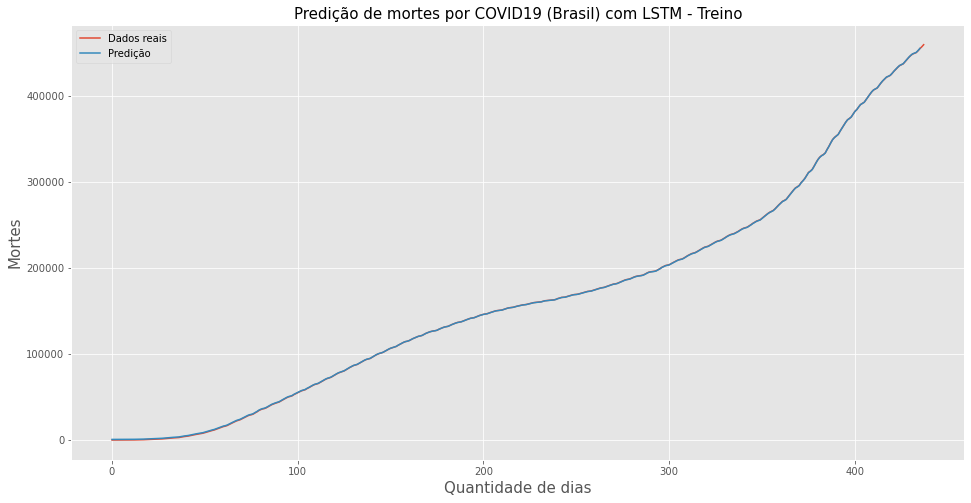

Train Score: 944.24 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.05
Número de células: 400

 LSTM - O segundo melhor - Brasil 



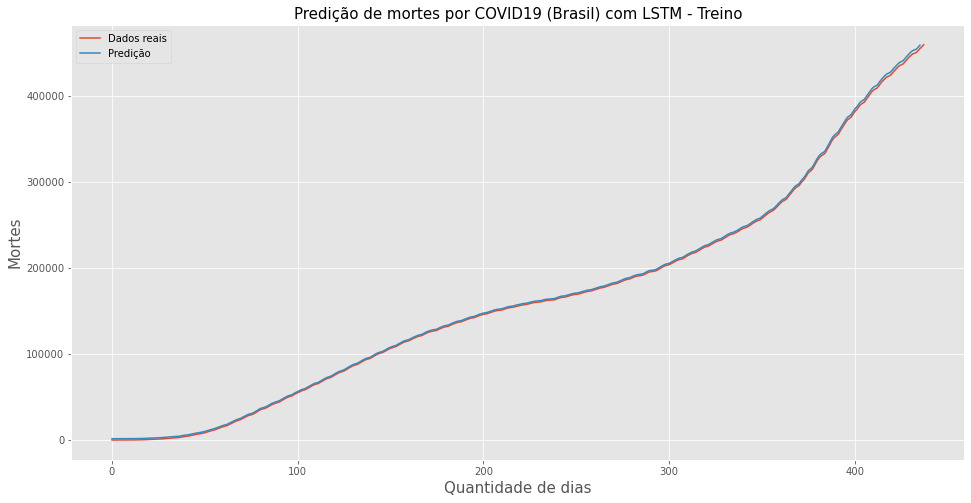

Train Score: 944.24 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - Índia 



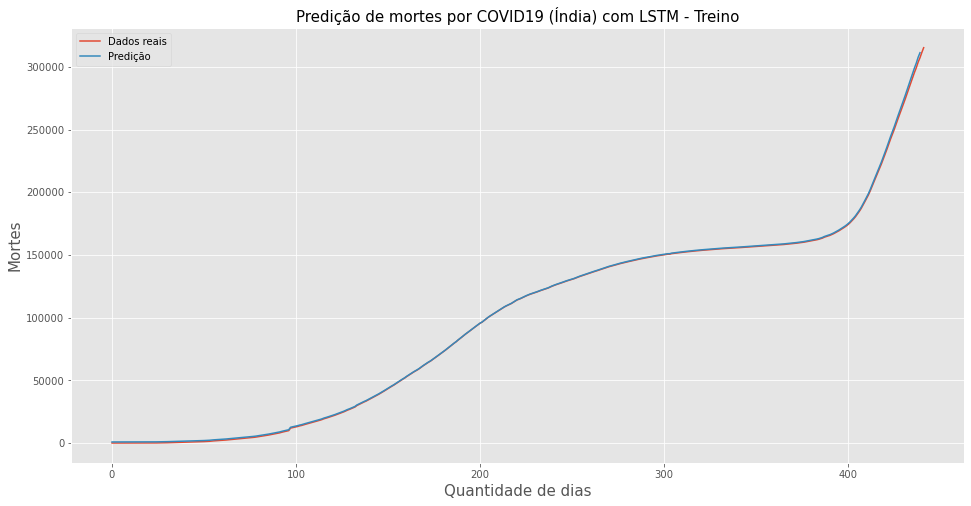

Train Score: 700.24 RMSE
Taxa de aprendizagem: 0.05
Dropout: 0.2
Número de células: 600

 LSTM - O segundo melhor - Índia 



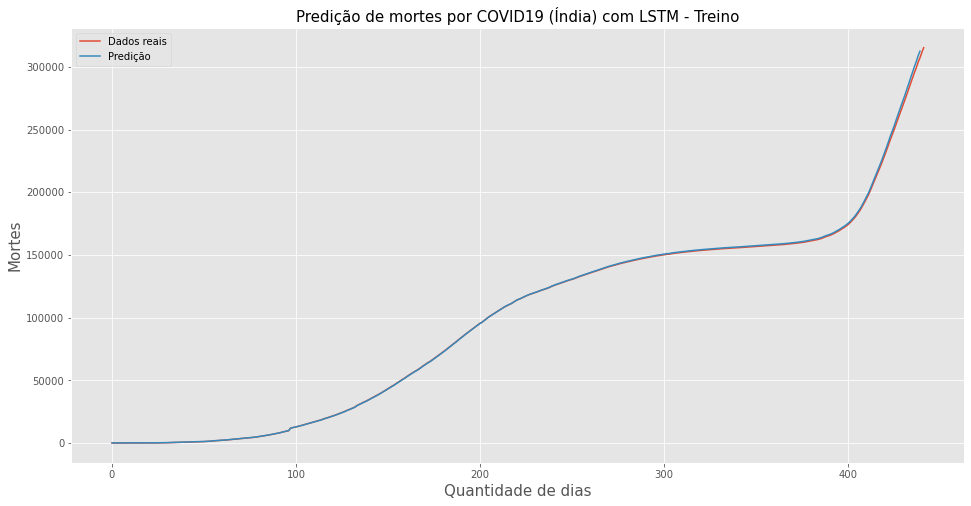

Train Score: 700.24 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - Itália 



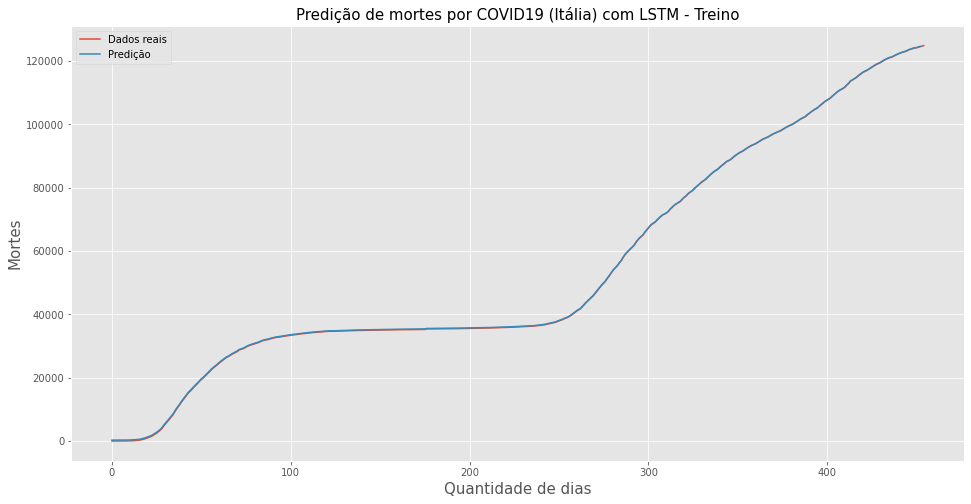

Train Score: 387.70 RMSE
Taxa de aprendizagem: 0.01
Dropout: 0.05
Número de células: 600

 LSTM - O segundo melhor - Itália 



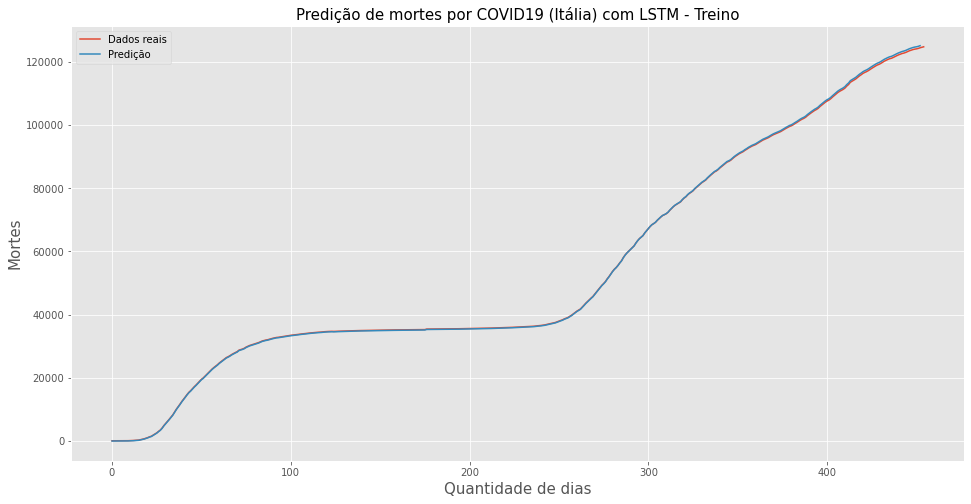

Train Score: 387.70 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - EUA 



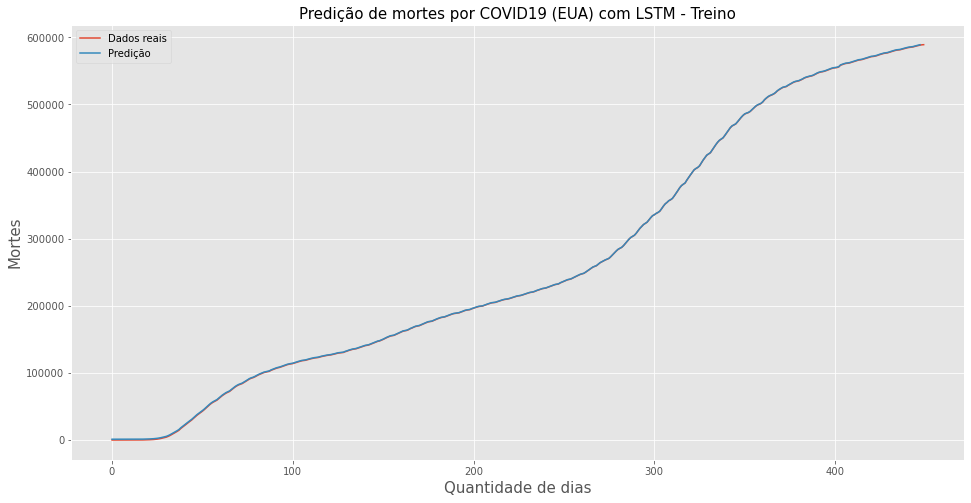

Train Score: 2079.94 RMSE
Taxa de aprendizagem: 0.05
Dropout: 0.1
Número de células: 400

 LSTM - O segundo melhor - EUA 



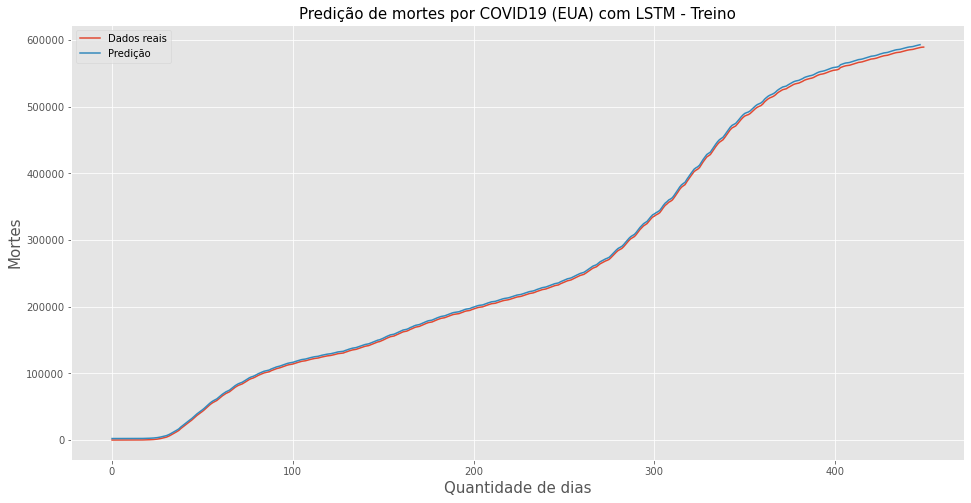

Train Score: 2079.94 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600





In [30]:
#Plotar gráficos com os treinos LSTM
for i in range(len(country)): #loop de repatição apra mostrar todos os países
    print('\n LSTM - O melhor caso - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de mortes por COVID19 (%s) com LSTM - Treino' %(country[i]), size = 15)
    plt.ylabel('Mortes', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(trainP[country[i]], label = 'Dados reais')
    plt.plot(strainPred[country[i]], label = 'Predição')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (trs[country[i]]))
    print('Taxa de aprendizagem:', st_a[country[i]])
    print('Dropout:', sdropout[country[i]])
    print('Número de células:', sn_cel[country[i]])

    print('\n LSTM - O segundo melhor - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de mortes por COVID19 (%s) com LSTM - Treino' %(country[i]), size = 15)
    plt.ylabel('Mortes', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(trainP[country[i]], label = 'Dados reais')
    plt.plot(trainPred[country[i]], label = 'Predição')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (trs[country[i]]))
    print('Taxa de aprendizagem:', t_a[country[i]])
    print('Dropout:', dropout[country[i]])
    print('Número de células:', n_cel[country[i]])
    print('\n\n')



 LSTM - O melhor caso - Brasil 



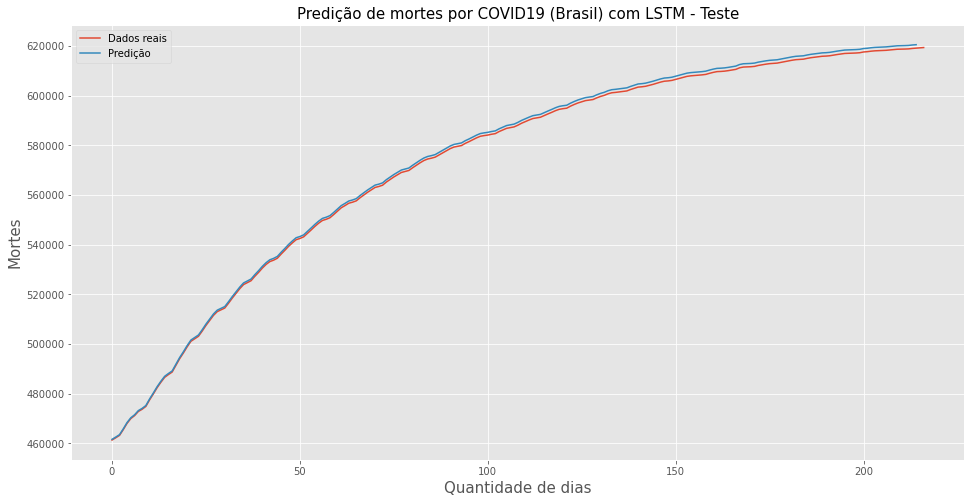

Test Score: 986.73 RMSE
MAE: 858.7709046128529
Taxa de aprendizagem: 0.2
Dropout: 0.05
Número de células: 400

 LSTM - O segundo melhor - Brasil 



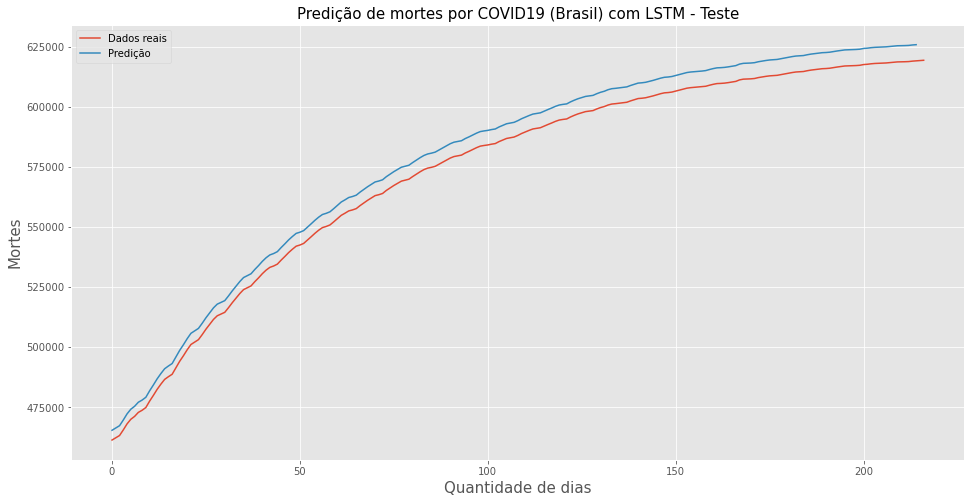

Test Score: 5335.38 RMSE
MAE: 5158.673803134993
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - Índia 



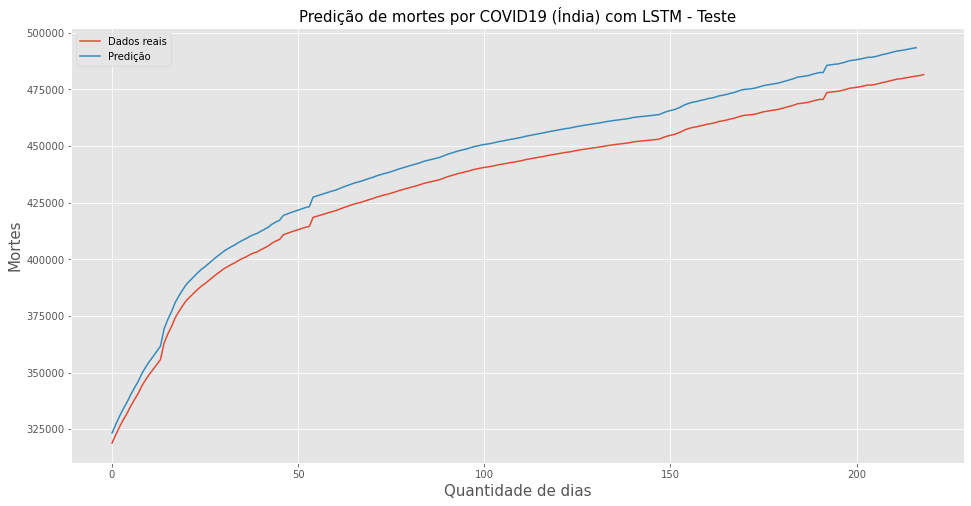

Test Score: 9482.46 RMSE
MAE: 9115.055310611042
Taxa de aprendizagem: 0.05
Dropout: 0.2
Número de células: 600

 LSTM - O segundo melhor - Índia 



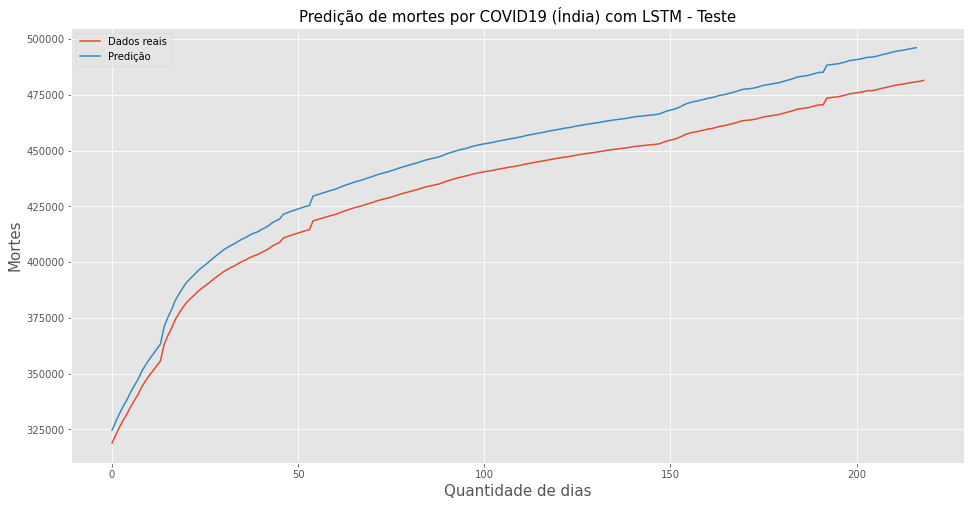

Test Score: 11827.10 RMSE
MAE: 11445.818521496145
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - Itália 



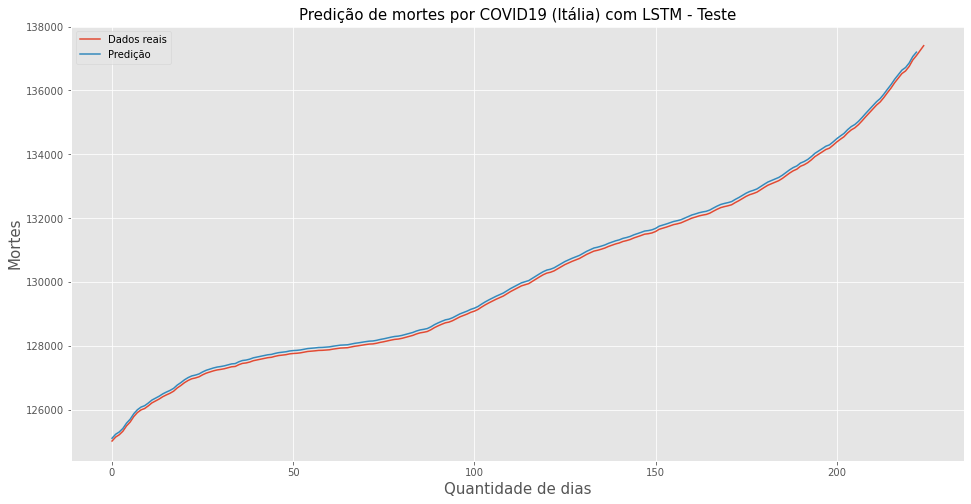

Test Score: 53.18 RMSE
MAE: 48.510606916925745
Taxa de aprendizagem: 0.01
Dropout: 0.05
Número de células: 600

 LSTM - O segundo melhor - Itália 



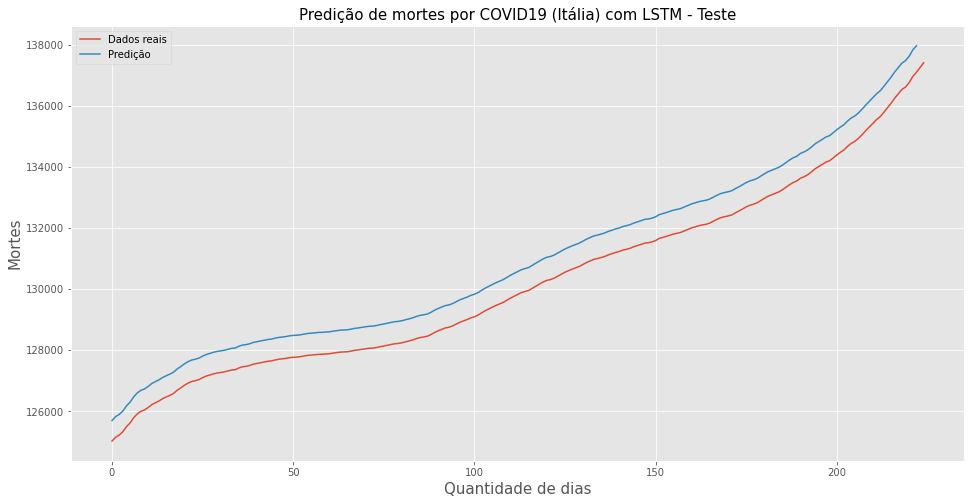

Test Score: 701.52 RMSE
MAE: 700.128655090696
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - EUA 



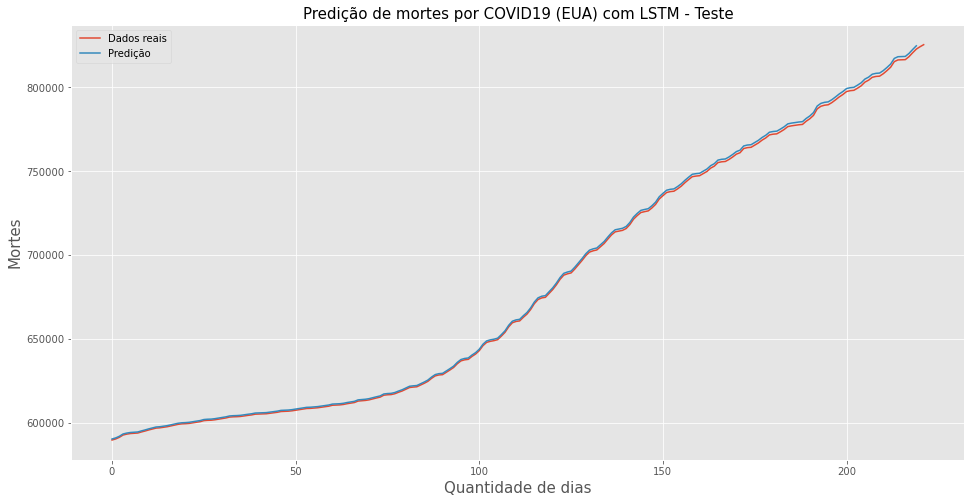

Test Score: 826.46 RMSE
MAE: 641.3991488669152
Taxa de aprendizagem: 0.05
Dropout: 0.1
Número de células: 400

 LSTM - O segundo melhor - EUA 



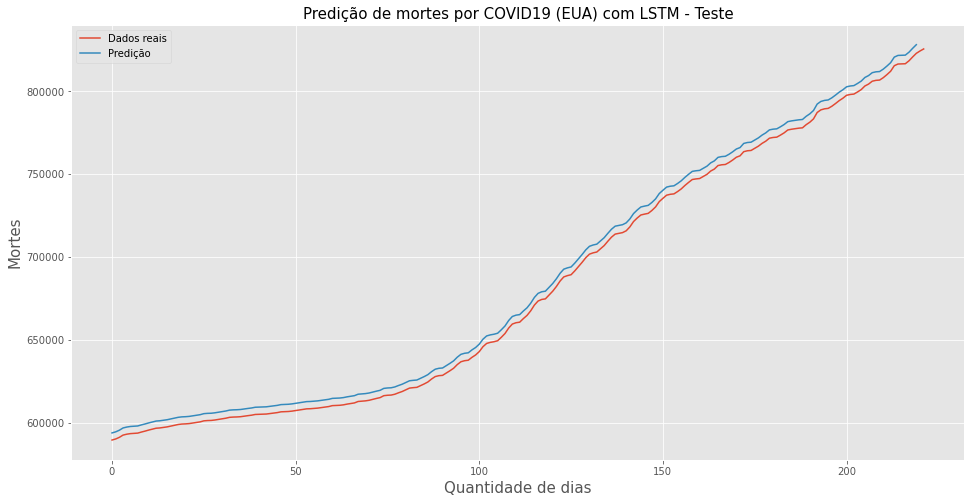

Test Score: 3677.51 RMSE
MAE: 3586.8847245378083
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600





In [31]:
#Plotar gráficos com os testes LSTM
for i in range(len(country)): #loop de repatição apra mostrar todos os países
    print('\n LSTM - O melhor caso - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de mortes por COVID19 (%s) com LSTM - Teste' %(country[i]), size = 15)
    plt.ylabel('Mortes', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(testP[country[i]], label = 'Dados reais')
    plt.plot(stestPred[country[i]], label = 'Predição')
    plt.legend()
    plt.show()
    print('Test Score: %.2f RMSE' % (stss[country[i]]))
    print('MAE:', stsm[country[i]])
    print('Taxa de aprendizagem:', st_a[country[i]])
    print('Dropout:', sdropout[country[i]])
    print('Número de células:', sn_cel[country[i]])

    print('\n LSTM - O segundo melhor - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de mortes por COVID19 (%s) com LSTM - Teste' %(country[i]), size = 15)
    plt.ylabel('Mortes', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(testP[country[i]], label = 'Dados reais')
    plt.plot(testPred[country[i]], label = 'Predição')
    plt.legend()
    plt.show()
    print('Test Score: %.2f RMSE' % (tss[country[i]]))
    print('MAE:', tsm[country[i]])
    print('Taxa de aprendizagem:', t_a[country[i]])
    print('Dropout:', dropout[country[i]])
    print('Número de células:', n_cel[country[i]])
    print('\n\n')



 LSTM - O melhor caso - Brasil 



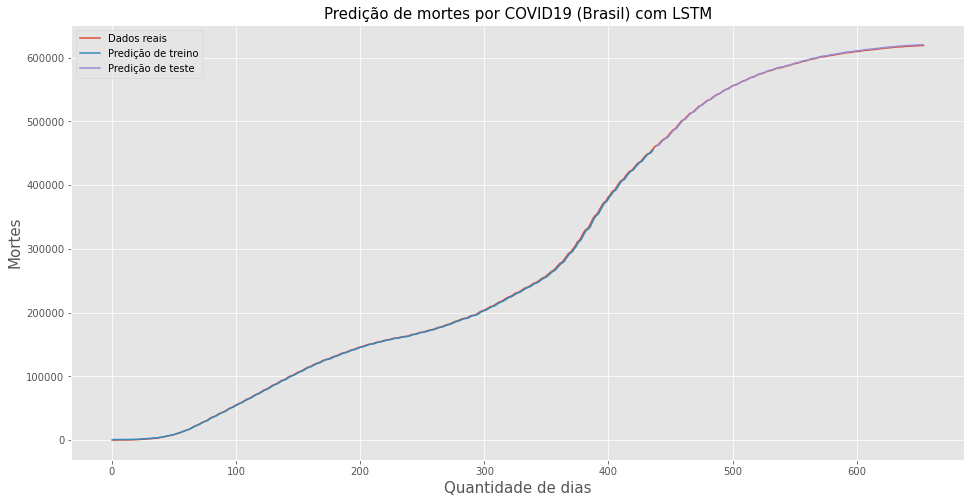

Train Score: 1375.77 RMSE
Test Score: 986.73 RMSE
MAE: 858.7709046128529
Taxa de aprendizagem: 0.2
Dropout: 0.05
Número de células: 400

 LSTM - O segundo melhor - Brasil 



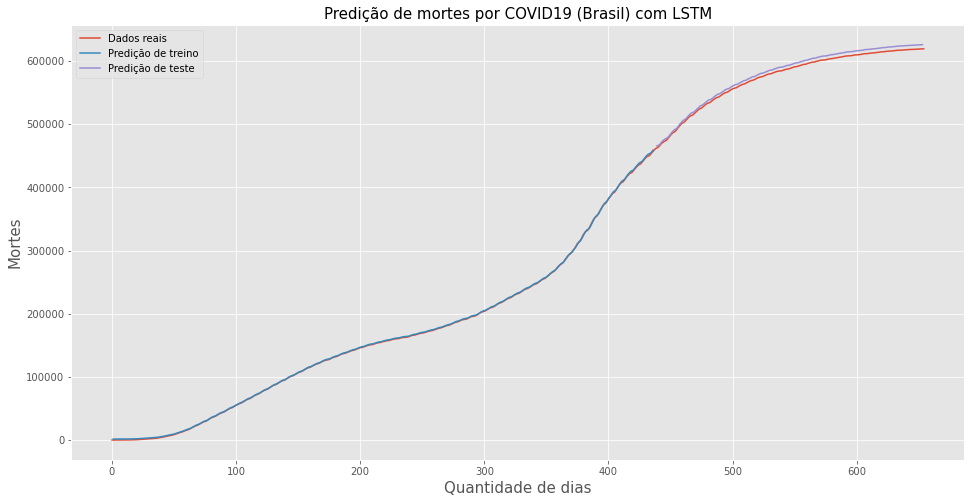

Train Score: 944.24 RMSE
Test Score: 5335.38 RMSE
MAE: 5158.673803134993
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - Índia 



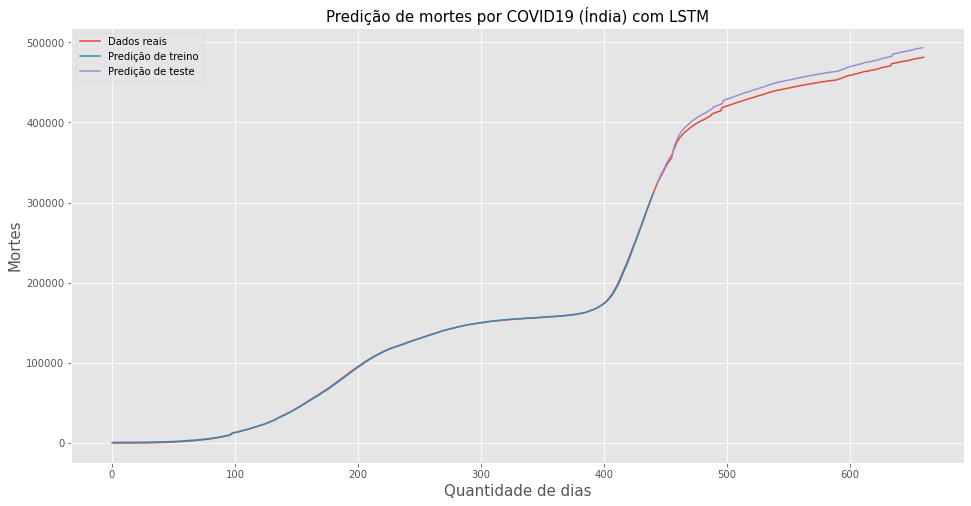

Train Score: 729.78 RMSE
Test Score: 9482.46 RMSE
MAE: 9115.055310611042
Taxa de aprendizagem: 0.05
Dropout: 0.2
Número de células: 600

 LSTM - O segundo melhor - Índia 



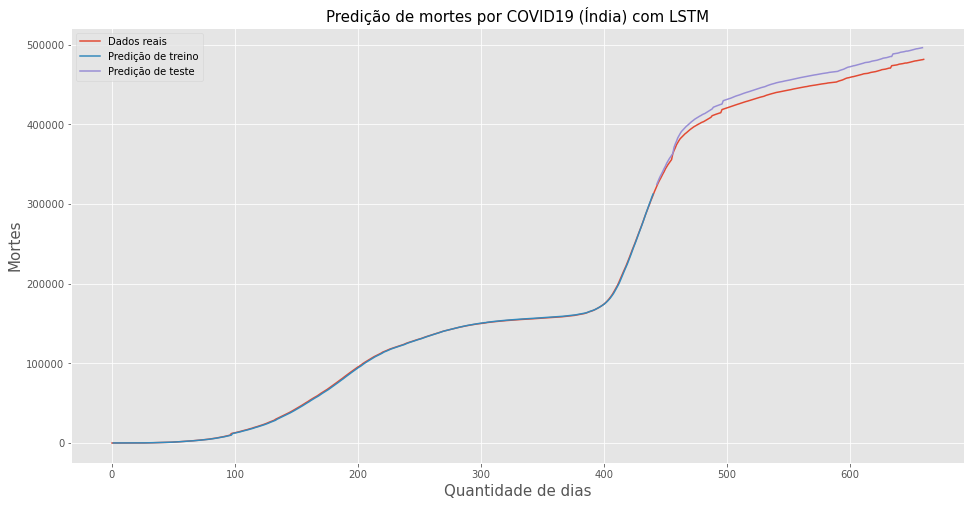

Train Score: 700.24 RMSE
Test Score: 11827.10 RMSE
MAE: 11445.818521496145
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - Itália 



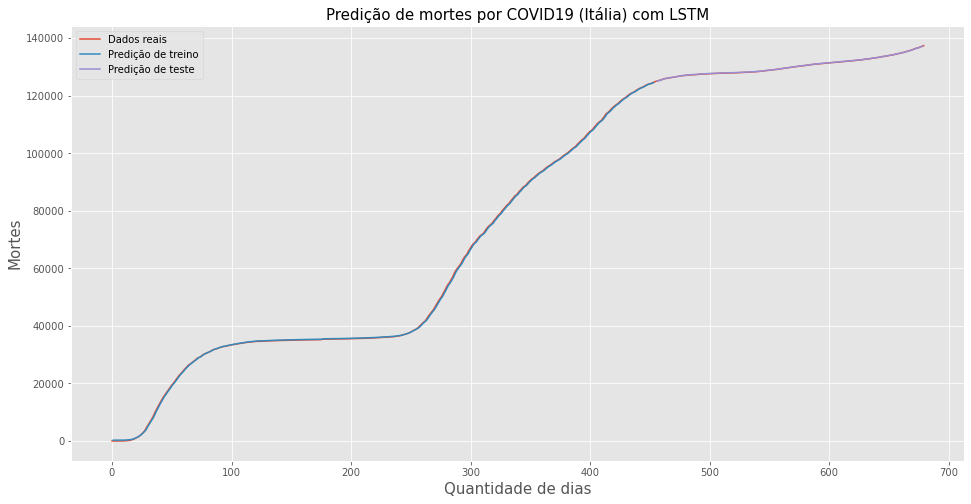

Train Score: 297.45 RMSE
Test Score: 53.18 RMSE
MAE: 48.510606916925745
Taxa de aprendizagem: 0.01
Dropout: 0.05
Número de células: 600

 LSTM - O segundo melhor - Itália 



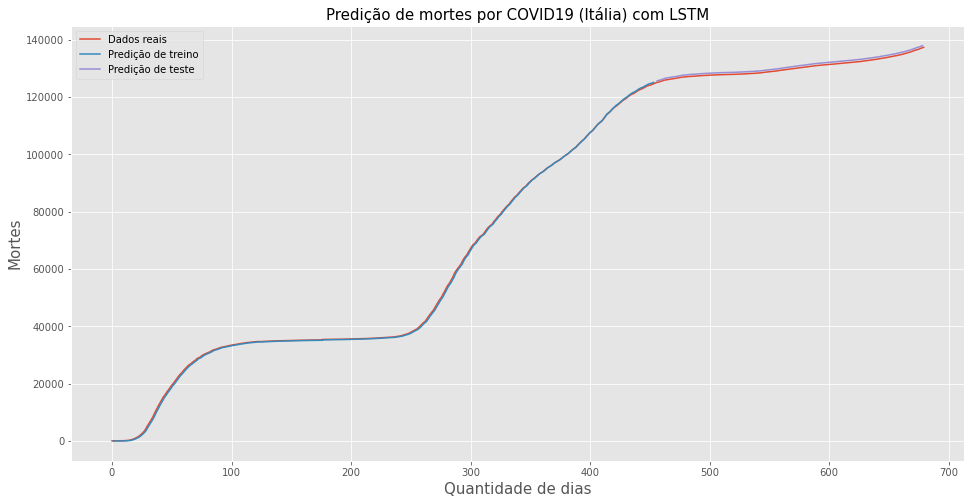

Train Score: 387.70 RMSE
Test Score: 701.52 RMSE
MAE: 700.128655090696
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - EUA 



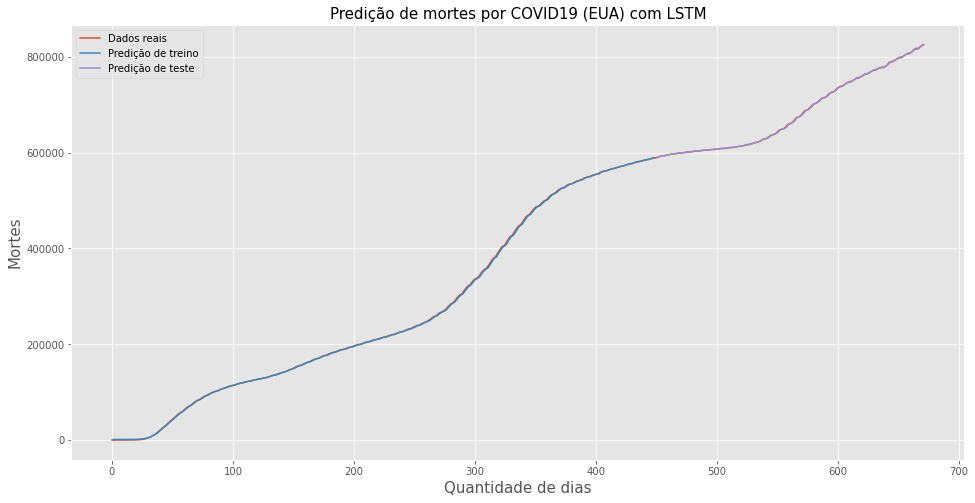

Train Score: 1383.28 RMSE
Test Score: 826.46 RMSE
MAE: 641.3991488669152
Taxa de aprendizagem: 0.05
Dropout: 0.1
Número de células: 400

 LSTM - O segundo melhor - EUA 



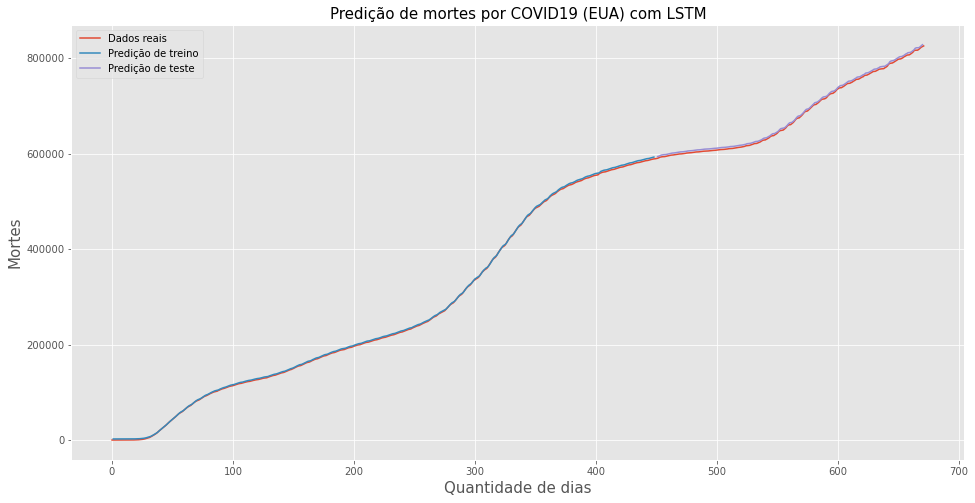

Train Score: 2079.94 RMSE
Test Score: 3677.51 RMSE
MAE: 3586.8847245378083
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600





In [32]:
#Plotar gráficos com base nas previsões do modelo LSTM
for i in range(len(country)): #loop de repatição apra mostrar todos os países
    
    print('\n LSTM - O melhor caso - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de mortes por COVID19 (%s) com LSTM' %(country[i]), size = 15)
    plt.ylabel('Mortes', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(dts[country[i]], label = 'Dados reais')
    plt.plot(strpp[country[i]], label = 'Predição de treino')
    plt.plot(stspp[country[i]], label = 'Predição de teste')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (strs[country[i]]))
    print('Test Score: %.2f RMSE' % (stss[country[i]]))
    print('MAE:', stsm[country[i]])
    print('Taxa de aprendizagem:', st_a[country[i]])
    print('Dropout:', sdropout[country[i]])
    print('Número de células:', sn_cel[country[i]])

    print('\n LSTM - O segundo melhor - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de mortes por COVID19 (%s) com LSTM' %(country[i]), size = 15)
    plt.ylabel('Mortes', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(dts[country[i]], label = 'Dados reais')
    plt.plot(trpp[country[i]], label = 'Predição de treino')
    plt.plot(tspp[country[i]], label = 'Predição de teste')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (trs[country[i]]))
    print('Test Score: %.2f RMSE' % (tss[country[i]]))
    print('MAE:', tsm[country[i]])
    print('Taxa de aprendizagem:', t_a[country[i]])
    print('Dropout:', dropout[country[i]])
    print('Número de células:', n_cel[country[i]])
    print('\n\n')
    
    #Armazenando dados de treino e teste da predição
    if country[i] == 'Brasil':
        st = strpp[country[i]]
        ts = stspp[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_lstm_mortes_test_brazil.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_lstm_mortes_train_brazil.csv',ts,delimiter=',')
    if country[i] == 'Índia':
        st = strpp[country[i]]
        ts = stspp[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_lstm_mortes_test_india.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_lstm_mortes_train_india.csv',ts,delimiter=',')
    if country[i] == 'Itália':
        st = strpp[country[i]]
        ts = stspp[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_lstm_mortes_test_italia.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_lstm_mortes_train_italia.csv',ts,delimiter=',')
    if country[i] == 'EUA':
        st = strpp[country[i]]
        ts = stspp[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_lstm_mortes_test_eua.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_lstm_mortes_train_eua.csv',ts,delimiter=',')


 MLP - O melhor caso - Brasil 



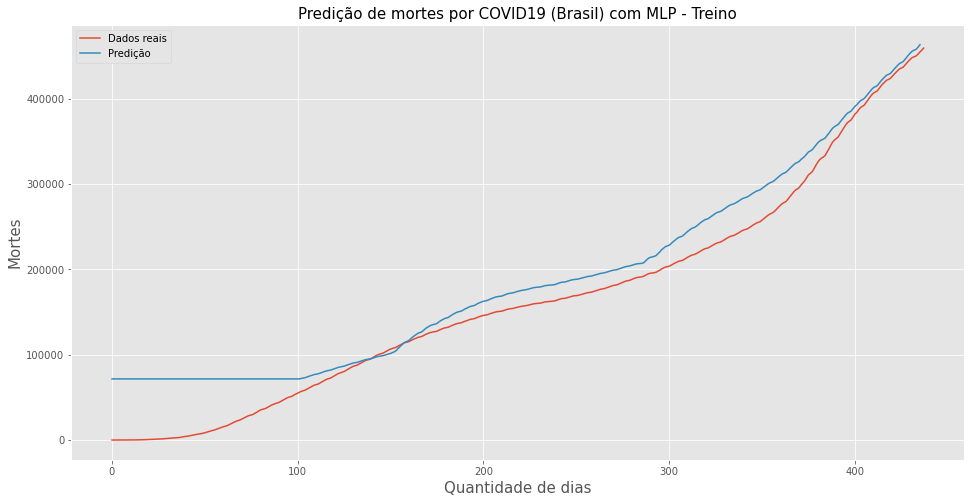

Train Score: 32532.87 RMSE
Taxa de aprendizagem: 0.05
Dropout: 0.2
Número de células por camada: 8

 MLP - O segundo melhor - Brasil 



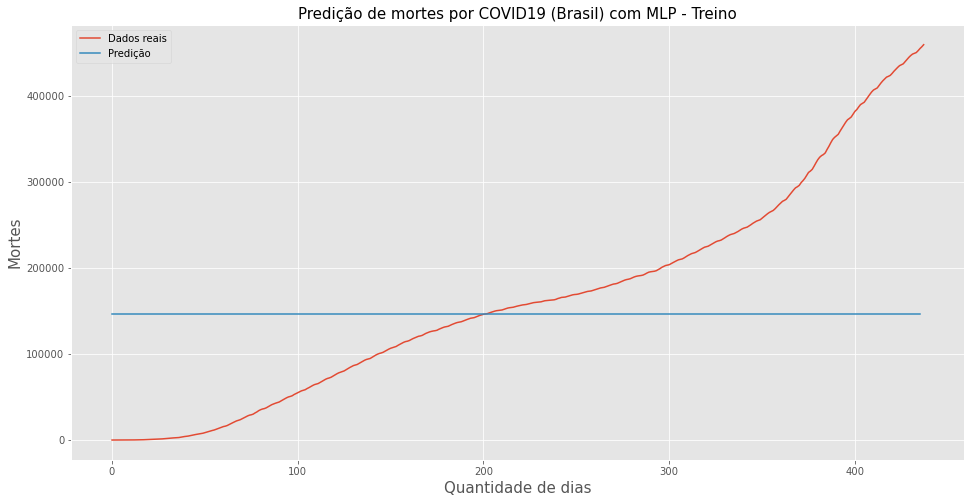

Train Score: 123744.27 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células por camada: 8




 MLP - O melhor caso - Índia 



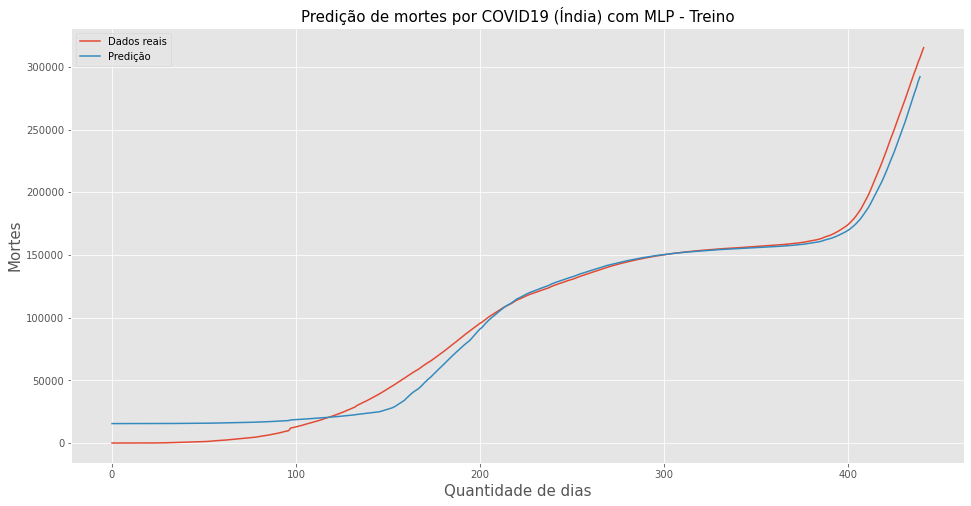

Train Score: 10056.46 RMSE
Taxa de aprendizagem: 0.05
Dropout: 0.2
Número de células por camada: 16

 MLP - O segundo melhor - Índia 



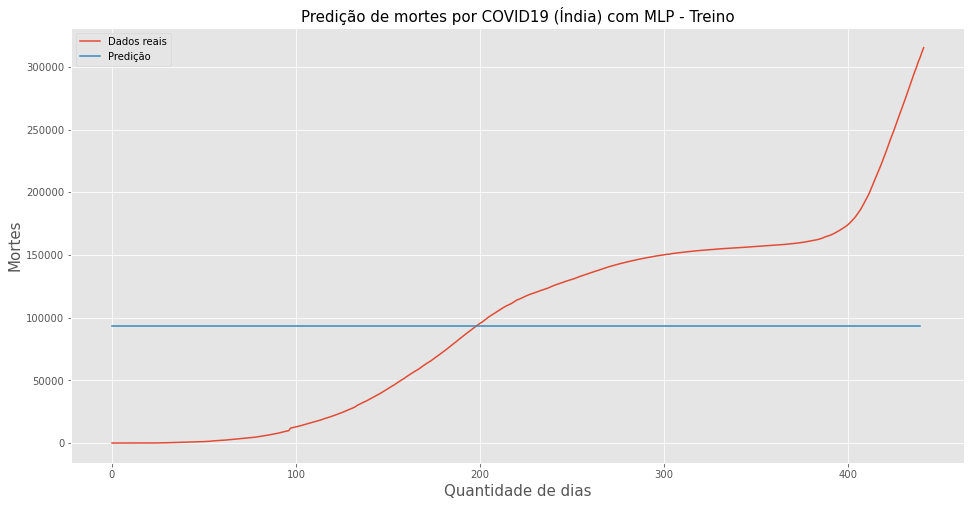

Train Score: 76100.00 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células por camada: 16




 MLP - O melhor caso - Itália 



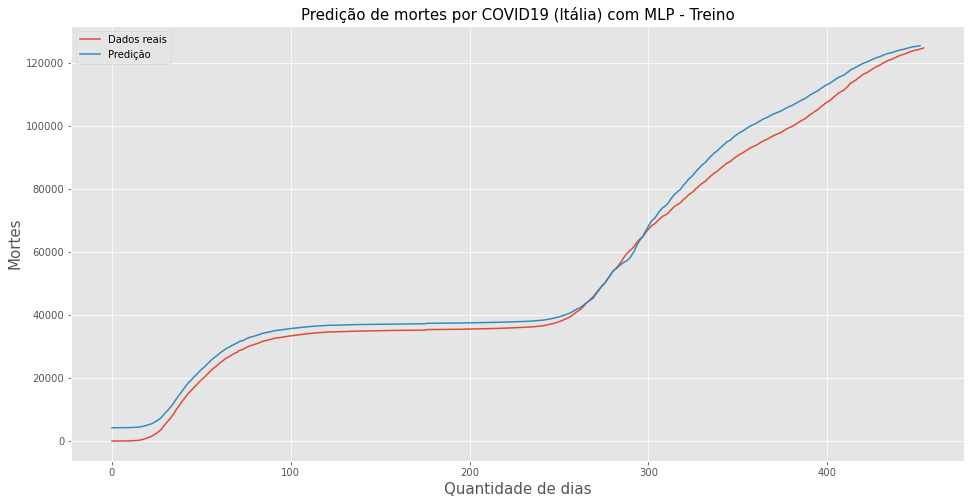

Train Score: 3381.02 RMSE
Taxa de aprendizagem: 0.05
Dropout: 0.1
Número de células por camada: 32

 MLP - O segundo melhor - Itália 



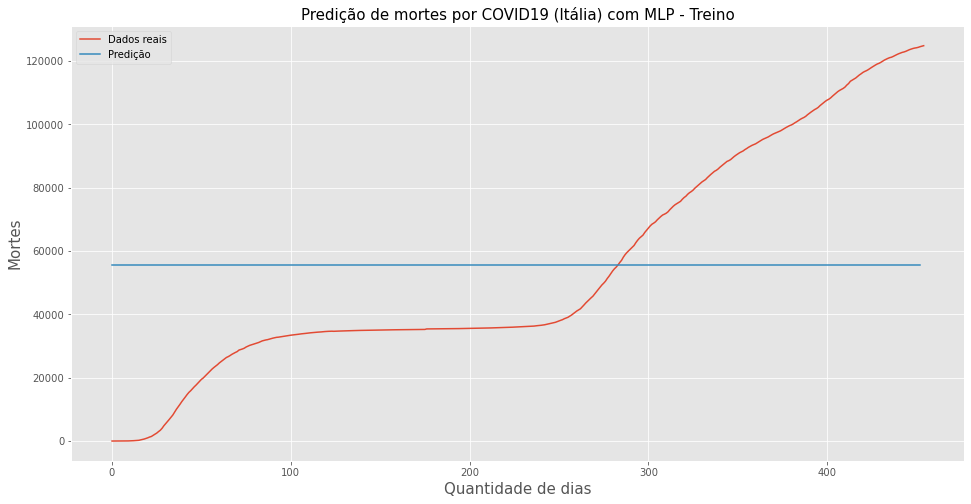

Train Score: 35184.15 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células por camada: 32




 MLP - O melhor caso - EUA 



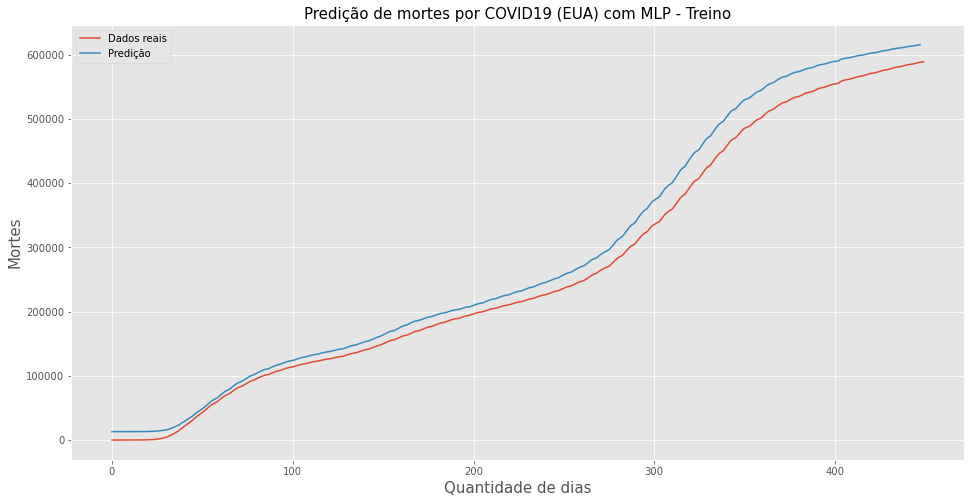

Train Score: 24599.44 RMSE
Taxa de aprendizagem: 0.01
Dropout: 0.01
Número de células por camada: 64

 MLP - O segundo melhor - EUA 



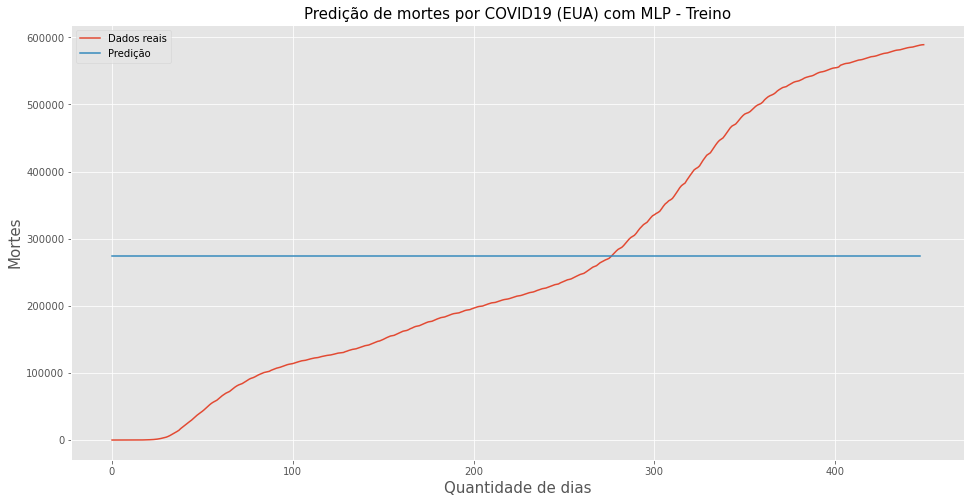

Train Score: 186711.08 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células por camada: 64





In [33]:
#Plotar gráficos com treinos do modelo MLP
for i in range(len(country)):
    print('\n MLP - O melhor caso - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de mortes por COVID19 (%s) com MLP - Treino' %(country[i]), size = 15)
    plt.ylabel('Mortes', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(trainP[country[i]], label = 'Dados reais')
    plt.plot(strainPredMLP[country[i]], label = 'Predição')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (strsMLP[country[i]]))
    print('Taxa de aprendizagem:', st_aMLP[country[i]])
    print('Dropout:', sdropoutMLP[country[i]])
    print('Número de células por camada:',sn_neu[country[i]])


    print('\n MLP - O segundo melhor - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de mortes por COVID19 (%s) com MLP - Treino' %(country[i]), size = 15)
    plt.ylabel('Mortes', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(trainP[country[i]], label = 'Dados reais')
    plt.plot(trainPredMLP[country[i]], label = 'Predição')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (trsMLP[country[i]]))
    print('Taxa de aprendizagem:', t_aMLP[country[i]])
    print('Dropout:', dropoutMLP[country[i]])

    print('Número de células por camada:',n_neu[country[i]])
 
    print('\n\n')


 MLP - O melhor caso - Brasil 



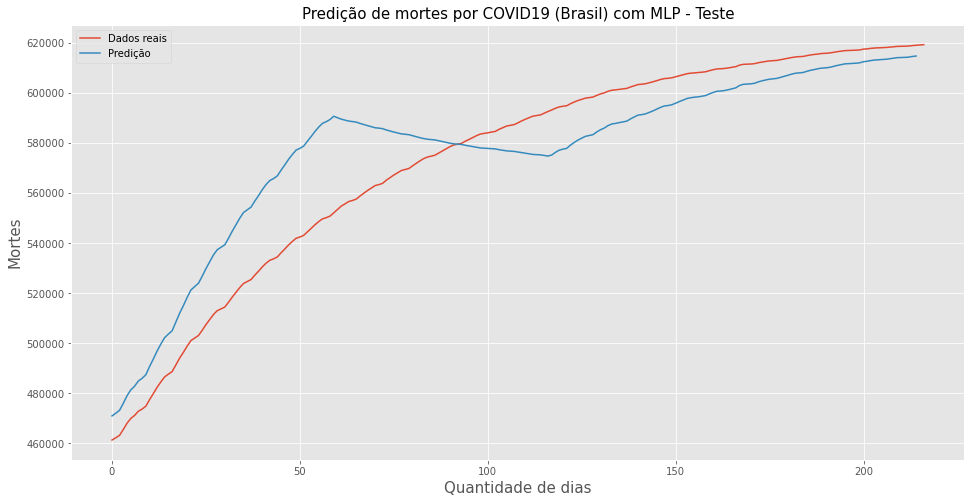

Test Score: 17129.83 RMSE
MAE: 14334.901078264787
Taxa de aprendizagem: 0.05
Dropout: 0.2
Número de células por camada: 8

 MLP - O segundo melhor - Brasil 



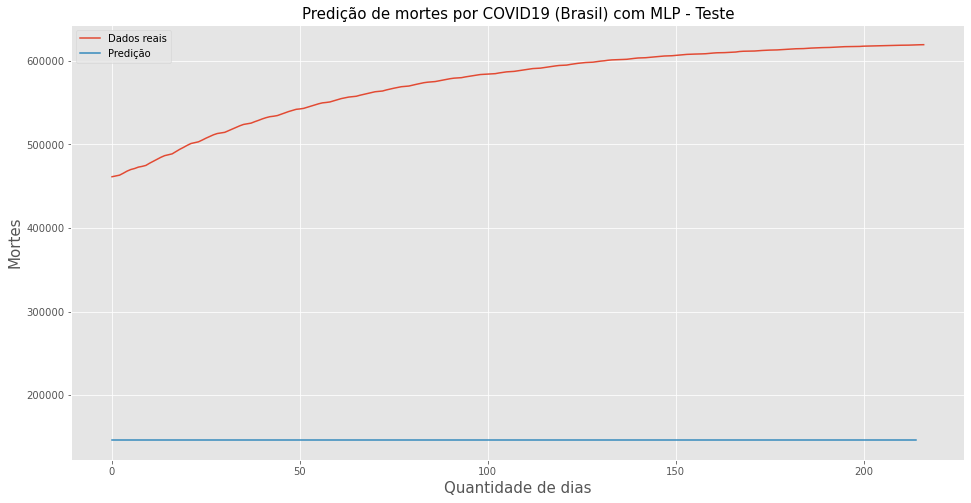

Test Score: 429545.67 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 427337.5349177952
Número de células por camada: 8




 MLP - O melhor caso - Índia 



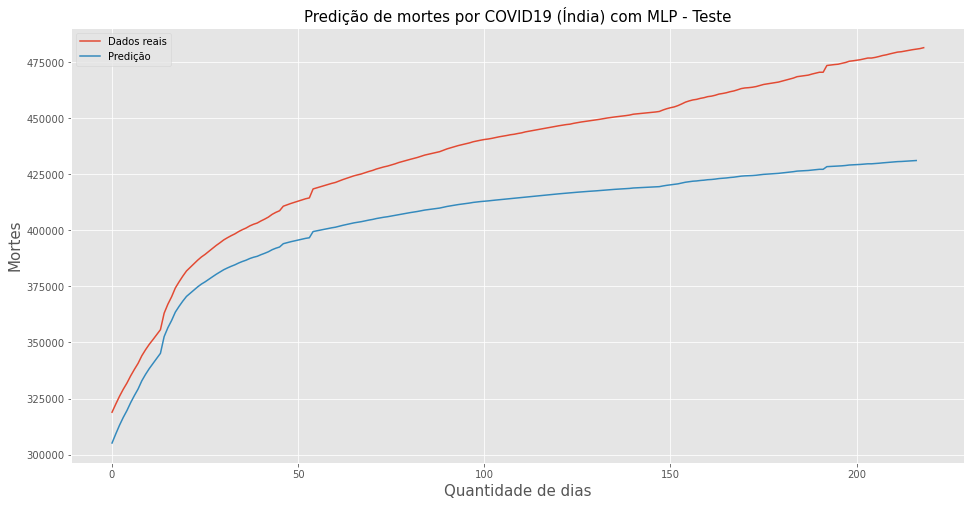

Test Score: 31112.28 RMSE
MAE: 29111.827647858696
Taxa de aprendizagem: 0.05
Dropout: 0.2
Número de células por camada: 16

 MLP - O segundo melhor - Índia 



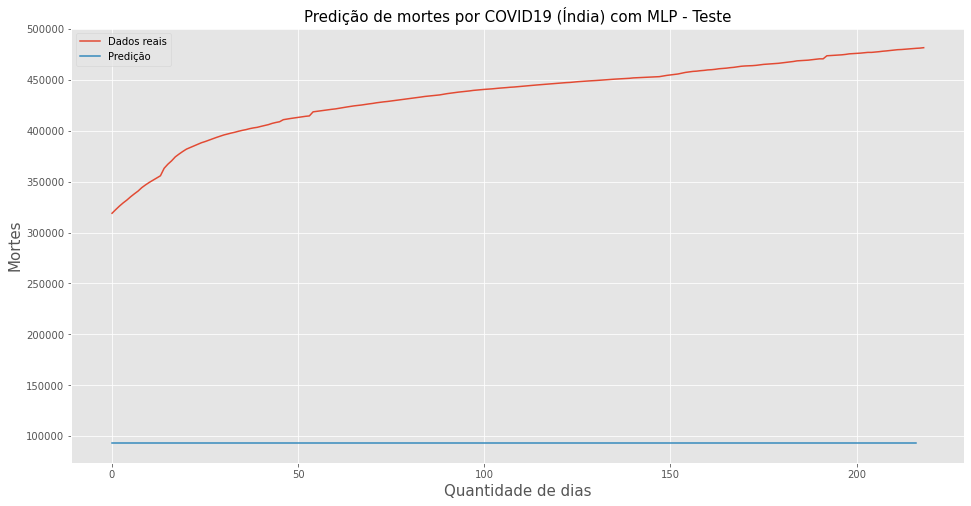

Test Score: 343131.29 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 341258.89929244394
Número de células por camada: 16




 MLP - O melhor caso - Itália 



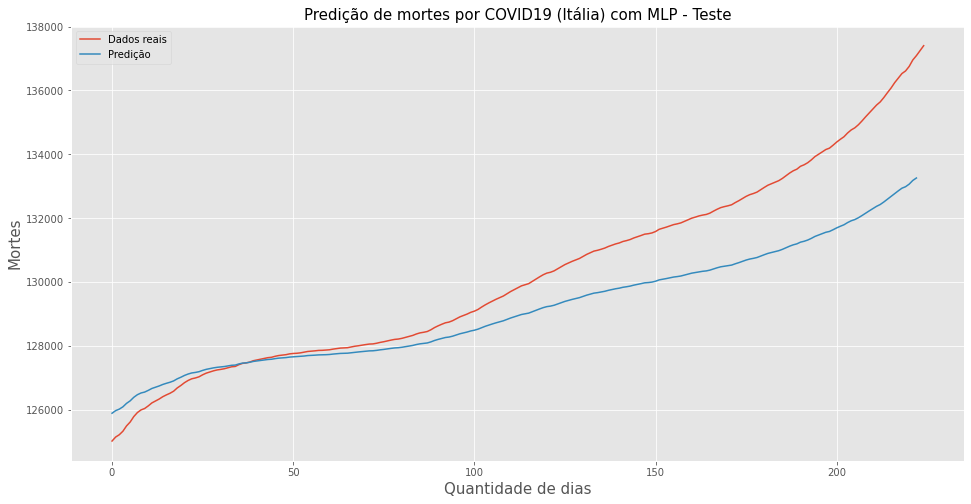

Test Score: 1586.34 RMSE
MAE: 1187.2905657653823
Taxa de aprendizagem: 0.05
Dropout: 0.1
Número de células por camada: 32

 MLP - O segundo melhor - Itália 



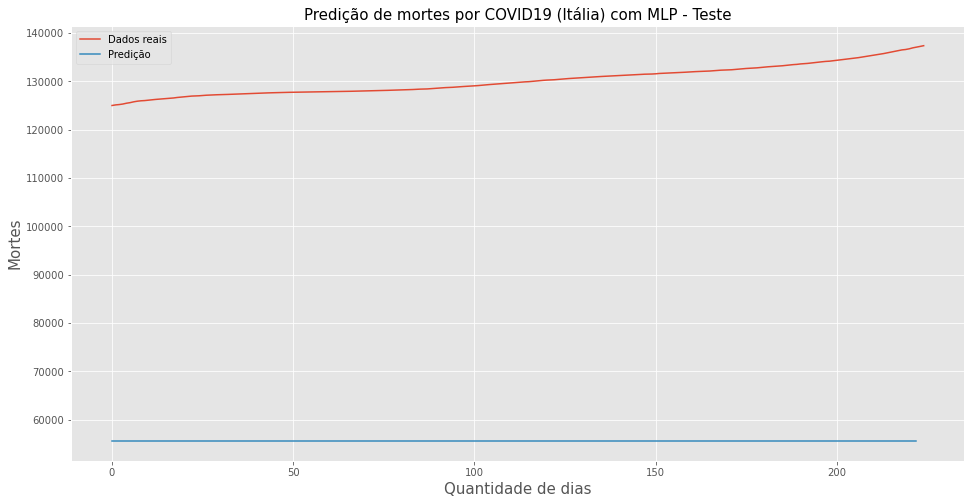

Test Score: 74686.10 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 74629.03099317163
Número de células por camada: 32




 MLP - O melhor caso - EUA 



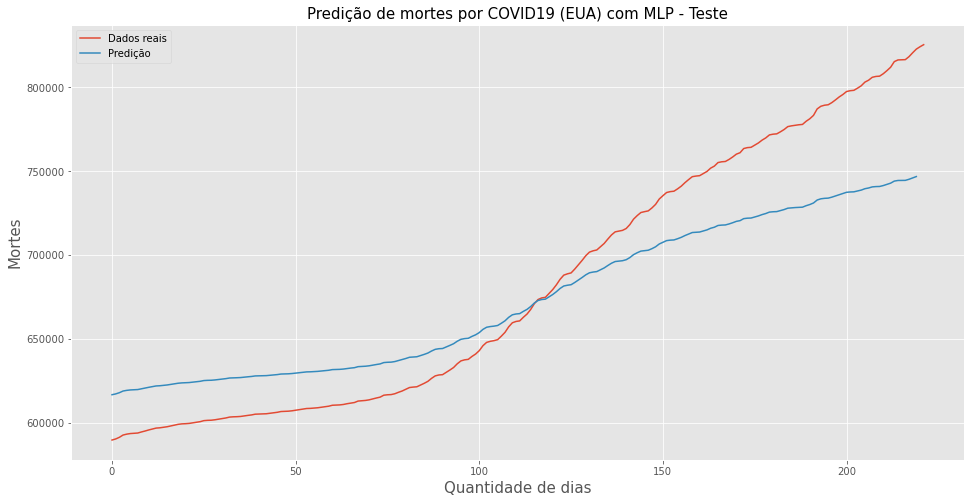

Test Score: 33791.59 RMSE
MAE: 28423.294951931875
Taxa de aprendizagem: 0.01
Dropout: 0.01
Número de células por camada: 64

 MLP - O segundo melhor - EUA 



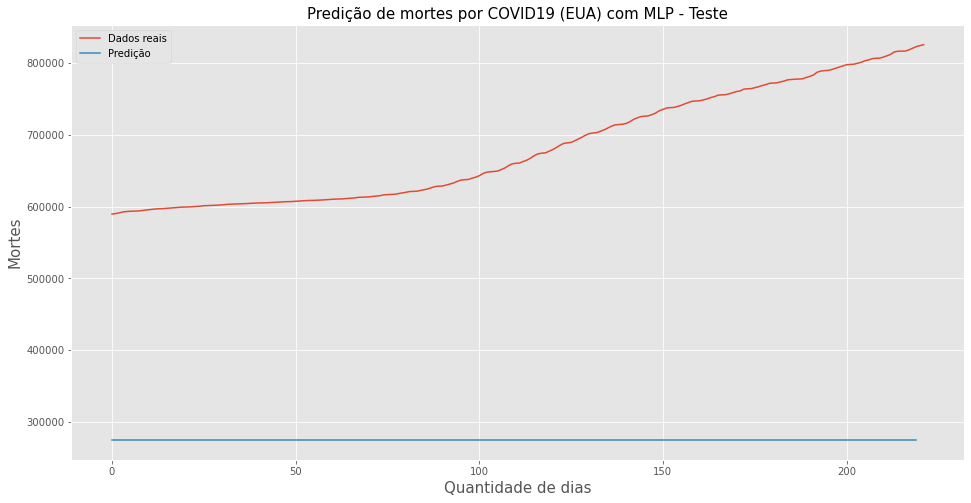

Test Score: 414408.53 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 407360.8232300077
Número de células por camada: 64





In [34]:
#Plotar gráficos com testes do modelo MLP
for i in range(len(country)):
    print('\n MLP - O melhor caso - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de mortes por COVID19 (%s) com MLP - Teste' %(country[i]), size = 15)
    plt.ylabel('Mortes', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(testP[country[i]], label = 'Dados reais')
    plt.plot(stestPredMLP[country[i]], label = 'Predição')
    plt.legend()
    plt.show()

    print('Test Score: %.2f RMSE' % (stssMLP[country[i]]))
    print('MAE:', stsmMLP[country[i]])
    print('Taxa de aprendizagem:', st_aMLP[country[i]])
    print('Dropout:', sdropoutMLP[country[i]])
    print('Número de células por camada:',sn_neu[country[i]])


    print('\n MLP - O segundo melhor - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de mortes por COVID19 (%s) com MLP - Teste' %(country[i]), size = 15)
    plt.ylabel('Mortes', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(testP[country[i]], label = 'Dados reais')
    plt.plot(testPredMLP[country[i]], label = 'Predição')
    plt.legend()
    plt.show()

    print('Test Score: %.2f RMSE' % (tssMLP[country[i]]))
    print('Taxa de aprendizagem:', t_aMLP[country[i]])
    print('Dropout:', dropoutMLP[country[i]])
    print('MAE:', tsmMLP[country[i]])
    print('Número de células por camada:',n_neu[country[i]])
 
    print('\n\n')


 MLP - O melhor caso - Brasil 



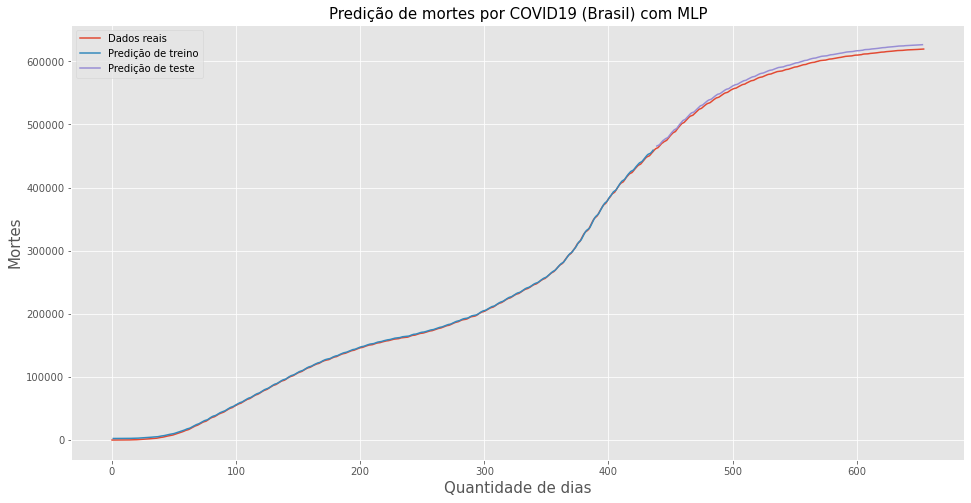

Train Score: 32532.87 RMSE
Test Score: 17129.83 RMSE
MAE: 14334.901078264787
Taxa de aprendizagem: 0.05
Dropout: 0.2
Número de células por camada: 8

 MLP - O segundo melhor - Brasil 



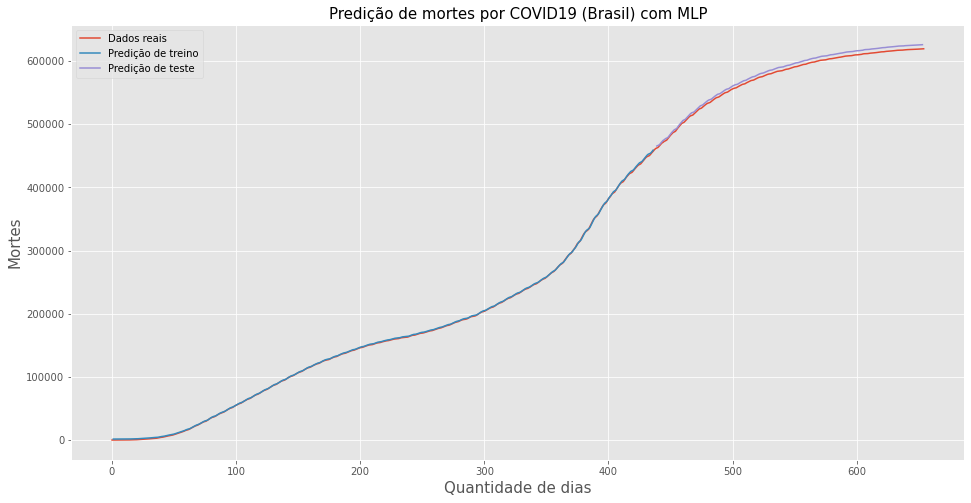

Train Score: 123744.27 RMSE
Test Score: 429545.67 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 427337.5349177952
Número de células por camada: 8




 MLP - O melhor caso - Índia 



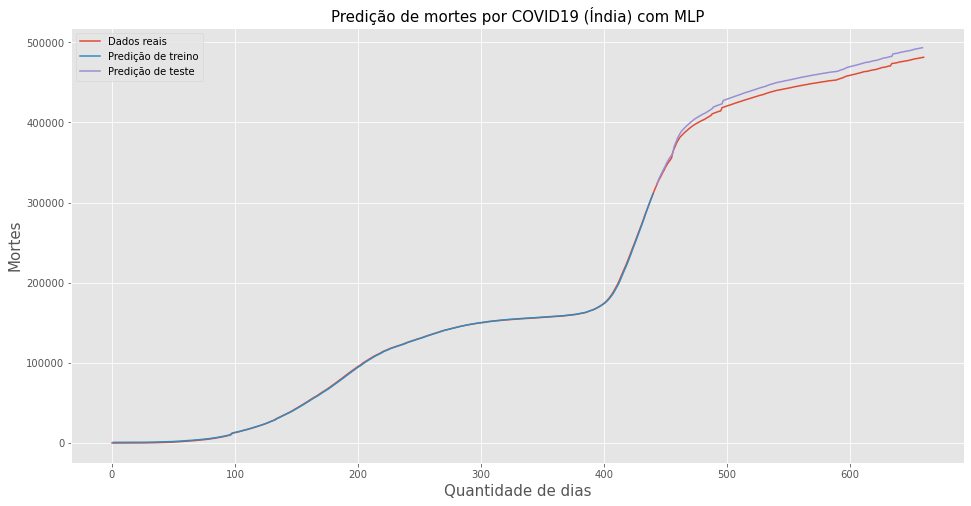

Train Score: 10056.46 RMSE
Test Score: 31112.28 RMSE
MAE: 29111.827647858696
Taxa de aprendizagem: 0.05
Dropout: 0.2
Número de células por camada: 16

 MLP - O segundo melhor - Índia 



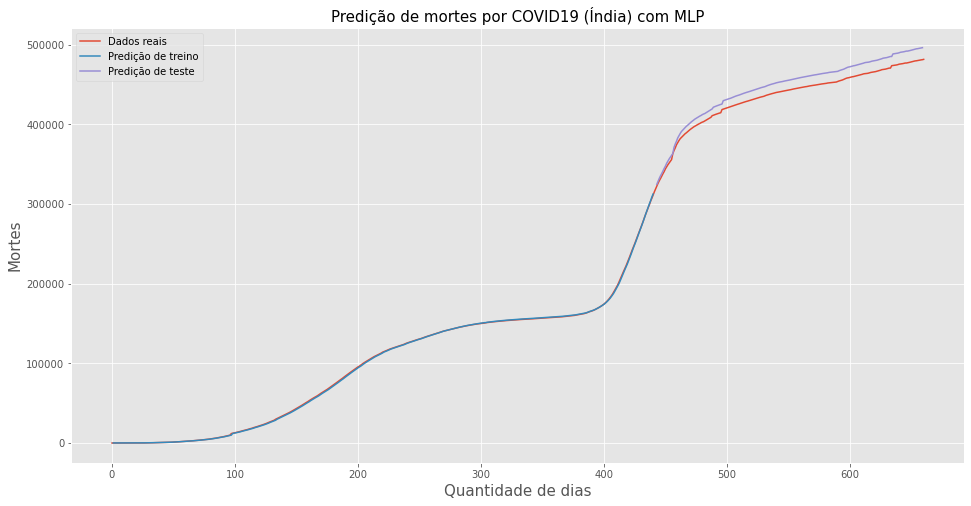

Train Score: 76100.00 RMSE
Test Score: 343131.29 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 341258.89929244394
Número de células por camada: 16




 MLP - O melhor caso - Itália 



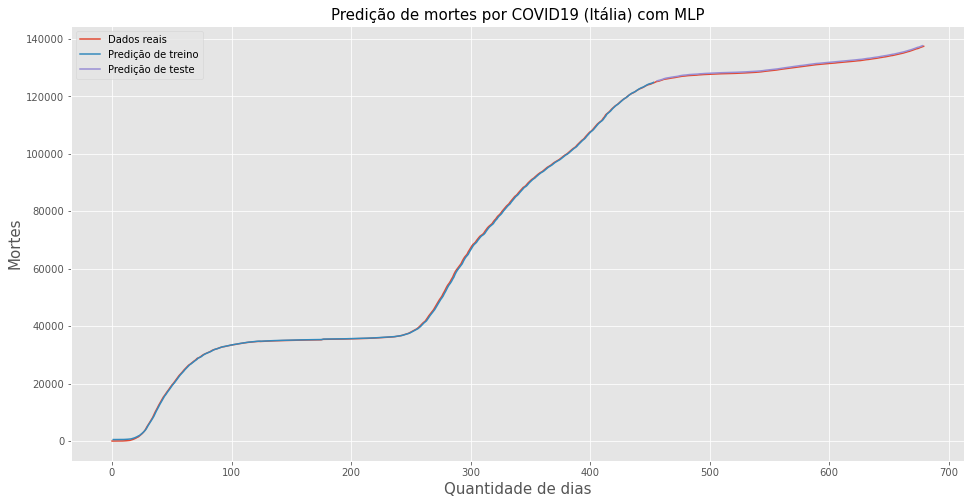

Train Score: 3381.02 RMSE
Test Score: 1586.34 RMSE
MAE: 1187.2905657653823
Taxa de aprendizagem: 0.05
Dropout: 0.1
Número de células por camada: 32

 MLP - O segundo melhor - Itália 



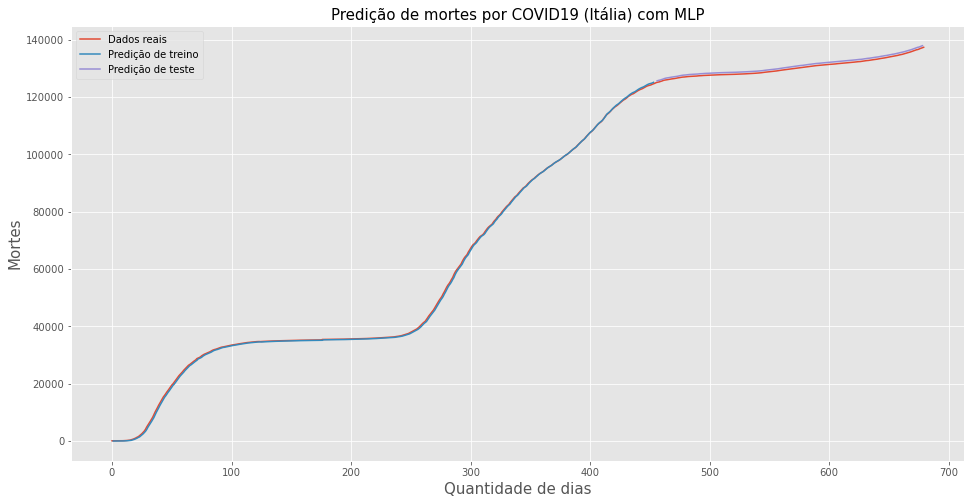

Train Score: 35184.15 RMSE
Test Score: 74686.10 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 74629.03099317163
Número de células por camada: 32




 MLP - O melhor caso - EUA 



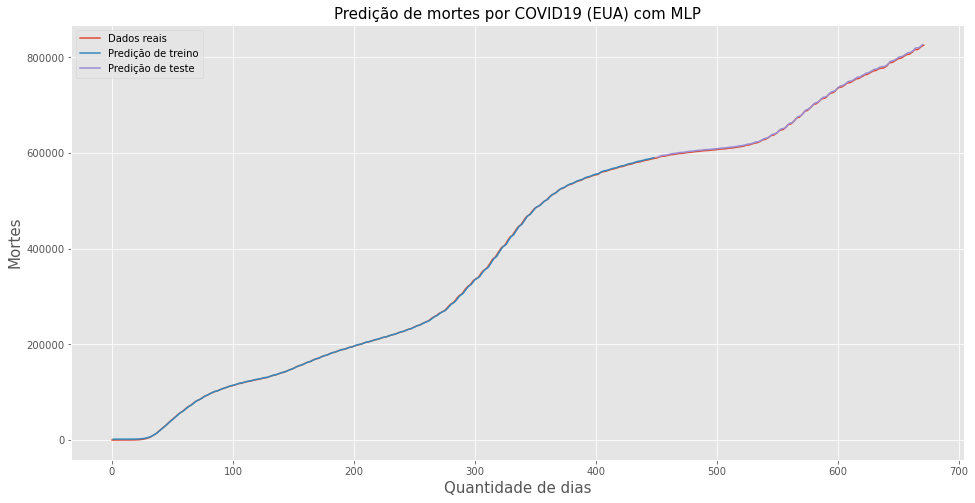

Train Score: 24599.44 RMSE
Test Score: 33791.59 RMSE
MAE: 28423.294951931875
Taxa de aprendizagem: 0.01
Dropout: 0.01
Número de células por camada: 64

 MLP - O segundo melhor - EUA 



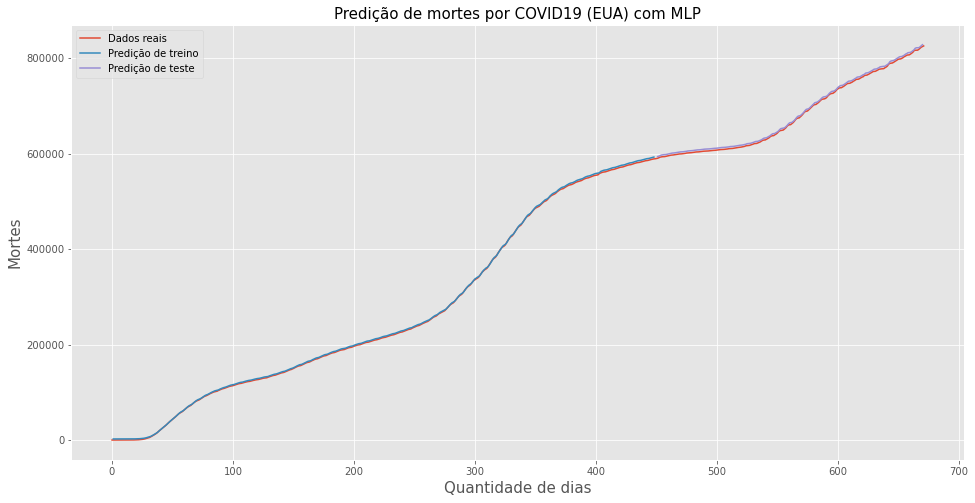

Train Score: 186711.08 RMSE
Test Score: 414408.53 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 407360.8232300077
Número de células por camada: 64





In [35]:
#Plotar gráficos com base nas previsões do modelo MLP
for i in range(len(country)):
    print('\n MLP - O melhor caso - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de mortes por COVID19 (%s) com MLP' %(country[i]), size = 15)
    plt.ylabel('Mortes', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(dts[country[i]], label = 'Dados reais')
    plt.plot(strppMLP[country[i]], label = 'Predição de treino')
    plt.plot(stsppMLP[country[i]], label = 'Predição de teste')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (strsMLP[country[i]]))
    print('Test Score: %.2f RMSE' % (stssMLP[country[i]]))
    print('MAE:', stsmMLP[country[i]])
    print('Taxa de aprendizagem:', st_aMLP[country[i]])
    print('Dropout:', sdropoutMLP[country[i]])
    print('Número de células por camada:',sn_neu[country[i]])


    print('\n MLP - O segundo melhor - %s \n' %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de mortes por COVID19 (%s) com MLP' %(country[i]), size = 15)
    plt.ylabel('Mortes', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(dts[country[i]], label = 'Dados reais')
    plt.plot(trppMLP[country[i]], label = 'Predição de treino')
    plt.plot(tsppMLP[country[i]], label = 'Predição de teste')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (trsMLP[country[i]]))
    print('Test Score: %.2f RMSE' % (tssMLP[country[i]]))
    print('Taxa de aprendizagem:', t_aMLP[country[i]])
    print('Dropout:', dropoutMLP[country[i]])
    print('MAE:', tsmMLP[country[i]])
    print('Número de células por camada:',n_neu[country[i]])
 
    print('\n\n')
        
    if country[i] == 'Brasil':
        st = strppMLP[country[i]]
        ts = stsppMLP[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_mortes_test_brazil.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_mlp_mortes_train_brazil.csv',ts,delimiter=',')
    if country[i] == 'Índia':
        st = strppMLP[country[i]]
        ts = stsppMLP[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_mortes_test_india.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_mlp_mortes_train_india.csv',ts,delimiter=',')
    if country[i] == 'Itália':
        st = strppMLP[country[i]]
        ts = stsppMLP[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_mortes_test_italia.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_mlp_mortes_train_italia.csv',ts,delimiter=',')
    if country[i] == 'EUA':
        st = strppMLP[country[i]]
        ts = stsppMLP[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_mortes_test_eua.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_mlp_mortes_train_eua.csv',ts,delimiter=',')

# Implementação do modelo Exponential Smoothing

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred f

<Figure size 1152x576 with 0 Axes>

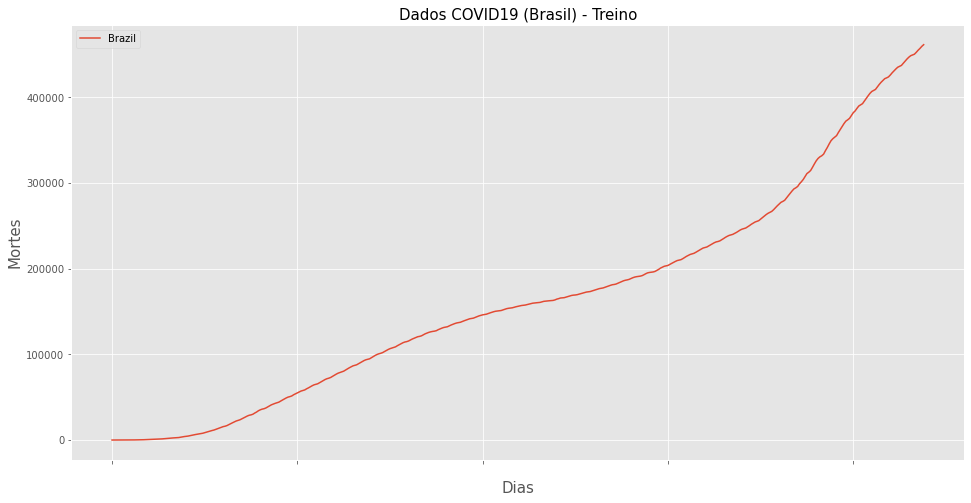

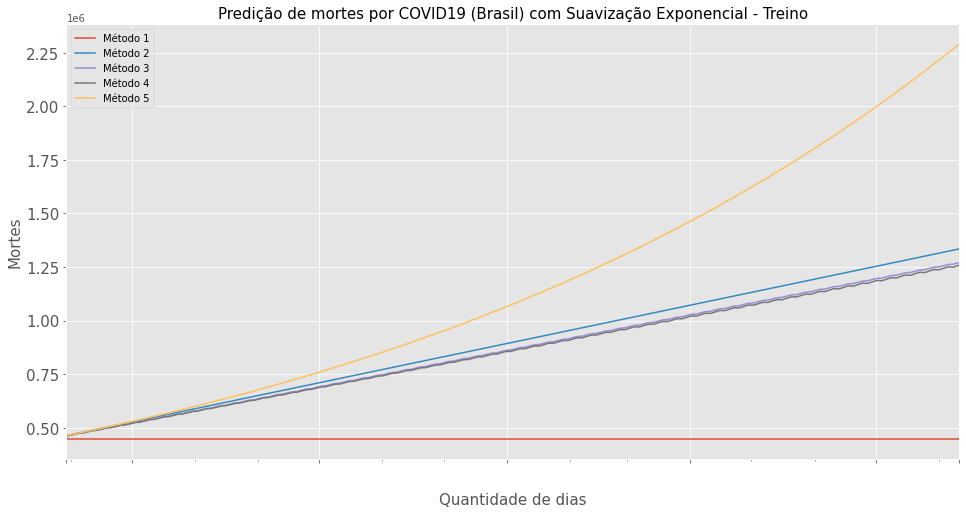

*************Métricas do Algoritmo de Suavização Simples dados de Treino*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 280125.281
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 305979.858
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                              

<Figure size 1152x576 with 0 Axes>

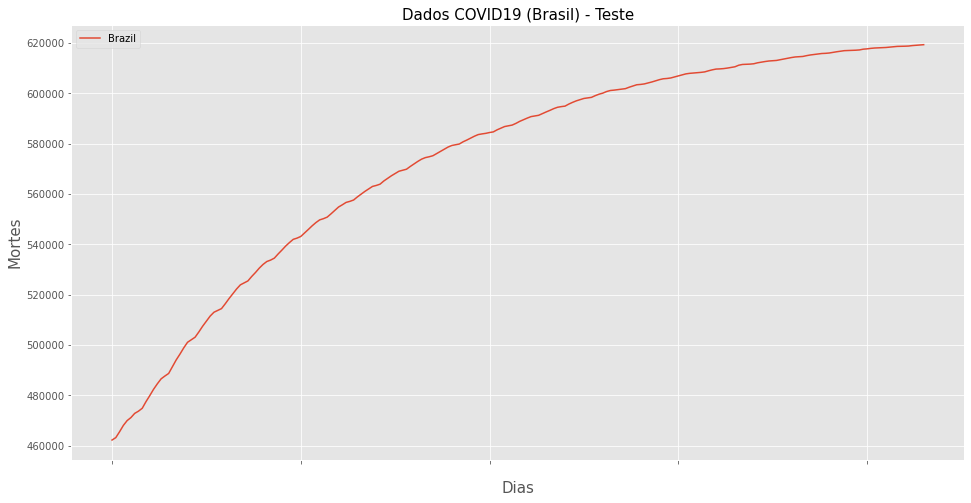

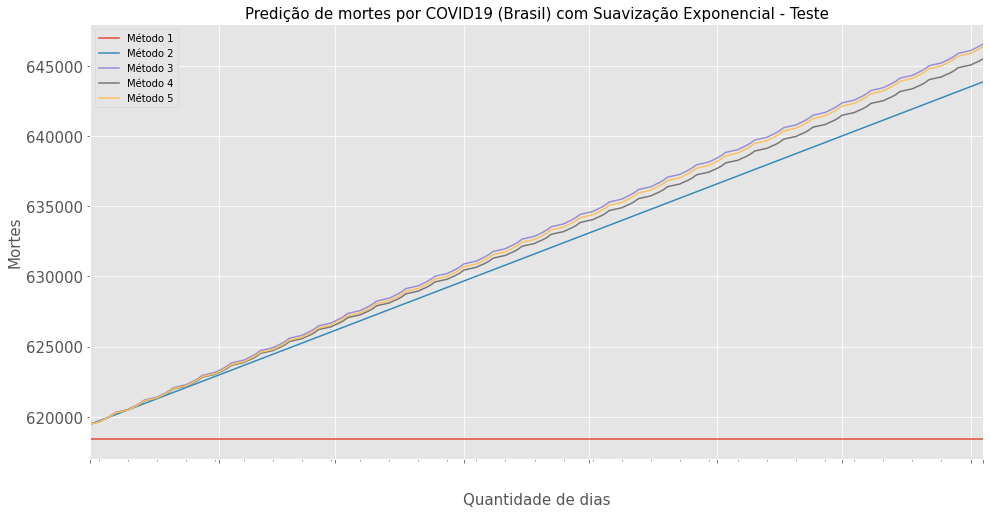

*************Métricas do Algoritmo de Suavização Simples dados de Teste*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 44496.74
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 62201.924
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                                  

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred f

<Figure size 1152x576 with 0 Axes>

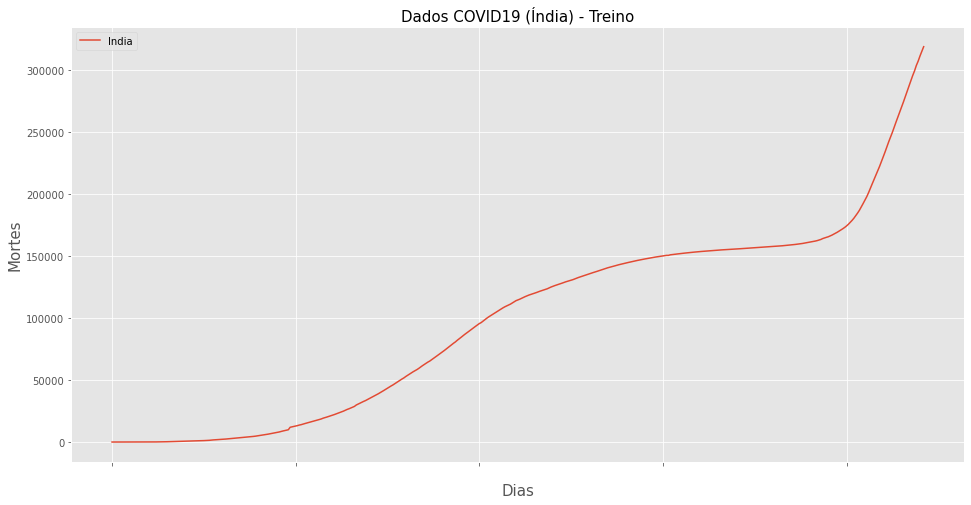

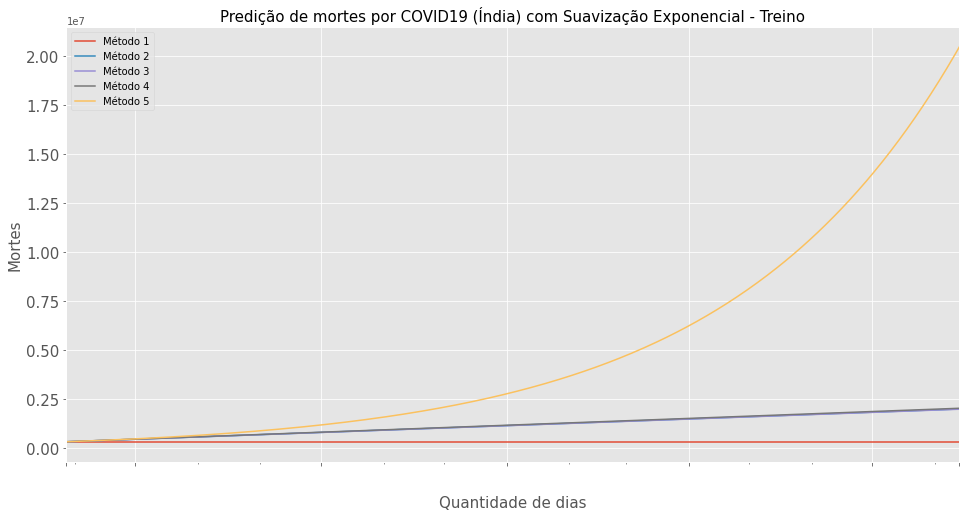

*************Métricas do Algoritmo de Suavização Simples dados de Treino*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 189334.747
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 203890.699
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                              

<Figure size 1152x576 with 0 Axes>

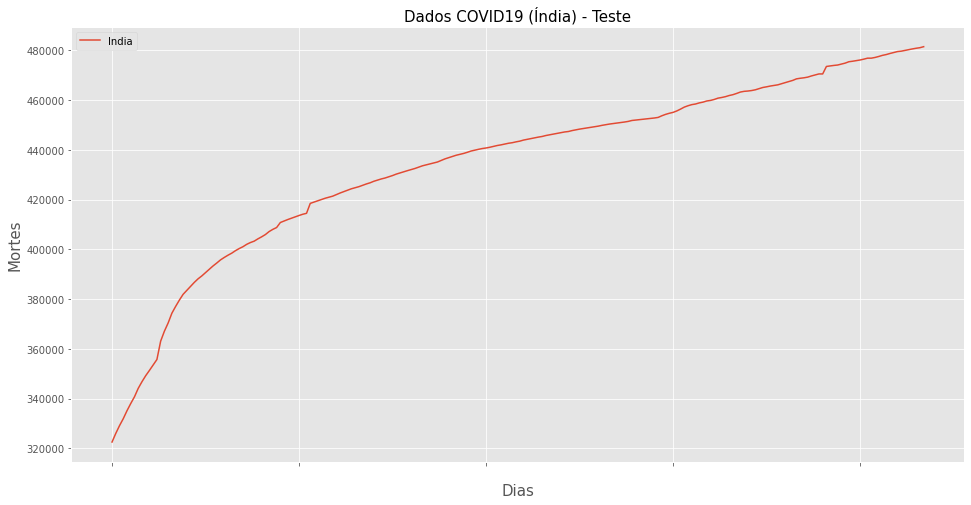

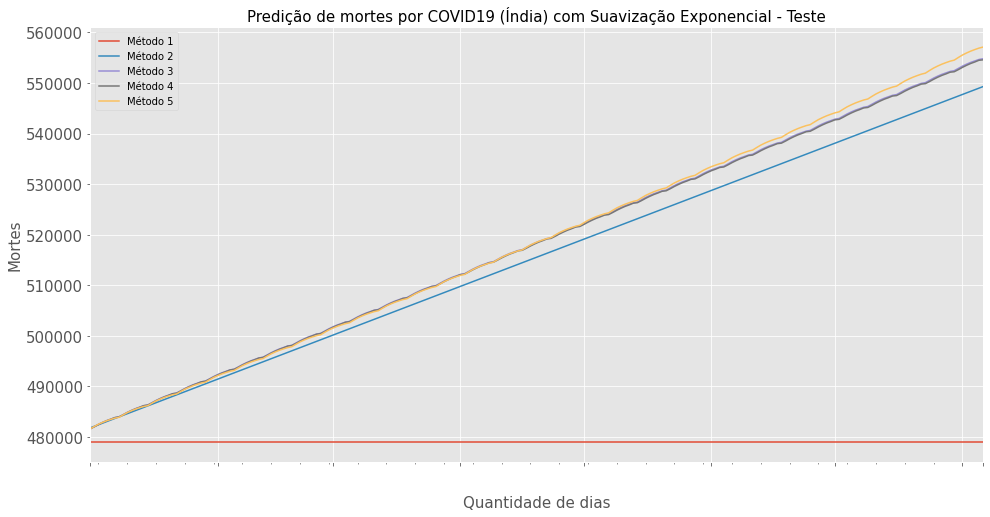

*************Métricas do Algoritmo de Suavização Simples dados de Teste*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 44254.234
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 56866.236
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                                 

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred f

<Figure size 1152x576 with 0 Axes>

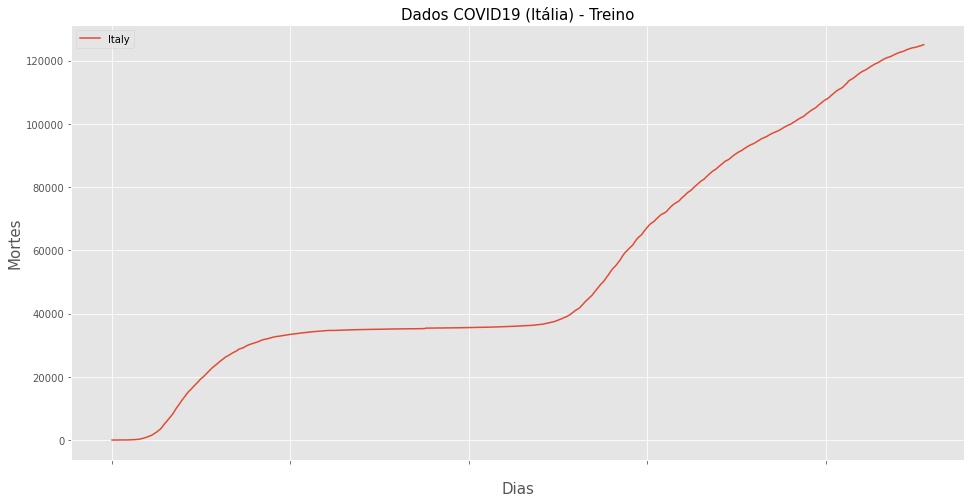

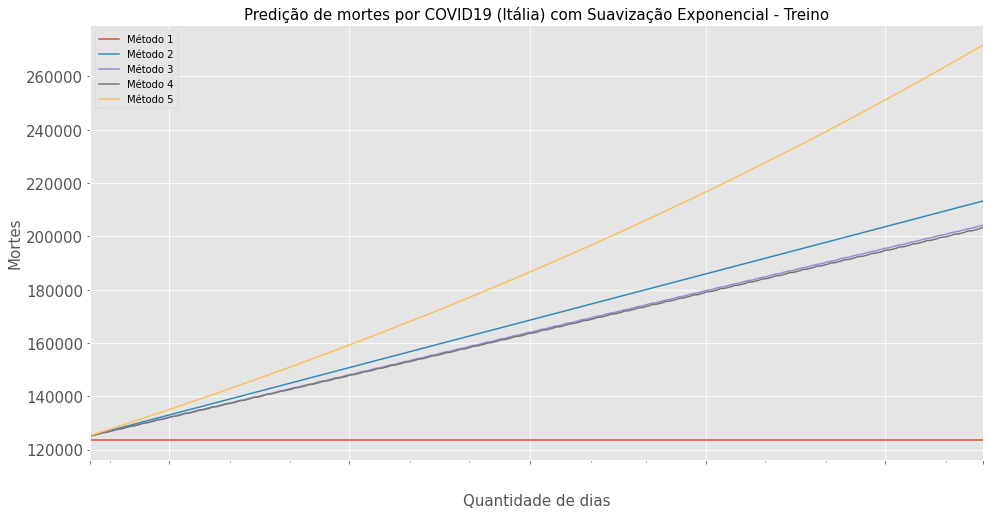

*************Métricas do Algoritmo de Suavização Simples dados de Treino*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 68664.211
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 77244.983
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                                

<Figure size 1152x576 with 0 Axes>

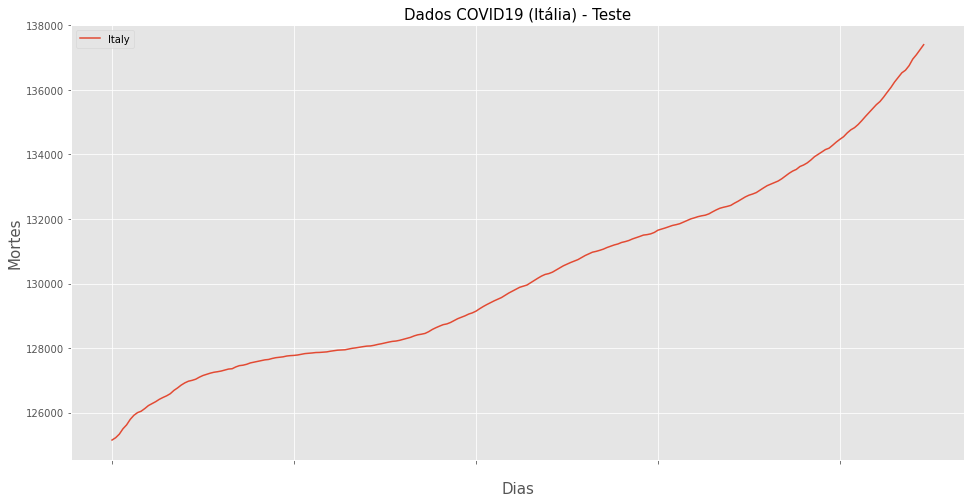

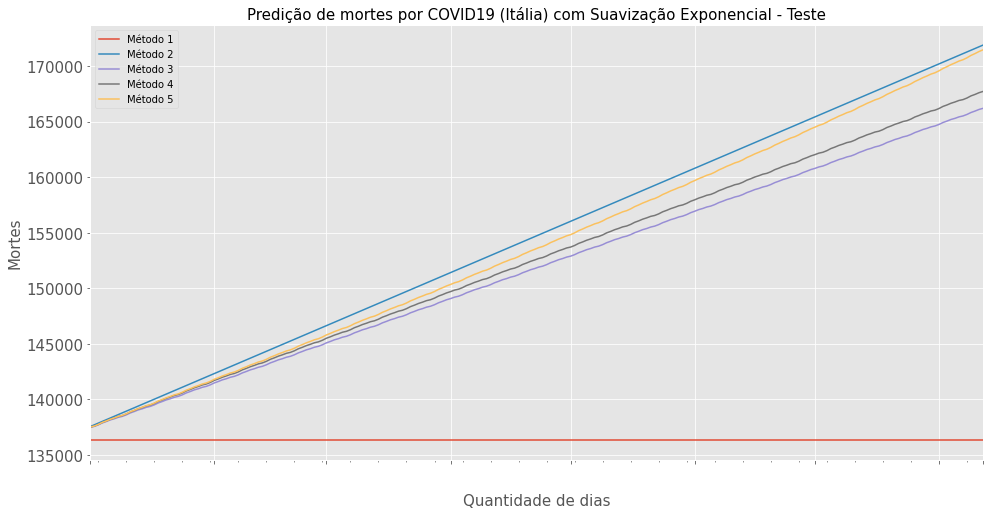

*************Métricas do Algoritmo de Suavização Simples dados de Teste*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 6073.057
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 6716.054
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                                   

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred f

<Figure size 1152x576 with 0 Axes>

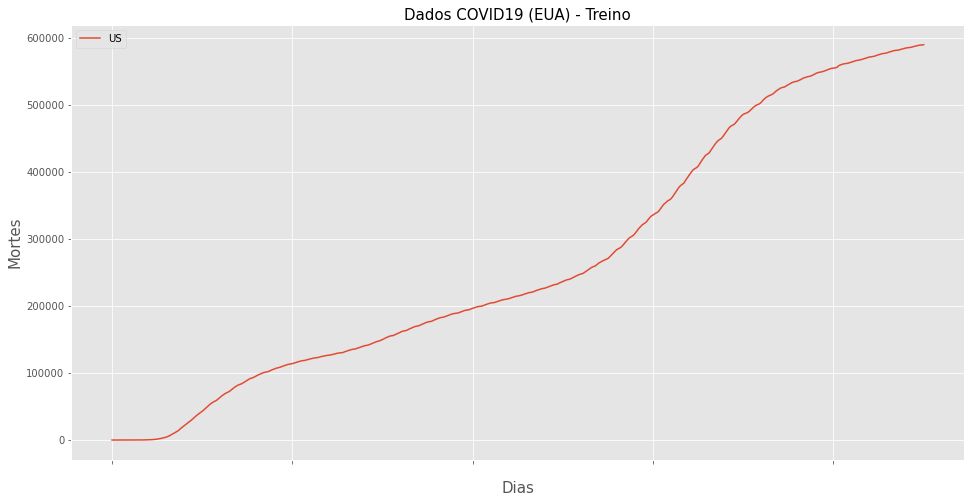

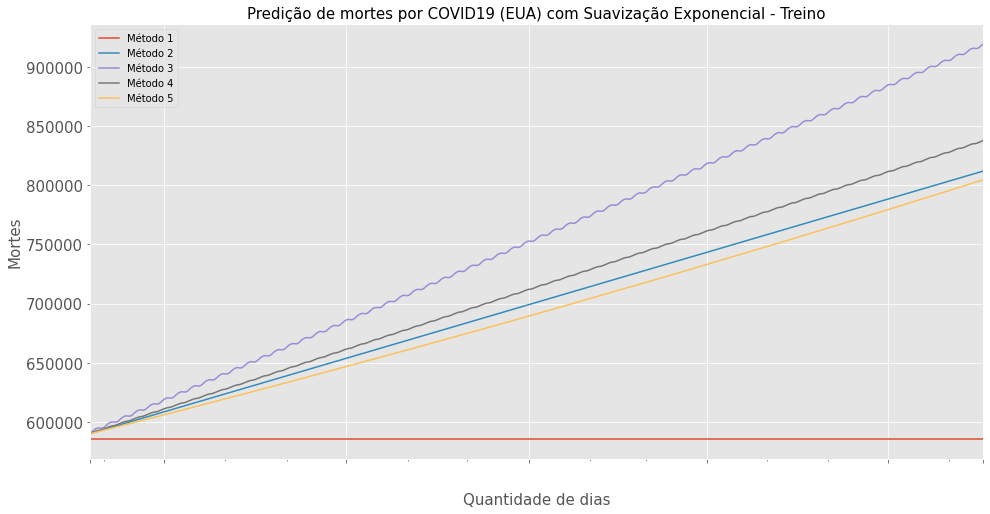

*************Métricas do Algoritmo de Suavização Simples dados de Treino*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 318171.048
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 369254.312
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                              

<Figure size 1152x576 with 0 Axes>

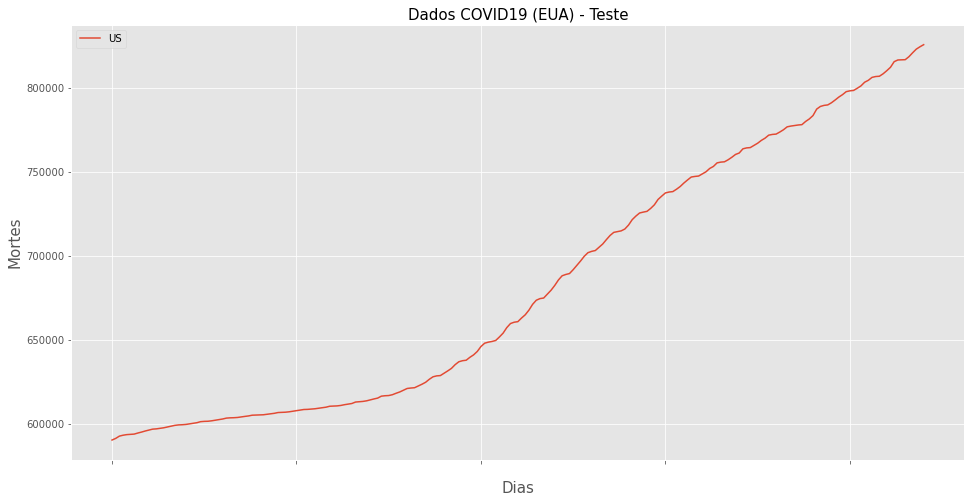

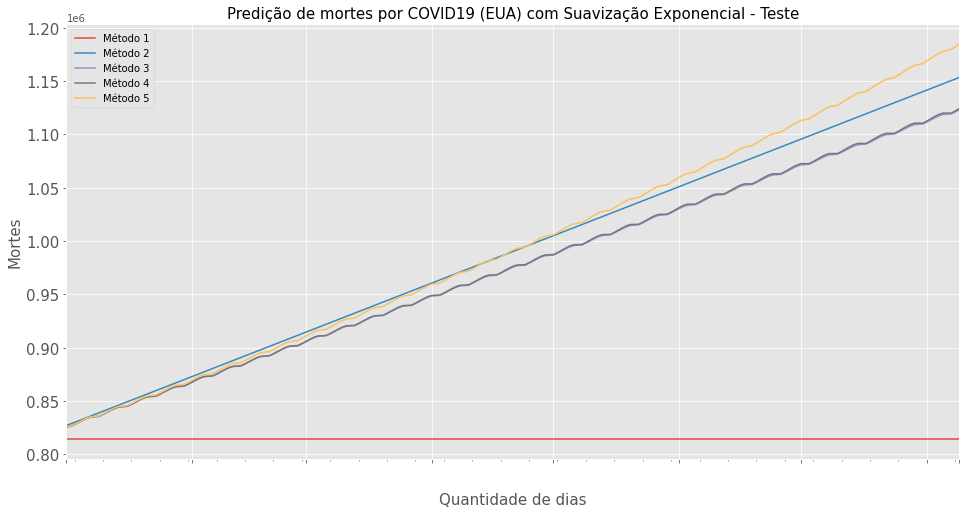

*************Métricas do Algoritmo de Suavização Simples dados de Teste*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 131833.212
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 152043.7
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                                 

In [2]:
country = ['Brasil', 'Índia', 'Itália', 'EUA'] #Lista de países
for i in range(len(country)):
    if country[i] == "Brasil":
        dataframe = read_csv("datasets/countries/mortes_covid19_brazil_date.csv",encoding='utf-8',index_col='date')

    if country[i] == "Índia":
        dataframe = read_csv("datasets/countries/mortes_covid19_india_date.csv",encoding='utf-8',index_col='date')
        
    if country[i] == "Itália":
        dataframe = read_csv("datasets/countries/mortes_covid19_italy_date.csv",encoding='utf-8',index_col='date')

    if country[i] == "EUA":
        dataframe = read_csv("datasets/countries/mortes_covid19_us_date.csv",encoding='utf-8',index_col='date')
    total = len(dataframe)
    t = int(total*0.33)
    treino=dataframe.iloc[:-t]
    teste=dataframe.iloc[-t:]
    
    #Implementando modelos
    m1=SimpleExpSmoothing(treino).fit(smoothing_level=0.111,optimized=True)
    model1=SimpleExpSmoothing(teste).fit(smoothing_level=0.111,optimized=True)
    modelotreino1=m1.forecast(len(treino))
    modelo1=model1.forecast(len(teste))
    m2=Holt(treino).fit(smoothing_level=0.7187)
    model2=Holt(teste).fit(smoothing_level=0.7187)
    modelotreino2=m2.forecast(len(treino))
    modelo2=model2.forecast(len(teste))
    m3=ExponentialSmoothing(treino,trend='add',seasonal='add').fit()
    model3=ExponentialSmoothing(teste,trend='add',seasonal='add').fit()
    modelotreino3=m3.forecast(len(treino))
    modelo3=model3.forecast(len(teste))
    m4=ExponentialSmoothing(treino,trend='add',seasonal='mul').fit()
    model4=ExponentialSmoothing(teste,trend='add',seasonal='mul').fit()
    modelotreino4=m4.forecast(len(treino))
    modelo4=model4.forecast(len(teste))
    m5=ExponentialSmoothing(treino,trend='mul',seasonal='add').fit()
    model5=ExponentialSmoothing(teste,trend='mul',seasonal='add').fit()
    modelotreino5=m5.forecast(len(treino))
    modelo5=model5.forecast(len(teste))
    
    #Plotando treinos
    plt.figure(figsize=(16,8))
    treino.plot(figsize=(16,8))
    plt.title('Dados COVID19 (%s) - Treino' %(country[i]), size = 15)
    plt.xticks(color='w')
    plt.ylabel('Mortes', size = 15)
    plt.xlabel('Dias', size = 15)
    
    plt.figure(figsize=(16,8))
    modelotreino1.plot(figsize=(16,8))
    modelotreino2.plot()
    modelotreino3.plot()
    modelotreino4.plot()
    modelotreino5.plot()
    plt.title('Predição de mortes por COVID19 (%s) com Suavização Exponencial - Treino' %(country[i]), size = 15)
    plt.ylabel('Mortes', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.yticks(size=15)
    plt.xticks(color='w')
    lista=['Método 1','Método 2','Método 3','Método 4','Método 5']
    plt.legend(lista)
    plt.show()

    print('*************Métricas do Algoritmo de Suavização Simples dados de Treino*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Simples :',round(mean_absolute_error(treino,modelotreino1),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Simples :',round(mean_squared_error(treino,modelotreino1)**0.5,3))


    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Holt*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Holt:',round(mean_absolute_error(treino,modelotreino2),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização',round(mean_squared_error(treino,modelotreino2)**0.5,3))

    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Holt-Winters aditivo*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Holt-Winters aditivo :', round(mean_absolute_error(treino,modelotreino3),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Holt-Winters aditivo :',round(mean_squared_error(treino,modelotreino3)**0.5,3))

    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Holt-Winters multiplicativo*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Holt-Winters multiplicativo :',round(mean_absolute_error(treino,modelotreino4),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Holt-Winters multiplicativo :',round(mean_squared_error(treino,modelotreino4)**0.5,3))

    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Pegels aditivo *************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Pegels aditivo :',round(mean_absolute_error(treino,modelotreino5),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Pegels aditivo :',round(mean_squared_error(treino,modelotreino5)**0.5,3))

    print(' '*254)
    #Plotando testes
    plt.figure(figsize=(16,8))
    teste.plot(figsize=(16,8))
    plt.title('Dados COVID19 (%s) - Teste' %(country[i]), size = 15)
    plt.xticks(color='w')
    plt.ylabel('Mortes', size = 15)
    plt.xlabel('Dias', size = 15)
    plt.figure(figsize=(16,8))
    modelo1.plot(figsize=(16,8))
    modelo2.plot()
    modelo3.plot()
    modelo4.plot()
    modelo5.plot()
    plt.title('Predição de mortes por COVID19 (%s) com Suavização Exponencial - Teste' %(country[i]), size = 15)
    plt.ylabel('Mortes', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.xticks(color='w')
    plt.yticks(size=15)
    lista=['Método 1','Método 2','Método 3','Método 4','Método 5']
    plt.legend(lista)
    plt.show()
    print('*************Métricas do Algoritmo de Suavização Simples dados de Teste*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Simples :',round(mean_absolute_error(teste,modelo1),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Simples :',round(mean_squared_error(teste,modelo1)**0.5,3))


    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Holt*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Holt:',round(mean_absolute_error(teste,modelo2),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização',round(mean_squared_error(teste,modelo2)**0.5,3))

    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Holt-Winters aditivo*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Holt-Winters aditivo :', round(mean_absolute_error(teste,modelo3),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Holt-Winters aditivo :',round(mean_squared_error(teste,modelo3)**0.5,3))

    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Holt-Winters multiplicativo*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Holt-Winters multiplicativo :',round(mean_absolute_error(teste,modelo4),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Holt-Winters multiplicativo :',round(mean_squared_error(teste,modelo4)**0.5,3))

    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Pegels aditivo *************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Pegels aditivo :',round(mean_absolute_error(teste,modelo5),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Pegels aditivo :',round(mean_squared_error(teste,modelo5)**0.5,3))

    print(' '*254)

# Implementação do Modelo ARIMA

In [6]:
#Criando dicionários
preds = dict()
outtest = dict()
outtrain = dict()
rmses = dict()
rmses_t = dict()
trainss = dict()
maes = dict()
country = ['Brasil', 'Índia', 'Itália', 'EUA'] #Lista de países

In [9]:
#Verificando melhores parâmetros (p,d,q)
from pmdarima.arima import auto_arima

for i in range(len(country)):
    if country[i] == "Brasil":
        dataframe = read_csv("datasets/countries/mortes_covid19_brazil_date.csv",encoding='utf-8',index_col='date')

    if country[i] == "Índia":
        dataframe = read_csv("datasets/countries/mortes_covid19_india_date.csv",encoding='utf-8',index_col='date')
        
    if country[i] == "Itália":
        dataframe = read_csv("datasets/countries/mortes_covid19_italy_date.csv",encoding='utf-8',index_col='date')

    if country[i] == "EUA":
        dataframe = read_csv("datasets/countries/mortes_covid19_us_date.csv",encoding='utf-8',index_col='date')
    bruteforce_modelo = auto_arima(dataframe, start_p=0, start_d=0 ,start_q=0,max_p=8, max_d=8,max_q=8, m=12, start_P=0, seasonal=True, d=1, D=1, trace=True, error_action='ignore',suppress_warnings=True, stepwise=False)
    print('Resultados do ', country[i])
    print(f"Resultado AIC: {bruteforce_modelo.aic()}")
    print(f"Melhores parâmetros (p,d,q): {bruteforce_modelo.order}")

 ARIMA(0,1,0)(0,1,0)[12]             : AIC=10091.313, Time=0.05 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=9964.275, Time=0.51 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=9965.442, Time=1.27 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=10029.034, Time=0.12 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=9966.168, Time=0.69 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=3.07 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=9881.906, Time=0.55 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=9884.629, Time=0.46 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=9779.979, Time=6.49 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=9789.188, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=9600.985, Time=0.89 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=9602.985, Time=2.15 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=9680.931, Time=0.44 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=9602.985, Time=1.38 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=9.98 sec
 AR

 ARIMA(0,1,3)(0,1,1)[12]             : AIC=9787.732, Time=1.37 sec
 ARIMA(0,1,3)(0,1,2)[12]             : AIC=9789.319, Time=2.83 sec
 ARIMA(0,1,3)(1,1,0)[12]             : AIC=9801.254, Time=0.67 sec
 ARIMA(0,1,3)(1,1,1)[12]             : AIC=inf, Time=4.47 sec
 ARIMA(0,1,3)(2,1,0)[12]             : AIC=9791.031, Time=1.33 sec
 ARIMA(0,1,4)(0,1,0)[12]             : AIC=9860.857, Time=0.53 sec
 ARIMA(0,1,4)(0,1,1)[12]             : AIC=9754.807, Time=1.99 sec
 ARIMA(0,1,4)(1,1,0)[12]             : AIC=9769.017, Time=0.83 sec
 ARIMA(0,1,5)(0,1,0)[12]             : AIC=9840.202, Time=0.67 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=9883.879, Time=0.04 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=1.54 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=4.57 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=9769.955, Time=0.41 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=2.37 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=5.02 sec
 ARIMA(1,1,0)(2,1,0)

 ARIMA(1,1,2)(1,1,0)[12]             : AIC=7737.881, Time=0.95 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=inf, Time=5.61 sec
 ARIMA(1,1,2)(2,1,0)[12]             : AIC=7626.464, Time=2.83 sec
 ARIMA(1,1,3)(0,1,0)[12]             : AIC=7889.709, Time=0.51 sec
 ARIMA(1,1,3)(0,1,1)[12]             : AIC=inf, Time=2.51 sec
 ARIMA(1,1,3)(1,1,0)[12]             : AIC=7732.245, Time=1.82 sec
 ARIMA(1,1,4)(0,1,0)[12]             : AIC=inf, Time=3.61 sec
 ARIMA(2,1,0)(0,1,0)[12]             : AIC=7959.964, Time=0.09 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=2.42 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=inf, Time=2.88 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=7791.283, Time=0.65 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=5.68 sec
 ARIMA(2,1,0)(1,1,2)[12]             : AIC=inf, Time=4.91 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=7683.702, Time=1.73 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=3.66 sec
 ARIMA(2,1,1)(0,1,0)[12]           

 ARIMA(3,1,0)(1,1,0)[12]             : AIC=10382.415, Time=1.78 sec
 ARIMA(3,1,0)(1,1,1)[12]             : AIC=inf, Time=4.93 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=10322.222, Time=4.64 sec
 ARIMA(3,1,1)(0,1,0)[12]             : AIC=inf, Time=0.87 sec
 ARIMA(3,1,1)(0,1,1)[12]             : AIC=inf, Time=8.03 sec
 ARIMA(3,1,1)(1,1,0)[12]             : AIC=inf, Time=4.33 sec
 ARIMA(3,1,2)(0,1,0)[12]             : AIC=inf, Time=1.11 sec
 ARIMA(4,1,0)(0,1,0)[12]             : AIC=10513.697, Time=0.16 sec
 ARIMA(4,1,0)(0,1,1)[12]             : AIC=inf, Time=4.72 sec
 ARIMA(4,1,0)(1,1,0)[12]             : AIC=10370.967, Time=2.20 sec
 ARIMA(4,1,1)(0,1,0)[12]             : AIC=10514.342, Time=0.37 sec
 ARIMA(5,1,0)(0,1,0)[12]             : AIC=10507.472, Time=0.25 sec

Best model:  ARIMA(1,1,2)(2,1,0)[12]          
Total fit time: 325.449 seconds
Resultados do  EUA
Resultado AIC: 10262.133773419187
Melhores parâmetros (p,d,q): (1, 1, 2)


In [7]:
#Parâmetros
p = {'Brasil':3, 'Índia':1, 'Itália':1, 'EUA':1}
d = {'Brasil':1, 'Índia':1, 'Itália':1, 'EUA':1}
q = {'Brasil':0, 'Índia':2, 'Itália':2, 'EUA':2}

# load dataset
for i in range(len(country)):
    if country[i] == 'Brasil':
        series = read_csv('datasets/countries/mortes_covid19_brazil.csv', usecols=[1], engine='python')
    if country[i] == 'Índia':
        series = read_csv('datasets/countries/mortes_covid19_india.csv', usecols=[1], engine='python')
    if country[i] == 'Itália':
        series = read_csv('datasets/countries/mortes_covid19_italy.csv', usecols=[1], engine='python')
    if country[i] == 'EUA':
        series = read_csv('datasets/countries/mortes_covid19_us.csv', usecols=[1], engine='python')
    # split into train and test sets
    X = series.values
    size = int(len(X) * 0.66)
    train, test = X[0:size], X[size:len(X)]
    trains = list()
    predictions = list()
    history = [x for x in train]
    # walk-forward validation
    for t in range(len(train)):
        #model = ARIMA(history, order=(p[country[i]],d[country[i]],q[country[i]]))
        model = ARIMA(history, order=(1,0,1))
        model_fit = model.fit()
        output = model_fit.forecast()
        yhat = output[0]
        trains.append(yhat)
        obs = train[t]
        history.append(obs)
        #print('predicted=%f, expected=%f' % (yhat, obs))
        # evaluate forecasts
    for t in range(len(test)):
        #model = ARIMA(history, order=(p[country[i]],d[country[i]],q[country[i]]))
        model = ARIMA(history, order=(1,1,1))
        model_fit = model.fit()
        output = model_fit.forecast()
        yhat = output[0]
        predictions.append(yhat)
        obs = test[t]
        history.append(obs)
        #print('predicted=%f, expected=%f' % (yhat, obs))
        # evaluate forecasts
    mae = mean_absolute_error(test, predictions)
    rmse_t = math.sqrt(mean_squared_error(train, trains))
    rmse = math.sqrt(mean_squared_error(test, predictions))
    maes[country[i]] = mae
    rmses[country[i]] = rmse
    rmses_t[country[i]] = rmse_t
    trainss[country[i]] = trains
    preds[country[i]] = predictions
    outtest[country[i]] = test
    outtrain[country[i]] = train

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\ProgramData\Anaconda3\lib\s


ARIMA - O melhor caso - Brasil



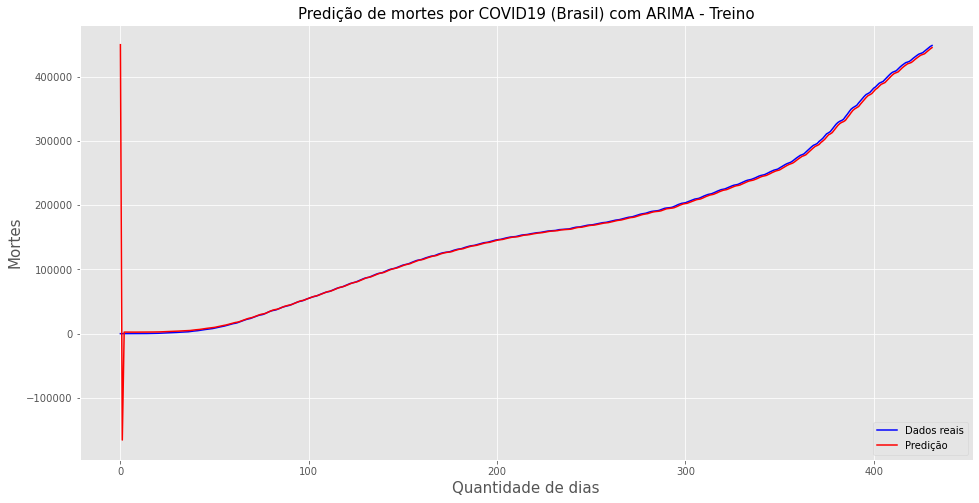

Train RMSE: 23155.663


p: 3 d: 1 q: 0

ARIMA - O melhor caso - Índia



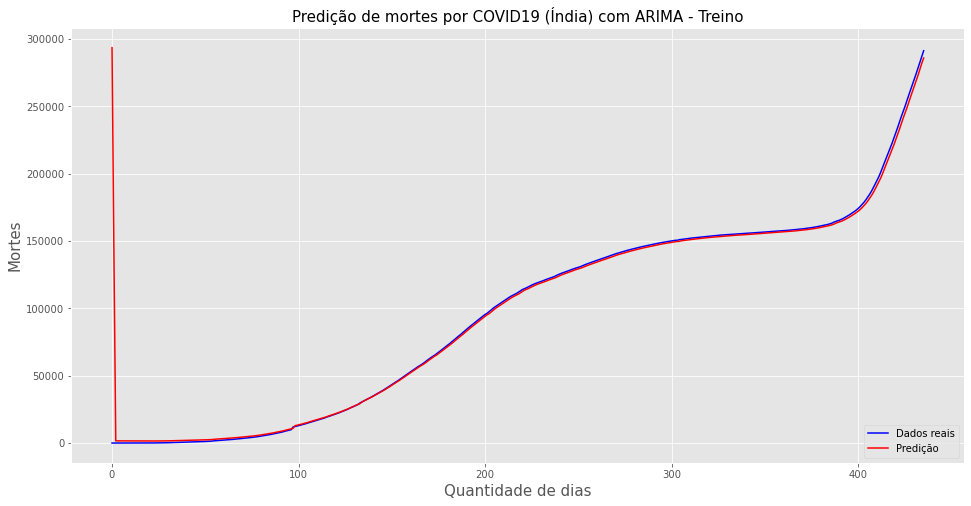

Train RMSE: 15707.879


p: 1 d: 1 q: 2

ARIMA - O melhor caso - Itália



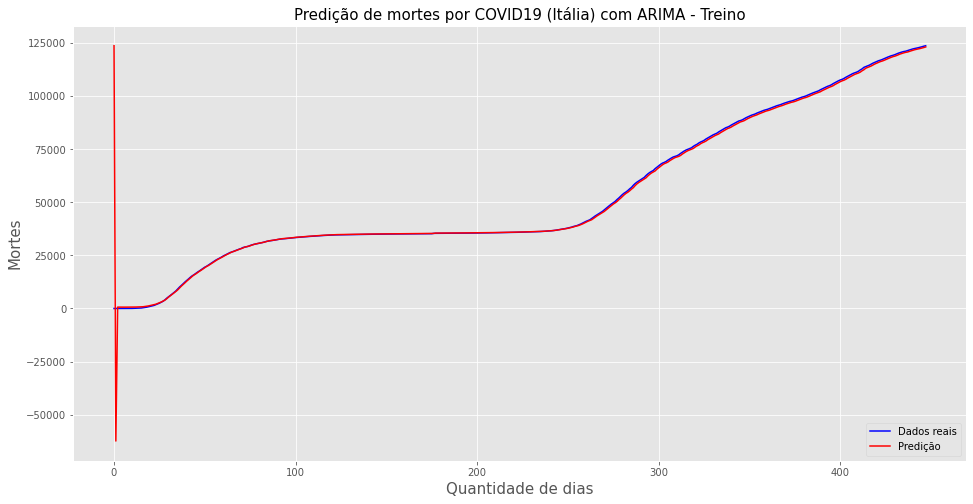

Train RMSE: 6570.268


p: 1 d: 1 q: 2

ARIMA - O melhor caso - EUA



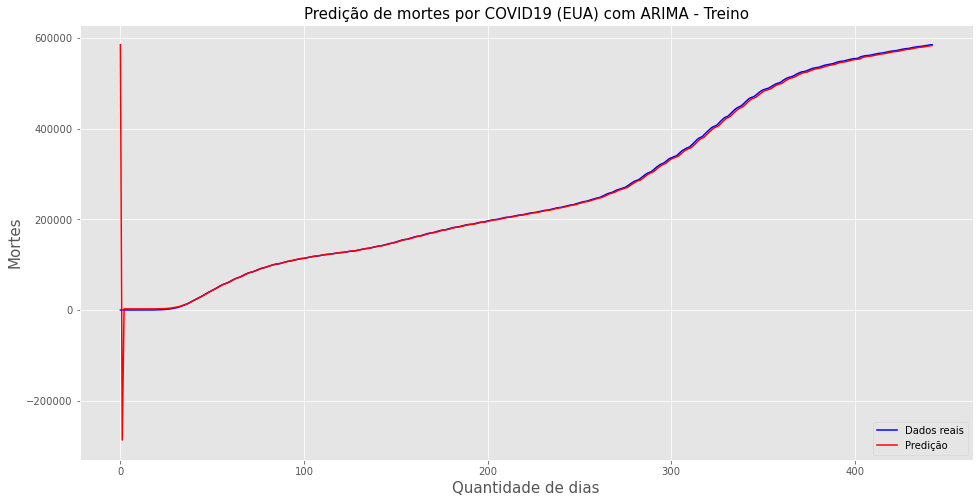

Train RMSE: 31052.955


p: 1 d: 1 q: 2


In [8]:
#Plotando treinos
for i in range(len(country)):
    print("\nARIMA - O melhor caso - %s\n" %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de mortes por COVID19 (%s) com ARIMA - Treino' %(country[i]), size = 15)
    plt.ylabel('Mortes', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(outtrain[country[i]], label = 'Dados reais', color = 'blue')
    plt.plot(trainss[country[i]], label = 'Predição', color='red')
    plt.legend()
    plt.show()
    print('Train RMSE: %.3f\n\n' % rmses_t[country[i]])
    print("p:", p[country[i]],"d:",d[country[i]],"q:",q[country[i]])


ARIMA - O melhor caso - Brasil



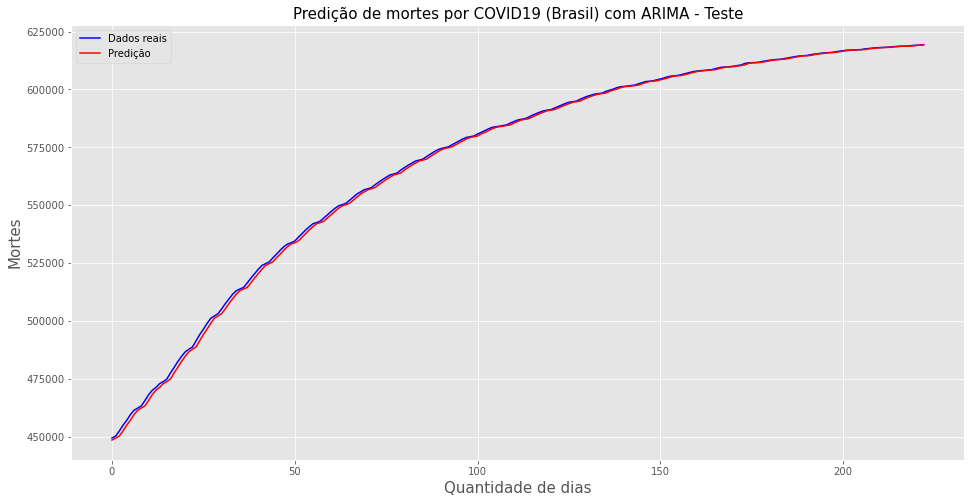

Test RMSE: 1012.540


Test MAE: 756.392


p: 3 d: 1 q: 0

ARIMA - O melhor caso - Índia



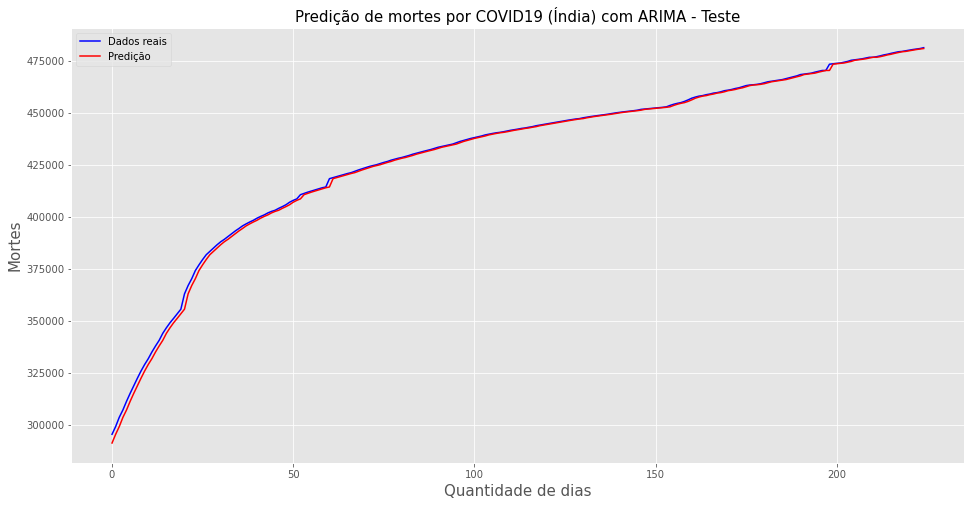

Test RMSE: 1364.611


Test MAE: 840.581


p: 1 d: 1 q: 2

ARIMA - O melhor caso - Itália



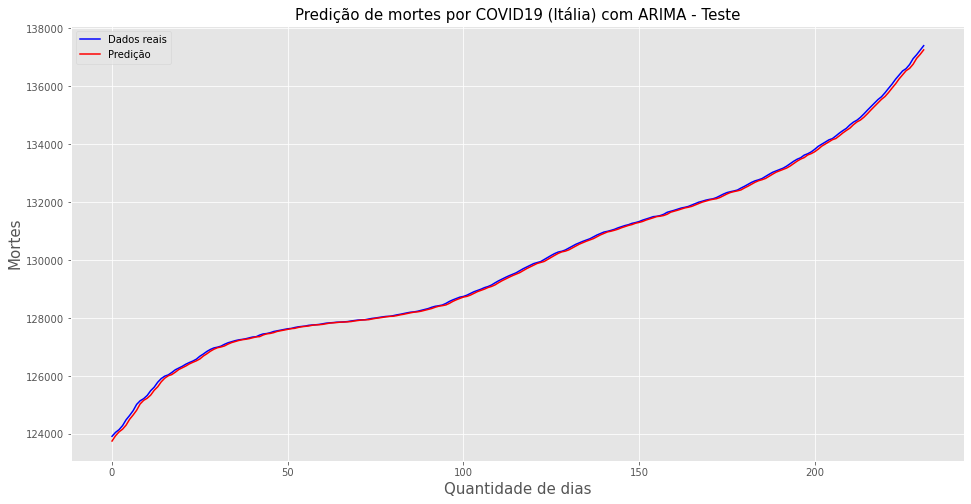

Test RMSE: 66.503


Test MAE: 53.915


p: 1 d: 1 q: 2

ARIMA - O melhor caso - EUA



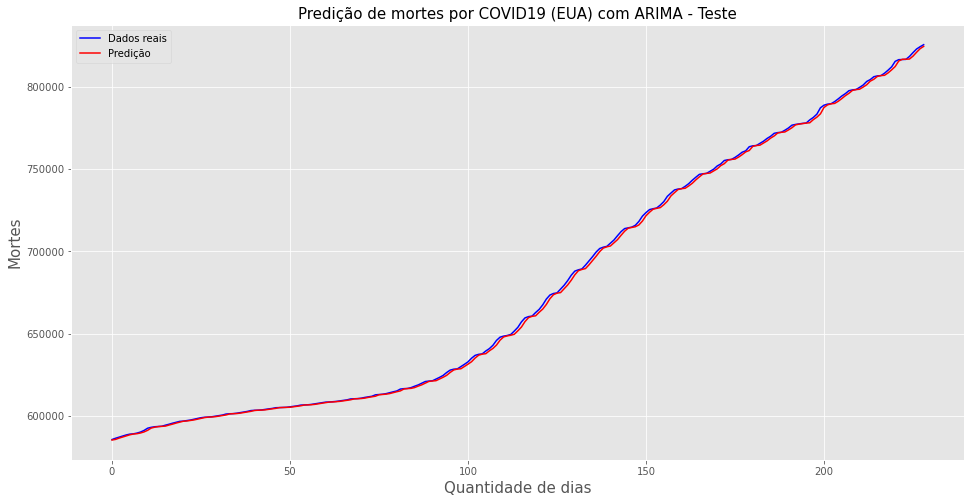

Test RMSE: 1237.442


Test MAE: 917.848


p: 1 d: 1 q: 2


In [9]:
#Plotando testes
for i in range(len(country)):
    print("\nARIMA - O melhor caso - %s\n" %(country[i]))
    plt.figure(figsize=(16,8))
    plt.title('Predição de mortes por COVID19 (%s) com ARIMA - Teste' %(country[i]), size = 15)
    plt.ylabel('Mortes', size = 15)
    plt.xlabel('Quantidade de dias', size = 15)
    plt.plot(outtest[country[i]], label = 'Dados reais', color = 'blue')
    plt.plot(preds[country[i]], label = 'Predição', color='red')
    plt.legend()
    plt.show()
    print('Test RMSE: %.3f\n\n' % rmses[country[i]])
    print('Test MAE: %.3f\n\n' % maes[country[i]])
    print("p:", p[country[i]],"d:",d[country[i]],"q:",q[country[i]])


            

                               SARIMAX Results                                
Dep. Variable:                 Brazil   No. Observations:                  655
Model:                 ARIMA(3, 1, 0)   Log Likelihood               -4798.121
Date:                Thu, 06 Jan 2022   AIC                           9604.242
Time:                        03:11:37   BIC                           9622.174
Sample:                             0   HQIC                          9611.195
                                - 655                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0627      0.037     28.552      0.000       0.990       1.136
ar.L2         -0.4679      0.036    -12.868      0.000      -0.539      -0.397
ar.L3          0.3666      0.019     19.077      0.0

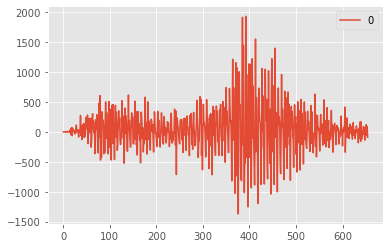

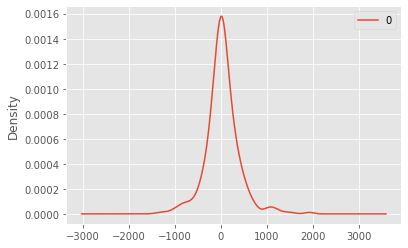

                 0
count   655.000000
mean     36.624509
std     369.179645
min   -1371.530430
25%    -133.012029
50%      21.630329
75%     189.170360
max    1935.765474


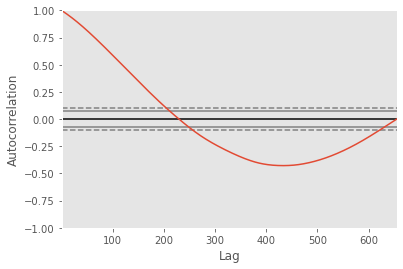

                               SARIMAX Results                                
Dep. Variable:                  India   No. Observations:                  661
Model:                 ARIMA(1, 1, 2)   Log Likelihood               -4774.641
Date:                Thu, 06 Jan 2022   AIC                           9557.281
Time:                        03:11:38   BIC                           9575.250
Sample:                             0   HQIC                          9564.246
                                - 661                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9934      0.003    294.632      0.000       0.987       1.000
ma.L1         -0.6338      0.020    -32.414      0.000      -0.672      -0.596
ma.L2          0.0230      0.020      1.179      0.2

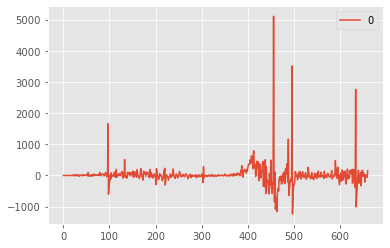

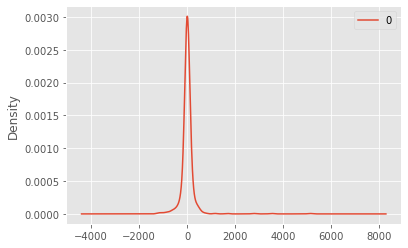

                 0
count   661.000000
mean     13.633596
std     334.578848
min   -1233.156439
25%     -38.403229
50%       0.783681
75%      49.360349
max    5109.487879


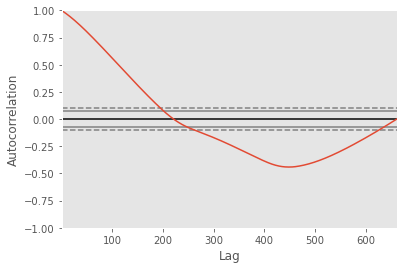

                               SARIMAX Results                                
Dep. Variable:                  Italy   No. Observations:                  680
Model:                 ARIMA(1, 1, 2)   Log Likelihood               -3777.054
Date:                Thu, 06 Jan 2022   AIC                           7562.109
Time:                        03:11:38   BIC                           7580.191
Sample:                             0   HQIC                          7569.108
                                - 680                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9947      0.002    434.209      0.000       0.990       0.999
ma.L1         -0.3392      0.023    -14.458      0.000      -0.385      -0.293
ma.L2         -0.2176      0.025     -8.690      0.0

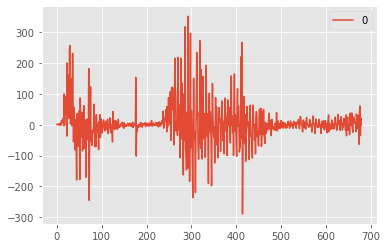

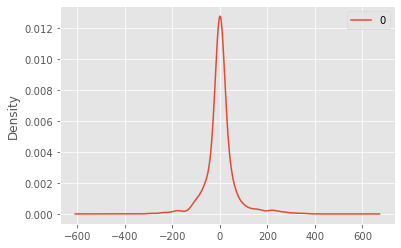

                0
count  680.000000
mean     2.922547
std     62.822658
min   -289.043317
25%    -14.635706
50%      0.227055
75%     15.312424
max    351.903695


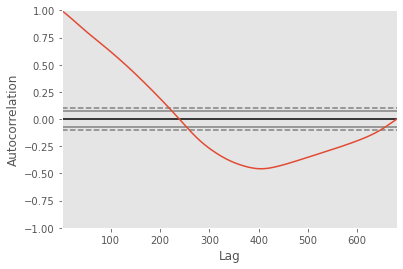

                               SARIMAX Results                                
Dep. Variable:                     US   No. Observations:                  672
Model:                 ARIMA(1, 1, 2)   Log Likelihood               -5132.951
Date:                Thu, 06 Jan 2022   AIC                          10273.902
Time:                        03:11:39   BIC                          10291.937
Sample:                             0   HQIC                         10280.888
                                - 672                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9999      0.002    448.230      0.000       0.996       1.004
ma.L1         -0.2945      0.027    -10.926      0.000      -0.347      -0.242
ma.L2         -0.4964      0.028    -17.957      0.0

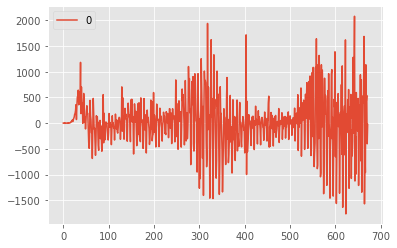

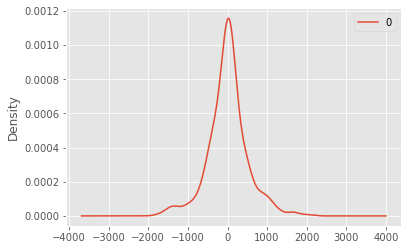

                 0
count   672.000000
mean     10.819830
std     507.062924
min   -1764.276929
25%    -238.181011
50%      10.873598
75%     213.320607
max    2077.825316


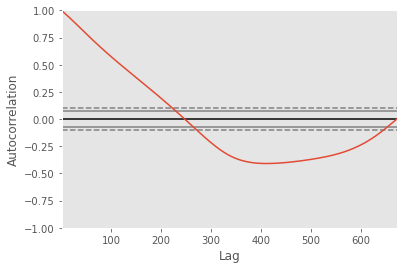

In [18]:
#Análise dos dados com ARIMA
country = ['Brasil', 'Índia', 'Itália', 'EUA'] #Lista de países
for i in range(len(country)):
    if country[i] == 'Brasil':
        series = read_csv('datasets/countries/mortes_covid19_brazil.csv', usecols=[1], engine='python')
    if country[i] == 'Índia':
        series = read_csv('datasets/countries/mortes_covid19_india.csv', usecols=[1], engine='python')
    if country[i] == 'Itália':
        series = read_csv('datasets/countries/mortes_covid19_italy.csv', usecols=[1], engine='python')
    if country[i] == 'EUA':
        series = read_csv('datasets/countries/mortes_covid19_us.csv', usecols=[1], engine='python')
    model = ARIMA(series, order=(p[country[i]],d[country[i]],q[country[i]]))
    model_fit = model.fit()
    output = model_fit.forecast()
    # summary of fit model
    print(model_fit.summary())
    # line plot of residuals
    residuals = pandas.DataFrame(model_fit.resid)
    residuals.plot()
    plt.show()
    # density plot of residuals
    residuals.plot(kind='kde')
    plt.show()
    # summary stats of residuals
    print(residuals.describe())
    autocorrelation_plot(series)
    plt.show()